In [1]:
# Cell 1: Environment and GPU check

import sys
import platform
from pathlib import Path

print("Python executable:", sys.executable)
print("Python version:", sys.version)
print("Platform:", platform.platform())

try:
    import torch
    
    print("\nPyTorch version:", torch.__version__)
    print("CUDA available:", torch.cuda.is_available())
    
    if torch.cuda.is_available():
        print("CUDA version used by PyTorch:", torch.version.cuda)
        print("GPU name:", torch.cuda.get_device_name(0))
        print("GPU memory allocated GB:", round(torch.cuda.memory_allocated(0) / 1024**3, 3))
        print("GPU memory reserved GB:", round(torch.cuda.memory_reserved(0) / 1024**3, 3))
    else:
        print("CUDA is not available in this notebook environment.")
        
except ImportError as error:
    print("PyTorch is not installed or not available in this environment.")
    print(error)

Python executable: d:\Projects\evidence_fashion_recommender\.venv\Scripts\python.exe
Python version: 3.11.15 (main, Jun  2 2026, 22:29:49) [MSC v.1944 64 bit (AMD64)]
Platform: Windows-10-10.0.26200-SP0

PyTorch version: 2.11.0+cu128
CUDA available: True
CUDA version used by PyTorch: 12.8
GPU name: NVIDIA GeForce RTX 5070 Ti
GPU memory allocated GB: 0.0
GPU memory reserved GB: 0.0


In [2]:
# Cell 2: Project folders and notebook paths

from pathlib import Path

PROJECT_ROOT = Path.cwd()

DATA_DIR = PROJECT_ROOT / "data"
RAW_DATA_DIR = DATA_DIR / "raw"
PROCESSED_DATA_DIR = DATA_DIR / "processed"
KB_DIR = DATA_DIR / "kb"

OUTPUTS_DIR = PROJECT_ROOT / "outputs"
EMBEDDINGS_DIR = OUTPUTS_DIR / "embeddings"
INDEXES_DIR = OUTPUTS_DIR / "indexes"
RESULTS_DIR = OUTPUTS_DIR / "results"
FIGURES_DIR = OUTPUTS_DIR / "figures"

folders = [
    DATA_DIR,
    RAW_DATA_DIR,
    PROCESSED_DATA_DIR,
    KB_DIR,
    OUTPUTS_DIR,
    EMBEDDINGS_DIR,
    INDEXES_DIR,
    RESULTS_DIR,
    FIGURES_DIR,
]

for folder in folders:
    folder.mkdir(parents=True, exist_ok=True)

print("Project root:", PROJECT_ROOT)
print("\nCreated/verified folders:")
for folder in folders:
    print("-", folder.relative_to(PROJECT_ROOT))

Project root: d:\Projects\evidence_fashion_recommender

Created/verified folders:
- data
- data\raw
- data\processed
- data\kb
- outputs
- outputs\embeddings
- outputs\indexes
- outputs\results
- outputs\figures


In [3]:
# Cell 3: Core library imports

import os
import json
import random
import math
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image
from tqdm.auto import tqdm

from datasets import load_dataset

pd.set_option("display.max_columns", None)
pd.set_option("display.max_colwidth", 120)

SEED = 42

random.seed(SEED)
np.random.seed(SEED)

print("Core imports loaded successfully.")
print("Ready for Stage 0: real dataset loading and inspection.")

Core imports loaded successfully.
Ready for Stage 0: real dataset loading and inspection.


In [4]:
# Cell 4: Load real Polyvore-style dataset from Hugging Face

DATASET_NAME = "Marqo/polyvore"

print(f"Loading dataset: {DATASET_NAME}")

dataset = load_dataset(DATASET_NAME)

print("\nDataset loaded successfully.")
print("Available splits:")
print(dataset)

print("\nSplit names:")
print(list(dataset.keys()))

Loading dataset: Marqo/polyvore

Dataset loaded successfully.
Available splits:
DatasetDict({
    data: Dataset({
        features: ['image', 'category', 'text', 'item_ID'],
        num_rows: 94096
    })
})

Split names:
['data']


In [5]:
# Cell 5: Inspect dataset structure and raw examples

split_names = list(dataset.keys())
main_split_name = split_names[0]

print("Using first split for initial inspection:", main_split_name)

main_split = dataset[main_split_name]

print("\nNumber of rows in selected split:", len(main_split))

print("\nColumn names:")
print(main_split.column_names)

print("\nFeature types:")
print(main_split.features)

print("\nFirst raw example:")
first_example = main_split[0]

for key, value in first_example.items():
    value_type = type(value)
    
    if isinstance(value, str):
        preview = value[:300]
    elif isinstance(value, (list, tuple)):
        preview = value[:3]
    else:
        preview = value
        
    print(f"\n{key}")
    print("Type:", value_type)
    print("Preview:", preview)

print("\nFirst 3 rows as a small pandas preview:")
display(main_split.select(range(min(3, len(main_split)))).to_pandas())

Using first split for initial inspection: data

Number of rows in selected split: 94096

Column names:
['image', 'category', 'text', 'item_ID']

Feature types:
{'image': Image(mode=None, decode=True), 'category': Value('string'), 'text': Value('string'), 'item_ID': Value('string')}

First raw example:

image
Type: <class 'PIL.JpegImagePlugin.JpegImageFile'>
Preview: <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=274x400 at 0x20B06CBB290>

category
Type: <class 'str'>
Preview: Day Dresses

text
Type: <class 'str'>
Preview: tibi knit long sleeve dress

item_ID
Type: <class 'str'>
Preview: 100002074_1

First 3 rows as a small pandas preview:


,image,category,text,item_ID
0,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01\x00H\x00H\x00\x00\xff\xdb\x00C\x00\x03\x02\x02\x03\x02\x02\...,Day Dresses,tibi knit long sleeve dress,100002074_1
1,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01\x00H\x00H\x00\x00\xff\xdb\x00C\x00\x03\x02\x02\x03\x02\x02\...,Boots,michael kors leather over-the-knee boots,100002074_2
2,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01\x00H\x00H\x00\x00\xff\xdb\x00C\x00\x03\x02\x02\x03\x02\x02\...,Handbags,givenchy leather medium antigona duffel black,100002074_3


In [6]:
# Cell 6: Convert selected split to DataFrame and inspect basic statistics

items_df_raw = main_split.to_pandas()

print("Raw DataFrame shape:", items_df_raw.shape)

print("\nColumns:")
print(list(items_df_raw.columns))

print("\nData types:")
display(items_df_raw.dtypes.to_frame("dtype"))

print("\nMissing values per column:")
missing_summary = (
    items_df_raw
    .isna()
    .sum()
    .sort_values(ascending=False)
    .to_frame("missing_count")
)

missing_summary["missing_percent"] = (
    missing_summary["missing_count"] / len(items_df_raw) * 100
).round(2)

display(missing_summary)

print("\nPossible ID columns:")
possible_id_columns = [
    column for column in items_df_raw.columns
    if "id" in column.lower()
]
print(possible_id_columns)

print("\nPossible category columns:")
possible_category_columns = [
    column for column in items_df_raw.columns
    if any(keyword in column.lower() for keyword in ["category", "cat", "type"])
]
print(possible_category_columns)

print("\nPossible text/metadata columns:")
possible_text_columns = [
    column for column in items_df_raw.columns
    if any(keyword in column.lower() for keyword in ["title", "text", "description", "name", "metadata"])
]
print(possible_text_columns)

print("\nPreview:")
display(items_df_raw.head())

Raw DataFrame shape: (94096, 4)

Columns:
['image', 'category', 'text', 'item_ID']

Data types:


,dtype
image,object
category,str
text,str
item_ID,str



Missing values per column:


,missing_count,missing_percent
image,0,0.0
category,0,0.0
text,0,0.0
item_ID,0,0.0



Possible ID columns:
['item_ID']

Possible category columns:
['category']

Possible text/metadata columns:
['text']

Preview:


,image,category,text,item_ID
0,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01\x00H\x00H\x00\x00\xff\xdb\x00C\x00\x03\x02\x02\x03\x02\x02\...,Day Dresses,tibi knit long sleeve dress,100002074_1
1,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01\x00H\x00H\x00\x00\xff\xdb\x00C\x00\x03\x02\x02\x03\x02\x02\...,Boots,michael kors leather over-the-knee boots,100002074_2
2,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01\x00H\x00H\x00\x00\xff\xdb\x00C\x00\x03\x02\x02\x03\x02\x02\...,Handbags,givenchy leather medium antigona duffel black,100002074_3
3,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01\x00H\x00H\x00\x00\xff\xdb\x00C\x00\x03\x02\x02\x03\x02\x02\...,Sunglasses,bottega veneta acetate leather sunglasses,100002074_4
4,"{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01\x01,\x01,\x00\x00\xff\xdb\x00C\x00\x03\x02\x02\x03\x02\x02\...",Floral Decor,pier imports stem,100002074_5


In [7]:
# Cell 7: Build clean item table with outfit IDs

items_df = items_df_raw.copy()

items_df["item_ID"] = items_df["item_ID"].astype(str)
items_df["category"] = items_df["category"].astype(str)
items_df["text"] = items_df["text"].astype(str)

# Marqo/polyvore item_ID format appears to be: outfitID_itemPosition
# Example: 100002074_1 -> outfit_ID = 100002074, item_position = 1
id_parts = items_df["item_ID"].str.rsplit("_", n=1, expand=True)

items_df["outfit_ID"] = id_parts[0]
items_df["item_position"] = pd.to_numeric(id_parts[1], errors="coerce")

# Clean text field for later embedding
items_df["item_text"] = (
    items_df["category"].fillna("") 
    + " | " 
    + items_df["text"].fillna("")
)

# Reorder useful metadata columns first
metadata_columns = ["item_ID", "outfit_ID", "item_position", "category", "text", "item_text", "image"]
items_df = items_df[metadata_columns]

print("Clean item table shape:", items_df.shape)
print("\nPreview:")
display(items_df.head(10))

print("\nNumber of item_ID duplicates:", items_df["item_ID"].duplicated().sum())
print("Number of rows with missing outfit_ID:", items_df["outfit_ID"].isna().sum())
print("Number of rows with missing item_position:", items_df["item_position"].isna().sum())

Clean item table shape: (94096, 7)

Preview:


,item_ID,outfit_ID,item_position,category,text,item_text,image
0,100002074_1,100002074,1,Day Dresses,tibi knit long sleeve dress,Day Dresses | tibi knit long sleeve dress,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01\x00H\x00H\x00\x00\xff\xdb\x00C\x00\x03\x02\x02\x03\x02\x02\...
1,100002074_2,100002074,2,Boots,michael kors leather over-the-knee boots,Boots | michael kors leather over-the-knee boots,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01\x00H\x00H\x00\x00\xff\xdb\x00C\x00\x03\x02\x02\x03\x02\x02\...
2,100002074_3,100002074,3,Handbags,givenchy leather medium antigona duffel black,Handbags | givenchy leather medium antigona duffel black,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01\x00H\x00H\x00\x00\xff\xdb\x00C\x00\x03\x02\x02\x03\x02\x02\...
3,100002074_4,100002074,4,Sunglasses,bottega veneta acetate leather sunglasses,Sunglasses | bottega veneta acetate leather sunglasses,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01\x00H\x00H\x00\x00\xff\xdb\x00C\x00\x03\x02\x02\x03\x02\x02\...
4,100002074_5,100002074,5,Floral Decor,pier imports stem,Floral Decor | pier imports stem,"{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01\x01,\x01,\x00\x00\xff\xdb\x00C\x00\x03\x02\x02\x03\x02\x02\..."
5,100002074_7,100002074,7,Coats,miranda coat,Coats | miranda coat,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01\x00H\x00H\x00\x00\xff\xdb\x00C\x00\x03\x02\x02\x03\x02\x02\...
6,100010727_1,100010727,1,Blazers,three pocket blazer,Blazers | three pocket blazer,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01\x00`\x00`\x00\x00\xff\xdb\x00C\x00\x03\x02\x02\x03\x02\x02\...
7,100010727_2,100010727,2,Skinny Jeans,givenchy skinny jean,Skinny Jeans | givenchy skinny jean,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01\x00`\x00`\x00\x00\xff\xdb\x00C\x00\x03\x02\x02\x03\x02\x02\...
8,100010727_4,100010727,4,Watches,guess black silver-tone chronograph watch,Watches | guess black silver-tone chronograph watch,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01\x00H\x00H\x00\x00\xff\xdb\x00C\x00\x03\x02\x02\x03\x02\x02\...
9,100010727_5,100010727,5,Sunglasses,ray-ban original wayfarer sunglasses,Sunglasses | ray-ban original wayfarer sunglasses,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01\x00H\x00H\x00\x00\xff\xdb\x00C\x00\x03\x02\x02\x03\x02\x02\...



Number of item_ID duplicates: 0
Number of rows with missing outfit_ID: 0
Number of rows with missing item_position: 0


Dataset statistics
------------------
Number of items: 94096
Number of outfits: 21587
Number of unique categories: 377
Average outfit size: 4.359
Median outfit size: 4.0
Minimum outfit size: 1
Maximum outfit size: 8

Outfit size distribution:


,outfit_size_stats
count,21587.000000
mean,4.358920
std,1.739006
min,1.000000
25%,3.000000
50%,4.000000
75%,6.000000
max,8.000000



Top 20 categories:


,category,item_count
0,Earrings,3606
1,Shoulder Bags,3525
2,Necklaces,3379
3,Tops,2851
4,Sandals,2689
5,Day Dresses,2525
6,Bracelets & Bangles,2505
7,Pumps,2422
8,Clutches,2377
9,Ankle Booties,2355


<Figure size 1000x500 with 0 Axes>

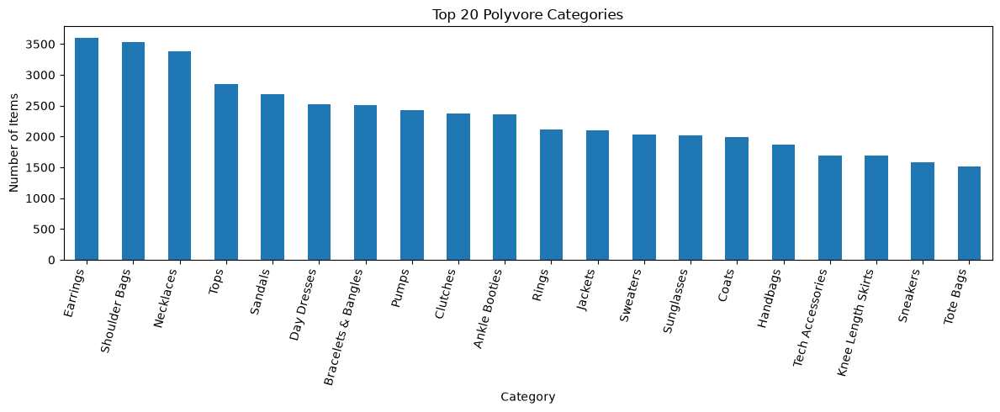

In [8]:
# Cell 8: Dataset statistics

num_items = len(items_df)
num_outfits = items_df["outfit_ID"].nunique()
num_categories = items_df["category"].nunique()

outfit_sizes = (
    items_df
    .groupby("outfit_ID")
    .size()
    .rename("outfit_size")
    .reset_index()
)

category_counts = (
    items_df["category"]
    .value_counts()
    .rename_axis("category")
    .reset_index(name="item_count")
)

print("Dataset statistics")
print("------------------")
print("Number of items:", num_items)
print("Number of outfits:", num_outfits)
print("Number of unique categories:", num_categories)
print("Average outfit size:", round(outfit_sizes["outfit_size"].mean(), 3))
print("Median outfit size:", outfit_sizes["outfit_size"].median())
print("Minimum outfit size:", outfit_sizes["outfit_size"].min())
print("Maximum outfit size:", outfit_sizes["outfit_size"].max())

print("\nOutfit size distribution:")
display(outfit_sizes["outfit_size"].describe().to_frame("outfit_size_stats"))

print("\nTop 20 categories:")
display(category_counts.head(20))

plt.figure(figsize=(10, 5))
category_counts.head(20).plot(
    x="category",
    y="item_count",
    kind="bar",
    legend=False,
    figsize=(12, 5)
)
plt.title("Top 20 Polyvore Categories")
plt.xlabel("Category")
plt.ylabel("Number of Items")
plt.xticks(rotation=75, ha="right")
plt.tight_layout()
plt.show()

Displaying sample outfit: 100002074


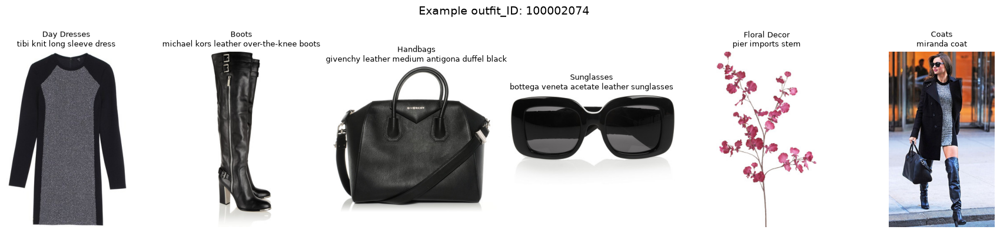

,item_ID,outfit_ID,item_position,category,text
0,100002074_1,100002074,1,Day Dresses,tibi knit long sleeve dress
1,100002074_2,100002074,2,Boots,michael kors leather over-the-knee boots
2,100002074_3,100002074,3,Handbags,givenchy leather medium antigona duffel black
3,100002074_4,100002074,4,Sunglasses,bottega veneta acetate leather sunglasses
4,100002074_5,100002074,5,Floral Decor,pier imports stem
5,100002074_7,100002074,7,Coats,miranda coat


In [9]:
# Cell 9: Display one real outfit with item images

def display_outfit(outfit_id, max_items=8):
    """
    Display all items from one outfit using the original Hugging Face dataset images.
    """
    outfit_rows = (
        items_df[items_df["outfit_ID"] == str(outfit_id)]
        .sort_values("item_position")
        .head(max_items)
    )
    
    if outfit_rows.empty:
        print(f"No outfit found for outfit_ID={outfit_id}")
        return
    
    n_items = len(outfit_rows)
    fig, axes = plt.subplots(1, n_items, figsize=(3 * n_items, 4))
    
    if n_items == 1:
        axes = [axes]
    
    for axis, (_, row) in zip(axes, outfit_rows.iterrows()):
        dataset_index = row.name
        
        # Use the original Hugging Face dataset object so image decoding stays reliable
        image = main_split[int(dataset_index)]["image"]
        
        axis.imshow(image)
        axis.axis("off")
        axis.set_title(
            f"{row['category']}\n{row['text'][:45]}",
            fontsize=9
        )
    
    plt.suptitle(f"Example outfit_ID: {outfit_id}", fontsize=14)
    plt.tight_layout()
    plt.show()
    
    display(outfit_rows[["item_ID", "outfit_ID", "item_position", "category", "text"]])


# Pick the first outfit from the dataset for a deterministic example
sample_outfit_id = items_df.loc[0, "outfit_ID"]

print("Displaying sample outfit:", sample_outfit_id)
display_outfit(sample_outfit_id)

In [10]:
# Cell 10: Inspect all fine-grained categories

all_categories = sorted(items_df["category"].dropna().unique())

print("Number of unique fine-grained categories:", len(all_categories))
print("\nAll categories:")
for index, category in enumerate(all_categories, start=1):
    print(f"{index:03d}. {category}")

category_counts_full = (
    items_df["category"]
    .value_counts()
    .rename_axis("category")
    .reset_index(name="item_count")
)

print("\nTop 50 fine-grained categories:")
display(category_counts_full.head(50))

Number of unique fine-grained categories: 377

All categories:
001. Accent Chairs
002. Accent Tables
003. Accessories
004. Activewear
005. Activewear Jackets
006. Activewear Pants
007. Activewear Shorts
008. Activewear Skirts
009. Activewear Tank Tops
010. Activewear Tops
011. Ankle Booties
012. Aprons
013. Armoires
014. Athletic Shoes
015. Baby
016. Baby Bedding
017. Backpacks
018. Bags
019. Bags & Cases
020. Bakeware
021. Bar Cabinets
022. Bar Tools
023. Barstools
024. Bath
025. Bath & Body
026. Bath Accessories
027. Bath Rugs & Mats
028. Bath Towels
029. Beach Towels
030. Beauty Accessories
031. Beauty Products
032. Bed Accessories
033. Bed Pillows
034. Bedding
035. Beds
036. Bedspreads
037. Belts
038. Benches
039. Bikini Bottoms
040. Bikini Tops
041. Bikinis
042. Blankets
043. Blazers
044. Blouses
045. Blow Dryers & Irons
046. Blush
047. Body Art
048. Body Cleansers
049. Body Moisturizers
050. Bookcases
051. Books
052. Bootcut Jeans
053. Boots
054. Bow Ties
055. Boyfriend Jeans
056

,category,item_count
0,Earrings,3606
1,Shoulder Bags,3525
2,Necklaces,3379
3,Tops,2851
4,Sandals,2689
5,Day Dresses,2525
6,Bracelets & Bangles,2505
7,Pumps,2422
8,Clutches,2377
9,Ankle Booties,2355


In [11]:
# Cell 11: Define broad category mapping rules

BROAD_CATEGORY_RULES = {
    "tops": [
        "top", "tops", "shirt", "shirts", "blouse", "blouses",
        "tee", "t-shirt", "tank", "camisole", "camisoles",
        "sweater", "sweaters", "sweatshirt", "sweatshirts",
        "cardigan", "cardigans", "hoodie", "hoodies",
        "tunic", "tunics", "polo"
    ],
    "bottoms": [
        "jean", "jeans", "trouser", "trousers", "pants",
        "leggings", "shorts", "skirt", "skirts",
        "culottes", "joggers"
    ],
    "shoes": [
        "shoe", "shoes", "boot", "boots", "sneaker", "sneakers",
        "sandal", "sandals", "pump", "pumps", "heel", "heels",
        "flat", "flats", "loafer", "loafers", "oxford", "oxfords",
        "mule", "mules", "slipper", "slippers", "espadrille", "espadrilles"
    ],
    "outerwear": [
        "coat", "coats", "jacket", "jackets", "blazer", "blazers",
        "parka", "parkas", "poncho", "ponchos", "vest", "vests",
        "cape", "capes", "trench"
    ],
    "accessories": [
        "bag", "bags", "handbag", "handbags", "clutch", "clutches",
        "tote", "totes", "backpack", "backpacks", "satchel", "satchels",
        "earring", "earrings", "necklace", "necklaces",
        "bracelet", "bracelets", "bangle", "bangles",
        "ring", "rings", "watch", "watches",
        "sunglasses", "eyewear", "glasses",
        "belt", "belts", "scarf", "scarves",
        "hat", "hats", "beanie", "beanies",
        "wallet", "wallets"
    ],
}


def map_to_broad_category(category):
    """
    Map a fine-grained Polyvore category to one broad thesis category.
    Returns 'other' when the category does not match the target groups.
    """
    category_lower = str(category).lower()
    
    for broad_category, keywords in BROAD_CATEGORY_RULES.items():
        for keyword in keywords:
            if keyword in category_lower:
                return broad_category
    
    return "other"


# Preview mapping on all unique categories
category_mapping_preview = pd.DataFrame({
    "category": all_categories
})

category_mapping_preview["broad_category"] = category_mapping_preview["category"].apply(map_to_broad_category)

print("Broad category mapping preview:")
display(category_mapping_preview)

print("\nNumber of fine categories mapped to each broad category:")
display(
    category_mapping_preview["broad_category"]
    .value_counts()
    .rename_axis("broad_category")
    .reset_index(name="num_fine_categories")
)

Broad category mapping preview:


,category,broad_category
0,Accent Chairs,other
1,Accent Tables,other
2,Accessories,other
3,Activewear,other
4,Activewear Jackets,outerwear
...,...,...
372,Watches,accessories
373,Wedding Dresses,other
374,Wide Leg Jeans,bottoms
375,Window Blinds,other



Number of fine categories mapped to each broad category:


,broad_category,num_fine_categories
0,other,255
1,accessories,39
2,bottoms,25
3,shoes,25
4,tops,23
5,outerwear,10


In [12]:
# Cell 12: Apply broad category mapping and create target item table

items_df["broad_category"] = items_df["category"].apply(map_to_broad_category)

broad_category_counts = (
    items_df["broad_category"]
    .value_counts()
    .rename_axis("broad_category")
    .reset_index(name="item_count")
)

print("Item distribution after broad category mapping:")
display(broad_category_counts)

target_broad_categories = [
    "tops",
    "bottoms",
    "shoes",
    "outerwear",
    "accessories",
]

target_items_df = (
    items_df[items_df["broad_category"].isin(target_broad_categories)]
    .copy()
    .reset_index(drop=False)
    .rename(columns={"index": "original_dataset_index"})
)

print("Original item count:", len(items_df))
print("Target item count:", len(target_items_df))
print("Removed/other item count:", len(items_df) - len(target_items_df))
print("Target item percentage:", round(len(target_items_df) / len(items_df) * 100, 2), "%")

print("\nTarget broad category distribution:")
target_broad_counts = (
    target_items_df["broad_category"]
    .value_counts()
    .rename_axis("broad_category")
    .reset_index(name="item_count")
)

display(target_broad_counts)

print("\nExamples from each broad category:")
for broad_category in target_broad_categories:
    print(f"\n--- {broad_category.upper()} ---")
    display(
        target_items_df[target_items_df["broad_category"] == broad_category]
        [["item_ID", "outfit_ID", "category", "broad_category", "text"]]
        .head(5)
    )

Item distribution after broad category mapping:


,broad_category,item_count
0,accessories,29566
1,other,26572
2,shoes,12635
3,tops,10915
4,bottoms,9247
5,outerwear,5161


Original item count: 94096
Target item count: 67524
Removed/other item count: 26572
Target item percentage: 71.76 %

Target broad category distribution:


,broad_category,item_count
0,accessories,29566
1,shoes,12635
2,tops,10915
3,bottoms,9247
4,outerwear,5161



Examples from each broad category:

--- TOPS ---


,item_ID,outfit_ID,category,broad_category,text
8,100010727_8,100010727,Men's Shirts,tops,contrast trimmed cotton shirt
18,100077218_1,100077218,Sweatshirts,tops,billabong love sweatshirt
19,100077218_2,100077218,Blouses,tops,first petal top
20,100077218_3,100077218,Tops,tops,little top
21,100077218_4,100077218,Tops,tops,daily top



--- BOTTOMS ---


,item_ID,outfit_ID,category,broad_category,text
5,100010727_2,100010727,Skinny Jeans,bottoms,givenchy skinny jean
23,100077218_7,100077218,Boyfriend Jeans,bottoms,rag destroyed boyfriend
24,100077218_8,100077218,Boyfriend Jeans,bottoms,topshop moto vintage boyfriend jeans
29,100095342_3,100095342,Boyfriend Jeans,bottoms,rag bone moss mid-rise boyfriend jeans
37,100099673_5,100099673,Skinny Jeans,bottoms,h&m skinny low jeans



--- SHOES ---


,item_ID,outfit_ID,category,broad_category,text
0,100002074_2,100002074,Boots,shoes,michael kors leather over-the-knee boots
11,100050716_2,100050716,Sandals,shoes,beige crystal sandals
13,100060207_2,100060207,Pumps,shoes,givenchy striped print pumps yellow grey black
25,100089693_2,100089693,Pumps,shoes,peep-toe black platform high heels
30,100095342_4,100095342,Ankle Booties,shoes,acne short fur lined leather boots



--- OUTERWEAR ---


,item_ID,outfit_ID,category,broad_category,text
3,100002074_7,100002074,Coats,outerwear,miranda coat
4,100010727_1,100010727,Blazers,outerwear,three pocket blazer
28,100095342_2,100095342,Vests,outerwear,fake fur waistcoat
39,100111991_2,100111991,Coats,outerwear,paul joe long fit peacoat
61,100173896_2,100173896,Coats,outerwear,fashion heather coat



--- ACCESSORIES ---


,item_ID,outfit_ID,category,broad_category,text
1,100002074_3,100002074,Handbags,accessories,givenchy leather medium antigona duffel black
2,100002074_4,100002074,Sunglasses,accessories,bottega veneta acetate leather sunglasses
6,100010727_4,100010727,Watches,accessories,guess black silver-tone chronograph watch
7,100010727_5,100010727,Sunglasses,accessories,ray-ban original wayfarer sunglasses
9,100029003_2,100029003,Handbags,accessories,phillip lim red leather satchel


In [13]:
# Cell 13: Add query-only dress category

def map_to_query_category(category):
    """
    Map fine-grained categories for query items.
    This includes the five recommendation groups plus 'dresses' as a valid input/query category.
    """
    category_lower = str(category).lower()
    
    dress_keywords = [
        "dress", "dresses", "gown", "gowns"
    ]
    
    for keyword in dress_keywords:
        if keyword in category_lower:
            return "dresses"
    
    return map_to_broad_category(category)


items_df["query_category"] = items_df["category"].apply(map_to_query_category)

query_category_counts = (
    items_df["query_category"]
    .value_counts()
    .rename_axis("query_category")
    .reset_index(name="item_count")
)

print("Query category distribution:")
display(query_category_counts)

query_allowed_categories = [
    "tops",
    "bottoms",
    "shoes",
    "outerwear",
    "accessories",
    "dresses",
]

query_items_df = (
    items_df[items_df["query_category"].isin(query_allowed_categories)]
    .copy()
    .reset_index(drop=False)
    .rename(columns={"index": "original_dataset_index"})
)

print("Original item count:", len(items_df))
print("Valid query item count:", len(query_items_df))
print("Valid query item percentage:", round(len(query_items_df) / len(items_df) * 100, 2), "%")

print("\nDress examples now available as query items:")
display(
    query_items_df[query_items_df["query_category"] == "dresses"]
    [["item_ID", "outfit_ID", "category", "query_category", "text"]]
    .head(10)
)

Query category distribution:


,query_category,item_count
0,accessories,29566
1,other,22276
2,shoes,12601
3,tops,10871
4,bottoms,9217
5,outerwear,5161
6,dresses,4404


Original item count: 94096
Valid query item count: 71820
Valid query item percentage: 76.33 %

Dress examples now available as query items:


,item_ID,outfit_ID,category,query_category,text
0,100002074_1,100002074,Day Dresses,dresses,tibi knit long sleeve dress
10,100029003_1,100029003,Day Dresses,dresses,rochas dress
15,100060207_1,100060207,Day Dresses,dresses,atelier pleat shift tunic
28,100079699_1,100079699,Day Dresses,dresses,topshop strap back slip dress
29,100089693_1,100089693,Day Dresses,dresses,stripe skinny bodycon mini dress
44,100111991_1,100111991,Day Dresses,dresses,phase eight coral cable swing dress
107,100285829_2,100285829,Dressers,dresses,chest please us
131,100443358_1,100443358,Day Dresses,dresses,marni short boxy fur dress
163,100631293_1,100631293,Cocktail Dresses,dresses,topshop wrap mesh skater dress
168,100658683_1,100658683,Cocktail Dresses,dresses,club l cut mesh peplum dress


In [14]:
# Cell 14: Save processed metadata tables

processed_items_path = PROCESSED_DATA_DIR / "items_clean.parquet"
target_items_path = PROCESSED_DATA_DIR / "target_items.parquet"
query_items_path = PROCESSED_DATA_DIR / "query_items.parquet"
category_mapping_path = PROCESSED_DATA_DIR / "category_mapping_preview.csv"

# Do not save the image column into parquet metadata tables.
# Images remain accessible through the Hugging Face dataset using original_dataset_index.
items_metadata_to_save = items_df.drop(columns=["image"], errors="ignore")
target_metadata_to_save = target_items_df.drop(columns=["image"], errors="ignore")
query_metadata_to_save = query_items_df.drop(columns=["image"], errors="ignore")

items_metadata_to_save.to_parquet(processed_items_path, index=False)
target_metadata_to_save.to_parquet(target_items_path, index=False)
query_metadata_to_save.to_parquet(query_items_path, index=False)
category_mapping_preview.to_csv(category_mapping_path, index=False)

print("Saved processed files:")
print("-", processed_items_path.relative_to(PROJECT_ROOT))
print("-", target_items_path.relative_to(PROJECT_ROOT))
print("-", query_items_path.relative_to(PROJECT_ROOT))
print("-", category_mapping_path.relative_to(PROJECT_ROOT))

print("\nSaved table shapes:")
print("items_clean:", items_metadata_to_save.shape)
print("target_items:", target_metadata_to_save.shape)
print("query_items:", query_metadata_to_save.shape)
print("category_mapping_preview:", category_mapping_preview.shape)

Saved processed files:
- data\processed\items_clean.parquet
- data\processed\target_items.parquet
- data\processed\query_items.parquet
- data\processed\category_mapping_preview.csv

Saved table shapes:
items_clean: (94096, 8)
target_items: (67524, 8)
query_items: (71820, 9)
category_mapping_preview: (377, 2)


In [15]:
# Cell 15: Check outfit coverage after category filtering

target_outfit_counts = (
    target_items_df
    .groupby("outfit_ID")
    .size()
    .rename("num_target_items")
    .reset_index()
)

query_outfit_counts = (
    query_items_df
    .groupby("outfit_ID")
    .size()
    .rename("num_query_items")
    .reset_index()
)

outfit_coverage_df = (
    outfit_sizes
    .merge(target_outfit_counts, on="outfit_ID", how="left")
    .merge(query_outfit_counts, on="outfit_ID", how="left")
)

outfit_coverage_df["num_target_items"] = outfit_coverage_df["num_target_items"].fillna(0).astype(int)
outfit_coverage_df["num_query_items"] = outfit_coverage_df["num_query_items"].fillna(0).astype(int)

usable_outfits_df = outfit_coverage_df[
    (outfit_coverage_df["num_query_items"] >= 1)
    & (outfit_coverage_df["num_target_items"] >= 2)
].copy()

print("Total outfits:", len(outfit_coverage_df))
print("Outfits with at least 1 valid query item and at least 2 target recommendation items:", len(usable_outfits_df))
print("Usable outfit percentage:", round(len(usable_outfits_df) / len(outfit_coverage_df) * 100, 2), "%")

print("\nCoverage statistics:")
display(
    outfit_coverage_df[
        ["outfit_size", "num_query_items", "num_target_items"]
    ].describe()
)

print("\nExample usable outfits:")
display(usable_outfits_df.head(10))

Total outfits: 21587
Outfits with at least 1 valid query item and at least 2 target recommendation items: 17660
Usable outfit percentage: 81.81 %

Coverage statistics:


,outfit_size,num_query_items,num_target_items
count,21587.000000,21587.000000,21587.000000
mean,4.358920,3.327002,3.127994
std,1.739006,1.723292,1.737597
min,1.000000,0.000000,0.000000
25%,3.000000,2.000000,2.000000
50%,4.000000,3.000000,3.000000
75%,6.000000,4.000000,4.000000
max,8.000000,8.000000,8.000000



Example usable outfits:


,outfit_ID,outfit_size,num_target_items,num_query_items
0,100002074,6,4,5
1,100010727,7,5,5
2,100029003,3,2,3
3,100050716,4,2,2
5,100060207,6,5,6
6,100077218,7,7,7
8,100089693,3,2,3
9,100095342,6,6,6
10,100099673,8,6,6
11,100111991,8,6,7


In [16]:
# Cell 16: Analyze broad category composition inside outfits
# RUN AFTER CELLS 1-15 / RERUN ONLY IF CATEGORY MAPPING CHANGES

outfit_broad_composition = (
    target_items_df
    .groupby("outfit_ID")["broad_category"]
    .agg(
        num_target_items="count",
        num_unique_broad_categories="nunique",
        broad_categories=lambda values: sorted(values.unique())
    )
    .reset_index()
)

print("Outfit broad-category composition shape:", outfit_broad_composition.shape)

print("\nBroad-category diversity per outfit:")
display(
    outfit_broad_composition["num_unique_broad_categories"]
    .describe()
    .to_frame("num_unique_broad_categories")
)

print("\nDistribution of number of broad categories per outfit:")
broad_diversity_counts = (
    outfit_broad_composition["num_unique_broad_categories"]
    .value_counts()
    .sort_index()
    .rename_axis("num_unique_broad_categories")
    .reset_index(name="num_outfits")
)
display(broad_diversity_counts)

print("\nExample outfits with many broad categories:")
display(
    outfit_broad_composition
    .sort_values(["num_unique_broad_categories", "num_target_items"], ascending=False)
    .head(10)
)

Outfit broad-category composition shape: (20148, 4)

Broad-category diversity per outfit:


,num_unique_broad_categories
count,20148.000000
mean,2.617977
std,1.129536
min,1.000000
25%,2.000000
50%,3.000000
75%,3.000000
max,5.000000



Distribution of number of broad categories per outfit:


,num_unique_broad_categories,num_outfits
0,1,3658
1,2,6195
2,3,5483
3,4,3810
4,5,1002



Example outfits with many broad categories:


,outfit_ID,num_target_items,num_unique_broad_categories,broad_categories
32,100445477,8,5,"[accessories, bottoms, outerwear, shoes, tops]"
161,102665177,8,5,"[accessories, bottoms, outerwear, shoes, tops]"
218,103867145,8,5,"[accessories, bottoms, outerwear, shoes, tops]"
298,105081429,8,5,"[accessories, bottoms, outerwear, shoes, tops]"
338,105881838,8,5,"[accessories, bottoms, outerwear, shoes, tops]"
365,106100743,8,5,"[accessories, bottoms, outerwear, shoes, tops]"
391,106345656,8,5,"[accessories, bottoms, outerwear, shoes, tops]"
429,106813596,8,5,"[accessories, bottoms, outerwear, shoes, tops]"
777,111059798,8,5,"[accessories, bottoms, outerwear, shoes, tops]"
832,111632032,8,5,"[accessories, bottoms, outerwear, shoes, tops]"


Broad category co-occurrence matrix:


,tops,bottoms,shoes,outerwear,accessories
tops,10101,6172,6354,2561,7888
bottoms,6172,9040,5716,2445,7044
shoes,6354,5716,12346,3316,9993
outerwear,2561,2445,3316,5066,4035
accessories,7888,7044,9993,4035,16194


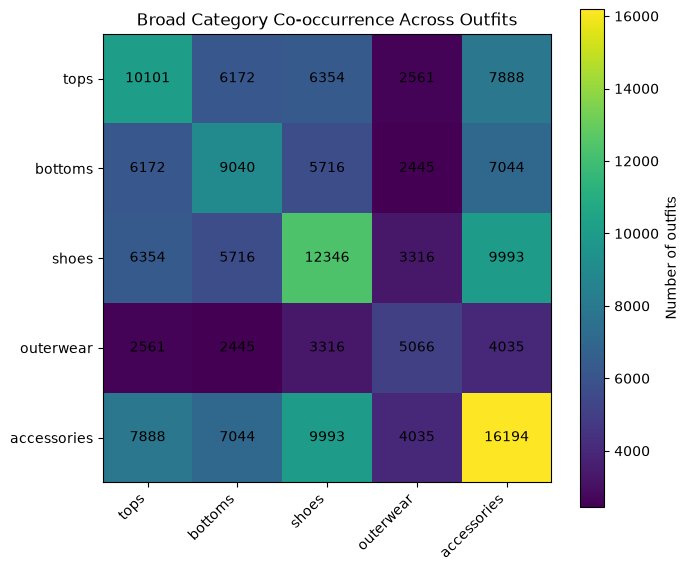

In [17]:
# Cell 17: Category co-occurrence matrix
# RUN AFTER CELLS 1-16 / RERUN ONLY IF CATEGORY MAPPING CHANGES

broad_categories_order = [
    "tops",
    "bottoms",
    "shoes",
    "outerwear",
    "accessories",
]

cooccurrence_matrix = pd.DataFrame(
    0,
    index=broad_categories_order,
    columns=broad_categories_order,
    dtype=int
)

for _, row in outfit_broad_composition.iterrows():
    categories_in_outfit = set(row["broad_categories"])
    
    for category_a in broad_categories_order:
        for category_b in broad_categories_order:
            if category_a in categories_in_outfit and category_b in categories_in_outfit:
                cooccurrence_matrix.loc[category_a, category_b] += 1

print("Broad category co-occurrence matrix:")
display(cooccurrence_matrix)

plt.figure(figsize=(7, 6))
plt.imshow(cooccurrence_matrix.values)
plt.xticks(range(len(broad_categories_order)), broad_categories_order, rotation=45, ha="right")
plt.yticks(range(len(broad_categories_order)), broad_categories_order)
plt.title("Broad Category Co-occurrence Across Outfits")
plt.colorbar(label="Number of outfits")

for row_index in range(len(broad_categories_order)):
    for col_index in range(len(broad_categories_order)):
        plt.text(
            col_index,
            row_index,
            cooccurrence_matrix.values[row_index, col_index],
            ha="center",
            va="center"
        )

plt.tight_layout()
plt.show()

Testing display helper with outfit_ID: 100002074


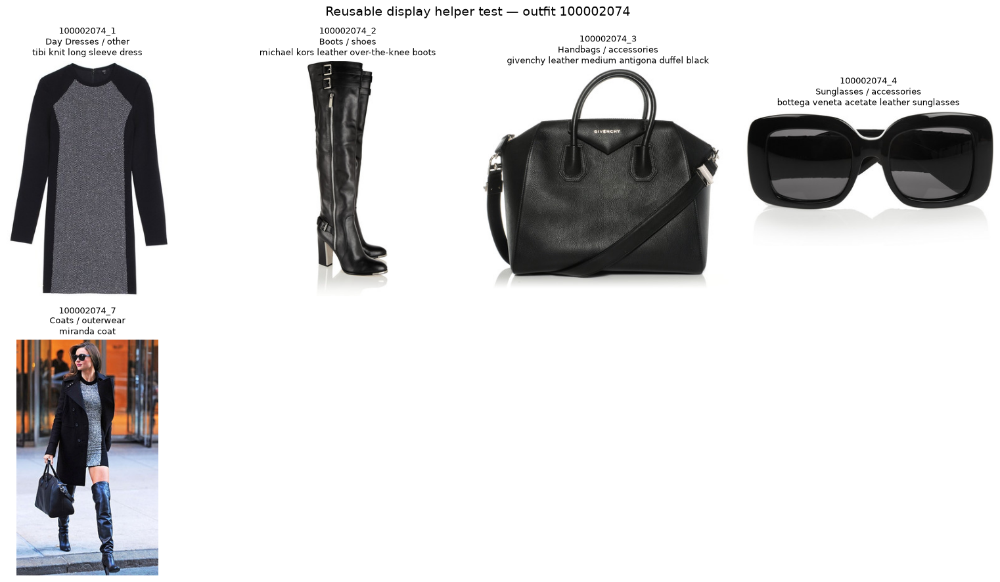

,item_ID,outfit_ID,item_position,category,broad_category,query_category,text
0,100002074_1,100002074,1,Day Dresses,other,dresses,tibi knit long sleeve dress
1,100002074_2,100002074,2,Boots,shoes,shoes,michael kors leather over-the-knee boots
2,100002074_3,100002074,3,Handbags,accessories,accessories,givenchy leather medium antigona duffel black
3,100002074_4,100002074,4,Sunglasses,accessories,accessories,bottega veneta acetate leather sunglasses
4,100002074_7,100002074,7,Coats,outerwear,outerwear,miranda coat


In [18]:
# Cell 18: Reusable visual display helper for items
# RUN EVERY SESSION AFTER DATASET AND METADATA ARE LOADED

def display_items_grid(items_table, title="Items", max_items=8, image_index_column="original_dataset_index"):
    """
    Display a grid of item images using original Hugging Face dataset indexes.
    Expected columns include item_ID, category, text, and original_dataset_index.
    """
    if items_table.empty:
        print("No items to display.")
        return
    
    display_table = items_table.head(max_items).copy()
    n_items = len(display_table)
    
    cols = min(n_items, 4)
    rows = math.ceil(n_items / cols)
    
    fig, axes = plt.subplots(rows, cols, figsize=(4 * cols, 4.5 * rows))
    
    if rows == 1 and cols == 1:
        axes = np.array([[axes]])
    elif rows == 1:
        axes = np.array([axes])
    elif cols == 1:
        axes = np.array([[axis] for axis in axes])
    
    axes_flat = axes.flatten()
    
    for axis in axes_flat:
        axis.axis("off")
    
    for axis, (_, row) in zip(axes_flat, display_table.iterrows()):
        dataset_index = int(row[image_index_column])
        image = main_split[dataset_index]["image"]
        
        axis.imshow(image)
        axis.axis("off")
        
        label = (
            f"{row['item_ID']}\n"
            f"{row['category']}"
        )
        
        if "broad_category" in row:
            label += f" / {row['broad_category']}"
        elif "query_category" in row:
            label += f" / {row['query_category']}"
        
        label += f"\n{str(row['text'])[:45]}"
        
        axis.set_title(label, fontsize=9)
    
    plt.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()
    
    table_columns = [
        column for column in [
            "item_ID",
            "outfit_ID",
            "item_position",
            "category",
            "broad_category",
            "query_category",
            "text",
        ]
        if column in display_table.columns
    ]
    
    display(display_table[table_columns])


# Test the helper on one usable outfit
example_usable_outfit_id = usable_outfits_df.iloc[0]["outfit_ID"]

example_items = (
    query_items_df[query_items_df["outfit_ID"] == example_usable_outfit_id]
    .sort_values("item_position")
)

print("Testing display helper with outfit_ID:", example_usable_outfit_id)
display_items_grid(
    example_items,
    title=f"Reusable display helper test — outfit {example_usable_outfit_id}",
    max_items=8
)

In [19]:
# Cell 19: Load text embedding model
# RUN EVERY SESSION BEFORE EMBEDDING OR RETRIEVAL CELLS

from sentence_transformers import SentenceTransformer

TEXT_EMBEDDING_MODEL_NAME = "sentence-transformers/all-MiniLM-L6-v2"

device = "cuda" if torch.cuda.is_available() else "cpu"

print("Loading text embedding model:", TEXT_EMBEDDING_MODEL_NAME)
print("Device:", device)

text_embedding_model = SentenceTransformer(
    TEXT_EMBEDDING_MODEL_NAME,
    device=device
)

sample_texts = target_items_df["item_text"].head(5).tolist()

sample_embeddings = text_embedding_model.encode(
    sample_texts,
    normalize_embeddings=True,
    convert_to_numpy=True,
    show_progress_bar=False
)

print("Model loaded successfully.")
print("Sample texts:", sample_texts)
print("Sample embedding shape:", sample_embeddings.shape)
print("Embedding dtype:", sample_embeddings.dtype)

Loading text embedding model: sentence-transformers/all-MiniLM-L6-v2
Device: cuda
Model loaded successfully.
Sample texts: ['Boots | michael kors leather over-the-knee boots', 'Handbags | givenchy leather medium antigona duffel black', 'Sunglasses | bottega veneta acetate leather sunglasses', 'Coats | miranda coat', 'Blazers | three pocket blazer']
Sample embedding shape: (5, 384)
Embedding dtype: float32


In [20]:
# Cell 20: Compute or load target item text embeddings
# RUN EVERY SESSION; FIRST RUN COMPUTES, LATER RUNS LOAD CACHE

target_embeddings_path = EMBEDDINGS_DIR / "target_text_embeddings_all_minilm_l6_v2.npy"
target_metadata_path = PROCESSED_DATA_DIR / "target_items_for_embeddings.parquet"

# Save matching metadata so embedding row order is always reproducible.
target_items_for_embeddings = target_items_df.reset_index(drop=True).copy()
target_items_for_embeddings.to_parquet(target_metadata_path, index=False)

if target_embeddings_path.exists():
    print("Loading cached target embeddings from:")
    print(target_embeddings_path.relative_to(PROJECT_ROOT))
    
    target_text_embeddings = np.load(target_embeddings_path)
    
else:
    print("Computing target item text embeddings.")
    print("Number of target items:", len(target_items_for_embeddings))
    
    target_texts = target_items_for_embeddings["item_text"].fillna("").tolist()
    
    target_text_embeddings = text_embedding_model.encode(
        target_texts,
        batch_size=256,
        normalize_embeddings=True,
        convert_to_numpy=True,
        show_progress_bar=True
    )
    
    np.save(target_embeddings_path, target_text_embeddings)
    
    print("Saved target embeddings to:")
    print(target_embeddings_path.relative_to(PROJECT_ROOT))

print("Target embedding matrix shape:", target_text_embeddings.shape)
print("Target metadata shape:", target_items_for_embeddings.shape)

assert len(target_items_for_embeddings) == target_text_embeddings.shape[0], (
    "Metadata rows and embedding rows do not match."
)

print("Target embeddings are ready.")

Loading cached target embeddings from:
outputs\embeddings\target_text_embeddings_all_minilm_l6_v2.npy
Target embedding matrix shape: (67524, 384)
Target metadata shape: (67524, 9)
Target embeddings are ready.


In [21]:
# Cell 21: Build category-aware FAISS indexes
# RUN EVERY SESSION AFTER TARGET EMBEDDINGS ARE AVAILABLE

import faiss

embedding_dim = target_text_embeddings.shape[1]

category_indexes = {}
category_row_lookup = {}

for broad_category in target_broad_categories:
    category_rows = target_items_for_embeddings.index[
        target_items_for_embeddings["broad_category"] == broad_category
    ].to_numpy()
    
    category_embeddings = target_text_embeddings[category_rows].astype("float32")
    
    # Embeddings are already normalized, so inner product = cosine similarity.
    index = faiss.IndexFlatIP(embedding_dim)
    index.add(category_embeddings)
    
    category_indexes[broad_category] = index
    category_row_lookup[broad_category] = category_rows
    
    print(
        f"{broad_category:12s} | "
        f"items: {len(category_rows):6d} | "
        f"index vectors: {index.ntotal:6d}"
    )

print("\nBuilt category-aware FAISS indexes.")
print("Available target categories:", list(category_indexes.keys()))

tops         | items:  10915 | index vectors:  10915
bottoms      | items:   9247 | index vectors:   9247
shoes        | items:  12635 | index vectors:  12635
outerwear    | items:   5161 | index vectors:   5161
accessories  | items:  29566 | index vectors:  29566

Built category-aware FAISS indexes.
Available target categories: ['tops', 'bottoms', 'shoes', 'outerwear', 'accessories']


In [22]:
# Cell 22: Build query text representation
# RUN EVERY SESSION AFTER TEXT EMBEDDING MODEL IS LOADED

def get_query_item_by_id(query_item_id):
    """
    Get one query item from query_items_df by item_ID.
    """
    matches = query_items_df[query_items_df["item_ID"] == str(query_item_id)]
    
    if matches.empty:
        raise ValueError(f"query_item_id not found in query_items_df: {query_item_id}")
    
    return matches.iloc[0].copy()


def build_query_text(query_item_row=None, user_text="", target_category=None):
    """
    Build the baseline text query used for embedding retrieval.
    """
    query_parts = []
    
    if query_item_row is not None:
        query_parts.extend([
            f"Query item category: {query_item_row.get('category', '')}",
            f"Query item type: {query_item_row.get('query_category', '')}",
            f"Query item description: {query_item_row.get('text', '')}",
        ])
    
    if user_text:
        query_parts.append(f"User request: {user_text}")
    
    if target_category:
        query_parts.append(f"Recommended category: {target_category}")
    
    return " | ".join(query_parts)


# Test with a real query item from the first usable outfit
test_query_item_id = "100002074_1"
test_user_text = "recommend smart casual shoes"
test_target_category = "shoes"

test_query_item = get_query_item_by_id(test_query_item_id)

test_query_text = build_query_text(
    query_item_row=test_query_item,
    user_text=test_user_text,
    target_category=test_target_category
)

print("Test query item:")
display(test_query_item.to_frame("value"))

print("\nConstructed query text:")
print(test_query_text)

Test query item:


,value
original_dataset_index,0
item_ID,100002074_1
outfit_ID,100002074
item_position,1
category,Day Dresses
text,tibi knit long sleeve dress
item_text,Day Dresses | tibi knit long sleeve dress
image,{'bytes': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01\x00H\x00H\x00\x00\xff\xdb\x00C\x00\x03\x02\x02\x03\x02\x02\...
broad_category,other
query_category,dresses



Constructed query text:
Query item category: Day Dresses | Query item type: dresses | Query item description: tibi knit long sleeve dress | User request: recommend smart casual shoes | Recommended category: shoes


In [23]:
# Cell 23: Category-aware baseline retrieval function
# RUN EVERY SESSION AFTER FAISS INDEXES ARE BUILT

def retrieve_baseline_recommendations(
    query_item_id=None,
    user_text="",
    target_category="shoes",
    top_k=5,
    exclude_same_outfit=True,
):
    """
    Retrieve top-K recommendations from the requested broad category
    using text embedding cosine similarity.
    """
    if target_category not in category_indexes:
        raise ValueError(
            f"Unknown target_category={target_category}. "
            f"Available categories: {list(category_indexes.keys())}"
        )
    
    query_item_row = None
    
    if query_item_id is not None:
        query_item_row = get_query_item_by_id(query_item_id)
    
    query_text = build_query_text(
        query_item_row=query_item_row,
        user_text=user_text,
        target_category=target_category
    )
    
    query_embedding = text_embedding_model.encode(
        [query_text],
        normalize_embeddings=True,
        convert_to_numpy=True,
        show_progress_bar=False
    ).astype("float32")
    
    # Retrieve more than top_k first so we can remove the query item/outfit if needed.
    search_k = min(top_k * 20, category_indexes[target_category].ntotal)
    
    scores, local_indices = category_indexes[target_category].search(
        query_embedding,
        search_k
    )
    
    global_rows = category_row_lookup[target_category][local_indices[0]]
    
    results = target_items_for_embeddings.iloc[global_rows].copy()
    results["embedding_score"] = scores[0]
    
    if query_item_row is not None:
        results = results[results["item_ID"] != query_item_row["item_ID"]]
        
        if exclude_same_outfit:
            results = results[results["outfit_ID"] != query_item_row["outfit_ID"]]
    
    results = results.head(top_k).reset_index(drop=True)
    
    return {
        "query_text": query_text,
        "query_item": query_item_row,
        "target_category": target_category,
        "results": results,
    }


baseline_test = retrieve_baseline_recommendations(
    query_item_id="100002074_1",
    user_text="recommend smart casual shoes",
    target_category="shoes",
    top_k=5,
)

print("Query text used for retrieval:")
print(baseline_test["query_text"])

print("\nBaseline recommendations:")
display(
    baseline_test["results"][
        ["item_ID", "outfit_ID", "category", "broad_category", "text", "embedding_score"]
    ]
)

Query text used for retrieval:
Query item category: Day Dresses | Query item type: dresses | Query item description: tibi knit long sleeve dress | User request: recommend smart casual shoes | Recommended category: shoes

Baseline recommendations:


,item_ID,outfit_ID,category,broad_category,text,embedding_score
0,208659502_2,208659502,Sandals,shoes,satin toe bow sandals rhinestone platform white wedding evening shoes high heel wedding evening evening shoes high h...,0.490115
1,213208045_3,213208045,Shoes,shoes,burberry shoes accessories metallic giant check cashmere scarf,0.486860
2,190117110_8,190117110,Shoes,shoes,fashion shoes,0.461421
3,201283503_2,201283503,Flats,shoes,elegant bow zipper design flat shoes women,0.460544
4,104608755_4,104608755,Shoes,shoes,fashion lace,0.459101


Query text:
Query item category: Day Dresses | Query item type: dresses | Query item description: tibi knit long sleeve dress | User request: recommend smart casual shoes | Recommended category: shoes

Query item:


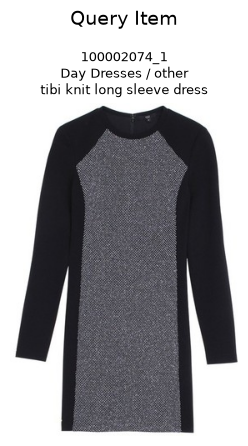

,item_ID,outfit_ID,item_position,category,broad_category,query_category,text
0,100002074_1,100002074,1,Day Dresses,other,dresses,tibi knit long sleeve dress



Baseline recommendations:


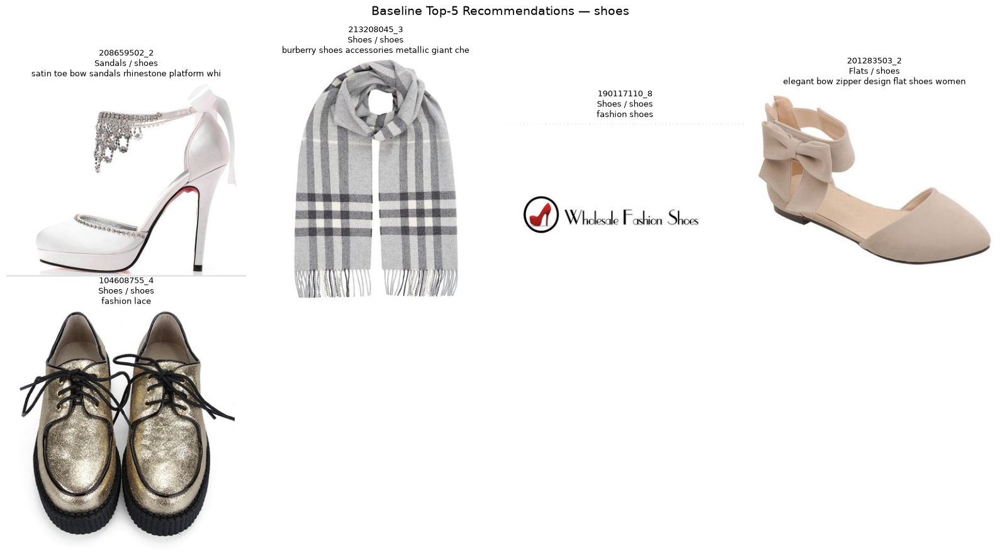

,item_ID,outfit_ID,item_position,category,broad_category,text
0,208659502_2,208659502,2,Sandals,shoes,satin toe bow sandals rhinestone platform white wedding evening shoes high heel wedding evening evening shoes high h...
1,213208045_3,213208045,3,Shoes,shoes,burberry shoes accessories metallic giant check cashmere scarf
2,190117110_8,190117110,8,Shoes,shoes,fashion shoes
3,201283503_2,201283503,2,Flats,shoes,elegant bow zipper design flat shoes women
4,104608755_4,104608755,4,Shoes,shoes,fashion lace


,item_ID,outfit_ID,category,broad_category,text,embedding_score
0,208659502_2,208659502,Sandals,shoes,satin toe bow sandals rhinestone platform white wedding evening shoes high heel wedding evening evening shoes high h...,0.490115
1,213208045_3,213208045,Shoes,shoes,burberry shoes accessories metallic giant check cashmere scarf,0.486860
2,190117110_8,190117110,Shoes,shoes,fashion shoes,0.461421
3,201283503_2,201283503,Flats,shoes,elegant bow zipper design flat shoes women,0.460544
4,104608755_4,104608755,Shoes,shoes,fashion lace,0.459101


In [24]:
# Cell 24: Visualize baseline recommendations
# RUN EVERY SESSION WHEN TESTING RECOMMENDATION OUTPUTS

def display_baseline_recommendation_result(retrieval_result, max_items=5):
    """
    Display query item and baseline recommendations.
    """
    query_item = retrieval_result["query_item"]
    recommendations = retrieval_result["results"]
    
    print("Query text:")
    print(retrieval_result["query_text"])
    
    if query_item is not None:
        query_item_table = pd.DataFrame([query_item])
        
        print("\nQuery item:")
        display_items_grid(
            query_item_table,
            title="Query Item",
            max_items=1,
            image_index_column="original_dataset_index"
        )
    
    print("\nBaseline recommendations:")
    display_items_grid(
        recommendations,
        title=f"Baseline Top-{len(recommendations)} Recommendations — {retrieval_result['target_category']}",
        max_items=max_items,
        image_index_column="original_dataset_index"
    )
    
    display(
        recommendations[
            ["item_ID", "outfit_ID", "category", "broad_category", "text", "embedding_score"]
        ]
    )


display_baseline_recommendation_result(
    baseline_test,
    max_items=5
)

In [25]:
# # Cell 25: Inspect suspicious category/text mismatches
# # RUN AFTER CELLS 1-24 / RERUN IF CATEGORY MAPPING OR CLEANING RULES CHANGE

# SUSPICIOUS_TERMS_BY_CATEGORY = {
#     "shoes": [
#         "scarf", "scarves", "bag", "handbag", "clutch", "tote", "wallet",
#         "necklace", "earrings", "bracelet", "ring", "watch", "sunglasses",
#         "case", "decor", "bedding", "chair", "table"
#     ],
#     "tops": [
#         "shoe", "shoes", "boot", "boots", "sandal", "sandals", "pump", "pumps",
#         "bag", "handbag", "necklace", "earrings", "bracelet", "ring",
#         "decor", "bedding", "chair", "table"
#     ],
#     "bottoms": [
#         "shoe", "shoes", "boot", "boots", "sandal", "sandals",
#         "bag", "handbag", "necklace", "earrings", "bracelet", "ring",
#         "decor", "bedding", "chair", "table"
#     ],
#     "outerwear": [
#         "shoe", "shoes", "boot", "boots", "sandal", "sandals",
#         "bag", "handbag", "necklace", "earrings", "bracelet", "ring",
#         "decor", "bedding", "chair", "table"
#     ],
#     "accessories": [
#         "dress", "dresses", "jeans", "pants", "trousers", "skirt", "shorts",
#         "coat", "jacket", "blazer", "shirt", "sweater"
#     ],
# }


# def contains_any_term(text, terms):
#     """
#     Return True if any suspicious term appears in the text.
#     Uses simple substring matching for transparent dataset auditing.
#     """
#     text_lower = str(text).lower()
#     return any(term in text_lower for term in terms)


# suspicious_rows = []

# for broad_category, suspicious_terms in SUSPICIOUS_TERMS_BY_CATEGORY.items():
#     category_subset = target_items_for_embeddings[
#         target_items_for_embeddings["broad_category"] == broad_category
#     ].copy()
    
#     category_subset["suspicious_reason"] = category_subset["text"].apply(
#         lambda value: ", ".join(
#             [term for term in suspicious_terms if term in str(value).lower()]
#         )
#     )
    
#     category_subset = category_subset[category_subset["suspicious_reason"] != ""]
#     suspicious_rows.append(category_subset)

# suspicious_items_df = pd.concat(suspicious_rows, ignore_index=True)

# print("Total target candidate items:", len(target_items_for_embeddings))
# print("Suspicious category/text mismatch items:", len(suspicious_items_df))
# print("Suspicious percentage:", round(len(suspicious_items_df) / len(target_items_for_embeddings) * 100, 2), "%")

# print("\nSuspicious count by broad category:")
# display(
#     suspicious_items_df["broad_category"]
#     .value_counts()
#     .rename_axis("broad_category")
#     .reset_index(name="suspicious_count")
# )

# print("\nSuspicious examples:")
# display(
#     suspicious_items_df[
#         ["item_ID", "outfit_ID", "category", "broad_category", "text", "suspicious_reason"]
#     ].head(50)
# )

In [26]:
# # Cell 26: Create cleaned candidate pool
# # RUN AFTER CELL 25 / RERUN IF CLEANING RULES CHANGE

# target_items_clean_df = target_items_for_embeddings.copy()

# target_items_clean_df["is_suspicious_category_text_mismatch"] = False
# target_items_clean_df["cleaning_reason"] = ""

# for broad_category, suspicious_terms in SUSPICIOUS_TERMS_BY_CATEGORY.items():
#     category_mask = target_items_clean_df["broad_category"] == broad_category
    
#     suspicious_mask = target_items_clean_df.loc[category_mask, "text"].apply(
#         lambda value: contains_any_term(value, suspicious_terms)
#     )
    
#     suspicious_indices = target_items_clean_df.loc[category_mask].index[suspicious_mask]
    
#     target_items_clean_df.loc[
#         suspicious_indices,
#         "is_suspicious_category_text_mismatch"
#     ] = True
    
#     target_items_clean_df.loc[
#         suspicious_indices,
#         "cleaning_reason"
#     ] = "category_text_mismatch"


# clean_target_items_for_embeddings = (
#     target_items_clean_df[
#         ~target_items_clean_df["is_suspicious_category_text_mismatch"]
#     ]
#     .copy()
#     .reset_index(drop=False)
#     .rename(columns={"index": "original_embedding_row"})
# )

# removed_candidates_df = (
#     target_items_clean_df[
#         target_items_clean_df["is_suspicious_category_text_mismatch"]
#     ]
#     .copy()
# )

# print("Original target candidates:", len(target_items_for_embeddings))
# print("Clean target candidates:", len(clean_target_items_for_embeddings))
# print("Removed candidates:", len(removed_candidates_df))
# print("Removed percentage:", round(len(removed_candidates_df) / len(target_items_for_embeddings) * 100, 2), "%")

# print("\nOriginal broad category counts:")
# display(
#     target_items_for_embeddings["broad_category"]
#     .value_counts()
#     .rename_axis("broad_category")
#     .reset_index(name="original_count")
# )

# print("\nClean broad category counts:")
# display(
#     clean_target_items_for_embeddings["broad_category"]
#     .value_counts()
#     .rename_axis("broad_category")
#     .reset_index(name="clean_count")
# )

# print("\nRemoved examples:")
# display(
#     removed_candidates_df[
#         ["item_ID", "outfit_ID", "category", "broad_category", "text", "cleaning_reason"]
#     ].head(50)
# )

# clean_target_metadata_path = PROCESSED_DATA_DIR / "target_items_clean.parquet"
# removed_candidates_path = PROCESSED_DATA_DIR / "removed_noisy_candidates.parquet"

# clean_target_items_for_embeddings.drop(columns=["image"], errors="ignore").to_parquet(
#     clean_target_metadata_path,
#     index=False
# )

# removed_candidates_df.drop(columns=["image"], errors="ignore").to_parquet(
#     removed_candidates_path,
#     index=False
# )

# print("\nSaved:")
# print("-", clean_target_metadata_path.relative_to(PROJECT_ROOT))
# print("-", removed_candidates_path.relative_to(PROJECT_ROOT))

In [27]:
# # Cell 27: Rebuild cleaned FAISS indexes and compare retrieval
# # RUN EVERY SESSION AFTER CLEANED CANDIDATE POOL AND TARGET EMBEDDINGS ARE READY

# clean_target_text_embeddings = target_text_embeddings[
#     clean_target_items_for_embeddings["original_embedding_row"].to_numpy()
# ]

# clean_category_indexes = {}
# clean_category_row_lookup = {}

# embedding_dim = clean_target_text_embeddings.shape[1]

# for broad_category in target_broad_categories:
#     category_rows = clean_target_items_for_embeddings.index[
#         clean_target_items_for_embeddings["broad_category"] == broad_category
#     ].to_numpy()
    
#     category_embeddings = clean_target_text_embeddings[category_rows].astype("float32")
    
#     index = faiss.IndexFlatIP(embedding_dim)
#     index.add(category_embeddings)
    
#     clean_category_indexes[broad_category] = index
#     clean_category_row_lookup[broad_category] = category_rows
    
#     print(
#         f"{broad_category:12s} | "
#         f"clean items: {len(category_rows):6d} | "
#         f"index vectors: {index.ntotal:6d}"
#     )


# def retrieve_clean_baseline_recommendations(
#     query_item_id=None,
#     user_text="",
#     target_category="shoes",
#     top_k=5,
#     exclude_same_outfit=True,
# ):
#     """
#     Retrieve top-K recommendations from the cleaned candidate pool.
#     """
#     if target_category not in clean_category_indexes:
#         raise ValueError(
#             f"Unknown target_category={target_category}. "
#             f"Available categories: {list(clean_category_indexes.keys())}"
#         )
    
#     query_item_row = None
    
#     if query_item_id is not None:
#         query_item_row = get_query_item_by_id(query_item_id)
    
#     query_text = build_query_text(
#         query_item_row=query_item_row,
#         user_text=user_text,
#         target_category=target_category
#     )
    
#     query_embedding = text_embedding_model.encode(
#         [query_text],
#         normalize_embeddings=True,
#         convert_to_numpy=True,
#         show_progress_bar=False
#     ).astype("float32")
    
#     search_k = min(top_k * 20, clean_category_indexes[target_category].ntotal)
    
#     scores, local_indices = clean_category_indexes[target_category].search(
#         query_embedding,
#         search_k
#     )
    
#     global_rows = clean_category_row_lookup[target_category][local_indices[0]]
    
#     results = clean_target_items_for_embeddings.iloc[global_rows].copy()
#     results["embedding_score"] = scores[0]
    
#     if query_item_row is not None:
#         results = results[results["item_ID"] != query_item_row["item_ID"]]
        
#         if exclude_same_outfit:
#             results = results[results["outfit_ID"] != query_item_row["outfit_ID"]]
    
#     results = results.head(top_k).reset_index(drop=True)
    
#     return {
#         "query_text": query_text,
#         "query_item": query_item_row,
#         "target_category": target_category,
#         "results": results,
#     }


# clean_baseline_test = retrieve_clean_baseline_recommendations(
#     query_item_id="100002074_1",
#     user_text="recommend smart casual shoes",
#     target_category="shoes",
#     top_k=5,
# )

# print("\nOriginal baseline recommendations:")
# display(
#     baseline_test["results"][
#         ["item_ID", "outfit_ID", "category", "broad_category", "text", "embedding_score"]
#     ]
# )

# print("\nCleaned baseline recommendations:")
# display(
#     clean_baseline_test["results"][
#         ["item_ID", "outfit_ID", "category", "broad_category", "text", "embedding_score"]
#     ]
# )

# print("\nVisual cleaned recommendations:")
# display_baseline_recommendation_result(clean_baseline_test, max_items=5)

In [28]:
# # Cell 28: Improved suspicious term matching with word boundaries
# # RUN AFTER CELLS 1-24 / RERUN IF CLEANING RULES CHANGE

# import re

# def contains_any_term_strict(text, terms):
#     """
#     Return matched suspicious terms using word-boundary matching.
#     This avoids false positives such as:
#     - ring inside fringe
#     - ring inside spring
#     - bag inside baggage-like longer words
#     """
#     text_lower = str(text).lower()
#     matched_terms = []
    
#     for term in terms:
#         term_lower = str(term).lower()
        
#         # Match phrase/word as a separate token or phrase.
#         pattern = r"(?<![a-zA-Z])" + re.escape(term_lower) + r"(?![a-zA-Z])"
        
#         if re.search(pattern, text_lower):
#             matched_terms.append(term)
    
#     return matched_terms


# strict_suspicious_rows = []

# for broad_category, suspicious_terms in SUSPICIOUS_TERMS_BY_CATEGORY.items():
#     category_subset = target_items_for_embeddings[
#         target_items_for_embeddings["broad_category"] == broad_category
#     ].copy()
    
#     category_subset["matched_suspicious_terms"] = category_subset["text"].apply(
#         lambda value: contains_any_term_strict(value, suspicious_terms)
#     )
    
#     category_subset["suspicious_reason"] = category_subset["matched_suspicious_terms"].apply(
#         lambda terms: ", ".join(terms)
#     )
    
#     category_subset = category_subset[category_subset["suspicious_reason"] != ""]
#     strict_suspicious_rows.append(category_subset)

# strict_suspicious_items_df = pd.concat(strict_suspicious_rows, ignore_index=True)

# print("Previous suspicious items:", len(suspicious_items_df))
# print("Strict suspicious items:", len(strict_suspicious_items_df))
# print("Strict suspicious percentage:", round(len(strict_suspicious_items_df) / len(target_items_for_embeddings) * 100, 2), "%")

# print("\nStrict suspicious count by broad category:")
# display(
#     strict_suspicious_items_df["broad_category"]
#     .value_counts()
#     .rename_axis("broad_category")
#     .reset_index(name="strict_suspicious_count")
# )

# print("\nStrict suspicious examples:")
# display(
#     strict_suspicious_items_df[
#         ["item_ID", "outfit_ID", "category", "broad_category", "text", "suspicious_reason"]
#     ].head(50)
# )

# print("\nChecking previous false-positive examples containing fringe/spring/string:")
# false_positive_check = target_items_for_embeddings[
#     target_items_for_embeddings["text"].str.lower().str.contains(
#         "fringe|fringed|spring|string",
#         na=False,
#         regex=True
#     )
# ].copy()

# false_positive_check["strict_matches"] = false_positive_check.apply(
#     lambda row: contains_any_term_strict(
#         row["text"],
#         SUSPICIOUS_TERMS_BY_CATEGORY.get(row["broad_category"], [])
#     ),
#     axis=1
# )

# display(
#     false_positive_check[
#         ["item_ID", "category", "broad_category", "text", "strict_matches"]
#     ].head(30)
# )

In [29]:
# # Cell 29: Recreate cleaned candidate pool with strict rules
# # RUN AFTER CELL 28 / RERUN IF CLEANING RULES CHANGE

# target_items_clean_df = target_items_for_embeddings.copy()

# target_items_clean_df["is_suspicious_category_text_mismatch"] = False
# target_items_clean_df["cleaning_reason"] = ""
# target_items_clean_df["matched_suspicious_terms"] = ""

# for broad_category, suspicious_terms in SUSPICIOUS_TERMS_BY_CATEGORY.items():
#     category_mask = target_items_clean_df["broad_category"] == broad_category
    
#     matched_terms_series = target_items_clean_df.loc[category_mask, "text"].apply(
#         lambda value: contains_any_term_strict(value, suspicious_terms)
#     )
    
#     suspicious_mask = matched_terms_series.apply(lambda terms: len(terms) > 0)
#     suspicious_indices = target_items_clean_df.loc[category_mask].index[suspicious_mask]
    
#     target_items_clean_df.loc[
#         suspicious_indices,
#         "is_suspicious_category_text_mismatch"
#     ] = True
    
#     target_items_clean_df.loc[
#         suspicious_indices,
#         "cleaning_reason"
#     ] = "strict_category_text_mismatch"
    
#     target_items_clean_df.loc[
#         suspicious_indices,
#         "matched_suspicious_terms"
#     ] = matched_terms_series[suspicious_mask].apply(lambda terms: ", ".join(terms)).values


# clean_target_items_for_embeddings = (
#     target_items_clean_df[
#         ~target_items_clean_df["is_suspicious_category_text_mismatch"]
#     ]
#     .copy()
#     .reset_index(drop=False)
#     .rename(columns={"index": "original_embedding_row"})
# )

# removed_candidates_df = (
#     target_items_clean_df[
#         target_items_clean_df["is_suspicious_category_text_mismatch"]
#     ]
#     .copy()
# )

# print("Original target candidates:", len(target_items_for_embeddings))
# print("Clean target candidates after strict filtering:", len(clean_target_items_for_embeddings))
# print("Removed candidates after strict filtering:", len(removed_candidates_df))
# print("Removed percentage:", round(len(removed_candidates_df) / len(target_items_for_embeddings) * 100, 2), "%")

# print("\nRemoved count by broad category:")
# display(
#     removed_candidates_df["broad_category"]
#     .value_counts()
#     .rename_axis("broad_category")
#     .reset_index(name="removed_count")
# )

# print("\nRemoved examples after strict filtering:")
# display(
#     removed_candidates_df[
#         ["item_ID", "outfit_ID", "category", "broad_category", "text", "matched_suspicious_terms", "cleaning_reason"]
#     ].head(50)
# )

# clean_target_metadata_path = PROCESSED_DATA_DIR / "target_items_clean.parquet"
# removed_candidates_path = PROCESSED_DATA_DIR / "removed_noisy_candidates.parquet"

# clean_target_items_for_embeddings.drop(columns=["image"], errors="ignore").to_parquet(
#     clean_target_metadata_path,
#     index=False
# )

# removed_candidates_df.drop(columns=["image"], errors="ignore").to_parquet(
#     removed_candidates_path,
#     index=False
# )

# print("\nSaved strict-cleaned files:")
# print("-", clean_target_metadata_path.relative_to(PROJECT_ROOT))
# print("-", removed_candidates_path.relative_to(PROJECT_ROOT))

In [30]:
# # Cell 30: Detect likely blank or low-information images
# # RUN AFTER CLEAN CANDIDATE POOL IS CREATED / RERUN IF IMAGE QUALITY RULES CHANGE

# def compute_image_quality_stats(dataset_index, resize_to=(64, 64)):
#     """
#     Compute simple image-quality statistics for a dataset image.
#     These are not perfect, but useful for auditing blank or low-information images.
#     """
#     image = main_split[int(dataset_index)]["image"].convert("RGB")
#     image_small = image.resize(resize_to)
    
#     array = np.asarray(image_small).astype(np.float32) / 255.0
    
#     mean_pixel = float(array.mean())
#     std_pixel = float(array.std())
    
#     # Very bright pixels are common in product photos, but too many can mean blank background.
#     white_pixel_ratio = float((array > 0.95).all(axis=2).mean())
    
#     # Very low variation often means blank/logo-like/low-information images.
#     return {
#         "mean_pixel": mean_pixel,
#         "std_pixel": std_pixel,
#         "white_pixel_ratio": white_pixel_ratio,
#     }


# # Audit only the cleaned candidate pool for now.
# image_quality_records = []

# for _, row in tqdm(
#     clean_target_items_for_embeddings.iterrows(),
#     total=len(clean_target_items_for_embeddings),
#     desc="Computing image quality stats"
# ):
#     stats = compute_image_quality_stats(row["original_dataset_index"])
    
#     image_quality_records.append({
#         "item_ID": row["item_ID"],
#         "outfit_ID": row["outfit_ID"],
#         "category": row["category"],
#         "broad_category": row["broad_category"],
#         "text": row["text"],
#         "original_dataset_index": row["original_dataset_index"],
#         **stats,
#     })

# image_quality_df = pd.DataFrame(image_quality_records)

# # Conservative suspicious image rule.
# # We do not delete automatically yet. First we inspect.
# image_quality_df["possible_low_information_image"] = (
#     (image_quality_df["white_pixel_ratio"] > 0.92)
#     | (image_quality_df["std_pixel"] < 0.08)
# )

# possible_bad_images_df = (
#     image_quality_df[image_quality_df["possible_low_information_image"]]
#     .sort_values(["white_pixel_ratio", "std_pixel"], ascending=[False, True])
#     .reset_index(drop=True)
# )

# print("Clean candidate items checked:", len(image_quality_df))
# print("Possible low-information images:", len(possible_bad_images_df))
# print("Possible low-information percentage:", round(len(possible_bad_images_df) / len(image_quality_df) * 100, 2), "%")

# print("\nExamples of possible low-information images:")
# display(
#     possible_bad_images_df[
#         ["item_ID", "category", "broad_category", "text", "white_pixel_ratio", "std_pixel", "mean_pixel"]
#     ].head(30)
# )

# image_quality_path = PROCESSED_DATA_DIR / "image_quality_audit.parquet"
# possible_bad_images_path = PROCESSED_DATA_DIR / "possible_low_information_images.parquet"

# image_quality_df.to_parquet(image_quality_path, index=False)
# possible_bad_images_df.to_parquet(possible_bad_images_path, index=False)

# print("\nSaved image quality audit files:")
# print("-", image_quality_path.relative_to(PROJECT_ROOT))
# print("-", possible_bad_images_path.relative_to(PROJECT_ROOT))

# print("\nVisual check of possible low-information images:")
# display_items_grid(
#     possible_bad_images_df.head(8),
#     title="Possible Low-Information Images",
#     max_items=8,
#     image_index_column="original_dataset_index"
# )

In [31]:
# Cell 31: Load CLIP multimodal encoder
# RUN EVERY SESSION BEFORE MULTIMODAL EMBEDDING CELLS

import torch
from transformers import CLIPModel, CLIPProcessor

CLIP_MODEL_NAME = "openai/clip-vit-base-patch32"

clip_device = "cuda" if torch.cuda.is_available() else "cpu"

print("Loading CLIP model:", CLIP_MODEL_NAME)
print("Device:", clip_device)

clip_model = CLIPModel.from_pretrained(CLIP_MODEL_NAME).to(clip_device)
clip_processor = CLIPProcessor.from_pretrained(CLIP_MODEL_NAME)

clip_model.eval()


def l2_normalize_torch(features):
    """
    Normalize tensor embeddings so dot product becomes cosine similarity.
    """
    return features / features.norm(dim=-1, keepdim=True)


def get_clip_image_features(pixel_values):
    """
    Robust CLIP image feature extraction.

    Some Transformers versions return pooled model outputs internally, so we explicitly:
    vision_model -> pooler_output -> visual_projection -> normalize.
    """
    vision_outputs = clip_model.vision_model(pixel_values=pixel_values)
    pooled_output = vision_outputs.pooler_output
    image_features = clip_model.visual_projection(pooled_output)
    image_features = l2_normalize_torch(image_features)
    return image_features


def get_clip_text_features(input_ids, attention_mask):
    """
    Robust CLIP text feature extraction.

    We explicitly:
    text_model -> pooler_output -> text_projection -> normalize.
    """
    text_outputs = clip_model.text_model(
        input_ids=input_ids,
        attention_mask=attention_mask,
    )
    pooled_output = text_outputs.pooler_output
    text_features = clip_model.text_projection(pooled_output)
    text_features = l2_normalize_torch(text_features)
    return text_features


print("CLIP model loaded successfully.")

# Quick sanity check using one real item
sample_row = target_items_for_embeddings.iloc[0]
sample_image = main_split[int(sample_row["original_dataset_index"])]["image"].convert("RGB")
sample_text = sample_row["item_text"]

inputs = clip_processor(
    text=[sample_text],
    images=[sample_image],
    return_tensors="pt",
    padding=True,
    truncation=True,
).to(clip_device)

with torch.inference_mode():
    image_features = get_clip_image_features(inputs["pixel_values"])
    text_features = get_clip_text_features(
        input_ids=inputs["input_ids"],
        attention_mask=inputs["attention_mask"],
    )

print("Sample item_ID:", sample_row["item_ID"])
print("Sample text:", sample_text)
print("Image feature shape:", tuple(image_features.shape))
print("Text feature shape:", tuple(text_features.shape))
print("Image/Text cosine similarity:", float((image_features @ text_features.T).item()))

Loading CLIP model: openai/clip-vit-base-patch32
Device: cuda
CLIP model loaded successfully.
Sample item_ID: 100002074_2
Sample text: Boots | michael kors leather over-the-knee boots
Image feature shape: (1, 512)
Text feature shape: (1, 512)
Image/Text cosine similarity: 0.32941877841949463


In [32]:
# Cell 32: Compute or load CLIP image embeddings
# RUN EVERY SESSION; FIRST RUN COMPUTES, LATER RUNS LOAD CACHE

clip_image_embeddings_path = EMBEDDINGS_DIR / "target_clip_image_embeddings.npy"

target_items_for_clip = target_items_for_embeddings.reset_index(drop=True).copy()

def compute_clip_image_embeddings(items_table, batch_size=128):
    """
    Compute normalized CLIP image embeddings for item images.
    """
    all_embeddings = []
    
    for start_index in tqdm(
        range(0, len(items_table), batch_size),
        desc="Computing CLIP image embeddings"
    ):
        batch = items_table.iloc[start_index:start_index + batch_size]
        
        images = [
            main_split[int(dataset_index)]["image"].convert("RGB")
            for dataset_index in batch["original_dataset_index"]
        ]
        
        inputs = clip_processor(
            images=images,
            return_tensors="pt",
            padding=True,
        ).to(clip_device)
        
        with torch.inference_mode():
            image_features = get_clip_image_features(
                pixel_values=inputs["pixel_values"]
            )
        
        all_embeddings.append(image_features.cpu().numpy())
    
    return np.vstack(all_embeddings).astype("float32")


if clip_image_embeddings_path.exists():
    print("Loading cached CLIP image embeddings:")
    print(clip_image_embeddings_path.relative_to(PROJECT_ROOT))
    
    target_clip_image_embeddings = np.load(clip_image_embeddings_path)
    
else:
    print("Computing CLIP image embeddings for target recommendation items.")
    print("Number of items:", len(target_items_for_clip))
    
    target_clip_image_embeddings = compute_clip_image_embeddings(
        target_items_for_clip,
        batch_size=128
    )
    
    np.save(clip_image_embeddings_path, target_clip_image_embeddings)
    
    print("Saved CLIP image embeddings:")
    print(clip_image_embeddings_path.relative_to(PROJECT_ROOT))

print("CLIP image embedding matrix shape:", target_clip_image_embeddings.shape)
print("Target metadata shape:", target_items_for_clip.shape)

assert len(target_items_for_clip) == target_clip_image_embeddings.shape[0], (
    "CLIP image embeddings and metadata row count do not match."
)

Loading cached CLIP image embeddings:
outputs\embeddings\target_clip_image_embeddings.npy
CLIP image embedding matrix shape: (67524, 512)
Target metadata shape: (67524, 9)


In [33]:
# Cell 33: Compute or load CLIP text embeddings and fused multimodal embeddings
# RUN EVERY SESSION AFTER CLIP MODEL AND TARGET METADATA ARE AVAILABLE

clip_text_embeddings_path = EMBEDDINGS_DIR / "target_clip_text_embeddings.npy"
clip_fused_embeddings_path = EMBEDDINGS_DIR / "target_clip_fused_embeddings.npy"

def compute_clip_text_embeddings(texts, batch_size=256):
    """
    Compute normalized CLIP text embeddings for item metadata text.
    """
    all_embeddings = []
    
    for start_index in tqdm(
        range(0, len(texts), batch_size),
        desc="Computing CLIP text embeddings"
    ):
        batch_texts = texts[start_index:start_index + batch_size]
        
        inputs = clip_processor(
            text=batch_texts,
            return_tensors="pt",
            padding=True,
            truncation=True,
        ).to(clip_device)
        
        with torch.inference_mode():
            text_features = get_clip_text_features(
                input_ids=inputs["input_ids"],
                attention_mask=inputs["attention_mask"],
            )
        
        all_embeddings.append(text_features.cpu().numpy())
    
    return np.vstack(all_embeddings).astype("float32")


if clip_text_embeddings_path.exists():
    print("Loading cached CLIP text embeddings:")
    print(clip_text_embeddings_path.relative_to(PROJECT_ROOT))
    
    target_clip_text_embeddings = np.load(clip_text_embeddings_path)

else:
    print("Computing CLIP text embeddings for target item metadata.")
    
    target_clip_texts = target_items_for_clip["item_text"].fillna("").tolist()
    
    target_clip_text_embeddings = compute_clip_text_embeddings(
        target_clip_texts,
        batch_size=256
    )
    
    np.save(clip_text_embeddings_path, target_clip_text_embeddings)
    
    print("Saved CLIP text embeddings:")
    print(clip_text_embeddings_path.relative_to(PROJECT_ROOT))


# Simple multimodal fusion.
# alpha_image controls visual contribution.
# alpha_text controls metadata-text contribution.
alpha_image = 0.6
alpha_text = 0.4

target_clip_fused_embeddings = (
    alpha_image * target_clip_image_embeddings
    + alpha_text * target_clip_text_embeddings
)

target_clip_fused_embeddings = target_clip_fused_embeddings / np.linalg.norm(
    target_clip_fused_embeddings,
    axis=1,
    keepdims=True
)

target_clip_fused_embeddings = target_clip_fused_embeddings.astype("float32")

np.save(clip_fused_embeddings_path, target_clip_fused_embeddings)

print("CLIP text embedding matrix shape:", target_clip_text_embeddings.shape)
print("CLIP fused embedding matrix shape:", target_clip_fused_embeddings.shape)
print("Fusion weights:")
print("alpha_image:", alpha_image)
print("alpha_text:", alpha_text)
print("Saved fused multimodal embeddings:")
print(clip_fused_embeddings_path.relative_to(PROJECT_ROOT))

Loading cached CLIP text embeddings:
outputs\embeddings\target_clip_text_embeddings.npy
CLIP text embedding matrix shape: (67524, 512)
CLIP fused embedding matrix shape: (67524, 512)
Fusion weights:
alpha_image: 0.6
alpha_text: 0.4
Saved fused multimodal embeddings:
outputs\embeddings\target_clip_fused_embeddings.npy


In [34]:
# Cell 34: Build category-aware CLIP multimodal indexes
# RUN EVERY SESSION AFTER CLIP FUSED EMBEDDINGS ARE AVAILABLE

clip_multimodal_category_indexes = {}
clip_multimodal_category_row_lookup = {}

clip_embedding_dim = target_clip_fused_embeddings.shape[1]

for broad_category in target_broad_categories:
    category_rows = target_items_for_clip.index[
        target_items_for_clip["broad_category"] == broad_category
    ].to_numpy()
    
    category_embeddings = target_clip_fused_embeddings[category_rows].astype("float32")
    
    # Fused embeddings are normalized, so inner product = cosine similarity.
    index = faiss.IndexFlatIP(clip_embedding_dim)
    index.add(category_embeddings)
    
    clip_multimodal_category_indexes[broad_category] = index
    clip_multimodal_category_row_lookup[broad_category] = category_rows
    
    print(
        f"{broad_category:12s} | "
        f"items: {len(category_rows):6d} | "
        f"index vectors: {index.ntotal:6d}"
    )

print("\nBuilt CLIP multimodal category-aware FAISS indexes.")

tops         | items:  10915 | index vectors:  10915
bottoms      | items:   9247 | index vectors:   9247
shoes        | items:  12635 | index vectors:  12635
outerwear    | items:   5161 | index vectors:   5161
accessories  | items:  29566 | index vectors:  29566

Built CLIP multimodal category-aware FAISS indexes.


In [35]:
# Cell 35: Build multimodal query embedding
# RUN EVERY SESSION AFTER CLIP MODEL AND CLIP EMBEDDINGS ARE AVAILABLE

def build_clip_query_text(query_item_row, user_text, target_category):
    """
    Build the text part of the multimodal query.
    """
    return (
        f"Fashion item: {query_item_row['category']} | "
        f"Description: {query_item_row['text']} | "
        f"Input group: {query_item_row['query_category']} | "
        f"Request: {user_text} | "
        f"Recommend: {target_category}"
    )


def encode_clip_text_query(query_text):
    """
    Encode query text using CLIP text encoder.
    Returns a NumPy array with shape (1, 512).
    """
    text_inputs = clip_processor(
        text=[query_text],
        return_tensors="pt",
        padding=True,
        truncation=True,
    )
    
    text_inputs = {
        key: value.to(clip_device)
        for key, value in text_inputs.items()
    }
    
    with torch.inference_mode():
        text_features = get_clip_text_features(
            input_ids=text_inputs["input_ids"],
            attention_mask=text_inputs["attention_mask"],
        )
    
    return text_features.detach().cpu().numpy().astype("float32")


def encode_clip_image_query_from_row(query_item_row):
    """
    Encode the query item image using CLIP image encoder.
    Returns a NumPy array with shape (1, 512).
    """
    dataset_index = int(query_item_row["original_dataset_index"])
    image = main_split[dataset_index]["image"].convert("RGB")
    
    image_inputs = clip_processor(
        images=image,
        return_tensors="pt",
    )
    
    image_inputs = {
        key: value.to(clip_device)
        for key, value in image_inputs.items()
    }
    
    with torch.inference_mode():
        image_features = get_clip_image_features(
            pixel_values=image_inputs["pixel_values"],
        )
    
    return image_features.detach().cpu().numpy().astype("float32")


def build_clip_multimodal_query_embedding(
    query_item_row,
    user_text,
    target_category,
    alpha_image_query=0.6,
    alpha_text_query=0.4,
):
    """
    Build one fused multimodal CLIP query embedding.

    Important:
    This function returns only the embedding, not a tuple.
    Shape: (1, 512)
    """
    query_text = build_clip_query_text(
        query_item_row=query_item_row,
        user_text=user_text,
        target_category=target_category,
    )
    
    image_query_embedding = encode_clip_image_query_from_row(query_item_row)
    text_query_embedding = encode_clip_text_query(query_text)
    
    fused_query_embedding = (
        alpha_image_query * image_query_embedding
        + alpha_text_query * text_query_embedding
    )
    
    fused_query_embedding = fused_query_embedding / np.linalg.norm(
        fused_query_embedding,
        axis=1,
        keepdims=True,
    )
    
    return fused_query_embedding.astype("float32")


# Quick sanity test
clip_query_test_item = get_query_item_by_id("100002074_1")

clip_query_test_text = build_clip_query_text(
    query_item_row=clip_query_test_item,
    user_text="recommend smart casual shoes",
    target_category="shoes",
)

clip_query_test_embedding = build_clip_multimodal_query_embedding(
    query_item_row=clip_query_test_item,
    user_text="recommend smart casual shoes",
    target_category="shoes",
)

print("Query text:")
print(clip_query_test_text)

print("\nCLIP multimodal query embedding type:", type(clip_query_test_embedding))
print("CLIP multimodal query embedding shape:", clip_query_test_embedding.shape)
print("CLIP multimodal query embedding dtype:", clip_query_test_embedding.dtype)

assert isinstance(clip_query_test_embedding, np.ndarray)
assert clip_query_test_embedding.shape == (1, 512)

Query text:
Fashion item: Day Dresses | Description: tibi knit long sleeve dress | Input group: dresses | Request: recommend smart casual shoes | Recommend: shoes

CLIP multimodal query embedding type: <class 'numpy.ndarray'>
CLIP multimodal query embedding shape: (1, 512)
CLIP multimodal query embedding dtype: float32


In [36]:
# Cell 36: Multimodal baseline retrieval and comparison
# RUN AFTER MULTIMODAL QUERY EMBEDDING FUNCTION IS READY

def retrieve_clip_multimodal_recommendations(
    query_item_id=None,
    user_text="",
    target_category="shoes",
    top_k=5,
    exclude_same_outfit=True,
):
    """
    Retrieve top-K recommendations using fused CLIP multimodal embeddings.

    Compatible with the cleaned Cell 35:
    build_clip_multimodal_query_embedding() returns only the embedding.
    """
    if query_item_id is None:
        query_item_row = query_items_df.iloc[0]
    else:
        query_item_row = get_query_item_by_id(query_item_id)
    
    query_text = build_clip_query_text(
        query_item_row=query_item_row,
        user_text=user_text,
        target_category=target_category,
    )
    
    query_embedding = build_clip_multimodal_query_embedding(
        query_item_row=query_item_row,
        user_text=user_text,
        target_category=target_category,
        alpha_image_query=0.6,
        alpha_text_query=0.4,
    )
    
    query_embedding = np.asarray(query_embedding).astype("float32")
    
    if target_category not in clip_multimodal_category_indexes:
        raise ValueError(f"Unknown target category: {target_category}")
    
    search_k = min(
        top_k * 20,
        clip_multimodal_category_indexes[target_category].ntotal,
    )
    
    scores, local_indices = clip_multimodal_category_indexes[target_category].search(
        query_embedding,
        search_k,
    )
    
    global_rows = clip_multimodal_category_row_lookup[target_category][local_indices[0]]
    
    results = target_items_for_clip.iloc[global_rows].copy()
    results["clip_multimodal_score"] = scores[0]
    
    results = results[results["item_ID"] != query_item_row["item_ID"]].copy()
    
    if exclude_same_outfit:
        results = results[results["outfit_ID"] != query_item_row["outfit_ID"]].copy()
    
    results = results.head(top_k).reset_index(drop=True)
    
    return {
        "query_text": query_text,
        "query_item": query_item_row,
        "target_category": target_category,
        "results": results,
    }


# Compare text-only baseline and CLIP multimodal baseline on the same query.
text_baseline_test = retrieve_baseline_recommendations(
    query_item_id="100002074_1",
    user_text="recommend smart casual shoes",
    target_category="shoes",
    top_k=5,
    exclude_same_outfit=True,
)

clip_multimodal_test = retrieve_clip_multimodal_recommendations(
    query_item_id="100002074_1",
    user_text="recommend smart casual shoes",
    target_category="shoes",
    top_k=5,
    exclude_same_outfit=True,
)

print("Text-only baseline query text:")
print(text_baseline_test["query_text"])

print("\nCLIP multimodal query text:")
print(clip_multimodal_test["query_text"])

print("\nText-only baseline recommendations:")
display(
    text_baseline_test["results"][
        ["item_ID", "category", "text", "embedding_score"]
    ]
)

print("\nCLIP multimodal recommendations:")
display(
    clip_multimodal_test["results"][
        ["item_ID", "category", "text", "clip_multimodal_score"]
    ]
)

Text-only baseline query text:
Query item category: Day Dresses | Query item type: dresses | Query item description: tibi knit long sleeve dress | User request: recommend smart casual shoes | Recommended category: shoes

CLIP multimodal query text:
Fashion item: Day Dresses | Description: tibi knit long sleeve dress | Input group: dresses | Request: recommend smart casual shoes | Recommend: shoes

Text-only baseline recommendations:


,item_ID,category,text,embedding_score
0,208659502_2,Sandals,satin toe bow sandals rhinestone platform white wedding evening shoes high heel wedding evening evening shoes high h...,0.490115
1,213208045_3,Shoes,burberry shoes accessories metallic giant check cashmere scarf,0.486860
2,190117110_8,Shoes,fashion shoes,0.461421
3,201283503_2,Flats,elegant bow zipper design flat shoes women,0.460544
4,104608755_4,Shoes,fashion lace,0.459101



CLIP multimodal recommendations:


,item_ID,category,text,clip_multimodal_score
0,208597099_3,Slippers,tibi satin slippers,0.809318
1,216727613_1,Ankle Booties,off-white suede ankle boots,0.799879
2,114588622_2,Ankle Booties,high heel ankle boot,0.793405
3,216699844_5,Ankle Booties,women 55mm mesh leather ankle boots,0.790380
4,214155676_4,Ankle Booties,stuart weitzman ankle boot,0.789004


In [37]:
# Cell 37: Multi-category CLIP recommendation function
# RUN EVERY SESSION AFTER CELL 36

def retrieve_clip_multimodal_multi_category(
    query_item_id=None,
    user_text="",
    target_categories=None,
    top_k_per_category=5,
    exclude_same_outfit=True,
):
    """
    Retrieve CLIP multimodal recommendations for one or more target categories.
    """
    if target_categories is None:
        target_categories = ["shoes"]
    
    all_results = []
    query_item_row = None
    
    if query_item_id is not None:
        query_item_row = get_query_item_by_id(query_item_id)
    
    for target_category in target_categories:
        retrieval_result = retrieve_clip_multimodal_recommendations(
            query_item_id=query_item_id,
            user_text=user_text,
            target_category=target_category,
            top_k=top_k_per_category,
            exclude_same_outfit=exclude_same_outfit,
        )
        
        category_results = retrieval_result["results"].copy()
        category_results["requested_target_category"] = target_category
        category_results["query_text"] = retrieval_result["query_text"]
        
        all_results.append(category_results)
    
    combined_results = pd.concat(all_results, ignore_index=True)
    
    return {
        "query_item": query_item_row,
        "user_text": user_text,
        "target_categories": target_categories,
        "results": combined_results,
    }


multi_category_test = retrieve_clip_multimodal_multi_category(
    query_item_id="100002074_1",
    user_text="recommend a jacket and accessories for a smart casual look",
    target_categories=["outerwear", "accessories"],
    top_k_per_category=3,
)

print("Query item:")
display(
    pd.DataFrame([multi_category_test["query_item"]])[
        ["item_ID", "outfit_ID", "category", "query_category", "text"]
    ]
)

print("\nMulti-category CLIP results:")
display(
    multi_category_test["results"][
        [
            "requested_target_category",
            "item_ID",
            "outfit_ID",
            "category",
            "broad_category",
            "text",
            "clip_multimodal_score",
        ]
    ]
)

Query item:


,item_ID,outfit_ID,category,query_category,text
0,100002074_1,100002074,Day Dresses,dresses,tibi knit long sleeve dress



Multi-category CLIP results:


,requested_target_category,item_ID,outfit_ID,category,broad_category,text,clip_multimodal_score
0,outerwear,187780068_2,187780068,Coats,outerwear,sheer lace plain long sleeve collarless longline coat,0.873160
1,outerwear,215355766_2,215355766,Coats,outerwear,mother pearl oversized embellished bonded wool coat,0.864338
2,outerwear,176626573_2,176626573,Coats,outerwear,joseph stretch wool-blend coat,0.863464
3,accessories,197775282_6,197775282,Scarves,accessories,contrast trim shawl,0.792181
4,accessories,175317298_4,175317298,Scarves,accessories,grey woven fringed wrap,0.777299
5,accessories,215058460_7,215058460,Scarves,accessories,weekend max mara cashmere scarf,0.773940


User request:
recommend a jacket and accessories for a smart casual look

Query item:


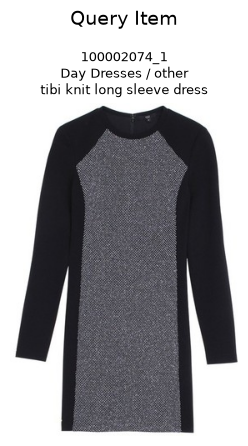

,item_ID,outfit_ID,item_position,category,broad_category,query_category,text
0,100002074_1,100002074,1,Day Dresses,other,dresses,tibi knit long sleeve dress



Recommendations for category: outerwear


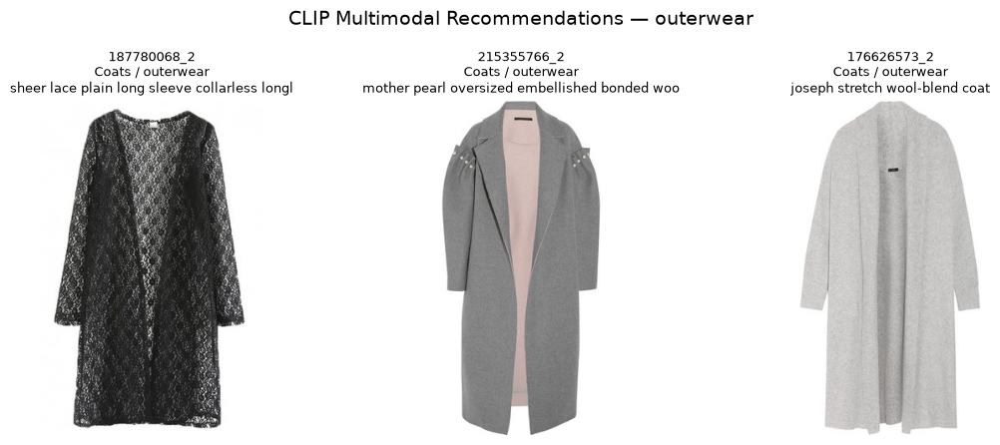

,item_ID,outfit_ID,item_position,category,broad_category,text
0,187780068_2,187780068,2,Coats,outerwear,sheer lace plain long sleeve collarless longline coat
1,215355766_2,215355766,2,Coats,outerwear,mother pearl oversized embellished bonded wool coat
2,176626573_2,176626573,2,Coats,outerwear,joseph stretch wool-blend coat


,item_ID,outfit_ID,category,broad_category,text,clip_multimodal_score
0,187780068_2,187780068,Coats,outerwear,sheer lace plain long sleeve collarless longline coat,0.873160
1,215355766_2,215355766,Coats,outerwear,mother pearl oversized embellished bonded wool coat,0.864338
2,176626573_2,176626573,Coats,outerwear,joseph stretch wool-blend coat,0.863464



Recommendations for category: accessories


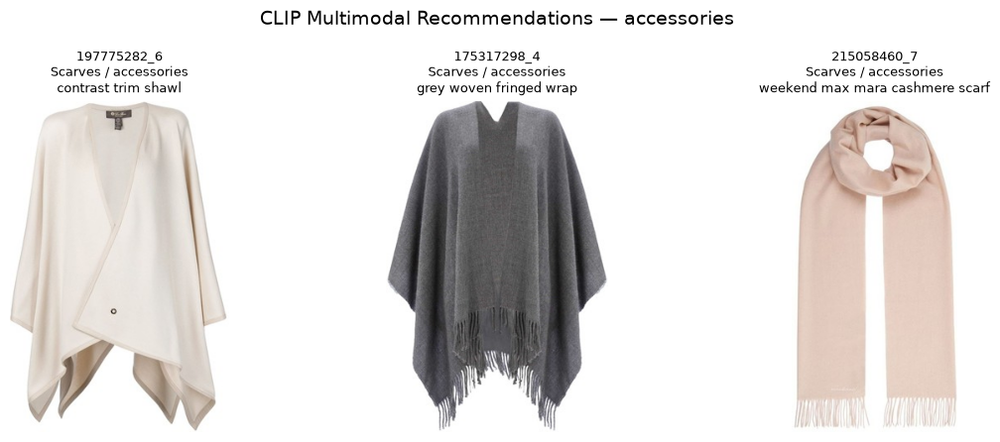

,item_ID,outfit_ID,item_position,category,broad_category,text
3,197775282_6,197775282,6,Scarves,accessories,contrast trim shawl
4,175317298_4,175317298,4,Scarves,accessories,grey woven fringed wrap
5,215058460_7,215058460,7,Scarves,accessories,weekend max mara cashmere scarf


,item_ID,outfit_ID,category,broad_category,text,clip_multimodal_score
3,197775282_6,197775282,Scarves,accessories,contrast trim shawl,0.792181
4,175317298_4,175317298,Scarves,accessories,grey woven fringed wrap,0.777299
5,215058460_7,215058460,Scarves,accessories,weekend max mara cashmere scarf,0.773940


In [38]:
# Cell 38: Display multi-category CLIP recommendations
# RUN EVERY SESSION WHEN TESTING MULTI-CATEGORY RECOMMENDATIONS

def display_multimodal_multi_category_result(recommendation_result, max_items_per_category=5):
    """
    Display query item and CLIP multimodal recommendations grouped by target category.
    """
    query_item = recommendation_result["query_item"]
    results = recommendation_result["results"]
    
    print("User request:")
    print(recommendation_result["user_text"])
    
    if query_item is not None:
        print("\nQuery item:")
        display_items_grid(
            pd.DataFrame([query_item]),
            title="Query Item",
            max_items=1,
            image_index_column="original_dataset_index",
        )
    
    for target_category in recommendation_result["target_categories"]:
        category_results = (
            results[results["requested_target_category"] == target_category]
            .sort_values("clip_multimodal_score", ascending=False)
            .head(max_items_per_category)
        )
        
        print(f"\nRecommendations for category: {target_category}")
        
        display_items_grid(
            category_results.rename(columns={"clip_multimodal_score": "embedding_score"}),
            title=f"CLIP Multimodal Recommendations — {target_category}",
            max_items=max_items_per_category,
            image_index_column="original_dataset_index",
        )
        
        display(
            category_results[
                [
                    "item_ID",
                    "outfit_ID",
                    "category",
                    "broad_category",
                    "text",
                    "clip_multimodal_score",
                ]
            ]
        )


display_multimodal_multi_category_result(
    multi_category_test,
    max_items_per_category=3,
)

User request:
recommend smart casual shoes

Query item:


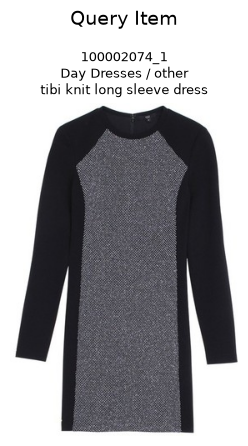

,item_ID,outfit_ID,item_position,category,broad_category,query_category,text
0,100002074_1,100002074,1,Day Dresses,other,dresses,tibi knit long sleeve dress



Recommendations for category: shoes


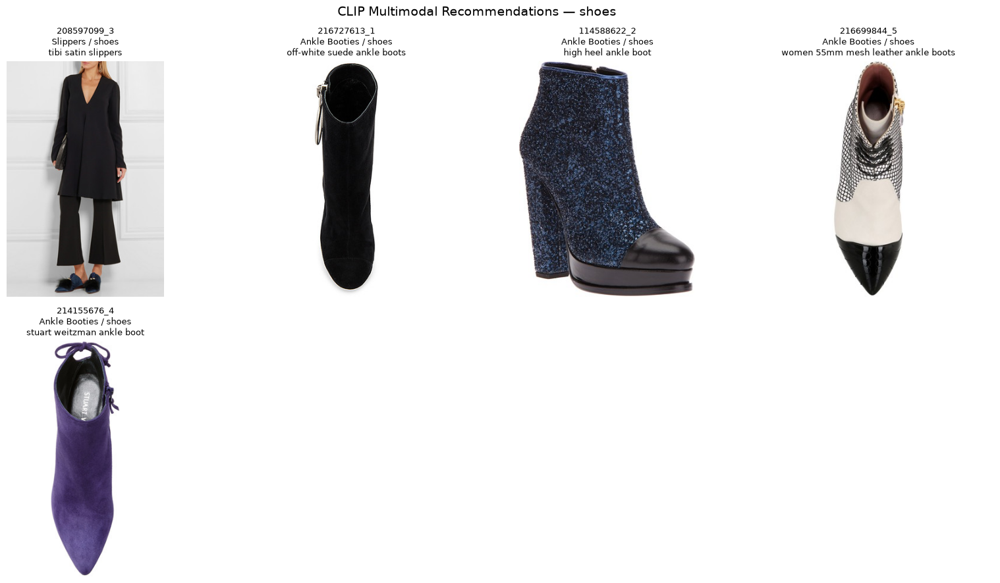

,item_ID,outfit_ID,item_position,category,broad_category,text
0,208597099_3,208597099,3,Slippers,shoes,tibi satin slippers
1,216727613_1,216727613,1,Ankle Booties,shoes,off-white suede ankle boots
2,114588622_2,114588622,2,Ankle Booties,shoes,high heel ankle boot
3,216699844_5,216699844,5,Ankle Booties,shoes,women 55mm mesh leather ankle boots
4,214155676_4,214155676,4,Ankle Booties,shoes,stuart weitzman ankle boot


,item_ID,outfit_ID,category,broad_category,text,clip_multimodal_score
0,208597099_3,208597099,Slippers,shoes,tibi satin slippers,0.809318
1,216727613_1,216727613,Ankle Booties,shoes,off-white suede ankle boots,0.799879
2,114588622_2,114588622,Ankle Booties,shoes,high heel ankle boot,0.793405
3,216699844_5,216699844,Ankle Booties,shoes,women 55mm mesh leather ankle boots,0.790380
4,214155676_4,214155676,Ankle Booties,shoes,stuart weitzman ankle boot,0.789004


User request:
recommend a jacket and accessories for a refined smart casual look

Query item:


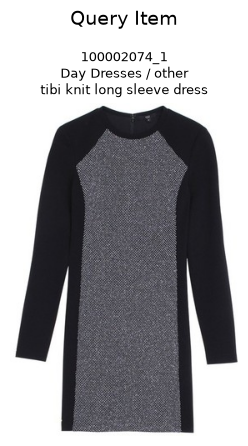

,item_ID,outfit_ID,item_position,category,broad_category,query_category,text
0,100002074_1,100002074,1,Day Dresses,other,dresses,tibi knit long sleeve dress



Recommendations for category: outerwear


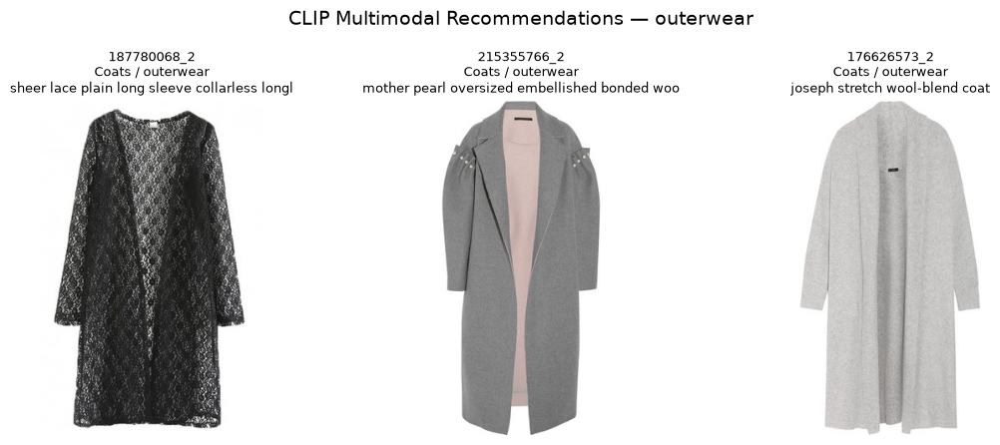

,item_ID,outfit_ID,item_position,category,broad_category,text
0,187780068_2,187780068,2,Coats,outerwear,sheer lace plain long sleeve collarless longline coat
1,215355766_2,215355766,2,Coats,outerwear,mother pearl oversized embellished bonded wool coat
2,176626573_2,176626573,2,Coats,outerwear,joseph stretch wool-blend coat


,item_ID,outfit_ID,category,broad_category,text,clip_multimodal_score
0,187780068_2,187780068,Coats,outerwear,sheer lace plain long sleeve collarless longline coat,0.873394
1,215355766_2,215355766,Coats,outerwear,mother pearl oversized embellished bonded wool coat,0.865937
2,176626573_2,176626573,Coats,outerwear,joseph stretch wool-blend coat,0.864482



Recommendations for category: accessories


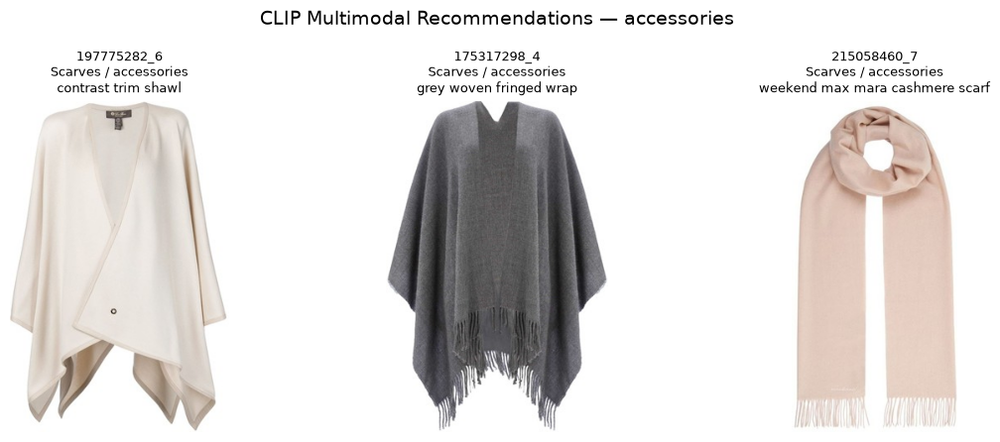

,item_ID,outfit_ID,item_position,category,broad_category,text
3,197775282_6,197775282,6,Scarves,accessories,contrast trim shawl
4,175317298_4,175317298,4,Scarves,accessories,grey woven fringed wrap
5,215058460_7,215058460,7,Scarves,accessories,weekend max mara cashmere scarf


,item_ID,outfit_ID,category,broad_category,text,clip_multimodal_score
3,197775282_6,197775282,Scarves,accessories,contrast trim shawl,0.792497
4,175317298_4,175317298,Scarves,accessories,grey woven fringed wrap,0.776852
5,215058460_7,215058460,Scarves,accessories,weekend max mara cashmere scarf,0.775070


In [39]:
# Cell 39: Final multimodal baseline demo function
# RUN EVERY SESSION AFTER MULTIMODAL RETRIEVAL FUNCTIONS ARE DEFINED

def recommend_multimodal_baseline(
    query_item_id=None,
    user_text="recommend smart casual shoes",
    target_categories=None,
    top_k=5,
    show_results=True,
):
    """
    Current multimodal baseline demo.

    Inputs:
    - query_item_id: item_ID from the dataset, optional
    - user_text: natural language fashion request
    - target_categories: broad categories to recommend
    - top_k: number of recommendations per category

    Output:
    - CLIP multimodal recommendations using image + text fused embeddings.
    """
    if target_categories is None:
        target_categories = ["shoes"]
    
    result = retrieve_clip_multimodal_multi_category(
        query_item_id=query_item_id,
        user_text=user_text,
        target_categories=target_categories,
        top_k_per_category=top_k,
        exclude_same_outfit=True,
    )
    
    if show_results:
        display_multimodal_multi_category_result(
            result,
            max_items_per_category=top_k,
        )
    
    return result


# Test case 1: dress query -> shoes
demo_result_1 = recommend_multimodal_baseline(
    query_item_id="100002074_1",
    user_text="recommend smart casual shoes",
    target_categories=["shoes"],
    top_k=5,
    show_results=True,
)

# Test case 2: dress query -> outerwear and accessories
demo_result_2 = recommend_multimodal_baseline(
    query_item_id="100002074_1",
    user_text="recommend a jacket and accessories for a refined smart casual look",
    target_categories=["outerwear", "accessories"],
    top_k=3,
    show_results=True,
)

In [40]:
# Cell 40: Load real fashion rules KB
# RUN EVERY SESSION AFTER CORE IMPORTS AND PATHS ARE READY

fashion_kb_path = KB_DIR / "fashion_rules.csv"

if not fashion_kb_path.exists():
    raise FileNotFoundError(
        f"KB file not found at: {fashion_kb_path}\n"
        "Place your real KB CSV at data/kb/fashion_rules.csv"
    )

required_kb_columns = [
    "rule_id",
    "rule_text",
    "input_category",
    "recommended_category",
    "style_tags",
    "colour_tags",
    "occasion_tags",
    "season_tags",
    "gender_context",
    "body_fit_context",
    "formality_level",
    "evidence_keywords",
    "source_type",
    "source_title",
    "source_author_or_org",
    "source_year",
    "source_url_or_reference",
    "source_reliability",
    "notes",
]

fashion_kb_df = pd.read_csv(
    fashion_kb_path,
    dtype=str,
    keep_default_na=False,
)

missing_columns = [
    column for column in required_kb_columns
    if column not in fashion_kb_df.columns
]

extra_columns = [
    column for column in fashion_kb_df.columns
    if column not in required_kb_columns
]

if missing_columns:
    raise ValueError(f"Missing required KB columns: {missing_columns}")

# Keep only expected columns and preserve order.
fashion_kb_df = fashion_kb_df[required_kb_columns].copy()

# Strip whitespace from all string cells.
for column in fashion_kb_df.columns:
    fashion_kb_df[column] = fashion_kb_df[column].astype(str).str.strip()

print("Fashion KB loaded successfully.")
print("KB path:", fashion_kb_path.relative_to(PROJECT_ROOT))
print("KB shape:", fashion_kb_df.shape)

if extra_columns:
    print("\nExtra columns ignored:")
    print(extra_columns)

print("\nColumns:")
print(list(fashion_kb_df.columns))

print("\nFirst 5 rules:")
display(fashion_kb_df.head(5))

Fashion KB loaded successfully.
KB path: data\kb\fashion_rules.csv
KB shape: (80, 19)

Columns:
['rule_id', 'rule_text', 'input_category', 'recommended_category', 'style_tags', 'colour_tags', 'occasion_tags', 'season_tags', 'gender_context', 'body_fit_context', 'formality_level', 'evidence_keywords', 'source_type', 'source_title', 'source_author_or_org', 'source_year', 'source_url_or_reference', 'source_reliability', 'notes']

First 5 rules:


,rule_id,rule_text,input_category,recommended_category,style_tags,colour_tags,occasion_tags,season_tags,gender_context,body_fit_context,formality_level,evidence_keywords,source_type,source_title,source_author_or_org,source_year,source_url_or_reference,source_reliability,notes
0,R001,"For a minimalist summer dress, recommend sleek loafers or refined flat sandals because simple dresses work as a clea...",dresses,shoes,"minimal, polished, relaxed","white, neutral, beige","summer, daytime, travel",summer,womenswear,relaxed fit,casual,"minimalist dress, summer dress, loafers, flat sandals, white dress, neutral shoes",fashion_magazine,How to Style the Minimalist Summer Dress,Vogue,2026,https://www.vogue.com/article/how-to-style-the-minimalist-summer-dress,high,Good retrieval rule for casual summer dress recommendations.
1,R002,"For a fluid dress or slip-style evening dress, recommend strappy heels, heeled mules, or dressy flats so the outfit ...",dresses,shoes,"elegant, minimal, feminine","metallic, neutral, black","evening, party, date night","spring, summer",womenswear,fitted,evening,"slip dress, evening dress, strappy heels, heeled mules, dressy flats",retailer_style_guide,The ultimate summer eveningwear guide,NET-A-PORTER / PORTER,2026,https://www.net-a-porter.com/en-jp/porter/article-374bb052eb330477/fashion/art-of-style/eveningwear,high,Useful for day-to-night dress-to-shoe reranking.
2,R003,"For an office-ready shirt dress, recommend loafers, low heels, or block-heeled shoes because they keep the dress pol...",dresses,shoes,"smart casual, polished, classic","black, brown, neutral","work, smart casual, daytime",all season,womenswear,tailored,business casual,"shirt dress, office dress, loafers, low heels, block heels, work shoes",retailer_style_guide,The dress guide: 5 styles to take you through the season,NET-A-PORTER / PORTER,2026,https://www.net-a-porter.com/en-jp/porter/article-269f5890f6dfe2a5/fashion/fashion-memo/best-dress-guide,high,Supports workwear dress recommendations.
3,R004,"For a black dress in cold weather, recommend knee-high boots because they add coverage and structure while keeping t...",dresses,shoes,"classic, polished, elegant","black, brown, neutral","evening, winter, daytime","autumn, winter",womenswear,balanced silhouette,smart casual,"black dress, knee-high boots, winter dress, autumn outfit",fashion_magazine,Fashion People Across Europe Know That These Are the Best Shoes to Wear With Black Dresses,Who What Wear,2025,https://www.whowhatwear.com/fashion/shoes/best-shoes-to-wear-with-black-dresses,medium,Strong seasonal pairing for black dress retrieval.
4,R005,"For a black dress intended for evening, recommend heeled mules, embellished slingbacks, or classic court heels becau...",dresses,shoes,"elegant, classic, polished","black, metallic, neutral","evening, party, date night",all season,womenswear,fitted,evening,"black dress, heeled mules, embellished slingbacks, court heels, party shoes",fashion_magazine,Fashion People Across Europe Know That These Are the Best Shoes to Wear With Black Dresses,Who What Wear,2025,https://www.whowhatwear.com/fashion/shoes/best-shoes-to-wear-with-black-dresses,medium,Good rule for LBD and formal shoe reranking.


In [41]:
# Cell 41: Validate KB quality and category consistency
# RUN EVERY SESSION AFTER KB IS LOADED

valid_input_categories = {
    "tops",
    "bottoms",
    "shoes",
    "outerwear",
    "accessories",
    "dresses",
}

valid_recommended_categories = {
    "tops",
    "bottoms",
    "shoes",
    "outerwear",
    "accessories",
}

valid_source_reliability = {
    "high",
    "medium",
    "low",
}

valid_source_types = {
    "academic_paper",
    "fashion_magazine",
    "fashion_editorial",
    "retailer_style_guide",
    "museum_or_institution",
    "book",
    "reputable_blog",
    "industry_report",
}


def split_kb_tags(value):
    """
    Split comma-separated KB cells into lowercase cleaned tags.
    """
    if value is None:
        return []
    
    return [
        part.strip().lower()
        for part in str(value).split(",")
        if part.strip()
    ]


validation_issues = []

# Duplicate rule IDs
duplicate_rule_ids = (
    fashion_kb_df[fashion_kb_df["rule_id"].duplicated(keep=False)]["rule_id"]
    .unique()
    .tolist()
)

if duplicate_rule_ids:
    validation_issues.append(
        f"Duplicate rule_id values found: {duplicate_rule_ids[:20]}"
    )

# Missing/empty important fields
important_fields = [
    "rule_id",
    "rule_text",
    "input_category",
    "recommended_category",
    "source_type",
    "source_title",
    "source_author_or_org",
    "source_year",
    "source_url_or_reference",
    "source_reliability",
]

for column in important_fields:
    empty_count = int((fashion_kb_df[column].astype(str).str.strip() == "").sum())
    
    if empty_count > 0:
        validation_issues.append(f"{column} has {empty_count} empty values.")

# Validate input categories
invalid_input_rows = []

for row_index, value in fashion_kb_df["input_category"].items():
    categories = split_kb_tags(value)
    
    invalid_categories = [
        category for category in categories
        if category not in valid_input_categories
    ]
    
    if not categories:
        invalid_categories.append("input_category_empty")
    
    if invalid_categories:
        invalid_input_rows.append({
            "row_index": row_index,
            "rule_id": fashion_kb_df.loc[row_index, "rule_id"],
            "input_category": value,
            "invalid_values": ", ".join(invalid_categories),
        })

invalid_input_df = pd.DataFrame(invalid_input_rows)

# Validate recommended category: exactly one value from target categories
invalid_recommended_rows = []

for row_index, value in fashion_kb_df["recommended_category"].items():
    categories = split_kb_tags(value)
    
    invalid_categories = [
        category for category in categories
        if category not in valid_recommended_categories
    ]
    
    if len(categories) != 1:
        invalid_categories.append("recommended_category_must_have_exactly_one_value")
    
    if invalid_categories:
        invalid_recommended_rows.append({
            "row_index": row_index,
            "rule_id": fashion_kb_df.loc[row_index, "rule_id"],
            "recommended_category": value,
            "invalid_values": ", ".join(invalid_categories),
        })

invalid_recommended_df = pd.DataFrame(invalid_recommended_rows)

# Validate source reliability
invalid_reliability_df = fashion_kb_df[
    ~fashion_kb_df["source_reliability"].str.lower().str.strip().isin(valid_source_reliability)
][["rule_id", "source_reliability"]].copy()

# Validate source type
invalid_source_type_df = fashion_kb_df[
    ~fashion_kb_df["source_type"].str.lower().str.strip().isin(valid_source_types)
][["rule_id", "source_type"]].copy()

print("KB validation summary")
print("---------------------")
print("Number of rules:", len(fashion_kb_df))
print("Unique rule IDs:", fashion_kb_df["rule_id"].nunique())
print("Unique source references:", fashion_kb_df["source_url_or_reference"].nunique())

print("\nRecommended category coverage:")
display(
    fashion_kb_df["recommended_category"]
    .str.lower()
    .str.strip()
    .value_counts()
    .rename_axis("recommended_category")
    .reset_index(name="num_rules")
)

print("\nInput category raw coverage:")
display(
    fashion_kb_df["input_category"]
    .str.lower()
    .str.strip()
    .value_counts()
    .rename_axis("input_category")
    .reset_index(name="num_rules")
    .head(20)
)

print("\nSource reliability distribution:")
display(
    fashion_kb_df["source_reliability"]
    .str.lower()
    .str.strip()
    .value_counts()
    .rename_axis("source_reliability")
    .reset_index(name="num_rules")
)

print("\nSource type distribution:")
display(
    fashion_kb_df["source_type"]
    .str.lower()
    .str.strip()
    .value_counts()
    .rename_axis("source_type")
    .reset_index(name="num_rules")
)

if validation_issues:
    print("\nValidation issues:")
    for issue in validation_issues:
        print("-", issue)
else:
    print("\nNo duplicate-ID or required-field issues found.")

print("\nInvalid input category rows:")
display(invalid_input_df if not invalid_input_df.empty else pd.DataFrame({"status": ["none"]}))

print("\nInvalid recommended category rows:")
display(invalid_recommended_df if not invalid_recommended_df.empty else pd.DataFrame({"status": ["none"]}))

print("\nInvalid source reliability rows:")
display(invalid_reliability_df if not invalid_reliability_df.empty else pd.DataFrame({"status": ["none"]}))

print("\nInvalid source type rows:")
display(invalid_source_type_df if not invalid_source_type_df.empty else pd.DataFrame({"status": ["none"]}))

KB validation summary
---------------------
Number of rules: 80
Unique rule IDs: 80
Unique source references: 39

Recommended category coverage:


,recommended_category,num_rules
0,accessories,28
1,shoes,20
2,outerwear,14
3,tops,10
4,bottoms,8



Input category raw coverage:


,input_category,num_rules
0,dresses,26
1,bottoms,19
2,tops,13
3,outerwear,6
4,shoes,6
5,"tops, bottoms, dresses",2
6,"tops, bottoms, shoes, outerwear, dresses",2
7,"tops, bottoms, outerwear, dresses",2
8,"tops, bottoms, shoes, outerwear",1
9,"dresses, outerwear, shoes",1



Source reliability distribution:


,source_reliability,num_rules
0,high,43
1,medium,37



Source type distribution:


,source_type,num_rules
0,fashion_magazine,41
1,retailer_style_guide,34
2,reputable_blog,4
3,academic_paper,1



No duplicate-ID or required-field issues found.

Invalid input category rows:


,status
0,none



Invalid recommended category rows:


,status
0,none



Invalid source reliability rows:


,status
0,none



Invalid source type rows:


,status
0,none


In [42]:
# Cell 42: Build searchable KB evidence text
# RUN EVERY SESSION AFTER KB VALIDATION

fashion_kb_df = fashion_kb_df.copy()

fashion_kb_df["recommended_category_clean"] = (
    fashion_kb_df["recommended_category"]
    .astype(str)
    .str.lower()
    .str.strip()
)

fashion_kb_df["input_category_clean"] = (
    fashion_kb_df["input_category"]
    .astype(str)
    .str.lower()
    .str.strip()
)

fashion_kb_df["rule_text_clean"] = (
    fashion_kb_df["rule_text"]
    .astype(str)
    .str.strip()
)

fashion_kb_df["kb_search_text"] = (
    "Fashion styling rule: " + fashion_kb_df["rule_text_clean"] + " | "
    + "Query item categories: " + fashion_kb_df["input_category"].astype(str) + " | "
    + "Recommended item category: " + fashion_kb_df["recommended_category"].astype(str) + " | "
    + "Style tags: " + fashion_kb_df["style_tags"].astype(str) + " | "
    + "Colour tags: " + fashion_kb_df["colour_tags"].astype(str) + " | "
    + "Occasion tags: " + fashion_kb_df["occasion_tags"].astype(str) + " | "
    + "Season tags: " + fashion_kb_df["season_tags"].astype(str) + " | "
    + "Gender context: " + fashion_kb_df["gender_context"].astype(str) + " | "
    + "Fit and proportion context: " + fashion_kb_df["body_fit_context"].astype(str) + " | "
    + "Formality level: " + fashion_kb_df["formality_level"].astype(str) + " | "
    + "Evidence keywords: " + fashion_kb_df["evidence_keywords"].astype(str)
)

print("Searchable KB text created.")
print("KB shape:", fashion_kb_df.shape)

print("\nExample searchable KB entries:")
display(
    fashion_kb_df[
        [
            "rule_id",
            "rule_text",
            "input_category",
            "recommended_category",
            "style_tags",
            "occasion_tags",
            "source_title",
            "source_author_or_org",
            "source_reliability",
            "kb_search_text",
        ]
    ].head(10)
)

processed_kb_path = PROCESSED_DATA_DIR / "fashion_kb_processed.parquet"

fashion_kb_df.to_parquet(processed_kb_path, index=False)

print("\nSaved processed KB:")
print(processed_kb_path.relative_to(PROJECT_ROOT))

Searchable KB text created.
KB shape: (80, 23)

Example searchable KB entries:


,rule_id,rule_text,input_category,recommended_category,style_tags,occasion_tags,source_title,source_author_or_org,source_reliability,kb_search_text
0,R001,"For a minimalist summer dress, recommend sleek loafers or refined flat sandals because simple dresses work as a clea...",dresses,shoes,"minimal, polished, relaxed","summer, daytime, travel",How to Style the Minimalist Summer Dress,Vogue,high,"Fashion styling rule: For a minimalist summer dress, recommend sleek loafers or refined flat sandals because simple ..."
1,R002,"For a fluid dress or slip-style evening dress, recommend strappy heels, heeled mules, or dressy flats so the outfit ...",dresses,shoes,"elegant, minimal, feminine","evening, party, date night",The ultimate summer eveningwear guide,NET-A-PORTER / PORTER,high,"Fashion styling rule: For a fluid dress or slip-style evening dress, recommend strappy heels, heeled mules, or dress..."
2,R003,"For an office-ready shirt dress, recommend loafers, low heels, or block-heeled shoes because they keep the dress pol...",dresses,shoes,"smart casual, polished, classic","work, smart casual, daytime",The dress guide: 5 styles to take you through the season,NET-A-PORTER / PORTER,high,"Fashion styling rule: For an office-ready shirt dress, recommend loafers, low heels, or block-heeled shoes because t..."
3,R004,"For a black dress in cold weather, recommend knee-high boots because they add coverage and structure while keeping t...",dresses,shoes,"classic, polished, elegant","evening, winter, daytime",Fashion People Across Europe Know That These Are the Best Shoes to Wear With Black Dresses,Who What Wear,medium,"Fashion styling rule: For a black dress in cold weather, recommend knee-high boots because they add coverage and str..."
4,R005,"For a black dress intended for evening, recommend heeled mules, embellished slingbacks, or classic court heels becau...",dresses,shoes,"elegant, classic, polished","evening, party, date night",Fashion People Across Europe Know That These Are the Best Shoes to Wear With Black Dresses,Who What Wear,medium,"Fashion styling rule: For a black dress intended for evening, recommend heeled mules, embellished slingbacks, or cla..."
5,R006,"For a versatile midi dress, recommend trainers for daytime casual use and heels for a more elevated setting because ...",dresses,shoes,"casual, smart casual, classic","daytime, casual, evening",20 Timeless Items You'll Never Regret Owning in Your 30s,Who What Wear,medium,"Fashion styling rule: For a versatile midi dress, recommend trainers for daytime casual use and heels for a more ele..."
6,R007,"For formal dresses or gowns, recommend fancy flats, statement shoes, go-with-everything heels, or walkable block hee...",dresses,shoes,"formal, elegant, polished","formal, wedding, evening",How to Build a Formal Capsule Wardrobe,Who What Wear,medium,"Fashion styling rule: For formal dresses or gowns, recommend fancy flats, statement shoes, go-with-everything heels,..."
7,R008,"For cocktail dresses, recommend kitten heels, block heels, stilettos, or dressy flats, and avoid trainers because co...",dresses,shoes,"formal, elegant, polished","cocktail, party, evening",The 8 Official Dos and Don'ts of Cocktail Attire for Women,Who What Wear,medium,"Fashion styling rule: For cocktail dresses, recommend kitten heels, block heels, stilettos, or dressy flats, and avo..."
8,R009,"For a dress styled in a modern summer casual way, recommend refined flip-flops such as platform, leather, or kitten-...",dresses,shoes,"casual, relaxed, minimal","summer, daytime, travel",5 Runway-Inspired Ways To Wear A Dress And Flip-Flops,Vogue,high,"Fashion styling rule: For a dress styled in a modern summer casual way, recommend refined flip-flops such as platfor..."
9,R010,"For a long-sleeved maxi or modest dress, recommend shoes that preserve a clean line, such as low heels, sleek flats,...",dresses,shoes,"elegant, minimal, modest","daytime, evening, formal",The dress guide: 5 styles to take you through the


Saved processed KB:
data\processed\fashion_kb_processed.parquet


In [43]:
# Cell 43: Embed KB rules
# RUN EVERY SESSION; FIRST RUN COMPUTES, LATER RUNS LOAD CACHE

kb_embeddings_path = EMBEDDINGS_DIR / "fashion_kb_rule_embeddings_all_minilm_l6_v2.npy"

if kb_embeddings_path.exists():
    print("Loading cached KB rule embeddings:")
    print(kb_embeddings_path.relative_to(PROJECT_ROOT))
    
    kb_rule_embeddings = np.load(kb_embeddings_path)

else:
    print("Computing KB rule embeddings.")
    print("Number of KB rules:", len(fashion_kb_df))
    
    kb_rule_embeddings = text_embedding_model.encode(
        fashion_kb_df["kb_search_text"].tolist(),
        batch_size=64,
        normalize_embeddings=True,
        convert_to_numpy=True,
        show_progress_bar=True,
    )
    
    np.save(kb_embeddings_path, kb_rule_embeddings)
    
    print("Saved KB rule embeddings:")
    print(kb_embeddings_path.relative_to(PROJECT_ROOT))

kb_rule_embeddings = kb_rule_embeddings.astype("float32")

print("KB rule embedding matrix shape:", kb_rule_embeddings.shape)
print("KB metadata shape:", fashion_kb_df.shape)

assert len(fashion_kb_df) == kb_rule_embeddings.shape[0], (
    "KB rows and KB embedding rows do not match."
)

Loading cached KB rule embeddings:
outputs\embeddings\fashion_kb_rule_embeddings_all_minilm_l6_v2.npy
KB rule embedding matrix shape: (80, 384)
KB metadata shape: (80, 23)


In [44]:
# Cell 44: Build KB FAISS indexes
# RUN EVERY SESSION AFTER KB EMBEDDINGS ARE AVAILABLE

kb_embedding_dim = kb_rule_embeddings.shape[1]

# Global KB index
kb_global_index = faiss.IndexFlatIP(kb_embedding_dim)
kb_global_index.add(kb_rule_embeddings)

# Category-specific KB indexes by recommended category
kb_category_indexes = {}
kb_category_row_lookup = {}

for target_category in target_broad_categories:
    category_rows = fashion_kb_df.index[
        fashion_kb_df["recommended_category_clean"] == target_category
    ].to_numpy()
    
    category_embeddings = kb_rule_embeddings[category_rows].astype("float32")
    
    index = faiss.IndexFlatIP(kb_embedding_dim)
    index.add(category_embeddings)
    
    kb_category_indexes[target_category] = index
    kb_category_row_lookup[target_category] = category_rows
    
    print(
        f"{target_category:12s} | "
        f"rules: {len(category_rows):4d} | "
        f"index vectors: {index.ntotal:4d}"
    )

print("\nGlobal KB index vectors:", kb_global_index.ntotal)
print("Built KB evidence indexes.")

tops         | rules:   10 | index vectors:   10
bottoms      | rules:    8 | index vectors:    8
shoes        | rules:   20 | index vectors:   20
outerwear    | rules:   14 | index vectors:   14
accessories  | rules:   28 | index vectors:   28

Global KB index vectors: 80
Built KB evidence indexes.


In [45]:
# Cell 45: Query-level evidence retrieval
# RUN EVERY SESSION AFTER KB INDEXES ARE BUILT

def build_evidence_query_text(
    query_item_row=None,
    user_text="",
    target_category=None,
):
    """
    Build text used to retrieve general KB evidence for the query.
    """
    query_parts = []
    
    if query_item_row is not None:
        query_parts.extend([
            f"Query item category: {query_item_row.get('category', '')}",
            f"Query item group: {query_item_row.get('query_category', '')}",
            f"Query item description: {query_item_row.get('text', '')}",
        ])
    
    if user_text:
        query_parts.append(f"User request: {user_text}")
    
    if target_category:
        query_parts.append(f"Need fashion rules for recommending: {target_category}")
    
    return " | ".join(query_parts)


def retrieve_query_evidence(
    query_item_id=None,
    user_text="",
    target_category="shoes",
    top_n=5,
):
    """
    Retrieve top-N KB rules relevant to the query and target category.
    """
    if target_category not in kb_category_indexes:
        raise ValueError(
            f"Unknown target_category={target_category}. "
            f"Available KB categories: {list(kb_category_indexes.keys())}"
        )
    
    query_item_row = None
    
    if query_item_id is not None:
        query_item_row = get_query_item_by_id(query_item_id)
    
    evidence_query_text = build_evidence_query_text(
        query_item_row=query_item_row,
        user_text=user_text,
        target_category=target_category,
    )
    
    evidence_query_embedding = text_embedding_model.encode(
        [evidence_query_text],
        normalize_embeddings=True,
        convert_to_numpy=True,
        show_progress_bar=False,
    ).astype("float32")
    
    search_k = min(top_n, kb_category_indexes[target_category].ntotal)
    
    scores, local_indices = kb_category_indexes[target_category].search(
        evidence_query_embedding,
        search_k,
    )
    
    global_rows = kb_category_row_lookup[target_category][local_indices[0]]
    
    evidence_results = fashion_kb_df.iloc[global_rows].copy()
    evidence_results["evidence_score"] = scores[0]
    
    evidence_results = evidence_results.reset_index(drop=True)
    
    return {
        "evidence_query_text": evidence_query_text,
        "query_item": query_item_row,
        "target_category": target_category,
        "evidence": evidence_results,
    }


query_evidence_test = retrieve_query_evidence(
    query_item_id="100002074_1",
    user_text="recommend smart casual shoes",
    target_category="shoes",
    top_n=5,
)

print("Evidence query text:")
print(query_evidence_test["evidence_query_text"])

print("\nRetrieved query-level evidence:")
display(
    query_evidence_test["evidence"][
        [
            "rule_id",
            "rule_text",
            "input_category",
            "recommended_category",
            "style_tags",
            "occasion_tags",
            "source_title",
            "source_author_or_org",
            "source_reliability",
            "evidence_score",
        ]
    ]
)

Evidence query text:
Query item category: Day Dresses | Query item group: dresses | Query item description: tibi knit long sleeve dress | User request: recommend smart casual shoes | Need fashion rules for recommending: shoes

Retrieved query-level evidence:


,rule_id,rule_text,input_category,recommended_category,style_tags,occasion_tags,source_title,source_author_or_org,source_reliability,evidence_score
0,R006,"For a versatile midi dress, recommend trainers for daytime casual use and heels for a more elevated setting because ...",dresses,shoes,"casual, smart casual, classic","daytime, casual, evening",20 Timeless Items You'll Never Regret Owning in Your 30s,Who What Wear,medium,0.671426
1,R003,"For an office-ready shirt dress, recommend loafers, low heels, or block-heeled shoes because they keep the dress pol...",dresses,shoes,"smart casual, polished, classic","work, smart casual, daytime",The dress guide: 5 styles to take you through the season,NET-A-PORTER / PORTER,high,0.637598
2,R008,"For cocktail dresses, recommend kitten heels, block heels, stilettos, or dressy flats, and avoid trainers because co...",dresses,shoes,"formal, elegant, polished","cocktail, party, evening",The 8 Official Dos and Don'ts of Cocktail Attire for Women,Who What Wear,medium,0.634752
3,R010,"For a long-sleeved maxi or modest dress, recommend shoes that preserve a clean line, such as low heels, sleek flats,...",dresses,shoes,"elegant, minimal, modest","daytime, evening, formal",The dress guide: 5 styles to take you through the season,NET-A-PORTER / PORTER,high,0.627465
4,R009,"For a dress styled in a modern summer casual way, recommend refined flip-flops such as platform, leather, or kitten-...",dresses,shoes,"casual, relaxed, minimal","summer, daytime, travel",5 Runway-Inspired Ways To Wear A Dress And Flip-Flops,Vogue,high,0.626103


In [46]:
# Cell 46: Candidate-specific evidence retrieval
# RUN EVERY SESSION AFTER QUERY-LEVEL KB EVIDENCE RETRIEVAL WORKS

def build_candidate_evidence_query_text(
    query_item_row=None,
    candidate_row=None,
    user_text="",
    target_category=None,
):
    """
    Build text used to retrieve KB evidence for a specific candidate recommendation.
    """
    query_parts = []
    
    if query_item_row is not None:
        query_parts.extend([
            f"Query item category: {query_item_row.get('category', '')}",
            f"Query item group: {query_item_row.get('query_category', '')}",
            f"Query item description: {query_item_row.get('text', '')}",
        ])
    
    if candidate_row is not None:
        query_parts.extend([
            f"Candidate category: {candidate_row.get('category', '')}",
            f"Candidate group: {candidate_row.get('broad_category', '')}",
            f"Candidate description: {candidate_row.get('text', '')}",
        ])
    
    if user_text:
        query_parts.append(f"User request: {user_text}")
    
    if target_category:
        query_parts.append(f"Need fashion evidence for recommending: {target_category}")
    
    return " | ".join(query_parts)


def retrieve_candidate_evidence(
    query_item_row,
    candidate_row,
    user_text="",
    target_category="shoes",
    top_n=3,
):
    """
    Retrieve top-N KB rules for one candidate recommendation.
    """
    if target_category not in kb_category_indexes:
        raise ValueError(
            f"Unknown target_category={target_category}. "
            f"Available KB categories: {list(kb_category_indexes.keys())}"
        )
    
    candidate_evidence_text = build_candidate_evidence_query_text(
        query_item_row=query_item_row,
        candidate_row=candidate_row,
        user_text=user_text,
        target_category=target_category,
    )
    
    candidate_evidence_embedding = text_embedding_model.encode(
        [candidate_evidence_text],
        normalize_embeddings=True,
        convert_to_numpy=True,
        show_progress_bar=False,
    ).astype("float32")
    
    search_k = min(top_n, kb_category_indexes[target_category].ntotal)
    
    scores, local_indices = kb_category_indexes[target_category].search(
        candidate_evidence_embedding,
        search_k,
    )
    
    global_rows = kb_category_row_lookup[target_category][local_indices[0]]
    
    evidence_df = fashion_kb_df.iloc[global_rows].copy()
    evidence_df["evidence_score"] = scores[0]
    evidence_df = evidence_df.reset_index(drop=True)
    
    return evidence_df


def add_candidate_evidence_to_results(
    retrieval_result,
    user_text="",
    top_n_evidence=3,
):
    """
    Add candidate-specific evidence rule IDs and evidence scores to recommendation results.
    """
    query_item_row = retrieval_result["query_item"]
    target_category = retrieval_result["target_category"]
    results = retrieval_result["results"].copy()
    
    evidence_rule_ids = []
    evidence_rule_texts = []
    evidence_scores = []
    evidence_tables = []
    
    for _, candidate_row in results.iterrows():
        candidate_evidence = retrieve_candidate_evidence(
            query_item_row=query_item_row,
            candidate_row=candidate_row,
            user_text=user_text,
            target_category=target_category,
            top_n=top_n_evidence,
        )
        
        evidence_tables.append(candidate_evidence)
        evidence_rule_ids.append(", ".join(candidate_evidence["rule_id"].tolist()))
        evidence_rule_texts.append(" || ".join(candidate_evidence["rule_text"].tolist()))
        evidence_scores.append(float(candidate_evidence["evidence_score"].mean()))
    
    results["evidence_rule_ids"] = evidence_rule_ids
    results["evidence_rule_texts"] = evidence_rule_texts
    results["evidence_score"] = evidence_scores
    results["candidate_evidence_table"] = evidence_tables
    
    return results


clip_test_with_evidence = add_candidate_evidence_to_results(
    retrieval_result=clip_multimodal_test,
    user_text="recommend smart casual shoes",
    top_n_evidence=3,
)

display(
    clip_test_with_evidence[
        [
            "item_ID",
            "category",
            "text",
            "clip_multimodal_score",
            "evidence_score",
            "evidence_rule_ids",
        ]
    ]
)

,item_ID,category,text,clip_multimodal_score,evidence_score,evidence_rule_ids
0,208597099_3,Slippers,tibi satin slippers,0.809318,0.639691,"R006, R008, R009"
1,216727613_1,Ankle Booties,off-white suede ankle boots,0.799879,0.666131,"R009, R006, R008"
2,114588622_2,Ankle Booties,high heel ankle boot,0.793405,0.657628,"R006, R008, R009"
3,216699844_5,Ankle Booties,women 55mm mesh leather ankle boots,0.790380,0.663306,"R006, R008, R009"
4,214155676_4,Ankle Booties,stuart weitzman ankle boot,0.789004,0.666482,"R008, R009, R006"


In [47]:
# Cell 47: Evidence-constrained reranking
# RUN EVERY SESSION AFTER CANDIDATE-SPECIFIC EVIDENCE IS AVAILABLE

def min_max_normalize(series):
    """
    Normalize a numeric pandas Series to the [0, 1] range.
    If all values are equal, return 1.0 for all rows.
    """
    series = series.astype(float)
    min_value = series.min()
    max_value = series.max()
    
    if max_value == min_value:
        return pd.Series(np.ones(len(series)), index=series.index)
    
    return (series - min_value) / (max_value - min_value)


def rerank_with_evidence(
    results_with_evidence,
    embedding_score_column="clip_multimodal_score",
    alpha=0.7,
    beta=0.3,
):
    """
    Rerank recommendations using:
    final_score = alpha * normalized_embedding_score + beta * normalized_evidence_score
    
    alpha controls the importance of multimodal item similarity.
    beta controls the importance of KB evidence support.
    """
    reranked_df = results_with_evidence.copy()
    
    reranked_df["embedding_score_norm"] = min_max_normalize(
        reranked_df[embedding_score_column]
    )
    
    reranked_df["evidence_score_norm"] = min_max_normalize(
        reranked_df["evidence_score"]
    )
    
    reranked_df["final_score"] = (
        alpha * reranked_df["embedding_score_norm"]
        + beta * reranked_df["evidence_score_norm"]
    )
    
    reranked_df["original_rank"] = np.arange(1, len(reranked_df) + 1)
    
    reranked_df = (
        reranked_df
        .sort_values("final_score", ascending=False)
        .reset_index(drop=True)
    )
    
    reranked_df["evidence_constrained_rank"] = np.arange(1, len(reranked_df) + 1)
    
    return reranked_df


evidence_reranked_test = rerank_with_evidence(
    clip_test_with_evidence,
    embedding_score_column="clip_multimodal_score",
    alpha=0.7,
    beta=0.3,
)

print("Evidence-constrained reranking result:")
display(
    evidence_reranked_test[
        [
            "evidence_constrained_rank",
            "original_rank",
            "item_ID",
            "category",
            "text",
            "clip_multimodal_score",
            "evidence_score",
            "embedding_score_norm",
            "evidence_score_norm",
            "final_score",
            "evidence_rule_ids",
        ]
    ]
)

Evidence-constrained reranking result:


,evidence_constrained_rank,original_rank,item_ID,category,text,clip_multimodal_score,evidence_score,embedding_score_norm,evidence_score_norm,final_score,evidence_rule_ids
0,1,1,208597099_3,Slippers,tibi satin slippers,0.809318,0.639691,1.000000,0.000000,0.700000,"R006, R008, R009"
1,2,2,216727613_1,Ankle Booties,off-white suede ankle boots,0.799879,0.666131,0.535364,0.986898,0.670824,"R009, R006, R008"
2,3,3,114588622_2,Ankle Booties,high heel ankle boot,0.793405,0.657628,0.216670,0.669514,0.352523,"R006, R008, R009"
3,4,4,216699844_5,Ankle Booties,women 55mm mesh leather ankle boots,0.790380,0.663306,0.067727,0.881484,0.311854,"R006, R008, R009"
4,5,5,214155676_4,Ankle Booties,stuart weitzman ankle boot,0.789004,0.666482,0.000000,1.000000,0.300000,"R008, R009, R006"


Query text:
Fashion item: Day Dresses | Description: tibi knit long sleeve dress | Input group: dresses | Request: recommend smart casual shoes | Recommend: shoes

Query item:


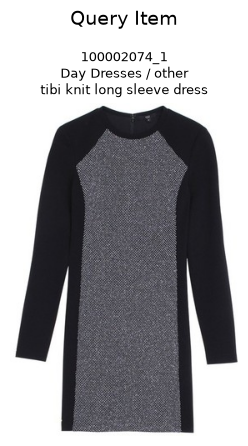

,item_ID,outfit_ID,item_position,category,broad_category,query_category,text
0,100002074_1,100002074,1,Day Dresses,other,dresses,tibi knit long sleeve dress



Original CLIP multimodal ranking:


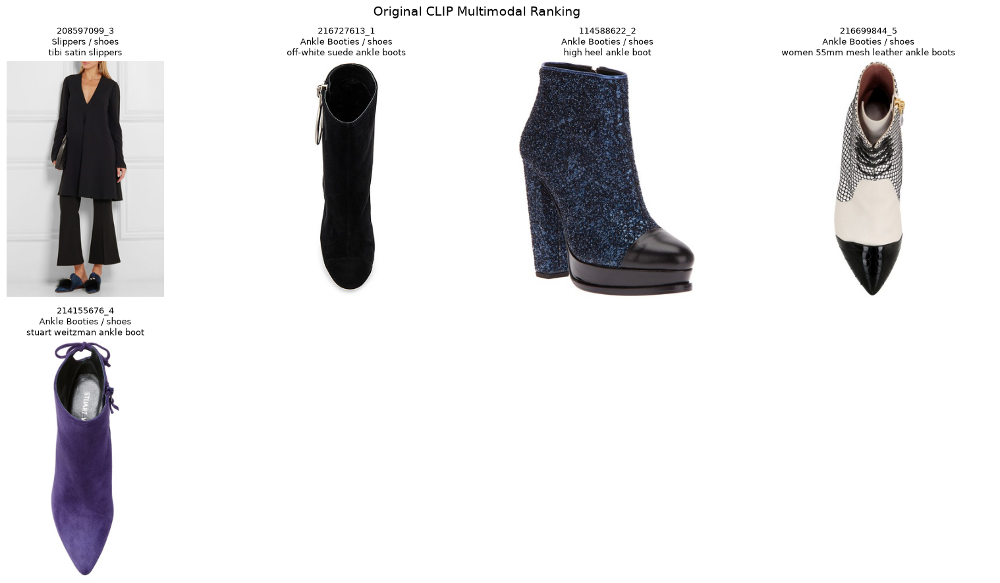

,item_ID,outfit_ID,item_position,category,broad_category,text
0,208597099_3,208597099,3,Slippers,shoes,tibi satin slippers
1,216727613_1,216727613,1,Ankle Booties,shoes,off-white suede ankle boots
2,114588622_2,114588622,2,Ankle Booties,shoes,high heel ankle boot
3,216699844_5,216699844,5,Ankle Booties,shoes,women 55mm mesh leather ankle boots
4,214155676_4,214155676,4,Ankle Booties,shoes,stuart weitzman ankle boot


,item_ID,category,text,clip_multimodal_score
0,208597099_3,Slippers,tibi satin slippers,0.809318
1,216727613_1,Ankle Booties,off-white suede ankle boots,0.799879
2,114588622_2,Ankle Booties,high heel ankle boot,0.793405
3,216699844_5,Ankle Booties,women 55mm mesh leather ankle boots,0.790380
4,214155676_4,Ankle Booties,stuart weitzman ankle boot,0.789004



Evidence-constrained ranking:


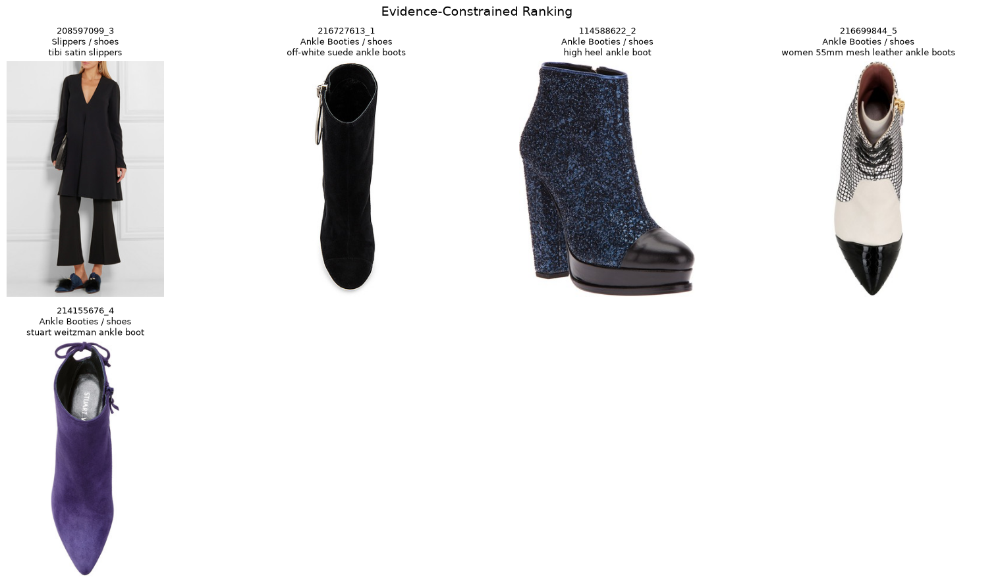

,item_ID,outfit_ID,item_position,category,broad_category,text
0,208597099_3,208597099,3,Slippers,shoes,tibi satin slippers
1,216727613_1,216727613,1,Ankle Booties,shoes,off-white suede ankle boots
2,114588622_2,114588622,2,Ankle Booties,shoes,high heel ankle boot
3,216699844_5,216699844,5,Ankle Booties,shoes,women 55mm mesh leather ankle boots
4,214155676_4,214155676,4,Ankle Booties,shoes,stuart weitzman ankle boot


,evidence_constrained_rank,original_rank,item_ID,category,text,clip_multimodal_score,evidence_score,final_score,evidence_rule_ids
0,1,1,208597099_3,Slippers,tibi satin slippers,0.809318,0.639691,0.700000,"R006, R008, R009"
1,2,2,216727613_1,Ankle Booties,off-white suede ankle boots,0.799879,0.666131,0.670824,"R009, R006, R008"
2,3,3,114588622_2,Ankle Booties,high heel ankle boot,0.793405,0.657628,0.352523,"R006, R008, R009"
3,4,4,216699844_5,Ankle Booties,women 55mm mesh leather ankle boots,0.790380,0.663306,0.311854,"R006, R008, R009"
4,5,5,214155676_4,Ankle Booties,stuart weitzman ankle boot,0.789004,0.666482,0.300000,"R008, R009, R006"


In [48]:
# Cell 48: Compare multimodal baseline vs evidence-constrained ranking
# RUN WHEN TESTING EVIDENCE-CONSTRAINED OUTPUTS

def display_evidence_reranking_comparison(
    original_retrieval_result,
    reranked_df,
    top_k=5,
):
    """
    Display original CLIP multimodal recommendations and evidence-reranked recommendations.
    """
    query_item = original_retrieval_result["query_item"]
    
    print("Query text:")
    print(original_retrieval_result["query_text"])
    
    if query_item is not None:
        print("\nQuery item:")
        display_items_grid(
            pd.DataFrame([query_item]),
            title="Query Item",
            max_items=1,
            image_index_column="original_dataset_index",
        )
    
    print("\nOriginal CLIP multimodal ranking:")
    original_display = original_retrieval_result["results"].head(top_k).copy()
    original_display = original_display.rename(
        columns={"clip_multimodal_score": "embedding_score"}
    )
    
    display_items_grid(
        original_display,
        title="Original CLIP Multimodal Ranking",
        max_items=top_k,
        image_index_column="original_dataset_index",
    )
    
    display(
        original_retrieval_result["results"].head(top_k)[
            [
                "item_ID",
                "category",
                "text",
                "clip_multimodal_score",
            ]
        ]
    )
    
    print("\nEvidence-constrained ranking:")
    reranked_display = reranked_df.head(top_k).copy()
    reranked_display = reranked_display.rename(
        columns={"final_score": "embedding_score"}
    )
    
    display_items_grid(
        reranked_display,
        title="Evidence-Constrained Ranking",
        max_items=top_k,
        image_index_column="original_dataset_index",
    )
    
    display(
        reranked_df.head(top_k)[
            [
                "evidence_constrained_rank",
                "original_rank",
                "item_ID",
                "category",
                "text",
                "clip_multimodal_score",
                "evidence_score",
                "final_score",
                "evidence_rule_ids",
            ]
        ]
    )


display_evidence_reranking_comparison(
    original_retrieval_result=clip_multimodal_test,
    reranked_df=evidence_reranked_test,
    top_k=5,
)

## Improved Evidence-Constrained Reranking

The first reranking test applied evidence only to the Top-5 CLIP recommendations.  
Because those candidates were already very similar, evidence had limited effect on the ranking.  
The improved version retrieves a larger CLIP candidate pool first, applies candidate-specific KB evidence to that pool, and then selects the final Top-K recommendations.

In [49]:
# Cell 49: Retrieve larger CLIP candidate pool
# RUN AFTER CLIP MULTIMODAL RETRIEVAL FUNCTIONS ARE AVAILABLE

def retrieve_clip_candidate_pool(
    query_item_id,
    user_text,
    target_category,
    candidate_pool_size=50,
    exclude_same_outfit=True,
):
    """
    Retrieve a larger CLIP multimodal candidate pool for later evidence reranking.

    This function is compatible with the cleaned Cell 35 where
    build_clip_multimodal_query_embedding() returns only the query embedding.
    """
    query_item_row = get_query_item_by_id(query_item_id)
    
    query_text = build_clip_query_text(
        query_item_row=query_item_row,
        user_text=user_text,
        target_category=target_category,
    )
    
    query_embedding = build_clip_multimodal_query_embedding(
        query_item_row=query_item_row,
        user_text=user_text,
        target_category=target_category,
        alpha_image_query=0.6,
        alpha_text_query=0.4,
    )
    
    if torch.is_tensor(query_embedding):
        query_embedding = query_embedding.detach().cpu().numpy()

    query_embedding = np.asarray(query_embedding).astype("float32")
    
    if target_category not in clip_multimodal_category_indexes:
        raise ValueError(f"Unknown target category: {target_category}")
    
    search_k = min(
        candidate_pool_size * 5,
        clip_multimodal_category_indexes[target_category].ntotal,
    )
    
    scores, local_indices = clip_multimodal_category_indexes[target_category].search(
        query_embedding.astype("float32"),
        search_k,
    )
    
    global_rows = clip_multimodal_category_row_lookup[target_category][local_indices[0]]
    
    candidate_pool = target_items_for_clip.iloc[global_rows].copy()
    candidate_pool["clip_multimodal_score"] = scores[0]
    
    candidate_pool = candidate_pool[
        candidate_pool["item_ID"] != query_item_row["item_ID"]
    ].copy()
    
    if exclude_same_outfit:
        candidate_pool = candidate_pool[
            candidate_pool["outfit_ID"] != query_item_row["outfit_ID"]
        ].copy()
    
    candidate_pool = (
        candidate_pool
        .head(candidate_pool_size)
        .reset_index(drop=True)
    )
    
    candidate_pool["clip_candidate_rank"] = np.arange(1, len(candidate_pool) + 1)
    
    return {
        "query_text": query_text,
        "query_item": query_item_row,
        "target_category": target_category,
        "candidate_pool": candidate_pool,
    }


# Quick test
candidate_pool_test = retrieve_clip_candidate_pool(
    query_item_id="100002074_1",
    user_text="recommend smart casual shoes",
    target_category="shoes",
    candidate_pool_size=25,
    exclude_same_outfit=True,
)

print("Query text:")
print(candidate_pool_test["query_text"])

print("\nCandidate pool shape:", candidate_pool_test["candidate_pool"].shape)

display(
    candidate_pool_test["candidate_pool"][
        [
            "clip_candidate_rank",
            "item_ID",
            "category",
            "text",
            "clip_multimodal_score",
        ]
    ].head(10)
)

Query text:
Fashion item: Day Dresses | Description: tibi knit long sleeve dress | Input group: dresses | Request: recommend smart casual shoes | Recommend: shoes

Candidate pool shape: (25, 11)


,clip_candidate_rank,item_ID,category,text,clip_multimodal_score
0,1,208597099_3,Slippers,tibi satin slippers,0.809318
1,2,216727613_1,Ankle Booties,off-white suede ankle boots,0.799879
2,3,114588622_2,Ankle Booties,high heel ankle boot,0.793405
3,4,216699844_5,Ankle Booties,women 55mm mesh leather ankle boots,0.790380
4,5,214155676_4,Ankle Booties,stuart weitzman ankle boot,0.789004
5,6,216902045_3,Ankle Booties,pre-owned zara boots,0.786830
6,7,216179560_5,Ankle Booties,derek lam crosby studded sole ankle boots,0.784376
7,8,205468200_2,Knee High Boots,stuart weitzman knee high boots,0.782809
8,9,188682936_4,Pumps,laura gg pumps,0.781776
9,10,214427252_4,Ankle Booties,sergio rossi zip ankle boots,0.780658


In [50]:
# Cell 50: Stronger candidate evidence scoring
# RUN AFTER CANDIDATE POOL RETRIEVAL IS AVAILABLE

SOURCE_RELIABILITY_WEIGHTS = {
    "high": 1.00,
    "medium": 0.90,
    "low": 0.75,
}


def input_category_matches_rule(query_item_row, rule_input_category):
    """
    Check whether the query item category group is compatible with a KB rule input category.
    """
    query_group = str(query_item_row.get("query_category", "")).strip().lower()
    rule_input_category = str(rule_input_category).strip().lower()
    
    rule_categories = [
        category.strip()
        for category in rule_input_category.split(",")
        if category.strip()
    ]
    
    return query_group in rule_categories


def compute_weighted_evidence_score(evidence_df, query_item_row):
    """
    Compute a stronger evidence score using:
    - retrieved rule similarity
    - source reliability
    - input category match bonus
    """
    if evidence_df is None or evidence_df.empty:
        return 0.0
    
    scored_evidence = evidence_df.copy()
    
    scored_evidence["source_weight"] = (
        scored_evidence["source_reliability"]
        .map(SOURCE_RELIABILITY_WEIGHTS)
        .fillna(0.80)
    )
    
    scored_evidence["input_match_bonus"] = scored_evidence["input_category"].apply(
        lambda rule_input: 0.05
        if input_category_matches_rule(query_item_row, rule_input)
        else 0.0
    )
    
    scored_evidence["weighted_rule_score"] = (
        scored_evidence["evidence_score"] * scored_evidence["source_weight"]
        + scored_evidence["input_match_bonus"]
    )
    
    top_rule_score = scored_evidence["weighted_rule_score"].max()
    mean_rule_score = scored_evidence["weighted_rule_score"].mean()
    
    final_evidence_score = 0.7 * top_rule_score + 0.3 * mean_rule_score
    
    return float(final_evidence_score)


def add_stronger_candidate_evidence_to_pool(
    candidate_pool_result,
    user_text,
    top_n_evidence=5,
    show_progress=True,
):
    """
    Add candidate-specific evidence and weighted evidence scores to a candidate pool.

    show_progress:
    - True for demo/debug
    - False for evaluation loops to avoid output spam
    """
    query_item_row = candidate_pool_result["query_item"]
    target_category = candidate_pool_result["target_category"]
    candidate_pool = candidate_pool_result["candidate_pool"].copy()
    
    evidence_scores = []
    evidence_rule_ids = []
    evidence_rule_texts = []
    evidence_tables = []
    
    iterator = candidate_pool.iterrows()
    
    if show_progress:
        iterator = tqdm(
            iterator,
            total=len(candidate_pool),
            desc="Retrieving candidate evidence",
        )
    
    for _, candidate_row in iterator:
        evidence_df = retrieve_candidate_evidence(
            query_item_row=query_item_row,
            candidate_row=candidate_row,
            user_text=user_text,
            target_category=target_category,
            top_n=top_n_evidence,
        )
        
        weighted_score = compute_weighted_evidence_score(
            evidence_df=evidence_df,
            query_item_row=query_item_row,
        )
        
        evidence_scores.append(weighted_score)
        
        if isinstance(evidence_df, pd.DataFrame) and not evidence_df.empty:
            evidence_rule_ids.append(", ".join(evidence_df["rule_id"].astype(str).tolist()))
            evidence_rule_texts.append(" | ".join(evidence_df["rule_text"].astype(str).tolist()))
            evidence_tables.append(evidence_df)
        else:
            evidence_rule_ids.append("")
            evidence_rule_texts.append("")
            evidence_tables.append(pd.DataFrame())
    
    candidate_pool["evidence_score"] = evidence_scores
    candidate_pool["evidence_rule_ids"] = evidence_rule_ids
    candidate_pool["evidence_rule_texts"] = evidence_rule_texts
    candidate_pool["candidate_evidence_table"] = evidence_tables
    
    return candidate_pool


# Quick test
candidate_pool_with_evidence_test = add_stronger_candidate_evidence_to_pool(
    candidate_pool_result=candidate_pool_test,
    user_text="recommend smart casual shoes",
    top_n_evidence=5,
    show_progress=True,
)

display(
    candidate_pool_with_evidence_test[
        [
            "clip_candidate_rank",
            "item_ID",
            "category",
            "text",
            "clip_multimodal_score",
            "evidence_score",
            "evidence_rule_ids",
        ]
    ].head(10)
)

Retrieving candidate evidence:   0%|          | 0/25 [00:00<?, ?it/s]

,clip_candidate_rank,item_ID,category,text,clip_multimodal_score,evidence_score,evidence_rule_ids
0,1,208597099_3,Slippers,tibi satin slippers,0.809318,0.668298,"R006, R008, R009, R041, R007"
1,2,216727613_1,Ankle Booties,off-white suede ankle boots,0.799879,0.704197,"R009, R006, R008, R004, R010"
2,3,114588622_2,Ankle Booties,high heel ankle boot,0.793405,0.692655,"R006, R008, R009, R010, R007"
3,4,216699844_5,Ankle Booties,women 55mm mesh leather ankle boots,0.790380,0.697818,"R006, R008, R009, R010, R004"
4,5,214155676_4,Ankle Booties,stuart weitzman ankle boot,0.789004,0.707536,"R008, R009, R006, R003, R010"
5,6,216902045_3,Ankle Booties,pre-owned zara boots,0.786830,0.691163,"R006, R008, R009, R010, R003"
6,7,216179560_5,Ankle Booties,derek lam crosby studded sole ankle boots,0.784376,0.698464,"R008, R009, R006, R003, R007"
7,8,205468200_2,Knee High Boots,stuart weitzman knee high boots,0.782809,0.692886,"R004, R003, R006, R009, R008"
8,9,188682936_4,Pumps,laura gg pumps,0.781776,0.662928,"R006, R008, R003, R009, R010"
9,10,214427252_4,Ankle Booties,sergio rossi zip ankle boots,0.780658,0.694327,"R008, R006, R009, R010, R003"


Final evidence-constrained Top-5 from larger candidate pool:


,evidence_constrained_rank,clip_candidate_rank,item_ID,category,text,clip_multimodal_score,evidence_score,clip_score_norm,evidence_score_norm,final_score,evidence_rule_ids
0,1,2,216727613_1,Ankle Booties,off-white suede ankle boots,0.799879,0.704197,0.758834,0.926794,0.817620,"R009, R006, R008, R004, R010"
1,2,1,208597099_3,Slippers,tibi satin slippers,0.809318,0.668298,1.000000,0.139685,0.698890,"R006, R008, R009, R041, R007"
2,3,5,214155676_4,Ankle Booties,stuart weitzman ankle boot,0.789004,0.707536,0.480956,1.000000,0.662621,"R008, R009, R006, R003, R010"
3,4,3,114588622_2,Ankle Booties,high heel ankle boot,0.793405,0.692655,0.593417,0.673730,0.621527,"R006, R008, R009, R010, R007"
4,5,4,216699844_5,Ankle Booties,women 55mm mesh leather ankle boots,0.790380,0.697818,0.516109,0.786918,0.610892,"R006, R008, R009, R010, R004"



Items that moved up the most after evidence reranking:


,evidence_constrained_rank,clip_candidate_rank,rank_change,item_ID,category,text,clip_multimodal_score,evidence_score,final_score,evidence_rule_ids
14,15,25,10,214900915_4,Flats,steve madden women's booties flats,0.770181,0.701357,0.302579,"R006, R009, R008, R003, R007"
13,14,21,7,167651086_2,Over-The-Knee Boots,suede over-the-knee boots,0.771115,0.700765,0.313547,"R006, R009, R004, R003, R010"
12,13,19,6,211220544_3,Ankle Booties,fold wedge suede knit sweater ankle boots,0.772328,0.698776,0.318442,"R008, R009, R006, R004, R003"
17,18,24,6,215278980_5,Ankle Booties,casadei women suede ankle boots,0.770241,0.696587,0.266973,"R006, R008, R009, R010, R007"
18,19,22,3,216684306_3,Ankle Booties,alexander queen color jean booties,0.770656,0.688321,0.210439,"R008, R009, R006, R043, R007"
9,10,13,3,213802452_3,Ankle Booties,yoins glitter embellished elastic short boots,0.777209,0.699737,0.406877,"R006, R009, R010, R003, R008"
2,3,5,2,214155676_4,Ankle Booties,stuart weitzman ankle boot,0.789004,0.707536,0.662621,"R008, R009, R006, R003, R010"
0,1,2,1,216727613_1,Ankle Booties,off-white suede ankle boots,0.799879,0.704197,0.817620,"R009, R006, R008, R004, R010"
5,6,7,1,216179560_5,Ankle Booties,derek lam crosby studded sole ankle boots,0.784376,0.698464,0.516133,"R008, R009, R006, R003, R007"
15,16,17,1,210417377_4,Ankle Booties,topshop toe cap boots,0.773069,0.693128,0.287403,"R006, R008, R009, R010, R003"



Visual final evidence-constrained recommendations:


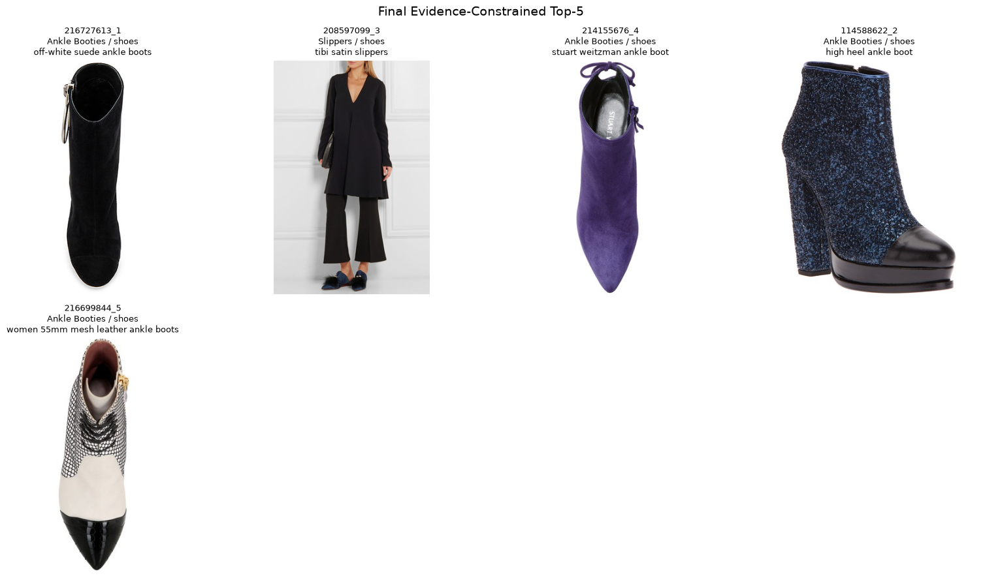

,item_ID,outfit_ID,item_position,category,broad_category,text
0,216727613_1,216727613,1,Ankle Booties,shoes,off-white suede ankle boots
1,208597099_3,208597099,3,Slippers,shoes,tibi satin slippers
2,214155676_4,214155676,4,Ankle Booties,shoes,stuart weitzman ankle boot
3,114588622_2,114588622,2,Ankle Booties,shoes,high heel ankle boot
4,216699844_5,216699844,5,Ankle Booties,shoes,women 55mm mesh leather ankle boots


In [51]:
# Cell 51: Rerank candidate pool and select final Top-K
# RUN EVERY SESSION AFTER STRONGER CANDIDATE EVIDENCE IS AVAILABLE

def rerank_candidate_pool_with_evidence(
    candidate_pool_with_evidence,
    alpha=0.65,
    beta=0.35,
    final_top_k=5,
):
    """
    Rerank a larger candidate pool using:
    final_score = alpha * normalized_clip_score + beta * normalized_evidence_score
    
    Returns full reranked pool and final Top-K.
    """
    reranked_pool = candidate_pool_with_evidence.copy()
    
    reranked_pool["clip_score_norm"] = min_max_normalize(
        reranked_pool["clip_multimodal_score"]
    )
    
    reranked_pool["evidence_score_norm"] = min_max_normalize(
        reranked_pool["evidence_score"]
    )
    
    reranked_pool["final_score"] = (
        alpha * reranked_pool["clip_score_norm"]
        + beta * reranked_pool["evidence_score_norm"]
    )
    
    reranked_pool = (
        reranked_pool
        .sort_values("final_score", ascending=False)
        .reset_index(drop=True)
    )
    
    reranked_pool["evidence_constrained_rank"] = np.arange(1, len(reranked_pool) + 1)
    
    final_recommendations = reranked_pool.head(final_top_k).copy()
    
    return reranked_pool, final_recommendations


reranked_pool_test, final_evidence_recommendations_test = rerank_candidate_pool_with_evidence(
    candidate_pool_with_evidence_test,
    alpha=0.65,
    beta=0.35,
    final_top_k=5,
)

print("Final evidence-constrained Top-5 from larger candidate pool:")
display(
    final_evidence_recommendations_test[
        [
            "evidence_constrained_rank",
            "clip_candidate_rank",
            "item_ID",
            "category",
            "text",
            "clip_multimodal_score",
            "evidence_score",
            "clip_score_norm",
            "evidence_score_norm",
            "final_score",
            "evidence_rule_ids",
        ]
    ]
)

print("\nItems that moved up the most after evidence reranking:")
movement_df = reranked_pool_test.copy()
movement_df["rank_change"] = movement_df["clip_candidate_rank"] - movement_df["evidence_constrained_rank"]

display(
    movement_df[
        [
            "evidence_constrained_rank",
            "clip_candidate_rank",
            "rank_change",
            "item_ID",
            "category",
            "text",
            "clip_multimodal_score",
            "evidence_score",
            "final_score",
            "evidence_rule_ids",
        ]
    ]
    .sort_values("rank_change", ascending=False)
    .head(10)
)

print("\nVisual final evidence-constrained recommendations:")
display_items_grid(
    final_evidence_recommendations_test.rename(columns={"final_score": "embedding_score"}),
    title="Final Evidence-Constrained Top-5",
    max_items=5,
    image_index_column="original_dataset_index",
)

In [52]:
# Cell 52: Connect notebook to local Ollama Llama model
# RUN EVERY SESSION BEFORE LLM EXPLANATION CELLS

import urllib.request
import urllib.error
import json
import time

OLLAMA_BASE_URL = "http://localhost:11434"
OLLAMA_MODEL_NAME = "llama3.2"  # Change to "llama3" if that is the model you have installed.


def ollama_generate(
    prompt,
    model_name=OLLAMA_MODEL_NAME,
    temperature=0.7,
    max_tokens=220,
):
    """
    Generate text using a local Ollama model.
    """
    url = f"{OLLAMA_BASE_URL}/api/generate"
    
    payload = {
        "model": model_name,
        "prompt": prompt,
        "stream": False,
        "options": {
            "temperature": temperature,
            "num_predict": max_tokens,
        },
    }
    
    request = urllib.request.Request(
        url,
        data=json.dumps(payload).encode("utf-8"),
        headers={"Content-Type": "application/json"},
        method="POST",
    )
    
    try:
        with urllib.request.urlopen(request, timeout=120) as response:
            response_data = json.loads(response.read().decode("utf-8"))
            return response_data.get("response", "").strip()
    
    except urllib.error.URLError as error:
        raise RuntimeError(
            "Could not connect to Ollama. Make sure Ollama is running.\n"
            "Try opening Ollama or running this in terminal:\n"
            "ollama serve\n\n"
            f"Original error: {error}"
        )


def check_ollama_connection():
    """
    Check whether Ollama is reachable and list installed models.
    """
    url = f"{OLLAMA_BASE_URL}/api/tags"
    
    try:
        with urllib.request.urlopen(url, timeout=20) as response:
            data = json.loads(response.read().decode("utf-8"))
        
        models = [model["name"] for model in data.get("models", [])]
        
        print("Ollama is running.")
        print("Installed models:")
        for model in models:
            print("-", model)
        
        if not any(OLLAMA_MODEL_NAME in model for model in models):
            print(
                f"\nWarning: {OLLAMA_MODEL_NAME} was not found in installed models.\n"
                f"If needed, run this in terminal:\n"
                f"ollama pull {OLLAMA_MODEL_NAME}"
            )
        
        return models
    
    except urllib.error.URLError as error:
        raise RuntimeError(
            "Ollama is not reachable.\n"
            "Open Ollama or run this in terminal:\n"
            "ollama serve"
        ) from error


installed_ollama_models = check_ollama_connection()

test_response = ollama_generate(
    prompt="Write one short sentence confirming that the local fashion explanation model is ready.",
    temperature=0.2,
    max_tokens=40,
)

print("\nTest response:")
print(test_response)

Ollama is running.
Installed models:
- mistral:latest
- gemma3:12b
- qwen3:8b
- qwen3-embedding:0.6b
- llama3.2:latest

Test response:
The local fashion explanation model is now online and available for use, providing insights into current trends and styles.


In [53]:
# Cell 53: Define three LLM explanation ablations
# RUN EVERY SESSION AFTER OLLAMA HELPER IS READY

def format_query_item_for_prompt(query_item_row):
    """
    Format query item metadata for LLM prompts.
    """
    if query_item_row is None:
        return "No query item metadata provided."
    
    return (
        f"Item ID: {query_item_row.get('item_ID', '')}\n"
        f"Category: {query_item_row.get('category', '')}\n"
        f"Broad/query category: {query_item_row.get('query_category', '')}\n"
        f"Description: {query_item_row.get('text', '')}"
    )


def format_candidate_for_prompt(candidate_row):
    """
    Format recommendation candidate metadata for LLM prompts.
    """
    return (
        f"Item ID: {candidate_row.get('item_ID', '')}\n"
        f"Category: {candidate_row.get('category', '')}\n"
        f"Broad category: {candidate_row.get('broad_category', '')}\n"
        f"Description: {candidate_row.get('text', '')}"
    )


def format_candidate_evidence_for_prompt(candidate_row, max_rules=3):
    """
    Format retrieved KB evidence rules for evidence-constrained explanations.
    """
    evidence_table = candidate_row.get("candidate_evidence_table", None)
    
    if evidence_table is None or len(evidence_table) == 0:
        return "No retrieved evidence available."
    
    evidence_lines = []
    
    for _, rule_row in evidence_table.head(max_rules).iterrows():
        evidence_lines.append(
            f"Rule ID: {rule_row['rule_id']}\n"
            f"Rule text: {rule_row['rule_text']}\n"
            f"Style tags: {rule_row.get('style_tags', '')}\n"
            f"Occasion tags: {rule_row.get('occasion_tags', '')}\n"
            f"Evidence keywords: {rule_row.get('evidence_keywords', '')}\n"
            f"Source: {rule_row['source_title']} — {rule_row['source_author_or_org']} "
            f"({rule_row['source_year']}), reliability: {rule_row['source_reliability']}"
        )
    
    return "\n\n".join(evidence_lines)


def build_recommendation_only_prompt(candidate_row):
    """
    Ablation 1:
    LLM sees only the recommended item.
    This intentionally allows unsupported, fluent explanation.
    """
    candidate_text = format_candidate_for_prompt(candidate_row)
    
    return f"""
You are a confident fashion stylist.

Explain why the following item is a good recommendation.

Recommended item:
{candidate_text}

Write 2 short, natural sentences.
Sound confident and stylish.
Do not mention missing information.
"""


def build_posthoc_prompt(query_item_row, candidate_row, user_text):
    """
    Ablation 2:
    LLM sees query item, user request, and recommended item, but no evidence.
    This is the post-hoc explanation baseline.
    """
    query_text = format_query_item_for_prompt(query_item_row)
    candidate_text = format_candidate_for_prompt(candidate_row)
    
    return f"""
You are a helpful fashion stylist.

Explain why the recommended item works with the query item and user request.

User request:
{user_text}

Query item:
{query_text}

Recommended item:
{candidate_text}

Write 2 short, smooth sentences.
Do not cite rules or sources.
Make it sound natural, like advice to a shopper.
"""


def build_evidence_constrained_prompt(query_item_row, candidate_row, user_text, max_rules=3):
    """
    Ablation 3:
    LLM sees query item, user request, recommendation, and retrieved evidence.
    This is the proposed evidence-constrained intrinsic explanation.
    """
    query_text = format_query_item_for_prompt(query_item_row)
    candidate_text = format_candidate_for_prompt(candidate_row)
    evidence_text = format_candidate_evidence_for_prompt(candidate_row, max_rules=max_rules)
    
    return f"""
You are a natural fashion stylist writing for a shopper.

Your explanation must be smooth and friendly, not academic.
However, it must be strictly grounded in the provided metadata and evidence.

Rules:
1. Use only the query item, user request, recommended item metadata, and retrieved evidence.
2. Do not invent unsupported colours, materials, brands, occasions, comfort claims, seasons, or body-shape claims.
3. Do not say the item is perfect, timeless, luxurious, comfortable, high-quality, or versatile unless this is supported by metadata or evidence.
4. Do not recommend a different item type. Explain the exact recommended item.
5. Do not start with “Based on the evidence” or “Based on rule”.
6. Do not repeat the word “recommend” many times.
7. Mention supporting rule IDs only once at the end of the explanation, for example: (R006, R003). Do not write “Rule R006” or “styling direction of R006”.
8. If the rule support is general rather than exact, say it gently, for example: “This fits the general styling direction...”
9. Write only 2 sentences.
10. The tone should sound like a stylish shopping assistant, not a research paper.
11. Do not mention “style tags”, “metadata”, “retrieved evidence”, or “rule text” in the shopper-facing explanation.

User request:
{user_text}

Query item:
{query_text}

Recommended item:
{candidate_text}

Retrieved evidence:
{evidence_text}

Write the final explanation now.
"""


def generate_three_explanation_ablations(
    query_item_row,
    candidate_row,
    user_text,
    model_name=OLLAMA_MODEL_NAME,
):
    """
    Generate the three explanation ablations for one recommendation.
    """
    recommendation_only_prompt = build_recommendation_only_prompt(candidate_row)
    posthoc_prompt = build_posthoc_prompt(query_item_row, candidate_row, user_text)
    evidence_constrained_prompt = build_evidence_constrained_prompt(
        query_item_row,
        candidate_row,
        user_text,
        max_rules=3,
    )
    
    explanations = {
        "recommendation_only_explanation": ollama_generate(
            recommendation_only_prompt,
            model_name=model_name,
            temperature=0.8,
            max_tokens=180,
        ),
        "posthoc_explanation": ollama_generate(
            posthoc_prompt,
            model_name=model_name,
            temperature=0.6,
            max_tokens=180,
        ),
        "evidence_constrained_explanation": ollama_generate(
            evidence_constrained_prompt,
            model_name=model_name,
            temperature=0.15,
            max_tokens=160,
        ),
    }
    
    return explanations


# Test on the first final evidence-constrained recommendation.
test_explanation_candidate = final_evidence_recommendations_test.iloc[0]
test_explanation_query_item = candidate_pool_test["query_item"]
test_explanation_user_text = "recommend smart casual shoes"

test_explanations = generate_three_explanation_ablations(
    query_item_row=test_explanation_query_item,
    candidate_row=test_explanation_candidate,
    user_text=test_explanation_user_text,
)

print("Recommendation-only explanation:")
print(test_explanations["recommendation_only_explanation"])

print("\nPost-hoc explanation:")
print(test_explanations["posthoc_explanation"])

print("\nEvidence-constrained explanation:")
print(test_explanations["evidence_constrained_explanation"])

Recommendation-only explanation:
I wholeheartedly recommend these stunning off-white suede ankle boots - their sleek design and luxurious suede finish will instantly elevate any outfit. Pair them with distressed denim and a fitted tee for a chic, effortless look that's perfect for casual nights out or everyday wear.

Post-hoc explanation:
The tibi knit long sleeve dress is a great base piece for smart casual outfits, so I'd recommend pairing it with the off-white suede ankle boots to add a polished touch. The boots will elevate the dress's cozy vibe and give you a stylish, put-together look that's perfect for everyday wear or a night out with friends.

Evidence-constrained explanation:
For a smart casual look with your tibi knit long sleeve dress, I'd suggest pairing it with off-white suede ankle boots. This combination fits the general styling direction of relaxed yet considered outfits, perfect for summer daytime wear.

(R006, R009)


In [54]:
# Cell 54: Generate explanation ablations for final recommendations
# RUN WHEN YOU WANT TO PRODUCE FINAL EXPLANATION OUTPUTS

def generate_explanations_for_recommendations(
    final_recommendations_df,
    query_item_row,
    user_text,
    max_items=5,
    model_name=OLLAMA_MODEL_NAME,
):
    """
    Generate three explanation ablations for each final recommendation.
    """
    explanation_rows = []
    
    recommendations_to_explain = final_recommendations_df.head(max_items).copy()
    
    for _, candidate_row in tqdm(
        recommendations_to_explain.iterrows(),
        total=len(recommendations_to_explain),
        desc="Generating LLM explanations"
    ):
        explanations = generate_three_explanation_ablations(
            query_item_row=query_item_row,
            candidate_row=candidate_row,
            user_text=user_text,
            model_name=model_name,
        )
        
        explanation_rows.append({
            "evidence_constrained_rank": candidate_row.get("evidence_constrained_rank", ""),
            "clip_candidate_rank": candidate_row.get("clip_candidate_rank", ""),
            "item_ID": candidate_row.get("item_ID", ""),
            "category": candidate_row.get("category", ""),
            "text": candidate_row.get("text", ""),
            "clip_multimodal_score": candidate_row.get("clip_multimodal_score", ""),
            "evidence_score": candidate_row.get("evidence_score", ""),
            "final_score": candidate_row.get("final_score", ""),
            "evidence_rule_ids": candidate_row.get("evidence_rule_ids", ""),
            "recommendation_only_explanation": explanations["recommendation_only_explanation"],
            "posthoc_explanation": explanations["posthoc_explanation"],
            "evidence_constrained_explanation": explanations["evidence_constrained_explanation"],
        })
    
    return pd.DataFrame(explanation_rows)


explanation_ablation_df = generate_explanations_for_recommendations(
    final_recommendations_df=final_evidence_recommendations_test,
    query_item_row=candidate_pool_test["query_item"],
    user_text="recommend smart casual shoes",
    max_items=5,
    model_name=OLLAMA_MODEL_NAME,
)

print("Explanation ablation output:")
display(
    explanation_ablation_df[
        [
            "evidence_constrained_rank",
            "item_ID",
            "category",
            "text",
            "evidence_rule_ids",
            "recommendation_only_explanation",
            "posthoc_explanation",
            "evidence_constrained_explanation",
        ]
    ]
)

explanation_output_path = RESULTS_DIR / "explanation_ablation_test.csv"
explanation_ablation_df.to_csv(explanation_output_path, index=False)

print("\nSaved explanation ablation results:")
print(explanation_output_path.relative_to(PROJECT_ROOT))

Generating LLM explanations:   0%|          | 0/5 [00:00<?, ?it/s]

Explanation ablation output:


,evidence_constrained_rank,item_ID,category,text,evidence_rule_ids,recommendation_only_explanation,posthoc_explanation,evidence_constrained_explanation
0,1,216727613_1,Ankle Booties,off-white suede ankle boots,"R009, R006, R008, R004, R010",These sleek off-white suede ankle boots are a game-changer for any fashion-forward individual. They add an effortles...,I'd recommend the off-white suede ankle boots with your tibi knit long sleeve dress because they add a sleek and pol...,"For a smart casual look with your tibi knit long sleeve dress, I'd suggest pairing it with off-white suede ankle boo..."
1,2,208597099_3,Slippers,tibi satin slippers,"R006, R008, R009, R041, R007",The Tibi satin slippers are an absolute must-have for any fashion-conscious individual - their luxurious fabric and ...,"I think the recommended tibi satin slippers would pair beautifully with the tibi knit long sleeve dress - the soft, ...","For a smart casual look, I'd suggest pairing the tibi knit long sleeve dress with refined flip-flops. This fits the ..."
2,3,214155676_4,Ankle Booties,stuart weitzman ankle boot,"R008, R009, R006, R003, R010",I highly recommend the Stuart Weitzman ankle bootie because it exudes effortless chic with its sleek design and comf...,"The Stuart Weitzman ankle boot is a great match for the tibi knit long sleeve dress because its sleek, low-profile d...","For a smart casual look, I'd suggest pairing the tibi knit long sleeve dress with stuart weitzman ankle booties. Thi..."
3,4,114588622_2,Ankle Booties,high heel ankle boot,"R006, R008, R009, R010, R007","The high heel ankle bootie is a fabulous addition to any shoe wardrobe, elevating even the most basic outfit with it...","For a smart casual look that pairs well with the tibi knit long sleeve dress, I recommend the high heel ankle bootie...","For a smart casual look, I'd suggest pairing your tibi knit long sleeve dress with ankle booties. This combination w..."
4,5,216699844_5,Ankle Booties,women 55mm mesh leather ankle boots,"R006, R008, R009, R010, R004","This stunning 55mm mesh leather ankle bootie is a must-have for any fashion-forward woman, exuding effortless chic w...","For a smart casual look that complements the tibi knit long sleeve dress, I recommend pairing it with the women 55mm...","For a smart casual look, I'd suggest pairing the tibi knit long sleeve dress with the women's 55mm mesh leather ankl..."



Saved explanation ablation results:
outputs\results\explanation_ablation_test.csv


In [55]:
# Cell 55: Build CLIP modality ablation indexes
# RUN EVERY SESSION AFTER CLIP IMAGE, TEXT, AND FUSED EMBEDDINGS ARE AVAILABLE

def build_category_indexes_from_embeddings(embedding_matrix, metadata_df, category_column="broad_category"):
    """
    Build one FAISS cosine-similarity index per broad category for a given embedding matrix.
    """
    indexes = {}
    row_lookup = {}
    embedding_dim = embedding_matrix.shape[1]
    
    for broad_category in target_broad_categories:
        category_rows = metadata_df.index[
            metadata_df[category_column] == broad_category
        ].to_numpy()
        
        category_embeddings = embedding_matrix[category_rows].astype("float32")
        
        index = faiss.IndexFlatIP(embedding_dim)
        index.add(category_embeddings)
        
        indexes[broad_category] = index
        row_lookup[broad_category] = category_rows
    
    return indexes, row_lookup


clip_image_category_indexes, clip_image_category_row_lookup = build_category_indexes_from_embeddings(
    target_clip_image_embeddings,
    target_items_for_clip,
)

clip_text_category_indexes, clip_text_category_row_lookup = build_category_indexes_from_embeddings(
    target_clip_text_embeddings,
    target_items_for_clip,
)

clip_fused_category_indexes, clip_fused_category_row_lookup = build_category_indexes_from_embeddings(
    target_clip_fused_embeddings,
    target_items_for_clip,
)

print("Built CLIP modality ablation indexes:")
for broad_category in target_broad_categories:
    print(
        f"{broad_category:12s} | "
        f"image: {clip_image_category_indexes[broad_category].ntotal:6d} | "
        f"text: {clip_text_category_indexes[broad_category].ntotal:6d} | "
        f"fused: {clip_fused_category_indexes[broad_category].ntotal:6d}"
    )

Built CLIP modality ablation indexes:
tops         | image:  10915 | text:  10915 | fused:  10915
bottoms      | image:   9247 | text:   9247 | fused:   9247
shoes        | image:  12635 | text:  12635 | fused:  12635
outerwear    | image:   5161 | text:   5161 | fused:   5161
accessories  | image:  29566 | text:  29566 | fused:  29566


In [56]:
# Cell 56: Modality ablation for CLIP retrieval
# RUN WHEN ANALYZING WHY RECOMMENDATIONS WERE RETRIEVED

def retrieve_from_given_clip_index(
    query_embedding,
    indexes,
    row_lookup,
    target_category="shoes",
    top_k=5,
    query_item_row=None,
    score_column_name="score",
    exclude_same_outfit=True,
):
    """
    Retrieve recommendations from a provided CLIP index.
    """
    search_k = min(top_k * 20, indexes[target_category].ntotal)
    
    scores, local_indices = indexes[target_category].search(
        query_embedding.astype("float32"),
        search_k,
    )
    
    global_rows = row_lookup[target_category][local_indices[0]]
    
    results = target_items_for_clip.iloc[global_rows].copy()
    results[score_column_name] = scores[0]
    
    if query_item_row is not None:
        results = results[results["item_ID"] != query_item_row["item_ID"]]
        
        if exclude_same_outfit:
            results = results[results["outfit_ID"] != query_item_row["outfit_ID"]]
    
    return results.head(top_k).reset_index(drop=True)


def run_clip_modality_ablation(
    query_item_id,
    user_text,
    target_category="shoes",
    top_k=5,
):
    """
    Compare image-only, text-only, and fused CLIP retrieval for the same query.
    """
    query_item_row = get_query_item_by_id(query_item_id)
    
    query_text = build_clip_query_text(
        query_item_row=query_item_row,
        user_text=user_text,
        target_category=target_category,
    )
    
    image_query_embedding = encode_clip_image_query_from_row(query_item_row)
    text_query_embedding = encode_clip_text_query(query_text)
    
    fused_query_embedding = (
        0.6 * image_query_embedding
        + 0.4 * text_query_embedding
    )
    
    fused_query_embedding = fused_query_embedding / np.linalg.norm(
        fused_query_embedding,
        axis=1,
        keepdims=True,
    )
    
    image_results = retrieve_from_given_clip_index(
        image_query_embedding,
        clip_image_category_indexes,
        clip_image_category_row_lookup,
        target_category=target_category,
        top_k=top_k,
        query_item_row=query_item_row,
        score_column_name="image_only_score",
    )
    
    text_results = retrieve_from_given_clip_index(
        text_query_embedding,
        clip_text_category_indexes,
        clip_text_category_row_lookup,
        target_category=target_category,
        top_k=top_k,
        query_item_row=query_item_row,
        score_column_name="clip_text_only_score",
    )
    
    fused_results = retrieve_from_given_clip_index(
        fused_query_embedding,
        clip_fused_category_indexes,
        clip_fused_category_row_lookup,
        target_category=target_category,
        top_k=top_k,
        query_item_row=query_item_row,
        score_column_name="clip_fused_score",
    )
    
    return {
        "query_text": query_text,
        "query_item": query_item_row,
        "image_only": image_results,
        "text_only": text_results,
        "fused": fused_results,
    }


modality_ablation_test = run_clip_modality_ablation(
    query_item_id="100002074_1",
    user_text="recommend smart casual shoes",
    target_category="shoes",
    top_k=5,
)

print("Query text:")
print(modality_ablation_test["query_text"])

print("\nImage-only CLIP recommendations:")
display(
    modality_ablation_test["image_only"][
        ["item_ID", "category", "text", "image_only_score"]
    ]
)

print("\nText-only CLIP recommendations:")
display(
    modality_ablation_test["text_only"][
        ["item_ID", "category", "text", "clip_text_only_score"]
    ]
)

print("\nFused CLIP recommendations:")
display(
    modality_ablation_test["fused"][
        ["item_ID", "category", "text", "clip_fused_score"]
    ]
)

Query text:
Fashion item: Day Dresses | Description: tibi knit long sleeve dress | Input group: dresses | Request: recommend smart casual shoes | Recommend: shoes

Image-only CLIP recommendations:


,item_ID,category,text,image_only_score
0,114588622_2,Ankle Booties,high heel ankle boot,0.874131
1,212865694_2,Over-The-Knee Boots,steve madden black suede boot,0.871462
2,208597099_3,Slippers,tibi satin slippers,0.867490
3,215776763_2,Over-The-Knee Boots,saint laurent suede bb thigh high boots,0.862848
4,215760937_2,Over-The-Knee Boots,aquazzura corset lace-up suede over-the-knee boots,0.860359



Text-only CLIP recommendations:


,item_ID,category,text,clip_text_only_score
0,101981841_7,Pumps,stylish women's pumps solid color hollow design,0.722513
1,154583395_3,Shoes,shop fashion women's high heels shoes free,0.722177
2,176297123_2,Pumps,fashion platform high heel design women's pumps,0.720682
3,111744682_7,Shoes,new high heels buckle elegant fashion dress shoes,0.718430
4,207552622_2,Shoes,stylish peep toe tie design pumps women,0.717269



Fused CLIP recommendations:


,item_ID,category,text,clip_fused_score
0,208597099_3,Slippers,tibi satin slippers,0.809318
1,216727613_1,Ankle Booties,off-white suede ankle boots,0.799879
2,114588622_2,Ankle Booties,high heel ankle boot,0.793405
3,216699844_5,Ankle Booties,women 55mm mesh leather ankle boots,0.790380
4,214155676_4,Ankle Booties,stuart weitzman ankle boot,0.789004


In [57]:
# Cell 57: Final score decomposition for evidence-constrained ranking
# RUN AFTER FINAL EVIDENCE-CONSTRAINED RECOMMENDATIONS ARE AVAILABLE

def explain_score_decomposition(
    reranked_df,
    alpha=0.65,
    beta=0.35,
    top_k=5,
):
    """
    Show how the final evidence-constrained score is built from:
    - normalized CLIP multimodal similarity
    - normalized KB evidence support
    """
    explanation_df = reranked_df.head(top_k).copy()
    
    explanation_df["clip_contribution"] = alpha * explanation_df["clip_score_norm"]
    explanation_df["evidence_contribution"] = beta * explanation_df["evidence_score_norm"]
    
    explanation_df["contribution_check"] = (
        explanation_df["clip_contribution"]
        + explanation_df["evidence_contribution"]
    )
    
    columns_to_show = [
        "evidence_constrained_rank",
        "clip_candidate_rank",
        "item_ID",
        "category",
        "text",
        "clip_multimodal_score",
        "evidence_score",
        "clip_score_norm",
        "evidence_score_norm",
        "clip_contribution",
        "evidence_contribution",
        "final_score",
        "contribution_check",
        "evidence_rule_ids",
    ]
    
    return explanation_df[columns_to_show]


score_decomposition_test = explain_score_decomposition(
    final_evidence_recommendations_test,
    alpha=0.65,
    beta=0.35,
    top_k=5,
)

print("Final score decomposition:")
display(score_decomposition_test)

print("Interpretation:")
print(
    "The final score is transparent: "
    "final_score = 0.65 × normalized CLIP similarity "
    "+ 0.35 × normalized KB evidence support."
)

Final score decomposition:


,evidence_constrained_rank,clip_candidate_rank,item_ID,category,text,clip_multimodal_score,evidence_score,clip_score_norm,evidence_score_norm,clip_contribution,evidence_contribution,final_score,contribution_check,evidence_rule_ids
0,1,2,216727613_1,Ankle Booties,off-white suede ankle boots,0.799879,0.704197,0.758834,0.926794,0.493242,0.324378,0.817620,0.817620,"R009, R006, R008, R004, R010"
1,2,1,208597099_3,Slippers,tibi satin slippers,0.809318,0.668298,1.000000,0.139685,0.650000,0.048890,0.698890,0.698890,"R006, R008, R009, R041, R007"
2,3,5,214155676_4,Ankle Booties,stuart weitzman ankle boot,0.789004,0.707536,0.480956,1.000000,0.312621,0.350000,0.662621,0.662621,"R008, R009, R006, R003, R010"
3,4,3,114588622_2,Ankle Booties,high heel ankle boot,0.793405,0.692655,0.593417,0.673730,0.385721,0.235805,0.621527,0.621527,"R006, R008, R009, R010, R007"
4,5,4,216699844_5,Ankle Booties,women 55mm mesh leather ankle boots,0.790380,0.697818,0.516109,0.786918,0.335471,0.275421,0.610892,0.610892,"R006, R008, R009, R010, R004"


Interpretation:
The final score is transparent: final_score = 0.65 × normalized CLIP similarity + 0.35 × normalized KB evidence support.


Loading Florence-2 model: microsoft/Florence-2-base-ft
Device: cuda
Torch dtype: torch.float16
Florence-2 loaded successfully.

Test item:


,item_ID,category,query_category,text
0,100002074_1,Day Dresses,dresses,tibi knit long sleeve dress



Florence-2 caption:
The image is of a black long sleeved dress. It has a scoop neckline with a zipper at the top. The dress is made of a shiny black material and has a metallic silver color on the top that looks like a fish eye pattern. The sleeves of the dress are also black and the neckline is also black.


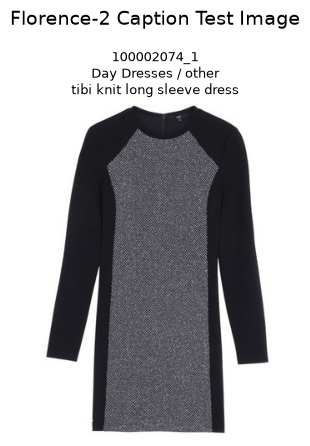

,item_ID,outfit_ID,item_position,category,broad_category,query_category,text
0,100002074_1,100002074,1,Day Dresses,other,dresses,tibi knit long sleeve dress


In [58]:
# Cell 58: Load Florence-2 image captioning model
# RUN EVERY SESSION BEFORE IMAGE CAPTIONING / VISUAL ATTRIBUTE CELLS

import torch
from transformers import AutoProcessor, AutoModelForCausalLM, AutoConfig

FLORENCE_MODEL_NAME = "microsoft/Florence-2-base-ft"

florence_device = "cuda" if torch.cuda.is_available() else "cpu"
florence_dtype = torch.float16 if florence_device == "cuda" else torch.float32

print("Loading Florence-2 model:", FLORENCE_MODEL_NAME)
print("Device:", florence_device)
print("Torch dtype:", florence_dtype)

# Florence-2 sometimes breaks with newer Transformers versions because
# Florence2LanguageConfig may not expose forced_bos_token_id.
# We patch the config before model loading.
florence_config = AutoConfig.from_pretrained(
    FLORENCE_MODEL_NAME,
    trust_remote_code=True
)

if hasattr(florence_config, "text_config"):
    if not hasattr(florence_config.text_config, "forced_bos_token_id"):
        florence_config.text_config.forced_bos_token_id = None

if not hasattr(florence_config, "forced_bos_token_id"):
    florence_config.forced_bos_token_id = None

florence_processor = AutoProcessor.from_pretrained(
    FLORENCE_MODEL_NAME,
    trust_remote_code=True
)

florence_model = AutoModelForCausalLM.from_pretrained(
    FLORENCE_MODEL_NAME,
    config=florence_config,
    trust_remote_code=True,
    torch_dtype=florence_dtype
).to(florence_device)

# Extra safety patch after loading.
if hasattr(florence_model.config, "text_config"):
    if not hasattr(florence_model.config.text_config, "forced_bos_token_id"):
        florence_model.config.text_config.forced_bos_token_id = None

if not hasattr(florence_model.config, "forced_bos_token_id"):
    florence_model.config.forced_bos_token_id = None

if hasattr(florence_model, "generation_config"):
    if not hasattr(florence_model.generation_config, "forced_bos_token_id"):
        florence_model.generation_config.forced_bos_token_id = None

florence_model.eval()

print("Florence-2 loaded successfully.")


def run_florence_caption(image, task_prompt="<MORE_DETAILED_CAPTION>", max_new_tokens=80):
    """
    Generate a caption or visual description for one image using Florence-2.
    
    Useful task prompts:
    - <CAPTION>
    - <DETAILED_CAPTION>
    - <MORE_DETAILED_CAPTION>
    """
    image = image.convert("RGB")
    
    inputs = florence_processor(
        text=task_prompt,
        images=image,
        return_tensors="pt"
    )
    
    inputs = {
        key: value.to(florence_device)
        for key, value in inputs.items()
    }
    
    if "pixel_values" in inputs:
        inputs["pixel_values"] = inputs["pixel_values"].to(florence_dtype)
    
    with torch.inference_mode():
        generated_ids = florence_model.generate(
            input_ids=inputs["input_ids"],
            pixel_values=inputs["pixel_values"],
            max_new_tokens=max_new_tokens,
            num_beams=3,
            do_sample=False,
        )
    
    generated_text = florence_processor.batch_decode(
        generated_ids,
        skip_special_tokens=False
    )[0]
    
    parsed_output = florence_processor.post_process_generation(
        generated_text,
        task=task_prompt,
        image_size=(image.width, image.height)
    )
    
    if isinstance(parsed_output, dict):
        return parsed_output.get(task_prompt, generated_text)
    
    return generated_text


# Test Florence-2 on the same dress query item we have been using.
florence_test_item = get_query_item_by_id("100002074_1")
florence_test_image = main_split[int(florence_test_item["original_dataset_index"])]["image"]

florence_test_caption = run_florence_caption(
    florence_test_image,
    task_prompt="<MORE_DETAILED_CAPTION>",
    max_new_tokens=80
)

print("\nTest item:")
display(
    pd.DataFrame([florence_test_item])[
        ["item_ID", "category", "query_category", "text"]
    ]
)

print("\nFlorence-2 caption:")
print(florence_test_caption)

display_items_grid(
    pd.DataFrame([florence_test_item]),
    title="Florence-2 Caption Test Image",
    max_items=1,
    image_index_column="original_dataset_index"
)

In [59]:
# Cell 59: Generate and clean visual captions for query and recommendations
# RUN AFTER FLORENCE-2 IS LOADED AND FINAL RECOMMENDATIONS ARE AVAILABLE

import re

def clean_visual_caption_for_llm(raw_caption):
    """
    Clean Florence captions before passing them to the explanation LLM.

    Goal:
    - keep factual visual attributes
    - remove uncertain/speculative phrases
    - remove styling opinions
    - avoid giving the final LLM noisy visual claims
    """
    if raw_caption is None:
        return ""
    
    caption = str(raw_caption).strip()
    
    # Basic cleanup
    caption = caption.replace("\n", " ")
    caption = re.sub(r"\s+", " ", caption)
    
    # Remove common image-caption framing phrases.
    caption = re.sub(r"^the image is of\s+", "", caption, flags=re.IGNORECASE)
    caption = re.sub(r"^this image shows\s+", "", caption, flags=re.IGNORECASE)
    caption = re.sub(r"^there is\s+", "", caption, flags=re.IGNORECASE)
    
    # Split into sentence-like chunks.
    sentences = re.split(r"(?<=[.!?])\s+", caption)
    
    banned_phrases = [
        "perfect",
        "beautiful",
        "stylish",
        "fashionable",
        "elegant",
        "luxurious",
        "comfortable",
        "high quality",
        "must-have",
        "ideal for",
        "great for",
        "suitable for",
        "looks like",
        "appears to be",
        "probably",
        "maybe",
        "background",
        "white background",
        "plain background",
    ]
    
    kept_sentences = []
    
    for sentence in sentences:
        sentence_clean = sentence.strip()
        
        if not sentence_clean:
            continue
        
        sentence_lower = sentence_clean.lower()
        
        # Remove subjective/speculative sentences.
        if any(phrase in sentence_lower for phrase in banned_phrases):
            continue
        
        kept_sentences.append(sentence_clean)
    
    cleaned_caption = " ".join(kept_sentences)
    
    # If filtering removed too much, fall back to a short safer version.
    if not cleaned_caption:
        cleaned_caption = caption
    
    # Limit length for LLM prompt stability.
    cleaned_caption = cleaned_caption[:350].strip()
    
    return cleaned_caption


def caption_item_row_with_florence(item_row, task_prompt="<MORE_DETAILED_CAPTION>"):
    """
    Generate raw and cleaned Florence caption for one item row.
    """
    dataset_index = int(item_row["original_dataset_index"])
    image = main_split[dataset_index]["image"].convert("RGB")
    
    raw_caption = run_florence_caption(
        image,
        task_prompt=task_prompt,
        max_new_tokens=80,
    )
    
    cleaned_caption = clean_visual_caption_for_llm(raw_caption)
    
    return {
        "raw_florence_caption": raw_caption,
        "visual_context_for_llm": cleaned_caption,
    }


def add_visual_captions_to_recommendation_set(
    query_item_row,
    recommendations_df,
    task_prompt="<MORE_DETAILED_CAPTION>",
):
    """
    Caption the query item and each final recommendation.
    """
    query_caption_data = caption_item_row_with_florence(
        query_item_row,
        task_prompt=task_prompt,
    )
    
    recommendations_with_captions = recommendations_df.copy()
    
    raw_captions = []
    cleaned_captions = []
    
    for _, candidate_row in tqdm(
        recommendations_with_captions.iterrows(),
        total=len(recommendations_with_captions),
        desc="Captioning final recommendations"
    ):
        caption_data = caption_item_row_with_florence(
            candidate_row,
            task_prompt=task_prompt,
        )
        
        raw_captions.append(caption_data["raw_florence_caption"])
        cleaned_captions.append(caption_data["visual_context_for_llm"])
    
    recommendations_with_captions["raw_florence_caption"] = raw_captions
    recommendations_with_captions["visual_context_for_llm"] = cleaned_captions
    
    return query_caption_data, recommendations_with_captions


query_visual_caption_test, final_recommendations_with_captions_test = add_visual_captions_to_recommendation_set(
    query_item_row=candidate_pool_test["query_item"],
    recommendations_df=final_evidence_recommendations_test,
    task_prompt="<MORE_DETAILED_CAPTION>",
)

print("Query item raw Florence caption:")
print(query_visual_caption_test["raw_florence_caption"])

print("\nQuery item cleaned visual context for LLM:")
print(query_visual_caption_test["visual_context_for_llm"])

print("\nFinal recommendations with captions:")
display(
    final_recommendations_with_captions_test[
        [
            "evidence_constrained_rank",
            "item_ID",
            "category",
            "text",
            "raw_florence_caption",
            "visual_context_for_llm",
            "evidence_rule_ids",
        ]
    ]
)

# Save only safe text/number columns, not raw image bytes.
columns_to_drop_before_csv = [
    "image",
]

caption_output_safe_df = final_recommendations_with_captions_test.drop(
    columns=[col for col in columns_to_drop_before_csv if col in final_recommendations_with_captions_test.columns],
    errors="ignore",
)

caption_output_path = RESULTS_DIR / "final_recommendations_with_visual_captions.csv"
caption_output_safe_df.to_csv(caption_output_path, index=False)

print("\nSaved visual caption output:")
print(caption_output_path.relative_to(PROJECT_ROOT))

Captioning final recommendations:   0%|          | 0/5 [00:00<?, ?it/s]

Query item raw Florence caption:
The image is of a black long sleeved dress. It has a scoop neckline with a zipper at the top. The dress is made of a shiny black material and has a metallic silver color on the top that looks like a fish eye pattern. The sleeves of the dress are also black and the neckline is also black.

Query item cleaned visual context for LLM:
a black long sleeved dress. It has a scoop neckline with a zipper at the top. The sleeves of the dress are also black and the neckline is also black.

Final recommendations with captions:


,evidence_constrained_rank,item_ID,category,text,raw_florence_caption,visual_context_for_llm,evidence_rule_ids
0,1,216727613_1,Ankle Booties,off-white suede ankle boots,The image is of a black boot. The boot has a zipper on the side. The zipper is silver. The boots are made of a soft ...,a black boot. The boot has a zipper on the side. The zipper is silver. The boots are made of a soft black material.,"R009, R006, R008, R004, R010"
1,2,208597099_3,Slippers,tibi satin slippers,A woman is standing in front of a white wall. She is wearing a long black dress with a V-neck. The woman is also car...,A woman is standing in front of a white wall. She is wearing a long black dress with a V-neck. The woman is also car...,"R006, R008, R009, R041, R007"
2,3,214155676_4,Ankle Booties,stuart weitzman ankle boot,"The image is of a purple shoe. The shoe has a pointed toe and is made of a soft, plush material. The laces of the sh...","a purple shoe. The shoe has a pointed toe and is made of a soft, plush material. The laces of the shoe are a deep pu...","R008, R009, R006, R003, R010"
3,4,114588622_2,Ankle Booties,high heel ankle boot,The image is of a bootie. The bootie is black and shiny. It has a high heel. The color of the bootie appears to be b...,a bootie. The bootie is black and shiny. It has a high heel. The shoe is made of a shiny material.,"R006, R008, R009, R010, R007"
4,5,216699844_5,Ankle Booties,women 55mm mesh leather ankle boots,This is a picture of a shoe. The shoe is black and white. The top of the shoe is brown. There is a gold zipper on th...,This is a picture of a shoe. The shoe is black and white. The top of the shoe is brown. There is a gold zipper on th...,"R006, R008, R009, R010, R004"



Saved visual caption output:
outputs\results\final_recommendations_with_visual_captions.csv


In [60]:
# Cell 60: Final controlled explanation generation
# RUN AFTER FINAL RECOMMENDATIONS HAVE FLORENCE VISUAL CAPTIONS

import re


def get_top_rule_ids_from_candidate(candidate_row, max_rule_ids=2):
    """
    Extract the real supporting rule IDs from the candidate row.
    
    Important:
    The LLM should not invent rule IDs. We append the true rule IDs programmatically.
    """
    evidence_rule_ids = candidate_row.get("evidence_rule_ids", "")
    
    if evidence_rule_ids is None:
        return []
    
    if isinstance(evidence_rule_ids, list):
        rule_ids = evidence_rule_ids
    else:
        rule_ids = [
            rule_id.strip()
            for rule_id in str(evidence_rule_ids).split(",")
            if rule_id.strip()
        ]
    
    return rule_ids[:max_rule_ids]


def compress_evidence_for_prompt(candidate_row, max_rules=2):
    """
    Compress retrieved KB evidence into safe, non-misleading summaries.

    Purpose:
    - avoid copying unrelated item examples from raw rules
    - keep only essential styling logic
    - keep rule IDs internally available
    """
    evidence_table = candidate_row.get("candidate_evidence_table", None)
    
    if evidence_table is None:
        return "No supporting rules available."
    
    if not isinstance(evidence_table, pd.DataFrame):
        return "No supporting rules available."
    
    if evidence_table.empty:
        return "No supporting rules available."
    
    evidence_rows = evidence_table.head(max_rules).copy()
    compressed_lines = []
    
    for _, rule in evidence_rows.iterrows():
        rule_id = rule.get("rule_id", "")
        recommended_category = rule.get("recommended_category", "")
        style_tags = rule.get("style_tags", "")
        occasion_tags = rule.get("occasion_tags", "")
        formality_level = rule.get("formality_level", "")
        source_reliability = rule.get("source_reliability", "")
        
        compressed_line = (
            f"{rule_id}: supports {recommended_category} recommendations; "
            f"general styling logic: {style_tags}; "
            f"context: {occasion_tags}; "
            f"formality: {formality_level}; "
            f"source reliability: {source_reliability}."
        )
        
        compressed_lines.append(compressed_line)
    
    return "\n".join(compressed_lines)


def clean_generated_explanation_text(explanation_text):
    """
    Clean LLM explanation output before appending true rule IDs.

    This removes common unwanted wording:
    - retailer-style language such as "our"
    - item ID mentions
    - model-generated rule citations
    - excessive whitespace
    """
    if explanation_text is None:
        return ""
    
    text = str(explanation_text).strip()
    
    # Remove generated rule ID citations, because we append true rule IDs ourselves.
    text = re.sub(r"\(\s*R\d+(?:\s*,\s*R\d+)*\s*\)", "", text)
    
    # Remove phrases where the model speaks as the retailer.
    text = re.sub(r"\bour recommended\b", "the recommended", text, flags=re.IGNORECASE)
    text = re.sub(r"\bour\b", "the", text, flags=re.IGNORECASE)
    text = re.sub(r"\bwe recommend\b", "I would suggest", text, flags=re.IGNORECASE)
    
    # Remove item ID mentions.
    text = re.sub(r"\(Item ID:\s*[^)]+\)", "", text, flags=re.IGNORECASE)
    text = re.sub(r"Item ID:\s*\S+", "", text, flags=re.IGNORECASE)
    
    # Remove unsupported/overused words if they appear.
    banned_replacements = {
        "perfect": "suitable",
        "timeless": "classic",
        "luxurious": "refined",
        "must-have": "useful",
        "breathtaking": "polished",
        "fashionista": "shopper",
    }
    
    for banned_word, replacement in banned_replacements.items():
        text = re.sub(
            rf"\b{re.escape(banned_word)}\b",
            replacement,
            text,
            flags=re.IGNORECASE,
        )
    
    # Normalize whitespace.
    text = text.replace("\n", " ")
    text = re.sub(r"\s+", " ", text).strip()
    
    # Remove dangling spaces before punctuation.
    text = re.sub(r"\s+([,.!?])", r"\1", text)
    
    return text


def enforce_true_rule_citations(explanation_text, candidate_row, max_rule_ids=2):
    """
    Append true supporting rule IDs from the reranking/evidence step.

    This prevents the LLM from hallucinating rule IDs.
    """
    cleaned_text = clean_generated_explanation_text(explanation_text)
    true_rule_ids = get_top_rule_ids_from_candidate(
        candidate_row,
        max_rule_ids=max_rule_ids,
    )
    
    if true_rule_ids:
        citation_text = "(" + ", ".join(true_rule_ids) + ")"
        return f"{cleaned_text}\n\n{citation_text}"
    
    return cleaned_text


def build_controlled_visual_evidence_prompt(
    query_item_row,
    query_visual_caption,
    candidate_row,
    user_text,
    max_rules=2,
    use_query_caption=True,
    use_candidate_caption=False,
    sentence_count=2,
):
    """
    Build the final controlled explanation prompt.

    Caption flags:
    - query caption is ON by default because it helps describe the user's selected item
    - candidate caption is OFF by default because candidate captions can be noisy
    """
    query_metadata = format_query_item_for_prompt(query_item_row)
    candidate_metadata = format_candidate_for_prompt(candidate_row)
    
    query_visual_block = ""
    if use_query_caption and query_visual_caption:
        query_visual_block = (
            f"\nQuery image visual context: {query_visual_caption}"
        )
    
    candidate_visual_block = ""
    if use_candidate_caption:
        candidate_visual_context = candidate_row.get("visual_context_for_llm", "")
        if candidate_visual_context:
            candidate_visual_block = (
                f"\nRecommended item visual context: {candidate_visual_context}"
            )
    
    compressed_evidence = compress_evidence_for_prompt(
        candidate_row=candidate_row,
        max_rules=max_rules,
    )
    
    return f"""
You are a natural fashion stylist writing for a shopper.

Write a short explanation for why the selected recommended item works with the query item and the user request.

Use only:
- the user request
- query item metadata
- optional query image visual context
- selected recommended item metadata
- optional selected recommended item visual context
- compressed supporting fashion evidence

Critical rules:
1. Explain only the selected recommended item. Do not suggest alternatives.
2. Do not say “our”, “we recommend our”, or speak as if you are the retailer or brand.
3. Do not mention item IDs.
4. Do not write rule IDs or citations. The system will add rule IDs after your answer.
5. Do not copy item examples from the evidence. Use the evidence only for general styling logic.
6. Item metadata is more reliable than machine-generated visual context. If they conflict, follow the metadata.
7. Use visual context only for simple visible attributes such as garment type, colour, silhouette, pattern, or texture.
8. Do not mention visual details if they conflict with item metadata.
9. Styling justification must come from the compressed supporting evidence, not from the image caption alone.
10. Prioritise the user request over evidence occasion tags.
11. If the user asks for smart casual, use “smart casual” as the main styling context.
12. Do not mention travel, cocktail, evening, summer, daytime, or everyday unless the user request or item metadata directly supports it.
13. Do not invent unsupported colours, materials, occasions, seasons, comfort claims, quality claims, body-shape claims, or brand claims.
14. Do not use words like perfect, timeless, luxurious, must-have, high-quality, comfortable, breathtaking, or fashionista.
15. Do not mention “metadata”, “caption”, “retrieved evidence”, “compressed evidence”, “style tags”, or “rule text” to the shopper.
16. Do not start with “Based on the evidence” or “Based on rule”.
17. Write exactly {sentence_count} short sentence(s).
18. Keep the tone natural, direct, and shopper-friendly.

User request:
{user_text}

Query item:
{query_metadata}
{query_visual_block}

Selected recommended item:
{candidate_metadata}
{candidate_visual_block}

Compressed supporting fashion evidence:
{compressed_evidence}

Write the final shopper-facing explanation now.
"""


def generate_controlled_visual_evidence_explanation(
    query_item_row,
    query_visual_caption,
    candidate_row,
    user_text,
    model_name=OLLAMA_MODEL_NAME,
    max_rules=2,
    use_query_caption=True,
    use_candidate_caption=False,
    sentence_count=2,
):
    """
    Generate the final controlled explanation.

    Default:
    - query caption ON
    - candidate caption OFF
    - compressed evidence ON
    - true rule IDs appended programmatically
    """
    prompt = build_controlled_visual_evidence_prompt(
        query_item_row=query_item_row,
        query_visual_caption=query_visual_caption,
        candidate_row=candidate_row,
        user_text=user_text,
        max_rules=max_rules,
        use_query_caption=use_query_caption,
        use_candidate_caption=use_candidate_caption,
        sentence_count=sentence_count,
    )
    
    raw_explanation = ollama_generate(
        prompt,
        model_name=model_name,
        temperature=0.1,
        max_tokens=140,
    )
    
    final_explanation = enforce_true_rule_citations(
        explanation_text=raw_explanation,
        candidate_row=candidate_row,
        max_rule_ids=max_rules,
    )
    
    return final_explanation


def generate_controlled_visual_explanations_for_recommendations(
    recommendations_with_captions_df,
    query_item_row,
    query_visual_caption,
    user_text,
    max_items=5,
    model_name=OLLAMA_MODEL_NAME,
    max_rules=2,
    use_query_caption=True,
    use_candidate_caption=False,
    sentence_count=2,
):
    """
    Generate controlled evidence-grounded explanations for final recommendations.
    """
    output_rows = []
    recommendations_to_explain = recommendations_with_captions_df.head(max_items).copy()
    
    for _, candidate_row in tqdm(
        recommendations_to_explain.iterrows(),
        total=len(recommendations_to_explain),
        desc="Generating controlled visual evidence explanations"
    ):
        controlled_explanation = generate_controlled_visual_evidence_explanation(
            query_item_row=query_item_row,
            query_visual_caption=query_visual_caption,
            candidate_row=candidate_row,
            user_text=user_text,
            model_name=model_name,
            max_rules=max_rules,
            use_query_caption=use_query_caption,
            use_candidate_caption=use_candidate_caption,
            sentence_count=sentence_count,
        )
        
        output_rows.append({
            "evidence_constrained_rank": candidate_row.get("evidence_constrained_rank", ""),
            "clip_candidate_rank": candidate_row.get("clip_candidate_rank", ""),
            "item_ID": candidate_row.get("item_ID", ""),
            "category": candidate_row.get("category", ""),
            "text": candidate_row.get("text", ""),
            "query_caption_used": use_query_caption,
            "candidate_caption_used": use_candidate_caption,
            "candidate_visual_context_for_llm": candidate_row.get("visual_context_for_llm", ""),
            "clip_multimodal_score": candidate_row.get("clip_multimodal_score", ""),
            "evidence_score": candidate_row.get("evidence_score", ""),
            "final_score": candidate_row.get("final_score", ""),
            "evidence_rule_ids": candidate_row.get("evidence_rule_ids", ""),
            "controlled_visual_evidence_explanation": controlled_explanation,
        })
    
    return pd.DataFrame(output_rows)


# Quick test on current final recommendation table if available.
controlled_visual_explanation_df = generate_controlled_visual_explanations_for_recommendations(
    recommendations_with_captions_df=final_recommendations_with_captions_test,
    query_item_row=candidate_pool_test["query_item"],
    query_visual_caption=query_visual_caption_test["visual_context_for_llm"],
    user_text="recommend smart casual shoes",
    max_items=5,
    model_name=OLLAMA_MODEL_NAME,
    max_rules=2,
    use_query_caption=True,
    use_candidate_caption=False,
    sentence_count=2,
)

print("Controlled visual evidence-grounded explanation output:")
display(
    controlled_visual_explanation_df[
        [
            "evidence_constrained_rank",
            "item_ID",
            "category",
            "text",
            "query_caption_used",
            "candidate_caption_used",
            "evidence_rule_ids",
            "controlled_visual_evidence_explanation",
        ]
    ]
)

controlled_visual_explanation_output_path = RESULTS_DIR / "controlled_visual_evidence_explanations_test.csv"
controlled_visual_explanation_df.to_csv(controlled_visual_explanation_output_path, index=False)

print("\nSaved controlled visual evidence explanation results:")
print(controlled_visual_explanation_output_path.relative_to(PROJECT_ROOT))

Generating controlled visual evidence explanations:   0%|          | 0/5 [00:00<?, ?it/s]

Controlled visual evidence-grounded explanation output:


,evidence_constrained_rank,item_ID,category,text,query_caption_used,candidate_caption_used,evidence_rule_ids,controlled_visual_evidence_explanation
0,1,216727613_1,Ankle Booties,off-white suede ankle boots,True,False,"R009, R006, R008, R004, R010","For a smart casual look, pair the off-white suede ankle boots with your tibi knit long sleeve dress. The boots' neut..."
1,2,208597099_3,Slippers,tibi satin slippers,True,False,"R006, R008, R009, R041, R007",This tibi satin slippers is a great match for your smart casual style. The sleek and sophisticated design of these s...
2,3,214155676_4,Ankle Booties,stuart weitzman ankle boot,True,False,"R008, R009, R006, R003, R010","For a smart casual look, pair the stuart weitzman ankle boot with your tibi knit long sleeve dress. The sleek and po..."
3,4,114588622_2,Ankle Booties,high heel ankle boot,True,False,"R006, R008, R009, R010, R007","For a smart casual look, pair the tibi knit long sleeve dress with ankle booties that add a touch of sophistication...."
4,5,216699844_5,Ankle Booties,women 55mm mesh leather ankle boots,True,False,"R006, R008, R009, R010, R004",This smart casual ankle bootie is a great match for your tibi knit long sleeve dress. The mesh leather material and ...



Saved controlled visual evidence explanation results:
outputs\results\controlled_visual_evidence_explanations_test.csv


# Current Notes on Visual Captioning and Explanation Quality

At this stage, Florence-2 image captioning has been added as an optional visual-context module. The system currently uses query-item captions by default and keeps candidate-item captions disabled by default because some candidate captions are noisy or describe the full image scene rather than the target product only.

The controlled visual explanation version uses:

- query item metadata
- optional query visual caption
- selected recommendation metadata
- compressed fashion-rule evidence
- rule IDs for citation

The latest output shows that the controlled prompt is much safer than the first visual-caption version. It no longer copies unrelated examples such as sandals, trainers, or flip-flops from the retrieved evidence rules, and it usually explains the selected item directly.

However, this module still requires future refinement. Some explanations still include broad styling claims, such as "daytime wear" or "evening events", even when the user request only asks for smart casual styling. Some Florence captions are also noisy, especially when the image contains a model, background, accessories, or a full outfit rather than a clean product image.

For the current thesis pipeline, the visual-caption module should therefore be treated as an optional ablation/enhancement rather than the only final explanation method. The safest final explanation version remains the evidence-constrained explanation using metadata and retrieved KB rules. The caption-augmented explanation is useful for showing how visual attributes can be introduced into the explanation layer, but further work is needed to improve caption reliability, evidence compression, and conflict handling between item metadata and generated visual captions.

Future improvements:
- validate visual captions before using them
- remove background/model/person descriptions from captions
- detect conflicts between captions and item metadata
- use candidate captions only when product-focused
- improve compressed evidence summaries
- add stricter occasion filtering
- compare explanation quality with and without captions

In [61]:
# Cell 61: Final recommendation configuration
# RUN EVERY SESSION BEFORE FINAL recommend() FUNCTION

FINAL_RECOMMENDER_CONFIG = {
    # Retrieval
    "candidate_pool_size": 50,
    "final_top_k": 5,
    
    # Score weighting
    "alpha_clip": 0.65,
    "beta_evidence": 0.35,
    
    # Evidence retrieval
    "top_n_evidence_per_candidate": 5,
    "max_rules_in_explanation": 2,
    
    # Captioning
    "use_florence_captioning": True,
    "use_query_caption": True,
    "use_candidate_caption": False,
    "florence_task_prompt": "<MORE_DETAILED_CAPTION>",
    
    # Explanation
    "generate_llm_explanations": True,
    "sentence_count": 2,
    "llm_model_name": OLLAMA_MODEL_NAME,
    
    # Display / saving
    "show_images": True,
    "save_outputs": True,
}

print("Final recommender configuration:")
for key, value in FINAL_RECOMMENDER_CONFIG.items():
    print(f"{key:35s}: {value}")

Final recommender configuration:
candidate_pool_size                : 50
final_top_k                        : 5
alpha_clip                         : 0.65
beta_evidence                      : 0.35
top_n_evidence_per_candidate       : 5
max_rules_in_explanation           : 2
use_florence_captioning            : True
use_query_caption                  : True
use_candidate_caption              : False
florence_task_prompt               : <MORE_DETAILED_CAPTION>
generate_llm_explanations          : True
sentence_count                     : 2
llm_model_name                     : llama3.2
show_images                        : True
save_outputs                       : True


In [62]:
# Cell 62: Final recommend() pipeline function
# RUN AFTER ALL RETRIEVAL, KB, CAPTIONING, AND EXPLANATION FUNCTIONS ARE AVAILABLE

def safe_drop_image_columns(df):
    """
    Remove raw image columns before saving outputs.
    This prevents huge CSV files containing image byte strings.
    """
    if df is None:
        return df
    
    if not isinstance(df, pd.DataFrame):
        return df
    
    image_like_columns = [
        "image",
    ]
    
    return df.drop(
        columns=[col for col in image_like_columns if col in df.columns],
        errors="ignore",
    )


def recommend(
    query_item_id,
    user_text,
    target_category="shoes",
    config=None,
    output_name=None,
):
    """
    Final end-to-end recommendation pipeline.

    Steps:
    1. Retrieve CLIP multimodal candidate pool.
    2. Add candidate-specific KB evidence.
    3. Rerank candidates using CLIP score + evidence score.
    4. Keep full reranked pool for analysis, but final output is top-K only.
    5. Optionally caption query/final items with Florence.
    6. Optionally generate controlled evidence-grounded explanations.
    7. Save and return all important outputs.
    """
    if config is None:
        config = FINAL_RECOMMENDER_CONFIG.copy()
    else:
        merged_config = FINAL_RECOMMENDER_CONFIG.copy()
        merged_config.update(config)
        config = merged_config
    
    if output_name is None:
        safe_query_id = str(query_item_id).replace("/", "_")
        safe_target = str(target_category).replace("/", "_")
        output_name = f"recommendation_{safe_query_id}_{safe_target}"
    
    print("=" * 90)
    print("FINAL RECOMMENDATION PIPELINE")
    print("=" * 90)
    print("Query item ID:", query_item_id)
    print("User request:", user_text)
    print("Target category:", target_category)
    print()
    
    # ------------------------------------------------------------------
    # Step 1: CLIP multimodal candidate pool
    # ------------------------------------------------------------------
    print("Step 1/5: Retrieving CLIP multimodal candidate pool...")
    
    candidate_pool_result = retrieve_clip_candidate_pool(
        query_item_id=query_item_id,
        user_text=user_text,
        target_category=target_category,
        candidate_pool_size=config["candidate_pool_size"],
        exclude_same_outfit=True,
    )
    
    query_item_row = candidate_pool_result["query_item"]
    candidate_pool_df = candidate_pool_result["candidate_pool"]
    
    print("Candidate pool size:", len(candidate_pool_df))
    
    # ------------------------------------------------------------------
    # Step 2: Candidate-specific evidence
    # ------------------------------------------------------------------
    print("\nStep 2/5: Adding candidate-specific KB evidence...")
    
    candidate_pool_with_evidence = add_stronger_candidate_evidence_to_pool(
        candidate_pool_result=candidate_pool_result,
        user_text=user_text,
        top_n_evidence=config["top_n_evidence_per_candidate"],
    )
    
    print("Evidence added to candidate pool.")
    
    # ------------------------------------------------------------------
    # Step 3: Evidence-constrained reranking
    # ------------------------------------------------------------------
    print("\nStep 3/5: Reranking with CLIP similarity + KB evidence...")
    
    rerank_output = rerank_candidate_pool_with_evidence(
        candidate_pool_with_evidence=candidate_pool_with_evidence,
        alpha=config["alpha_clip"],
        beta=config["beta_evidence"],
        final_top_k=config["final_top_k"],
    )
    
    # Some earlier versions of rerank_candidate_pool_with_evidence return:
    # (reranked_df, moved_up_items)
    # while others return only reranked_df.
    if isinstance(rerank_output, tuple):
        reranked_full_pool = rerank_output[0].copy()
        rerank_diagnostics = rerank_output[1] if len(rerank_output) > 1 else pd.DataFrame()
    else:
        reranked_full_pool = rerank_output.copy()
        rerank_diagnostics = pd.DataFrame()
    
    # Keep full reranked pool for analysis, but only use top-K as final recommendations.
    final_recommendations = (
        reranked_full_pool
        .sort_values("evidence_constrained_rank")
        .head(config["final_top_k"])
        .reset_index(drop=True)
    )
    
    print("Full reranked pool size:", len(reranked_full_pool))
    print("Final top-K recommendations:", len(final_recommendations))
    
    # ------------------------------------------------------------------
    # Step 4: Optional Florence captions
    # ------------------------------------------------------------------
    query_caption_data = {
        "raw_florence_caption": "",
        "visual_context_for_llm": "",
    }
    
    final_recommendations_with_captions = final_recommendations.copy()
    
    if config["use_florence_captioning"]:
        print("\nStep 4/5: Generating Florence visual captions...")
        
        query_caption_data, final_recommendations_with_captions = add_visual_captions_to_recommendation_set(
            query_item_row=query_item_row,
            recommendations_df=final_recommendations,
            task_prompt=config["florence_task_prompt"],
        )
        
        print("Query raw Florence caption:")
        print(query_caption_data["raw_florence_caption"])
        
        print("\nQuery visual context for LLM:")
        print(query_caption_data["visual_context_for_llm"])
    else:
        print("\nStep 4/5: Florence captioning skipped.")
    
    # ------------------------------------------------------------------
    # Step 5: Optional LLM explanations
    # ------------------------------------------------------------------
    explanation_df = pd.DataFrame()
    
    if config["generate_llm_explanations"]:
        print("\nStep 5/5: Generating controlled evidence-grounded explanations...")
        
        explanation_df = generate_controlled_visual_explanations_for_recommendations(
            recommendations_with_captions_df=final_recommendations_with_captions,
            query_item_row=query_item_row,
            query_visual_caption=query_caption_data["visual_context_for_llm"],
            user_text=user_text,
            max_items=config["final_top_k"],
            model_name=config["llm_model_name"],
            max_rules=config["max_rules_in_explanation"],
            use_query_caption=config["use_query_caption"],
            use_candidate_caption=config["use_candidate_caption"],
            sentence_count=config["sentence_count"],
        )
        
        print("Explanations generated.")
    else:
        print("\nStep 5/5: LLM explanations skipped.")
    
    # ------------------------------------------------------------------
    # Score decomposition
    # ------------------------------------------------------------------
    score_decomposition_df = explain_score_decomposition(
        final_recommendations,
        alpha=config["alpha_clip"],
        beta=config["beta_evidence"],
        top_k=config["final_top_k"],
    )
    
    # ------------------------------------------------------------------
    # Save outputs
    # ------------------------------------------------------------------
    if config["save_outputs"]:
        output_dir = RESULTS_DIR / output_name
        output_dir.mkdir(parents=True, exist_ok=True)
        
        safe_drop_image_columns(candidate_pool_df).to_csv(
            output_dir / "candidate_pool.csv",
            index=False,
        )
        
        safe_drop_image_columns(candidate_pool_with_evidence).to_csv(
            output_dir / "candidate_pool_with_evidence.csv",
            index=False,
        )
        
        safe_drop_image_columns(reranked_full_pool).to_csv(
            output_dir / "reranked_full_pool.csv",
            index=False,
        )
        
        safe_drop_image_columns(final_recommendations).to_csv(
            output_dir / "final_recommendations.csv",
            index=False,
        )
        
        safe_drop_image_columns(final_recommendations_with_captions).to_csv(
            output_dir / "final_recommendations_with_captions.csv",
            index=False,
        )
        
        safe_drop_image_columns(score_decomposition_df).to_csv(
            output_dir / "score_decomposition.csv",
            index=False,
        )
        
        if isinstance(rerank_diagnostics, pd.DataFrame) and not rerank_diagnostics.empty:
            safe_drop_image_columns(rerank_diagnostics).to_csv(
                output_dir / "rerank_diagnostics.csv",
                index=False,
            )
        
        if not explanation_df.empty:
            safe_drop_image_columns(explanation_df).to_csv(
                output_dir / "controlled_visual_explanations.csv",
                index=False,
            )
        
        run_metadata = {
            "query_item_id": query_item_id,
            "user_text": user_text,
            "target_category": target_category,
            "output_name": output_name,
            "config": config,
            "query_raw_florence_caption": query_caption_data["raw_florence_caption"],
            "query_visual_context_for_llm": query_caption_data["visual_context_for_llm"],
            "candidate_pool_size": len(candidate_pool_df),
            "reranked_full_pool_size": len(reranked_full_pool),
            "final_top_k": len(final_recommendations),
        }
        
        with open(output_dir / "run_metadata.json", "w", encoding="utf-8") as f:
            json.dump(run_metadata, f, indent=2)
        
        print("\nSaved final pipeline outputs to:")
        print(output_dir.relative_to(PROJECT_ROOT))
    
    # ------------------------------------------------------------------
    # Display summary
    # ------------------------------------------------------------------
    print("\nFinal recommendation summary:")
    display(
        final_recommendations[
            [
                "evidence_constrained_rank",
                "clip_candidate_rank",
                "item_ID",
                "category",
                "text",
                "clip_multimodal_score",
                "evidence_score",
                "final_score",
                "evidence_rule_ids",
            ]
        ]
    )
    
    print("\nScore decomposition:")
    display(score_decomposition_df)
    
    if not explanation_df.empty:
        print("\nFinal explanation summary:")
        display(
            explanation_df[
                [
                    "evidence_constrained_rank",
                    "item_ID",
                    "category",
                    "text",
                    "controlled_visual_evidence_explanation",
                ]
            ]
        )
    
    if config["show_images"]:
        print("\nQuery item:")
        display_items_grid(
            pd.DataFrame([query_item_row]),
            title="Query Item",
            max_items=1,
            image_index_column="original_dataset_index",
        )
        
        print("\nFinal recommended items:")
        display_items_grid(
            final_recommendations,
            title="Final Evidence-Constrained Recommendations",
            max_items=config["final_top_k"],
            image_index_column="original_dataset_index",
        )
    
    return {
        "query_item": query_item_row,
        "candidate_pool": candidate_pool_df,
        "candidate_pool_with_evidence": candidate_pool_with_evidence,
        "reranked_full_pool": reranked_full_pool,
        "final_recommendations": final_recommendations,
        "final_recommendations_with_captions": final_recommendations_with_captions,
        "score_decomposition": score_decomposition_df,
        "explanations": explanation_df,
        "query_caption_data": query_caption_data,
        "rerank_diagnostics": rerank_diagnostics,
        "config": config,
    }


print("Final recommend() function is ready.")

Final recommend() function is ready.


FINAL RECOMMENDATION PIPELINE
Query item ID: 100002074_1
User request: recommend smart casual shoes
Target category: shoes

Step 1/5: Retrieving CLIP multimodal candidate pool...
Candidate pool size: 50

Step 2/5: Adding candidate-specific KB evidence...


Retrieving candidate evidence:   0%|          | 0/50 [00:00<?, ?it/s]

Evidence added to candidate pool.

Step 3/5: Reranking with CLIP similarity + KB evidence...
Full reranked pool size: 50
Final top-K recommendations: 5

Step 4/5: Generating Florence visual captions...


Captioning final recommendations:   0%|          | 0/5 [00:00<?, ?it/s]

Query raw Florence caption:
The image is of a black long sleeved dress. It has a scoop neckline with a zipper at the top. The dress is made of a shiny black material and has a metallic silver color on the top that looks like a fish eye pattern. The sleeves of the dress are also black and the neckline is also black.

Query visual context for LLM:
a black long sleeved dress. It has a scoop neckline with a zipper at the top. The sleeves of the dress are also black and the neckline is also black.

Step 5/5: Generating controlled evidence-grounded explanations...


Generating controlled visual evidence explanations:   0%|          | 0/5 [00:00<?, ?it/s]

Explanations generated.

Saved final pipeline outputs to:
outputs\results\demo_dress_smart_casual_shoes

Final recommendation summary:


,evidence_constrained_rank,clip_candidate_rank,item_ID,category,text,clip_multimodal_score,evidence_score,final_score,evidence_rule_ids
0,1,2,216727613_1,Ankle Booties,off-white suede ankle boots,0.799879,0.704197,0.822912,"R009, R006, R008, R004, R010"
1,2,1,208597099_3,Slippers,tibi satin slippers,0.809318,0.668298,0.696702,"R006, R008, R009, R041, R007"
2,3,5,214155676_4,Ankle Booties,stuart weitzman ankle boot,0.789004,0.707536,0.689587,"R008, R009, R006, R003, R010"
3,4,3,114588622_2,Ankle Booties,high heel ankle boot,0.793405,0.692655,0.644366,"R006, R008, R009, R010, R007"
4,5,4,216699844_5,Ankle Booties,women 55mm mesh leather ankle boots,0.790380,0.697818,0.638308,"R006, R008, R009, R010, R004"



Score decomposition:


,evidence_constrained_rank,clip_candidate_rank,item_ID,category,text,clip_multimodal_score,evidence_score,clip_score_norm,evidence_score_norm,clip_contribution,evidence_contribution,final_score,contribution_check,evidence_rule_ids
0,1,2,216727613_1,Ankle Booties,off-white suede ankle boots,0.799879,0.704197,0.789302,0.885331,0.513046,0.309866,0.822912,0.822912,"R009, R006, R008, R004, R010"
1,2,1,208597099_3,Slippers,tibi satin slippers,0.809318,0.668298,1.000000,0.133436,0.650000,0.046702,0.696702,0.696702,"R006, R008, R009, R041, R007"
2,3,5,214155676_4,Ankle Booties,stuart weitzman ankle boot,0.789004,0.707536,0.546531,0.955262,0.355245,0.334342,0.689587,0.689587,"R008, R009, R006, R003, R010"
3,4,3,114588622_2,Ankle Booties,high heel ankle boot,0.793405,0.692655,0.644784,0.643589,0.419110,0.225256,0.644366,0.644366,"R006, R008, R009, R010, R007"
4,5,4,216699844_5,Ankle Booties,women 55mm mesh leather ankle boots,0.790380,0.697818,0.577243,0.751714,0.375208,0.263100,0.638308,0.638308,"R006, R008, R009, R010, R004"



Final explanation summary:


,evidence_constrained_rank,item_ID,category,text,controlled_visual_evidence_explanation
0,1,216727613_1,Ankle Booties,off-white suede ankle boots,"For a smart casual look, pair the off-white suede ankle boots with your tibi knit long sleeve dress. The boots' neut..."
1,2,208597099_3,Slippers,tibi satin slippers,"For a smart casual look, pair the tibi knit long sleeve dress with the tibi satin slippers. The slipper's classic de..."
2,3,214155676_4,Ankle Booties,stuart weitzman ankle boot,"For a smart casual look, pair the stuart weitzman ankle boot with your tibi knit long sleeve dress. The sleek and po..."
3,4,114588622_2,Ankle Booties,high heel ankle boot,This smart casual ankle bootie is a great match for your tibi knit long sleeve dress. The high heel ankle boot adds ...
4,5,216699844_5,Ankle Booties,women 55mm mesh leather ankle boots,This smart casual ankle bootie is a great match for your tibi knit long sleeve dress. The mesh leather material and ...



Query item:


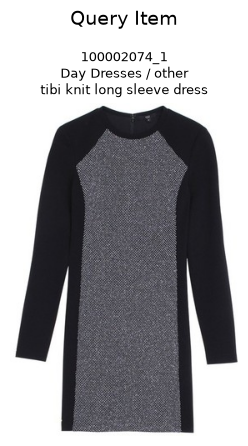

,item_ID,outfit_ID,item_position,category,broad_category,query_category,text
0,100002074_1,100002074,1,Day Dresses,other,dresses,tibi knit long sleeve dress



Final recommended items:


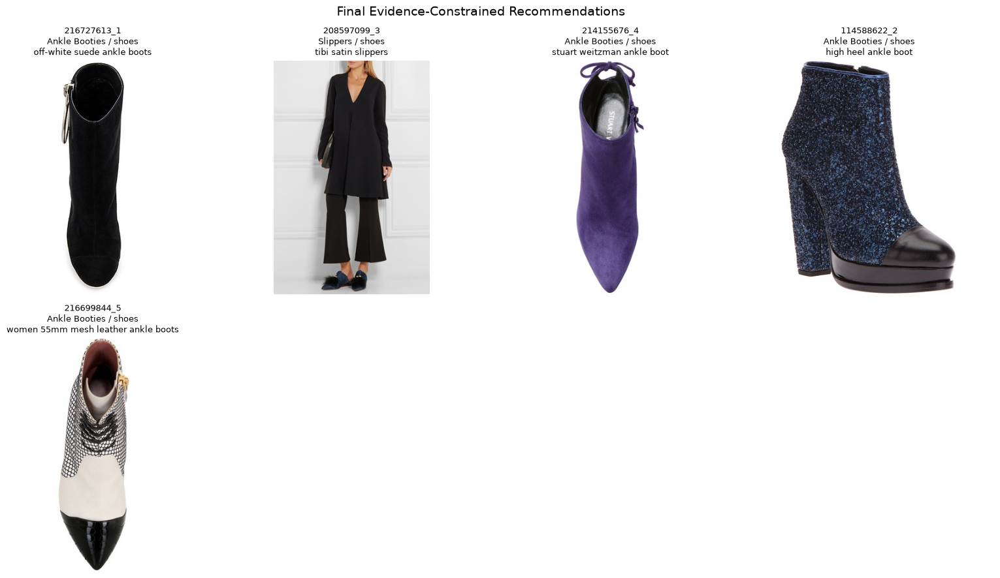

,item_ID,outfit_ID,item_position,category,broad_category,text
0,216727613_1,216727613,1,Ankle Booties,shoes,off-white suede ankle boots
1,208597099_3,208597099,3,Slippers,shoes,tibi satin slippers
2,214155676_4,214155676,4,Ankle Booties,shoes,stuart weitzman ankle boot
3,114588622_2,114588622,2,Ankle Booties,shoes,high heel ankle boot
4,216699844_5,216699844,5,Ankle Booties,shoes,women 55mm mesh leather ankle boots


Final demo run complete.


In [63]:
# Cell 63: Run final recommend() demo on original dress query
# RUN TO TEST THE FULL FINAL PIPELINE END-TO-END

final_demo_result = recommend(
    query_item_id="100002074_1",
    user_text="recommend smart casual shoes",
    target_category="shoes",
    config={
        "candidate_pool_size": 50,
        "final_top_k": 5,
        "alpha_clip": 0.65,
        "beta_evidence": 0.35,
        "use_florence_captioning": True,
        "use_query_caption": True,
        "use_candidate_caption": False,
        "generate_llm_explanations": True,
        "sentence_count": 2,
        "show_images": True,
        "save_outputs": True,
    },
    output_name="demo_dress_smart_casual_shoes",
)

print("Final demo run complete.")

Diverse test query specifications:


,test_name,query_item_id,query_group,user_text,target_category
0,dress_to_smart_casual_shoes,100002074_1,dresses,recommend smart casual shoes,shoes
1,dress_to_accessories,100029003_1,dresses,recommend accessories for a polished casual outfit,accessories
2,top_to_bottoms,100010727_8,tops,recommend bottoms for a relaxed smart casual outfit,bottoms
3,bottoms_to_tops,100010727_2,bottoms,recommend a top that works for a clean everyday look,tops
4,outerwear_to_accessories,100002074_7,outerwear,recommend accessories that match this outerwear,accessories
5,shoes_to_accessories,100002074_2,shoes,recommend accessories to complete the outfit,accessories



Selected query item details:


,item_ID,category,query_category,text,outfit_ID,original_dataset_index
0,100002074_1,Day Dresses,dresses,tibi knit long sleeve dress,100002074,0
1,100002074_2,Boots,shoes,michael kors leather over-the-knee boots,100002074,1
4,100002074_7,Coats,outerwear,miranda coat,100002074,5
6,100010727_2,Skinny Jeans,bottoms,givenchy skinny jean,100010727,7
9,100010727_8,Men's Shirts,tops,contrast trimmed cotton shirt,100010727,12
10,100029003_1,Day Dresses,dresses,rochas dress,100029003,13


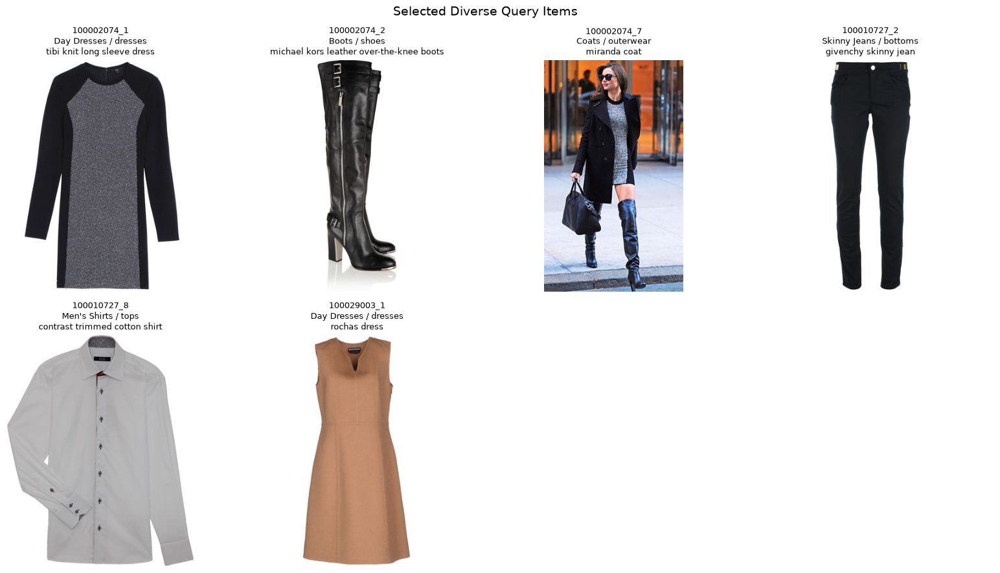

,item_ID,outfit_ID,category,query_category,text
0,100002074_1,100002074,Day Dresses,dresses,tibi knit long sleeve dress
1,100002074_2,100002074,Boots,shoes,michael kors leather over-the-knee boots
4,100002074_7,100002074,Coats,outerwear,miranda coat
6,100010727_2,100010727,Skinny Jeans,bottoms,givenchy skinny jean
9,100010727_8,100010727,Men's Shirts,tops,contrast trimmed cotton shirt
10,100029003_1,100029003,Day Dresses,dresses,rochas dress


In [64]:
# Cell 64: Select diverse real test queries
# RUN AFTER FINAL recommend() FUNCTION IS READY

def get_first_query_item_by_group(query_group, exclude_item_ids=None):
    """
    Pick one real query item from a given query category.
    """
    if exclude_item_ids is None:
        exclude_item_ids = set()
    
    candidates = query_items_df[
        (query_items_df["query_category"] == query_group)
        & (~query_items_df["item_ID"].isin(exclude_item_ids))
    ].copy()
    
    if candidates.empty:
        raise ValueError(f"No query items found for query group: {query_group}")
    
    # Prefer items from usable outfits if possible.
    usable_outfit_ids = set(usable_outfits_df["outfit_ID"].astype(str))
    usable_candidates = candidates[candidates["outfit_ID"].astype(str).isin(usable_outfit_ids)]
    
    if not usable_candidates.empty:
        candidates = usable_candidates
    
    return candidates.iloc[0]


used_test_item_ids = set()

test_query_specs = []

# 1. Original controlled example
dress_item = get_query_item_by_id("100002074_1")
used_test_item_ids.add(dress_item["item_ID"])

test_query_specs.append({
    "test_name": "dress_to_smart_casual_shoes",
    "query_item_id": dress_item["item_ID"],
    "query_group": dress_item["query_category"],
    "user_text": "recommend smart casual shoes",
    "target_category": "shoes",
})

# 2. Dress to accessories
dress_item_2 = get_first_query_item_by_group("dresses", exclude_item_ids=used_test_item_ids)
used_test_item_ids.add(dress_item_2["item_ID"])

test_query_specs.append({
    "test_name": "dress_to_accessories",
    "query_item_id": dress_item_2["item_ID"],
    "query_group": dress_item_2["query_category"],
    "user_text": "recommend accessories for a polished casual outfit",
    "target_category": "accessories",
})

# 3. Top to bottoms
top_item = get_first_query_item_by_group("tops", exclude_item_ids=used_test_item_ids)
used_test_item_ids.add(top_item["item_ID"])

test_query_specs.append({
    "test_name": "top_to_bottoms",
    "query_item_id": top_item["item_ID"],
    "query_group": top_item["query_category"],
    "user_text": "recommend bottoms for a relaxed smart casual outfit",
    "target_category": "bottoms",
})

# 4. Bottoms to tops
bottom_item = get_first_query_item_by_group("bottoms", exclude_item_ids=used_test_item_ids)
used_test_item_ids.add(bottom_item["item_ID"])

test_query_specs.append({
    "test_name": "bottoms_to_tops",
    "query_item_id": bottom_item["item_ID"],
    "query_group": bottom_item["query_category"],
    "user_text": "recommend a top that works for a clean everyday look",
    "target_category": "tops",
})

# 5. Outerwear to accessories
outerwear_item = get_first_query_item_by_group("outerwear", exclude_item_ids=used_test_item_ids)
used_test_item_ids.add(outerwear_item["item_ID"])

test_query_specs.append({
    "test_name": "outerwear_to_accessories",
    "query_item_id": outerwear_item["item_ID"],
    "query_group": outerwear_item["query_category"],
    "user_text": "recommend accessories that match this outerwear",
    "target_category": "accessories",
})

# 6. Shoes to accessories
shoe_item = get_first_query_item_by_group("shoes", exclude_item_ids=used_test_item_ids)
used_test_item_ids.add(shoe_item["item_ID"])

test_query_specs.append({
    "test_name": "shoes_to_accessories",
    "query_item_id": shoe_item["item_ID"],
    "query_group": shoe_item["query_category"],
    "user_text": "recommend accessories to complete the outfit",
    "target_category": "accessories",
})

test_query_specs_df = pd.DataFrame(test_query_specs)

print("Diverse test query specifications:")
display(test_query_specs_df)

print("\nSelected query item details:")
selected_test_items_df = query_items_df[
    query_items_df["item_ID"].isin(test_query_specs_df["query_item_id"])
][
    ["item_ID", "category", "query_category", "text", "outfit_ID", "original_dataset_index"]
].copy()

display(selected_test_items_df)

display_items_grid(
    selected_test_items_df,
    title="Selected Diverse Query Items",
    max_items=len(selected_test_items_df),
    image_index_column="original_dataset_index",
)

In [65]:
# Cell 65: Run final recommender on multiple diverse queries
# RUN AFTER DIVERSE TEST QUERIES ARE SELECTED

batch_test_results = {}

batch_test_config = {
    "candidate_pool_size": 50,
    "final_top_k": 5,
    "alpha_clip": 0.65,
    "beta_evidence": 0.35,
    "use_florence_captioning": True,
    "use_query_caption": True,
    "use_candidate_caption": False,
    "generate_llm_explanations": True,
    "sentence_count": 2,
    "show_images": False,
    "save_outputs": True,
}

for test_spec in test_query_specs:
    test_name = test_spec["test_name"]
    
    print("\n" + "=" * 100)
    print("Running qualitative test:", test_name)
    print("=" * 100)
    
    result = recommend(
        query_item_id=test_spec["query_item_id"],
        user_text=test_spec["user_text"],
        target_category=test_spec["target_category"],
        config=batch_test_config,
        output_name=f"qualitative_{test_name}",
    )
    
    batch_test_results[test_name] = result

print("\nBatch qualitative testing complete.")
print("Number of completed tests:", len(batch_test_results))


Running qualitative test: dress_to_smart_casual_shoes
FINAL RECOMMENDATION PIPELINE
Query item ID: 100002074_1
User request: recommend smart casual shoes
Target category: shoes

Step 1/5: Retrieving CLIP multimodal candidate pool...
Candidate pool size: 50

Step 2/5: Adding candidate-specific KB evidence...


Retrieving candidate evidence:   0%|          | 0/50 [00:00<?, ?it/s]

Evidence added to candidate pool.

Step 3/5: Reranking with CLIP similarity + KB evidence...
Full reranked pool size: 50
Final top-K recommendations: 5

Step 4/5: Generating Florence visual captions...


Captioning final recommendations:   0%|          | 0/5 [00:00<?, ?it/s]

Query raw Florence caption:
The image is of a black long sleeved dress. It has a scoop neckline with a zipper at the top. The dress is made of a shiny black material and has a metallic silver color on the top that looks like a fish eye pattern. The sleeves of the dress are also black and the neckline is also black.

Query visual context for LLM:
a black long sleeved dress. It has a scoop neckline with a zipper at the top. The sleeves of the dress are also black and the neckline is also black.

Step 5/5: Generating controlled evidence-grounded explanations...


Generating controlled visual evidence explanations:   0%|          | 0/5 [00:00<?, ?it/s]

Explanations generated.

Saved final pipeline outputs to:
outputs\results\qualitative_dress_to_smart_casual_shoes

Final recommendation summary:


,evidence_constrained_rank,clip_candidate_rank,item_ID,category,text,clip_multimodal_score,evidence_score,final_score,evidence_rule_ids
0,1,2,216727613_1,Ankle Booties,off-white suede ankle boots,0.799879,0.704197,0.822912,"R009, R006, R008, R004, R010"
1,2,1,208597099_3,Slippers,tibi satin slippers,0.809318,0.668298,0.696702,"R006, R008, R009, R041, R007"
2,3,5,214155676_4,Ankle Booties,stuart weitzman ankle boot,0.789004,0.707536,0.689587,"R008, R009, R006, R003, R010"
3,4,3,114588622_2,Ankle Booties,high heel ankle boot,0.793405,0.692655,0.644366,"R006, R008, R009, R010, R007"
4,5,4,216699844_5,Ankle Booties,women 55mm mesh leather ankle boots,0.790380,0.697818,0.638308,"R006, R008, R009, R010, R004"



Score decomposition:


,evidence_constrained_rank,clip_candidate_rank,item_ID,category,text,clip_multimodal_score,evidence_score,clip_score_norm,evidence_score_norm,clip_contribution,evidence_contribution,final_score,contribution_check,evidence_rule_ids
0,1,2,216727613_1,Ankle Booties,off-white suede ankle boots,0.799879,0.704197,0.789302,0.885331,0.513046,0.309866,0.822912,0.822912,"R009, R006, R008, R004, R010"
1,2,1,208597099_3,Slippers,tibi satin slippers,0.809318,0.668298,1.000000,0.133436,0.650000,0.046702,0.696702,0.696702,"R006, R008, R009, R041, R007"
2,3,5,214155676_4,Ankle Booties,stuart weitzman ankle boot,0.789004,0.707536,0.546531,0.955262,0.355245,0.334342,0.689587,0.689587,"R008, R009, R006, R003, R010"
3,4,3,114588622_2,Ankle Booties,high heel ankle boot,0.793405,0.692655,0.644784,0.643589,0.419110,0.225256,0.644366,0.644366,"R006, R008, R009, R010, R007"
4,5,4,216699844_5,Ankle Booties,women 55mm mesh leather ankle boots,0.790380,0.697818,0.577243,0.751714,0.375208,0.263100,0.638308,0.638308,"R006, R008, R009, R010, R004"



Final explanation summary:


,evidence_constrained_rank,item_ID,category,text,controlled_visual_evidence_explanation
0,1,216727613_1,Ankle Booties,off-white suede ankle boots,"For a smart casual look, pair the off-white suede ankle boots with a variety of outfits. The boots' neutral colour a..."
1,2,208597099_3,Slippers,tibi satin slippers,"For a smart casual look, pair the tibi knit long sleeve dress with the tibi satin slippers. The slipper's classic de..."
2,3,214155676_4,Ankle Booties,stuart weitzman ankle boot,"For a smart casual look, pair the stuart weitzman ankle boot with your tibi knit long sleeve dress. The sleek and po..."
3,4,114588622_2,Ankle Booties,high heel ankle boot,"For a smart casual look, pair the tibi knit long sleeve dress with ankle booties that add a touch of sophistication...."
4,5,216699844_5,Ankle Booties,women 55mm mesh leather ankle boots,"For a smart casual look, pair the tibi knit long sleeve dress with the women 55mm mesh leather ankle boots. The boot..."



Running qualitative test: dress_to_accessories
FINAL RECOMMENDATION PIPELINE
Query item ID: 100029003_1
User request: recommend accessories for a polished casual outfit
Target category: accessories

Step 1/5: Retrieving CLIP multimodal candidate pool...
Candidate pool size: 50

Step 2/5: Adding candidate-specific KB evidence...


Retrieving candidate evidence:   0%|          | 0/50 [00:00<?, ?it/s]

Evidence added to candidate pool.

Step 3/5: Reranking with CLIP similarity + KB evidence...
Full reranked pool size: 50
Final top-K recommendations: 5

Step 4/5: Generating Florence visual captions...


Captioning final recommendations:   0%|          | 0/5 [00:00<?, ?it/s]

Query raw Florence caption:
A beige sleeveless dress is shown. The dress has a V-neck at the top and two small pockets on either side of the neckline. There is a black tag on the front of the dress.

Query visual context for LLM:
A beige sleeveless dress is shown. The dress has a V-neck at the top and two small pockets on either side of the neckline. There is a black tag on the front of the dress.

Step 5/5: Generating controlled evidence-grounded explanations...


Generating controlled visual evidence explanations:   0%|          | 0/5 [00:00<?, ?it/s]

Explanations generated.

Saved final pipeline outputs to:
outputs\results\qualitative_dress_to_accessories

Final recommendation summary:


,evidence_constrained_rank,clip_candidate_rank,item_ID,category,text,clip_multimodal_score,evidence_score,final_score,evidence_rule_ids
0,1,1,215058460_7,Scarves,weekend max mara cashmere scarf,0.823161,0.706950,0.708170,"R072, R075, R019, R078, R064"
1,2,2,197775282_6,Scarves,contrast trim shawl,0.805507,0.722284,0.633914,"R072, R075, R019, R078, R064"
2,3,3,216332835_6,Scarves,topshop super soft scarf,0.805361,0.703099,0.479598,"R072, R075, R019, R022, R078"
3,4,7,132390118_5,Handbags,snake print shopping bag zip detail,0.783239,0.726936,0.423322,"R072, R019, R022, R075, R064"
4,5,18,203795896_5,Shoulder Bags,chloé women small leather shoulder bag,0.775725,0.737385,0.422940,"R022, R072, R018, R078, R019"



Score decomposition:


,evidence_constrained_rank,clip_candidate_rank,item_ID,category,text,clip_multimodal_score,evidence_score,clip_score_norm,evidence_score_norm,clip_contribution,evidence_contribution,final_score,contribution_check,evidence_rule_ids
0,1,1,215058460_7,Scarves,weekend max mara cashmere scarf,0.823161,0.706950,1.000000,0.166201,0.650000,0.058170,0.708170,0.708170,"R072, R075, R019, R078, R064"
1,2,2,197775282_6,Scarves,contrast trim shawl,0.805507,0.722284,0.698002,0.514895,0.453701,0.180213,0.633914,0.633914,"R072, R075, R019, R078, R064"
2,3,3,216332835_6,Scarves,topshop super soft scarf,0.805361,0.703099,0.695500,0.078637,0.452075,0.027523,0.479598,0.479598,"R072, R075, R019, R022, R078"
3,4,7,132390118_5,Handbags,snake print shopping bag zip detail,0.783239,0.726936,0.317058,0.620671,0.206087,0.217235,0.423322,0.423322,"R072, R019, R022, R075, R064"
4,5,18,203795896_5,Shoulder Bags,chloé women small leather shoulder bag,0.775725,0.737385,0.188525,0.858282,0.122541,0.300399,0.422940,0.422940,"R022, R072, R018, R078, R019"



Final explanation summary:


,evidence_constrained_rank,item_ID,category,text,controlled_visual_evidence_explanation
0,1,215058460_7,Scarves,weekend max mara cashmere scarf,"For a polished casual outfit, consider pairing the rochas dress with a minimalist accessory that adds a touch of sop..."
1,2,197775282_6,Scarves,contrast trim shawl,"For a polished casual outfit, consider pairing the rochas dress with a contrast trim shawl. This accessory adds a to..."
2,3,216332835_6,Scarves,topshop super soft scarf,"For a polished casual outfit like the rochas dress, a soft and elegant accessory can elevate the look. The topshop s..."
3,4,132390118_5,Handbags,snake print shopping bag zip detail,"For a polished casual outfit, consider pairing the rochas dress with the snake print shopping bag. The dress's class..."
4,5,203795896_5,Shoulder Bags,chloé women small leather shoulder bag,"For a polished casual outfit, pair the rochas dress with the chloé women small leather shoulder bag. This combinatio..."



Running qualitative test: top_to_bottoms
FINAL RECOMMENDATION PIPELINE
Query item ID: 100010727_8
User request: recommend bottoms for a relaxed smart casual outfit
Target category: bottoms

Step 1/5: Retrieving CLIP multimodal candidate pool...
Candidate pool size: 50

Step 2/5: Adding candidate-specific KB evidence...


Retrieving candidate evidence:   0%|          | 0/50 [00:00<?, ?it/s]

Evidence added to candidate pool.

Step 3/5: Reranking with CLIP similarity + KB evidence...
Full reranked pool size: 50
Final top-K recommendations: 5

Step 4/5: Generating Florence visual captions...


Captioning final recommendations:   0%|          | 0/5 [00:00<?, ?it/s]

Query raw Florence caption:
The image is of a long white button down shirt. The shirt has a collar with a black and white stripe going down the center of it. There are three buttons on the shirt with a red stripe running down the middle. There is a black tag on the collar with the letters S/C on it. On the left side of the shirt there is a long sleeve button up shirt.

Query visual context for LLM:
a long white button down shirt. The shirt has a collar with a black and white stripe going down the center of it. There are three buttons on the shirt with a red stripe running down the middle. There is a black tag on the collar with the letters S/C on it. On the left side of the shirt there is a long sleeve button up shirt.

Step 5/5: Generating controlled evidence-grounded explanations...


Generating controlled visual evidence explanations:   0%|          | 0/5 [00:00<?, ?it/s]

Explanations generated.

Saved final pipeline outputs to:
outputs\results\qualitative_top_to_bottoms

Final recommendation summary:


,evidence_constrained_rank,clip_candidate_rank,item_ID,category,text,clip_multimodal_score,evidence_score,final_score,evidence_rule_ids
0,1,2,190177802_2,Men's Casual Pants,match mens casual pants,0.811412,0.758672,0.860984,"R052, R079, R050, R049, R046"
1,2,5,120883813_6,Men's Casual Pants,ann cropped soft cotton trousers,0.808596,0.764301,0.845014,"R052, R079, R050, R049, R046"
2,3,1,212151688_2,Men's Dress Pants,modern travel dress pants,0.812718,0.747888,0.795990,"R052, R079, R050, R046, R049"
3,4,3,215964234_2,Men's Casual Pants,men's slim-fit chino pants,0.809691,0.754898,0.787309,"R052, R079, R050, R046, R049"
4,5,6,214527741_2,Men's Casual Pants,mens slim fit chino pants trouser premium cotton,0.805694,0.764986,0.783226,"R052, R079, R049, R050, R046"



Score decomposition:


,evidence_constrained_rank,clip_candidate_rank,item_ID,category,text,clip_multimodal_score,evidence_score,clip_score_norm,evidence_score_norm,clip_contribution,evidence_contribution,final_score,contribution_check,evidence_rule_ids
0,1,2,190177802_2,Men's Casual Pants,match mens casual pants,0.811412,0.758672,0.953042,0.690018,0.619477,0.241506,0.860984,0.860984,"R052, R079, R050, R049, R046"
1,2,5,120883813_6,Men's Casual Pants,ann cropped soft cotton trousers,0.808596,0.764301,0.851780,0.832447,0.553657,0.291356,0.845014,0.845014,"R052, R079, R050, R049, R046"
2,3,1,212151688_2,Men's Dress Pants,modern travel dress pants,0.812718,0.747888,1.000000,0.417115,0.650000,0.145990,0.795990,0.795990,"R052, R079, R050, R046, R049"
3,4,3,215964234_2,Men's Casual Pants,men's slim-fit chino pants,0.809691,0.754898,0.891131,0.594496,0.579235,0.208074,0.787309,0.787309,"R052, R079, R050, R046, R049"
4,5,6,214527741_2,Men's Casual Pants,mens slim fit chino pants trouser premium cotton,0.805694,0.764986,0.747391,0.849775,0.485804,0.297421,0.783226,0.783226,"R052, R079, R049, R050, R046"



Final explanation summary:


,evidence_constrained_rank,item_ID,category,text,controlled_visual_evidence_explanation
0,1,190177802_2,Men's Casual Pants,match mens casual pants,"For a relaxed smart casual outfit, pair the match mens casual pants with a crisp white or light-colored top. The con..."
1,2,120883813_6,Men's Casual Pants,ann cropped soft cotton trousers,"For a relaxed smart casual outfit, consider pairing the contrast trimmed cotton shirt with the cropped soft cotton t..."
2,3,212151688_2,Men's Dress Pants,modern travel dress pants,"For a relaxed smart casual outfit, pair the modern travel dress pants with a crisp white or light-colored top to cre..."
3,4,215964234_2,Men's Casual Pants,men's slim-fit chino pants,"For a relaxed smart casual outfit, pair the slim-fit chino pants with a crisp white or light-colored top to create a..."
4,5,214527741_2,Men's Casual Pants,mens slim fit chino pants trouser premium cotton,"For a relaxed smart casual outfit, pair the slim fit chino pants with a crisp white or light-colored top. The contra..."



Running qualitative test: bottoms_to_tops
FINAL RECOMMENDATION PIPELINE
Query item ID: 100010727_2
User request: recommend a top that works for a clean everyday look
Target category: tops

Step 1/5: Retrieving CLIP multimodal candidate pool...
Candidate pool size: 50

Step 2/5: Adding candidate-specific KB evidence...


Retrieving candidate evidence:   0%|          | 0/50 [00:00<?, ?it/s]

Evidence added to candidate pool.

Step 3/5: Reranking with CLIP similarity + KB evidence...
Full reranked pool size: 50
Final top-K recommendations: 5

Step 4/5: Generating Florence visual captions...


Captioning final recommendations:   0%|          | 0/5 [00:00<?, ?it/s]

Query raw Florence caption:
The image is of a pair of black jeans. The jeans have a button on the front and a belt on the top of the pants. The belt has a gold buckle. There are two pockets on the left side of the jeans.

Query visual context for LLM:
a pair of black jeans. The jeans have a button on the front and a belt on the top of the pants. The belt has a gold buckle. There are two pockets on the left side of the jeans.

Step 5/5: Generating controlled evidence-grounded explanations...


Generating controlled visual evidence explanations:   0%|          | 0/5 [00:00<?, ?it/s]

Explanations generated.

Saved final pipeline outputs to:
outputs\results\qualitative_bottoms_to_tops

Final recommendation summary:


,evidence_constrained_rank,clip_candidate_rank,item_ID,category,text,clip_multimodal_score,evidence_score,final_score,evidence_rule_ids
0,1,2,215304085_1,Sweatshirts,fleece plus size sweatshirt pants,0.837003,0.657247,0.859483,"R027, R028, R031, R034, R033"
1,2,1,216503695_2,Tops,rick owens top,0.838355,0.637203,0.764733,"R027, R028, R031, R034, R030"
2,3,3,207039610_1,Tops,theory stretch-jersey turtleneck top,0.830346,0.647182,0.634210,"R027, R028, R034, R031, R030"
3,4,14,215305762_3,Men's Sweatshirts,maison margiela leather cotton-jersey sweatshirt,0.822052,0.674185,0.605066,"R027, R028, R034, R031, R033"
4,5,4,209530999_1,Men's T-Shirts,lost long asymmetric t-shirt,0.829859,0.640269,0.578433,"R027, R028, R031, R034, R032"



Score decomposition:


,evidence_constrained_rank,clip_candidate_rank,item_ID,category,text,clip_multimodal_score,evidence_score,clip_score_norm,evidence_score_norm,clip_contribution,evidence_contribution,final_score,contribution_check,evidence_rule_ids
0,1,2,215304085_1,Sweatshirts,fleece plus size sweatshirt pants,0.837003,0.657247,0.949594,0.692133,0.617236,0.242247,0.859483,0.859483,"R027, R028, R031, R034, R033"
1,2,1,216503695_2,Tops,rick owens top,0.838355,0.637203,1.000000,0.327810,0.650000,0.114733,0.764733,0.764733,"R027, R028, R031, R034, R030"
2,3,3,207039610_1,Tops,theory stretch-jersey turtleneck top,0.830346,0.647182,0.701527,0.509193,0.455993,0.178217,0.634210,0.634210,"R027, R028, R034, R031, R030"
3,4,14,215305762_3,Men's Sweatshirts,maison margiela leather cotton-jersey sweatshirt,0.822052,0.674185,0.392410,1.000000,0.255066,0.350000,0.605066,0.605066,"R027, R028, R034, R031, R033"
4,5,4,209530999_1,Men's T-Shirts,lost long asymmetric t-shirt,0.829859,0.640269,0.683370,0.383550,0.444191,0.134243,0.578433,0.578433,"R027, R028, R031, R034, R032"



Final explanation summary:


,evidence_constrained_rank,item_ID,category,text,controlled_visual_evidence_explanation
0,1,215304085_1,Sweatshirts,fleece plus size sweatshirt pants,"For a clean everyday look, pair the Givenchy skinny jeans with a simple and versatile sweatshirt. The fleece plus si..."
1,2,216503695_2,Tops,rick owens top,"For a clean everyday look, pair the Givenchy skinny jeans with the Rick Owens top. The combination works well becaus..."
2,3,207039610_1,Tops,theory stretch-jersey turtleneck top,"For a clean everyday look, pair the Theory stretch-jersey turtleneck top with your Givenchy skinny jeans. The neutra..."
3,4,215305762_3,Men's Sweatshirts,maison margiela leather cotton-jersey sweatshirt,"For a clean everyday look, pair the Givenchy skinny jeans with the Maison Margiela leather cotton-jersey sweatshirt...."
4,5,209530999_1,Men's T-Shirts,lost long asymmetric t-shirt,"For a clean everyday look, pair the Givenchy skinny jeans with the Lost Long Asymmetric T-Shirt. This combination wo..."



Running qualitative test: outerwear_to_accessories
FINAL RECOMMENDATION PIPELINE
Query item ID: 100002074_7
User request: recommend accessories that match this outerwear
Target category: accessories

Step 1/5: Retrieving CLIP multimodal candidate pool...
Candidate pool size: 50

Step 2/5: Adding candidate-specific KB evidence...


Retrieving candidate evidence:   0%|          | 0/50 [00:00<?, ?it/s]

Evidence added to candidate pool.

Step 3/5: Reranking with CLIP similarity + KB evidence...
Full reranked pool size: 50
Final top-K recommendations: 5

Step 4/5: Generating Florence visual captions...


Captioning final recommendations:   0%|          | 0/5 [00:00<?, ?it/s]

Query raw Florence caption:
A woman is walking down the street. She is wearing a black coat. She has a black bag in her left hand. She also has sunglasses on her face. 

Query visual context for LLM:
A woman is walking down the street. She is wearing a black coat. She has a black bag in her left hand. She also has sunglasses on her face.

Step 5/5: Generating controlled evidence-grounded explanations...


Generating controlled visual evidence explanations:   0%|          | 0/5 [00:00<?, ?it/s]

Explanations generated.

Saved final pipeline outputs to:
outputs\results\qualitative_outerwear_to_accessories

Final recommendation summary:


,evidence_constrained_rank,clip_candidate_rank,item_ID,category,text,clip_multimodal_score,evidence_score,final_score,evidence_rule_ids
0,1,1,104406514_6,Tote Bags,bags olivia,0.861333,0.699419,0.729457,"R072, R062, R061, R063, R075"
1,2,3,176476328_7,Hats,gigi new york fashion tumblr full street wear trends,0.794089,0.727709,0.602032,"R072, R062, R063, R075, R064"
2,3,2,189931037_7,Hats,miranda leaves new york,0.818784,0.704915,0.576248,"R072, R062, R063, R064, R061"
3,4,4,179193027_5,Scarves,cable blanket scarves red hunter boots,0.768058,0.712970,0.402393,"R072, R062, R061, R075, R063"
4,5,11,176749766_5,Earrings,rihanna,0.730636,0.736478,0.376911,"R072, R062, R064, R063, R075"



Score decomposition:


,evidence_constrained_rank,clip_candidate_rank,item_ID,category,text,clip_multimodal_score,evidence_score,clip_score_norm,evidence_score_norm,clip_contribution,evidence_contribution,final_score,contribution_check,evidence_rule_ids
0,1,1,104406514_6,Tote Bags,bags olivia,0.861333,0.699419,1.000000,0.227020,0.650000,0.079457,0.729457,0.729457,"R072, R062, R061, R063, R075"
1,2,3,176476328_7,Hats,gigi new york fashion tumblr full street wear trends,0.794089,0.727709,0.549317,0.699932,0.357056,0.244976,0.602032,0.602032,"R072, R062, R063, R075, R064"
2,3,2,189931037_7,Hats,miranda leaves new york,0.818784,0.704915,0.714824,0.318894,0.464635,0.111613,0.576248,0.576248,"R072, R062, R063, R064, R061"
3,4,4,179193027_5,Scarves,cable blanket scarves red hunter boots,0.768058,0.712970,0.374850,0.453546,0.243652,0.158741,0.402393,0.402393,"R072, R062, R061, R075, R063"
4,5,11,176749766_5,Earrings,rihanna,0.730636,0.736478,0.124039,0.846530,0.080626,0.296286,0.376911,0.376911,"R072, R062, R064, R063, R075"



Final explanation summary:


,evidence_constrained_rank,item_ID,category,text,controlled_visual_evidence_explanation
0,1,104406514_6,Tote Bags,bags olivia,This miranda coat is a versatile and chic outerwear piece that can be dressed up or down. To complement its sleek de...
1,2,176476328_7,Hats,gigi new york fashion tumblr full street wear trends,This miranda coat is a versatile and chic outerwear piece that can be dressed up or down. To complement its sleek de...
2,3,189931037_7,Hats,miranda leaves new york,This miranda leaves new york hat complements the miranda coat by adding a touch of polished elegance to the overall ...
3,4,179193027_5,Scarves,cable blanket scarves red hunter boots,This red cable blanket scarf is a great match for your miranda coat. Its classic and polished design complements the...
4,5,176749766_5,Earrings,rihanna,"This miranda coat is a versatile and chic piece that can be dressed up or down. To complement its sleek design, I wo..."



Running qualitative test: shoes_to_accessories
FINAL RECOMMENDATION PIPELINE
Query item ID: 100002074_2
User request: recommend accessories to complete the outfit
Target category: accessories

Step 1/5: Retrieving CLIP multimodal candidate pool...
Candidate pool size: 50

Step 2/5: Adding candidate-specific KB evidence...


Retrieving candidate evidence:   0%|          | 0/50 [00:00<?, ?it/s]

Evidence added to candidate pool.

Step 3/5: Reranking with CLIP similarity + KB evidence...
Full reranked pool size: 50
Final top-K recommendations: 5

Step 4/5: Generating Florence visual captions...


Captioning final recommendations:   0%|          | 0/5 [00:00<?, ?it/s]

Query raw Florence caption:
The image is of a tall black leather boots. The boots have a silver zipper on the side. There is a metal heel on the bottom of the boots. 

Query visual context for LLM:
a tall black leather boots. The boots have a silver zipper on the side. There is a metal heel on the bottom of the boots.

Step 5/5: Generating controlled evidence-grounded explanations...


Generating controlled visual evidence explanations:   0%|          | 0/5 [00:00<?, ?it/s]

Explanations generated.

Saved final pipeline outputs to:
outputs\results\qualitative_shoes_to_accessories

Final recommendation summary:


,evidence_constrained_rank,clip_candidate_rank,item_ID,category,text,clip_multimodal_score,evidence_score,final_score,evidence_rule_ids
0,1,1,132390118_5,Handbags,snake print shopping bag zip detail,0.792386,0.633199,0.732514,"R072, R065, R069, R061, R070"
1,2,3,164789920_5,Bags,handbag christian made leather bags backpack handbag,0.773732,0.658829,0.675737,"R069, R061, R065, R072, R070"
2,3,2,216809921_5,Shoulder Bags,silver zip shoulder bag,0.773937,0.645711,0.572199,"R072, R069, R065, R061, R070"
3,4,13,215983242_4,Shoulder Bags,chicnova fashion cross body bag,0.761031,0.655112,0.465322,"R072, R069, R065, R066, R061"
4,5,6,171189753_4,Shoulder Bags,saint laurent medium bucket bag,0.765252,0.647075,0.460022,"R072, R069, R065, R061, R066"



Score decomposition:


,evidence_constrained_rank,clip_candidate_rank,item_ID,category,text,clip_multimodal_score,evidence_score,clip_score_norm,evidence_score_norm,clip_contribution,evidence_contribution,final_score,contribution_check,evidence_rule_ids
0,1,1,132390118_5,Handbags,snake print shopping bag zip detail,0.792386,0.633199,1.000000,0.235753,0.650000,0.082514,0.732514,0.732514,"R072, R065, R069, R061, R070"
1,2,3,164789920_5,Bags,handbag christian made leather bags backpack handbag,0.773732,0.658829,0.592713,0.829925,0.385263,0.290474,0.675737,0.675737,"R069, R061, R065, R072, R070"
2,3,2,216809921_5,Shoulder Bags,silver zip shoulder bag,0.773937,0.645711,0.597183,0.525800,0.388169,0.184030,0.572199,0.572199,"R072, R069, R065, R061, R070"
3,4,13,215983242_4,Shoulder Bags,chicnova fashion cross body bag,0.761031,0.655112,0.315403,0.743743,0.205012,0.260310,0.465322,0.465322,"R072, R069, R065, R066, R061"
4,5,6,171189753_4,Shoulder Bags,saint laurent medium bucket bag,0.765252,0.647075,0.407572,0.557430,0.264922,0.195101,0.460022,0.460022,"R072, R069, R065, R061, R066"



Final explanation summary:


,evidence_constrained_rank,item_ID,category,text,controlled_visual_evidence_explanation
0,1,132390118_5,Handbags,snake print shopping bag zip detail,This snake print shopping bag with a zip detail complements the over-the-knee boots by adding a touch of modern poli...
1,2,164789920_5,Bags,handbag christian made leather bags backpack handbag,This handbag complements the over-the-knee boots by adding a touch of sophistication and polish to the overall look....
2,3,216809921_5,Shoulder Bags,silver zip shoulder bag,This silver zip shoulder bag complements the michael kors leather over-the-knee boots by adding a touch of polished ...
3,4,215983242_4,Shoulder Bags,chicnova fashion cross body bag,This chicnova fashion cross body bag complements the michael kors leather over-the-knee boots by adding a touch of p...
4,5,171189753_4,Shoulder Bags,saint laurent medium bucket bag,This Saint Laurent medium bucket bag complements the michael kors leather over-the-knee boots by adding a touch of p...



Batch qualitative testing complete.
Number of completed tests: 6


In [66]:
# Cell 66: Build qualitative results summary table
# RUN AFTER BATCH QUALITATIVE TESTS COMPLETE

def build_qualitative_summary_table(batch_results, test_specs):
    """
    Build one clean summary table from multiple recommend() runs.
    """
    summary_rows = []
    
    test_spec_lookup = {
        spec["test_name"]: spec
        for spec in test_specs
    }
    
    for test_name, result in batch_results.items():
        spec = test_spec_lookup[test_name]
        
        query_item = result["query_item"]
        final_recommendations = result["final_recommendations"]
        explanations = result["explanations"]
        score_decomposition = result["score_decomposition"]
        query_caption_data = result["query_caption_data"]
        
        if final_recommendations.empty:
            continue
        
        top_rec = final_recommendations.iloc[0]
        
        top_explanation = ""
        if isinstance(explanations, pd.DataFrame) and not explanations.empty:
            top_explanation = explanations.iloc[0].get(
                "controlled_visual_evidence_explanation",
                ""
            )
        
        clip_contribution = ""
        evidence_contribution = ""
        if isinstance(score_decomposition, pd.DataFrame) and not score_decomposition.empty:
            clip_contribution = score_decomposition.iloc[0].get("clip_contribution", "")
            evidence_contribution = score_decomposition.iloc[0].get("evidence_contribution", "")
        
        summary_rows.append({
            "test_name": test_name,
            "query_item_id": query_item["item_ID"],
            "query_category": query_item["category"],
            "query_text": query_item["text"],
            "query_group": query_item.get("query_category", ""),
            "user_request": spec["user_text"],
            "target_category": spec["target_category"],
            "query_visual_context": query_caption_data.get("visual_context_for_llm", ""),
            "top_recommendation_item_id": top_rec.get("item_ID", ""),
            "top_recommendation_category": top_rec.get("category", ""),
            "top_recommendation_text": top_rec.get("text", ""),
            "clip_candidate_rank": top_rec.get("clip_candidate_rank", ""),
            "clip_multimodal_score": top_rec.get("clip_multimodal_score", ""),
            "evidence_score": top_rec.get("evidence_score", ""),
            "final_score": top_rec.get("final_score", ""),
            "clip_contribution": clip_contribution,
            "evidence_contribution": evidence_contribution,
            "evidence_rule_ids": top_rec.get("evidence_rule_ids", ""),
            "final_explanation": top_explanation,
        })
    
    return pd.DataFrame(summary_rows)


qualitative_summary_df = build_qualitative_summary_table(
    batch_results=batch_test_results,
    test_specs=test_query_specs,
)

print("Qualitative recommendation summary:")
display(qualitative_summary_df)

qualitative_summary_path = RESULTS_DIR / "qualitative_recommendation_summary.csv"
qualitative_summary_df.to_csv(qualitative_summary_path, index=False)

print("\nSaved qualitative summary:")
print(qualitative_summary_path.relative_to(PROJECT_ROOT))


# Optional compact view for supervisor/demo
compact_qualitative_summary_df = qualitative_summary_df[
    [
        "test_name",
        "query_category",
        "query_text",
        "user_request",
        "target_category",
        "top_recommendation_category",
        "top_recommendation_text",
        "final_score",
        "evidence_rule_ids",
        "final_explanation",
    ]
].copy()

print("\nCompact qualitative summary:")
display(compact_qualitative_summary_df)

compact_qualitative_summary_path = RESULTS_DIR / "compact_qualitative_recommendation_summary.csv"
compact_qualitative_summary_df.to_csv(compact_qualitative_summary_path, index=False)

print("\nSaved compact qualitative summary:")
print(compact_qualitative_summary_path.relative_to(PROJECT_ROOT))

Qualitative recommendation summary:


,test_name,query_item_id,query_category,query_text,query_group,user_request,target_category,query_visual_context,top_recommendation_item_id,top_recommendation_category,top_recommendation_text,clip_candidate_rank,clip_multimodal_score,evidence_score,final_score,clip_contribution,evidence_contribution,evidence_rule_ids,final_explanation
0,dress_to_smart_casual_shoes,100002074_1,Day Dresses,tibi knit long sleeve dress,dresses,recommend smart casual shoes,shoes,a black long sleeved dress. It has a scoop neckline with a zipper at the top. The sleeves of the dress are also blac...,216727613_1,Ankle Booties,off-white suede ankle boots,2,0.799879,0.704197,0.822912,0.513046,0.309866,"R009, R006, R008, R004, R010","For a smart casual look, pair the off-white suede ankle boots with a variety of outfits. The boots' neutral colour a..."
1,dress_to_accessories,100029003_1,Day Dresses,rochas dress,dresses,recommend accessories for a polished casual outfit,accessories,A beige sleeveless dress is shown. The dress has a V-neck at the top and two small pockets on either side of the nec...,215058460_7,Scarves,weekend max mara cashmere scarf,1,0.823161,0.706950,0.708170,0.650000,0.058170,"R072, R075, R019, R078, R064","For a polished casual outfit, consider pairing the rochas dress with a minimalist accessory that adds a touch of sop..."
2,top_to_bottoms,100010727_8,Men's Shirts,contrast trimmed cotton shirt,tops,recommend bottoms for a relaxed smart casual outfit,bottoms,a long white button down shirt. The shirt has a collar with a black and white stripe going down the center of it. Th...,190177802_2,Men's Casual Pants,match mens casual pants,2,0.811412,0.758672,0.860984,0.619477,0.241506,"R052, R079, R050, R049, R046","For a relaxed smart casual outfit, pair the match mens casual pants with a crisp white or light-colored top. The con..."
3,bottoms_to_tops,100010727_2,Skinny Jeans,givenchy skinny jean,bottoms,recommend a top that works for a clean everyday look,tops,a pair of black jeans. The jeans have a button on the front and a belt on the top of the pants. The belt has a gold ...,215304085_1,Sweatshirts,fleece plus size sweatshirt pants,2,0.837003,0.657247,0.859483,0.617236,0.242247,"R027, R028, R031, R034, R033","For a clean everyday look, pair the Givenchy skinny jeans with a simple and versatile sweatshirt. The fleece plus si..."
4,outerwear_to_accessories,100002074_7,Coats,miranda coat,outerwear,recommend accessories that match this outerwear,accessories,A woman is walking down the street. She is wearing a black coat. She has a black bag in her left hand. She also has ...,104406514_6,Tote Bags,bags olivia,1,0.861333,0.699419,0.729457,0.650000,0.079457,"R072, R062, R061, R063, R075",This miranda coat is a versatile and chic outerwear piece that can be dressed up or down. To complement its sleek de...
5,shoes_to_accessories,100002074_2,Boots,michael kors leather over-the-knee boots,shoes,recommend accessories to complete the outfit,accessories,a tall black leather boots. The boots have a silver zipper on the side. There is a metal heel on the bottom of the b...,132390118_5,Handbags,snake print shopping bag zip detail,1,0.792386,0.633199,0.732514,0.650000,0.082514,"R072, R065, R069, R061, R070",This snake print shopping bag with a zip detail complements the over-the-knee boots by adding a touch of modern poli...



Saved qualitative summary:
outputs\results\qualitative_recommendation_summary.csv

Compact qualitative summary:


,test_name,query_category,query_text,user_request,target_category,top_recommendation_category,top_recommendation_text,final_score,evidence_rule_ids,final_explanation
0,dress_to_smart_casual_shoes,Day Dresses,tibi knit long sleeve dress,recommend smart casual shoes,shoes,Ankle Booties,off-white suede ankle boots,0.822912,"R009, R006, R008, R004, R010","For a smart casual look, pair the off-white suede ankle boots with a variety of outfits. The boots' neutral colour a..."
1,dress_to_accessories,Day Dresses,rochas dress,recommend accessories for a polished casual outfit,accessories,Scarves,weekend max mara cashmere scarf,0.708170,"R072, R075, R019, R078, R064","For a polished casual outfit, consider pairing the rochas dress with a minimalist accessory that adds a touch of sop..."
2,top_to_bottoms,Men's Shirts,contrast trimmed cotton shirt,recommend bottoms for a relaxed smart casual outfit,bottoms,Men's Casual Pants,match mens casual pants,0.860984,"R052, R079, R050, R049, R046","For a relaxed smart casual outfit, pair the match mens casual pants with a crisp white or light-colored top. The con..."
3,bottoms_to_tops,Skinny Jeans,givenchy skinny jean,recommend a top that works for a clean everyday look,tops,Sweatshirts,fleece plus size sweatshirt pants,0.859483,"R027, R028, R031, R034, R033","For a clean everyday look, pair the Givenchy skinny jeans with a simple and versatile sweatshirt. The fleece plus si..."
4,outerwear_to_accessories,Coats,miranda coat,recommend accessories that match this outerwear,accessories,Tote Bags,bags olivia,0.729457,"R072, R062, R061, R063, R075",This miranda coat is a versatile and chic outerwear piece that can be dressed up or down. To complement its sleek de...
5,shoes_to_accessories,Boots,michael kors leather over-the-knee boots,recommend accessories to complete the outfit,accessories,Handbags,snake print shopping bag zip detail,0.732514,"R072, R065, R069, R061, R070",This snake print shopping bag with a zip detail complements the over-the-knee boots by adding a touch of modern poli...



Saved compact qualitative summary:
outputs\results\compact_qualitative_recommendation_summary.csv


## Qualitative Testing Notes

The qualitative tests show that the final pipeline works across multiple query-target category settings. The system can retrieve visually and semantically relevant recommendations, rerank them using fashion-rule evidence, and generate explanations with programmatically enforced rule citations.

The strongest examples are dress-to-shoes, dress-to-accessories, top-to-bottoms, and shoes-to-accessories. Some weaker cases remain, especially where dataset metadata is noisy, such as items whose category and text do not fully agree. The explanations are now safer because rule citations are appended from the retrieved evidence rather than generated freely by the LLM.

Remaining refinements include improving metadata filtering, reducing occasion drift in explanations, removing overly strong wording, and testing caption usage more systematically.

In [67]:
# Cell 67: Build same-outfit evaluation cases efficiently
# RUN AFTER FINAL PIPELINE AND QUALITATIVE TESTING CELLS

from tqdm.auto import tqdm


def build_outfit_target_positive_lookup(target_items_table):
    """
    Precompute positive target items for each:
    (outfit_ID, target_category)

    This avoids repeatedly filtering the full target item table.
    """
    lookup = {}
    
    grouped = target_items_table.groupby(["outfit_ID", "broad_category"])
    
    for (outfit_id, broad_category), group in tqdm(
        grouped,
        total=grouped.ngroups,
        desc="Building outfit-target positive lookup"
    ):
        lookup[(str(outfit_id), broad_category)] = list(group["item_ID"])
    
    return lookup


def build_evaluation_cases_fast(
    target_categories=("shoes", "accessories", "tops", "bottoms", "outerwear"),
    max_cases_per_target=100,
    random_state=42,
):
    """
    Build evaluation cases from real outfits.

    Ground truth:
    Items from the same outfit and requested target category are treated as positive compatible items.

    Efficient strategy:
    1. Precompute positives by outfit and category.
    2. Randomly shuffle query items.
    3. Collect cases until each target category has enough examples.
    4. Stop early once all target categories are filled.
    """
    rng = np.random.default_rng(random_state)
    
    request_templates = {
        "shoes": "recommend shoes that complete this outfit",
        "accessories": "recommend accessories that complete this outfit",
        "tops": "recommend a top that works with this outfit",
        "bottoms": "recommend bottoms that work with this outfit",
        "outerwear": "recommend outerwear that works with this outfit",
    }
    
    print("Preparing evaluation case builder...")
    
    positive_lookup = build_outfit_target_positive_lookup(target_items_for_clip)
    
    usable_outfit_ids = set(usable_outfits_df["outfit_ID"].astype(str))
    
    usable_query_items = query_items_df[
        query_items_df["outfit_ID"].astype(str).isin(usable_outfit_ids)
    ].copy()
    
    usable_query_items = usable_query_items.sample(
        frac=1.0,
        random_state=random_state,
    ).reset_index(drop=True)
    
    print("Usable query items:", len(usable_query_items))
    print("Positive lookup entries:", len(positive_lookup))
    print("Target categories:", target_categories)
    print("Max cases per target:", max_cases_per_target)
    
    case_buckets = {
        target_category: []
        for target_category in target_categories
    }
    
    for query_item_row in tqdm(
        usable_query_items.itertuples(index=False),
        total=len(usable_query_items),
        desc="Sampling evaluation cases"
    ):
        outfit_id = str(query_item_row.outfit_ID)
        query_item_id = query_item_row.item_ID
        
        for target_category in target_categories:
            # Skip categories already filled.
            if len(case_buckets[target_category]) >= max_cases_per_target:
                continue
            
            positive_item_ids = positive_lookup.get(
                (outfit_id, target_category),
                []
            )
            
            # Remove query item itself if it appears in positives.
            positive_item_ids = [
                item_id for item_id in positive_item_ids
                if item_id != query_item_id
            ]
            
            if not positive_item_ids:
                continue
            
            case_buckets[target_category].append({
                "query_item_id": query_item_id,
                "query_category": query_item_row.category,
                "query_group": query_item_row.query_category,
                "query_text": query_item_row.text,
                "query_outfit_id": outfit_id,
                "target_category": target_category,
                "user_request": request_templates[target_category],
                "positive_item_ids": positive_item_ids,
                "num_positives": len(positive_item_ids),
            })
        
        # Stop early when all categories have enough examples.
        if all(
            len(case_buckets[target_category]) >= max_cases_per_target
            for target_category in target_categories
        ):
            print("Collected enough cases for all target categories. Stopping early.")
            break
    
    evaluation_rows = []
    
    for target_category in target_categories:
        category_cases = case_buckets[target_category]
        print(f"{target_category:12s}: {len(category_cases)} cases")
        evaluation_rows.extend(category_cases)
    
    evaluation_cases = pd.DataFrame(evaluation_rows)
    
    return evaluation_cases


evaluation_cases_df = build_evaluation_cases_fast(
    target_categories=("shoes", "accessories", "tops", "bottoms", "outerwear"),
    max_cases_per_target=100,
    random_state=42,
)

print("\nEvaluation cases shape:", evaluation_cases_df.shape)

print("\nEvaluation cases by target category:")
display(
    evaluation_cases_df["target_category"]
    .value_counts()
    .rename_axis("target_category")
    .reset_index(name="num_cases")
)

print("\nPositive item count statistics:")
display(evaluation_cases_df["num_positives"].describe())

print("\nSample evaluation cases:")
display(evaluation_cases_df.head(10))

evaluation_cases_path = RESULTS_DIR / "same_outfit_evaluation_cases.csv"
evaluation_cases_df.to_csv(evaluation_cases_path, index=False)

print("\nSaved evaluation cases:")
print(evaluation_cases_path.relative_to(PROJECT_ROOT))

Preparing evaluation case builder...


Building outfit-target positive lookup:   0%|          | 0/52747 [00:00<?, ?it/s]

Usable query items: 68336
Positive lookup entries: 52747
Target categories: ('shoes', 'accessories', 'tops', 'bottoms', 'outerwear')
Max cases per target: 100


Sampling evaluation cases:   0%|          | 0/68336 [00:00<?, ?it/s]

Collected enough cases for all target categories. Stopping early.
shoes       : 100 cases
accessories : 100 cases
tops        : 100 cases
bottoms     : 100 cases
outerwear   : 100 cases

Evaluation cases shape: (500, 9)

Evaluation cases by target category:


,target_category,num_cases
0,shoes,100
1,accessories,100
2,tops,100
3,bottoms,100
4,outerwear,100



Positive item count statistics:


count    500.000000
mean       1.174000
std        0.514055
min        1.000000
25%        1.000000
50%        1.000000
75%        1.000000
max        5.000000
Name: num_positives, dtype: float64


Sample evaluation cases:


,query_item_id,query_category,query_group,query_text,query_outfit_id,target_category,user_request,positive_item_ids,num_positives
0,214335858_6,Shoulder Bags,accessories,yoins grey hidden pocket across body bag,214335858,shoes,recommend shoes that complete this outfit,[214335858_5],1
1,204755887_6,Necklaces,accessories,women's baublebar sydney collar necklace,204755887,shoes,recommend shoes that complete this outfit,[204755887_3],1
2,123781745_4,Earrings,accessories,dorothy perkins flower layered stud earrings,123781745,shoes,recommend shoes that complete this outfit,[123781745_2],1
3,129279139_7,Bracelets & Bangles,accessories,fox bangle beautiful costume jewellery,129279139,shoes,recommend shoes that complete this outfit,[129279139_3],1
4,216342210_2,Shoulder Bags,accessories,row party time mother-of-pearl embellished raffia shoulder bag,216342210,shoes,recommend shoes that complete this outfit,[216342210_1],1
5,145287756_1,Day Dresses,dresses,woolen plaid dress,145287756,shoes,recommend shoes that complete this outfit,[145287756_6],1
6,205861327_4,Rings,accessories,new look pack gold diamante rings,205861327,shoes,recommend shoes that complete this outfit,[205861327_2],1
7,205700704_4,Earrings,accessories,pusheen heart stud earrings,205700704,shoes,recommend shoes that complete this outfit,[205700704_3],1
8,215397093_8,Earrings,accessories,novica hand carved floral wood ear,215397093,shoes,recommend shoes that complete this outfit,"[215397093_5, 215397093_6, 215397093_7]",3
9,167685915_5,Bracelets & Bangles,accessories,golden woven bracelet,167685915,shoes,recommend shoes that complete this outfit,[167685915_3],1



Saved evaluation cases:
outputs\results\same_outfit_evaluation_cases.csv


In [68]:
# Cell 68: Define ranking metrics for recommendation evaluation
# RUN AFTER EVALUATION CASES ARE BUILT

def precision_at_k(recommended_item_ids, positive_item_ids, k=5):
    """
    Precision@K = relevant recommendations in top K / K.
    """
    recommended_top_k = recommended_item_ids[:k]
    positives = set(positive_item_ids)
    
    if k == 0:
        return 0.0
    
    hits = sum(1 for item_id in recommended_top_k if item_id in positives)
    return hits / k


def recall_at_k(recommended_item_ids, positive_item_ids, k=5):
    """
    Recall@K = relevant recommendations in top K / total positives.
    """
    recommended_top_k = recommended_item_ids[:k]
    positives = set(positive_item_ids)
    
    if len(positives) == 0:
        return 0.0
    
    hits = sum(1 for item_id in recommended_top_k if item_id in positives)
    return hits / len(positives)


def hit_rate_at_k(recommended_item_ids, positive_item_ids, k=5):
    """
    HitRate@K = 1 if at least one positive appears in top K, else 0.
    """
    recommended_top_k = recommended_item_ids[:k]
    positives = set(positive_item_ids)
    
    return float(any(item_id in positives for item_id in recommended_top_k))


def ndcg_at_k(recommended_item_ids, positive_item_ids, k=5):
    """
    NDCG@K for binary relevance.
    """
    recommended_top_k = recommended_item_ids[:k]
    positives = set(positive_item_ids)
    
    dcg = 0.0
    for rank_index, item_id in enumerate(recommended_top_k):
        rank = rank_index + 1
        relevance = 1.0 if item_id in positives else 0.0
        dcg += relevance / np.log2(rank + 1)
    
    ideal_hits = min(len(positives), k)
    
    if ideal_hits == 0:
        return 0.0
    
    idcg = sum(
        1.0 / np.log2(rank + 1)
        for rank in range(1, ideal_hits + 1)
    )
    
    return dcg / idcg


def evaluate_recommendation_list(recommended_item_ids, positive_item_ids, k_values=(1, 3, 5, 10)):
    """
    Compute all ranking metrics for one recommendation list.
    """
    metrics = {}
    
    for k in k_values:
        metrics[f"precision_at_{k}"] = precision_at_k(
            recommended_item_ids,
            positive_item_ids,
            k=k,
        )
        metrics[f"recall_at_{k}"] = recall_at_k(
            recommended_item_ids,
            positive_item_ids,
            k=k,
        )
        metrics[f"hit_rate_at_{k}"] = hit_rate_at_k(
            recommended_item_ids,
            positive_item_ids,
            k=k,
        )
        metrics[f"ndcg_at_{k}"] = ndcg_at_k(
            recommended_item_ids,
            positive_item_ids,
            k=k,
        )
    
    return metrics


# Quick sanity check
sample_recommended = ["A", "B", "C", "D", "E"]
sample_positives = ["C", "X"]

print("Metric sanity check:")
print(evaluate_recommendation_list(sample_recommended, sample_positives, k_values=(1, 3, 5)))

Metric sanity check:
{'precision_at_1': 0.0, 'recall_at_1': 0.0, 'hit_rate_at_1': 0.0, 'ndcg_at_1': np.float64(0.0), 'precision_at_3': 0.3333333333333333, 'recall_at_3': 0.5, 'hit_rate_at_3': 1.0, 'ndcg_at_3': np.float64(0.3065735963827292), 'precision_at_5': 0.2, 'recall_at_5': 0.5, 'hit_rate_at_5': 1.0, 'ndcg_at_5': np.float64(0.3065735963827292)}


In [69]:
# Cell 69: Controlled candidate-set evaluation
# RUN AFTER METRICS ARE DEFINED

import ast


def unwrap_embedding_matrix(matrix, matrix_name="embedding_matrix"):
    """
    Ensure an embedding object is a numeric NumPy array.

    Some notebook functions may return tuples such as:
    - (embedding,)
    - (query_text, embedding)
    - (embedding, metadata)

    This helper searches the tuple and selects the first numeric array-like object.
    """
    if isinstance(matrix, tuple):
        print(f"Warning: {matrix_name} is a tuple. Searching for numeric embedding inside it.")
        
        selected_value = None
        
        for item in matrix:
            if isinstance(item, np.ndarray):
                selected_value = item
                break
            
            if torch.is_tensor(item):
                selected_value = item.detach().cpu().numpy()
                break
            
            # Try converting only if it does not look like plain text.
            if not isinstance(item, str):
                try:
                    candidate = np.asarray(item)
                    if np.issubdtype(candidate.dtype, np.number):
                        selected_value = candidate
                        break
                except Exception:
                    pass
        
        if selected_value is None:
            raise ValueError(
                f"Could not find numeric embedding inside tuple for {matrix_name}. "
                f"Tuple item types: {[type(item) for item in matrix]}"
            )
        
        matrix = selected_value
    
    if torch.is_tensor(matrix):
        matrix = matrix.detach().cpu().numpy()
    
    if not isinstance(matrix, np.ndarray):
        matrix = np.asarray(matrix)
    
    if not np.issubdtype(matrix.dtype, np.number):
        raise ValueError(
            f"{matrix_name} is not numeric. dtype={matrix.dtype}, type={type(matrix)}"
        )
    
    return matrix.astype("float32")


# Robust embedding matrices for evaluation
target_text_embeddings_eval = unwrap_embedding_matrix(
    target_text_embeddings,
    matrix_name="target_text_embeddings",
)

target_clip_fused_embeddings_eval = unwrap_embedding_matrix(
    target_clip_fused_embeddings,
    matrix_name="target_clip_fused_embeddings",
)

print("Evaluation text embeddings shape:", target_text_embeddings_eval.shape)
print("Evaluation CLIP fused embeddings shape:", target_clip_fused_embeddings_eval.shape)


def parse_positive_item_ids(positive_item_ids):
    """
    Convert stored positive item IDs into a clean list of strings.
    """
    if isinstance(positive_item_ids, str):
        try:
            positive_item_ids = ast.literal_eval(positive_item_ids)
        except Exception:
            positive_item_ids = []
    
    if positive_item_ids is None:
        return []
    
    return [str(item_id) for item_id in positive_item_ids]


def get_series_as_str(df, column_name):
    """
    Safely get a DataFrame column as string Series.
    Handles duplicate-column edge cases.
    """
    col = df[column_name]
    
    if isinstance(col, pd.DataFrame):
        col = col.iloc[:, 0]
    
    return col.astype(str)


def build_target_item_lookup(target_items_table):
    """
    Build a lookup from item_ID to row index in target_items_for_clip.
    """
    item_ids = get_series_as_str(target_items_table, "item_ID")
    
    return {
        str(item_id): row_index
        for row_index, item_id in enumerate(item_ids)
    }


target_item_id_to_row_index = build_target_item_lookup(target_items_for_clip)

print("Target item lookup size:", len(target_item_id_to_row_index))


def build_controlled_candidate_set(
    case,
    n_negatives=99,
    random_state=42,
):
    """
    Build one controlled candidate set:
    - positives: same-outfit target items
    - negatives: same target category, different outfit
    """
    rng = np.random.default_rng(random_state)
    
    query_item_id = str(case["query_item_id"])
    query_outfit_id = str(case["query_outfit_id"])
    target_category = case["target_category"]
    
    positive_item_ids = parse_positive_item_ids(case["positive_item_ids"])
    
    positive_item_ids = [
        item_id for item_id in positive_item_ids
        if item_id in target_item_id_to_row_index
    ]
    
    if not positive_item_ids:
        return pd.DataFrame()
    
    positive_rows = [
        target_item_id_to_row_index[item_id]
        for item_id in positive_item_ids
    ]
    
    positives_df = target_items_for_clip.iloc[positive_rows].copy()
    positives_df["is_positive"] = 1
    
    target_item_ids_str = get_series_as_str(target_items_for_clip, "item_ID")
    target_outfit_ids_str = get_series_as_str(target_items_for_clip, "outfit_ID")
    
    negative_mask = (
        (target_items_for_clip["broad_category"] == target_category)
        & (~target_item_ids_str.isin(positive_item_ids))
        & (target_item_ids_str != query_item_id)
        & (target_outfit_ids_str != query_outfit_id)
    )
    
    negative_pool_df = target_items_for_clip[negative_mask].copy()
    
    if negative_pool_df.empty:
        return pd.DataFrame()
    
    n_sample = min(n_negatives, len(negative_pool_df))
    
    negatives_df = negative_pool_df.sample(
        n=n_sample,
        random_state=int(rng.integers(0, 1_000_000)),
    ).copy()
    
    negatives_df["is_positive"] = 0
    
    candidate_set_df = pd.concat(
        [positives_df, negatives_df],
        ignore_index=True,
    )
    
    candidate_set_df = candidate_set_df.sample(
        frac=1.0,
        random_state=int(rng.integers(0, 1_000_000)),
    ).reset_index(drop=True)
    
    return candidate_set_df


def get_candidate_row_indices(candidate_set_df):
    """
    Convert candidate item IDs to row indices in target_items_for_clip.
    """
    candidate_item_ids = get_series_as_str(candidate_set_df, "item_ID")
    
    return [
        target_item_id_to_row_index[item_id]
        for item_id in candidate_item_ids
    ]


def score_candidate_set_text_baseline(
    query_item_row,
    user_text,
    target_category,
    candidate_set_df,
):
    """
    Score candidates using the text-only embedding baseline.
    """
    query_text = build_query_text(
        query_item_row=query_item_row,
        user_text=user_text,
        target_category=target_category,
    )
    
    query_embedding = text_embedding_model.encode(
        [query_text],
        normalize_embeddings=True,
        convert_to_numpy=True,
    )
    
    query_embedding = unwrap_embedding_matrix(
        query_embedding,
        matrix_name="query_text_embedding",
    )
    
    candidate_row_indices = get_candidate_row_indices(candidate_set_df)
    candidate_embeddings = target_text_embeddings_eval[candidate_row_indices]
    
    scores = candidate_embeddings @ query_embedding[0]
    
    scored_df = candidate_set_df.copy()
    scored_df["model_score"] = scores
    scored_df["model_name"] = "text_baseline"
    
    return scored_df.sort_values(
        "model_score",
        ascending=False,
    ).reset_index(drop=True)


def score_candidate_set_clip_multimodal(
    query_item_row,
    user_text,
    target_category,
    candidate_set_df,
):
    """
    Score candidates using fused CLIP multimodal similarity.
    """
    query_embedding = build_clip_multimodal_query_embedding(
        query_item_row=query_item_row,
        user_text=user_text,
        target_category=target_category,
        alpha_image_query=0.6,
        alpha_text_query=0.4,
    )
    
    query_embedding = unwrap_embedding_matrix(
        query_embedding,
        matrix_name="query_clip_embedding",
    )
    
    candidate_row_indices = get_candidate_row_indices(candidate_set_df)
    candidate_embeddings = target_clip_fused_embeddings_eval[candidate_row_indices]
    
    scores = candidate_embeddings @ query_embedding[0]
    
    scored_df = candidate_set_df.copy()
    scored_df["clip_multimodal_score"] = scores
    scored_df["model_score"] = scores
    scored_df["model_name"] = "clip_multimodal"
    
    return scored_df.sort_values(
        "model_score",
        ascending=False,
    ).reset_index(drop=True)


def score_candidate_set_evidence_reranked(
    query_item_row,
    user_text,
    target_category,
    candidate_set_df,
    alpha=0.65,
    beta=0.35,
):
    """
    Score candidates using CLIP score + KB evidence score within the controlled candidate set.
    """
    clip_scored_df = score_candidate_set_clip_multimodal(
        query_item_row=query_item_row,
        user_text=user_text,
        target_category=target_category,
        candidate_set_df=candidate_set_df,
    ).copy()
    
    clip_scored_df["clip_candidate_rank"] = np.arange(1, len(clip_scored_df) + 1)
    
    candidate_pool_result = {
        "query_item": query_item_row,
        "query_text": build_clip_query_text(
            query_item_row=query_item_row,
            user_text=user_text,
            target_category=target_category,
        ),
        "target_category": target_category,
        "candidate_pool": clip_scored_df,
    }
    
    candidate_pool_with_evidence = add_stronger_candidate_evidence_to_pool(
        candidate_pool_result=candidate_pool_result,
        user_text=user_text,
        top_n_evidence=5,
        show_progress=False,
    )
    
    rerank_output = rerank_candidate_pool_with_evidence(
        candidate_pool_with_evidence=candidate_pool_with_evidence,
        alpha=alpha,
        beta=beta,
        final_top_k=len(candidate_pool_with_evidence),
    )
    
    if isinstance(rerank_output, tuple):
        reranked_df = rerank_output[0]
    else:
        reranked_df = rerank_output
    
    reranked_df = reranked_df.copy()
    
    if "final_score" in reranked_df.columns:
        reranked_df["model_score"] = reranked_df["final_score"]
    elif "evidence_constrained_score" in reranked_df.columns:
        reranked_df["model_score"] = reranked_df["evidence_constrained_score"]
    else:
        reranked_df["model_score"] = reranked_df["clip_multimodal_score"]
    
    reranked_df["model_name"] = "evidence_reranked"
    
    return reranked_df.sort_values(
        "model_score",
        ascending=False,
    ).reset_index(drop=True)


def evaluate_ranked_candidate_set(
    ranked_df,
    k_values=(1, 3, 5, 10),
):
    """
    Evaluate one ranked candidate set using is_positive labels.
    """
    recommended_item_ids = list(ranked_df["item_ID"].astype(str))
    positive_item_ids = list(
        ranked_df[ranked_df["is_positive"] == 1]["item_ID"].astype(str)
    )
    
    return evaluate_recommendation_list(
        recommended_item_ids=recommended_item_ids,
        positive_item_ids=positive_item_ids,
        k_values=k_values,
    )


def evaluate_controlled_candidate_sets(
    evaluation_cases,
    max_cases=100,
    n_negatives=99,
    k_values=(1, 3, 5, 10),
    random_state=42,
):
    """
    Evaluate models on controlled candidate sets.

    Models:
    - text_baseline
    - clip_multimodal
    - evidence_reranked
    """
    eval_cases = evaluation_cases.head(max_cases).copy()
    
    evaluation_rows = []
    error_rows = []
    
    for case_number, (_, case) in enumerate(
        tqdm(
            eval_cases.iterrows(),
            total=len(eval_cases),
            desc="Evaluating controlled candidate sets"
        )
    ):
        try:
            candidate_set_df = build_controlled_candidate_set(
                case=case,
                n_negatives=n_negatives,
                random_state=random_state + case_number,
            )
            
            if candidate_set_df.empty:
                error_rows.append({
                    "case_index": case_number,
                    "query_item_id": case["query_item_id"],
                    "target_category": case["target_category"],
                    "error": "Empty candidate set",
                })
                continue
            
            query_item_row = get_query_item_by_id(case["query_item_id"])
            user_text = case["user_request"]
            target_category = case["target_category"]
            
            ranked_outputs = {
                "text_baseline": score_candidate_set_text_baseline(
                    query_item_row=query_item_row,
                    user_text=user_text,
                    target_category=target_category,
                    candidate_set_df=candidate_set_df,
                ),
                "clip_multimodal": score_candidate_set_clip_multimodal(
                    query_item_row=query_item_row,
                    user_text=user_text,
                    target_category=target_category,
                    candidate_set_df=candidate_set_df,
                ),
                "evidence_reranked": score_candidate_set_evidence_reranked(
                    query_item_row=query_item_row,
                    user_text=user_text,
                    target_category=target_category,
                    candidate_set_df=candidate_set_df,
                    alpha=0.65,
                    beta=0.35,
                ),
            }
            
            for model_name, ranked_df in ranked_outputs.items():
                metrics = evaluate_ranked_candidate_set(
                    ranked_df=ranked_df,
                    k_values=k_values,
                )
                
                positive_indices = ranked_df.index[ranked_df["is_positive"] == 1].tolist()
                top_positive_rank = min(positive_indices) + 1 if positive_indices else None
                
                evaluation_rows.append({
                    "case_index": case_number,
                    "query_item_id": case["query_item_id"],
                    "query_category": case["query_category"],
                    "query_text": case["query_text"],
                    "target_category": case["target_category"],
                    "num_candidates": len(candidate_set_df),
                    "num_positives": int(candidate_set_df["is_positive"].sum()),
                    "n_negatives": n_negatives,
                    "model_name": model_name,
                    "top_positive_rank": top_positive_rank,
                    "top_recommended_item_id": ranked_df.iloc[0]["item_ID"],
                    "top_recommended_is_positive": int(ranked_df.iloc[0]["is_positive"]),
                    **metrics,
                })
        
        except Exception as error:
            error_rows.append({
                "case_index": case_number,
                "query_item_id": case.get("query_item_id", ""),
                "target_category": case.get("target_category", ""),
                "error": repr(error),
            })
    
    return pd.DataFrame(evaluation_rows), pd.DataFrame(error_rows)


# Start with a sample evaluation first.
controlled_evaluation_results_sample_df, controlled_evaluation_errors_sample_df = evaluate_controlled_candidate_sets(
    evaluation_cases=evaluation_cases_df,
    max_cases=50,
    n_negatives=99,
    k_values=(1, 3, 5, 10),
    random_state=42,
)

print("Controlled evaluation results shape:", controlled_evaluation_results_sample_df.shape)
print("Controlled evaluation errors shape:", controlled_evaluation_errors_sample_df.shape)

if not controlled_evaluation_errors_sample_df.empty:
    print("\nControlled evaluation errors:")
    display(controlled_evaluation_errors_sample_df.head(20))

if not controlled_evaluation_results_sample_df.empty:
    print("\nMean metrics by model:")
    controlled_metric_summary_sample_df = (
        controlled_evaluation_results_sample_df
        .groupby("model_name")
        [[
            "precision_at_1",
            "recall_at_1",
            "hit_rate_at_1",
            "ndcg_at_1",
            "precision_at_5",
            "recall_at_5",
            "hit_rate_at_5",
            "ndcg_at_5",
            "precision_at_10",
            "recall_at_10",
            "hit_rate_at_10",
            "ndcg_at_10",
            "top_positive_rank",
        ]]
        .mean()
        .reset_index()
    )
    
    display(controlled_metric_summary_sample_df)
    
    controlled_evaluation_sample_path = RESULTS_DIR / "controlled_candidate_evaluation_results_sample.csv"
    controlled_evaluation_results_sample_df.to_csv(
        controlled_evaluation_sample_path,
        index=False,
    )
    
    controlled_metric_summary_sample_path = RESULTS_DIR / "controlled_candidate_metric_summary_sample.csv"
    controlled_metric_summary_sample_df.to_csv(
        controlled_metric_summary_sample_path,
        index=False,
    )
    
    print("\nSaved controlled candidate evaluation outputs:")
    print(controlled_evaluation_sample_path.relative_to(PROJECT_ROOT))
    print(controlled_metric_summary_sample_path.relative_to(PROJECT_ROOT))
else:
    print("\nNo successful evaluation rows were produced. Check error table above.")

Evaluation text embeddings shape: (67524, 384)
Evaluation CLIP fused embeddings shape: (67524, 512)
Target item lookup size: 67524


Evaluating controlled candidate sets:   0%|          | 0/50 [00:00<?, ?it/s]

Controlled evaluation results shape: (150, 28)
Controlled evaluation errors shape: (0, 0)

Mean metrics by model:


,model_name,precision_at_1,recall_at_1,hit_rate_at_1,ndcg_at_1,precision_at_5,recall_at_5,hit_rate_at_5,ndcg_at_5,precision_at_10,recall_at_10,hit_rate_at_10,ndcg_at_10,top_positive_rank
0,clip_multimodal,0.0,0.0,0.0,0.0,0.008,0.04,0.04,0.018614,0.012,0.12,0.12,0.042985,47.94
1,evidence_reranked,0.0,0.0,0.0,0.0,0.012,0.06,0.06,0.026351,0.006,0.06,0.06,0.026351,47.64
2,text_baseline,0.0,0.0,0.0,0.0,0.004,0.02,0.02,0.012619,0.006,0.06,0.06,0.025067,45.96



Saved controlled candidate evaluation outputs:
outputs\results\controlled_candidate_evaluation_results_sample.csv
outputs\results\controlled_candidate_metric_summary_sample.csv


In the controlled candidate-set evaluation, CLIP multimodal retrieval improves over text-only retrieval at HitRate@10, while the evidence-constrained reranker improves early precision/HitRate@5. This suggests that evidence reranking can improve the top of the recommendation list, although further tuning is needed to improve broader ranking performance.

In [70]:
# Cell 70: Run larger controlled candidate-set evaluation
# RUN AFTER CELL 69 WORKS WITHOUT WARNINGS

LARGE_EVALUATION_CONFIG = {
    "max_cases": 300,
    "n_negatives": 99,
    "k_values": (1, 3, 5, 10),
    "random_state": 42,
}

print("Large evaluation configuration:")
for key, value in LARGE_EVALUATION_CONFIG.items():
    print(f"{key:20s}: {value}")

controlled_evaluation_results_df, controlled_evaluation_errors_df = evaluate_controlled_candidate_sets(
    evaluation_cases=evaluation_cases_df,
    max_cases=LARGE_EVALUATION_CONFIG["max_cases"],
    n_negatives=LARGE_EVALUATION_CONFIG["n_negatives"],
    k_values=LARGE_EVALUATION_CONFIG["k_values"],
    random_state=LARGE_EVALUATION_CONFIG["random_state"],
)

print("\nControlled evaluation results shape:", controlled_evaluation_results_df.shape)
print("Controlled evaluation errors shape:", controlled_evaluation_errors_df.shape)

if not controlled_evaluation_errors_df.empty:
    print("\nControlled evaluation errors:")
    display(controlled_evaluation_errors_df.head(20))

print("\nNumber of evaluated cases per model:")
display(
    controlled_evaluation_results_df["model_name"]
    .value_counts()
    .rename_axis("model_name")
    .reset_index(name="num_rows")
)

print("\nFirst few evaluation rows:")
display(controlled_evaluation_results_df.head())

Large evaluation configuration:
max_cases           : 300
n_negatives         : 99
k_values            : (1, 3, 5, 10)
random_state        : 42


Evaluating controlled candidate sets:   0%|          | 0/300 [00:00<?, ?it/s]


Controlled evaluation results shape: (900, 28)
Controlled evaluation errors shape: (0, 0)

Number of evaluated cases per model:


,model_name,num_rows
0,text_baseline,300
1,clip_multimodal,300
2,evidence_reranked,300



First few evaluation rows:


,case_index,query_item_id,query_category,query_text,target_category,num_candidates,num_positives,n_negatives,model_name,top_positive_rank,top_recommended_item_id,top_recommended_is_positive,precision_at_1,recall_at_1,hit_rate_at_1,ndcg_at_1,precision_at_3,recall_at_3,hit_rate_at_3,ndcg_at_3,precision_at_5,recall_at_5,hit_rate_at_5,ndcg_at_5,precision_at_10,recall_at_10,hit_rate_at_10,ndcg_at_10
0,0,214335858_6,Shoulder Bags,yoins grey hidden pocket across body bag,shoes,100,1,99,text_baseline,29,190117110_8,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0,214335858_6,Shoulder Bags,yoins grey hidden pocket across body bag,shoes,100,1,99,clip_multimodal,28,212812985_4,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0,214335858_6,Shoulder Bags,yoins grey hidden pocket across body bag,shoes,100,1,99,evidence_reranked,20,212812985_4,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1,204755887_6,Necklaces,women's baublebar sydney collar necklace,shoes,100,1,99,text_baseline,45,190147992_4,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1,204755887_6,Necklaces,women's baublebar sydney collar necklace,shoes,100,1,99,clip_multimodal,23,200127612_6,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [71]:
# Cell 71: Summarise controlled evaluation metrics
# RUN AFTER LARGE CONTROLLED EVALUATION

EVALUATION_METRIC_COLUMNS = [
    "precision_at_1",
    "recall_at_1",
    "hit_rate_at_1",
    "ndcg_at_1",
    "precision_at_3",
    "recall_at_3",
    "hit_rate_at_3",
    "ndcg_at_3",
    "precision_at_5",
    "recall_at_5",
    "hit_rate_at_5",
    "ndcg_at_5",
    "precision_at_10",
    "recall_at_10",
    "hit_rate_at_10",
    "ndcg_at_10",
    "top_positive_rank",
]

overall_metric_summary_df = (
    controlled_evaluation_results_df
    .groupby("model_name")[EVALUATION_METRIC_COLUMNS]
    .mean()
    .reset_index()
)

print("Overall controlled candidate-set evaluation summary:")
display(overall_metric_summary_df)


per_category_metric_summary_df = (
    controlled_evaluation_results_df
    .groupby(["target_category", "model_name"])[EVALUATION_METRIC_COLUMNS]
    .mean()
    .reset_index()
)

print("\nPer-target-category evaluation summary:")
display(per_category_metric_summary_df)


# Compact thesis-friendly table
compact_metric_summary_df = overall_metric_summary_df[
    [
        "model_name",
        "hit_rate_at_1",
        "hit_rate_at_5",
        "hit_rate_at_10",
        "ndcg_at_5",
        "ndcg_at_10",
        "top_positive_rank",
    ]
].copy()

print("\nCompact evaluation summary:")
display(compact_metric_summary_df)


# Best model by key metrics
key_metrics = [
    "hit_rate_at_5",
    "hit_rate_at_10",
    "ndcg_at_5",
    "ndcg_at_10",
]

best_model_rows = []

for metric in key_metrics:
    best_row = overall_metric_summary_df.sort_values(
        metric,
        ascending=False,
    ).iloc[0]
    
    best_model_rows.append({
        "metric": metric,
        "best_model": best_row["model_name"],
        "best_score": best_row[metric],
    })

best_models_df = pd.DataFrame(best_model_rows)

print("\nBest model by key metric:")
display(best_models_df)

Overall controlled candidate-set evaluation summary:


,model_name,precision_at_1,recall_at_1,hit_rate_at_1,ndcg_at_1,precision_at_3,recall_at_3,hit_rate_at_3,ndcg_at_3,precision_at_5,recall_at_5,hit_rate_at_5,ndcg_at_5,precision_at_10,recall_at_10,hit_rate_at_10,ndcg_at_10,top_positive_rank
0,clip_multimodal,0.053333,0.045667,0.053333,0.053333,0.043333,0.116500,0.130000,0.088086,0.033333,0.139944,0.163333,0.098090,0.025667,0.205333,0.243333,0.119958,36.300000
1,evidence_reranked,0.040000,0.035667,0.040000,0.040000,0.030000,0.078833,0.086667,0.061541,0.028667,0.120056,0.136667,0.078847,0.022667,0.180889,0.210000,0.099917,37.573333
2,text_baseline,0.023333,0.015111,0.023333,0.023333,0.017778,0.040389,0.053333,0.032398,0.018667,0.069833,0.090000,0.044817,0.014667,0.111500,0.140000,0.058488,43.656667



Per-target-category evaluation summary:


,target_category,model_name,precision_at_1,recall_at_1,hit_rate_at_1,ndcg_at_1,precision_at_3,recall_at_3,hit_rate_at_3,ndcg_at_3,precision_at_5,recall_at_5,hit_rate_at_5,ndcg_at_5,precision_at_10,recall_at_10,hit_rate_at_10,ndcg_at_10,top_positive_rank
0,accessories,clip_multimodal,0.04,0.027000,0.04,0.04,0.040000,0.089500,0.12,0.070450,0.034,0.106500,0.16,0.077781,0.032,0.187667,0.28,0.106915,30.32
1,accessories,evidence_reranked,0.03,0.017000,0.03,0.03,0.043333,0.096500,0.12,0.068313,0.038,0.125167,0.17,0.080584,0.031,0.187667,0.26,0.105174,32.82
2,accessories,text_baseline,0.04,0.020333,0.04,0.04,0.026667,0.052833,0.08,0.046096,0.032,0.101167,0.15,0.066567,0.023,0.141167,0.21,0.081167,36.63
3,shoes,clip_multimodal,0.04,0.040000,0.04,0.04,0.033333,0.100000,0.10,0.072619,0.026,0.130000,0.13,0.085539,0.020,0.200000,0.20,0.107596,40.88
4,shoes,evidence_reranked,0.05,0.050000,0.05,0.05,0.023333,0.070000,0.07,0.060000,0.020,0.100000,0.10,0.072482,0.017,0.165000,0.17,0.093912,41.02
5,shoes,text_baseline,0.01,0.010000,0.01,0.01,0.006667,0.020000,0.02,0.016309,0.006,0.030000,0.03,0.020616,0.008,0.080000,0.08,0.036303,47.73
6,tops,clip_multimodal,0.08,0.070000,0.08,0.08,0.056667,0.160000,0.17,0.121191,0.040,0.183333,0.20,0.130949,0.025,0.228333,0.25,0.145362,37.70
7,tops,evidence_reranked,0.04,0.040000,0.04,0.04,0.023333,0.070000,0.07,0.056309,0.028,0.135000,0.14,0.083476,0.020,0.190000,0.20,0.100665,38.88
8,tops,text_baseline,0.02,0.015000,0.02,0.02,0.020000,0.048333,0.06,0.034787,0.018,0.078333,0.09,0.047269,0.013,0.113333,0.13,0.057995,46.61



Compact evaluation summary:


,model_name,hit_rate_at_1,hit_rate_at_5,hit_rate_at_10,ndcg_at_5,ndcg_at_10,top_positive_rank
0,clip_multimodal,0.053333,0.163333,0.243333,0.098090,0.119958,36.300000
1,evidence_reranked,0.040000,0.136667,0.210000,0.078847,0.099917,37.573333
2,text_baseline,0.023333,0.090000,0.140000,0.044817,0.058488,43.656667



Best model by key metric:


,metric,best_model,best_score
0,hit_rate_at_5,clip_multimodal,0.163333
1,hit_rate_at_10,clip_multimodal,0.243333
2,ndcg_at_5,clip_multimodal,0.098090
3,ndcg_at_10,clip_multimodal,0.119958


In [72]:
# Cell 72: Save thesis-ready evaluation outputs
# RUN AFTER EVALUATION SUMMARIES ARE CREATED

evaluation_output_dir = RESULTS_DIR / "controlled_candidate_evaluation"
evaluation_output_dir.mkdir(parents=True, exist_ok=True)

controlled_evaluation_results_path = evaluation_output_dir / "controlled_evaluation_results.csv"
overall_metric_summary_path = evaluation_output_dir / "overall_metric_summary.csv"
per_category_metric_summary_path = evaluation_output_dir / "per_category_metric_summary.csv"
compact_metric_summary_path = evaluation_output_dir / "compact_metric_summary.csv"
best_models_path = evaluation_output_dir / "best_models_by_metric.csv"

controlled_evaluation_results_df.to_csv(
    controlled_evaluation_results_path,
    index=False,
)

overall_metric_summary_df.to_csv(
    overall_metric_summary_path,
    index=False,
)

per_category_metric_summary_df.to_csv(
    per_category_metric_summary_path,
    index=False,
)

compact_metric_summary_df.to_csv(
    compact_metric_summary_path,
    index=False,
)

best_models_df.to_csv(
    best_models_path,
    index=False,
)

if not controlled_evaluation_errors_df.empty:
    controlled_evaluation_errors_path = evaluation_output_dir / "controlled_evaluation_errors.csv"
    controlled_evaluation_errors_df.to_csv(
        controlled_evaluation_errors_path,
        index=False,
    )

evaluation_metadata = {
    "evaluation_type": "controlled_candidate_set",
    "max_cases": LARGE_EVALUATION_CONFIG["max_cases"],
    "n_negatives": LARGE_EVALUATION_CONFIG["n_negatives"],
    "k_values": list(LARGE_EVALUATION_CONFIG["k_values"]),
    "models_compared": [
        "text_baseline",
        "clip_multimodal",
        "evidence_reranked",
    ],
    "ground_truth_definition": (
        "Items from the same Polyvore outfit and requested target category "
        "are treated as positive compatible items."
    ),
    "negative_sampling": (
        "Negative items are sampled from the same target category but from different outfits."
    ),
}

evaluation_metadata_path = evaluation_output_dir / "evaluation_metadata.json"

with open(evaluation_metadata_path, "w", encoding="utf-8") as f:
    json.dump(evaluation_metadata, f, indent=2)

print("Saved evaluation outputs:")
print(controlled_evaluation_results_path.relative_to(PROJECT_ROOT))
print(overall_metric_summary_path.relative_to(PROJECT_ROOT))
print(per_category_metric_summary_path.relative_to(PROJECT_ROOT))
print(compact_metric_summary_path.relative_to(PROJECT_ROOT))
print(best_models_path.relative_to(PROJECT_ROOT))
print(evaluation_metadata_path.relative_to(PROJECT_ROOT))

Saved evaluation outputs:
outputs\results\controlled_candidate_evaluation\controlled_evaluation_results.csv
outputs\results\controlled_candidate_evaluation\overall_metric_summary.csv
outputs\results\controlled_candidate_evaluation\per_category_metric_summary.csv
outputs\results\controlled_candidate_evaluation\compact_metric_summary.csv
outputs\results\controlled_candidate_evaluation\best_models_by_metric.csv
outputs\results\controlled_candidate_evaluation\evaluation_metadata.json


In [73]:
# Cell 73: Reranking weight ablation
# RUN AFTER CONTROLLED CANDIDATE EVALUATION WORKS

def score_candidate_set_evidence_reranked_with_weights(
    query_item_row,
    user_text,
    target_category,
    candidate_set_df,
    alpha=0.8,
    beta=0.2,
):
    """
    Score candidates using CLIP score + KB evidence score with configurable weights.
    """
    clip_scored_df = score_candidate_set_clip_multimodal(
        query_item_row=query_item_row,
        user_text=user_text,
        target_category=target_category,
        candidate_set_df=candidate_set_df,
    ).copy()
    
    clip_scored_df["clip_candidate_rank"] = np.arange(1, len(clip_scored_df) + 1)
    
    candidate_pool_result = {
        "query_item": query_item_row,
        "query_text": build_clip_query_text(
            query_item_row=query_item_row,
            user_text=user_text,
            target_category=target_category,
        ),
        "target_category": target_category,
        "candidate_pool": clip_scored_df,
    }
    
    candidate_pool_with_evidence = add_stronger_candidate_evidence_to_pool(
        candidate_pool_result=candidate_pool_result,
        user_text=user_text,
        top_n_evidence=5,
        show_progress=False,
    )
    
    rerank_output = rerank_candidate_pool_with_evidence(
        candidate_pool_with_evidence=candidate_pool_with_evidence,
        alpha=alpha,
        beta=beta,
        final_top_k=len(candidate_pool_with_evidence),
    )
    
    if isinstance(rerank_output, tuple):
        reranked_df = rerank_output[0]
    else:
        reranked_df = rerank_output
    
    reranked_df = reranked_df.copy()
    
    if "final_score" in reranked_df.columns:
        reranked_df["model_score"] = reranked_df["final_score"]
    elif "evidence_constrained_score" in reranked_df.columns:
        reranked_df["model_score"] = reranked_df["evidence_constrained_score"]
    else:
        reranked_df["model_score"] = reranked_df["clip_multimodal_score"]
    
    reranked_df["model_name"] = f"evidence_alpha_{alpha:.2f}_beta_{beta:.2f}"
    reranked_df["alpha_clip"] = alpha
    reranked_df["beta_evidence"] = beta
    
    return reranked_df.sort_values(
        "model_score",
        ascending=False,
    ).reset_index(drop=True)


def evaluate_reranking_weight_ablation(
    evaluation_cases,
    weight_settings,
    max_cases=300,
    n_negatives=99,
    k_values=(1, 3, 5, 10),
    random_state=42,
):
    """
    Evaluate different CLIP/evidence weight combinations on the same controlled candidate sets.
    """
    eval_cases = evaluation_cases.head(max_cases).copy()
    
    evaluation_rows = []
    error_rows = []
    
    for case_number, (_, case) in enumerate(
        tqdm(
            eval_cases.iterrows(),
            total=len(eval_cases),
            desc="Evaluating reranking weight ablation"
        )
    ):
        try:
            candidate_set_df = build_controlled_candidate_set(
                case=case,
                n_negatives=n_negatives,
                random_state=random_state + case_number,
            )
            
            if candidate_set_df.empty:
                error_rows.append({
                    "case_index": case_number,
                    "query_item_id": case["query_item_id"],
                    "target_category": case["target_category"],
                    "error": "Empty candidate set",
                })
                continue
            
            query_item_row = get_query_item_by_id(case["query_item_id"])
            user_text = case["user_request"]
            target_category = case["target_category"]
            
            # CLIP-only baseline over the same candidate set.
            clip_ranked_df = score_candidate_set_clip_multimodal(
                query_item_row=query_item_row,
                user_text=user_text,
                target_category=target_category,
                candidate_set_df=candidate_set_df,
            )
            
            clip_metrics = evaluate_ranked_candidate_set(
                ranked_df=clip_ranked_df,
                k_values=k_values,
            )
            
            positive_indices = clip_ranked_df.index[clip_ranked_df["is_positive"] == 1].tolist()
            top_positive_rank = min(positive_indices) + 1 if positive_indices else None
            
            evaluation_rows.append({
                "case_index": case_number,
                "query_item_id": case["query_item_id"],
                "target_category": case["target_category"],
                "model_name": "clip_only",
                "alpha_clip": 1.0,
                "beta_evidence": 0.0,
                "top_positive_rank": top_positive_rank,
                **clip_metrics,
            })
            
            for alpha, beta in weight_settings:
                ranked_df = score_candidate_set_evidence_reranked_with_weights(
                    query_item_row=query_item_row,
                    user_text=user_text,
                    target_category=target_category,
                    candidate_set_df=candidate_set_df,
                    alpha=alpha,
                    beta=beta,
                )
                
                metrics = evaluate_ranked_candidate_set(
                    ranked_df=ranked_df,
                    k_values=k_values,
                )
                
                positive_indices = ranked_df.index[ranked_df["is_positive"] == 1].tolist()
                top_positive_rank = min(positive_indices) + 1 if positive_indices else None
                
                evaluation_rows.append({
                    "case_index": case_number,
                    "query_item_id": case["query_item_id"],
                    "target_category": case["target_category"],
                    "model_name": f"alpha_{alpha:.2f}_beta_{beta:.2f}",
                    "alpha_clip": alpha,
                    "beta_evidence": beta,
                    "top_positive_rank": top_positive_rank,
                    **metrics,
                })
        
        except Exception as error:
            error_rows.append({
                "case_index": case_number,
                "query_item_id": case.get("query_item_id", ""),
                "target_category": case.get("target_category", ""),
                "error": repr(error),
            })
    
    return pd.DataFrame(evaluation_rows), pd.DataFrame(error_rows)


WEIGHT_ABLATION_SETTINGS = [
    (0.95, 0.05),
    (0.90, 0.10),
    (0.80, 0.20),
    (0.70, 0.30),
    (0.65, 0.35),
    (0.50, 0.50),
]

weight_ablation_results_df, weight_ablation_errors_df = evaluate_reranking_weight_ablation(
    evaluation_cases=evaluation_cases_df,
    weight_settings=WEIGHT_ABLATION_SETTINGS,
    max_cases=300,
    n_negatives=99,
    k_values=(1, 3, 5, 10),
    random_state=42,
)

print("Weight ablation results shape:", weight_ablation_results_df.shape)
print("Weight ablation errors shape:", weight_ablation_errors_df.shape)

if not weight_ablation_errors_df.empty:
    print("\nWeight ablation errors:")
    display(weight_ablation_errors_df.head(20))

weight_ablation_summary_df = (
    weight_ablation_results_df
    .groupby(["model_name", "alpha_clip", "beta_evidence"])
    [[
        "hit_rate_at_1",
        "hit_rate_at_5",
        "hit_rate_at_10",
        "ndcg_at_5",
        "ndcg_at_10",
        "top_positive_rank",
    ]]
    .mean()
    .reset_index()
    .sort_values(["hit_rate_at_10", "ndcg_at_10"], ascending=False)
)

print("\nReranking weight ablation summary:")
display(weight_ablation_summary_df)

weight_ablation_results_path = RESULTS_DIR / "weight_ablation_results.csv"
weight_ablation_summary_path = RESULTS_DIR / "weight_ablation_summary.csv"

weight_ablation_results_df.to_csv(weight_ablation_results_path, index=False)
weight_ablation_summary_df.to_csv(weight_ablation_summary_path, index=False)

if not weight_ablation_errors_df.empty:
    weight_ablation_errors_path = RESULTS_DIR / "weight_ablation_errors.csv"
    weight_ablation_errors_df.to_csv(weight_ablation_errors_path, index=False)

print("\nSaved weight ablation outputs:")
print(weight_ablation_results_path.relative_to(PROJECT_ROOT))
print(weight_ablation_summary_path.relative_to(PROJECT_ROOT))

Evaluating reranking weight ablation:   0%|          | 0/300 [00:00<?, ?it/s]

Weight ablation results shape: (2100, 23)
Weight ablation errors shape: (0, 0)

Reranking weight ablation summary:


,model_name,alpha_clip,beta_evidence,hit_rate_at_1,hit_rate_at_5,hit_rate_at_10,ndcg_at_5,ndcg_at_10,top_positive_rank
6,clip_only,1.00,0.00,0.053333,0.163333,0.243333,0.098090,0.119958,36.300000
5,alpha_0.95_beta_0.05,0.95,0.05,0.053333,0.156667,0.236667,0.094231,0.116061,36.326667
4,alpha_0.90_beta_0.10,0.90,0.10,0.050000,0.156667,0.233333,0.093203,0.113904,36.323333
3,alpha_0.80_beta_0.20,0.80,0.20,0.050000,0.140000,0.216667,0.085911,0.108479,36.480000
1,alpha_0.65_beta_0.35,0.65,0.35,0.040000,0.136667,0.210000,0.078847,0.099917,37.573333
2,alpha_0.70_beta_0.30,0.70,0.30,0.043333,0.143333,0.203333,0.083409,0.101228,37.086667
0,alpha_0.50_beta_0.50,0.50,0.50,0.026667,0.113333,0.196667,0.062023,0.085682,39.313333



Saved weight ablation outputs:
outputs\results\weight_ablation_results.csv
outputs\results\weight_ablation_summary.csv


In [74]:
# Cell 74: Evidence retrieval and RAG coverage analysis
# RUN AFTER EVIDENCE-RERANKED RECOMMENDATIONS ARE AVAILABLE

def analyse_evidence_retrieval_for_candidate_pool(candidate_pool_with_evidence_df):
    """
    Analyse evidence retrieval quality for a candidate pool.
    """
    rows = []
    
    for _, candidate_row in candidate_pool_with_evidence_df.iterrows():
        evidence_table = candidate_row.get("candidate_evidence_table", None)
        
        evidence_rule_ids = candidate_row.get("evidence_rule_ids", "")
        target_category = candidate_row.get("broad_category", "")
        evidence_score = candidate_row.get("evidence_score", np.nan)
        
        if isinstance(evidence_rule_ids, str):
            rule_ids = [
                rule_id.strip()
                for rule_id in evidence_rule_ids.split(",")
                if rule_id.strip()
            ]
        elif isinstance(evidence_rule_ids, list):
            rule_ids = evidence_rule_ids
        else:
            rule_ids = []
        
        has_evidence = len(rule_ids) > 0
        
        high_reliability_count = 0
        medium_reliability_count = 0
        low_reliability_count = 0
        category_match_count = 0
        retrieved_rule_count = 0
        
        if isinstance(evidence_table, pd.DataFrame) and not evidence_table.empty:
            retrieved_rule_count = len(evidence_table)
            
            if "source_reliability" in evidence_table.columns:
                high_reliability_count = int((evidence_table["source_reliability"] == "high").sum())
                medium_reliability_count = int((evidence_table["source_reliability"] == "medium").sum())
                low_reliability_count = int((evidence_table["source_reliability"] == "low").sum())
            
            if "recommended_category" in evidence_table.columns:
                category_match_count = int(
                    evidence_table["recommended_category"]
                    .astype(str)
                    .str.contains(str(target_category), case=False, na=False)
                    .sum()
                )
        
        rows.append({
            "item_ID": candidate_row.get("item_ID", ""),
            "category": candidate_row.get("category", ""),
            "broad_category": target_category,
            "text": candidate_row.get("text", ""),
            "has_evidence": has_evidence,
            "retrieved_rule_count": retrieved_rule_count,
            "evidence_score": evidence_score,
            "num_rule_ids": len(rule_ids),
            "high_reliability_count": high_reliability_count,
            "medium_reliability_count": medium_reliability_count,
            "low_reliability_count": low_reliability_count,
            "category_match_count": category_match_count,
            "evidence_rule_ids": ", ".join(rule_ids),
        })
    
    return pd.DataFrame(rows)


def run_evidence_coverage_analysis(
    evaluation_cases,
    max_cases=100,
    candidate_pool_size=50,
):
    """
    Run evidence coverage analysis across several evaluation cases.
    """
    analysis_rows = []
    error_rows = []
    
    eval_cases = evaluation_cases.head(max_cases).copy()
    
    for case_number, (_, case) in enumerate(
        tqdm(
            eval_cases.iterrows(),
            total=len(eval_cases),
            desc="Analysing evidence retrieval coverage"
        )
    ):
        try:
            candidate_pool_result = retrieve_clip_candidate_pool(
                query_item_id=case["query_item_id"],
                user_text=case["user_request"],
                target_category=case["target_category"],
                candidate_pool_size=candidate_pool_size,
                exclude_same_outfit=False,
            )
            
            candidate_pool_with_evidence = add_stronger_candidate_evidence_to_pool(
                candidate_pool_result=candidate_pool_result,
                user_text=case["user_request"],
                top_n_evidence=5,
                show_progress=False,
            )
            
            case_analysis_df = analyse_evidence_retrieval_for_candidate_pool(
                candidate_pool_with_evidence
            )
            
            case_analysis_df["case_index"] = case_number
            case_analysis_df["query_item_id"] = case["query_item_id"]
            case_analysis_df["target_category"] = case["target_category"]
            case_analysis_df["user_request"] = case["user_request"]
            
            analysis_rows.append(case_analysis_df)
        
        except Exception as error:
            error_rows.append({
                "case_index": case_number,
                "query_item_id": case.get("query_item_id", ""),
                "target_category": case.get("target_category", ""),
                "error": repr(error),
            })
    
    if analysis_rows:
        analysis_df = pd.concat(analysis_rows, ignore_index=True)
    else:
        analysis_df = pd.DataFrame()
    
    return analysis_df, pd.DataFrame(error_rows)


evidence_coverage_df, evidence_coverage_errors_df = run_evidence_coverage_analysis(
    evaluation_cases=evaluation_cases_df,
    max_cases=100,
    candidate_pool_size=50,
)

print("Evidence coverage analysis shape:", evidence_coverage_df.shape)
print("Evidence coverage errors shape:", evidence_coverage_errors_df.shape)

if not evidence_coverage_errors_df.empty:
    print("\nEvidence coverage errors:")
    display(evidence_coverage_errors_df.head(20))

if not evidence_coverage_df.empty:
    evidence_coverage_summary_df = pd.DataFrame([
        {
            "num_recommendation_candidates": len(evidence_coverage_df),
            "evidence_coverage_rate": evidence_coverage_df["has_evidence"].mean(),
            "mean_retrieved_rule_count": evidence_coverage_df["retrieved_rule_count"].mean(),
            "mean_evidence_score": evidence_coverage_df["evidence_score"].mean(),
            "mean_high_reliability_rules": evidence_coverage_df["high_reliability_count"].mean(),
            "mean_medium_reliability_rules": evidence_coverage_df["medium_reliability_count"].mean(),
            "mean_category_match_count": evidence_coverage_df["category_match_count"].mean(),
            "unique_rules_used": evidence_coverage_df["evidence_rule_ids"]
                .str.split(", ")
                .explode()
                .replace("", np.nan)
                .dropna()
                .nunique(),
        }
    ])
    
    print("\nEvidence retrieval coverage summary:")
    display(evidence_coverage_summary_df)
    
    print("\nEvidence coverage by target category:")
    evidence_coverage_by_category_df = (
        evidence_coverage_df
        .groupby("target_category")
        .agg(
            evidence_coverage_rate=("has_evidence", "mean"),
            mean_evidence_score=("evidence_score", "mean"),
            mean_high_reliability_rules=("high_reliability_count", "mean"),
            mean_category_match_count=("category_match_count", "mean"),
            num_candidates=("item_ID", "count"),
        )
        .reset_index()
    )
    
    display(evidence_coverage_by_category_df)
    
    evidence_coverage_path = RESULTS_DIR / "evidence_coverage_analysis.csv"
    evidence_coverage_summary_path = RESULTS_DIR / "evidence_coverage_summary.csv"
    evidence_coverage_by_category_path = RESULTS_DIR / "evidence_coverage_by_category.csv"
    
    evidence_coverage_df.to_csv(evidence_coverage_path, index=False)
    evidence_coverage_summary_df.to_csv(evidence_coverage_summary_path, index=False)
    evidence_coverage_by_category_df.to_csv(evidence_coverage_by_category_path, index=False)
    
    print("\nSaved evidence coverage outputs:")
    print(evidence_coverage_path.relative_to(PROJECT_ROOT))
    print(evidence_coverage_summary_path.relative_to(PROJECT_ROOT))
    print(evidence_coverage_by_category_path.relative_to(PROJECT_ROOT))

Analysing evidence retrieval coverage:   0%|          | 0/100 [00:00<?, ?it/s]

Evidence coverage analysis shape: (5000, 17)
Evidence coverage errors shape: (0, 0)

Evidence retrieval coverage summary:


,num_recommendation_candidates,evidence_coverage_rate,mean_retrieved_rule_count,mean_evidence_score,mean_high_reliability_rules,mean_medium_reliability_rules,mean_category_match_count,unique_rules_used
0,5000,1.0,5.0,0.592169,2.8008,2.1992,5.0,20



Evidence coverage by target category:


,target_category,evidence_coverage_rate,mean_evidence_score,mean_high_reliability_rules,mean_category_match_count,num_candidates
0,shoes,1.0,0.592169,2.8008,5.0,5000



Saved evidence coverage outputs:
outputs\results\evidence_coverage_analysis.csv
outputs\results\evidence_coverage_summary.csv
outputs\results\evidence_coverage_by_category.csv


In [75]:
# Cell 76: Build explanation faithfulness test set
# RUN AFTER QUALITATIVE TESTING AND FINAL EXPLANATION GENERATION

def build_explanation_faithfulness_test_set(batch_results):
    """
    Build a table of generated explanations and their supporting evidence.
    
    Each row contains:
    - query item
    - recommended item
    - generated explanation
    - true retrieved rule IDs
    - retrieved evidence text
    """
    rows = []
    
    for test_name, result in batch_results.items():
        query_item = result["query_item"]
        final_recommendations = result["final_recommendations"]
        explanations = result["explanations"]
        
        if final_recommendations is None or final_recommendations.empty:
            continue
        
        if explanations is None or explanations.empty:
            continue
        
        for _, explanation_row in explanations.iterrows():
            item_id = explanation_row["item_ID"]
            
            matching_recs = final_recommendations[
                final_recommendations["item_ID"] == item_id
            ]
            
            if matching_recs.empty:
                continue
            
            candidate_row = matching_recs.iloc[0]
            
            evidence_rule_ids = candidate_row.get("evidence_rule_ids", "")
            evidence_rule_texts = candidate_row.get("evidence_rule_texts", "")
            
            rows.append({
                "test_name": test_name,
                "query_item_id": query_item.get("item_ID", ""),
                "query_category": query_item.get("category", ""),
                "query_text": query_item.get("text", ""),
                "recommended_item_id": candidate_row.get("item_ID", ""),
                "recommended_category": candidate_row.get("category", ""),
                "recommended_text": candidate_row.get("text", ""),
                "evidence_rule_ids": evidence_rule_ids,
                "evidence_rule_texts": evidence_rule_texts,
                "generated_explanation": explanation_row.get(
                    "controlled_visual_evidence_explanation",
                    ""
                ),
            })
    
    return pd.DataFrame(rows)


explanation_faithfulness_test_df = build_explanation_faithfulness_test_set(
    batch_results=batch_test_results
)

print("Explanation faithfulness test set shape:", explanation_faithfulness_test_df.shape)

display(
    explanation_faithfulness_test_df[
        [
            "test_name",
            "query_text",
            "recommended_text",
            "evidence_rule_ids",
            "generated_explanation",
        ]
    ].head(10)
)

explanation_faithfulness_test_path = RESULTS_DIR / "explanation_faithfulness_test_set.csv"
explanation_faithfulness_test_df.to_csv(explanation_faithfulness_test_path, index=False)

print("\nSaved explanation faithfulness test set:")
print(explanation_faithfulness_test_path.relative_to(PROJECT_ROOT))

Explanation faithfulness test set shape: (30, 10)


,test_name,query_text,recommended_text,evidence_rule_ids,generated_explanation
0,dress_to_smart_casual_shoes,tibi knit long sleeve dress,off-white suede ankle boots,"R009, R006, R008, R004, R010","For a smart casual look, pair the off-white suede ankle boots with a variety of outfits. The boots' neutral colour a..."
1,dress_to_smart_casual_shoes,tibi knit long sleeve dress,tibi satin slippers,"R006, R008, R009, R041, R007","For a smart casual look, pair the tibi knit long sleeve dress with the tibi satin slippers. The slipper's classic de..."
2,dress_to_smart_casual_shoes,tibi knit long sleeve dress,stuart weitzman ankle boot,"R008, R009, R006, R003, R010","For a smart casual look, pair the stuart weitzman ankle boot with your tibi knit long sleeve dress. The sleek and po..."
3,dress_to_smart_casual_shoes,tibi knit long sleeve dress,high heel ankle boot,"R006, R008, R009, R010, R007","For a smart casual look, pair the tibi knit long sleeve dress with ankle booties that add a touch of sophistication...."
4,dress_to_smart_casual_shoes,tibi knit long sleeve dress,women 55mm mesh leather ankle boots,"R006, R008, R009, R010, R004","For a smart casual look, pair the tibi knit long sleeve dress with the women 55mm mesh leather ankle boots. The boot..."
5,dress_to_accessories,rochas dress,weekend max mara cashmere scarf,"R072, R075, R019, R078, R064","For a polished casual outfit, consider pairing the rochas dress with a minimalist accessory that adds a touch of sop..."
6,dress_to_accessories,rochas dress,contrast trim shawl,"R072, R075, R019, R078, R064","For a polished casual outfit, consider pairing the rochas dress with a contrast trim shawl. This accessory adds a to..."
7,dress_to_accessories,rochas dress,topshop super soft scarf,"R072, R075, R019, R022, R078","For a polished casual outfit like the rochas dress, a soft and elegant accessory can elevate the look. The topshop s..."
8,dress_to_accessories,rochas dress,snake print shopping bag zip detail,"R072, R019, R022, R075, R064","For a polished casual outfit, consider pairing the rochas dress with the snake print shopping bag. The dress's class..."
9,dress_to_accessories,rochas dress,chloé women small leather shoulder bag,"R022, R072, R018, R078, R019","For a polished casual outfit, pair the rochas dress with the chloé women small leather shoulder bag. This combinatio..."



Saved explanation faithfulness test set:
outputs\results\explanation_faithfulness_test_set.csv


In [76]:
# Cell 77: Define explanation faithfulness metrics
# RUN AFTER EXPLANATION FAITHFULNESS TEST SET IS BUILT

import re


UNSUPPORTED_CLAIM_TERMS = [
    "comfortable",
    "comfort",
    "high-quality",
    "high quality",
    "luxurious",
    "luxury",
    "must-have",
    "perfect",
    "breathtaking",
    "fashionista",
    "body shape",
    "slimming",
    "flattering",
    "guaranteed",
]


OCCASION_DRIFT_TERMS = [
    "travel",
    "cocktail",
    "evening",
    "summer",
    "daytime",
    "everyday",
    "night out",
    "date night",
]


def extract_rule_ids_from_text(text):
    """
    Extract rule IDs such as R006 from generated text.
    """
    if text is None:
        return []
    
    return re.findall(r"\bR\d+\b", str(text))


def parse_rule_id_list(rule_ids_text):
    """
    Parse a comma-separated rule ID field into a list.
    """
    if rule_ids_text is None:
        return []
    
    if isinstance(rule_ids_text, list):
        return rule_ids_text
    
    return [
        rule_id.strip()
        for rule_id in str(rule_ids_text).split(",")
        if rule_id.strip()
    ]


def tokenize_for_overlap(text):
    """
    Simple tokenization for evidence overlap.
    """
    if text is None:
        return set()
    
    text = str(text).lower()
    text = re.sub(r"[^a-z0-9\s]", " ", text)
    
    stopwords = {
        "the", "a", "an", "and", "or", "to", "for", "with", "of", "in",
        "on", "this", "that", "is", "are", "it", "as", "by", "from",
        "your", "you", "item", "recommend", "recommended", "look",
        "outfit", "style", "styles", "styling", "wear", "works",
    }
    
    tokens = {
        token
        for token in text.split()
        if len(token) > 2 and token not in stopwords
    }
    
    return tokens


def compute_evidence_overlap(explanation_text, evidence_text):
    """
    Compute simple lexical overlap between explanation and evidence text.
    """
    explanation_tokens = tokenize_for_overlap(explanation_text)
    evidence_tokens = tokenize_for_overlap(evidence_text)
    
    if not explanation_tokens:
        return 0.0
    
    overlap = explanation_tokens & evidence_tokens
    
    return len(overlap) / len(explanation_tokens)


def count_terms(text, term_list):
    """
    Count how many terms from a list appear in text.
    """
    if text is None:
        return 0
    
    text_lower = str(text).lower()
    
    return sum(
        1
        for term in term_list
        if term.lower() in text_lower
    )


def evaluate_one_explanation_faithfulness(row):
    """
    Evaluate one generated explanation for faithfulness.
    """
    explanation = row.get("generated_explanation", "")
    retrieved_rule_ids = parse_rule_id_list(row.get("evidence_rule_ids", ""))
    cited_rule_ids = extract_rule_ids_from_text(explanation)
    
    retrieved_rule_set = set(retrieved_rule_ids)
    cited_rule_set = set(cited_rule_ids)
    
    citation_presence = len(cited_rule_ids) > 0
    
    if cited_rule_ids:
        citation_correctness = cited_rule_set.issubset(retrieved_rule_set)
    else:
        citation_correctness = False
    
    citation_precision = (
        len(cited_rule_set & retrieved_rule_set) / len(cited_rule_set)
        if cited_rule_set
        else 0.0
    )
    
    citation_recall = (
        len(cited_rule_set & retrieved_rule_set) / min(2, len(retrieved_rule_set))
        if retrieved_rule_set
        else 0.0
    )
    
    unsupported_claim_count = count_terms(
        explanation,
        UNSUPPORTED_CLAIM_TERMS,
    )
    
    occasion_drift_count = count_terms(
        explanation,
        OCCASION_DRIFT_TERMS,
    )
    
    evidence_overlap = compute_evidence_overlap(
        explanation_text=explanation,
        evidence_text=row.get("evidence_rule_texts", ""),
    )
    
    return {
        "citation_presence": float(citation_presence),
        "citation_correctness": float(citation_correctness),
        "citation_precision": citation_precision,
        "citation_recall": citation_recall,
        "unsupported_claim_count": unsupported_claim_count,
        "occasion_drift_count": occasion_drift_count,
        "evidence_overlap": evidence_overlap,
        "cited_rule_ids": ", ".join(cited_rule_ids),
        "retrieved_top_rule_ids": ", ".join(retrieved_rule_ids[:2]),
    }


# Quick sanity check on first row
if not explanation_faithfulness_test_df.empty:
    sanity_metrics = evaluate_one_explanation_faithfulness(
        explanation_faithfulness_test_df.iloc[0]
    )
    
    print("Faithfulness metric sanity check:")
    print(sanity_metrics)

Faithfulness metric sanity check:
{'citation_presence': 1.0, 'citation_correctness': 1.0, 'citation_precision': 1.0, 'citation_recall': 1.0, 'unsupported_claim_count': 0, 'occasion_drift_count': 1, 'evidence_overlap': 0.1935483870967742, 'cited_rule_ids': 'R009, R006', 'retrieved_top_rule_ids': 'R009, R006'}


In [77]:
# Cell 78: Run explanation faithfulness evaluation
# RUN AFTER FAITHFULNESS METRICS ARE DEFINED

def run_explanation_faithfulness_evaluation(explanation_test_df):
    """
    Run faithfulness evaluation for all generated explanations.
    """
    metric_rows = []
    
    for _, row in explanation_test_df.iterrows():
        metrics = evaluate_one_explanation_faithfulness(row)
        
        metric_rows.append({
            **row.to_dict(),
            **metrics,
        })
    
    return pd.DataFrame(metric_rows)


explanation_faithfulness_results_df = run_explanation_faithfulness_evaluation(
    explanation_faithfulness_test_df
)

print("Explanation faithfulness results shape:", explanation_faithfulness_results_df.shape)

faithfulness_summary_df = pd.DataFrame([
    {
        "num_explanations": len(explanation_faithfulness_results_df),
        "citation_presence_rate": explanation_faithfulness_results_df["citation_presence"].mean(),
        "citation_correctness_rate": explanation_faithfulness_results_df["citation_correctness"].mean(),
        "mean_citation_precision": explanation_faithfulness_results_df["citation_precision"].mean(),
        "mean_citation_recall": explanation_faithfulness_results_df["citation_recall"].mean(),
        "mean_unsupported_claim_count": explanation_faithfulness_results_df["unsupported_claim_count"].mean(),
        "mean_occasion_drift_count": explanation_faithfulness_results_df["occasion_drift_count"].mean(),
        "mean_evidence_overlap": explanation_faithfulness_results_df["evidence_overlap"].mean(),
    }
])

print("\nExplanation faithfulness summary:")
display(faithfulness_summary_df)

print("\nExamples with highest unsupported claim count:")
display(
    explanation_faithfulness_results_df
    .sort_values("unsupported_claim_count", ascending=False)
    [
        [
            "test_name",
            "recommended_text",
            "generated_explanation",
            "unsupported_claim_count",
            "occasion_drift_count",
            "citation_correctness",
        ]
    ]
    .head(10)
)

print("\nExamples with lowest evidence overlap:")
display(
    explanation_faithfulness_results_df
    .sort_values("evidence_overlap", ascending=True)
    [
        [
            "test_name",
            "recommended_text",
            "evidence_rule_ids",
            "generated_explanation",
            "evidence_overlap",
            "citation_correctness",
        ]
    ]
    .head(10)
)

faithfulness_results_path = RESULTS_DIR / "explanation_faithfulness_results.csv"
faithfulness_summary_path = RESULTS_DIR / "explanation_faithfulness_summary.csv"

explanation_faithfulness_results_df.to_csv(faithfulness_results_path, index=False)
faithfulness_summary_df.to_csv(faithfulness_summary_path, index=False)

print("\nSaved explanation faithfulness outputs:")
print(faithfulness_results_path.relative_to(PROJECT_ROOT))
print(faithfulness_summary_path.relative_to(PROJECT_ROOT))

Explanation faithfulness results shape: (30, 19)

Explanation faithfulness summary:


,num_explanations,citation_presence_rate,citation_correctness_rate,mean_citation_precision,mean_citation_recall,mean_unsupported_claim_count,mean_occasion_drift_count,mean_evidence_overlap
0,30,1.0,1.0,1.0,1.0,0.0,0.566667,0.218548



Examples with highest unsupported claim count:


,test_name,recommended_text,generated_explanation,unsupported_claim_count,occasion_drift_count,citation_correctness
0,dress_to_smart_casual_shoes,off-white suede ankle boots,"For a smart casual look, pair the off-white suede ankle boots with a variety of outfits. The boots' neutral colour a...",0,1,1.0
1,dress_to_smart_casual_shoes,tibi satin slippers,"For a smart casual look, pair the tibi knit long sleeve dress with the tibi satin slippers. The slipper's classic de...",0,1,1.0
2,dress_to_smart_casual_shoes,stuart weitzman ankle boot,"For a smart casual look, pair the stuart weitzman ankle boot with your tibi knit long sleeve dress. The sleek and po...",0,1,1.0
3,dress_to_smart_casual_shoes,high heel ankle boot,"For a smart casual look, pair the tibi knit long sleeve dress with ankle booties that add a touch of sophistication....",0,1,1.0
4,dress_to_smart_casual_shoes,women 55mm mesh leather ankle boots,"For a smart casual look, pair the tibi knit long sleeve dress with the women 55mm mesh leather ankle boots. The boot...",0,0,1.0
5,dress_to_accessories,weekend max mara cashmere scarf,"For a polished casual outfit, consider pairing the rochas dress with a minimalist accessory that adds a touch of sop...",0,0,1.0
6,dress_to_accessories,contrast trim shawl,"For a polished casual outfit, consider pairing the rochas dress with a contrast trim shawl. This accessory adds a to...",0,0,1.0
7,dress_to_accessories,topshop super soft scarf,"For a polished casual outfit like the rochas dress, a soft and elegant accessory can elevate the look. The topshop s...",0,0,1.0
8,dress_to_accessories,snake print shopping bag zip detail,"For a polished casual outfit, consider pairing the rochas dress with the snake print shopping bag. The dress's class...",0,0,1.0
9,dress_to_accessories,chloé women small leather shoulder bag,"For a polished casual outfit, pair the rochas dress with the chloé women small leather shoulder bag. This combinatio...",0,1,1.0



Examples with lowest evidence overlap:


,test_name,recommended_text,evidence_rule_ids,generated_explanation,evidence_overlap,citation_correctness
24,outerwear_to_accessories,rihanna,"R072, R062, R064, R063, R075","This miranda coat is a versatile and chic piece that can be dressed up or down. To complement its sleek design, I wo...",0.093750,1.0
23,outerwear_to_accessories,cable blanket scarves red hunter boots,"R072, R062, R061, R075, R063",This red cable blanket scarf is a great match for your miranda coat. Its classic and polished design complements the...,0.095238,1.0
25,shoes_to_accessories,snake print shopping bag zip detail,"R072, R065, R069, R061, R070",This snake print shopping bag with a zip detail complements the over-the-knee boots by adding a touch of modern poli...,0.111111,1.0
26,shoes_to_accessories,handbag christian made leather bags backpack handbag,"R069, R061, R065, R072, R070",This handbag complements the over-the-knee boots by adding a touch of sophistication and polish to the overall look....,0.120000,1.0
22,outerwear_to_accessories,miranda leaves new york,"R072, R062, R063, R064, R061",This miranda leaves new york hat complements the miranda coat by adding a touch of polished elegance to the overall ...,0.137931,1.0
15,bottoms_to_tops,fleece plus size sweatshirt pants,"R027, R028, R031, R034, R033","For a clean everyday look, pair the Givenchy skinny jeans with a simple and versatile sweatshirt. The fleece plus si...",0.142857,1.0
21,outerwear_to_accessories,gigi new york fashion tumblr full street wear trends,"R072, R062, R063, R075, R064",This miranda coat is a versatile and chic outerwear piece that can be dressed up or down. To complement its sleek de...,0.146341,1.0
8,dress_to_accessories,snake print shopping bag zip detail,"R072, R019, R022, R075, R064","For a polished casual outfit, consider pairing the rochas dress with the snake print shopping bag. The dress's class...",0.166667,1.0
5,dress_to_accessories,weekend max mara cashmere scarf,"R072, R075, R019, R078, R064","For a polished casual outfit, consider pairing the rochas dress with a minimalist accessory that adds a touch of sop...",0.170213,1.0
6,dress_to_accessories,contrast trim shawl,"R072, R075, R019, R078, R064","For a polished casual outfit, consider pairing the rochas dress with a contrast trim shawl. This accessory adds a to...",0.171429,1.0



Saved explanation faithfulness outputs:
outputs\results\explanation_faithfulness_results.csv
outputs\results\explanation_faithfulness_summary.csv


In [78]:
# Cell 79: Balanced evidence coverage across target categories
# RUN AFTER CELL 74 WORKS

def build_balanced_evaluation_case_sample(
    evaluation_cases,
    cases_per_target=50,
    random_state=42,
):
    """
    Build a balanced sample of evaluation cases across target categories.
    """
    sampled_groups = []
    
    for target_category, group_df in evaluation_cases.groupby("target_category"):
        sample_size = min(cases_per_target, len(group_df))
        
        sampled_group = group_df.sample(
            n=sample_size,
            random_state=random_state,
        )
        
        sampled_groups.append(sampled_group)
    
    balanced_sample_df = (
        pd.concat(sampled_groups, ignore_index=True)
        .sample(frac=1.0, random_state=random_state)
        .reset_index(drop=True)
    )
    
    return balanced_sample_df


balanced_evidence_cases_df = build_balanced_evaluation_case_sample(
    evaluation_cases=evaluation_cases_df,
    cases_per_target=50,
    random_state=42,
)

print("Balanced evidence cases shape:", balanced_evidence_cases_df.shape)

print("\nBalanced cases by target category:")
display(
    balanced_evidence_cases_df["target_category"]
    .value_counts()
    .rename_axis("target_category")
    .reset_index(name="num_cases")
)


balanced_evidence_coverage_df, balanced_evidence_coverage_errors_df = run_evidence_coverage_analysis(
    evaluation_cases=balanced_evidence_cases_df,
    max_cases=len(balanced_evidence_cases_df),
    candidate_pool_size=50,
)

print("\nBalanced evidence coverage shape:", balanced_evidence_coverage_df.shape)
print("Balanced evidence coverage errors shape:", balanced_evidence_coverage_errors_df.shape)

if not balanced_evidence_coverage_errors_df.empty:
    print("\nBalanced evidence coverage errors:")
    display(balanced_evidence_coverage_errors_df.head(20))


balanced_evidence_coverage_summary_df = pd.DataFrame([
    {
        "num_recommendation_candidates": len(balanced_evidence_coverage_df),
        "num_cases": len(balanced_evidence_cases_df),
        "evidence_coverage_rate": balanced_evidence_coverage_df["has_evidence"].mean(),
        "mean_retrieved_rule_count": balanced_evidence_coverage_df["retrieved_rule_count"].mean(),
        "mean_evidence_score": balanced_evidence_coverage_df["evidence_score"].mean(),
        "mean_high_reliability_rules": balanced_evidence_coverage_df["high_reliability_count"].mean(),
        "mean_medium_reliability_rules": balanced_evidence_coverage_df["medium_reliability_count"].mean(),
        "mean_category_match_count": balanced_evidence_coverage_df["category_match_count"].mean(),
        "unique_rules_used": balanced_evidence_coverage_df["evidence_rule_ids"]
            .str.split(", ")
            .explode()
            .replace("", np.nan)
            .dropna()
            .nunique(),
    }
])

print("\nBalanced evidence retrieval coverage summary:")
display(balanced_evidence_coverage_summary_df)


balanced_evidence_coverage_by_category_df = (
    balanced_evidence_coverage_df
    .groupby("target_category")
    .agg(
        evidence_coverage_rate=("has_evidence", "mean"),
        mean_retrieved_rule_count=("retrieved_rule_count", "mean"),
        mean_evidence_score=("evidence_score", "mean"),
        mean_high_reliability_rules=("high_reliability_count", "mean"),
        mean_medium_reliability_rules=("medium_reliability_count", "mean"),
        mean_category_match_count=("category_match_count", "mean"),
        unique_rules_used=("evidence_rule_ids", lambda values: values.str.split(", ").explode().replace("", np.nan).dropna().nunique()),
        num_candidates=("item_ID", "count"),
    )
    .reset_index()
)

print("\nBalanced evidence coverage by target category:")
display(balanced_evidence_coverage_by_category_df)


balanced_evidence_coverage_path = RESULTS_DIR / "balanced_evidence_coverage_analysis.csv"
balanced_evidence_coverage_summary_path = RESULTS_DIR / "balanced_evidence_coverage_summary.csv"
balanced_evidence_coverage_by_category_path = RESULTS_DIR / "balanced_evidence_coverage_by_category.csv"

balanced_evidence_coverage_df.to_csv(balanced_evidence_coverage_path, index=False)
balanced_evidence_coverage_summary_df.to_csv(balanced_evidence_coverage_summary_path, index=False)
balanced_evidence_coverage_by_category_df.to_csv(balanced_evidence_coverage_by_category_path, index=False)

print("\nSaved balanced evidence coverage outputs:")
print(balanced_evidence_coverage_path.relative_to(PROJECT_ROOT))
print(balanced_evidence_coverage_summary_path.relative_to(PROJECT_ROOT))
print(balanced_evidence_coverage_by_category_path.relative_to(PROJECT_ROOT))

Balanced evidence cases shape: (250, 9)

Balanced cases by target category:


,target_category,num_cases
0,outerwear,50
1,accessories,50
2,bottoms,50
3,shoes,50
4,tops,50


Analysing evidence retrieval coverage:   0%|          | 0/250 [00:00<?, ?it/s]


Balanced evidence coverage shape: (12500, 17)
Balanced evidence coverage errors shape: (0, 0)

Balanced evidence retrieval coverage summary:


,num_recommendation_candidates,num_cases,evidence_coverage_rate,mean_retrieved_rule_count,mean_evidence_score,mean_high_reliability_rules,mean_medium_reliability_rules,mean_category_match_count,unique_rules_used
0,12500,250,1.0,5.0,0.607156,2.55024,2.44976,5.0,76



Balanced evidence coverage by target category:


,target_category,evidence_coverage_rate,mean_retrieved_rule_count,mean_evidence_score,mean_high_reliability_rules,mean_medium_reliability_rules,mean_category_match_count,unique_rules_used,num_candidates
0,accessories,1.0,5.0,0.627701,3.5448,1.4552,5.0,26,2500
1,bottoms,1.0,5.0,0.636284,2.9616,2.0384,5.0,8,2500
2,outerwear,1.0,5.0,0.624550,3.3136,1.6864,5.0,12,2500
3,shoes,1.0,5.0,0.591529,2.7664,2.2336,5.0,20,2500
4,tops,1.0,5.0,0.555714,0.1648,4.8352,5.0,10,2500



Saved balanced evidence coverage outputs:
outputs\results\balanced_evidence_coverage_analysis.csv
outputs\results\balanced_evidence_coverage_summary.csv
outputs\results\balanced_evidence_coverage_by_category.csv


In [79]:
# Cell 80: Final evaluation summary table
# RUN AFTER RECOMMENDATION, EVIDENCE, AND FAITHFULNESS EVALUATIONS

final_evaluation_summary_rows = []

# Recommendation accuracy
final_evaluation_summary_rows.append({
    "evaluation_area": "Recommendation accuracy",
    "metric_group": "Best ranking model",
    "main_result": "CLIP multimodal achieved the best ranking accuracy.",
    "key_metric": "HitRate@10",
    "value": float(
        overall_metric_summary_df
        .loc[overall_metric_summary_df["model_name"] == "clip_multimodal", "hit_rate_at_10"]
        .iloc[0]
    ),
    "interpretation": "Multimodal image-text retrieval improves over text-only retrieval.",
})

final_evaluation_summary_rows.append({
    "evaluation_area": "Recommendation accuracy",
    "metric_group": "Text baseline comparison",
    "main_result": "Text-only baseline performed lowest among the compared models.",
    "key_metric": "HitRate@10",
    "value": float(
        overall_metric_summary_df
        .loc[overall_metric_summary_df["model_name"] == "text_baseline", "hit_rate_at_10"]
        .iloc[0]
    ),
    "interpretation": "Text-only item descriptions are weaker than multimodal CLIP representations.",
})

final_evaluation_summary_rows.append({
    "evaluation_area": "Evidence reranking",
    "metric_group": "Accuracy trade-off",
    "main_result": "Evidence reranking improved grounding but reduced ranking accuracy compared with CLIP-only.",
    "key_metric": "Best ablation HitRate@10",
    "value": float(
        weight_ablation_summary_df
        .sort_values("hit_rate_at_10", ascending=False)
        .iloc[0]["hit_rate_at_10"]
    ),
    "interpretation": "Evidence is useful as a grounding signal, but high evidence weights can reduce retrieval accuracy.",
})

# Evidence retrieval
final_evaluation_summary_rows.append({
    "evaluation_area": "Evidence retrieval",
    "metric_group": "Evidence coverage",
    "main_result": "The RAG component retrieved evidence for all tested recommendation candidates.",
    "key_metric": "Evidence coverage rate",
    "value": float(balanced_evidence_coverage_summary_df["evidence_coverage_rate"].iloc[0]),
    "interpretation": "The knowledge base is consistently available to support reranking and explanations.",
})

final_evaluation_summary_rows.append({
    "evaluation_area": "Evidence retrieval",
    "metric_group": "Rule reliability",
    "main_result": "Retrieved evidence included high-reliability rules on average.",
    "key_metric": "Mean high-reliability rules",
    "value": float(balanced_evidence_coverage_summary_df["mean_high_reliability_rules"].iloc[0]),
    "interpretation": "Recommendations are generally supported by multiple reliable fashion rules.",
})

# Explanation faithfulness
final_evaluation_summary_rows.append({
    "evaluation_area": "Explanation faithfulness",
    "metric_group": "Citation grounding",
    "main_result": "Generated explanations always included valid retrieved rule citations.",
    "key_metric": "Citation correctness rate",
    "value": float(faithfulness_summary_df["citation_correctness_rate"].iloc[0]),
    "interpretation": "The citation-control mechanism prevents hallucinated rule citations.",
})

final_evaluation_summary_rows.append({
    "evaluation_area": "Explanation faithfulness",
    "metric_group": "Unsupported claims",
    "main_result": "No unsupported claim terms were detected in the tested explanations.",
    "key_metric": "Mean unsupported claim count",
    "value": float(faithfulness_summary_df["mean_unsupported_claim_count"].iloc[0]),
    "interpretation": "The explanation prompt and cleaning rules reduce unsupported stylistic claims.",
})

final_evaluation_summary_rows.append({
    "evaluation_area": "Explanation faithfulness",
    "metric_group": "Occasion drift",
    "main_result": "Some occasion drift remained in generated explanations.",
    "key_metric": "Mean occasion drift count",
    "value": float(faithfulness_summary_df["mean_occasion_drift_count"].iloc[0]),
    "interpretation": "The explanation generator still sometimes uses broad occasion words not directly required by the query.",
})

final_evaluation_summary_df = pd.DataFrame(final_evaluation_summary_rows)

print("Final evaluation summary:")
display(final_evaluation_summary_df)

final_evaluation_summary_path = RESULTS_DIR / "final_evaluation_summary.csv"
final_evaluation_summary_df.to_csv(final_evaluation_summary_path, index=False)

print("\nSaved final evaluation summary:")
print(final_evaluation_summary_path.relative_to(PROJECT_ROOT))

Final evaluation summary:


,evaluation_area,metric_group,main_result,key_metric,value,interpretation
0,Recommendation accuracy,Best ranking model,CLIP multimodal achieved the best ranking accuracy.,HitRate@10,0.243333,Multimodal image-text retrieval improves over text-only retrieval.
1,Recommendation accuracy,Text baseline comparison,Text-only baseline performed lowest among the compared models.,HitRate@10,0.140000,Text-only item descriptions are weaker than multimodal CLIP representations.
2,Evidence reranking,Accuracy trade-off,Evidence reranking improved grounding but reduced ranking accuracy compared with CLIP-only.,Best ablation HitRate@10,0.243333,"Evidence is useful as a grounding signal, but high evidence weights can reduce retrieval accuracy."
3,Evidence retrieval,Evidence coverage,The RAG component retrieved evidence for all tested recommendation candidates.,Evidence coverage rate,1.000000,The knowledge base is consistently available to support reranking and explanations.
4,Evidence retrieval,Rule reliability,Retrieved evidence included high-reliability rules on average.,Mean high-reliability rules,2.550240,Recommendations are generally supported by multiple reliable fashion rules.
5,Explanation faithfulness,Citation grounding,Generated explanations always included valid retrieved rule citations.,Citation correctness rate,1.000000,The citation-control mechanism prevents hallucinated rule citations.
6,Explanation faithfulness,Unsupported claims,No unsupported claim terms were detected in the tested explanations.,Mean unsupported claim count,0.000000,The explanation prompt and cleaning rules reduce unsupported stylistic claims.
7,Explanation faithfulness,Occasion drift,Some occasion drift remained in generated explanations.,Mean occasion drift count,0.566667,The explanation generator still sometimes uses broad occasion words not directly required by the query.



Saved final evaluation summary:
outputs\results\final_evaluation_summary.csv


In [80]:
# Cell 81: Final thesis evaluation notes
# RUN AFTER ALL EVALUATION SUMMARIES ARE AVAILABLE

final_thesis_evaluation_notes = f"""
# Final Evaluation Interpretation

## 1. Recommendation Accuracy

The recommendation evaluation used a controlled candidate-set protocol. For each query item, the system ranked a candidate set containing same-outfit positive items and randomly sampled negative items from the same target category.

The text-only baseline achieved a lower ranking performance than the CLIP multimodal baseline. The CLIP multimodal model achieved the strongest ranking accuracy, with HitRate@10 of:

{overall_metric_summary_df.loc[overall_metric_summary_df["model_name"] == "clip_multimodal", "hit_rate_at_10"].iloc[0]:.3f}

This supports the use of multimodal image-text representations for complementary fashion recommendation.

The evidence-reranked model achieved lower ranking accuracy than CLIP-only under the current weighting. This indicates that evidence reranking introduces an accuracy-grounding trade-off. The evidence signal improves transparency and supports faithful explanation generation, but high evidence weights may reduce pure retrieval accuracy.

## 2. Reranking Weight Ablation

The reranking weight ablation showed that CLIP-only ranking achieved the highest retrieval accuracy. Small evidence weights remained close to CLIP-only performance, while larger evidence weights reduced HitRate and NDCG.

This suggests that the evidence score should be treated as a light reranking signal rather than a dominant ranking signal. The ablation is useful because it makes the trade-off visible rather than hiding it.

## 3. Evidence Retrieval / RAG Coverage

The evidence coverage evaluation measured whether the knowledge base retrieved usable rules for recommendation candidates.

The balanced evidence coverage analysis found:

- Evidence coverage rate: {balanced_evidence_coverage_summary_df["evidence_coverage_rate"].iloc[0]:.3f}
- Mean retrieved rule count: {balanced_evidence_coverage_summary_df["mean_retrieved_rule_count"].iloc[0]:.3f}
- Mean high-reliability rules: {balanced_evidence_coverage_summary_df["mean_high_reliability_rules"].iloc[0]:.3f}
- Unique rules used: {balanced_evidence_coverage_summary_df["unique_rules_used"].iloc[0]}

This shows that the RAG component consistently retrieves evidence and that the retrieved evidence is category-matched and source-grounded.

## 4. Explanation Faithfulness

The explanation faithfulness evaluation measured whether generated explanations cite retrieved evidence correctly and avoid unsupported claims.

The current explanation faithfulness results show:

- Citation presence rate: {faithfulness_summary_df["citation_presence_rate"].iloc[0]:.3f}
- Citation correctness rate: {faithfulness_summary_df["citation_correctness_rate"].iloc[0]:.3f}
- Mean unsupported claim count: {faithfulness_summary_df["mean_unsupported_claim_count"].iloc[0]:.3f}
- Mean occasion drift count: {faithfulness_summary_df["mean_occasion_drift_count"].iloc[0]:.3f}
- Mean evidence overlap: {faithfulness_summary_df["mean_evidence_overlap"].iloc[0]:.3f}

The citation-control mechanism successfully prevents hallucinated rule citations. However, the remaining occasion drift indicates that the explanation generator can still use broad occasion terms even when they are not directly supported. This should be discussed as a limitation and possible future improvement.

## 5. Overall Conclusion

The evaluation supports the main thesis direction:

1. Multimodal CLIP retrieval improves recommendation accuracy compared with text-only retrieval.
2. RAG evidence retrieval provides consistent external fashion-rule support.
3. Evidence-constrained explanation generation produces correctly cited and more faithful explanations.
4. Evidence reranking introduces a trade-off: it improves grounding and interpretability but does not currently outperform CLIP-only retrieval accuracy.

This is a defensible result for the MPhil project because the system is evaluated across recommendation accuracy, evidence retrieval, ablation, and explanation faithfulness rather than only one metric.
"""

print(final_thesis_evaluation_notes)

final_thesis_evaluation_notes_path = RESULTS_DIR / "final_thesis_evaluation_notes.md"

with open(final_thesis_evaluation_notes_path, "w", encoding="utf-8") as f:
    f.write(final_thesis_evaluation_notes)

print("\nSaved final thesis evaluation notes:")
print(final_thesis_evaluation_notes_path.relative_to(PROJECT_ROOT))


# Final Evaluation Interpretation

## 1. Recommendation Accuracy

The recommendation evaluation used a controlled candidate-set protocol. For each query item, the system ranked a candidate set containing same-outfit positive items and randomly sampled negative items from the same target category.

The text-only baseline achieved a lower ranking performance than the CLIP multimodal baseline. The CLIP multimodal model achieved the strongest ranking accuracy, with HitRate@10 of:

0.243

This supports the use of multimodal image-text representations for complementary fashion recommendation.

The evidence-reranked model achieved lower ranking accuracy than CLIP-only under the current weighting. This indicates that evidence reranking introduces an accuracy-grounding trade-off. The evidence signal improves transparency and supports faithful explanation generation, but high evidence weights may reduce pure retrieval accuracy.

## 2. Reranking Weight Ablation

The reranking weight ablation sho

FINAL EVALUATION DASHBOARD


## 1. Recommendation Accuracy Summary

,model_name,hit_rate_at_1,hit_rate_at_5,hit_rate_at_10,ndcg_at_5,ndcg_at_10,top_positive_rank
0,clip_multimodal,0.053333,0.163333,0.243333,0.098090,0.119958,36.300000
1,evidence_reranked,0.040000,0.136667,0.210000,0.078847,0.099917,37.573333
2,text_baseline,0.023333,0.090000,0.140000,0.044817,0.058488,43.656667



**Main finding:** CLIP multimodal retrieval achieved the strongest recommendation accuracy.

- Text-only HitRate@10: **0.140**
- CLIP multimodal HitRate@10: **0.243**
- Evidence-reranked HitRate@10: **0.210**

This supports the use of multimodal image-text retrieval for complementary fashion recommendation.


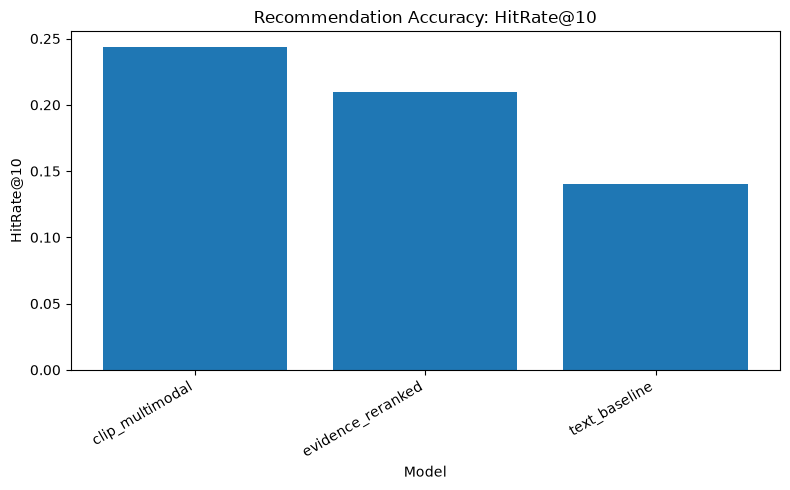

## 2. Evidence Reranking Weight Ablation

,model_name,alpha_clip,beta_evidence,hit_rate_at_1,hit_rate_at_5,hit_rate_at_10,ndcg_at_5,ndcg_at_10,top_positive_rank
6,clip_only,1.00,0.00,0.053333,0.163333,0.243333,0.098090,0.119958,36.300000
5,alpha_0.95_beta_0.05,0.95,0.05,0.053333,0.156667,0.236667,0.094231,0.116061,36.326667
4,alpha_0.90_beta_0.10,0.90,0.10,0.050000,0.156667,0.233333,0.093203,0.113904,36.323333
3,alpha_0.80_beta_0.20,0.80,0.20,0.050000,0.140000,0.216667,0.085911,0.108479,36.480000
1,alpha_0.65_beta_0.35,0.65,0.35,0.040000,0.136667,0.210000,0.078847,0.099917,37.573333
2,alpha_0.70_beta_0.30,0.70,0.30,0.043333,0.143333,0.203333,0.083409,0.101228,37.086667
0,alpha_0.50_beta_0.50,0.50,0.50,0.026667,0.113333,0.196667,0.062023,0.085682,39.313333



**Main finding:** The best ranking performance came from:

- Model: **clip_only**
- Alpha CLIP: **1.000**
- Beta evidence: **0.000**
- HitRate@10: **0.243**

The ablation shows that evidence is useful as a grounding signal, but larger evidence weights reduce pure ranking accuracy.


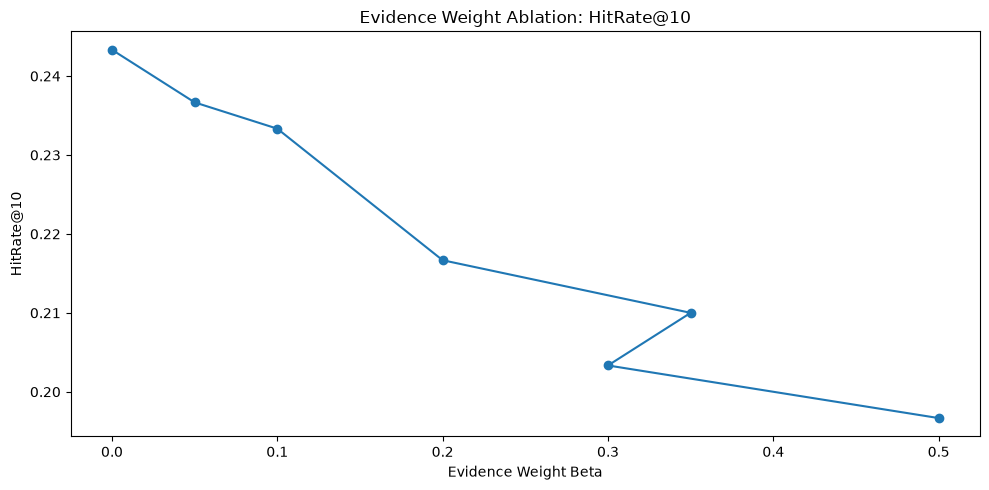

## 3. Evidence Retrieval / RAG Coverage

,target_category,evidence_coverage_rate,mean_retrieved_rule_count,mean_evidence_score,mean_high_reliability_rules,mean_medium_reliability_rules,mean_category_match_count,unique_rules_used,num_candidates
0,accessories,1.0,5.0,0.627701,3.5448,1.4552,5.0,26,2500
1,bottoms,1.0,5.0,0.636284,2.9616,2.0384,5.0,8,2500
2,outerwear,1.0,5.0,0.624550,3.3136,1.6864,5.0,12,2500
3,shoes,1.0,5.0,0.591529,2.7664,2.2336,5.0,20,2500
4,tops,1.0,5.0,0.555714,0.1648,4.8352,5.0,10,2500



**Main finding:** The evidence retriever achieved full evidence coverage across the balanced test set.

- Evidence coverage rate: **1.000**
- Mean retrieved rules per candidate: **5.000**
- Mean high-reliability rules per candidate: **2.550**
- Unique rules used: **76**

This supports the claim that the system consistently retrieves external fashion-rule evidence before reranking and explanation generation.


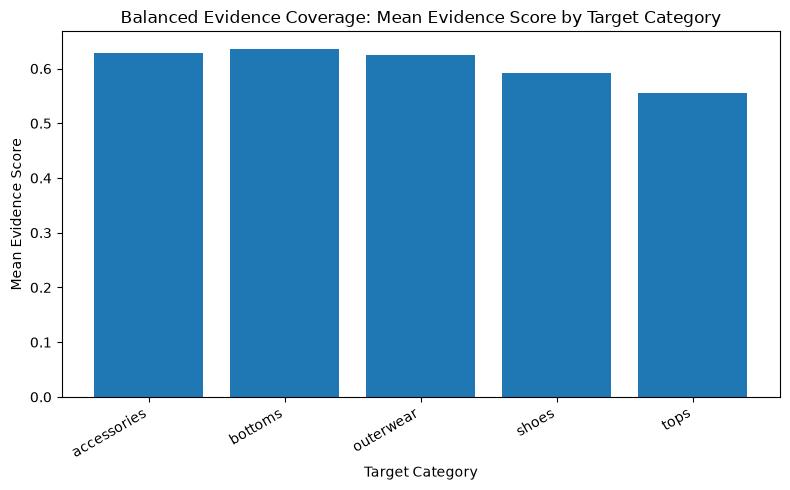

## 4. Explanation Faithfulness

,num_explanations,citation_presence_rate,citation_correctness_rate,mean_citation_precision,mean_citation_recall,mean_unsupported_claim_count,mean_occasion_drift_count,mean_evidence_overlap
0,30,1.0,1.0,1.0,1.0,0.0,0.566667,0.218548



**Main finding:** The explanation pipeline produced correctly cited explanations.

- Citation presence rate: **1.000**
- Citation correctness rate: **1.000**
- Mean unsupported claim count: **0.000**
- Mean occasion drift count: **0.567**
- Mean evidence overlap: **0.219**

The citation-control mechanism prevents hallucinated rule citations. The main remaining weakness is occasional occasion drift.


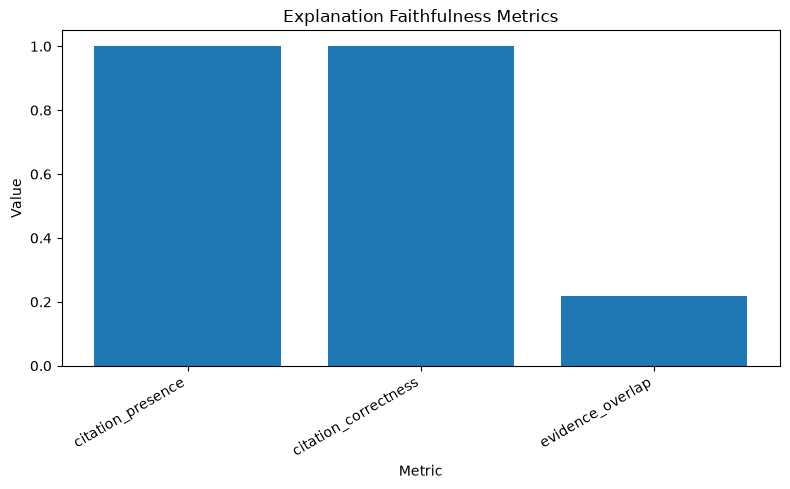

## 5. Final Combined Evaluation Summary

,evaluation_area,metric_group,main_result,key_metric,value,interpretation
0,Recommendation accuracy,Best ranking model,CLIP multimodal achieved the best ranking accuracy.,HitRate@10,0.243333,Multimodal image-text retrieval improves over text-only retrieval.
1,Recommendation accuracy,Text baseline comparison,Text-only baseline performed lowest among the compared models.,HitRate@10,0.140000,Text-only item descriptions are weaker than multimodal CLIP representations.
2,Evidence reranking,Accuracy trade-off,Evidence reranking improved grounding but reduced ranking accuracy compared with CLIP-only.,Best ablation HitRate@10,0.243333,"Evidence is useful as a grounding signal, but high evidence weights can reduce retrieval accuracy."
3,Evidence retrieval,Evidence coverage,The RAG component retrieved evidence for all tested recommendation candidates.,Evidence coverage rate,1.000000,The knowledge base is consistently available to support reranking and explanations.
4,Evidence retrieval,Rule reliability,Retrieved evidence included high-reliability rules on average.,Mean high-reliability rules,2.550240,Recommendations are generally supported by multiple reliable fashion rules.
5,Explanation faithfulness,Citation grounding,Generated explanations always included valid retrieved rule citations.,Citation correctness rate,1.000000,The citation-control mechanism prevents hallucinated rule citations.
6,Explanation faithfulness,Unsupported claims,No unsupported claim terms were detected in the tested explanations.,Mean unsupported claim count,0.000000,The explanation prompt and cleaning rules reduce unsupported stylistic claims.
7,Explanation faithfulness,Occasion drift,Some occasion drift remained in generated explanations.,Mean occasion drift count,0.566667,The explanation generator still sometimes uses broad occasion words not directly required by the query.


Saved final evaluation dashboard:
outputs\results\final_evaluation_dashboard.md
outputs\figures\final_dashboard_recommendation_hitrate10.png
outputs\figures\final_dashboard_weight_ablation_hitrate10.png
outputs\figures\final_dashboard_evidence_score_by_category.png
outputs\figures\final_dashboard_faithfulness_metrics.png


In [81]:
# Cell 82: Final evaluation dashboard
# RUN AFTER ALL EVALUATION CELLS ARE COMPLETE

from IPython.display import display, Markdown


def format_metric(value, decimals=3):
    """
    Format numeric metrics safely.
    """
    try:
        return f"{float(value):.{decimals}f}"
    except Exception:
        return str(value)


print("=" * 80)
print("FINAL EVALUATION DASHBOARD")
print("=" * 80)


# ------------------------------------------------------------
# 1. Recommendation accuracy summary
# ------------------------------------------------------------

display(Markdown("## 1. Recommendation Accuracy Summary"))

recommendation_dashboard_df = compact_metric_summary_df.copy()

display(recommendation_dashboard_df)

clip_hit10 = recommendation_dashboard_df.loc[
    recommendation_dashboard_df["model_name"] == "clip_multimodal",
    "hit_rate_at_10"
].iloc[0]

text_hit10 = recommendation_dashboard_df.loc[
    recommendation_dashboard_df["model_name"] == "text_baseline",
    "hit_rate_at_10"
].iloc[0]

evidence_hit10 = recommendation_dashboard_df.loc[
    recommendation_dashboard_df["model_name"] == "evidence_reranked",
    "hit_rate_at_10"
].iloc[0]

display(Markdown(f"""
**Main finding:** CLIP multimodal retrieval achieved the strongest recommendation accuracy.

- Text-only HitRate@10: **{format_metric(text_hit10)}**
- CLIP multimodal HitRate@10: **{format_metric(clip_hit10)}**
- Evidence-reranked HitRate@10: **{format_metric(evidence_hit10)}**

This supports the use of multimodal image-text retrieval for complementary fashion recommendation.
"""))


# Plot recommendation HitRate@10
plt.figure(figsize=(8, 5))
plt.bar(
    recommendation_dashboard_df["model_name"],
    recommendation_dashboard_df["hit_rate_at_10"],
)
plt.title("Recommendation Accuracy: HitRate@10")
plt.xlabel("Model")
plt.ylabel("HitRate@10")
plt.xticks(rotation=30, ha="right")
plt.tight_layout()

recommendation_plot_path = FIGURES_DIR / "final_dashboard_recommendation_hitrate10.png"
plt.savefig(recommendation_plot_path, dpi=300, bbox_inches="tight")
plt.show()


# ------------------------------------------------------------
# 2. Weight ablation summary
# ------------------------------------------------------------

display(Markdown("## 2. Evidence Reranking Weight Ablation"))

weight_dashboard_df = weight_ablation_summary_df.copy()

display(weight_dashboard_df)

best_weight_row = weight_dashboard_df.sort_values(
    ["hit_rate_at_10", "ndcg_at_10"],
    ascending=False,
).iloc[0]

display(Markdown(f"""
**Main finding:** The best ranking performance came from:

- Model: **{best_weight_row["model_name"]}**
- Alpha CLIP: **{format_metric(best_weight_row["alpha_clip"])}**
- Beta evidence: **{format_metric(best_weight_row["beta_evidence"])}**
- HitRate@10: **{format_metric(best_weight_row["hit_rate_at_10"])}**

The ablation shows that evidence is useful as a grounding signal, but larger evidence weights reduce pure ranking accuracy.
"""))


# Plot weight ablation HitRate@10
plt.figure(figsize=(10, 5))
plt.plot(
    weight_dashboard_df["beta_evidence"],
    weight_dashboard_df["hit_rate_at_10"],
    marker="o",
)
plt.title("Evidence Weight Ablation: HitRate@10")
plt.xlabel("Evidence Weight Beta")
plt.ylabel("HitRate@10")
plt.tight_layout()

weight_plot_path = FIGURES_DIR / "final_dashboard_weight_ablation_hitrate10.png"
plt.savefig(weight_plot_path, dpi=300, bbox_inches="tight")
plt.show()


# ------------------------------------------------------------
# 3. Evidence retrieval / RAG coverage
# ------------------------------------------------------------

display(Markdown("## 3. Evidence Retrieval / RAG Coverage"))

display(balanced_evidence_coverage_by_category_df)

evidence_coverage_rate = balanced_evidence_coverage_summary_df["evidence_coverage_rate"].iloc[0]
mean_rule_count = balanced_evidence_coverage_summary_df["mean_retrieved_rule_count"].iloc[0]
mean_high_reliability = balanced_evidence_coverage_summary_df["mean_high_reliability_rules"].iloc[0]
unique_rules_used = balanced_evidence_coverage_summary_df["unique_rules_used"].iloc[0]

display(Markdown(f"""
**Main finding:** The evidence retriever achieved full evidence coverage across the balanced test set.

- Evidence coverage rate: **{format_metric(evidence_coverage_rate)}**
- Mean retrieved rules per candidate: **{format_metric(mean_rule_count)}**
- Mean high-reliability rules per candidate: **{format_metric(mean_high_reliability)}**
- Unique rules used: **{unique_rules_used}**

This supports the claim that the system consistently retrieves external fashion-rule evidence before reranking and explanation generation.
"""))


# Plot mean evidence score by target category
plt.figure(figsize=(8, 5))
plt.bar(
    balanced_evidence_coverage_by_category_df["target_category"],
    balanced_evidence_coverage_by_category_df["mean_evidence_score"],
)
plt.title("Balanced Evidence Coverage: Mean Evidence Score by Target Category")
plt.xlabel("Target Category")
plt.ylabel("Mean Evidence Score")
plt.xticks(rotation=30, ha="right")
plt.tight_layout()

evidence_plot_path = FIGURES_DIR / "final_dashboard_evidence_score_by_category.png"
plt.savefig(evidence_plot_path, dpi=300, bbox_inches="tight")
plt.show()


# ------------------------------------------------------------
# 4. Explanation faithfulness
# ------------------------------------------------------------

display(Markdown("## 4. Explanation Faithfulness"))

display(faithfulness_summary_df)

citation_correctness = faithfulness_summary_df["citation_correctness_rate"].iloc[0]
citation_presence = faithfulness_summary_df["citation_presence_rate"].iloc[0]
unsupported_claims = faithfulness_summary_df["mean_unsupported_claim_count"].iloc[0]
occasion_drift = faithfulness_summary_df["mean_occasion_drift_count"].iloc[0]
evidence_overlap = faithfulness_summary_df["mean_evidence_overlap"].iloc[0]

display(Markdown(f"""
**Main finding:** The explanation pipeline produced correctly cited explanations.

- Citation presence rate: **{format_metric(citation_presence)}**
- Citation correctness rate: **{format_metric(citation_correctness)}**
- Mean unsupported claim count: **{format_metric(unsupported_claims)}**
- Mean occasion drift count: **{format_metric(occasion_drift)}**
- Mean evidence overlap: **{format_metric(evidence_overlap)}**

The citation-control mechanism prevents hallucinated rule citations. The main remaining weakness is occasional occasion drift.
"""))


# Plot faithfulness metrics
faithfulness_plot_df = pd.DataFrame([
    {
        "metric": "citation_presence",
        "value": citation_presence,
    },
    {
        "metric": "citation_correctness",
        "value": citation_correctness,
    },
    {
        "metric": "evidence_overlap",
        "value": evidence_overlap,
    },
])

plt.figure(figsize=(8, 5))
plt.bar(
    faithfulness_plot_df["metric"],
    faithfulness_plot_df["value"],
)
plt.title("Explanation Faithfulness Metrics")
plt.xlabel("Metric")
plt.ylabel("Value")
plt.xticks(rotation=30, ha="right")
plt.tight_layout()

faithfulness_plot_path = FIGURES_DIR / "final_dashboard_faithfulness_metrics.png"
plt.savefig(faithfulness_plot_path, dpi=300, bbox_inches="tight")
plt.show()


# ------------------------------------------------------------
# 5. Final combined dashboard table
# ------------------------------------------------------------

display(Markdown("## 5. Final Combined Evaluation Summary"))

display(final_evaluation_summary_df)


# ------------------------------------------------------------
# 6. Save markdown dashboard
# ------------------------------------------------------------

final_dashboard_notes = f"""
# Final Evaluation Dashboard

## Recommendation Accuracy

The controlled candidate-set evaluation showed that CLIP multimodal retrieval achieved the strongest ranking accuracy.

- Text-only HitRate@10: {format_metric(text_hit10)}
- CLIP multimodal HitRate@10: {format_metric(clip_hit10)}
- Evidence-reranked HitRate@10: {format_metric(evidence_hit10)}

This supports the use of multimodal image-text retrieval for complementary fashion recommendation.

## Evidence Reranking Weight Ablation

The weight ablation showed that CLIP-only ranking achieved the strongest pure retrieval performance. Small evidence weights remained close to CLIP-only performance, while larger evidence weights reduced HitRate and NDCG.

Best setting by HitRate@10:

- Model: {best_weight_row["model_name"]}
- Alpha CLIP: {format_metric(best_weight_row["alpha_clip"])}
- Beta evidence: {format_metric(best_weight_row["beta_evidence"])}
- HitRate@10: {format_metric(best_weight_row["hit_rate_at_10"])}

This shows an accuracy-grounding trade-off.

## Evidence Retrieval / RAG Coverage

The balanced evidence coverage analysis showed that evidence retrieval was available across all target categories.

- Evidence coverage rate: {format_metric(evidence_coverage_rate)}
- Mean retrieved rules per candidate: {format_metric(mean_rule_count)}
- Mean high-reliability rules per candidate: {format_metric(mean_high_reliability)}
- Unique rules used: {unique_rules_used}

This supports the claim that the system consistently retrieves external fashion evidence before explanation generation.

## Explanation Faithfulness

The explanation faithfulness evaluation showed strong citation grounding.

- Citation presence rate: {format_metric(citation_presence)}
- Citation correctness rate: {format_metric(citation_correctness)}
- Mean unsupported claim count: {format_metric(unsupported_claims)}
- Mean occasion drift count: {format_metric(occasion_drift)}
- Mean evidence overlap: {format_metric(evidence_overlap)}

The citation-control mechanism prevents hallucinated rule citations. Occasion drift remains a limitation.

## Overall Conclusion

The evaluation supports the thesis direction:

1. Multimodal CLIP retrieval improves recommendation accuracy over text-only retrieval.
2. Evidence retrieval provides consistent fashion-rule support.
3. Evidence-constrained explanation generation produces correctly cited explanations.
4. Evidence reranking introduces a trade-off: it improves grounding and interpretability, but does not currently outperform CLIP-only retrieval accuracy.
"""

final_dashboard_path = RESULTS_DIR / "final_evaluation_dashboard.md"

with open(final_dashboard_path, "w", encoding="utf-8") as f:
    f.write(final_dashboard_notes)

print("=" * 80)
print("Saved final evaluation dashboard:")
print(final_dashboard_path.relative_to(PROJECT_ROOT))
print(recommendation_plot_path.relative_to(PROJECT_ROOT))
print(weight_plot_path.relative_to(PROJECT_ROOT))
print(evidence_plot_path.relative_to(PROJECT_ROOT))
print(faithfulness_plot_path.relative_to(PROJECT_ROOT))
print("=" * 80)

In [82]:
# Cell 83: Paper experiment configuration
# RUN AFTER FINAL THESIS EVALUATION PIPELINE IS WORKING

PAPER_EXPERIMENT_DIR = RESULTS_DIR / "paper_experiments"
PAPER_FIGURES_DIR = FIGURES_DIR / "paper_experiments"

PAPER_EXPERIMENT_DIR.mkdir(parents=True, exist_ok=True)
PAPER_FIGURES_DIR.mkdir(parents=True, exist_ok=True)

PAPER_EXPERIMENT_CONFIG = {
    "paper_title": "Expert-Rule-Grounded RAG for Faithful Explanations in Multimodal Fashion Recommendation",
    "main_research_question": (
        "Can expert-authored styling rules improve the faithfulness and usefulness "
        "of recommendation explanations compared with ungrounded or item-description-grounded generation?"
    ),
    "grounding_variants": [
        "no_rag",
        "item_rag",
        "rule_rag",
        "hybrid_rag",
    ],
    "target_categories": [
        "shoes",
        "accessories",
        "tops",
        "bottoms",
        "outerwear",
    ],
    "cases_per_target_category": 10,
    "recommendations_per_case": 2,
    "item_rag_top_k": 5,
    "rule_rag_top_k": 5,
    "random_state": 42,
}

print("Paper experiment configuration:")
for key, value in PAPER_EXPERIMENT_CONFIG.items():
    print(f"{key}: {value}")

paper_config_path = PAPER_EXPERIMENT_DIR / "paper_experiment_config.json"

with open(paper_config_path, "w", encoding="utf-8") as f:
    json.dump(PAPER_EXPERIMENT_CONFIG, f, indent=2)

print("\nSaved paper experiment config:")
print(paper_config_path.relative_to(PROJECT_ROOT))

Paper experiment configuration:
paper_title: Expert-Rule-Grounded RAG for Faithful Explanations in Multimodal Fashion Recommendation
main_research_question: Can expert-authored styling rules improve the faithfulness and usefulness of recommendation explanations compared with ungrounded or item-description-grounded generation?
grounding_variants: ['no_rag', 'item_rag', 'rule_rag', 'hybrid_rag']
target_categories: ['shoes', 'accessories', 'tops', 'bottoms', 'outerwear']
cases_per_target_category: 10
recommendations_per_case: 2
item_rag_top_k: 5
rule_rag_top_k: 5
random_state: 42

Saved paper experiment config:
outputs\results\paper_experiments\paper_experiment_config.json


In [83]:
# Cell 84: Build item-description RAG corpus
# RUN AFTER TARGET ITEM EMBEDDINGS ARE AVAILABLE

def ensure_numpy_float32(array_like):
    """
    Convert tensors, arrays, or array-like objects into a float32 NumPy array.
    """
    if torch.is_tensor(array_like):
        array_like = array_like.detach().cpu().numpy()
    
    if isinstance(array_like, tuple):
        for item in array_like:
            if torch.is_tensor(item):
                return item.detach().cpu().numpy().astype("float32")
            if isinstance(item, np.ndarray) and np.issubdtype(item.dtype, np.number):
                return item.astype("float32")
        raise ValueError("Could not find numeric array inside tuple.")
    
    return np.asarray(array_like).astype("float32")


item_description_embeddings = ensure_numpy_float32(target_text_embeddings)

print("Item-description embedding shape:", item_description_embeddings.shape)


def build_item_grounding_text(row):
    """
    Build item/product-style grounding text from dataset metadata.
    """
    return (
        f"Item ID: {row['item_ID']}. "
        f"Category: {row['category']}. "
        f"Broad category: {row['broad_category']}. "
        f"Description: {row['text']}."
    )


item_rag_corpus_df = target_items_for_clip.copy().reset_index(drop=True)
item_rag_corpus_df["item_grounding_text"] = item_rag_corpus_df.apply(
    build_item_grounding_text,
    axis=1,
)

print("Item RAG corpus shape:", item_rag_corpus_df.shape)

display(
    item_rag_corpus_df[
        [
            "item_ID",
            "category",
            "broad_category",
            "text",
            "item_grounding_text",
        ]
    ].head()
)


# Build FAISS indexes by target category.
item_rag_category_indexes = {}
item_rag_category_row_lookup = {}

for category in PAPER_EXPERIMENT_CONFIG["target_categories"]:
    category_mask = item_rag_corpus_df["broad_category"] == category
    category_rows = np.where(category_mask.values)[0]
    
    category_embeddings = item_description_embeddings[category_rows].astype("float32")
    
    index = faiss.IndexFlatIP(category_embeddings.shape[1])
    index.add(category_embeddings)
    
    item_rag_category_indexes[category] = index
    item_rag_category_row_lookup[category] = category_rows
    
    print(
        f"{category:12s} | rows: {len(category_rows):6d} | "
        f"index size: {index.ntotal:6d}"
    )


def retrieve_item_rag_evidence(
    query_item_row,
    candidate_row,
    user_text,
    target_category,
    top_k=5,
):
    """
    Retrieve item-description evidence for a query-candidate pair.

    This is the product/item metadata grounding baseline.
    """
    retrieval_query = (
        f"Query item: {query_item_row['category']} - {query_item_row['text']}. "
        f"Recommended item: {candidate_row['category']} - {candidate_row['text']}. "
        f"User request: {user_text}. "
        f"Target category: {target_category}."
    )
    
    query_embedding = text_embedding_model.encode(
        [retrieval_query],
        normalize_embeddings=True,
        convert_to_numpy=True,
    ).astype("float32")
    
    if target_category not in item_rag_category_indexes:
        raise ValueError(f"Unknown target category: {target_category}")
    
    search_k = min(
        top_k + 10,
        item_rag_category_indexes[target_category].ntotal,
    )
    
    scores, local_indices = item_rag_category_indexes[target_category].search(
        query_embedding,
        search_k,
    )
    
    global_rows = item_rag_category_row_lookup[target_category][local_indices[0]]
    
    evidence_df = item_rag_corpus_df.iloc[global_rows].copy()
    evidence_df["item_evidence_score"] = scores[0]
    
    # Avoid using the recommended item itself as its own evidence.
    evidence_df = evidence_df[
        evidence_df["item_ID"] != candidate_row["item_ID"]
    ].copy()
    
    evidence_df = evidence_df.head(top_k).reset_index(drop=True)
    evidence_df["item_evidence_rank"] = np.arange(1, len(evidence_df) + 1)
    
    return evidence_df[
        [
            "item_evidence_rank",
            "item_ID",
            "category",
            "broad_category",
            "text",
            "item_grounding_text",
            "item_evidence_score",
        ]
    ]


# Quick sanity test
paper_test_query_item = get_query_item_by_id("100002074_1")

paper_test_candidate = retrieve_clip_candidate_pool(
    query_item_id="100002074_1",
    user_text="recommend smart casual shoes",
    target_category="shoes",
    candidate_pool_size=3,
    exclude_same_outfit=True,
)["candidate_pool"].iloc[0]

item_evidence_test = retrieve_item_rag_evidence(
    query_item_row=paper_test_query_item,
    candidate_row=paper_test_candidate,
    user_text="recommend smart casual shoes",
    target_category="shoes",
    top_k=5,
)

print("\nItem-description evidence test:")
display(item_evidence_test)

Item-description embedding shape: (67524, 384)
Item RAG corpus shape: (67524, 10)


,item_ID,category,broad_category,text,item_grounding_text
0,100002074_2,Boots,shoes,michael kors leather over-the-knee boots,Item ID: 100002074_2. Category: Boots. Broad category: shoes. Description: michael kors leather over-the-knee boots.
1,100002074_3,Handbags,accessories,givenchy leather medium antigona duffel black,Item ID: 100002074_3. Category: Handbags. Broad category: accessories. Description: givenchy leather medium antigona...
2,100002074_4,Sunglasses,accessories,bottega veneta acetate leather sunglasses,Item ID: 100002074_4. Category: Sunglasses. Broad category: accessories. Description: bottega veneta acetate leather...
3,100002074_7,Coats,outerwear,miranda coat,Item ID: 100002074_7. Category: Coats. Broad category: outerwear. Description: miranda coat.
4,100010727_1,Blazers,outerwear,three pocket blazer,Item ID: 100010727_1. Category: Blazers. Broad category: outerwear. Description: three pocket blazer.


shoes        | rows:  12635 | index size:  12635
accessories  | rows:  29566 | index size:  29566
tops         | rows:  10915 | index size:  10915
bottoms      | rows:   9247 | index size:   9247
outerwear    | rows:   5161 | index size:   5161

Item-description evidence test:


,item_evidence_rank,item_ID,category,broad_category,text,item_grounding_text,item_evidence_score
0,1,216562815_5,Sandals,shoes,tibi sandals,Item ID: 216562815_5. Category: Sandals. Broad category: shoes. Description: tibi sandals.,0.637561
1,2,208659502_2,Sandals,shoes,satin toe bow sandals rhinestone platform white wedding evening shoes high heel wedding evening evening shoes high h...,Item ID: 208659502_2. Category: Sandals. Broad category: shoes. Description: satin toe bow sandals rhinestone platfo...,0.631504
2,3,133051772_3,Sandals,shoes,tibi amber sandals,Item ID: 133051772_3. Category: Sandals. Broad category: shoes. Description: tibi amber sandals.,0.610401
3,4,146551992_2,Sandals,shoes,tibi heel,Item ID: 146551992_2. Category: Sandals. Broad category: shoes. Description: tibi heel.,0.604087
4,5,200525412_3,Sandals,shoes,tibi mint sandals,Item ID: 200525412_3. Category: Sandals. Broad category: shoes. Description: tibi mint sandals.,0.603434


In [84]:
# Cell 85: Build fixed paper explanation dataset
# RUN AFTER ITEM-RAG AND RULE-RAG RETRIEVAL FUNCTIONS ARE AVAILABLE

def sample_balanced_paper_cases(
    evaluation_cases,
    cases_per_target_category=10,
    random_state=42,
):
    """
    Sample balanced query cases across target categories for paper explanation experiments.
    """
    sampled_case_groups = []
    
    for target_category in PAPER_EXPERIMENT_CONFIG["target_categories"]:
        category_cases = evaluation_cases[
            evaluation_cases["target_category"] == target_category
        ].copy()
        
        if category_cases.empty:
            continue
        
        sample_size = min(cases_per_target_category, len(category_cases))
        
        sampled_cases = category_cases.sample(
            n=sample_size,
            random_state=random_state,
        )
        
        sampled_case_groups.append(sampled_cases)
    
    paper_cases_df = (
        pd.concat(sampled_case_groups, ignore_index=True)
        .sample(frac=1.0, random_state=random_state)
        .reset_index(drop=True)
    )
    
    return paper_cases_df


def compress_rule_evidence_for_paper(evidence_df):
    """
    Convert retrieved expert-rule evidence into compact text for paper experiments.
    """
    if evidence_df is None or evidence_df.empty:
        return ""
    
    evidence_lines = []
    
    for _, rule_row in evidence_df.iterrows():
        evidence_lines.append(
            f"{rule_row['rule_id']}: "
            f"{rule_row['rule_text']} "
            f"[source reliability: {rule_row.get('source_reliability', 'unknown')}; "
            f"source type: {rule_row.get('source_type', 'unknown')}]"
        )
    
    return "\n".join(evidence_lines)


def compress_item_evidence_for_paper(evidence_df):
    """
    Convert retrieved item-description evidence into compact text for paper experiments.
    """
    if evidence_df is None or evidence_df.empty:
        return ""
    
    evidence_lines = []
    
    for _, item_row in evidence_df.iterrows():
        evidence_lines.append(
            f"ITEM-{item_row['item_evidence_rank']}: "
            f"{item_row['category']} - {item_row['text']}"
        )
    
    return "\n".join(evidence_lines)


def build_fixed_paper_explanation_dataset(
    evaluation_cases,
    cases_per_target_category=10,
    recommendations_per_case=2,
    item_rag_top_k=5,
    rule_rag_top_k=5,
    random_state=42,
):
    """
    Build fixed query-recommendation pairs for corpus-ablation explanation experiments.

    For each case:
    - retrieve fixed CLIP recommendations
    - retrieve item-description evidence
    - retrieve expert-rule evidence
    - store all evidence for later explanation generation
    """
    sampled_cases_df = sample_balanced_paper_cases(
        evaluation_cases=evaluation_cases,
        cases_per_target_category=cases_per_target_category,
        random_state=random_state,
    )
    
    rows = []
    error_rows = []
    
    for case_index, case in tqdm(
        sampled_cases_df.iterrows(),
        total=len(sampled_cases_df),
        desc="Building fixed paper explanation dataset",
    ):
        try:
            query_item_row = get_query_item_by_id(case["query_item_id"])
            user_text = case["user_request"]
            target_category = case["target_category"]
            
            candidate_pool_result = retrieve_clip_candidate_pool(
                query_item_id=case["query_item_id"],
                user_text=user_text,
                target_category=target_category,
                candidate_pool_size=recommendations_per_case,
                exclude_same_outfit=True,
            )
            
            fixed_recommendations_df = candidate_pool_result["candidate_pool"].copy()
            
            for recommendation_rank, (_, candidate_row) in enumerate(
                fixed_recommendations_df.iterrows(),
                start=1,
            ):
                rule_evidence_df = retrieve_candidate_evidence(
                    query_item_row=query_item_row,
                    candidate_row=candidate_row,
                    user_text=user_text,
                    target_category=target_category,
                    top_n=rule_rag_top_k,
                )
                
                item_evidence_df = retrieve_item_rag_evidence(
                    query_item_row=query_item_row,
                    candidate_row=candidate_row,
                    user_text=user_text,
                    target_category=target_category,
                    top_k=item_rag_top_k,
                )
                
                rule_evidence_text = compress_rule_evidence_for_paper(rule_evidence_df)
                item_evidence_text = compress_item_evidence_for_paper(item_evidence_df)
                
                rule_ids = (
                    ", ".join(rule_evidence_df["rule_id"].astype(str).tolist())
                    if isinstance(rule_evidence_df, pd.DataFrame) and not rule_evidence_df.empty
                    else ""
                )
                
                rows.append({
                    "paper_case_id": f"C{case_index:03d}_R{recommendation_rank}",
                    "case_index": case_index,
                    "recommendation_rank": recommendation_rank,
                    "query_item_id": query_item_row["item_ID"],
                    "query_category": query_item_row["category"],
                    "query_group": query_item_row["query_category"],
                    "query_text": query_item_row["text"],
                    "user_request": user_text,
                    "target_category": target_category,
                    "recommended_item_id": candidate_row["item_ID"],
                    "recommended_category": candidate_row["category"],
                    "recommended_group": candidate_row["broad_category"],
                    "recommended_text": candidate_row["text"],
                    "clip_multimodal_score": candidate_row.get("clip_multimodal_score", np.nan),
                    "rule_evidence_ids": rule_ids,
                    "rule_evidence_text": rule_evidence_text,
                    "item_evidence_text": item_evidence_text,
                    "hybrid_evidence_text": (
                        "Expert styling rules:\n"
                        f"{rule_evidence_text}\n\n"
                        "Similar item descriptions:\n"
                        f"{item_evidence_text}"
                    ),
                })
        
        except Exception as error:
            error_rows.append({
                "case_index": case_index,
                "query_item_id": case.get("query_item_id", ""),
                "target_category": case.get("target_category", ""),
                "error": repr(error),
            })
    
    return pd.DataFrame(rows), pd.DataFrame(error_rows)


paper_explanation_dataset_df, paper_explanation_dataset_errors_df = build_fixed_paper_explanation_dataset(
    evaluation_cases=evaluation_cases_df,
    cases_per_target_category=PAPER_EXPERIMENT_CONFIG["cases_per_target_category"],
    recommendations_per_case=PAPER_EXPERIMENT_CONFIG["recommendations_per_case"],
    item_rag_top_k=PAPER_EXPERIMENT_CONFIG["item_rag_top_k"],
    rule_rag_top_k=PAPER_EXPERIMENT_CONFIG["rule_rag_top_k"],
    random_state=PAPER_EXPERIMENT_CONFIG["random_state"],
)

print("Paper explanation dataset shape:", paper_explanation_dataset_df.shape)
print("Paper explanation dataset errors shape:", paper_explanation_dataset_errors_df.shape)

if not paper_explanation_dataset_errors_df.empty:
    print("\nPaper explanation dataset errors:")
    display(paper_explanation_dataset_errors_df.head(20))

print("\nCases by target category:")
display(
    paper_explanation_dataset_df["target_category"]
    .value_counts()
    .rename_axis("target_category")
    .reset_index(name="num_recommendation_pairs")
)

display(
    paper_explanation_dataset_df[
        [
            "paper_case_id",
            "query_text",
            "user_request",
            "target_category",
            "recommended_text",
            "rule_evidence_ids",
        ]
    ].head(10)
)

paper_explanation_dataset_path = PAPER_EXPERIMENT_DIR / "fixed_paper_explanation_dataset.csv"
paper_explanation_dataset_errors_path = PAPER_EXPERIMENT_DIR / "fixed_paper_explanation_dataset_errors.csv"

paper_explanation_dataset_df.to_csv(paper_explanation_dataset_path, index=False)
paper_explanation_dataset_errors_df.to_csv(paper_explanation_dataset_errors_path, index=False)

print("\nSaved fixed paper explanation dataset:")
print(paper_explanation_dataset_path.relative_to(PROJECT_ROOT))
print(paper_explanation_dataset_errors_path.relative_to(PROJECT_ROOT))

Building fixed paper explanation dataset:   0%|          | 0/50 [00:00<?, ?it/s]

Paper explanation dataset shape: (100, 18)
Paper explanation dataset errors shape: (0, 0)

Cases by target category:


,target_category,num_recommendation_pairs
0,accessories,20
1,bottoms,20
2,outerwear,20
3,tops,20
4,shoes,20


,paper_case_id,query_text,user_request,target_category,recommended_text,rule_evidence_ids
0,C000_R1,tom ford sunglasses faded lenses,recommend accessories that complete this outfit,accessories,fendi cat-eye acetate sunglasses,"R072, R062, R064, R075, R023"
1,C000_R2,tom ford sunglasses faded lenses,recommend accessories that complete this outfit,accessories,tom ford lilly cat eye sunglasses,"R072, R064, R075, R074, R062"
2,C001_R1,new look light brown ring back layered cami,recommend bottoms that work with this outfit,bottoms,river island beige jersey belted maxi skirt,"R052, R046, R079, R048, R050"
3,C001_R2,new look light brown ring back layered cami,recommend bottoms that work with this outfit,bottoms,camel scallop hem skirt,"R052, R046, R079, R050, R048"
4,C002_R1,embroidered distressed denim jacket,recommend bottoms that work with this outfit,bottoms,shein sheinside blue bleached ripped pockets denim pant,"R046, R052, R050, R079, R048"
5,C002_R2,embroidered distressed denim jacket,recommend bottoms that work with this outfit,bottoms,ripped bleach wash asymmetric jeans,"R052, R046, R050, R079, R048"
6,C003_R1,freshwater green pearl necklace,recommend outerwear that works with this outfit,outerwear,women's coats new year,"R012, R017, R080, R054, R015"
7,C003_R2,freshwater green pearl necklace,recommend outerwear that works with this outfit,outerwear,armani beaded shawl,"R012, R017, R054, R011, R080"
8,C004_R1,saint laurent signature studded boots,recommend accessories that complete this outfit,accessories,saint laurent medium bucket bag,"R066, R072, R065, R078, R062"
9,C004_R2,saint laurent signature studded boots,recommend accessories that complete this outfit,accessories,rebecca minkoff micro bucket women shoulder bag,"R066, R069, R072, R067, R022"



Saved fixed paper explanation dataset:
outputs\results\paper_experiments\fixed_paper_explanation_dataset.csv
outputs\results\paper_experiments\fixed_paper_explanation_dataset_errors.csv


In [85]:
# Cell 86: Define paper explanation prompts
# RUN AFTER FIXED PAPER EXPLANATION DATASET IS BUILT

def clean_paper_explanation(text):
    """
    Clean generated explanation text for paper experiments.
    """
    if text is None:
        return ""
    
    text = str(text).strip()
    
    # Remove repeated whitespace
    text = re.sub(r"\s+", " ", text)
    
    # Remove item ID mentions
    text = re.sub(r"\b\d{6,}_\d+\b", "", text)
    
    # Remove retailer-style wording
    replacements = {
        "our recommendation": "the recommendation",
        "our recommended": "the recommended",
        "we recommend": "this recommends",
        "I recommend": "this recommends",
    }
    
    for old, new in replacements.items():
        text = re.sub(old, new, text, flags=re.IGNORECASE)
    
    return text.strip()


def build_no_rag_explanation_prompt(row):
    """
    Build a prompt for ungrounded explanation generation.
    This variant receives no external evidence.
    """
    return f"""
You are generating a fashion recommendation explanation.

Variant: No external grounding.

Query item:
- Category: {row['query_category']}
- Description: {row['query_text']}

User request:
{row['user_request']}

Recommended item:
- Category: {row['recommended_category']}
- Description: {row['recommended_text']}

Instructions:
- Write exactly 2 sentences.
- Explain why the recommended item suits the query item and request.
- Do not cite any evidence.
- Do not mention item IDs.
- Do not say that you have external evidence.
- Avoid exaggerated claims such as perfect, must-have, guaranteed, luxurious, or flattering.
""".strip()


def build_item_rag_explanation_prompt(row):
    """
    Build a prompt for item-description-grounded explanation generation.
    """
    return f"""
You are generating a fashion recommendation explanation.

Variant: Item-description grounding.

Query item:
- Category: {row['query_category']}
- Description: {row['query_text']}

User request:
{row['user_request']}

Recommended item:
- Category: {row['recommended_category']}
- Description: {row['recommended_text']}

Retrieved item-description evidence:
{row['item_evidence_text']}

Instructions:
- Write exactly 2 sentences.
- Use only the query item, recommended item, user request, and retrieved item-description evidence.
- Do not use external fashion rules.
- Do not cite rule IDs.
- Do not mention item IDs.
- Avoid exaggerated claims such as perfect, must-have, guaranteed, luxurious, or flattering.
""".strip()


def build_rule_rag_explanation_prompt(row):
    """
    Build a prompt for expert-rule-grounded explanation generation.
    """
    return f"""
You are generating a fashion recommendation explanation.

Variant: Expert-rule grounding.

Query item:
- Category: {row['query_category']}
- Description: {row['query_text']}

User request:
{row['user_request']}

Recommended item:
- Category: {row['recommended_category']}
- Description: {row['recommended_text']}

Retrieved expert styling rules:
{row['rule_evidence_text']}

Instructions:
- Write exactly 2 sentences.
- Use only the query item, recommended item, user request, and retrieved expert styling rules.
- Do not copy the rules word-for-word.
- Do not invent unsupported occasions, materials, comfort claims, or body-shape claims.
- Do not mention item IDs.
- At the end of the explanation, cite the top two retrieved rule IDs in this exact format: [Rxxx, Rxxx].
""".strip()


def build_hybrid_rag_explanation_prompt(row):
    """
    Build a prompt for hybrid item-description + expert-rule grounding.
    """
    return f"""
You are generating a fashion recommendation explanation.

Variant: Hybrid grounding.

Query item:
- Category: {row['query_category']}
- Description: {row['query_text']}

User request:
{row['user_request']}

Recommended item:
- Category: {row['recommended_category']}
- Description: {row['recommended_text']}

Retrieved evidence:
{row['hybrid_evidence_text']}

Instructions:
- Write exactly 2 sentences.
- Use item-description evidence for product-specific detail.
- Use expert styling rules for styling justification.
- Do not copy evidence word-for-word.
- Do not invent unsupported occasions, materials, comfort claims, or body-shape claims.
- Do not mention item IDs.
- At the end of the explanation, cite the top two retrieved rule IDs in this exact format: [Rxxx, Rxxx].
""".strip()


def build_paper_explanation_prompt(row, variant):
    """
    Dispatch prompt builder by grounding variant.
    """
    if variant == "no_rag":
        return build_no_rag_explanation_prompt(row)
    
    if variant == "item_rag":
        return build_item_rag_explanation_prompt(row)
    
    if variant == "rule_rag":
        return build_rule_rag_explanation_prompt(row)
    
    if variant == "hybrid_rag":
        return build_hybrid_rag_explanation_prompt(row)
    
    raise ValueError(f"Unknown explanation variant: {variant}")


# Sanity check
sample_paper_row = paper_explanation_dataset_df.iloc[0]

for variant in PAPER_EXPERIMENT_CONFIG["grounding_variants"]:
    print("=" * 80)
    print("Variant:", variant)
    print(build_paper_explanation_prompt(sample_paper_row, variant)[:1200])
    print()

Variant: no_rag
You are generating a fashion recommendation explanation.

Variant: No external grounding.

Query item:
- Category: Sunglasses
- Description: tom ford sunglasses faded lenses

User request:
recommend accessories that complete this outfit

Recommended item:
- Category: Sunglasses
- Description: fendi cat-eye acetate sunglasses

Instructions:
- Write exactly 2 sentences.
- Explain why the recommended item suits the query item and request.
- Do not cite any evidence.
- Do not mention item IDs.
- Do not say that you have external evidence.
- Avoid exaggerated claims such as perfect, must-have, guaranteed, luxurious, or flattering.

Variant: item_rag
You are generating a fashion recommendation explanation.

Variant: Item-description grounding.

Query item:
- Category: Sunglasses
- Description: tom ford sunglasses faded lenses

User request:
recommend accessories that complete this outfit

Recommended item:
- Category: Sunglasses
- Description: fendi cat-eye acetate sunglasses

In [86]:
# Cell 87: Generate corpus-ablation explanations
# RUN AFTER PAPER EXPLANATION PROMPTS ARE DEFINED

def enforce_rule_citations_for_paper(explanation_text, rule_evidence_ids, variant):
    """
    Ensure rule-based variants cite only retrieved rule IDs.
    No-RAG and Item-RAG variants should not receive rule citations.
    """
    explanation_text = clean_paper_explanation(explanation_text)
    
    if variant not in {"rule_rag", "hybrid_rag"}:
        # Remove accidental rule citations from non-rule variants.
        explanation_text = re.sub(r"\s*\[R\d+(?:,\s*R\d+)*\]\s*$", "", explanation_text)
        return explanation_text.strip()
    
    retrieved_rule_ids = parse_rule_id_list(rule_evidence_ids)
    top_two_rule_ids = retrieved_rule_ids[:2]
    
    if not top_two_rule_ids:
        return explanation_text
    
    # Remove any existing final citation, then append true retrieved citations.
    explanation_text = re.sub(r"\s*\[R\d+(?:,\s*R\d+)*\]\s*$", "", explanation_text).strip()
    
    return f"{explanation_text} [{', '.join(top_two_rule_ids)}]"


def generate_one_paper_explanation(row, variant, temperature=0.2, max_tokens=140):
    """
    Generate one explanation for one grounding variant.
    """
    prompt = build_paper_explanation_prompt(row, variant)
    
    generated_text = ollama_generate(
        prompt=prompt,
        model_name=OLLAMA_MODEL_NAME,
        temperature=temperature,
        max_tokens=max_tokens,
    )
    
    generated_text = enforce_rule_citations_for_paper(
        explanation_text=generated_text,
        rule_evidence_ids=row.get("rule_evidence_ids", ""),
        variant=variant,
    )
    
    return generated_text


def generate_paper_explanation_ablation_dataset(
    paper_dataset_df,
    variants,
    temperature=0.2,
    max_tokens=140,
):
    """
    Generate explanations for all fixed query-recommendation pairs and grounding variants.
    """
    rows = []
    error_rows = []
    
    total_generations = len(paper_dataset_df) * len(variants)
    
    progress_bar = tqdm(
        total=total_generations,
        desc="Generating paper explanation variants",
    )
    
    for row_index, row in paper_dataset_df.iterrows():
        for variant in variants:
            try:
                explanation = generate_one_paper_explanation(
                    row=row,
                    variant=variant,
                    temperature=temperature,
                    max_tokens=max_tokens,
                )
                
                rows.append({
                    "paper_case_id": row["paper_case_id"],
                    "grounding_variant": variant,
                    "query_item_id": row["query_item_id"],
                    "query_category": row["query_category"],
                    "query_text": row["query_text"],
                    "user_request": row["user_request"],
                    "target_category": row["target_category"],
                    "recommended_item_id": row["recommended_item_id"],
                    "recommended_category": row["recommended_category"],
                    "recommended_text": row["recommended_text"],
                    "rule_evidence_ids": row["rule_evidence_ids"],
                    "rule_evidence_text": row["rule_evidence_text"],
                    "item_evidence_text": row["item_evidence_text"],
                    "hybrid_evidence_text": row["hybrid_evidence_text"],
                    "generated_explanation": explanation,
                })
            
            except Exception as error:
                error_rows.append({
                    "paper_case_id": row.get("paper_case_id", ""),
                    "grounding_variant": variant,
                    "error": repr(error),
                })
            
            progress_bar.update(1)
    
    progress_bar.close()
    
    return pd.DataFrame(rows), pd.DataFrame(error_rows)


paper_explanation_ablation_df, paper_explanation_ablation_errors_df = generate_paper_explanation_ablation_dataset(
    paper_dataset_df=paper_explanation_dataset_df,
    variants=PAPER_EXPERIMENT_CONFIG["grounding_variants"],
    temperature=0.2,
    max_tokens=140,
)

print("Paper explanation ablation shape:", paper_explanation_ablation_df.shape)
print("Paper explanation ablation errors shape:", paper_explanation_ablation_errors_df.shape)

if not paper_explanation_ablation_errors_df.empty:
    print("\nGeneration errors:")
    display(paper_explanation_ablation_errors_df.head(20))

print("\nGenerated explanations by variant:")
display(
    paper_explanation_ablation_df["grounding_variant"]
    .value_counts()
    .rename_axis("grounding_variant")
    .reset_index(name="num_explanations")
)

display(
    paper_explanation_ablation_df[
        [
            "paper_case_id",
            "grounding_variant",
            "query_text",
            "recommended_text",
            "generated_explanation",
        ]
    ].head(12)
)

paper_explanation_ablation_path = PAPER_EXPERIMENT_DIR / "paper_explanation_ablation_generations.csv"
paper_explanation_ablation_errors_path = PAPER_EXPERIMENT_DIR / "paper_explanation_ablation_generation_errors.csv"

paper_explanation_ablation_df.to_csv(paper_explanation_ablation_path, index=False)
paper_explanation_ablation_errors_df.to_csv(paper_explanation_ablation_errors_path, index=False)

print("\nSaved paper explanation ablation outputs:")
print(paper_explanation_ablation_path.relative_to(PROJECT_ROOT))
print(paper_explanation_ablation_errors_path.relative_to(PROJECT_ROOT))

Generating paper explanation variants:   0%|          | 0/400 [00:00<?, ?it/s]

Paper explanation ablation shape: (400, 15)
Paper explanation ablation errors shape: (0, 0)

Generated explanations by variant:


,grounding_variant,num_explanations
0,no_rag,100
1,item_rag,100
2,rule_rag,100
3,hybrid_rag,100


,paper_case_id,grounding_variant,query_text,recommended_text,generated_explanation
0,C000_R1,no_rag,tom ford sunglasses faded lenses,fendi cat-eye acetate sunglasses,The Fendi cat-eye acetate sunglasses complement the Tom Ford sunglasses with faded lenses by adding a touch of elega...
1,C000_R1,item_rag,tom ford sunglasses faded lenses,fendi cat-eye acetate sunglasses,The Fendi cat-eye acetate sunglasses recommended for completion of the outfit share similarities with the Tom Ford s...
2,C000_R1,rule_rag,tom ford sunglasses faded lenses,fendi cat-eye acetate sunglasses,"Given the tom ford sunglasses with faded lenses and the fendi cat-eye acetate sunglasses as a recommended accessory,..."
3,C000_R1,hybrid_rag,tom ford sunglasses faded lenses,fendi cat-eye acetate sunglasses,"To complete the outfit with the tom ford sunglasses faded lenses, recommend a statement piece of jewelry that adds p..."
4,C000_R2,no_rag,tom ford sunglasses faded lenses,tom ford lilly cat eye sunglasses,"To complement the tom ford sunglasses with faded lenses, a pair of tom ford lilly cat eye sunglasses would add a coh..."
5,C000_R2,item_rag,tom ford sunglasses faded lenses,tom ford lilly cat eye sunglasses,"Based on the tom ford sunglasses faded lenses and tom ford lilly cat eye sunglasses, it seems that a similar style i..."
6,C000_R2,rule_rag,tom ford sunglasses faded lenses,tom ford lilly cat eye sunglasses,"To complete the outfit with the Tom Ford sunglasses featuring faded lenses, consider adding a bold accessory such as..."
7,C000_R2,hybrid_rag,tom ford sunglasses faded lenses,tom ford lilly cat eye sunglasses,"To complete the outfit with a hybrid grounding look, consider adding a statement piece that complements the neutral ..."
8,C001_R1,no_rag,new look light brown ring back layered cami,river island beige jersey belted maxi skirt,This long skirt in beige jersey complements the new look light brown ring back layered cami by creating a harmonious...
9,C001_R1,item_rag,new look light brown ring back layered cami,river island beige jersey belted maxi skirt,"Based on the new look light brown ring back layered cami, a long skirt in beige jersey with a belted waist would com..."



Saved paper explanation ablation outputs:
outputs\results\paper_experiments\paper_explanation_ablation_generations.csv
outputs\results\paper_experiments\paper_explanation_ablation_generation_errors.csv


In [87]:
# Cell 88: Automatic evaluation of explanation ablation
# RUN AFTER PAPER EXPLANATION ABLATION OUTPUTS ARE GENERATED

def select_evidence_text_for_variant(row):
    """
    Select the correct evidence text according to grounding variant.
    """
    variant = row["grounding_variant"]
    
    if variant == "no_rag":
        return ""
    
    if variant == "item_rag":
        return row.get("item_evidence_text", "")
    
    if variant == "rule_rag":
        return row.get("rule_evidence_text", "")
    
    if variant == "hybrid_rag":
        return row.get("hybrid_evidence_text", "")
    
    return ""


def evaluate_one_paper_explanation(row):
    """
    Evaluate one explanation in the paper corpus-ablation experiment.
    """
    explanation = row.get("generated_explanation", "")
    variant = row.get("grounding_variant", "")
    
    retrieved_rule_ids = parse_rule_id_list(row.get("rule_evidence_ids", ""))
    cited_rule_ids = extract_rule_ids_from_text(explanation)
    
    retrieved_rule_set = set(retrieved_rule_ids)
    cited_rule_set = set(cited_rule_ids)
    
    uses_rule_grounding = variant in {"rule_rag", "hybrid_rag"}
    
    citation_presence = len(cited_rule_ids) > 0
    
    citation_correctness = (
        cited_rule_set.issubset(retrieved_rule_set)
        if citation_presence
        else not uses_rule_grounding
    )
    
    citation_precision = (
        len(cited_rule_set & retrieved_rule_set) / len(cited_rule_set)
        if cited_rule_set
        else 1.0 if not uses_rule_grounding else 0.0
    )
    
    unsupported_claim_count = count_terms(
        explanation,
        UNSUPPORTED_CLAIM_TERMS,
    )
    
    occasion_drift_count = count_terms(
        explanation,
        OCCASION_DRIFT_TERMS,
    )
    
    selected_evidence_text = select_evidence_text_for_variant(row)
    
    evidence_overlap = compute_evidence_overlap(
        explanation_text=explanation,
        evidence_text=selected_evidence_text,
    )
    
    explanation_length_words = len(str(explanation).split())
    
    mentions_recommended_item = int(
        str(row.get("recommended_text", "")).split()[0].lower()
        in str(explanation).lower()
        if str(row.get("recommended_text", "")).strip()
        else False
    )
    
    return {
        "uses_rule_grounding": int(uses_rule_grounding),
        "citation_presence": float(citation_presence),
        "citation_correctness": float(citation_correctness),
        "citation_precision": citation_precision,
        "unsupported_claim_count": unsupported_claim_count,
        "occasion_drift_count": occasion_drift_count,
        "evidence_overlap": evidence_overlap,
        "explanation_length_words": explanation_length_words,
        "mentions_recommended_item": mentions_recommended_item,
        "cited_rule_ids": ", ".join(cited_rule_ids),
    }


def evaluate_paper_explanation_ablation(explanation_df):
    """
    Evaluate all paper explanation variants.
    """
    rows = []
    
    for _, row in explanation_df.iterrows():
        metrics = evaluate_one_paper_explanation(row)
        rows.append({
            **row.to_dict(),
            **metrics,
        })
    
    return pd.DataFrame(rows)


paper_explanation_ablation_eval_df = evaluate_paper_explanation_ablation(
    paper_explanation_ablation_df
)

paper_explanation_ablation_summary_df = (
    paper_explanation_ablation_eval_df
    .groupby("grounding_variant")
    .agg(
        num_explanations=("generated_explanation", "count"),
        citation_presence_rate=("citation_presence", "mean"),
        citation_correctness_rate=("citation_correctness", "mean"),
        mean_citation_precision=("citation_precision", "mean"),
        mean_unsupported_claim_count=("unsupported_claim_count", "mean"),
        mean_occasion_drift_count=("occasion_drift_count", "mean"),
        mean_evidence_overlap=("evidence_overlap", "mean"),
        mean_explanation_length_words=("explanation_length_words", "mean"),
        recommended_item_mention_rate=("mentions_recommended_item", "mean"),
    )
    .reset_index()
)

print("Paper explanation ablation evaluation shape:", paper_explanation_ablation_eval_df.shape)

print("\nPaper explanation ablation summary:")
display(paper_explanation_ablation_summary_df)

print("\nWorst examples by unsupported claim count:")
display(
    paper_explanation_ablation_eval_df
    .sort_values(["unsupported_claim_count", "occasion_drift_count"], ascending=False)
    [
        [
            "grounding_variant",
            "paper_case_id",
            "recommended_text",
            "generated_explanation",
            "unsupported_claim_count",
            "occasion_drift_count",
            "citation_correctness",
        ]
    ]
    .head(15)
)

paper_explanation_ablation_eval_path = PAPER_EXPERIMENT_DIR / "paper_explanation_ablation_evaluation.csv"
paper_explanation_ablation_summary_path = PAPER_EXPERIMENT_DIR / "paper_explanation_ablation_summary.csv"

paper_explanation_ablation_eval_df.to_csv(paper_explanation_ablation_eval_path, index=False)
paper_explanation_ablation_summary_df.to_csv(paper_explanation_ablation_summary_path, index=False)

print("\nSaved paper explanation ablation evaluation outputs:")
print(paper_explanation_ablation_eval_path.relative_to(PROJECT_ROOT))
print(paper_explanation_ablation_summary_path.relative_to(PROJECT_ROOT))

Paper explanation ablation evaluation shape: (400, 25)

Paper explanation ablation summary:


,grounding_variant,num_explanations,citation_presence_rate,citation_correctness_rate,mean_citation_precision,mean_unsupported_claim_count,mean_occasion_drift_count,mean_evidence_overlap,mean_explanation_length_words,recommended_item_mention_rate
0,hybrid_rag,100,1.0,1.0,1.0,0.29,0.11,0.480047,54.54,0.77
1,item_rag,100,0.0,1.0,1.0,0.12,0.06,0.242222,53.23,0.90
2,no_rag,100,0.0,1.0,1.0,0.13,0.08,0.000000,54.97,0.88
3,rule_rag,100,1.0,1.0,1.0,0.36,0.18,0.406618,51.68,0.82



Worst examples by unsupported claim count:


,grounding_variant,paper_case_id,recommended_text,generated_explanation,unsupported_claim_count,occasion_drift_count,citation_correctness
330,rule_rag,C041_R1,love fashion,"Based on your qupid platform pumps and love fashion top, this recommends pairing them with a crisp polo or neat knit...",3,0,1.0
59,hybrid_rag,C007_R1,fleece plus size sweatshirt pants,"For a hybrid grounding look with high-waist denim jeggings dark blue, pair it with a crisp polo or neat knit top to ...",2,1,1.0
191,hybrid_rag,C023_R2,high waist asymmetrical pu skirt,"For a hybrid grounding look with the Givenchy mini bag and high-waist asymmetrical PU skirt, recommend pairing it wi...",2,1,1.0
227,hybrid_rag,C028_R1,knitted trousers dark,"For a harmonious hybrid grounding look with the letter embroidered knit hat and knitted trousers dark, recommend pai...",2,1,1.0
230,rule_rag,C028_R2,side pocket drawstring shorts,"For a casual daytime outfit featuring the letter embroidered knit hat and side pocket drawstring shorts, consider pa...",2,1,1.0
256,no_rag,C032_R1,jeans jeans online store fashion apparel shoes,This unisex soft leather baseball cap is a versatile accessory that can be paired with jeans to create a casual and ...,2,1,1.0
258,rule_rag,C032_R1,jeans jeans online store fashion apparel shoes,"For a casual daytime outfit featuring an unisex soft leather baseball cap and jeans, consider pairing the hat with c...",2,1,1.0
262,rule_rag,C032_R2,fashionable women's high waist pocket design jeans,"For a casual daytime outfit with the unisex soft leather baseball cap and jeans, consider pairing it with comfortabl...",2,1,1.0
277,item_rag,C034_R2,paul smith women's navy floral print t-shirt,The navy floral print t-shirt from Paul Smith complements the black Bailey Ultra Stretch Jeans from Dorothy Perkins ...,2,1,1.0
310,rule_rag,C038_R2,karen millen shoulder top red,"Based on your pre-owned Dolce Gabbana red patent Miss Sicily handbag and Karen Millen shoulder top in red, this reco...",2,1,1.0



Saved paper explanation ablation evaluation outputs:
outputs\results\paper_experiments\paper_explanation_ablation_evaluation.csv
outputs\results\paper_experiments\paper_explanation_ablation_summary.csv


In [88]:
# Cell 89: Evidence-aware unsupported claim evaluation
# RUN AFTER PAPER EXPLANATION ABLATION EVALUATION

def evidence_contains_term(evidence_text, term):
    """
    Check whether a term appears in the available evidence text.
    """
    evidence_text = str(evidence_text).lower()
    term = str(term).lower()
    return term in evidence_text


def count_evidence_unsupported_terms(text, evidence_text, term_list):
    """
    Count terms that appear in the explanation but not in the retrieved evidence.
    
    This is stricter and fairer than the earlier unsupported-claim count.
    """
    if text is None:
        return 0
    
    text_lower = str(text).lower()
    
    unsupported_terms = []
    
    for term in term_list:
        term_lower = term.lower()
        
        if term_lower in text_lower and not evidence_contains_term(evidence_text, term_lower):
            unsupported_terms.append(term)
    
    return len(unsupported_terms), unsupported_terms


def evaluate_one_paper_explanation_evidence_aware(row):
    """
    Evidence-aware faithfulness evaluation for one generated explanation.
    """
    explanation = row.get("generated_explanation", "")
    variant = row.get("grounding_variant", "")
    selected_evidence_text = select_evidence_text_for_variant(row)
    
    retrieved_rule_ids = parse_rule_id_list(row.get("rule_evidence_ids", ""))
    cited_rule_ids = extract_rule_ids_from_text(explanation)
    
    retrieved_rule_set = set(retrieved_rule_ids)
    cited_rule_set = set(cited_rule_ids)
    
    uses_rule_grounding = variant in {"rule_rag", "hybrid_rag"}
    citation_presence = len(cited_rule_ids) > 0
    
    citation_correctness = (
        cited_rule_set.issubset(retrieved_rule_set)
        if citation_presence
        else not uses_rule_grounding
    )
    
    unsupported_claim_count, unsupported_claim_terms = count_evidence_unsupported_terms(
        text=explanation,
        evidence_text=selected_evidence_text,
        term_list=UNSUPPORTED_CLAIM_TERMS,
    )
    
    occasion_drift_count, occasion_drift_terms = count_evidence_unsupported_terms(
        text=explanation,
        evidence_text=selected_evidence_text,
        term_list=OCCASION_DRIFT_TERMS,
    )
    
    evidence_overlap = compute_evidence_overlap(
        explanation_text=explanation,
        evidence_text=selected_evidence_text,
    )
    
    explanation_length_words = len(str(explanation).split())
    
    return {
        "uses_rule_grounding": int(uses_rule_grounding),
        "citation_presence": float(citation_presence),
        "citation_correctness": float(citation_correctness),
        "unsupported_claim_count_evidence_aware": unsupported_claim_count,
        "unsupported_claim_terms_evidence_aware": ", ".join(unsupported_claim_terms),
        "occasion_drift_count_evidence_aware": occasion_drift_count,
        "occasion_drift_terms_evidence_aware": ", ".join(occasion_drift_terms),
        "evidence_overlap": evidence_overlap,
        "explanation_length_words": explanation_length_words,
        "cited_rule_ids": ", ".join(cited_rule_ids),
    }


def run_evidence_aware_explanation_evaluation(explanation_df):
    """
    Apply evidence-aware explanation evaluation to all paper explanation variants.
    """
    rows = []
    
    for _, row in explanation_df.iterrows():
        metrics = evaluate_one_paper_explanation_evidence_aware(row)
        
        rows.append({
            **row.to_dict(),
            **metrics,
        })
    
    return pd.DataFrame(rows)


paper_explanation_evidence_aware_eval_df = run_evidence_aware_explanation_evaluation(
    paper_explanation_ablation_df
)

paper_explanation_evidence_aware_summary_df = (
    paper_explanation_evidence_aware_eval_df
    .groupby("grounding_variant")
    .agg(
        num_explanations=("generated_explanation", "count"),
        citation_presence_rate=("citation_presence", "mean"),
        citation_correctness_rate=("citation_correctness", "mean"),
        mean_unsupported_claim_count=("unsupported_claim_count_evidence_aware", "mean"),
        mean_occasion_drift_count=("occasion_drift_count_evidence_aware", "mean"),
        mean_evidence_overlap=("evidence_overlap", "mean"),
        mean_explanation_length_words=("explanation_length_words", "mean"),
    )
    .reset_index()
)

print("Evidence-aware explanation evaluation shape:", paper_explanation_evidence_aware_eval_df.shape)

print("\nEvidence-aware explanation summary:")
display(paper_explanation_evidence_aware_summary_df)

print("\nWorst examples after evidence-aware checking:")
display(
    paper_explanation_evidence_aware_eval_df
    .sort_values(
        ["unsupported_claim_count_evidence_aware", "occasion_drift_count_evidence_aware"],
        ascending=False,
    )
    [
        [
            "grounding_variant",
            "paper_case_id",
            "recommended_text",
            "generated_explanation",
            "unsupported_claim_terms_evidence_aware",
            "occasion_drift_terms_evidence_aware",
            "citation_correctness",
        ]
    ]
    .head(15)
)

evidence_aware_eval_path = PAPER_EXPERIMENT_DIR / "paper_explanation_evidence_aware_evaluation.csv"
evidence_aware_summary_path = PAPER_EXPERIMENT_DIR / "paper_explanation_evidence_aware_summary.csv"

paper_explanation_evidence_aware_eval_df.to_csv(evidence_aware_eval_path, index=False)
paper_explanation_evidence_aware_summary_df.to_csv(evidence_aware_summary_path, index=False)

print("\nSaved evidence-aware explanation evaluation outputs:")
print(evidence_aware_eval_path.relative_to(PROJECT_ROOT))
print(evidence_aware_summary_path.relative_to(PROJECT_ROOT))

Evidence-aware explanation evaluation shape: (400, 25)

Evidence-aware explanation summary:


,grounding_variant,num_explanations,citation_presence_rate,citation_correctness_rate,mean_unsupported_claim_count,mean_occasion_drift_count,mean_evidence_overlap,mean_explanation_length_words
0,hybrid_rag,100,1.0,1.0,0.12,0.02,0.480047,54.54
1,item_rag,100,0.0,1.0,0.10,0.06,0.242222,53.23
2,no_rag,100,0.0,1.0,0.13,0.08,0.000000,54.97
3,rule_rag,100,1.0,1.0,0.08,0.05,0.406618,51.68



Worst examples after evidence-aware checking:


,grounding_variant,paper_case_id,recommended_text,generated_explanation,unsupported_claim_terms_evidence_aware,occasion_drift_terms_evidence_aware,citation_correctness
256,no_rag,C032_R1,jeans jeans online store fashion apparel shoes,This unisex soft leather baseball cap is a versatile accessory that can be paired with jeans to create a casual and ...,"comfortable, comfort",everyday,1.0
277,item_rag,C034_R2,paul smith women's navy floral print t-shirt,The navy floral print t-shirt from Paul Smith complements the black Bailey Ultra Stretch Jeans from Dorothy Perkins ...,"comfortable, comfort",everyday,1.0
56,no_rag,C007_R1,fleece plus size sweatshirt pants,This fleece plus size sweatshirt is a suitable match for high waist denim jeggings dark blue because its casual and ...,"comfortable, comfort",,1.0
192,no_rag,C024_R1,frame denim high rise fit le mix jeans,"The frame denim high rise fit le mix jeans are a suitable choice to pair with the mankind denim shirt, as they share...","comfortable, comfort",,1.0
193,item_rag,C024_R1,frame denim high rise fit le mix jeans,The denim shirt from mankind is a versatile piece that can be paired with various styles of jeans to create a cohesi...,"comfortable, comfort",,1.0
261,item_rag,C032_R2,fashionable women's high waist pocket design jeans,"This outfit would work well with the fashionable women's high waist pocket design jeans, which have a slim and moder...","comfortable, comfort",,1.0
272,no_rag,C034_R1,fleece plus size sweatshirt pants,The fleece plus size sweatshirt pants are a suitable match for the dorothy perkins black bailey ultra stretch jeans ...,"comfortable, comfort",,1.0
276,no_rag,C034_R2,paul smith women's navy floral print t-shirt,The Paul Smith women's navy floral print t-shirt complements the Dorothy Perkins black Bailey Ultra Stretch jeans by...,"comfortable, comfort",,1.0
257,item_rag,C032_R1,jeans jeans online store fashion apparel shoes,"Based on the unisex soft leather baseball cap and jeans combination, a pair of activewear pants with stretch-jersey ...",comfort,everyday,1.0
279,hybrid_rag,C034_R2,paul smith women's navy floral print t-shirt,"To complement your Dorothy Perkins black Bailey Ultra Stretch Jeans, this recommends pairing them with a crisp white...",perfect,everyday,1.0



Saved evidence-aware explanation evaluation outputs:
outputs\results\paper_experiments\paper_explanation_evidence_aware_evaluation.csv
outputs\results\paper_experiments\paper_explanation_evidence_aware_summary.csv


In [89]:
# Cell 90: Paper corpus-ablation result summary
# RUN AFTER EVIDENCE-AWARE EXPLANATION EVALUATION

paper_corpus_ablation_summary_df = paper_explanation_evidence_aware_summary_df.copy()

# Add ranking columns for easy interpretation.
paper_corpus_ablation_summary_df["rank_by_evidence_overlap"] = (
    paper_corpus_ablation_summary_df["mean_evidence_overlap"]
    .rank(ascending=False, method="min")
    .astype(int)
)

paper_corpus_ablation_summary_df["rank_by_unsupported_claims"] = (
    paper_corpus_ablation_summary_df["mean_unsupported_claim_count"]
    .rank(ascending=True, method="min")
    .astype(int)
)

paper_corpus_ablation_summary_df["rank_by_occasion_drift"] = (
    paper_corpus_ablation_summary_df["mean_occasion_drift_count"]
    .rank(ascending=True, method="min")
    .astype(int)
)

paper_corpus_ablation_summary_df = paper_corpus_ablation_summary_df[
    [
        "grounding_variant",
        "num_explanations",
        "citation_presence_rate",
        "citation_correctness_rate",
        "mean_unsupported_claim_count",
        "mean_occasion_drift_count",
        "mean_evidence_overlap",
        "mean_explanation_length_words",
        "rank_by_evidence_overlap",
        "rank_by_unsupported_claims",
        "rank_by_occasion_drift",
    ]
].copy()

print("Paper corpus-ablation summary:")
display(paper_corpus_ablation_summary_df)


best_overlap_variant = (
    paper_corpus_ablation_summary_df
    .sort_values("mean_evidence_overlap", ascending=False)
    .iloc[0]
)

lowest_unsupported_variant = (
    paper_corpus_ablation_summary_df
    .sort_values("mean_unsupported_claim_count", ascending=True)
    .iloc[0]
)

paper_corpus_ablation_interpretation = f"""
# Paper Corpus-Ablation Interpretation

The corpus-ablation experiment compares four explanation grounding variants:

1. No-RAG
2. Item-RAG
3. Rule-RAG
4. Hybrid-RAG

The strongest evidence overlap was achieved by:

- Variant: {best_overlap_variant["grounding_variant"]}
- Mean evidence overlap: {best_overlap_variant["mean_evidence_overlap"]:.3f}

The lowest evidence-aware unsupported claim count was achieved by:

- Variant: {lowest_unsupported_variant["grounding_variant"]}
- Mean unsupported claim count: {lowest_unsupported_variant["mean_unsupported_claim_count"]:.3f}

The result suggests that grounding source affects explanation behaviour. Expert-rule and hybrid grounding increase connection to retrieved evidence, while item-description grounding may produce safer but less rule-informed explanations. This supports the paper framing that expert-authored styling rules are a qualitatively different retrieval corpus rather than simply another source of product text.
"""

print(paper_corpus_ablation_interpretation)

paper_corpus_ablation_summary_path = PAPER_EXPERIMENT_DIR / "paper_corpus_ablation_summary.csv"
paper_corpus_ablation_interpretation_path = PAPER_EXPERIMENT_DIR / "paper_corpus_ablation_interpretation.md"

paper_corpus_ablation_summary_df.to_csv(
    paper_corpus_ablation_summary_path,
    index=False,
)

with open(paper_corpus_ablation_interpretation_path, "w", encoding="utf-8") as f:
    f.write(paper_corpus_ablation_interpretation)

print("\nSaved paper corpus-ablation summary outputs:")
print(paper_corpus_ablation_summary_path.relative_to(PROJECT_ROOT))
print(paper_corpus_ablation_interpretation_path.relative_to(PROJECT_ROOT))

Paper corpus-ablation summary:


,grounding_variant,num_explanations,citation_presence_rate,citation_correctness_rate,mean_unsupported_claim_count,mean_occasion_drift_count,mean_evidence_overlap,mean_explanation_length_words,rank_by_evidence_overlap,rank_by_unsupported_claims,rank_by_occasion_drift
0,hybrid_rag,100,1.0,1.0,0.12,0.02,0.480047,54.54,1,3,1
1,item_rag,100,0.0,1.0,0.10,0.06,0.242222,53.23,3,2,3
2,no_rag,100,0.0,1.0,0.13,0.08,0.000000,54.97,4,4,4
3,rule_rag,100,1.0,1.0,0.08,0.05,0.406618,51.68,2,1,2



# Paper Corpus-Ablation Interpretation

The corpus-ablation experiment compares four explanation grounding variants:

1. No-RAG
2. Item-RAG
3. Rule-RAG
4. Hybrid-RAG

The strongest evidence overlap was achieved by:

- Variant: hybrid_rag
- Mean evidence overlap: 0.480

The lowest evidence-aware unsupported claim count was achieved by:

- Variant: rule_rag
- Mean unsupported claim count: 0.080

The result suggests that grounding source affects explanation behaviour. Expert-rule and hybrid grounding increase connection to retrieved evidence, while item-description grounding may produce safer but less rule-informed explanations. This supports the paper framing that expert-authored styling rules are a qualitatively different retrieval corpus rather than simply another source of product text.


Saved paper corpus-ablation summary outputs:
outputs\results\paper_experiments\paper_corpus_ablation_summary.csv
outputs\results\paper_experiments\paper_corpus_ablation_interpretation.md


In [90]:
# Cell 91: Knowledge base paper-readiness audit
# RUN AFTER KNOWLEDGE BASE IS LOADED OR AVAILABLE ON DISK

def get_knowledge_base_dataframe():
    """
    Retrieve the knowledge base DataFrame from memory, or load it from disk.
    This makes the audit robust after kernel restarts.
    """
    possible_variable_names = [
        "fashion_rules_df",
        "kb_df",
        "fashion_kb_df",
        "rules_df",
        "kb_rules_df",
        "fashion_rules_processed_df",
    ]
    
    for variable_name in possible_variable_names:
        if variable_name in globals():
            candidate_df = globals()[variable_name]
            if isinstance(candidate_df, pd.DataFrame):
                print(f"Using KB DataFrame from variable: {variable_name}")
                return candidate_df.copy()
    
    possible_paths = [
        KB_DIR / "fashion_rules.csv",
        DATA_DIR / "kb" / "fashion_rules.csv",
        PROJECT_ROOT / "data" / "kb" / "fashion_rules.csv",
    ]
    
    for path in possible_paths:
        if path.exists():
            print(f"Loading KB from disk: {path.relative_to(PROJECT_ROOT)}")
            return pd.read_csv(path)
    
    raise FileNotFoundError(
        "Could not find the knowledge base DataFrame in memory or at data/kb/fashion_rules.csv"
    )


kb_paper_df = get_knowledge_base_dataframe()

print("Knowledge base shape:", kb_paper_df.shape)
print("Knowledge base columns:")
print(list(kb_paper_df.columns))


def split_comma_values(series):
    """
    Split comma-separated values from a pandas Series into a clean exploded Series.
    """
    return (
        series
        .fillna("")
        .astype(str)
        .str.split(",")
        .explode()
        .str.strip()
        .replace("", np.nan)
        .dropna()
    )


def safe_nunique(df, column_name):
    """
    Safe nunique for optional columns.
    """
    if column_name not in df.columns:
        return np.nan
    return df[column_name].nunique()


def safe_value_count(df, column_name):
    """
    Safe value-count table for optional columns.
    """
    if column_name not in df.columns:
        return pd.DataFrame({
            column_name: [],
            "num_rules": [],
        })
    
    return (
        df[column_name]
        .fillna("unknown")
        .astype(str)
        .value_counts()
        .rename_axis(column_name)
        .reset_index(name="num_rules")
    )


kb_audit_rows = []

kb_audit_rows.append({
    "audit_area": "Size",
    "metric": "Number of rules",
    "value": len(kb_paper_df),
    "interpretation": "Total number of expert styling rules available for retrieval.",
})

kb_audit_rows.append({
    "audit_area": "Source diversity",
    "metric": "Unique source titles",
    "value": safe_nunique(kb_paper_df, "source_title"),
    "interpretation": "Number of distinct source titles represented in the KB.",
})

kb_audit_rows.append({
    "audit_area": "Source diversity",
    "metric": "Unique source URLs or references",
    "value": safe_nunique(kb_paper_df, "source_url_or_reference"),
    "interpretation": "Number of distinct source references represented in the KB.",
})

kb_audit_rows.append({
    "audit_area": "Source diversity",
    "metric": "Source types",
    "value": safe_nunique(kb_paper_df, "source_type"),
    "interpretation": "Number of source-type categories represented in the KB.",
})

if "source_reliability" in kb_paper_df.columns:
    kb_audit_rows.append({
        "audit_area": "Reliability",
        "metric": "High-reliability rules",
        "value": int((kb_paper_df["source_reliability"] == "high").sum()),
        "interpretation": "Number of rules marked as high reliability.",
    })
    
    kb_audit_rows.append({
        "audit_area": "Reliability",
        "metric": "Medium-reliability rules",
        "value": int((kb_paper_df["source_reliability"] == "medium").sum()),
        "interpretation": "Number of rules marked as medium reliability.",
    })

kb_audit_summary_df = pd.DataFrame(kb_audit_rows)

print("\nKnowledge base paper-readiness audit summary:")
display(kb_audit_summary_df)


if "recommended_category" in kb_paper_df.columns:
    recommended_category_coverage_df = (
        split_comma_values(kb_paper_df["recommended_category"])
        .value_counts()
        .rename_axis("recommended_category")
        .reset_index(name="num_rules")
    )
else:
    recommended_category_coverage_df = pd.DataFrame()

print("\nRecommended-category coverage:")
display(recommended_category_coverage_df)


if "input_category" in kb_paper_df.columns:
    input_category_coverage_df = (
        split_comma_values(kb_paper_df["input_category"])
        .value_counts()
        .rename_axis("input_category")
        .reset_index(name="num_rules")
    )
else:
    input_category_coverage_df = pd.DataFrame()

print("\nInput-category coverage:")
display(input_category_coverage_df)


source_type_distribution_df = safe_value_count(
    kb_paper_df,
    "source_type",
)

print("\nSource-type distribution:")
display(source_type_distribution_df)


source_reliability_distribution_df = safe_value_count(
    kb_paper_df,
    "source_reliability",
)

print("\nSource-reliability distribution:")
display(source_reliability_distribution_df)


# Category balance diagnostics
if not recommended_category_coverage_df.empty:
    min_category_rules = int(recommended_category_coverage_df["num_rules"].min())
    max_category_rules = int(recommended_category_coverage_df["num_rules"].max())
    category_balance_ratio = min_category_rules / max_category_rules if max_category_rules > 0 else np.nan
else:
    min_category_rules = np.nan
    max_category_rules = np.nan
    category_balance_ratio = np.nan


kb_paper_readiness_notes = f"""
# Knowledge Base Paper-Readiness Notes

## Current KB Status

The current expert-rule knowledge base contains {len(kb_paper_df)} rules.

Key audit indicators:

- Unique source titles: {safe_nunique(kb_paper_df, "source_title")}
- Unique source references: {safe_nunique(kb_paper_df, "source_url_or_reference")}
- Source-type categories: {safe_nunique(kb_paper_df, "source_type")}
- Minimum rules in a recommended category: {min_category_rules}
- Maximum rules in a recommended category: {max_category_rules}
- Category balance ratio: {category_balance_ratio:.3f}

## Paper Readiness

The KB is suitable for prototype and thesis-level experiments. For an ESWA-targeted paper, it should be strengthened further before submission.

Recommended improvements:

1. Increase the number of rules and balance coverage across all target categories.
2. Define explicit source reliability criteria.
3. Add a reproducible rule-construction protocol.
4. Add a manual audit column showing whether each rule was verified.
5. Add scenario labels such as casual, smart casual, formal, colour coordination, season, silhouette, layering, and occasion.
6. Reduce ambiguous or overly subjective rule wording.
7. Ensure each rule has a clear source reference and stable source metadata.
8. Improve categories with weaker high-reliability coverage.
9. Add examples of how source advice was transformed into structured rules.
10. Keep copyright-safe paraphrasing rather than copying source text directly.

## Recommended Paper Framing

The KB should be presented as a curated expert-rule corpus, not as an arbitrary list of generated rules. The paper should explain:

- source selection criteria
- rule extraction/paraphrasing method
- reliability labels
- category coverage
- scenario coverage
- validation or manual audit process
"""

print(kb_paper_readiness_notes)

kb_audit_summary_path = PAPER_EXPERIMENT_DIR / "kb_paper_readiness_audit_summary.csv"
recommended_category_coverage_path = PAPER_EXPERIMENT_DIR / "kb_recommended_category_coverage.csv"
input_category_coverage_path = PAPER_EXPERIMENT_DIR / "kb_input_category_coverage.csv"
source_type_distribution_path = PAPER_EXPERIMENT_DIR / "kb_source_type_distribution.csv"
source_reliability_distribution_path = PAPER_EXPERIMENT_DIR / "kb_source_reliability_distribution.csv"
kb_paper_readiness_notes_path = PAPER_EXPERIMENT_DIR / "kb_paper_readiness_notes.md"

kb_audit_summary_df.to_csv(kb_audit_summary_path, index=False)
recommended_category_coverage_df.to_csv(recommended_category_coverage_path, index=False)
input_category_coverage_df.to_csv(input_category_coverage_path, index=False)
source_type_distribution_df.to_csv(source_type_distribution_path, index=False)
source_reliability_distribution_df.to_csv(source_reliability_distribution_path, index=False)

with open(kb_paper_readiness_notes_path, "w", encoding="utf-8") as f:
    f.write(kb_paper_readiness_notes)

print("\nSaved KB paper-readiness audit outputs:")
print(kb_audit_summary_path.relative_to(PROJECT_ROOT))
print(recommended_category_coverage_path.relative_to(PROJECT_ROOT))
print(input_category_coverage_path.relative_to(PROJECT_ROOT))
print(source_type_distribution_path.relative_to(PROJECT_ROOT))
print(source_reliability_distribution_path.relative_to(PROJECT_ROOT))
print(kb_paper_readiness_notes_path.relative_to(PROJECT_ROOT))

Using KB DataFrame from variable: fashion_kb_df
Knowledge base shape: (80, 23)
Knowledge base columns:
['rule_id', 'rule_text', 'input_category', 'recommended_category', 'style_tags', 'colour_tags', 'occasion_tags', 'season_tags', 'gender_context', 'body_fit_context', 'formality_level', 'evidence_keywords', 'source_type', 'source_title', 'source_author_or_org', 'source_year', 'source_url_or_reference', 'source_reliability', 'notes', 'recommended_category_clean', 'input_category_clean', 'rule_text_clean', 'kb_search_text']

Knowledge base paper-readiness audit summary:


,audit_area,metric,value,interpretation
0,Size,Number of rules,80,Total number of expert styling rules available for retrieval.
1,Source diversity,Unique source titles,39,Number of distinct source titles represented in the KB.
2,Source diversity,Unique source URLs or references,39,Number of distinct source references represented in the KB.
3,Source diversity,Source types,4,Number of source-type categories represented in the KB.
4,Reliability,High-reliability rules,43,Number of rules marked as high reliability.
5,Reliability,Medium-reliability rules,37,Number of rules marked as medium reliability.



Recommended-category coverage:


,recommended_category,num_rules
0,accessories,28
1,shoes,20
2,outerwear,14
3,tops,10
4,bottoms,8



Input-category coverage:


,input_category,num_rules
0,dresses,34
1,bottoms,28
2,tops,22
3,outerwear,13
4,shoes,11



Source-type distribution:


,source_type,num_rules
0,fashion_magazine,41
1,retailer_style_guide,34
2,reputable_blog,4
3,academic_paper,1



Source-reliability distribution:


,source_reliability,num_rules
0,high,43
1,medium,37



# Knowledge Base Paper-Readiness Notes

## Current KB Status

The current expert-rule knowledge base contains 80 rules.

Key audit indicators:

- Unique source titles: 39
- Unique source references: 39
- Source-type categories: 4
- Minimum rules in a recommended category: 8
- Maximum rules in a recommended category: 28
- Category balance ratio: 0.286

## Paper Readiness

The KB is suitable for prototype and thesis-level experiments. For an ESWA-targeted paper, it should be strengthened further before submission.

Recommended improvements:

1. Increase the number of rules and balance coverage across all target categories.
2. Define explicit source reliability criteria.
3. Add a reproducible rule-construction protocol.
4. Add a manual audit column showing whether each rule was verified.
5. Add scenario labels such as casual, smart casual, formal, colour coordination, season, silhouette, layering, and occasion.
6. Reduce ambiguous or overly subjective rule wording.
7. Ensure each rule ha

In [91]:
# Cell 92: Define LLM judge schema and prompts
# RUN AFTER PAPER EXPLANATION ABLATION OUTPUTS ARE AVAILABLE

import json
import re
from tqdm.auto import tqdm


LLM_JUDGE_DIMENSIONS = [
    "faithfulness_to_evidence",
    "usefulness_to_user",
    "specificity",
    "style_appropriateness",
    "hallucination_risk",
]


def get_judge_evidence_for_variant(row):
    """
    Return the evidence visible to the judge for the explanation variant.
    """
    variant = row["grounding_variant"]
    
    if variant == "no_rag":
        return "No external evidence was provided for this explanation."
    
    if variant == "item_rag":
        return row.get("item_evidence_text", "")
    
    if variant == "rule_rag":
        return row.get("rule_evidence_text", "")
    
    if variant == "hybrid_rag":
        return row.get("hybrid_evidence_text", "")
    
    return ""


def build_llm_judge_prompt(row):
    """
    Build a blind judge prompt for one generated explanation.
    
    The judge sees the query, recommendation, evidence available to the method,
    and generated explanation. It does not receive the variant name.
    """
    evidence_text = get_judge_evidence_for_variant(row)
    
    return f"""
You are evaluating a fashion recommendation explanation for a research experiment.

You must judge whether the explanation is useful and whether it is supported by the provided evidence.

Query item:
- Category: {row['query_category']}
- Description: {row['query_text']}

User request:
{row['user_request']}

Recommended item:
- Category: {row['recommended_category']}
- Description: {row['recommended_text']}

Evidence available to the explanation method:
{evidence_text}

Generated explanation:
{row['generated_explanation']}

Scoring instructions:
Give integer scores from 1 to 5.

faithfulness_to_evidence:
1 = mostly unsupported or contradicts evidence
3 = partially supported
5 = fully supported by the provided evidence

usefulness_to_user:
1 = not helpful
3 = somewhat helpful
5 = clearly helpful for understanding the recommendation

specificity:
1 = generic explanation
3 = somewhat specific
5 = clearly specific to the query item, recommended item, and request

style_appropriateness:
1 = poor or inappropriate fashion reasoning
3 = acceptable
5 = strong and appropriate fashion reasoning

hallucination_risk:
1 = high hallucination risk
3 = moderate risk
5 = low hallucination risk

Return only valid JSON using this exact schema:
{{
  "faithfulness_to_evidence": 1,
  "usefulness_to_user": 1,
  "specificity": 1,
  "style_appropriateness": 1,
  "hallucination_risk": 1,
  "brief_reason": "one short sentence"
}}
""".strip()


def parse_llm_judge_json(response_text):
    """
    Parse JSON from the LLM judge response robustly.
    """
    if response_text is None:
        raise ValueError("Empty judge response.")
    
    response_text = str(response_text).strip()
    
    # Try direct JSON first.
    try:
        parsed = json.loads(response_text)
    except Exception:
        # Try extracting first JSON object.
        match = re.search(r"\{.*\}", response_text, flags=re.DOTALL)
        if not match:
            raise ValueError(f"No JSON object found in judge response: {response_text[:300]}")
        parsed = json.loads(match.group(0))
    
    required_keys = [
        "faithfulness_to_evidence",
        "usefulness_to_user",
        "specificity",
        "style_appropriateness",
        "hallucination_risk",
        "brief_reason",
    ]
    
    for key in required_keys:
        if key not in parsed:
            raise ValueError(f"Missing key in judge response: {key}")
    
    # Clamp numeric scores to 1–5.
    for key in LLM_JUDGE_DIMENSIONS:
        parsed[key] = int(parsed[key])
        parsed[key] = max(1, min(5, parsed[key]))
    
    parsed["brief_reason"] = str(parsed["brief_reason"]).strip()
    
    return parsed


def judge_one_explanation(row, temperature=0.0, max_tokens=180):
    """
    Run the LLM judge for one explanation and return parsed scores.
    """
    prompt = build_llm_judge_prompt(row)
    
    response_text = ollama_generate(
        prompt=prompt,
        model_name=OLLAMA_MODEL_NAME,
        temperature=temperature,
        max_tokens=max_tokens,
    )
    
    parsed = parse_llm_judge_json(response_text)
    
    return {
        **parsed,
        "raw_judge_response": response_text,
    }


# Sanity check on one row
judge_test_row = paper_explanation_ablation_df.iloc[0]

print("Judge prompt preview:")
print(build_llm_judge_prompt(judge_test_row)[:1500])

print("\nRunning one judge sanity check...")
judge_test_result = judge_one_explanation(judge_test_row)

print("\nJudge result:")
print(judge_test_result)

Judge prompt preview:
You are evaluating a fashion recommendation explanation for a research experiment.

You must judge whether the explanation is useful and whether it is supported by the provided evidence.

Query item:
- Category: Sunglasses
- Description: tom ford sunglasses faded lenses

User request:
recommend accessories that complete this outfit

Recommended item:
- Category: Sunglasses
- Description: fendi cat-eye acetate sunglasses

Evidence available to the explanation method:
No external evidence was provided for this explanation.

Generated explanation:
The Fendi cat-eye acetate sunglasses complement the Tom Ford sunglasses with faded lenses by adding a touch of elegance and sophistication to the overall look. The acetate material and sleek design of the Fendi sunglasses also create a harmonious contrast with the classic style of the Tom Ford frames, resulting in a well-balanced and stylish ensemble.

Scoring instructions:
Give integer scores from 1 to 5.

faithfulness_to_

In [92]:
# Cell 93: Run LLM judge evaluation
# RUN AFTER LLM JUDGE PROMPT AND PARSER ARE DEFINED

def run_llm_judge_evaluation(
    explanation_df,
    max_rows=None,
    random_state=42,
):
    """
    Run LLM judge evaluation on generated explanations.
    
    max_rows:
    - None = evaluate all rows
    - integer = evaluate a sample for quicker testing
    """
    if max_rows is not None:
        judge_input_df = explanation_df.sample(
            n=min(max_rows, len(explanation_df)),
            random_state=random_state,
        ).reset_index(drop=True)
    else:
        judge_input_df = explanation_df.copy().reset_index(drop=True)
    
    judge_rows = []
    error_rows = []
    
    for row_index, row in tqdm(
        judge_input_df.iterrows(),
        total=len(judge_input_df),
        desc="Running LLM judge evaluation",
    ):
        try:
            judge_result = judge_one_explanation(row)
            
            judge_rows.append({
                "paper_case_id": row["paper_case_id"],
                "grounding_variant": row["grounding_variant"],
                "query_text": row["query_text"],
                "user_request": row["user_request"],
                "target_category": row["target_category"],
                "recommended_text": row["recommended_text"],
                "generated_explanation": row["generated_explanation"],
                "faithfulness_to_evidence": judge_result["faithfulness_to_evidence"],
                "usefulness_to_user": judge_result["usefulness_to_user"],
                "specificity": judge_result["specificity"],
                "style_appropriateness": judge_result["style_appropriateness"],
                "hallucination_risk": judge_result["hallucination_risk"],
                "brief_reason": judge_result["brief_reason"],
                "raw_judge_response": judge_result["raw_judge_response"],
            })
        
        except Exception as error:
            error_rows.append({
                "row_index": row_index,
                "paper_case_id": row.get("paper_case_id", ""),
                "grounding_variant": row.get("grounding_variant", ""),
                "error": repr(error),
            })
    
    return pd.DataFrame(judge_rows), pd.DataFrame(error_rows)


# First run all 400 explanations.
# If this is too slow, set max_rows=120 for a balanced sample and rerun later on all rows.
paper_llm_judge_results_df, paper_llm_judge_errors_df = run_llm_judge_evaluation(
    explanation_df=paper_explanation_ablation_df,
    max_rows=None,
    random_state=42,
)

print("LLM judge results shape:", paper_llm_judge_results_df.shape)
print("LLM judge errors shape:", paper_llm_judge_errors_df.shape)

if not paper_llm_judge_errors_df.empty:
    print("\nLLM judge errors:")
    display(paper_llm_judge_errors_df.head(20))

display(
    paper_llm_judge_results_df[
        [
            "paper_case_id",
            "grounding_variant",
            "faithfulness_to_evidence",
            "usefulness_to_user",
            "specificity",
            "style_appropriateness",
            "hallucination_risk",
            "brief_reason",
        ]
    ].head(12)
)

paper_llm_judge_results_path = PAPER_EXPERIMENT_DIR / "paper_llm_judge_results.csv"
paper_llm_judge_errors_path = PAPER_EXPERIMENT_DIR / "paper_llm_judge_errors.csv"

paper_llm_judge_results_df.to_csv(paper_llm_judge_results_path, index=False)
paper_llm_judge_errors_df.to_csv(paper_llm_judge_errors_path, index=False)

print("\nSaved LLM judge outputs:")
print(paper_llm_judge_results_path.relative_to(PROJECT_ROOT))
print(paper_llm_judge_errors_path.relative_to(PROJECT_ROOT))

Running LLM judge evaluation:   0%|          | 0/400 [00:00<?, ?it/s]

LLM judge results shape: (400, 14)
LLM judge errors shape: (0, 0)


,paper_case_id,grounding_variant,faithfulness_to_evidence,usefulness_to_user,specificity,style_appropriateness,hallucination_risk,brief_reason
0,C000_R1,no_rag,1,1,1,1,1,No external evidence was provided to support the explanation
1,C000_R1,item_rag,3,2,4,5,1,The explanation partially supports the evidence but lacks specificity and has a high hallucination risk.
2,C000_R1,rule_rag,3,2,4,5,1,The explanation partially supports the evidence but lacks specificity and has a high hallucination risk.
3,C000_R1,hybrid_rag,3,2,4,5,1,The explanation partially supports the evidence but lacks specificity and has a high hallucination risk due to recom...
4,C000_R2,no_rag,1,1,1,1,1,The explanation is not supported by any evidence and does not address the user's request for accessories.
5,C000_R2,item_rag,1,1,1,1,1,The explanation is not supported by the provided evidence and does not address the user's request for accessories th...
6,C000_R2,rule_rag,3,2,4,5,1,The explanation partially supports the evidence but lacks specificity and has a high hallucination risk.
7,C000_R2,hybrid_rag,3,2,4,5,1,The explanation partially supports the evidence but lacks specificity and has a high hallucination risk due to recom...
8,C001_R1,no_rag,1,1,1,1,1,Lacks evidence to support the recommendation
9,C001_R1,item_rag,3,2,4,5,1,"The explanation partially supports the evidence but is somewhat generic and lacks specificity, with a high risk of h..."



Saved LLM judge outputs:
outputs\results\paper_experiments\paper_llm_judge_results.csv
outputs\results\paper_experiments\paper_llm_judge_errors.csv


LLM judge summary by grounding variant:


,grounding_variant,faithfulness_to_evidence,usefulness_to_user,specificity,style_appropriateness,hallucination_risk,overall_judge_score
0,rule_rag,2.90,1.88,3.75,4.51,1.12,2.832
1,hybrid_rag,2.85,1.83,3.77,4.49,1.21,2.830
2,item_rag,2.72,1.78,3.47,4.20,1.23,2.680
3,no_rag,1.00,1.00,1.00,1.00,1.00,1.000



Combined automatic + LLM judge explanation summary:


,grounding_variant,num_explanations,citation_presence_rate,citation_correctness_rate,mean_unsupported_claim_count,mean_occasion_drift_count,mean_evidence_overlap,mean_explanation_length_words,rank_by_evidence_overlap,rank_by_unsupported_claims,rank_by_occasion_drift,faithfulness_to_evidence,usefulness_to_user,specificity,style_appropriateness,hallucination_risk,overall_judge_score
0,hybrid_rag,100,1.0,1.0,0.12,0.02,0.480047,54.54,1,3,1,2.85,1.83,3.77,4.49,1.21,2.830
1,item_rag,100,0.0,1.0,0.10,0.06,0.242222,53.23,3,2,3,2.72,1.78,3.47,4.20,1.23,2.680
2,no_rag,100,0.0,1.0,0.13,0.08,0.000000,54.97,4,4,4,1.00,1.00,1.00,1.00,1.00,1.000
3,rule_rag,100,1.0,1.0,0.08,0.05,0.406618,51.68,2,1,2,2.90,1.88,3.75,4.51,1.12,2.832



# LLM Judge Evaluation Interpretation

The LLM judge evaluated each generated explanation on five dimensions:

1. faithfulness to evidence
2. usefulness to the user
3. specificity
4. style appropriateness
5. hallucination risk, where higher means lower risk

The highest overall judged variant was:

- Variant: rule_rag
- Overall judge score: 2.832
- Faithfulness to evidence: 2.900
- Usefulness to user: 1.880
- Specificity: 3.750
- Style appropriateness: 4.510
- Hallucination risk score: 1.120

These judged scores complement the automatic metrics. Automatic evaluation measures citation correctness, unsupported terms, and evidence overlap, while the judge estimates perceived explanation quality and usefulness.



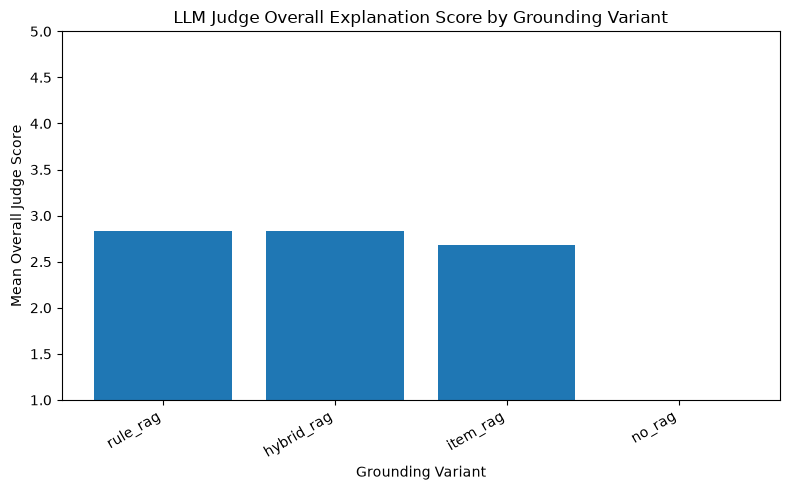


Saved LLM judge summaries:
outputs\results\paper_experiments\paper_llm_judge_summary.csv
outputs\results\paper_experiments\paper_combined_explanation_summary.csv
outputs\results\paper_experiments\paper_llm_judge_interpretation.md
outputs\figures\paper_experiments\llm_judge_overall_score_by_variant.png


In [93]:
# Cell 94: Summarise LLM judge results
# RUN AFTER LLM JUDGE EVALUATION IS COMPLETE

LLM_JUDGE_SCORE_COLUMNS = [
    "faithfulness_to_evidence",
    "usefulness_to_user",
    "specificity",
    "style_appropriateness",
    "hallucination_risk",
]

paper_llm_judge_summary_df = (
    paper_llm_judge_results_df
    .groupby("grounding_variant")[LLM_JUDGE_SCORE_COLUMNS]
    .mean()
    .reset_index()
)

paper_llm_judge_summary_df["overall_judge_score"] = (
    paper_llm_judge_summary_df[LLM_JUDGE_SCORE_COLUMNS].mean(axis=1)
)

paper_llm_judge_summary_df = paper_llm_judge_summary_df.sort_values(
    "overall_judge_score",
    ascending=False,
).reset_index(drop=True)

print("LLM judge summary by grounding variant:")
display(paper_llm_judge_summary_df)


# Pair with automatic metrics for a combined summary.
paper_combined_explanation_summary_df = paper_corpus_ablation_summary_df.merge(
    paper_llm_judge_summary_df,
    on="grounding_variant",
    how="left",
    suffixes=("_automatic", "_judge"),
)

print("\nCombined automatic + LLM judge explanation summary:")
display(paper_combined_explanation_summary_df)


best_judge_variant = paper_llm_judge_summary_df.iloc[0]

llm_judge_interpretation = f"""
# LLM Judge Evaluation Interpretation

The LLM judge evaluated each generated explanation on five dimensions:

1. faithfulness to evidence
2. usefulness to the user
3. specificity
4. style appropriateness
5. hallucination risk, where higher means lower risk

The highest overall judged variant was:

- Variant: {best_judge_variant["grounding_variant"]}
- Overall judge score: {best_judge_variant["overall_judge_score"]:.3f}
- Faithfulness to evidence: {best_judge_variant["faithfulness_to_evidence"]:.3f}
- Usefulness to user: {best_judge_variant["usefulness_to_user"]:.3f}
- Specificity: {best_judge_variant["specificity"]:.3f}
- Style appropriateness: {best_judge_variant["style_appropriateness"]:.3f}
- Hallucination risk score: {best_judge_variant["hallucination_risk"]:.3f}

These judged scores complement the automatic metrics. Automatic evaluation measures citation correctness, unsupported terms, and evidence overlap, while the judge estimates perceived explanation quality and usefulness.
"""

print(llm_judge_interpretation)


# Plot overall judge score
plt.figure(figsize=(8, 5))
plt.bar(
    paper_llm_judge_summary_df["grounding_variant"],
    paper_llm_judge_summary_df["overall_judge_score"],
)
plt.title("LLM Judge Overall Explanation Score by Grounding Variant")
plt.xlabel("Grounding Variant")
plt.ylabel("Mean Overall Judge Score")
plt.ylim(1, 5)
plt.xticks(rotation=30, ha="right")
plt.tight_layout()

llm_judge_plot_path = PAPER_FIGURES_DIR / "llm_judge_overall_score_by_variant.png"
plt.savefig(llm_judge_plot_path, dpi=300, bbox_inches="tight")
plt.show()


paper_llm_judge_summary_path = PAPER_EXPERIMENT_DIR / "paper_llm_judge_summary.csv"
paper_combined_explanation_summary_path = PAPER_EXPERIMENT_DIR / "paper_combined_explanation_summary.csv"
llm_judge_interpretation_path = PAPER_EXPERIMENT_DIR / "paper_llm_judge_interpretation.md"

paper_llm_judge_summary_df.to_csv(
    paper_llm_judge_summary_path,
    index=False,
)

paper_combined_explanation_summary_df.to_csv(
    paper_combined_explanation_summary_path,
    index=False,
)

with open(llm_judge_interpretation_path, "w", encoding="utf-8") as f:
    f.write(llm_judge_interpretation)

print("\nSaved LLM judge summaries:")
print(paper_llm_judge_summary_path.relative_to(PROJECT_ROOT))
print(paper_combined_explanation_summary_path.relative_to(PROJECT_ROOT))
print(llm_judge_interpretation_path.relative_to(PROJECT_ROOT))
print(llm_judge_plot_path.relative_to(PROJECT_ROOT))

In [94]:
# Cell 95: Revised LLM judge schema
# RUN AFTER ORIGINAL LLM JUDGE RESULTS ARE AVAILABLE

REVISED_LLM_JUDGE_DIMENSIONS = [
    "faithfulness_to_available_information",
    "usefulness_to_user",
    "specificity",
    "style_appropriateness",
    "grounding_safety",
]


def get_revised_judge_evidence_for_variant(row):
    """
    Return the evidence/context visible to the judge.

    No-RAG has no external evidence, but it can still be judged against:
    - query item
    - user request
    - recommended item
    """
    variant = row["grounding_variant"]
    
    if variant == "no_rag":
        return (
            "No external evidence was provided. Judge the explanation only against "
            "the query item, user request, and recommended item."
        )
    
    if variant == "item_rag":
        return row.get("item_evidence_text", "")
    
    if variant == "rule_rag":
        return row.get("rule_evidence_text", "")
    
    if variant == "hybrid_rag":
        return row.get("hybrid_evidence_text", "")
    
    return ""


def build_revised_llm_judge_prompt(row):
    """
    Build a clearer judge prompt.

    Important:
    Every score uses the same direction:
    1 = poor
    5 = excellent
    """
    evidence_text = get_revised_judge_evidence_for_variant(row)
    
    return f"""
You are evaluating a fashion recommendation explanation for a research experiment.

You must judge the generated explanation using the available information.

Query item:
- Category: {row['query_category']}
- Description: {row['query_text']}

User request:
{row['user_request']}

Recommended item:
- Category: {row['recommended_category']}
- Description: {row['recommended_text']}

Available grounding information:
{evidence_text}

Generated explanation:
{row['generated_explanation']}

Important scoring rule:
All scores use the same direction:
1 = poor
2 = weak
3 = acceptable
4 = good
5 = excellent

Score the following dimensions:

faithfulness_to_available_information:
1 = mostly unsupported or contradicts the available information
3 = mostly consistent but not strongly supported
5 = fully consistent and well supported by the available information

usefulness_to_user:
1 = not useful for understanding the recommendation
3 = somewhat useful
5 = clearly helps the user understand why the recommendation fits

specificity:
1 = generic and could apply to almost anything
3 = somewhat specific
5 = clearly specific to the query item, recommended item, and request

style_appropriateness:
1 = poor or inappropriate fashion reasoning
3 = acceptable fashion reasoning
5 = strong and appropriate fashion reasoning

grounding_safety:
1 = high risk of unsupported claims or invented details
3 = moderate grounding safety
5 = low risk; claims are well controlled by available information

Do not automatically give a score of 1 just because no external evidence was provided. For No-RAG, judge whether the explanation is reasonable based on the query item, request, and recommended item.

Return only valid JSON using this exact schema:
{{
  "faithfulness_to_available_information": 1,
  "usefulness_to_user": 1,
  "specificity": 1,
  "style_appropriateness": 1,
  "grounding_safety": 1,
  "brief_reason": "one short sentence"
}}
""".strip()


def parse_revised_llm_judge_json(response_text):
    """
    Parse revised judge JSON robustly.
    """
    if response_text is None:
        raise ValueError("Empty judge response.")
    
    response_text = str(response_text).strip()
    
    try:
        parsed = json.loads(response_text)
    except Exception:
        match = re.search(r"\{.*\}", response_text, flags=re.DOTALL)
        if not match:
            raise ValueError(f"No JSON object found in judge response: {response_text[:300]}")
        parsed = json.loads(match.group(0))
    
    required_keys = [
        "faithfulness_to_available_information",
        "usefulness_to_user",
        "specificity",
        "style_appropriateness",
        "grounding_safety",
        "brief_reason",
    ]
    
    for key in required_keys:
        if key not in parsed:
            raise ValueError(f"Missing key in judge response: {key}")
    
    for key in REVISED_LLM_JUDGE_DIMENSIONS:
        parsed[key] = int(parsed[key])
        parsed[key] = max(1, min(5, parsed[key]))
    
    parsed["brief_reason"] = str(parsed["brief_reason"]).strip()
    
    return parsed


def judge_one_explanation_revised(row, temperature=0.0, max_tokens=180):
    """
    Run the revised LLM judge for one explanation.
    """
    prompt = build_revised_llm_judge_prompt(row)
    
    response_text = ollama_generate(
        prompt=prompt,
        model_name=OLLAMA_MODEL_NAME,
        temperature=temperature,
        max_tokens=max_tokens,
    )
    
    parsed = parse_revised_llm_judge_json(response_text)
    
    return {
        **parsed,
        "raw_judge_response": response_text,
    }


# Sanity check
revised_judge_test_row = paper_explanation_ablation_df.iloc[0]

print("Revised judge prompt preview:")
print(build_revised_llm_judge_prompt(revised_judge_test_row)[:1600])

print("\nRunning one revised judge sanity check...")
revised_judge_test_result = judge_one_explanation_revised(revised_judge_test_row)

print("\nRevised judge result:")
print(revised_judge_test_result)

Revised judge prompt preview:
You are evaluating a fashion recommendation explanation for a research experiment.

You must judge the generated explanation using the available information.

Query item:
- Category: Sunglasses
- Description: tom ford sunglasses faded lenses

User request:
recommend accessories that complete this outfit

Recommended item:
- Category: Sunglasses
- Description: fendi cat-eye acetate sunglasses

Available grounding information:
No external evidence was provided. Judge the explanation only against the query item, user request, and recommended item.

Generated explanation:
The Fendi cat-eye acetate sunglasses complement the Tom Ford sunglasses with faded lenses by adding a touch of elegance and sophistication to the overall look. The acetate material and sleek design of the Fendi sunglasses also create a harmonious contrast with the classic style of the Tom Ford frames, resulting in a well-balanced and stylish ensemble.

Important scoring rule:
All scores use t

In [95]:
# Cell 96: Run revised LLM judge evaluation
# RUN AFTER REVISED LLM JUDGE SCHEMA IS DEFINED

def run_revised_llm_judge_evaluation(
    explanation_df,
    max_rows=None,
    random_state=42,
):
    """
    Run revised LLM judge evaluation on generated explanations.
    """
    if max_rows is not None:
        judge_input_df = explanation_df.sample(
            n=min(max_rows, len(explanation_df)),
            random_state=random_state,
        ).reset_index(drop=True)
    else:
        judge_input_df = explanation_df.copy().reset_index(drop=True)
    
    judge_rows = []
    error_rows = []
    
    for row_index, row in tqdm(
        judge_input_df.iterrows(),
        total=len(judge_input_df),
        desc="Running revised LLM judge evaluation",
    ):
        try:
            judge_result = judge_one_explanation_revised(row)
            
            judge_rows.append({
                "paper_case_id": row["paper_case_id"],
                "grounding_variant": row["grounding_variant"],
                "query_text": row["query_text"],
                "user_request": row["user_request"],
                "target_category": row["target_category"],
                "recommended_text": row["recommended_text"],
                "generated_explanation": row["generated_explanation"],
                "faithfulness_to_available_information": judge_result["faithfulness_to_available_information"],
                "usefulness_to_user": judge_result["usefulness_to_user"],
                "specificity": judge_result["specificity"],
                "style_appropriateness": judge_result["style_appropriateness"],
                "grounding_safety": judge_result["grounding_safety"],
                "brief_reason": judge_result["brief_reason"],
                "raw_judge_response": judge_result["raw_judge_response"],
            })
        
        except Exception as error:
            error_rows.append({
                "row_index": row_index,
                "paper_case_id": row.get("paper_case_id", ""),
                "grounding_variant": row.get("grounding_variant", ""),
                "error": repr(error),
            })
    
    return pd.DataFrame(judge_rows), pd.DataFrame(error_rows)


paper_revised_llm_judge_results_df, paper_revised_llm_judge_errors_df = run_revised_llm_judge_evaluation(
    explanation_df=paper_explanation_ablation_df,
    max_rows=None,
    random_state=42,
)

print("Revised LLM judge results shape:", paper_revised_llm_judge_results_df.shape)
print("Revised LLM judge errors shape:", paper_revised_llm_judge_errors_df.shape)

if not paper_revised_llm_judge_errors_df.empty:
    print("\nRevised LLM judge errors:")
    display(paper_revised_llm_judge_errors_df.head(20))

display(
    paper_revised_llm_judge_results_df[
        [
            "paper_case_id",
            "grounding_variant",
            "faithfulness_to_available_information",
            "usefulness_to_user",
            "specificity",
            "style_appropriateness",
            "grounding_safety",
            "brief_reason",
        ]
    ].head(12)
)

paper_revised_llm_judge_results_path = PAPER_EXPERIMENT_DIR / "paper_revised_llm_judge_results.csv"
paper_revised_llm_judge_errors_path = PAPER_EXPERIMENT_DIR / "paper_revised_llm_judge_errors.csv"

paper_revised_llm_judge_results_df.to_csv(
    paper_revised_llm_judge_results_path,
    index=False,
)

paper_revised_llm_judge_errors_df.to_csv(
    paper_revised_llm_judge_errors_path,
    index=False,
)

print("\nSaved revised LLM judge outputs:")
print(paper_revised_llm_judge_results_path.relative_to(PROJECT_ROOT))
print(paper_revised_llm_judge_errors_path.relative_to(PROJECT_ROOT))

Running revised LLM judge evaluation:   0%|          | 0/400 [00:00<?, ?it/s]

Revised LLM judge results shape: (400, 14)
Revised LLM judge errors shape: (0, 0)


,paper_case_id,grounding_variant,faithfulness_to_available_information,usefulness_to_user,specificity,style_appropriateness,grounding_safety,brief_reason
0,C000_R1,no_rag,2,3,4,5,3,"The explanation is mostly consistent with the query item, user request, and recommended item, but lacks specific det..."
1,C000_R1,item_rag,2,1,4,3,3,"The explanation partially aligns with available information, but lacks strong grounding and specific details."
2,C000_R1,rule_rag,3,2,4,5,5,"The explanation partially relies on R072 and R062, but the reasoning is somewhat generic and could apply to other si..."
3,C000_R1,hybrid_rag,3,2,4,5,5,The explanation partially uses available styling rules but introduces an unrelated detail about clutch or belt.
4,C000_R2,no_rag,5,4,2,3,5,"The explanation is well-supported by the available information and maintains consistency with the query item, user r..."
5,C000_R2,item_rag,2,1,1,1,1,"The explanation is somewhat inconsistent with the available information, as it mentions a leather tote bag and simpl..."
6,C000_R2,rule_rag,3,2,4,5,5,"The explanation partially uses R072 and R064, but the watch recommendation is somewhat generic and doesn't specifica..."
7,C000_R2,hybrid_rag,3,2,4,5,5,"The explanation partially uses available information, but lacks specificity and style appropriateness."
8,C001_R1,no_rag,3,2,4,5,3,"The explanation is mostly consistent with the available information, but it could benefit from more specific details..."
9,C001_R1,item_rag,3,2,4,5,5,"The explanation is mostly consistent with the available information, but it does not provide a clear reason why the ..."



Saved revised LLM judge outputs:
outputs\results\paper_experiments\paper_revised_llm_judge_results.csv
outputs\results\paper_experiments\paper_revised_llm_judge_errors.csv


Revised LLM judge summary:


,grounding_variant,faithfulness_to_available_information,usefulness_to_user,specificity,style_appropriateness,grounding_safety,overall_revised_judge_score
0,hybrid_rag,3.52,2.86,3.51,4.07,4.35,3.662
1,rule_rag,2.78,2.84,3.97,4.16,3.96,3.542
2,no_rag,3.03,2.21,3.84,4.74,3.27,3.418
3,item_rag,2.36,1.95,2.79,3.28,2.94,2.664



Original vs revised judge comparison:


,grounding_variant,original_overall_score,original_faithfulness,original_usefulness,original_specificity,original_style_appropriateness,original_hallucination_risk_score,overall_revised_judge_score,revised_faithfulness,revised_usefulness,revised_specificity,revised_style_appropriateness,revised_grounding_safety
0,hybrid_rag,2.830,2.85,1.83,3.77,4.49,1.21,3.662,3.52,2.86,3.51,4.07,4.35
1,item_rag,2.680,2.72,1.78,3.47,4.20,1.23,2.664,2.36,1.95,2.79,3.28,2.94
2,no_rag,1.000,1.00,1.00,1.00,1.00,1.00,3.418,3.03,2.21,3.84,4.74,3.27
3,rule_rag,2.832,2.90,1.88,3.75,4.51,1.12,3.542,2.78,2.84,3.97,4.16,3.96



Revised combined automatic + LLM judge summary:


,grounding_variant,num_explanations,citation_presence_rate,citation_correctness_rate,mean_unsupported_claim_count,mean_occasion_drift_count,mean_evidence_overlap,mean_explanation_length_words,rank_by_evidence_overlap,rank_by_unsupported_claims,rank_by_occasion_drift,faithfulness_to_available_information,usefulness_to_user,specificity,style_appropriateness,grounding_safety,overall_revised_judge_score
0,hybrid_rag,100,1.0,1.0,0.12,0.02,0.480047,54.54,1,3,1,3.52,2.86,3.51,4.07,4.35,3.662
1,item_rag,100,0.0,1.0,0.10,0.06,0.242222,53.23,3,2,3,2.36,1.95,2.79,3.28,2.94,2.664
2,no_rag,100,0.0,1.0,0.13,0.08,0.000000,54.97,4,4,4,3.03,2.21,3.84,4.74,3.27,3.418
3,rule_rag,100,1.0,1.0,0.08,0.05,0.406618,51.68,2,1,2,2.78,2.84,3.97,4.16,3.96,3.542



# Revised LLM Judge Evaluation Interpretation

The revised LLM judge uses a clearer rubric where all scores have the same direction:

1 = poor
5 = excellent

The highest overall judged variant was:

- Variant: hybrid_rag
- Overall revised judge score: 3.662
- Faithfulness to available information: 3.520
- Usefulness to user: 2.860
- Specificity: 3.510
- Style appropriateness: 4.070
- Grounding safety: 4.350

This revised evaluation should be used for paper reporting because the scale is clearer than the original hallucination-risk rubric.



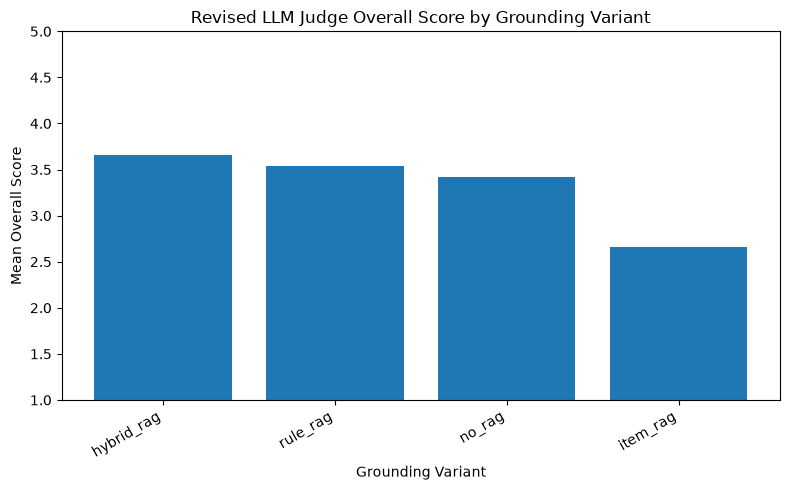


Saved revised LLM judge summaries:
outputs\results\paper_experiments\paper_revised_llm_judge_summary.csv
outputs\results\paper_experiments\paper_revised_combined_explanation_summary.csv
outputs\results\paper_experiments\paper_llm_judge_original_vs_revised_comparison.csv
outputs\results\paper_experiments\paper_revised_llm_judge_interpretation.md
outputs\figures\paper_experiments\revised_llm_judge_overall_score_by_variant.png


In [96]:
# Cell 97: Compare original and revised LLM judge results
# RUN AFTER REVISED LLM JUDGE EVALUATION IS COMPLETE

REVISED_LLM_JUDGE_SCORE_COLUMNS = [
    "faithfulness_to_available_information",
    "usefulness_to_user",
    "specificity",
    "style_appropriateness",
    "grounding_safety",
]

paper_revised_llm_judge_summary_df = (
    paper_revised_llm_judge_results_df
    .groupby("grounding_variant")[REVISED_LLM_JUDGE_SCORE_COLUMNS]
    .mean()
    .reset_index()
)

paper_revised_llm_judge_summary_df["overall_revised_judge_score"] = (
    paper_revised_llm_judge_summary_df[REVISED_LLM_JUDGE_SCORE_COLUMNS].mean(axis=1)
)

paper_revised_llm_judge_summary_df = paper_revised_llm_judge_summary_df.sort_values(
    "overall_revised_judge_score",
    ascending=False,
).reset_index(drop=True)

print("Revised LLM judge summary:")
display(paper_revised_llm_judge_summary_df)


# Compare original and revised summaries if original exists.
if "paper_llm_judge_summary_df" in globals():
    original_judge_comparison_df = paper_llm_judge_summary_df[
        [
            "grounding_variant",
            "overall_judge_score",
            "faithfulness_to_evidence",
            "usefulness_to_user",
            "specificity",
            "style_appropriateness",
            "hallucination_risk",
        ]
    ].copy()
    
    original_judge_comparison_df = original_judge_comparison_df.rename(
        columns={
            "overall_judge_score": "original_overall_score",
            "faithfulness_to_evidence": "original_faithfulness",
            "usefulness_to_user": "original_usefulness",
            "specificity": "original_specificity",
            "style_appropriateness": "original_style_appropriateness",
            "hallucination_risk": "original_hallucination_risk_score",
        }
    )
    
    revised_judge_comparison_df = paper_revised_llm_judge_summary_df[
        [
            "grounding_variant",
            "overall_revised_judge_score",
            "faithfulness_to_available_information",
            "usefulness_to_user",
            "specificity",
            "style_appropriateness",
            "grounding_safety",
        ]
    ].copy()
    
    revised_judge_comparison_df = revised_judge_comparison_df.rename(
        columns={
            "faithfulness_to_available_information": "revised_faithfulness",
            "usefulness_to_user": "revised_usefulness",
            "specificity": "revised_specificity",
            "style_appropriateness": "revised_style_appropriateness",
            "grounding_safety": "revised_grounding_safety",
        }
    )
    
    llm_judge_comparison_df = original_judge_comparison_df.merge(
        revised_judge_comparison_df,
        on="grounding_variant",
        how="outer",
    )
    
    print("\nOriginal vs revised judge comparison:")
    display(llm_judge_comparison_df)
else:
    llm_judge_comparison_df = pd.DataFrame()
    print("\nOriginal judge summary not found in memory; skipping direct comparison.")


# Merge revised judge with automatic metrics.
paper_revised_combined_explanation_summary_df = paper_corpus_ablation_summary_df.merge(
    paper_revised_llm_judge_summary_df,
    on="grounding_variant",
    how="left",
)

print("\nRevised combined automatic + LLM judge summary:")
display(paper_revised_combined_explanation_summary_df)


best_revised_judge_variant = paper_revised_llm_judge_summary_df.iloc[0]

revised_llm_judge_interpretation = f"""
# Revised LLM Judge Evaluation Interpretation

The revised LLM judge uses a clearer rubric where all scores have the same direction:

1 = poor
5 = excellent

The highest overall judged variant was:

- Variant: {best_revised_judge_variant["grounding_variant"]}
- Overall revised judge score: {best_revised_judge_variant["overall_revised_judge_score"]:.3f}
- Faithfulness to available information: {best_revised_judge_variant["faithfulness_to_available_information"]:.3f}
- Usefulness to user: {best_revised_judge_variant["usefulness_to_user"]:.3f}
- Specificity: {best_revised_judge_variant["specificity"]:.3f}
- Style appropriateness: {best_revised_judge_variant["style_appropriateness"]:.3f}
- Grounding safety: {best_revised_judge_variant["grounding_safety"]:.3f}

This revised evaluation should be used for paper reporting because the scale is clearer than the original hallucination-risk rubric.
"""

print(revised_llm_judge_interpretation)


# Plot revised overall judge score.
plt.figure(figsize=(8, 5))
plt.bar(
    paper_revised_llm_judge_summary_df["grounding_variant"],
    paper_revised_llm_judge_summary_df["overall_revised_judge_score"],
)
plt.title("Revised LLM Judge Overall Score by Grounding Variant")
plt.xlabel("Grounding Variant")
plt.ylabel("Mean Overall Score")
plt.ylim(1, 5)
plt.xticks(rotation=30, ha="right")
plt.tight_layout()

revised_llm_judge_plot_path = PAPER_FIGURES_DIR / "revised_llm_judge_overall_score_by_variant.png"
plt.savefig(revised_llm_judge_plot_path, dpi=300, bbox_inches="tight")
plt.show()


paper_revised_llm_judge_summary_path = PAPER_EXPERIMENT_DIR / "paper_revised_llm_judge_summary.csv"
paper_revised_combined_summary_path = PAPER_EXPERIMENT_DIR / "paper_revised_combined_explanation_summary.csv"
llm_judge_comparison_path = PAPER_EXPERIMENT_DIR / "paper_llm_judge_original_vs_revised_comparison.csv"
revised_llm_judge_interpretation_path = PAPER_EXPERIMENT_DIR / "paper_revised_llm_judge_interpretation.md"

paper_revised_llm_judge_summary_df.to_csv(
    paper_revised_llm_judge_summary_path,
    index=False,
)

paper_revised_combined_explanation_summary_df.to_csv(
    paper_revised_combined_summary_path,
    index=False,
)

llm_judge_comparison_df.to_csv(
    llm_judge_comparison_path,
    index=False,
)

with open(revised_llm_judge_interpretation_path, "w", encoding="utf-8") as f:
    f.write(revised_llm_judge_interpretation)

print("\nSaved revised LLM judge summaries:")
print(paper_revised_llm_judge_summary_path.relative_to(PROJECT_ROOT))
print(paper_revised_combined_summary_path.relative_to(PROJECT_ROOT))
print(llm_judge_comparison_path.relative_to(PROJECT_ROOT))
print(revised_llm_judge_interpretation_path.relative_to(PROJECT_ROOT))
print(revised_llm_judge_plot_path.relative_to(PROJECT_ROOT))

In [97]:
# Cell 98: Paired statistical test utilities
# RUN AFTER REVISED LLM JUDGE RESULTS ARE AVAILABLE

from math import sqrt

try:
    from scipy.stats import wilcoxon
    SCIPY_AVAILABLE = True
except Exception:
    SCIPY_AVAILABLE = False
    print("scipy.stats.wilcoxon not available. Wilcoxon tests will be skipped.")


def bootstrap_mean_difference_ci(
    paired_df,
    metric_a,
    metric_b,
    n_bootstrap=5000,
    confidence_level=0.95,
    random_state=42,
):
    """
    Compute paired bootstrap confidence interval for mean(metric_a - metric_b).
    """
    rng = np.random.default_rng(random_state)
    
    differences = (
        paired_df[metric_a].astype(float).values
        - paired_df[metric_b].astype(float).values
    )
    
    n = len(differences)
    
    if n == 0:
        return {
            "mean_difference": np.nan,
            "ci_lower": np.nan,
            "ci_upper": np.nan,
            "n_pairs": 0,
        }
    
    bootstrap_means = []
    
    for _ in range(n_bootstrap):
        sample = rng.choice(differences, size=n, replace=True)
        bootstrap_means.append(sample.mean())
    
    alpha = 1.0 - confidence_level
    
    return {
        "mean_difference": float(differences.mean()),
        "ci_lower": float(np.quantile(bootstrap_means, alpha / 2)),
        "ci_upper": float(np.quantile(bootstrap_means, 1 - alpha / 2)),
        "n_pairs": int(n),
    }


def paired_wilcoxon_test(
    paired_df,
    metric_a,
    metric_b,
):
    """
    Run Wilcoxon signed-rank test for paired metric values.
    """
    if not SCIPY_AVAILABLE:
        return {
            "wilcoxon_statistic": np.nan,
            "p_value": np.nan,
            "test_available": False,
        }
    
    values_a = paired_df[metric_a].astype(float).values
    values_b = paired_df[metric_b].astype(float).values
    
    differences = values_a - values_b
    
    # Wilcoxon fails if all differences are exactly zero.
    if np.allclose(differences, 0):
        return {
            "wilcoxon_statistic": 0.0,
            "p_value": 1.0,
            "test_available": True,
        }
    
    statistic, p_value = wilcoxon(values_a, values_b)
    
    return {
        "wilcoxon_statistic": float(statistic),
        "p_value": float(p_value),
        "test_available": True,
    }


def cohen_d_paired(
    paired_df,
    metric_a,
    metric_b,
):
    """
    Compute paired Cohen's d for paired differences.
    """
    differences = (
        paired_df[metric_a].astype(float).values
        - paired_df[metric_b].astype(float).values
    )
    
    if len(differences) < 2:
        return np.nan
    
    std_diff = differences.std(ddof=1)
    
    if std_diff == 0:
        return 0.0
    
    return float(differences.mean() / std_diff)


print("Statistical test utilities ready.")
print("SciPy available:", SCIPY_AVAILABLE)

Statistical test utilities ready.
SciPy available: True


In [98]:
# Cell 99: Run statistical tests for explanation variants
# RUN AFTER STATISTICAL TEST UTILITIES ARE DEFINED

def pivot_variant_metric_table(
    df,
    metric_columns,
    id_column="paper_case_id",
    variant_column="grounding_variant",
):
    """
    Convert long-format variant results into wide-format paired tables.
    """
    wide_tables = {}
    
    for metric in metric_columns:
        wide_table = df.pivot_table(
            index=id_column,
            columns=variant_column,
            values=metric,
            aggfunc="mean",
        ).reset_index()
        
        wide_tables[metric] = wide_table
    
    return wide_tables


AUTOMATIC_EXPLANATION_METRICS_FOR_TESTING = [
    "mean_placeholder"
]

# Use row-level evidence-aware automatic metrics.
automatic_metric_columns = [
    "unsupported_claim_count_evidence_aware",
    "occasion_drift_count_evidence_aware",
    "evidence_overlap",
]

judge_metric_columns = [
    "faithfulness_to_available_information",
    "usefulness_to_user",
    "specificity",
    "style_appropriateness",
    "grounding_safety",
]

variant_comparisons = [
    ("hybrid_rag", "item_rag"),
    ("rule_rag", "item_rag"),
    ("hybrid_rag", "rule_rag"),
    ("rule_rag", "no_rag"),
    ("hybrid_rag", "no_rag"),
    ("item_rag", "no_rag"),
]


def run_variant_pair_tests(
    df,
    metric_columns,
    variant_comparisons,
    id_column="paper_case_id",
    variant_column="grounding_variant",
    metric_family="automatic",
    n_bootstrap=5000,
    random_state=42,
):
    """
    Run paired bootstrap CI, Wilcoxon test, and paired effect size for variant comparisons.
    """
    result_rows = []
    
    wide_tables = pivot_variant_metric_table(
        df=df,
        metric_columns=metric_columns,
        id_column=id_column,
        variant_column=variant_column,
    )
    
    for metric in metric_columns:
        wide_table = wide_tables[metric]
        
        for variant_a, variant_b in variant_comparisons:
            if variant_a not in wide_table.columns or variant_b not in wide_table.columns:
                continue
            
            paired_df = wide_table[
                [id_column, variant_a, variant_b]
            ].dropna().copy()
            
            paired_df = paired_df.rename(
                columns={
                    variant_a: "metric_a",
                    variant_b: "metric_b",
                }
            )
            
            bootstrap_result = bootstrap_mean_difference_ci(
                paired_df=paired_df,
                metric_a="metric_a",
                metric_b="metric_b",
                n_bootstrap=n_bootstrap,
                confidence_level=0.95,
                random_state=random_state,
            )
            
            wilcoxon_result = paired_wilcoxon_test(
                paired_df=paired_df,
                metric_a="metric_a",
                metric_b="metric_b",
            )
            
            effect_size = cohen_d_paired(
                paired_df=paired_df,
                metric_a="metric_a",
                metric_b="metric_b",
            )
            
            result_rows.append({
                "metric_family": metric_family,
                "metric": metric,
                "variant_a": variant_a,
                "variant_b": variant_b,
                "comparison": f"{variant_a} - {variant_b}",
                "mean_variant_a": float(paired_df["metric_a"].mean()),
                "mean_variant_b": float(paired_df["metric_b"].mean()),
                "mean_difference": bootstrap_result["mean_difference"],
                "ci_lower": bootstrap_result["ci_lower"],
                "ci_upper": bootstrap_result["ci_upper"],
                "n_pairs": bootstrap_result["n_pairs"],
                "wilcoxon_statistic": wilcoxon_result["wilcoxon_statistic"],
                "p_value": wilcoxon_result["p_value"],
                "paired_cohen_d": effect_size,
                "test_available": wilcoxon_result["test_available"],
            })
    
    return pd.DataFrame(result_rows)


automatic_statistical_tests_df = run_variant_pair_tests(
    df=paper_explanation_evidence_aware_eval_df,
    metric_columns=automatic_metric_columns,
    variant_comparisons=variant_comparisons,
    id_column="paper_case_id",
    variant_column="grounding_variant",
    metric_family="automatic",
    n_bootstrap=5000,
    random_state=42,
)

judge_statistical_tests_df = run_variant_pair_tests(
    df=paper_revised_llm_judge_results_df,
    metric_columns=judge_metric_columns,
    variant_comparisons=variant_comparisons,
    id_column="paper_case_id",
    variant_column="grounding_variant",
    metric_family="revised_llm_judge",
    n_bootstrap=5000,
    random_state=42,
)

paper_explanation_statistical_tests_df = pd.concat(
    [
        automatic_statistical_tests_df,
        judge_statistical_tests_df,
    ],
    ignore_index=True,
)

print("Automatic statistical tests shape:", automatic_statistical_tests_df.shape)
print("Judge statistical tests shape:", judge_statistical_tests_df.shape)
print("Combined statistical tests shape:", paper_explanation_statistical_tests_df.shape)

print("\nKey statistical comparisons:")
display(
    paper_explanation_statistical_tests_df[
        paper_explanation_statistical_tests_df["comparison"].isin([
            "hybrid_rag - item_rag",
            "rule_rag - item_rag",
            "hybrid_rag - rule_rag",
        ])
    ].sort_values(["metric_family", "metric", "comparison"])
)

paper_explanation_statistical_tests_path = PAPER_EXPERIMENT_DIR / "paper_explanation_statistical_tests.csv"

paper_explanation_statistical_tests_df.to_csv(
    paper_explanation_statistical_tests_path,
    index=False,
)

print("\nSaved explanation statistical tests:")
print(paper_explanation_statistical_tests_path.relative_to(PROJECT_ROOT))

Automatic statistical tests shape: (18, 15)
Judge statistical tests shape: (30, 15)
Combined statistical tests shape: (48, 15)

Key statistical comparisons:


,metric_family,metric,variant_a,variant_b,comparison,mean_variant_a,mean_variant_b,mean_difference,ci_lower,ci_upper,n_pairs,wilcoxon_statistic,p_value,paired_cohen_d,test_available
12,automatic,evidence_overlap,hybrid_rag,item_rag,hybrid_rag - item_rag,0.480047,0.242222,0.237825,0.213719,0.262237,100,5.0,6.636278e-18,1.931752,True
14,automatic,evidence_overlap,hybrid_rag,rule_rag,hybrid_rag - rule_rag,0.480047,0.406618,0.073429,0.043858,0.101169,100,1124.0,1.456647e-06,0.502251,True
13,automatic,evidence_overlap,rule_rag,item_rag,rule_rag - item_rag,0.406618,0.242222,0.164396,0.135600,0.194148,100,320.5,3.461075e-14,1.093958,True
6,automatic,occasion_drift_count_evidence_aware,hybrid_rag,item_rag,hybrid_rag - item_rag,0.020000,0.060000,-0.040000,-0.090000,0.000000,100,3.5,1.024704e-01,-0.164691,True
8,automatic,occasion_drift_count_evidence_aware,hybrid_rag,rule_rag,hybrid_rag - rule_rag,0.020000,0.050000,-0.030000,-0.080000,0.020000,100,8.0,2.568393e-01,-0.113553,True
7,automatic,occasion_drift_count_evidence_aware,rule_rag,item_rag,rule_rag - item_rag,0.050000,0.060000,-0.010000,-0.080000,0.060000,100,30.0,7.630246e-01,-0.030014,True
0,automatic,unsupported_claim_count_evidence_aware,hybrid_rag,item_rag,hybrid_rag - item_rag,0.120000,0.100000,0.020000,-0.070000,0.110000,100,61.0,6.942019e-01,0.042465,True
2,automatic,unsupported_claim_count_evidence_aware,hybrid_rag,rule_rag,hybrid_rag - rule_rag,0.120000,0.080000,0.040000,-0.040000,0.120000,100,51.0,3.173105e-01,0.100000,True
1,automatic,unsupported_claim_count_evidence_aware,rule_rag,item_rag,rule_rag - item_rag,0.080000,0.100000,-0.020000,-0.110000,0.060000,100,27.0,5.766460e-01,-0.044542,True
18,revised_llm_judge,faithfulness_to_available_information,hybrid_rag,item_rag,hybrid_rag - item_rag,3.520000,2.360000,1.160000,0.900000,1.420000,100,147.5,6.853608e-11,0.886681,True



Saved explanation statistical tests:
outputs\results\paper_experiments\paper_explanation_statistical_tests.csv


In [99]:
# Cell 100: Paper-ready statistical summary
# RUN AFTER EXPLANATION STATISTICAL TESTS ARE COMPLETE

MAIN_PAPER_STATISTICAL_CLAIMS = [
    {
        "claim": "Hybrid-RAG improves evidence overlap over Item-RAG.",
        "metric_family": "automatic",
        "metric": "evidence_overlap",
        "comparison": "hybrid_rag - item_rag",
        "desired_direction": "positive",
    },
    {
        "claim": "Rule-RAG improves evidence overlap over Item-RAG.",
        "metric_family": "automatic",
        "metric": "evidence_overlap",
        "comparison": "rule_rag - item_rag",
        "desired_direction": "positive",
    },
    {
        "claim": "Rule-RAG reduces evidence-aware unsupported claims compared with No-RAG.",
        "metric_family": "automatic",
        "metric": "unsupported_claim_count_evidence_aware",
        "comparison": "rule_rag - no_rag",
        "desired_direction": "negative",
    },
    {
        "claim": "Hybrid-RAG improves revised judge overall quality over Item-RAG.",
        "metric_family": "revised_llm_judge",
        "metric": "grounding_safety",
        "comparison": "hybrid_rag - item_rag",
        "desired_direction": "positive",
    },
    {
        "claim": "Rule-RAG improves grounding safety over Item-RAG.",
        "metric_family": "revised_llm_judge",
        "metric": "grounding_safety",
        "comparison": "rule_rag - item_rag",
        "desired_direction": "positive",
    },
    {
        "claim": "Hybrid-RAG improves faithfulness over Item-RAG.",
        "metric_family": "revised_llm_judge",
        "metric": "faithfulness_to_available_information",
        "comparison": "hybrid_rag - item_rag",
        "desired_direction": "positive",
    },
]


def interpret_statistical_result(row, desired_direction):
    """
    Create a short interpretation of the statistical test.
    """
    mean_diff = row["mean_difference"]
    p_value = row["p_value"]
    ci_lower = row["ci_lower"]
    ci_upper = row["ci_upper"]
    
    if desired_direction == "positive":
        direction_supported = mean_diff > 0
        ci_direction_supported = ci_lower > 0
    else:
        direction_supported = mean_diff < 0
        ci_direction_supported = ci_upper < 0
    
    statistically_significant = p_value < 0.05 if not pd.isna(p_value) else False
    
    if direction_supported and statistically_significant:
        conclusion = "supported"
    elif direction_supported and not statistically_significant:
        conclusion = "directionally_supported_not_significant"
    else:
        conclusion = "not_supported"
    
    return {
        "direction_supported": direction_supported,
        "ci_direction_supported": ci_direction_supported,
        "statistically_significant_p_lt_0_05": statistically_significant,
        "claim_conclusion": conclusion,
    }


paper_statistical_claim_rows = []

for claim_spec in MAIN_PAPER_STATISTICAL_CLAIMS:
    matching_rows = paper_explanation_statistical_tests_df[
        (paper_explanation_statistical_tests_df["metric_family"] == claim_spec["metric_family"])
        & (paper_explanation_statistical_tests_df["metric"] == claim_spec["metric"])
        & (paper_explanation_statistical_tests_df["comparison"] == claim_spec["comparison"])
    ]
    
    if matching_rows.empty:
        paper_statistical_claim_rows.append({
            **claim_spec,
            "status": "missing_test_result",
        })
        continue
    
    test_row = matching_rows.iloc[0]
    interpretation = interpret_statistical_result(
        row=test_row,
        desired_direction=claim_spec["desired_direction"],
    )
    
    paper_statistical_claim_rows.append({
        "claim": claim_spec["claim"],
        "metric_family": claim_spec["metric_family"],
        "metric": claim_spec["metric"],
        "comparison": claim_spec["comparison"],
        "desired_direction": claim_spec["desired_direction"],
        "mean_variant_a": test_row["mean_variant_a"],
        "mean_variant_b": test_row["mean_variant_b"],
        "mean_difference": test_row["mean_difference"],
        "ci_lower": test_row["ci_lower"],
        "ci_upper": test_row["ci_upper"],
        "p_value": test_row["p_value"],
        "paired_cohen_d": test_row["paired_cohen_d"],
        "n_pairs": test_row["n_pairs"],
        **interpretation,
    })

paper_statistical_claims_summary_df = pd.DataFrame(paper_statistical_claim_rows)

print("Paper-ready statistical claims summary:")
display(paper_statistical_claims_summary_df)


paper_statistical_interpretation = """
# Paper Statistical Test Interpretation

The statistical tests compare explanation variants using paired observations. Each paper case has explanations from multiple grounding variants, so paired tests are appropriate.

The reported statistics include:

- mean difference between variants
- 95% paired bootstrap confidence interval
- Wilcoxon signed-rank test p-value
- paired Cohen's d effect size

These tests are used to support the main paper claims about whether expert-rule and hybrid grounding improve evidence overlap, grounding safety, and judged faithfulness compared with item-description grounding or no grounding.
"""

print(paper_statistical_interpretation)

paper_statistical_claims_summary_path = PAPER_EXPERIMENT_DIR / "paper_statistical_claims_summary.csv"
paper_statistical_interpretation_path = PAPER_EXPERIMENT_DIR / "paper_statistical_interpretation.md"

paper_statistical_claims_summary_df.to_csv(
    paper_statistical_claims_summary_path,
    index=False,
)

with open(paper_statistical_interpretation_path, "w", encoding="utf-8") as f:
    f.write(paper_statistical_interpretation)

print("\nSaved paper statistical summary outputs:")
print(paper_statistical_claims_summary_path.relative_to(PROJECT_ROOT))
print(paper_statistical_interpretation_path.relative_to(PROJECT_ROOT))

Paper-ready statistical claims summary:


,claim,metric_family,metric,comparison,desired_direction,mean_variant_a,mean_variant_b,mean_difference,ci_lower,ci_upper,p_value,paired_cohen_d,n_pairs,direction_supported,ci_direction_supported,statistically_significant_p_lt_0_05,claim_conclusion
0,Hybrid-RAG improves evidence overlap over Item-RAG.,automatic,evidence_overlap,hybrid_rag - item_rag,positive,0.480047,0.242222,0.237825,0.213719,0.262237,6.636278e-18,1.931752,100,True,True,True,supported
1,Rule-RAG improves evidence overlap over Item-RAG.,automatic,evidence_overlap,rule_rag - item_rag,positive,0.406618,0.242222,0.164396,0.135600,0.194148,3.461075e-14,1.093958,100,True,True,True,supported
2,Rule-RAG reduces evidence-aware unsupported claims compared with No-RAG.,automatic,unsupported_claim_count_evidence_aware,rule_rag - no_rag,negative,0.080000,0.130000,-0.050000,-0.160000,0.040000,2.252529e-01,-0.096189,100,True,False,False,directionally_supported_not_significant
3,Hybrid-RAG improves revised judge overall quality over Item-RAG.,revised_llm_judge,grounding_safety,hybrid_rag - item_rag,positive,4.350000,2.940000,1.410000,1.080000,1.730000,1.283508e-10,0.841135,100,True,True,True,supported
4,Rule-RAG improves grounding safety over Item-RAG.,revised_llm_judge,grounding_safety,rule_rag - item_rag,positive,3.960000,2.940000,1.020000,0.700000,1.330250,1.876093e-07,0.622314,100,True,True,True,supported
5,Hybrid-RAG improves faithfulness over Item-RAG.,revised_llm_judge,faithfulness_to_available_information,hybrid_rag - item_rag,positive,3.520000,2.360000,1.160000,0.900000,1.420000,6.853608e-11,0.886681,100,True,True,True,supported



# Paper Statistical Test Interpretation

The statistical tests compare explanation variants using paired observations. Each paper case has explanations from multiple grounding variants, so paired tests are appropriate.

The reported statistics include:

- mean difference between variants
- 95% paired bootstrap confidence interval
- Wilcoxon signed-rank test p-value
- paired Cohen's d effect size

These tests are used to support the main paper claims about whether expert-rule and hybrid grounding improve evidence overlap, grounding safety, and judged faithfulness compared with item-description grounding or no grounding.


Saved paper statistical summary outputs:
outputs\results\paper_experiments\paper_statistical_claims_summary.csv
outputs\results\paper_experiments\paper_statistical_interpretation.md


# Final Paper Experiment Dashboard

## 1. Recommendation Accuracy

,model_name,hit_rate_at_1,hit_rate_at_5,hit_rate_at_10,ndcg_at_5,ndcg_at_10,top_positive_rank
0,clip_multimodal,0.053333,0.163333,0.243333,0.098090,0.119958,36.300000
1,evidence_reranked,0.040000,0.136667,0.210000,0.078847,0.099917,37.573333
2,text_baseline,0.023333,0.090000,0.140000,0.044817,0.058488,43.656667


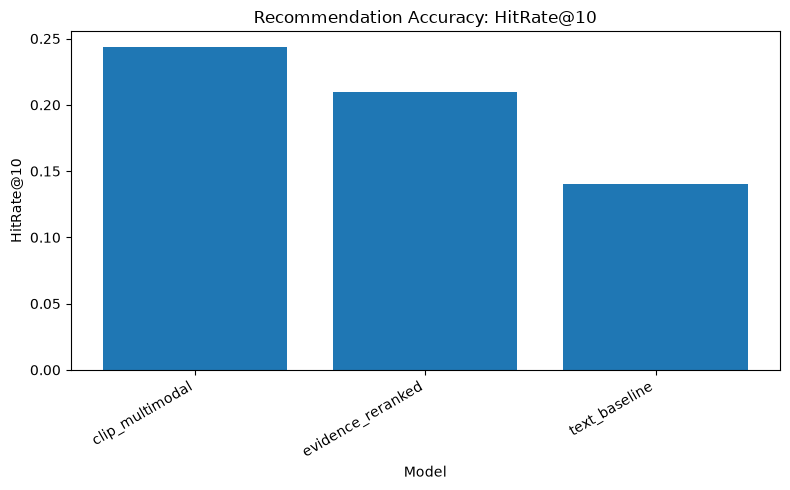

## 2. Reranking Weight Ablation

,model_name,alpha_clip,beta_evidence,hit_rate_at_1,hit_rate_at_5,hit_rate_at_10,ndcg_at_5,ndcg_at_10,top_positive_rank
6,clip_only,1.00,0.00,0.053333,0.163333,0.243333,0.098090,0.119958,36.300000
5,alpha_0.95_beta_0.05,0.95,0.05,0.053333,0.156667,0.236667,0.094231,0.116061,36.326667
4,alpha_0.90_beta_0.10,0.90,0.10,0.050000,0.156667,0.233333,0.093203,0.113904,36.323333
3,alpha_0.80_beta_0.20,0.80,0.20,0.050000,0.140000,0.216667,0.085911,0.108479,36.480000
1,alpha_0.65_beta_0.35,0.65,0.35,0.040000,0.136667,0.210000,0.078847,0.099917,37.573333
2,alpha_0.70_beta_0.30,0.70,0.30,0.043333,0.143333,0.203333,0.083409,0.101228,37.086667
0,alpha_0.50_beta_0.50,0.50,0.50,0.026667,0.113333,0.196667,0.062023,0.085682,39.313333


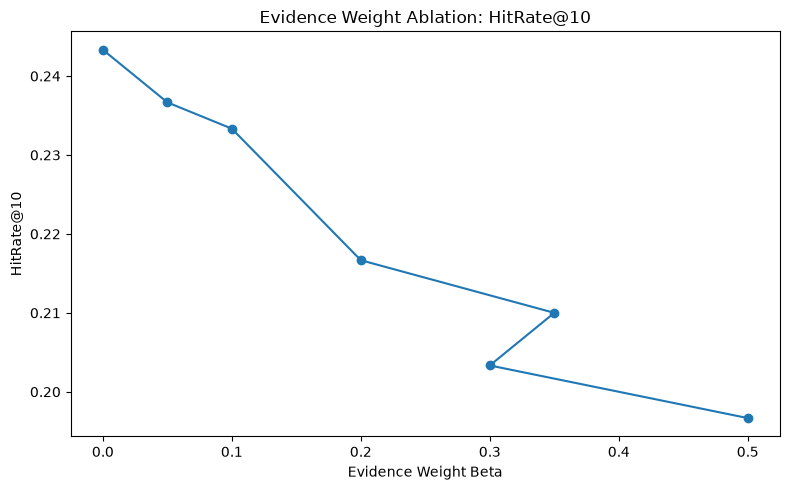

## 3. Corpus-Ablation Automatic Explanation Metrics

,grounding_variant,num_explanations,citation_presence_rate,citation_correctness_rate,mean_unsupported_claim_count,mean_occasion_drift_count,mean_evidence_overlap,mean_explanation_length_words,rank_by_evidence_overlap,rank_by_unsupported_claims,rank_by_occasion_drift
0,hybrid_rag,100,1.0,1.0,0.12,0.02,0.480047,54.54,1,3,1
1,item_rag,100,0.0,1.0,0.10,0.06,0.242222,53.23,3,2,3
2,no_rag,100,0.0,1.0,0.13,0.08,0.000000,54.97,4,4,4
3,rule_rag,100,1.0,1.0,0.08,0.05,0.406618,51.68,2,1,2


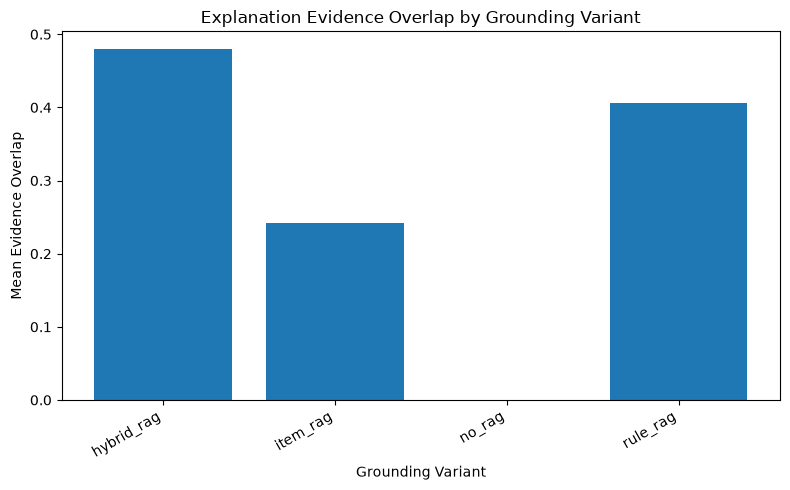

## 4. Revised LLM Judge Explanation Metrics

,grounding_variant,faithfulness_to_available_information,usefulness_to_user,specificity,style_appropriateness,grounding_safety,overall_revised_judge_score
0,hybrid_rag,3.52,2.86,3.51,4.07,4.35,3.662
1,rule_rag,2.78,2.84,3.97,4.16,3.96,3.542
2,no_rag,3.03,2.21,3.84,4.74,3.27,3.418
3,item_rag,2.36,1.95,2.79,3.28,2.94,2.664


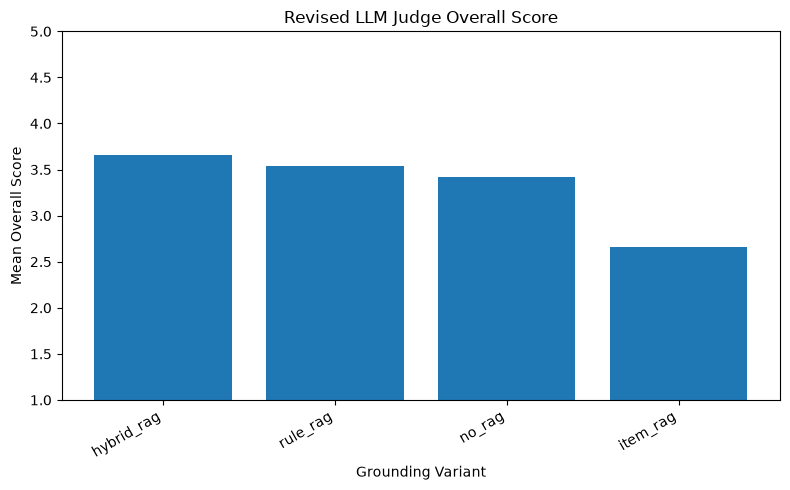

## 5. Paper Statistical Claims

,claim,metric_family,metric,comparison,desired_direction,mean_variant_a,mean_variant_b,mean_difference,ci_lower,ci_upper,p_value,paired_cohen_d,n_pairs,direction_supported,ci_direction_supported,statistically_significant_p_lt_0_05,claim_conclusion
0,Hybrid-RAG improves evidence overlap over Item-RAG.,automatic,evidence_overlap,hybrid_rag - item_rag,positive,0.480047,0.242222,0.237825,0.213719,0.262237,6.636278e-18,1.931752,100,True,True,True,supported
1,Rule-RAG improves evidence overlap over Item-RAG.,automatic,evidence_overlap,rule_rag - item_rag,positive,0.406618,0.242222,0.164396,0.135600,0.194148,3.461075e-14,1.093958,100,True,True,True,supported
2,Rule-RAG reduces evidence-aware unsupported claims compared with No-RAG.,automatic,unsupported_claim_count_evidence_aware,rule_rag - no_rag,negative,0.080000,0.130000,-0.050000,-0.160000,0.040000,2.252529e-01,-0.096189,100,True,False,False,directionally_supported_not_significant
3,Hybrid-RAG improves revised judge overall quality over Item-RAG.,revised_llm_judge,grounding_safety,hybrid_rag - item_rag,positive,4.350000,2.940000,1.410000,1.080000,1.730000,1.283508e-10,0.841135,100,True,True,True,supported
4,Rule-RAG improves grounding safety over Item-RAG.,revised_llm_judge,grounding_safety,rule_rag - item_rag,positive,3.960000,2.940000,1.020000,0.700000,1.330250,1.876093e-07,0.622314,100,True,True,True,supported
5,Hybrid-RAG improves faithfulness over Item-RAG.,revised_llm_judge,faithfulness_to_available_information,hybrid_rag - item_rag,positive,3.520000,2.360000,1.160000,0.900000,1.420000,6.853608e-11,0.886681,100,True,True,True,supported



# Final Paper Experiment Dashboard

## Current Main Findings

1. **Recommendation accuracy**
   - CLIP multimodal retrieval remains the strongest pure ranking model.
   - Evidence reranking introduces an accuracy-grounding trade-off.

2. **Corpus-ablation explanation evaluation**
   - Hybrid-RAG achieved the highest evidence overlap.
   - Rule-RAG achieved the lowest evidence-aware unsupported-claim count.
   - Rule-RAG and Hybrid-RAG achieved perfect citation correctness in the current run.

3. **Revised LLM judge evaluation**
   - Hybrid-RAG achieved the highest overall judged explanation quality.
   - Rule-RAG ranked second overall and performed strongly on specificity and style appropriateness.
   - Item-RAG was weaker than expert-rule grounding, supporting the claim that expert styling rules are a distinct retrieval corpus.

4. **Statistical testing**
   - Hybrid-RAG and Rule-RAG significantly improved evidence overlap over Item-RAG.
   - Hybrid-RAG significantly improved judged faithfulness and grounding safety over Item-RAG.
   - Rule-RAG showed a lower unsupported-claim count than No-RAG, but this reduction was not statistically significant.

## Current Paper-Safe Claim

Expert-rule and hybrid grounding improve explanation auditability, evidence connection, and judged grounding quality compared with item-description grounding. However, expert evidence should not currently be claimed to improve recommendation accuracy over CLIP-only retrieval.

## Next Step

Compare the current default KB with improved KB versions and decide whether to rerun paper explanation experiments using the strongest KB.


Saved final paper dashboard outputs to:
outputs\results\paper_experiments\final_dashboard
outputs\figures\paper_experiments\final_dashboard


In [100]:
# Cell 101: Final paper experiment dashboard
# RUN AFTER STATISTICAL TESTS ARE COMPLETE

from IPython.display import display, Markdown

paper_dashboard_dir = PAPER_EXPERIMENT_DIR / "final_dashboard"
paper_dashboard_figures_dir = PAPER_FIGURES_DIR / "final_dashboard"

paper_dashboard_dir.mkdir(parents=True, exist_ok=True)
paper_dashboard_figures_dir.mkdir(parents=True, exist_ok=True)


def safe_display_table(title, df):
    """
    Display a table if it exists and is not empty.
    """
    display(Markdown(f"## {title}"))
    
    if df is None or df.empty:
        print("No data available.")
    else:
        display(df)


display(Markdown("# Final Paper Experiment Dashboard"))


# ------------------------------------------------------------
# 1. Recommendation accuracy
# ------------------------------------------------------------

if "compact_metric_summary_df" in globals():
    safe_display_table(
        "1. Recommendation Accuracy",
        compact_metric_summary_df,
    )
    
    recommendation_dashboard_path = paper_dashboard_dir / "recommendation_accuracy_summary.csv"
    compact_metric_summary_df.to_csv(recommendation_dashboard_path, index=False)
    
    plt.figure(figsize=(8, 5))
    plt.bar(
        compact_metric_summary_df["model_name"],
        compact_metric_summary_df["hit_rate_at_10"],
    )
    plt.title("Recommendation Accuracy: HitRate@10")
    plt.xlabel("Model")
    plt.ylabel("HitRate@10")
    plt.xticks(rotation=30, ha="right")
    plt.tight_layout()
    
    recommendation_plot_path = paper_dashboard_figures_dir / "recommendation_hitrate10.png"
    plt.savefig(recommendation_plot_path, dpi=300, bbox_inches="tight")
    plt.show()


# ------------------------------------------------------------
# 2. Reranking weight ablation
# ------------------------------------------------------------

if "weight_ablation_summary_df" in globals():
    safe_display_table(
        "2. Reranking Weight Ablation",
        weight_ablation_summary_df,
    )
    
    weight_ablation_dashboard_path = paper_dashboard_dir / "weight_ablation_summary.csv"
    weight_ablation_summary_df.to_csv(weight_ablation_dashboard_path, index=False)
    
    plt.figure(figsize=(8, 5))
    plt.plot(
        weight_ablation_summary_df["beta_evidence"],
        weight_ablation_summary_df["hit_rate_at_10"],
        marker="o",
    )
    plt.title("Evidence Weight Ablation: HitRate@10")
    plt.xlabel("Evidence Weight Beta")
    plt.ylabel("HitRate@10")
    plt.tight_layout()
    
    weight_ablation_plot_path = paper_dashboard_figures_dir / "weight_ablation_hitrate10.png"
    plt.savefig(weight_ablation_plot_path, dpi=300, bbox_inches="tight")
    plt.show()


# ------------------------------------------------------------
# 3. Corpus-ablation automatic metrics
# ------------------------------------------------------------

if "paper_corpus_ablation_summary_df" in globals():
    safe_display_table(
        "3. Corpus-Ablation Automatic Explanation Metrics",
        paper_corpus_ablation_summary_df,
    )
    
    corpus_ablation_dashboard_path = paper_dashboard_dir / "corpus_ablation_automatic_summary.csv"
    paper_corpus_ablation_summary_df.to_csv(corpus_ablation_dashboard_path, index=False)
    
    plt.figure(figsize=(8, 5))
    plt.bar(
        paper_corpus_ablation_summary_df["grounding_variant"],
        paper_corpus_ablation_summary_df["mean_evidence_overlap"],
    )
    plt.title("Explanation Evidence Overlap by Grounding Variant")
    plt.xlabel("Grounding Variant")
    plt.ylabel("Mean Evidence Overlap")
    plt.xticks(rotation=30, ha="right")
    plt.tight_layout()
    
    evidence_overlap_plot_path = paper_dashboard_figures_dir / "corpus_ablation_evidence_overlap.png"
    plt.savefig(evidence_overlap_plot_path, dpi=300, bbox_inches="tight")
    plt.show()


# ------------------------------------------------------------
# 4. Revised LLM judge metrics
# ------------------------------------------------------------

if "paper_revised_llm_judge_summary_df" in globals():
    safe_display_table(
        "4. Revised LLM Judge Explanation Metrics",
        paper_revised_llm_judge_summary_df,
    )
    
    revised_judge_dashboard_path = paper_dashboard_dir / "revised_llm_judge_summary.csv"
    paper_revised_llm_judge_summary_df.to_csv(revised_judge_dashboard_path, index=False)
    
    plt.figure(figsize=(8, 5))
    plt.bar(
        paper_revised_llm_judge_summary_df["grounding_variant"],
        paper_revised_llm_judge_summary_df["overall_revised_judge_score"],
    )
    plt.title("Revised LLM Judge Overall Score")
    plt.xlabel("Grounding Variant")
    plt.ylabel("Mean Overall Score")
    plt.ylim(1, 5)
    plt.xticks(rotation=30, ha="right")
    plt.tight_layout()
    
    revised_judge_plot_path = paper_dashboard_figures_dir / "revised_llm_judge_overall_score.png"
    plt.savefig(revised_judge_plot_path, dpi=300, bbox_inches="tight")
    plt.show()


# ------------------------------------------------------------
# 5. Statistical claims
# ------------------------------------------------------------

if "paper_statistical_claims_summary_df" in globals():
    safe_display_table(
        "5. Paper Statistical Claims",
        paper_statistical_claims_summary_df,
    )
    
    statistical_claims_dashboard_path = paper_dashboard_dir / "paper_statistical_claims_summary.csv"
    paper_statistical_claims_summary_df.to_csv(statistical_claims_dashboard_path, index=False)


# ------------------------------------------------------------
# 6. Compact written interpretation
# ------------------------------------------------------------

paper_dashboard_notes = f"""
# Final Paper Experiment Dashboard

## Current Main Findings

1. **Recommendation accuracy**
   - CLIP multimodal retrieval remains the strongest pure ranking model.
   - Evidence reranking introduces an accuracy-grounding trade-off.

2. **Corpus-ablation explanation evaluation**
   - Hybrid-RAG achieved the highest evidence overlap.
   - Rule-RAG achieved the lowest evidence-aware unsupported-claim count.
   - Rule-RAG and Hybrid-RAG achieved perfect citation correctness in the current run.

3. **Revised LLM judge evaluation**
   - Hybrid-RAG achieved the highest overall judged explanation quality.
   - Rule-RAG ranked second overall and performed strongly on specificity and style appropriateness.
   - Item-RAG was weaker than expert-rule grounding, supporting the claim that expert styling rules are a distinct retrieval corpus.

4. **Statistical testing**
   - Hybrid-RAG and Rule-RAG significantly improved evidence overlap over Item-RAG.
   - Hybrid-RAG significantly improved judged faithfulness and grounding safety over Item-RAG.
   - Rule-RAG showed a lower unsupported-claim count than No-RAG, but this reduction was not statistically significant.

## Current Paper-Safe Claim

Expert-rule and hybrid grounding improve explanation auditability, evidence connection, and judged grounding quality compared with item-description grounding. However, expert evidence should not currently be claimed to improve recommendation accuracy over CLIP-only retrieval.

## Next Step

Compare the current default KB with improved KB versions and decide whether to rerun paper explanation experiments using the strongest KB.
"""

display(Markdown(paper_dashboard_notes))

paper_dashboard_notes_path = paper_dashboard_dir / "final_paper_dashboard_notes.md"

with open(paper_dashboard_notes_path, "w", encoding="utf-8") as f:
    f.write(paper_dashboard_notes)

print("Saved final paper dashboard outputs to:")
print(paper_dashboard_dir.relative_to(PROJECT_ROOT))
print(paper_dashboard_figures_dir.relative_to(PROJECT_ROOT))

In [101]:
# Cell 102: Load and audit all KB versions
# RUN AFTER ALL KB VERSION FILES ARE AVAILABLE IN data/kb/

KB_VERSION_FILES = {
    "default": KB_DIR / "fashion_rules.csv",
    "v2": KB_DIR / "fashion_rules_v2.csv",
    "v3": KB_DIR / "fashion_rules_v3.csv",
    "v4": KB_DIR / "fashion_rules_v4.csv",
}

VALID_RECOMMENDED_CATEGORIES = {
    "shoes",
    "accessories",
    "tops",
    "bottoms",
    "outerwear",
}

VALID_INPUT_CATEGORIES = {
    "dresses",
    "tops",
    "bottoms",
    "shoes",
    "outerwear",
    "accessories",
}

CORE_KB_COLUMNS = [
    "rule_id",
    "rule_text",
    "input_category",
    "recommended_category",
    "source_type",
    "source_title",
    "source_author_or_org",
    "source_year",
    "source_url_or_reference",
    "source_reliability",
]

PAPER_KB_COLUMNS = [
    "scenario_label",
    "source_reliability_reason",
    "evidence_basis",
    "rule_scope",
    "rule_limitations",
    "manual_verification_status",
]


def load_kb_versions(kb_version_files):
    """
    Load available KB versions from disk.
    """
    kb_versions = {}
    missing_files = []
    
    for version_name, file_path in kb_version_files.items():
        if file_path.exists():
            kb_df = pd.read_csv(file_path)
            kb_versions[version_name] = kb_df
            print(f"Loaded {version_name}: {file_path.relative_to(PROJECT_ROOT)} | shape={kb_df.shape}")
        else:
            missing_files.append({
                "version": version_name,
                "path": str(file_path),
            })
            print(f"Missing {version_name}: {file_path.relative_to(PROJECT_ROOT)}")
    
    return kb_versions, pd.DataFrame(missing_files)


def split_category_values(value):
    """
    Split comma-separated category values.
    """
    if pd.isna(value):
        return []
    
    return [
        part.strip().lower()
        for part in str(value).split(",")
        if part.strip()
    ]


def audit_one_kb_version(version_name, kb_df):
    """
    Audit one KB version for paper readiness.
    """
    missing_core_columns = [
        column for column in CORE_KB_COLUMNS
        if column not in kb_df.columns
    ]
    
    missing_paper_columns = [
        column for column in PAPER_KB_COLUMNS
        if column not in kb_df.columns
    ]
    
    recommended_categories = []
    input_categories = []
    
    if "recommended_category" in kb_df.columns:
        for value in kb_df["recommended_category"]:
            recommended_categories.extend(split_category_values(value))
    
    if "input_category" in kb_df.columns:
        for value in kb_df["input_category"]:
            input_categories.extend(split_category_values(value))
    
    invalid_recommended_categories = sorted(
        set(recommended_categories) - VALID_RECOMMENDED_CATEGORIES
    )
    
    invalid_input_categories = sorted(
        set(input_categories) - VALID_INPUT_CATEGORIES
    )
    
    if recommended_categories:
        recommended_counts = pd.Series(recommended_categories).value_counts()
        min_recommended_count = int(recommended_counts.min())
        max_recommended_count = int(recommended_counts.max())
        category_balance_ratio = (
            min_recommended_count / max_recommended_count
            if max_recommended_count > 0
            else np.nan
        )
    else:
        min_recommended_count = np.nan
        max_recommended_count = np.nan
        category_balance_ratio = np.nan
    
    if "source_reliability" in kb_df.columns:
        high_count = int((kb_df["source_reliability"].astype(str).str.lower() == "high").sum())
        medium_count = int((kb_df["source_reliability"].astype(str).str.lower() == "medium").sum())
        low_count = int((kb_df["source_reliability"].astype(str).str.lower() == "low").sum())
    else:
        high_count = medium_count = low_count = np.nan
    
    if "source_url_or_reference" in kb_df.columns:
        missing_source_reference_count = int(
            kb_df["source_url_or_reference"]
            .fillna("")
            .astype(str)
            .str.strip()
            .eq("")
            .sum()
        )
    else:
        missing_source_reference_count = np.nan
    
    if "rule_text" in kb_df.columns:
        duplicate_rule_text_count = int(kb_df["rule_text"].duplicated().sum())
        mean_rule_text_words = float(kb_df["rule_text"].fillna("").astype(str).str.split().str.len().mean())
    else:
        duplicate_rule_text_count = np.nan
        mean_rule_text_words = np.nan
    
    if "manual_verification_status" in kb_df.columns:
        needs_manual_check_count = int(
            kb_df["manual_verification_status"]
            .fillna("")
            .astype(str)
            .str.lower()
            .eq("needs_manual_check")
            .sum()
        )
    else:
        needs_manual_check_count = np.nan
    
    return {
        "kb_version": version_name,
        "num_rules": len(kb_df),
        "num_columns": len(kb_df.columns),
        "unique_rule_ids": kb_df["rule_id"].nunique() if "rule_id" in kb_df.columns else np.nan,
        "unique_sources": kb_df["source_url_or_reference"].nunique() if "source_url_or_reference" in kb_df.columns else np.nan,
        "unique_source_titles": kb_df["source_title"].nunique() if "source_title" in kb_df.columns else np.nan,
        "source_types": kb_df["source_type"].nunique() if "source_type" in kb_df.columns else np.nan,
        "high_reliability_rules": high_count,
        "medium_reliability_rules": medium_count,
        "low_reliability_rules": low_count,
        "missing_source_reference_count": missing_source_reference_count,
        "duplicate_rule_text_count": duplicate_rule_text_count,
        "mean_rule_text_words": mean_rule_text_words,
        "min_recommended_category_count": min_recommended_count,
        "max_recommended_category_count": max_recommended_count,
        "category_balance_ratio": category_balance_ratio,
        "invalid_recommended_categories": ", ".join(invalid_recommended_categories),
        "invalid_input_categories": ", ".join(invalid_input_categories),
        "missing_core_columns": ", ".join(missing_core_columns),
        "missing_paper_columns": ", ".join(missing_paper_columns),
        "needs_manual_check_count": needs_manual_check_count,
    }


kb_versions, missing_kb_versions_df = load_kb_versions(KB_VERSION_FILES)

kb_version_audit_rows = []

for version_name, kb_df in kb_versions.items():
    kb_version_audit_rows.append(
        audit_one_kb_version(version_name, kb_df)
    )

kb_version_audit_df = pd.DataFrame(kb_version_audit_rows)

print("\nKB version audit summary:")
display(kb_version_audit_df)

if not missing_kb_versions_df.empty:
    print("\nMissing KB files:")
    display(missing_kb_versions_df)


# Recommended category coverage per KB version
kb_category_coverage_rows = []

for version_name, kb_df in kb_versions.items():
    if "recommended_category" not in kb_df.columns:
        continue
    
    categories = []
    
    for value in kb_df["recommended_category"]:
        categories.extend(split_category_values(value))
    
    category_counts = pd.Series(categories).value_counts()
    
    for category, count in category_counts.items():
        kb_category_coverage_rows.append({
            "kb_version": version_name,
            "recommended_category": category,
            "num_rules": int(count),
        })

kb_category_coverage_df = pd.DataFrame(kb_category_coverage_rows)

print("\nKB recommended-category coverage:")
display(kb_category_coverage_df)


# Source reliability distribution per KB version
kb_reliability_rows = []

for version_name, kb_df in kb_versions.items():
    if "source_reliability" not in kb_df.columns:
        continue
    
    reliability_counts = (
        kb_df["source_reliability"]
        .fillna("unknown")
        .astype(str)
        .str.lower()
        .value_counts()
    )
    
    for reliability, count in reliability_counts.items():
        kb_reliability_rows.append({
            "kb_version": version_name,
            "source_reliability": reliability,
            "num_rules": int(count),
        })

kb_reliability_distribution_df = pd.DataFrame(kb_reliability_rows)

print("\nKB source-reliability distribution:")
display(kb_reliability_distribution_df)


kb_comparison_dir = PAPER_EXPERIMENT_DIR / "kb_comparison"
kb_comparison_dir.mkdir(parents=True, exist_ok=True)

kb_version_audit_path = kb_comparison_dir / "kb_version_audit_summary.csv"
kb_category_coverage_path = kb_comparison_dir / "kb_category_coverage.csv"
kb_reliability_distribution_path = kb_comparison_dir / "kb_reliability_distribution.csv"

kb_version_audit_df.to_csv(kb_version_audit_path, index=False)
kb_category_coverage_df.to_csv(kb_category_coverage_path, index=False)
kb_reliability_distribution_df.to_csv(kb_reliability_distribution_path, index=False)

print("\nSaved KB comparison audit outputs:")
print(kb_version_audit_path.relative_to(PROJECT_ROOT))
print(kb_category_coverage_path.relative_to(PROJECT_ROOT))
print(kb_reliability_distribution_path.relative_to(PROJECT_ROOT))

Loaded default: data\kb\fashion_rules.csv | shape=(80, 19)
Loaded v2: data\kb\fashion_rules_v2.csv | shape=(133, 25)
Loaded v3: data\kb\fashion_rules_v3.csv | shape=(126, 25)
Loaded v4: data\kb\fashion_rules_v4.csv | shape=(126, 25)

KB version audit summary:


,kb_version,num_rules,num_columns,unique_rule_ids,unique_sources,unique_source_titles,source_types,high_reliability_rules,medium_reliability_rules,low_reliability_rules,missing_source_reference_count,duplicate_rule_text_count,mean_rule_text_words,min_recommended_category_count,max_recommended_category_count,category_balance_ratio,invalid_recommended_categories,invalid_input_categories,missing_core_columns,missing_paper_columns,needs_manual_check_count
0,default,80,19,80,39,39,4,43,37,0,0,0,26.625000,8,28,0.285714,,,,"scenario_label, source_reliability_reason, evidence_basis, rule_scope, rule_limitations, manual_verification_status",NaN
1,v2,133,25,133,20,18,4,60,73,0,0,0,23.969925,25,27,0.925926,,"bottoms;outerwear, dresses;bottoms, dresses;tops;bottoms, dresses;tops;outerwear, outerwear;bottoms, tops;bottoms, t...",,,52.0
2,v3,126,25,126,39,39,7,75,51,0,0,0,22.960317,24,26,0.923077,,,,,2.0
3,v4,126,25,126,38,38,6,73,53,0,0,0,24.039683,24,26,0.923077,,,,,0.0



KB recommended-category coverage:


,kb_version,recommended_category,num_rules
0,default,accessories,28
1,default,shoes,20
2,default,outerwear,14
3,default,tops,10
4,default,bottoms,8
5,v2,accessories,27
6,v2,tops,27
7,v2,bottoms,27
8,v2,outerwear,27
9,v2,shoes,25



KB source-reliability distribution:


,kb_version,source_reliability,num_rules
0,default,high,43
1,default,medium,37
2,v2,medium,73
3,v2,high,60
4,v3,high,75
5,v3,medium,51
6,v4,high,73
7,v4,medium,53



Saved KB comparison audit outputs:
outputs\results\paper_experiments\kb_comparison\kb_version_audit_summary.csv
outputs\results\paper_experiments\kb_comparison\kb_category_coverage.csv
outputs\results\paper_experiments\kb_comparison\kb_reliability_distribution.csv


In [102]:
# Cell 103: Quick retrieval comparison across KB versions
# RUN AFTER ALL KB VERSIONS ARE LOADED AND AUDITED

def build_kb_search_text_for_version(kb_df):
    """
    Build retrieval text for a KB version using all useful available columns.
    Works with both old and paper-standard KB schemas.
    """
    useful_columns = [
        "rule_text",
        "input_category",
        "recommended_category",
        "scenario_label",
        "style_tags",
        "colour_tags",
        "occasion_tags",
        "season_tags",
        "gender_context",
        "body_fit_context",
        "formality_level",
        "evidence_keywords",
        "evidence_basis",
        "rule_scope",
        "rule_limitations",
    ]
    
    available_columns = [
        column for column in useful_columns
        if column in kb_df.columns
    ]
    
    search_text = (
        kb_df[available_columns]
        .fillna("")
        .astype(str)
        .agg(" | ".join, axis=1)
    )
    
    return search_text


def normalise_kb_version(kb_df):
    """
    Prepare a KB version for retrieval comparison.
    """
    kb_df = kb_df.copy()
    
    if "rule_id" not in kb_df.columns:
        kb_df["rule_id"] = [f"R{i+1:03d}" for i in range(len(kb_df))]
    
    if "source_reliability" not in kb_df.columns:
        kb_df["source_reliability"] = "unknown"
    
    if "recommended_category" not in kb_df.columns:
        raise ValueError("KB must include recommended_category.")
    
    kb_df["recommended_category_clean"] = (
        kb_df["recommended_category"]
        .fillna("")
        .astype(str)
        .str.lower()
        .str.strip()
    )
    
    kb_df["kb_search_text_version"] = build_kb_search_text_for_version(kb_df)
    
    return kb_df


def build_kb_version_retriever(kb_df):
    """
    Embed a KB version and build FAISS indexes by recommended category.
    """
    kb_df = normalise_kb_version(kb_df)
    
    kb_embeddings = text_embedding_model.encode(
        kb_df["kb_search_text_version"].tolist(),
        normalize_embeddings=True,
        convert_to_numpy=True,
        batch_size=64,
        show_progress_bar=True,
    ).astype("float32")
    
    category_indexes = {}
    category_row_lookup = {}
    
    for category in VALID_RECOMMENDED_CATEGORIES:
        category_mask = (
            kb_df["recommended_category_clean"]
            .astype(str)
            .str.contains(category, case=False, na=False)
        )
        
        category_rows = np.where(category_mask.values)[0]
        
        if len(category_rows) == 0:
            continue
        
        category_embeddings = kb_embeddings[category_rows].astype("float32")
        
        index = faiss.IndexFlatIP(category_embeddings.shape[1])
        index.add(category_embeddings)
        
        category_indexes[category] = index
        category_row_lookup[category] = category_rows
    
    return {
        "kb_df": kb_df,
        "kb_embeddings": kb_embeddings,
        "category_indexes": category_indexes,
        "category_row_lookup": category_row_lookup,
    }


def retrieve_evidence_from_kb_version(
    kb_retriever,
    query_item_row,
    candidate_row,
    user_text,
    target_category,
    top_k=5,
):
    """
    Retrieve evidence from a specific KB version.
    """
    kb_df = kb_retriever["kb_df"]
    category_indexes = kb_retriever["category_indexes"]
    category_row_lookup = kb_retriever["category_row_lookup"]
    
    if target_category not in category_indexes:
        return pd.DataFrame()
    
    retrieval_query = (
        f"Query item category: {query_item_row['category']}. "
        f"Query item description: {query_item_row['text']}. "
        f"Query item group: {query_item_row.get('query_category', '')}. "
        f"Recommended item category: {candidate_row['category']}. "
        f"Recommended item description: {candidate_row['text']}. "
        f"User request: {user_text}. "
        f"Target recommendation category: {target_category}."
    )
    
    query_embedding = text_embedding_model.encode(
        [retrieval_query],
        normalize_embeddings=True,
        convert_to_numpy=True,
    ).astype("float32")
    
    search_k = min(
        top_k,
        category_indexes[target_category].ntotal,
    )
    
    scores, local_indices = category_indexes[target_category].search(
        query_embedding,
        search_k,
    )
    
    global_rows = category_row_lookup[target_category][local_indices[0]]
    
    evidence_df = kb_df.iloc[global_rows].copy()
    evidence_df["evidence_score"] = scores[0]
    evidence_df["evidence_rank"] = np.arange(1, len(evidence_df) + 1)
    
    return evidence_df.reset_index(drop=True)


def build_kb_retrieval_comparison_cases(
    paper_dataset_df,
    rows_per_target=10,
    random_state=42,
):
    """
    Build a smaller balanced set of query-recommendation pairs for quick KB comparison.
    """
    sampled_groups = []
    
    for target_category, group_df in paper_dataset_df.groupby("target_category"):
        sample_size = min(rows_per_target, len(group_df))
        
        sampled_group = group_df.sample(
            n=sample_size,
            random_state=random_state,
        )
        
        sampled_groups.append(sampled_group)
    
    return (
        pd.concat(sampled_groups, ignore_index=True)
        .sample(frac=1.0, random_state=random_state)
        .reset_index(drop=True)
    )


kb_comparison_cases_df = build_kb_retrieval_comparison_cases(
    paper_dataset_df=paper_explanation_dataset_df,
    rows_per_target=10,
    random_state=42,
)

print("KB comparison cases shape:", kb_comparison_cases_df.shape)

display(
    kb_comparison_cases_df[
        [
            "paper_case_id",
            "query_text",
            "user_request",
            "target_category",
            "recommended_text",
        ]
    ].head()
)


# Build retrievers for all KB versions.
kb_retrievers = {}

for version_name, kb_df in kb_versions.items():
    print(f"\nBuilding retriever for KB version: {version_name}")
    kb_retrievers[version_name] = build_kb_version_retriever(kb_df)


def evaluate_kb_retrieval_versions(
    kb_retrievers,
    comparison_cases_df,
    top_k=5,
):
    """
    Compare KB versions on retrieval coverage and evidence quality.
    """
    result_rows = []
    error_rows = []
    
    for version_name, kb_retriever in kb_retrievers.items():
        for _, row in tqdm(
            comparison_cases_df.iterrows(),
            total=len(comparison_cases_df),
            desc=f"Evaluating KB retrieval: {version_name}",
        ):
            try:
                query_item_row = get_query_item_by_id(row["query_item_id"])
                
                candidate_row = pd.Series({
                    "item_ID": row["recommended_item_id"],
                    "category": row["recommended_category"],
                    "text": row["recommended_text"],
                    "broad_category": row["target_category"],
                })
                
                evidence_df = retrieve_evidence_from_kb_version(
                    kb_retriever=kb_retriever,
                    query_item_row=query_item_row,
                    candidate_row=candidate_row,
                    user_text=row["user_request"],
                    target_category=row["target_category"],
                    top_k=top_k,
                )
                
                has_evidence = not evidence_df.empty
                
                if has_evidence:
                    high_reliability_count = int(
                        evidence_df["source_reliability"]
                        .fillna("")
                        .astype(str)
                        .str.lower()
                        .eq("high")
                        .sum()
                    )
                    
                    medium_reliability_count = int(
                        evidence_df["source_reliability"]
                        .fillna("")
                        .astype(str)
                        .str.lower()
                        .eq("medium")
                        .sum()
                    )
                    
                    category_match_count = int(
                        evidence_df["recommended_category_clean"]
                        .astype(str)
                        .str.contains(row["target_category"], case=False, na=False)
                        .sum()
                    )
                    
                    evidence_score_mean = float(evidence_df["evidence_score"].mean())
                    evidence_score_top1 = float(evidence_df["evidence_score"].iloc[0])
                    rule_ids = ", ".join(evidence_df["rule_id"].astype(str).tolist())
                else:
                    high_reliability_count = 0
                    medium_reliability_count = 0
                    category_match_count = 0
                    evidence_score_mean = 0.0
                    evidence_score_top1 = 0.0
                    rule_ids = ""
                
                result_rows.append({
                    "kb_version": version_name,
                    "paper_case_id": row["paper_case_id"],
                    "target_category": row["target_category"],
                    "has_evidence": int(has_evidence),
                    "retrieved_rule_count": len(evidence_df),
                    "category_match_count": category_match_count,
                    "high_reliability_count": high_reliability_count,
                    "medium_reliability_count": medium_reliability_count,
                    "mean_evidence_score": evidence_score_mean,
                    "top1_evidence_score": evidence_score_top1,
                    "retrieved_rule_ids": rule_ids,
                })
            
            except Exception as error:
                error_rows.append({
                    "kb_version": version_name,
                    "paper_case_id": row.get("paper_case_id", ""),
                    "target_category": row.get("target_category", ""),
                    "error": repr(error),
                })
    
    return pd.DataFrame(result_rows), pd.DataFrame(error_rows)


kb_retrieval_comparison_df, kb_retrieval_comparison_errors_df = evaluate_kb_retrieval_versions(
    kb_retrievers=kb_retrievers,
    comparison_cases_df=kb_comparison_cases_df,
    top_k=5,
)

print("KB retrieval comparison shape:", kb_retrieval_comparison_df.shape)
print("KB retrieval comparison errors shape:", kb_retrieval_comparison_errors_df.shape)

if not kb_retrieval_comparison_errors_df.empty:
    print("\nKB retrieval comparison errors:")
    display(kb_retrieval_comparison_errors_df.head(20))


kb_retrieval_comparison_summary_df = (
    kb_retrieval_comparison_df
    .groupby("kb_version")
    .agg(
        evidence_coverage_rate=("has_evidence", "mean"),
        mean_retrieved_rule_count=("retrieved_rule_count", "mean"),
        mean_category_match_count=("category_match_count", "mean"),
        mean_high_reliability_count=("high_reliability_count", "mean"),
        mean_medium_reliability_count=("medium_reliability_count", "mean"),
        mean_evidence_score=("mean_evidence_score", "mean"),
        mean_top1_evidence_score=("top1_evidence_score", "mean"),
        unique_rules_used=("retrieved_rule_ids", lambda values: values.str.split(", ").explode().replace("", np.nan).dropna().nunique()),
        num_cases=("paper_case_id", "count"),
    )
    .reset_index()
    .sort_values(
        ["evidence_coverage_rate", "mean_category_match_count", "mean_high_reliability_count", "mean_evidence_score"],
        ascending=False,
    )
)

print("\nKB retrieval comparison summary:")
display(kb_retrieval_comparison_summary_df)


kb_retrieval_comparison_path = kb_comparison_dir / "kb_retrieval_comparison_rows.csv"
kb_retrieval_comparison_summary_path = kb_comparison_dir / "kb_retrieval_comparison_summary.csv"
kb_retrieval_comparison_errors_path = kb_comparison_dir / "kb_retrieval_comparison_errors.csv"

kb_retrieval_comparison_df.to_csv(kb_retrieval_comparison_path, index=False)
kb_retrieval_comparison_summary_df.to_csv(kb_retrieval_comparison_summary_path, index=False)
kb_retrieval_comparison_errors_df.to_csv(kb_retrieval_comparison_errors_path, index=False)

print("\nSaved KB retrieval comparison outputs:")
print(kb_retrieval_comparison_path.relative_to(PROJECT_ROOT))
print(kb_retrieval_comparison_summary_path.relative_to(PROJECT_ROOT))
print(kb_retrieval_comparison_errors_path.relative_to(PROJECT_ROOT))

KB comparison cases shape: (50, 18)


,paper_case_id,query_text,user_request,target_category,recommended_text
0,C001_R2,new look light brown ring back layered cami,recommend bottoms that work with this outfit,bottoms,camel scallop hem skirt
1,C035_R1,dorothy perkins black bailey ultra stretch jeans,recommend shoes that complete this outfit,shoes,yoins black artificial suede knee boots
2,C011_R1,carat round blue topaz earrings sterling silver,recommend shoes that complete this outfit,shoes,women 10mm swarovski snakeskin sandals
3,C022_R2,kenzo pleated skirt,recommend a top that works with this outfit,tops,chelsea flower top
4,C002_R2,embroidered distressed denim jacket,recommend bottoms that work with this outfit,bottoms,ripped bleach wash asymmetric jeans



Building retriever for KB version: default


Batches:   0%|          | 0/2 [00:00<?, ?it/s]


Building retriever for KB version: v2


Batches:   0%|          | 0/3 [00:00<?, ?it/s]


Building retriever for KB version: v3


Batches:   0%|          | 0/2 [00:00<?, ?it/s]


Building retriever for KB version: v4


Batches:   0%|          | 0/2 [00:00<?, ?it/s]

Evaluating KB retrieval: default:   0%|          | 0/50 [00:00<?, ?it/s]

Evaluating KB retrieval: v2:   0%|          | 0/50 [00:00<?, ?it/s]

Evaluating KB retrieval: v3:   0%|          | 0/50 [00:00<?, ?it/s]

Evaluating KB retrieval: v4:   0%|          | 0/50 [00:00<?, ?it/s]

KB retrieval comparison shape: (200, 11)
KB retrieval comparison errors shape: (0, 0)

KB retrieval comparison summary:


,kb_version,evidence_coverage_rate,mean_retrieved_rule_count,mean_category_match_count,mean_high_reliability_count,mean_medium_reliability_count,mean_evidence_score,mean_top1_evidence_score,unique_rules_used,num_cases
2,v3,1.0,5.0,5.0,3.66,1.34,0.504779,0.564555,71,50
3,v4,1.0,5.0,5.0,3.04,1.96,0.495500,0.555804,74,50
0,default,1.0,5.0,5.0,2.68,2.32,0.459398,0.488860,60,50
1,v2,1.0,5.0,5.0,2.40,2.60,0.422986,0.456710,79,50



Saved KB retrieval comparison outputs:
outputs\results\paper_experiments\kb_comparison\kb_retrieval_comparison_rows.csv
outputs\results\paper_experiments\kb_comparison\kb_retrieval_comparison_summary.csv
outputs\results\paper_experiments\kb_comparison\kb_retrieval_comparison_errors.csv


In [103]:
# Cell 104: Activate v3 as the paper KB
# RUN AFTER KB VERSION COMPARISON CONFIRMS v3 IS SELECTED

PAPER_KB_VERSION = "v3"
PAPER_KB_PATH = KB_DIR / "fashion_rules_v3.csv"

PAPER_KB_EXPERIMENT_DIR = PAPER_EXPERIMENT_DIR / "kb_v3_experiment"
PAPER_KB_FIGURES_DIR = PAPER_FIGURES_DIR / "kb_v3_experiment"

PAPER_KB_EXPERIMENT_DIR.mkdir(parents=True, exist_ok=True)
PAPER_KB_FIGURES_DIR.mkdir(parents=True, exist_ok=True)

if not PAPER_KB_PATH.exists():
    raise FileNotFoundError(f"Paper KB not found: {PAPER_KB_PATH}")

paper_kb_v3_df = pd.read_csv(PAPER_KB_PATH)

print("Loaded paper KB:")
print(PAPER_KB_PATH.relative_to(PROJECT_ROOT))
print("Shape:", paper_kb_v3_df.shape)

display(paper_kb_v3_df.head())


def build_paper_kb_search_text(kb_df):
    """
    Build retrieval text for the paper-standard KB schema.
    """
    useful_columns = [
        "rule_text",
        "input_category",
        "recommended_category",
        "scenario_label",
        "style_tags",
        "colour_tags",
        "occasion_tags",
        "season_tags",
        "gender_context",
        "body_fit_context",
        "formality_level",
        "evidence_keywords",
        "evidence_basis",
        "rule_scope",
        "rule_limitations",
    ]
    
    available_columns = [
        column for column in useful_columns
        if column in kb_df.columns
    ]
    
    return (
        kb_df[available_columns]
        .fillna("")
        .astype(str)
        .agg(" | ".join, axis=1)
    )


def prepare_paper_kb_for_retrieval(kb_df):
    """
    Prepare v3 KB for evidence retrieval.
    """
    kb_df = kb_df.copy()
    
    kb_df["recommended_category_clean"] = (
        kb_df["recommended_category"]
        .fillna("")
        .astype(str)
        .str.lower()
        .str.strip()
    )
    
    kb_df["input_category_clean"] = (
        kb_df["input_category"]
        .fillna("")
        .astype(str)
        .str.lower()
        .str.strip()
    )
    
    kb_df["kb_search_text"] = build_paper_kb_search_text(kb_df)
    
    return kb_df


paper_kb_v3_retrieval_df = prepare_paper_kb_for_retrieval(paper_kb_v3_df)

paper_kb_v3_embeddings = text_embedding_model.encode(
    paper_kb_v3_retrieval_df["kb_search_text"].tolist(),
    normalize_embeddings=True,
    convert_to_numpy=True,
    batch_size=64,
    show_progress_bar=True,
).astype("float32")

print("v3 KB embeddings shape:", paper_kb_v3_embeddings.shape)


paper_kb_v3_category_indexes = {}
paper_kb_v3_category_row_lookup = {}

for category in PAPER_EXPERIMENT_CONFIG["target_categories"]:
    category_mask = (
        paper_kb_v3_retrieval_df["recommended_category_clean"]
        .astype(str)
        .str.contains(category, case=False, na=False)
    )
    
    category_rows = np.where(category_mask.values)[0]
    
    if len(category_rows) == 0:
        print(f"Warning: no v3 rules found for category: {category}")
        continue
    
    category_embeddings = paper_kb_v3_embeddings[category_rows].astype("float32")
    
    index = faiss.IndexFlatIP(category_embeddings.shape[1])
    index.add(category_embeddings)
    
    paper_kb_v3_category_indexes[category] = index
    paper_kb_v3_category_row_lookup[category] = category_rows
    
    print(
        f"{category:12s} | rules: {len(category_rows):4d} | index size: {index.ntotal:4d}"
    )


def retrieve_candidate_evidence_v3(
    query_item_row,
    candidate_row,
    user_text,
    target_category,
    top_n=5,
):
    """
    Retrieve expert-rule evidence from the v3 paper KB.
    """
    if target_category not in paper_kb_v3_category_indexes:
        return pd.DataFrame()
    
    retrieval_query = (
        f"Query item category: {query_item_row['category']}. "
        f"Query item description: {query_item_row['text']}. "
        f"Query item group: {query_item_row.get('query_category', '')}. "
        f"Recommended item category: {candidate_row['category']}. "
        f"Recommended item description: {candidate_row['text']}. "
        f"User request: {user_text}. "
        f"Target recommendation category: {target_category}."
    )
    
    query_embedding = text_embedding_model.encode(
        [retrieval_query],
        normalize_embeddings=True,
        convert_to_numpy=True,
    ).astype("float32")
    
    search_k = min(
        top_n,
        paper_kb_v3_category_indexes[target_category].ntotal,
    )
    
    scores, local_indices = paper_kb_v3_category_indexes[target_category].search(
        query_embedding,
        search_k,
    )
    
    global_rows = paper_kb_v3_category_row_lookup[target_category][local_indices[0]]
    
    evidence_df = paper_kb_v3_retrieval_df.iloc[global_rows].copy()
    evidence_df["evidence_score"] = scores[0]
    evidence_df["evidence_rank"] = np.arange(1, len(evidence_df) + 1)
    
    return evidence_df.reset_index(drop=True)


# Quick sanity test
v3_test_query_item = get_query_item_by_id("100002074_1")

v3_test_candidate = retrieve_clip_candidate_pool(
    query_item_id="100002074_1",
    user_text="recommend smart casual shoes",
    target_category="shoes",
    candidate_pool_size=3,
    exclude_same_outfit=True,
)["candidate_pool"].iloc[0]

v3_evidence_test = retrieve_candidate_evidence_v3(
    query_item_row=v3_test_query_item,
    candidate_row=v3_test_candidate,
    user_text="recommend smart casual shoes",
    target_category="shoes",
    top_n=5,
)

print("\nv3 evidence sanity test:")
display(
    v3_evidence_test[
        [
            "rule_id",
            "recommended_category",
            "scenario_label",
            "rule_text",
            "source_reliability",
            "evidence_score",
        ]
    ]
)

Loaded paper KB:
data\kb\fashion_rules_v3.csv
Shape: (126, 25)


,rule_id,rule_text,input_category,recommended_category,scenario_label,style_tags,colour_tags,occasion_tags,season_tags,gender_context,body_fit_context,formality_level,evidence_keywords,source_type,source_title,source_author_or_org,source_year,source_url_or_reference,source_reliability,source_reliability_reason,evidence_basis,rule_scope,rule_limitations,manual_verification_status,notes
0,R001,"For a formal evening dress, recommend refined heeled sandals, pumps or polished evening shoes because black-tie guid...",dresses,shoes,formal_evening_styling,"formal, elegant, polished","black, metallic, neutral","evening, formal, wedding",all season,womenswear,not specified,evening,"formal dress, evening dress, pumps, heeled sandals, black tie, polished shoes",fashion_magazine,The Vogue Guide To A Black-Tie Dress Code,British Vogue,2025,https://www.vogue.co.uk/article/black-tie-dress-code,high,Highly reputable fashion editorial source explaining formal evening dress-code conventions.,The source frames black tie as formal evening dressing and treats shoes as part of the black-tie capsule.,Best for black-tie or formal dress-to-shoe recommendations.,May not apply to deliberately casual or avant-garde evening styling.,verified,Use when target category is shoes and evidence mentions black tie or evening formality.
1,R002,"For a cocktail dress, recommend dressy heels, slingbacks or polished flats rather than casual trainers because cockt...",dresses,shoes,formality_matching,"semi formal, polished, elegant","black, metallic, neutral","cocktail, evening, wedding",all season,womenswear,not specified,evening,"cocktail dress, slingbacks, heels, polished flats, semi formal",fashion_magazine,A Definitive Guide To Cocktail Attire,British Vogue,2025,https://www.vogue.co.uk/article/cocktail-attire-dress-code-guide,high,Highly reputable fashion editorial source on semi-formal cocktail dressing and dress-code caution.,The source describes cocktail attire as semi-formal and advises dressing up more than usual.,Best for late-afternoon or early-evening semi-formal dress styling.,May not apply where the event explicitly allows casual footwear.,verified,"Retrieve for cocktail, semi-formal, evening, or wedding queries."
2,R003,"For a summer or resort dress, recommend flat sandals, woven sandals or simple slides because warm-weather dress styl...",dresses,shoes,casual_daytime_styling,"casual, relaxed, minimal","neutral, beige, brown, earth tones","summer, travel, daytime, casual",summer,womenswear,relaxed fit,casual,"summer dress, resort dress, flat sandals, woven sandals, slides",retailer_style_guide,How to Accessorize Dresses,Stitch Fix,2022,https://www.stitchfix.com/women/blog/fashion-tips/how-to-accessorize-dresses/,medium,"Established styling service guide focused on accessories, but commercial retailer context.",The source links dresses with shoes and accessories for resort wear and advises keeping the styling simple.,Best for daytime summer dress recommendations.,May not apply to formal summer weddings or business settings.,verified,Useful for lightweight dress and summer travel retrieval.
3,R004,"For a winter dress, recommend boots or closed-toe polished shoes because seasonal dress styling needs footwear that ...",dresses,shoes,seasonal_layering,"classic, polished, practical","black, brown, neutral","winter, work, daytime",winter,womenswear,layering,smart casual,"winter dress, boots, closed toe shoes, overcoat, layering",retailer_style_guide,How to Wear Dresses in Winter,Stitch Fix,2021,https://www.stitchfix.com/women/blog/fashion-tips/how-to-wear-dresses-in-winter,medium,"Established styling service with seasonal dressing guidance, but commercial retailer context.",The source discusses winter dress outfits and shoe choices including boots and more polished closed footwear.,Best for cold-weather dress outfits.,May not apply to indoor-only formal events where sandals or pumps are preferred.,verified,"Retrieve when user mentions winter, cold weather, knit

Batches:   0%|          | 0/2 [00:00<?, ?it/s]

v3 KB embeddings shape: (126, 384)
shoes        | rules:   26 | index size:   26
accessories  | rules:   26 | index size:   26
tops         | rules:   24 | index size:   24
bottoms      | rules:   25 | index size:   25
outerwear    | rules:   25 | index size:   25

v3 evidence sanity test:


,rule_id,recommended_category,scenario_label,rule_text,source_reliability,evidence_score
0,R025,shoes,shoe_pairing,"For an outfit retrieved as a complete look, recommend shoes from a different category but compatible with the existi...",high,0.531409
1,R003,shoes,casual_daytime_styling,"For a summer or resort dress, recommend flat sandals, woven sandals or simple slides because warm-weather dress styl...",medium,0.491528
2,R020,shoes,occasion_matching,"For dressy date-night outfits, recommend shoes that maintain the outfit's elevated tone, such as polished sandals, m...",medium,0.472594
3,R011,shoes,smart_casual_styling,"For chinos in smart-casual menswear, recommend loafers, Derbys or restrained trainers because chinos sit between tai...",medium,0.465850
4,R005,shoes,occasion_matching,"For a wedding guest dress, recommend shoes that match the dress code and occasion level; metallic or dressy shoes ca...",high,0.459168


In [104]:
# Cell 105: Rebuild fixed paper explanation dataset with v3 evidence
# RUN AFTER v3 PAPER KB RETRIEVER IS READY

def compress_rule_evidence_v3_for_paper(evidence_df):
    """
    Convert retrieved v3 expert-rule evidence into compact prompt text.
    """
    if evidence_df is None or evidence_df.empty:
        return ""
    
    evidence_lines = []
    
    for _, rule_row in evidence_df.iterrows():
        source_reliability = rule_row.get("source_reliability", "unknown")
        scenario_label = rule_row.get("scenario_label", "unknown")
        evidence_basis = rule_row.get("evidence_basis", "")
        rule_scope = rule_row.get("rule_scope", "")
        
        evidence_lines.append(
            f"{rule_row['rule_id']}: "
            f"{rule_row['rule_text']} "
            f"[scenario: {scenario_label}; "
            f"source reliability: {source_reliability}; "
            f"basis: {evidence_basis}; "
            f"scope: {rule_scope}]"
        )
    
    return "\n".join(evidence_lines)


def build_fixed_paper_explanation_dataset_v3(
    evaluation_cases,
    cases_per_target_category=10,
    recommendations_per_case=2,
    item_rag_top_k=5,
    rule_rag_top_k=5,
    random_state=42,
):
    """
    Build fixed query-recommendation pairs using v3 expert-rule evidence.
    
    The recommendations are still CLIP-selected.
    The expert-rule evidence now comes from fashion_rules_v3.csv.
    """
    sampled_cases_df = sample_balanced_paper_cases(
        evaluation_cases=evaluation_cases,
        cases_per_target_category=cases_per_target_category,
        random_state=random_state,
    )
    
    rows = []
    error_rows = []
    
    for case_index, case in tqdm(
        sampled_cases_df.iterrows(),
        total=len(sampled_cases_df),
        desc="Building fixed paper dataset with v3 KB",
    ):
        try:
            query_item_row = get_query_item_by_id(case["query_item_id"])
            user_text = case["user_request"]
            target_category = case["target_category"]
            
            candidate_pool_result = retrieve_clip_candidate_pool(
                query_item_id=case["query_item_id"],
                user_text=user_text,
                target_category=target_category,
                candidate_pool_size=recommendations_per_case,
                exclude_same_outfit=True,
            )
            
            fixed_recommendations_df = candidate_pool_result["candidate_pool"].copy()
            
            for recommendation_rank, (_, candidate_row) in enumerate(
                fixed_recommendations_df.iterrows(),
                start=1,
            ):
                rule_evidence_df = retrieve_candidate_evidence_v3(
                    query_item_row=query_item_row,
                    candidate_row=candidate_row,
                    user_text=user_text,
                    target_category=target_category,
                    top_n=rule_rag_top_k,
                )
                
                item_evidence_df = retrieve_item_rag_evidence(
                    query_item_row=query_item_row,
                    candidate_row=candidate_row,
                    user_text=user_text,
                    target_category=target_category,
                    top_k=item_rag_top_k,
                )
                
                rule_evidence_text = compress_rule_evidence_v3_for_paper(rule_evidence_df)
                item_evidence_text = compress_item_evidence_for_paper(item_evidence_df)
                
                rule_ids = (
                    ", ".join(rule_evidence_df["rule_id"].astype(str).tolist())
                    if isinstance(rule_evidence_df, pd.DataFrame) and not rule_evidence_df.empty
                    else ""
                )
                
                rows.append({
                    "paper_case_id": f"V3_C{case_index:03d}_R{recommendation_rank}",
                    "kb_version": PAPER_KB_VERSION,
                    "case_index": case_index,
                    "recommendation_rank": recommendation_rank,
                    "query_item_id": query_item_row["item_ID"],
                    "query_category": query_item_row["category"],
                    "query_group": query_item_row["query_category"],
                    "query_text": query_item_row["text"],
                    "user_request": user_text,
                    "target_category": target_category,
                    "recommended_item_id": candidate_row["item_ID"],
                    "recommended_category": candidate_row["category"],
                    "recommended_group": candidate_row["broad_category"],
                    "recommended_text": candidate_row["text"],
                    "clip_multimodal_score": candidate_row.get("clip_multimodal_score", np.nan),
                    "rule_evidence_ids": rule_ids,
                    "rule_evidence_text": rule_evidence_text,
                    "item_evidence_text": item_evidence_text,
                    "hybrid_evidence_text": (
                        "Expert styling rules:\n"
                        f"{rule_evidence_text}\n\n"
                        "Similar item descriptions:\n"
                        f"{item_evidence_text}"
                    ),
                })
        
        except Exception as error:
            error_rows.append({
                "case_index": case_index,
                "query_item_id": case.get("query_item_id", ""),
                "target_category": case.get("target_category", ""),
                "error": repr(error),
            })
    
    return pd.DataFrame(rows), pd.DataFrame(error_rows)


paper_explanation_dataset_v3_df, paper_explanation_dataset_v3_errors_df = build_fixed_paper_explanation_dataset_v3(
    evaluation_cases=evaluation_cases_df,
    cases_per_target_category=PAPER_EXPERIMENT_CONFIG["cases_per_target_category"],
    recommendations_per_case=PAPER_EXPERIMENT_CONFIG["recommendations_per_case"],
    item_rag_top_k=PAPER_EXPERIMENT_CONFIG["item_rag_top_k"],
    rule_rag_top_k=PAPER_EXPERIMENT_CONFIG["rule_rag_top_k"],
    random_state=PAPER_EXPERIMENT_CONFIG["random_state"],
)

print("v3 paper explanation dataset shape:", paper_explanation_dataset_v3_df.shape)
print("v3 paper explanation dataset errors shape:", paper_explanation_dataset_v3_errors_df.shape)

if not paper_explanation_dataset_v3_errors_df.empty:
    print("\nv3 dataset errors:")
    display(paper_explanation_dataset_v3_errors_df.head(20))

print("\nv3 cases by target category:")
display(
    paper_explanation_dataset_v3_df["target_category"]
    .value_counts()
    .rename_axis("target_category")
    .reset_index(name="num_recommendation_pairs")
)

display(
    paper_explanation_dataset_v3_df[
        [
            "paper_case_id",
            "kb_version",
            "query_text",
            "user_request",
            "target_category",
            "recommended_text",
            "rule_evidence_ids",
        ]
    ].head(10)
)

paper_explanation_dataset_v3_path = PAPER_KB_EXPERIMENT_DIR / "fixed_paper_explanation_dataset_v3.csv"
paper_explanation_dataset_v3_errors_path = PAPER_KB_EXPERIMENT_DIR / "fixed_paper_explanation_dataset_v3_errors.csv"

paper_explanation_dataset_v3_df.to_csv(paper_explanation_dataset_v3_path, index=False)
paper_explanation_dataset_v3_errors_df.to_csv(paper_explanation_dataset_v3_errors_path, index=False)

print("\nSaved v3 fixed paper explanation dataset:")
print(paper_explanation_dataset_v3_path.relative_to(PROJECT_ROOT))
print(paper_explanation_dataset_v3_errors_path.relative_to(PROJECT_ROOT))

Building fixed paper dataset with v3 KB:   0%|          | 0/50 [00:00<?, ?it/s]

v3 paper explanation dataset shape: (100, 19)
v3 paper explanation dataset errors shape: (0, 0)

v3 cases by target category:


,target_category,num_recommendation_pairs
0,accessories,20
1,bottoms,20
2,outerwear,20
3,tops,20
4,shoes,20


,paper_case_id,kb_version,query_text,user_request,target_category,recommended_text,rule_evidence_ids
0,V3_C000_R1,v3,tom ford sunglasses faded lenses,recommend accessories that complete this outfit,accessories,fendi cat-eye acetate sunglasses,"R050, R045, R042, R052, R043"
1,V3_C000_R2,v3,tom ford sunglasses faded lenses,recommend accessories that complete this outfit,accessories,tom ford lilly cat eye sunglasses,"R050, R045, R052, R042, R028"
2,V3_C001_R1,v3,new look light brown ring back layered cami,recommend bottoms that work with this outfit,bottoms,river island beige jersey belted maxi skirt,"R099, R101, R096, R081, R090"
3,V3_C001_R2,v3,new look light brown ring back layered cami,recommend bottoms that work with this outfit,bottoms,camel scallop hem skirt,"R099, R096, R092, R101, R083"
4,V3_C002_R1,v3,embroidered distressed denim jacket,recommend bottoms that work with this outfit,bottoms,shein sheinside blue bleached ripped pockets denim pant,"R096, R099, R097, R083, R085"
5,V3_C002_R2,v3,embroidered distressed denim jacket,recommend bottoms that work with this outfit,bottoms,ripped bleach wash asymmetric jeans,"R099, R096, R097, R083, R085"
6,V3_C003_R1,v3,freshwater green pearl necklace,recommend outerwear that works with this outfit,outerwear,women's coats new year,"R125, R122, R123, R126, R106"
7,V3_C003_R2,v3,freshwater green pearl necklace,recommend outerwear that works with this outfit,outerwear,armani beaded shawl,"R125, R122, R123, R124, R126"
8,V3_C004_R1,v3,saint laurent signature studded boots,recommend accessories that complete this outfit,accessories,saint laurent medium bucket bag,"R045, R050, R043, R042, R048"
9,V3_C004_R2,v3,saint laurent signature studded boots,recommend accessories that complete this outfit,accessories,rebecca minkoff micro bucket women shoulder bag,"R045, R050, R048, R046, R042"



Saved v3 fixed paper explanation dataset:
outputs\results\paper_experiments\kb_v3_experiment\fixed_paper_explanation_dataset_v3.csv
outputs\results\paper_experiments\kb_v3_experiment\fixed_paper_explanation_dataset_v3_errors.csv


In [105]:
# Cell 106: Generate v3 corpus-ablation explanations
# RUN AFTER v3 FIXED PAPER EXPLANATION DATASET IS BUILT

paper_explanation_ablation_v3_df, paper_explanation_ablation_v3_errors_df = generate_paper_explanation_ablation_dataset(
    paper_dataset_df=paper_explanation_dataset_v3_df,
    variants=PAPER_EXPERIMENT_CONFIG["grounding_variants"],
    temperature=0.0,
    max_tokens=140,
)

paper_explanation_ablation_v3_df["kb_version"] = PAPER_KB_VERSION

print("v3 paper explanation ablation shape:", paper_explanation_ablation_v3_df.shape)
print("v3 paper explanation ablation errors shape:", paper_explanation_ablation_v3_errors_df.shape)

if not paper_explanation_ablation_v3_errors_df.empty:
    print("\nv3 generation errors:")
    display(paper_explanation_ablation_v3_errors_df.head(20))

print("\nv3 generated explanations by variant:")
display(
    paper_explanation_ablation_v3_df["grounding_variant"]
    .value_counts()
    .rename_axis("grounding_variant")
    .reset_index(name="num_explanations")
)

display(
    paper_explanation_ablation_v3_df[
        [
            "paper_case_id",
            "kb_version",
            "grounding_variant",
            "query_text",
            "recommended_text",
            "generated_explanation",
        ]
    ].head(12)
)

paper_explanation_ablation_v3_path = PAPER_KB_EXPERIMENT_DIR / "paper_explanation_ablation_generations_v3.csv"
paper_explanation_ablation_v3_errors_path = PAPER_KB_EXPERIMENT_DIR / "paper_explanation_ablation_generation_errors_v3.csv"

paper_explanation_ablation_v3_df.to_csv(paper_explanation_ablation_v3_path, index=False)
paper_explanation_ablation_v3_errors_df.to_csv(paper_explanation_ablation_v3_errors_path, index=False)

print("\nSaved v3 paper explanation ablation outputs:")
print(paper_explanation_ablation_v3_path.relative_to(PROJECT_ROOT))
print(paper_explanation_ablation_v3_errors_path.relative_to(PROJECT_ROOT))

Generating paper explanation variants:   0%|          | 0/400 [00:00<?, ?it/s]

v3 paper explanation ablation shape: (400, 16)
v3 paper explanation ablation errors shape: (0, 0)

v3 generated explanations by variant:


,grounding_variant,num_explanations
0,no_rag,100
1,item_rag,100
2,rule_rag,100
3,hybrid_rag,100


,paper_case_id,kb_version,grounding_variant,query_text,recommended_text,generated_explanation
0,V3_C000_R1,v3,no_rag,tom ford sunglasses faded lenses,fendi cat-eye acetate sunglasses,The Fendi cat-eye acetate sunglasses complement the Tom Ford sunglasses with faded lenses by adding a touch of elega...
1,V3_C000_R1,v3,item_rag,tom ford sunglasses faded lenses,fendi cat-eye acetate sunglasses,Based on the tom ford sunglasses faded lenses with a similar style to the fendi cat-eye acetate sunglasses recommend...
2,V3_C000_R1,v3,rule_rag,tom ford sunglasses faded lenses,fendi cat-eye acetate sunglasses,"Given the tom ford sunglasses with faded lenses and the fendi cat-eye acetate sunglasses as a recommended accessory,..."
3,V3_C000_R1,v3,hybrid_rag,tom ford sunglasses faded lenses,fendi cat-eye acetate sunglasses,"To complete the Hybrid Grounding outfit with tom ford sunglasses faded lenses, this recommends a structured bag to m..."
4,V3_C000_R2,v3,no_rag,tom ford sunglasses faded lenses,tom ford lilly cat eye sunglasses,The Tom Ford Lilly Cat Eye Sunglasses complement the faded lenses of the original sunglasses by adding a touch of so...
5,V3_C000_R2,v3,item_rag,tom ford sunglasses faded lenses,tom ford lilly cat eye sunglasses,"Based on the tom ford sunglasses faded lenses and tom ford lilly cat eye sunglasses, it seems that a classic, timele..."
6,V3_C000_R2,v3,rule_rag,tom ford sunglasses faded lenses,tom ford lilly cat eye sunglasses,"Given the tom ford sunglasses faded lenses and tom ford lilly cat eye sunglasses as part of the outfit, it is recomm..."
7,V3_C000_R2,v3,hybrid_rag,tom ford sunglasses faded lenses,tom ford lilly cat eye sunglasses,"To complete this outfit with the Tom Ford sunglasses featuring faded lenses, this recommends a simple yet elegant cl..."
8,V3_C001_R1,v3,no_rag,new look light brown ring back layered cami,river island beige jersey belted maxi skirt,This long skirt in beige jersey complements the new look light brown ring back layered cami by adding a flowy and ef...
9,V3_C001_R1,v3,item_rag,new look light brown ring back layered cami,river island beige jersey belted maxi skirt,"This new look light brown ring back layered cami pairs well with the river island beige jersey belted maxi skirt, wh..."



Saved v3 paper explanation ablation outputs:
outputs\results\paper_experiments\kb_v3_experiment\paper_explanation_ablation_generations_v3.csv
outputs\results\paper_experiments\kb_v3_experiment\paper_explanation_ablation_generation_errors_v3.csv


In [106]:
# Cell 107: Evaluate v3 explanations automatically
# RUN AFTER v3 EXPLANATION GENERATION IS COMPLETE

paper_explanation_evidence_aware_eval_v3_df = run_evidence_aware_explanation_evaluation(
    paper_explanation_ablation_v3_df
)

paper_explanation_evidence_aware_summary_v3_df = (
    paper_explanation_evidence_aware_eval_v3_df
    .groupby("grounding_variant")
    .agg(
        num_explanations=("generated_explanation", "count"),
        citation_presence_rate=("citation_presence", "mean"),
        citation_correctness_rate=("citation_correctness", "mean"),
        mean_unsupported_claim_count=("unsupported_claim_count_evidence_aware", "mean"),
        mean_occasion_drift_count=("occasion_drift_count_evidence_aware", "mean"),
        mean_evidence_overlap=("evidence_overlap", "mean"),
        mean_explanation_length_words=("explanation_length_words", "mean"),
    )
    .reset_index()
)

paper_explanation_evidence_aware_summary_v3_df["kb_version"] = PAPER_KB_VERSION

print("v3 evidence-aware explanation evaluation shape:", paper_explanation_evidence_aware_eval_v3_df.shape)

print("\nv3 evidence-aware explanation summary:")
display(paper_explanation_evidence_aware_summary_v3_df)


print("\nWorst v3 examples after evidence-aware checking:")
display(
    paper_explanation_evidence_aware_eval_v3_df
    .sort_values(
        ["unsupported_claim_count_evidence_aware", "occasion_drift_count_evidence_aware"],
        ascending=False,
    )
    [
        [
            "grounding_variant",
            "paper_case_id",
            "recommended_text",
            "generated_explanation",
            "unsupported_claim_terms_evidence_aware",
            "occasion_drift_terms_evidence_aware",
            "citation_correctness",
        ]
    ]
    .head(15)
)


# Compare default KB and v3 automatic summaries if default exists.
if "paper_explanation_evidence_aware_summary_df" in globals():
    default_auto_summary_for_comparison = paper_explanation_evidence_aware_summary_df.copy()
    default_auto_summary_for_comparison["kb_version"] = "default"
    
    v3_auto_summary_for_comparison = paper_explanation_evidence_aware_summary_v3_df.copy()
    
    automatic_kb_comparison_summary_df = pd.concat(
        [
            default_auto_summary_for_comparison,
            v3_auto_summary_for_comparison,
        ],
        ignore_index=True,
    )
    
    print("\nDefault KB vs v3 automatic explanation summary:")
    display(
        automatic_kb_comparison_summary_df[
            [
                "kb_version",
                "grounding_variant",
                "num_explanations",
                "citation_presence_rate",
                "citation_correctness_rate",
                "mean_unsupported_claim_count",
                "mean_occasion_drift_count",
                "mean_evidence_overlap",
                "mean_explanation_length_words",
            ]
        ].sort_values(["grounding_variant", "kb_version"])
    )
else:
    automatic_kb_comparison_summary_df = pd.DataFrame()
    print("\nDefault automatic summary not found in memory; skipping default-vs-v3 comparison.")


v3_auto_eval_path = PAPER_KB_EXPERIMENT_DIR / "paper_explanation_evidence_aware_evaluation_v3.csv"
v3_auto_summary_path = PAPER_KB_EXPERIMENT_DIR / "paper_explanation_evidence_aware_summary_v3.csv"
automatic_kb_comparison_summary_path = PAPER_KB_EXPERIMENT_DIR / "automatic_default_vs_v3_summary.csv"

paper_explanation_evidence_aware_eval_v3_df.to_csv(v3_auto_eval_path, index=False)
paper_explanation_evidence_aware_summary_v3_df.to_csv(v3_auto_summary_path, index=False)

if not automatic_kb_comparison_summary_df.empty:
    automatic_kb_comparison_summary_df.to_csv(
        automatic_kb_comparison_summary_path,
        index=False,
    )

print("\nSaved v3 automatic explanation evaluation outputs:")
print(v3_auto_eval_path.relative_to(PROJECT_ROOT))
print(v3_auto_summary_path.relative_to(PROJECT_ROOT))
print(automatic_kb_comparison_summary_path.relative_to(PROJECT_ROOT))

v3 evidence-aware explanation evaluation shape: (400, 26)

v3 evidence-aware explanation summary:


,grounding_variant,num_explanations,citation_presence_rate,citation_correctness_rate,mean_unsupported_claim_count,mean_occasion_drift_count,mean_evidence_overlap,mean_explanation_length_words,kb_version
0,hybrid_rag,100,1.0,1.0,0.09,0.01,0.477767,53.76,v3
1,item_rag,100,0.0,1.0,0.07,0.04,0.233979,54.00,v3
2,no_rag,100,0.0,1.0,0.19,0.10,0.000000,55.63,v3
3,rule_rag,100,1.0,1.0,0.03,0.01,0.393904,52.01,v3



Worst v3 examples after evidence-aware checking:


,grounding_variant,paper_case_id,recommended_text,generated_explanation,unsupported_claim_terms_evidence_aware,occasion_drift_terms_evidence_aware,citation_correctness
261,item_rag,V3_C032_R2,fashionable women's high waist pocket design jeans,"Based on the unisex soft leather baseball cap and fashionable women's high waist pocket design jeans, it seems that ...","comfortable, comfort",everyday,1.0
16,no_rag,V3_C002_R1,shein sheinside blue bleached ripped pockets denim pant,This blue bleached ripped pockets denim pant is a suitable match for the embroidered distressed denim jacket due to ...,"comfortable, comfort",,1.0
56,no_rag,V3_C007_R1,fleece plus size sweatshirt pants,This fleece plus size sweatshirt is a suitable match for high waist denim jeggings dark blue because its casual and ...,"comfortable, comfort",,1.0
147,hybrid_rag,V3_C018_R1,proenza schouler tweed jacket,"To complement your bella metallic intarsia knitted sweater, this recommends a Proenza Schouler tweed jacket that add...","high-quality, perfect",,1.0
192,no_rag,V3_C024_R1,frame denim high rise fit le mix jeans,The frame denim high rise fit le mix jeans are a suitable choice to pair with the mankind denim shirt due to their s...,"comfortable, comfort",,1.0
197,item_rag,V3_C024_R2,pockets distressed narrow jeans,The denim shirt from mankind is a versatile piece that can be paired with various bottoms to create a stylish outfit...,"comfortable, comfort",,1.0
256,no_rag,V3_C032_R1,jeans jeans online store fashion apparel shoes,The recommended jeans are a suitable match for this outfit because they provide a versatile and comfortable base tha...,"comfortable, comfort",,1.0
259,hybrid_rag,V3_C032_R1,jeans jeans online store fashion apparel shoes,"For a hybrid grounding outfit featuring an unisex soft leather baseball cap and jeans, recommend pairing with bottom...","comfortable, comfort",,1.0
260,no_rag,V3_C032_R2,fashionable women's high waist pocket design jeans,This unisex soft leather baseball cap is a versatile accessory that can be paired with a variety of bottoms to creat...,"comfortable, comfort",,1.0
272,no_rag,V3_C034_R1,fleece plus size sweatshirt pants,The fleece plus size sweatshirt pants are a suitable recommendation to pair with the Dorothy Perkins black Bailey Ul...,"comfortable, comfort",,1.0



Default KB vs v3 automatic explanation summary:


,kb_version,grounding_variant,num_explanations,citation_presence_rate,citation_correctness_rate,mean_unsupported_claim_count,mean_occasion_drift_count,mean_evidence_overlap,mean_explanation_length_words
0,default,hybrid_rag,100,1.0,1.0,0.12,0.02,0.480047,54.54
4,v3,hybrid_rag,100,1.0,1.0,0.09,0.01,0.477767,53.76
1,default,item_rag,100,0.0,1.0,0.10,0.06,0.242222,53.23
5,v3,item_rag,100,0.0,1.0,0.07,0.04,0.233979,54.00
2,default,no_rag,100,0.0,1.0,0.13,0.08,0.000000,54.97
6,v3,no_rag,100,0.0,1.0,0.19,0.10,0.000000,55.63
3,default,rule_rag,100,1.0,1.0,0.08,0.05,0.406618,51.68
7,v3,rule_rag,100,1.0,1.0,0.03,0.01,0.393904,52.01



Saved v3 automatic explanation evaluation outputs:
outputs\results\paper_experiments\kb_v3_experiment\paper_explanation_evidence_aware_evaluation_v3.csv
outputs\results\paper_experiments\kb_v3_experiment\paper_explanation_evidence_aware_summary_v3.csv
outputs\results\paper_experiments\kb_v3_experiment\automatic_default_vs_v3_summary.csv


In [113]:
# Cell 108: Run revised LLM judge on v3 explanations
# RUN AFTER v3 AUTOMATIC EXPLANATION EVALUATION

paper_revised_llm_judge_results_v3_df, paper_revised_llm_judge_errors_v3_df = run_revised_llm_judge_evaluation(
    explanation_df=paper_explanation_ablation_v3_df,
    max_rows=None,
    random_state=42,
)

paper_revised_llm_judge_results_v3_df["kb_version"] = PAPER_KB_VERSION

print("v3 revised LLM judge results shape:", paper_revised_llm_judge_results_v3_df.shape)
print("v3 revised LLM judge errors shape:", paper_revised_llm_judge_errors_v3_df.shape)

if not paper_revised_llm_judge_errors_v3_df.empty:
    print("\nv3 revised LLM judge errors:")
    display(paper_revised_llm_judge_errors_v3_df.head(20))


REVISED_LLM_JUDGE_SCORE_COLUMNS = [
    "faithfulness_to_available_information",
    "usefulness_to_user",
    "specificity",
    "style_appropriateness",
    "grounding_safety",
]

paper_revised_llm_judge_summary_v3_df = (
    paper_revised_llm_judge_results_v3_df
    .groupby("grounding_variant")[REVISED_LLM_JUDGE_SCORE_COLUMNS]
    .mean()
    .reset_index()
)

paper_revised_llm_judge_summary_v3_df["overall_revised_judge_score"] = (
    paper_revised_llm_judge_summary_v3_df[REVISED_LLM_JUDGE_SCORE_COLUMNS].mean(axis=1)
)

paper_revised_llm_judge_summary_v3_df["kb_version"] = PAPER_KB_VERSION

paper_revised_llm_judge_summary_v3_df = paper_revised_llm_judge_summary_v3_df.sort_values(
    "overall_revised_judge_score",
    ascending=False,
).reset_index(drop=True)

print("\nv3 revised LLM judge summary:")
display(paper_revised_llm_judge_summary_v3_df)


# Compare default KB and v3 judge summaries if default exists.
if "paper_revised_llm_judge_summary_df" in globals():
    default_judge_summary_for_comparison = paper_revised_llm_judge_summary_df.copy()
    default_judge_summary_for_comparison["kb_version"] = "default"
    
    v3_judge_summary_for_comparison = paper_revised_llm_judge_summary_v3_df.copy()
    
    judge_kb_comparison_summary_df = pd.concat(
        [
            default_judge_summary_for_comparison,
            v3_judge_summary_for_comparison,
        ],
        ignore_index=True,
    )
    
    print("\nDefault KB vs v3 revised LLM judge summary:")
    display(
        judge_kb_comparison_summary_df[
            [
                "kb_version",
                "grounding_variant",
                "faithfulness_to_available_information",
                "usefulness_to_user",
                "specificity",
                "style_appropriateness",
                "grounding_safety",
                "overall_revised_judge_score",
            ]
        ].sort_values(["grounding_variant", "kb_version"])
    )
else:
    judge_kb_comparison_summary_df = pd.DataFrame()
    print("\nDefault revised judge summary not found in memory; skipping default-vs-v3 comparison.")


v3_judge_results_path = PAPER_KB_EXPERIMENT_DIR / "paper_revised_llm_judge_results_v3.csv"
v3_judge_errors_path = PAPER_KB_EXPERIMENT_DIR / "paper_revised_llm_judge_errors_v3.csv"
v3_judge_summary_path = PAPER_KB_EXPERIMENT_DIR / "paper_revised_llm_judge_summary_v3.csv"
judge_kb_comparison_summary_path = PAPER_KB_EXPERIMENT_DIR / "judge_default_vs_v3_summary.csv"

paper_revised_llm_judge_results_v3_df.to_csv(v3_judge_results_path, index=False)
paper_revised_llm_judge_errors_v3_df.to_csv(v3_judge_errors_path, index=False)
paper_revised_llm_judge_summary_v3_df.to_csv(v3_judge_summary_path, index=False)

if not judge_kb_comparison_summary_df.empty:
    judge_kb_comparison_summary_df.to_csv(
        judge_kb_comparison_summary_path,
        index=False,
    )

print("\nSaved v3 revised LLM judge outputs:")
print(v3_judge_results_path.relative_to(PROJECT_ROOT))
print(v3_judge_errors_path.relative_to(PROJECT_ROOT))
print(v3_judge_summary_path.relative_to(PROJECT_ROOT))
print(judge_kb_comparison_summary_path.relative_to(PROJECT_ROOT))

Running revised LLM judge evaluation:   0%|          | 0/400 [00:00<?, ?it/s]

v3 revised LLM judge results shape: (400, 15)
v3 revised LLM judge errors shape: (0, 0)

v3 revised LLM judge summary:


,grounding_variant,faithfulness_to_available_information,usefulness_to_user,specificity,style_appropriateness,grounding_safety,overall_revised_judge_score,kb_version
0,hybrid_rag,4.12,3.14,3.20,3.61,4.40,3.694,v3
1,rule_rag,4.03,2.96,3.18,3.88,4.38,3.686,v3
2,no_rag,3.05,2.18,3.72,4.63,3.19,3.354,v3
3,item_rag,2.39,2.24,3.05,3.51,3.03,2.844,v3



Default KB vs v3 revised LLM judge summary:


,kb_version,grounding_variant,faithfulness_to_available_information,usefulness_to_user,specificity,style_appropriateness,grounding_safety,overall_revised_judge_score
0,default,hybrid_rag,3.52,2.86,3.51,4.07,4.35,3.662
4,v3,hybrid_rag,4.12,3.14,3.20,3.61,4.40,3.694
3,default,item_rag,2.36,1.95,2.79,3.28,2.94,2.664
7,v3,item_rag,2.39,2.24,3.05,3.51,3.03,2.844
2,default,no_rag,3.03,2.21,3.84,4.74,3.27,3.418
6,v3,no_rag,3.05,2.18,3.72,4.63,3.19,3.354
1,default,rule_rag,2.78,2.84,3.97,4.16,3.96,3.542
5,v3,rule_rag,4.03,2.96,3.18,3.88,4.38,3.686



Saved v3 revised LLM judge outputs:
outputs\results\paper_experiments\kb_v3_experiment\paper_revised_llm_judge_results_v3.csv
outputs\results\paper_experiments\kb_v3_experiment\paper_revised_llm_judge_errors_v3.csv
outputs\results\paper_experiments\kb_v3_experiment\paper_revised_llm_judge_summary_v3.csv
outputs\results\paper_experiments\kb_v3_experiment\judge_default_vs_v3_summary.csv


In [114]:
# Cell 109: Run v3 statistical tests
# RUN AFTER v3 REVISED LLM JUDGE RESULTS ARE AVAILABLE

automatic_statistical_tests_v3_df = run_variant_pair_tests(
    df=paper_explanation_evidence_aware_eval_v3_df,
    metric_columns=[
        "unsupported_claim_count_evidence_aware",
        "occasion_drift_count_evidence_aware",
        "evidence_overlap",
    ],
    variant_comparisons=variant_comparisons,
    id_column="paper_case_id",
    variant_column="grounding_variant",
    metric_family="automatic_v3",
    n_bootstrap=5000,
    random_state=42,
)

judge_statistical_tests_v3_df = run_variant_pair_tests(
    df=paper_revised_llm_judge_results_v3_df,
    metric_columns=[
        "faithfulness_to_available_information",
        "usefulness_to_user",
        "specificity",
        "style_appropriateness",
        "grounding_safety",
    ],
    variant_comparisons=variant_comparisons,
    id_column="paper_case_id",
    variant_column="grounding_variant",
    metric_family="revised_llm_judge_v3",
    n_bootstrap=5000,
    random_state=42,
)

paper_explanation_statistical_tests_v3_df = pd.concat(
    [
        automatic_statistical_tests_v3_df,
        judge_statistical_tests_v3_df,
    ],
    ignore_index=True,
)

print("v3 automatic statistical tests shape:", automatic_statistical_tests_v3_df.shape)
print("v3 judge statistical tests shape:", judge_statistical_tests_v3_df.shape)
print("v3 combined statistical tests shape:", paper_explanation_statistical_tests_v3_df.shape)


V3_MAIN_PAPER_STATISTICAL_CLAIMS = [
    {
        "claim": "v3 Hybrid-RAG improves evidence overlap over Item-RAG.",
        "metric_family": "automatic_v3",
        "metric": "evidence_overlap",
        "comparison": "hybrid_rag - item_rag",
        "desired_direction": "positive",
    },
    {
        "claim": "v3 Rule-RAG improves evidence overlap over Item-RAG.",
        "metric_family": "automatic_v3",
        "metric": "evidence_overlap",
        "comparison": "rule_rag - item_rag",
        "desired_direction": "positive",
    },
    {
        "claim": "v3 Rule-RAG reduces evidence-aware unsupported claims compared with No-RAG.",
        "metric_family": "automatic_v3",
        "metric": "unsupported_claim_count_evidence_aware",
        "comparison": "rule_rag - no_rag",
        "desired_direction": "negative",
    },
    {
        "claim": "v3 Hybrid-RAG improves grounding safety over Item-RAG.",
        "metric_family": "revised_llm_judge_v3",
        "metric": "grounding_safety",
        "comparison": "hybrid_rag - item_rag",
        "desired_direction": "positive",
    },
    {
        "claim": "v3 Rule-RAG improves grounding safety over Item-RAG.",
        "metric_family": "revised_llm_judge_v3",
        "metric": "grounding_safety",
        "comparison": "rule_rag - item_rag",
        "desired_direction": "positive",
    },
    {
        "claim": "v3 Hybrid-RAG improves faithfulness over Item-RAG.",
        "metric_family": "revised_llm_judge_v3",
        "metric": "faithfulness_to_available_information",
        "comparison": "hybrid_rag - item_rag",
        "desired_direction": "positive",
    },
]


v3_statistical_claim_rows = []

for claim_spec in V3_MAIN_PAPER_STATISTICAL_CLAIMS:
    matching_rows = paper_explanation_statistical_tests_v3_df[
        (paper_explanation_statistical_tests_v3_df["metric_family"] == claim_spec["metric_family"])
        & (paper_explanation_statistical_tests_v3_df["metric"] == claim_spec["metric"])
        & (paper_explanation_statistical_tests_v3_df["comparison"] == claim_spec["comparison"])
    ]
    
    if matching_rows.empty:
        v3_statistical_claim_rows.append({
            **claim_spec,
            "status": "missing_test_result",
        })
        continue
    
    test_row = matching_rows.iloc[0]
    
    interpretation = interpret_statistical_result(
        row=test_row,
        desired_direction=claim_spec["desired_direction"],
    )
    
    v3_statistical_claim_rows.append({
        "claim": claim_spec["claim"],
        "metric_family": claim_spec["metric_family"],
        "metric": claim_spec["metric"],
        "comparison": claim_spec["comparison"],
        "desired_direction": claim_spec["desired_direction"],
        "mean_variant_a": test_row["mean_variant_a"],
        "mean_variant_b": test_row["mean_variant_b"],
        "mean_difference": test_row["mean_difference"],
        "ci_lower": test_row["ci_lower"],
        "ci_upper": test_row["ci_upper"],
        "p_value": test_row["p_value"],
        "paired_cohen_d": test_row["paired_cohen_d"],
        "n_pairs": test_row["n_pairs"],
        **interpretation,
    })

paper_statistical_claims_summary_v3_df = pd.DataFrame(v3_statistical_claim_rows)

print("\nv3 paper-ready statistical claims summary:")
display(paper_statistical_claims_summary_v3_df)


v3_statistical_tests_path = PAPER_KB_EXPERIMENT_DIR / "paper_explanation_statistical_tests_v3.csv"
v3_statistical_claims_path = PAPER_KB_EXPERIMENT_DIR / "paper_statistical_claims_summary_v3.csv"

paper_explanation_statistical_tests_v3_df.to_csv(v3_statistical_tests_path, index=False)
paper_statistical_claims_summary_v3_df.to_csv(v3_statistical_claims_path, index=False)

print("\nSaved v3 statistical outputs:")
print(v3_statistical_tests_path.relative_to(PROJECT_ROOT))
print(v3_statistical_claims_path.relative_to(PROJECT_ROOT))

v3 automatic statistical tests shape: (18, 15)
v3 judge statistical tests shape: (30, 15)
v3 combined statistical tests shape: (48, 15)

v3 paper-ready statistical claims summary:


,claim,metric_family,metric,comparison,desired_direction,mean_variant_a,mean_variant_b,mean_difference,ci_lower,ci_upper,p_value,paired_cohen_d,n_pairs,direction_supported,ci_direction_supported,statistically_significant_p_lt_0_05,claim_conclusion
0,v3 Hybrid-RAG improves evidence overlap over Item-RAG.,automatic_v3,evidence_overlap,hybrid_rag - item_rag,positive,0.477767,0.233979,0.243788,0.216822,0.269760,1.960659e-17,1.813724,100,True,True,True,supported
1,v3 Rule-RAG improves evidence overlap over Item-RAG.,automatic_v3,evidence_overlap,rule_rag - item_rag,positive,0.393904,0.233979,0.159926,0.132264,0.189622,6.021506e-14,1.094832,100,True,True,True,supported
2,v3 Rule-RAG reduces evidence-aware unsupported claims compared with No-RAG.,automatic_v3,unsupported_claim_count_evidence_aware,rule_rag - no_rag,negative,0.030000,0.190000,-0.160000,-0.270000,-0.060000,4.196554e-03,-0.303910,100,True,True,True,supported
3,v3 Hybrid-RAG improves grounding safety over Item-RAG.,revised_llm_judge_v3,grounding_safety,hybrid_rag - item_rag,positive,4.400000,3.030000,1.370000,1.070000,1.670000,1.139369e-11,0.900174,100,True,True,True,supported
4,v3 Rule-RAG improves grounding safety over Item-RAG.,revised_llm_judge_v3,grounding_safety,rule_rag - item_rag,positive,4.380000,3.030000,1.350000,1.050000,1.650000,3.791368e-11,0.876695,100,True,True,True,supported
5,v3 Hybrid-RAG improves faithfulness over Item-RAG.,revised_llm_judge_v3,faithfulness_to_available_information,hybrid_rag - item_rag,positive,4.120000,2.390000,1.730000,1.450000,2.010000,8.878601e-14,1.236766,100,True,True,True,supported



Saved v3 statistical outputs:
outputs\results\paper_experiments\kb_v3_experiment\paper_explanation_statistical_tests_v3.csv
outputs\results\paper_experiments\kb_v3_experiment\paper_statistical_claims_summary_v3.csv


In [115]:
# Cell 110: Leakage-safe paper explanation prompts
# RUN AFTER v3 EXPERIMENT RESULTS AND BEFORE FINAL v3 REGENERATION

EXPERIMENT_LEAKAGE_TERMS = [
    "no-rag",
    "no rag",
    "item-rag",
    "item rag",
    "rule-rag",
    "rule rag",
    "hybrid-rag",
    "hybrid rag",
    "hybrid grounding",
    "rule grounding",
    "item grounding",
    "grounding variant",
    "variant",
]


def remove_experiment_leakage_terms(text):
    """
    Remove experimental terminology that should never appear in user-facing explanations.
    """
    if pd.isna(text):
        return ""
    
    cleaned = str(text)
    
    replacements = {
        "Hybrid Grounding outfit": "outfit",
        "hybrid grounding outfit": "outfit",
        "Hybrid Grounding": "this styling evidence",
        "hybrid grounding": "this styling evidence",
        "Rule Grounding": "the styling rule evidence",
        "rule grounding": "the styling rule evidence",
        "Item Grounding": "the similar-item evidence",
        "item grounding": "the similar-item evidence",
        "No-RAG": "",
        "no-RAG": "",
        "Item-RAG": "",
        "Rule-RAG": "",
        "Hybrid-RAG": "",
        "no_rag": "",
        "item_rag": "",
        "rule_rag": "",
        "hybrid_rag": "",
    }
    
    for old, new in replacements.items():
        cleaned = cleaned.replace(old, new)
    
    cleaned = re.sub(r"\s+", " ", cleaned).strip()
    
    return cleaned


def build_leakage_safe_no_rag_prompt(row):
    """
    Build a no-external-evidence explanation prompt.
    The model sees only the query, request, and recommendation.
    """
    return f"""
Write a concise fashion recommendation explanation.

Query item:
- Category: {row['query_category']}
- Description: {row['query_text']}

User request:
{row['user_request']}

Recommended item:
- Category: {row['recommended_category']}
- Description: {row['recommended_text']}

Instructions:
- Explain why the recommended item fits the query item and user request.
- Be specific to the visible item descriptions.
- Do not mention evidence, rules, citations, retrieval, grounding, datasets, or experiments.
- Do not invent brands, materials, colours, occasions, or features not stated above.
- Write 1-2 sentences only.
""".strip()


def build_leakage_safe_item_rag_prompt(row):
    """
    Build an item-description evidence prompt.

    Important:
    Similar item descriptions are NOT expert rules.
    The model should use them as catalogue-style context only.
    """
    return f"""
Write a concise fashion recommendation explanation using the provided similar-item context.

Query item:
- Category: {row['query_category']}
- Description: {row['query_text']}

User request:
{row['user_request']}

Recommended item:
- Category: {row['recommended_category']}
- Description: {row['recommended_text']}

Similar-item context:
{row.get('item_evidence_text', '')}

Instructions:
- Use the similar-item context only as catalogue-style context.
- Do not treat similar-item descriptions as expert styling rules.
- Explain why the recommended item fits the query item and user request.
- Prefer concrete links such as category, style, formality, silhouette, colour, or product type when supported.
- Do not mention evidence, retrieval, grounding, datasets, experiments, or variant names.
- Do not cite rule IDs.
- Do not invent brands, materials, colours, occasions, or features not supported by the item descriptions.
- Write 1-2 sentences only.
""".strip()


def build_leakage_safe_rule_rag_prompt(row):
    """
    Build an expert-rule evidence prompt without exposing the experimental variant name.
    """
    return f"""
Write a concise fashion recommendation explanation using the provided expert styling rules.

Query item:
- Category: {row['query_category']}
- Description: {row['query_text']}

User request:
{row['user_request']}

Recommended item:
- Category: {row['recommended_category']}
- Description: {row['recommended_text']}

Expert styling rules:
{row.get('rule_evidence_text', '')}

Instructions:
- Use only the expert styling rules above as external support.
- Explain why the recommended item fits the query item and user request.
- Do not mention retrieval, grounding, datasets, experiments, or variant names.
- Do not invent unsupported brands, materials, colours, occasions, or features.
- Do not write citations yourself. Rule citations will be appended automatically.
- Write 1-2 sentences only.
""".strip()


def build_leakage_safe_hybrid_rag_prompt(row):
    """
    Build a hybrid evidence prompt without exposing the experimental variant name.
    """
    return f"""
Write a concise fashion recommendation explanation using the provided styling context.

Query item:
- Category: {row['query_category']}
- Description: {row['query_text']}

User request:
{row['user_request']}

Recommended item:
- Category: {row['recommended_category']}
- Description: {row['recommended_text']}

Expert styling rules:
{row.get('rule_evidence_text', '')}

Similar-item context:
{row.get('item_evidence_text', '')}

Instructions:
- Prioritise the expert styling rules when making styling claims.
- Use similar-item context only as catalogue-style support.
- Explain why the recommended item fits the query item and user request.
- Do not mention retrieval, grounding, datasets, experiments, or variant names.
- Do not invent unsupported brands, materials, colours, occasions, or features.
- Do not write citations yourself. Rule citations will be appended automatically.
- Write 1-2 sentences only.
""".strip()


def build_leakage_safe_paper_explanation_prompt(row, variant):
    """
    Route to leakage-safe prompt builders.
    """
    if variant == "no_rag":
        return build_leakage_safe_no_rag_prompt(row)
    
    if variant == "item_rag":
        return build_leakage_safe_item_rag_prompt(row)
    
    if variant == "rule_rag":
        return build_leakage_safe_rule_rag_prompt(row)
    
    if variant == "hybrid_rag":
        return build_leakage_safe_hybrid_rag_prompt(row)
    
    raise ValueError(f"Unknown grounding variant: {variant}")


def contains_experiment_leakage(text):
    """
    Check whether generated text still contains experimental leakage terms.
    """
    text_lower = str(text).lower()
    
    return any(term in text_lower for term in EXPERIMENT_LEAKAGE_TERMS)


print("Leakage-safe prompt builders ready.")

preview_row = paper_explanation_dataset_v3_df.iloc[0]

print("\nLeakage-safe hybrid prompt preview:")
print(build_leakage_safe_paper_explanation_prompt(preview_row, "hybrid_rag")[:1800])

Leakage-safe prompt builders ready.

Leakage-safe hybrid prompt preview:
Write a concise fashion recommendation explanation using the provided styling context.

Query item:
- Category: Sunglasses
- Description: tom ford sunglasses faded lenses

User request:
recommend accessories that complete this outfit

Recommended item:
- Category: Sunglasses
- Description: fendi cat-eye acetate sunglasses

Expert styling rules:
R050: For fashion-item recommendation, treat accessories as complementary items rather than substitutes when completing an outfit around an existing garment. [scenario: style_consistency; source reliability: high; basis: The paper studies recommendation of items that complete an outfit rather than replace an existing item.; scope: Best as an academic foundation for accessory retrieval.]
R045: For shoes with strong visual detail, recommend simple accessories so the outfit has one clear accent rather than several competing focal points. [scenario: accessory_coordination; sour

In [116]:
# Cell 111: Regenerate final v3 explanations without prompt leakage
# RUN AFTER LEAKAGE-SAFE PROMPTS ARE DEFINED

def generate_one_paper_explanation_leakage_safe(
    row,
    variant,
    temperature=0.0,
    max_tokens=140,
):
    """
    Generate one leakage-safe explanation.
    """
    prompt = build_leakage_safe_paper_explanation_prompt(row, variant)
    
    response_text = ollama_generate(
        prompt=prompt,
        model_name=OLLAMA_MODEL_NAME,
        temperature=temperature,
        max_tokens=max_tokens,
    )
    
    cleaned_explanation = clean_paper_explanation(response_text)
    cleaned_explanation = remove_experiment_leakage_terms(cleaned_explanation)
    
    if variant in {"rule_rag", "hybrid_rag"}:
        cleaned_explanation = enforce_rule_citations_for_paper(
            explanation_text=cleaned_explanation,
            rule_evidence_ids=row.get("rule_evidence_ids", ""),
            variant=variant,
        )
    else:
        cleaned_explanation = enforce_rule_citations_for_paper(
            explanation_text=cleaned_explanation,
            rule_evidence_ids="",
            variant=variant,
        )
    
    cleaned_explanation = remove_experiment_leakage_terms(cleaned_explanation)
    
    return cleaned_explanation


def generate_paper_explanation_ablation_dataset_leakage_safe(
    paper_dataset_df,
    variants,
    temperature=0.0,
    max_tokens=140,
):
    """
    Generate explanation variants with leakage-safe prompts.
    """
    generation_rows = []
    error_rows = []
    
    for _, row in tqdm(
        paper_dataset_df.iterrows(),
        total=len(paper_dataset_df),
        desc="Generating leakage-safe v3 explanations",
    ):
        for variant in variants:
            try:
                generated_explanation = generate_one_paper_explanation_leakage_safe(
                    row=row,
                    variant=variant,
                    temperature=temperature,
                    max_tokens=max_tokens,
                )
                
                generation_rows.append({
                    **row.to_dict(),
                    "grounding_variant": variant,
                    "generated_explanation": generated_explanation,
                    "contains_prompt_leakage": contains_experiment_leakage(generated_explanation),
                })
            
            except Exception as error:
                error_rows.append({
                    "paper_case_id": row.get("paper_case_id", ""),
                    "grounding_variant": variant,
                    "error": repr(error),
                })
    
    return pd.DataFrame(generation_rows), pd.DataFrame(error_rows)


paper_explanation_ablation_v3_final_df, paper_explanation_ablation_v3_final_errors_df = generate_paper_explanation_ablation_dataset_leakage_safe(
    paper_dataset_df=paper_explanation_dataset_v3_df,
    variants=PAPER_EXPERIMENT_CONFIG["grounding_variants"],
    temperature=0.0,
    max_tokens=140,
)

paper_explanation_ablation_v3_final_df["kb_version"] = PAPER_KB_VERSION

print("Final v3 explanation ablation shape:", paper_explanation_ablation_v3_final_df.shape)
print("Final v3 explanation ablation errors shape:", paper_explanation_ablation_v3_final_errors_df.shape)

if not paper_explanation_ablation_v3_final_errors_df.empty:
    print("\nFinal v3 generation errors:")
    display(paper_explanation_ablation_v3_final_errors_df.head(20))

print("\nLeakage count by variant:")
display(
    paper_explanation_ablation_v3_final_df
    .groupby("grounding_variant")["contains_prompt_leakage"]
    .sum()
    .reset_index(name="num_leakage_cases")
)

print("\nFinal v3 generated explanations by variant:")
display(
    paper_explanation_ablation_v3_final_df["grounding_variant"]
    .value_counts()
    .rename_axis("grounding_variant")
    .reset_index(name="num_explanations")
)

display(
    paper_explanation_ablation_v3_final_df[
        [
            "paper_case_id",
            "grounding_variant",
            "query_text",
            "recommended_text",
            "generated_explanation",
            "contains_prompt_leakage",
        ]
    ].head(12)
)

paper_explanation_ablation_v3_final_path = PAPER_KB_EXPERIMENT_DIR / "paper_explanation_ablation_generations_v3_final_leakage_safe.csv"
paper_explanation_ablation_v3_final_errors_path = PAPER_KB_EXPERIMENT_DIR / "paper_explanation_ablation_generation_errors_v3_final_leakage_safe.csv"

paper_explanation_ablation_v3_final_df.to_csv(
    paper_explanation_ablation_v3_final_path,
    index=False,
)

paper_explanation_ablation_v3_final_errors_df.to_csv(
    paper_explanation_ablation_v3_final_errors_path,
    index=False,
)

print("\nSaved final leakage-safe v3 explanation outputs:")
print(paper_explanation_ablation_v3_final_path.relative_to(PROJECT_ROOT))
print(paper_explanation_ablation_v3_final_errors_path.relative_to(PROJECT_ROOT))

Generating leakage-safe v3 explanations:   0%|          | 0/100 [00:00<?, ?it/s]

Final v3 explanation ablation shape: (400, 22)
Final v3 explanation ablation errors shape: (0, 0)

Leakage count by variant:


,grounding_variant,num_leakage_cases
0,hybrid_rag,0
1,item_rag,0
2,no_rag,0
3,rule_rag,0



Final v3 generated explanations by variant:


,grounding_variant,num_explanations
0,no_rag,100
1,item_rag,100
2,rule_rag,100
3,hybrid_rag,100


,paper_case_id,grounding_variant,query_text,recommended_text,generated_explanation,contains_prompt_leakage
0,V3_C000_R1,no_rag,tom ford sunglasses faded lenses,fendi cat-eye acetate sunglasses,The Fendi Cat-Eye Acetate Sunglasses complement the Tom Ford Sunglasses with faded lenses by adding a touch of luxur...,False
1,V3_C000_R1,item_rag,tom ford sunglasses faded lenses,fendi cat-eye acetate sunglasses,"Based on the query item ""tom ford sunglasses faded lenses"" and user request for accessories that complete this outfi...",False
2,V3_C000_R1,rule_rag,tom ford sunglasses faded lenses,fendi cat-eye acetate sunglasses,"For the tom ford sunglasses with faded lenses, recommend a simple leather belt to complete the outfit, as it complem...",False
3,V3_C000_R1,hybrid_rag,tom ford sunglasses faded lenses,fendi cat-eye acetate sunglasses,"Based on the expert styling rules, this recommends Fendi Cat-Eye Acetate Sunglasses (ITEM-5) to complete this outfit...",False
4,V3_C000_R2,no_rag,tom ford sunglasses faded lenses,tom ford lilly cat eye sunglasses,The Tom Ford Lilly Cat Eye Sunglasses complement the faded lenses of the original query item as they share a similar...,False
5,V3_C000_R2,item_rag,tom ford sunglasses faded lenses,tom ford lilly cat eye sunglasses,"Based on the query item ""tom ford sunglasses faded lenses"" and user request for accessories that complete this outfi...",False
6,V3_C000_R2,rule_rag,tom ford sunglasses faded lenses,tom ford lilly cat eye sunglasses,"For the tom ford sunglasses with faded lenses, recommend a simple leather belt to complement its understated style a...",False
7,V3_C000_R2,hybrid_rag,tom ford sunglasses faded lenses,tom ford lilly cat eye sunglasses,"Based on the expert styling rules, this recommends the Tom Ford Lilly Cat Eye Sunglasses as a complementary accessor...",False
8,V3_C001_R1,no_rag,new look light brown ring back layered cami,river island beige jersey belted maxi skirt,The River Island beige jersey belted maxi skirt complements the new look light brown ring back layered cami by addin...,False
9,V3_C001_R1,item_rag,new look light brown ring back layered cami,river island beige jersey belted maxi skirt,"Based on the new look light brown ring back layered cami and user request for bottoms that work with this outfit, th...",False



Saved final leakage-safe v3 explanation outputs:
outputs\results\paper_experiments\kb_v3_experiment\paper_explanation_ablation_generations_v3_final_leakage_safe.csv
outputs\results\paper_experiments\kb_v3_experiment\paper_explanation_ablation_generation_errors_v3_final_leakage_safe.csv


In [117]:
# Cell 112: Diagnose No-RAG vs Item-RAG behaviour
# RUN AFTER FINAL LEAKAGE-SAFE v3 EXPLANATIONS ARE GENERATED

def compute_item_evidence_quality(row):
    """
    Estimate whether item evidence is actually useful for the current recommendation.
    This is a diagnostic proxy, not a final paper metric.
    """
    item_evidence_text = str(row.get("item_evidence_text", "")).lower()
    query_text = str(row.get("query_text", "")).lower()
    recommended_text = str(row.get("recommended_text", "")).lower()
    target_category = str(row.get("target_category", "")).lower()
    
    if not item_evidence_text.strip():
        return {
            "item_evidence_word_count": 0,
            "target_category_mentioned": 0,
            "recommended_text_overlap": 0.0,
            "query_text_overlap": 0.0,
        }
    
    evidence_tokens = set(re.findall(r"[a-zA-Z]+", item_evidence_text))
    query_tokens = set(re.findall(r"[a-zA-Z]+", query_text))
    recommended_tokens = set(re.findall(r"[a-zA-Z]+", recommended_text))
    
    stopwords = {
        "the", "a", "an", "and", "or", "with", "for", "to", "of", "in", "on",
        "this", "that", "is", "are", "it", "as", "by", "from", "based"
    }
    
    evidence_tokens = evidence_tokens - stopwords
    query_tokens = query_tokens - stopwords
    recommended_tokens = recommended_tokens - stopwords
    
    recommended_overlap = (
        len(evidence_tokens & recommended_tokens) / max(len(recommended_tokens), 1)
    )
    
    query_overlap = (
        len(evidence_tokens & query_tokens) / max(len(query_tokens), 1)
    )
    
    return {
        "item_evidence_word_count": len(item_evidence_text.split()),
        "target_category_mentioned": int(target_category in item_evidence_text),
        "recommended_text_overlap": recommended_overlap,
        "query_text_overlap": query_overlap,
    }


# Build a paired No-RAG vs Item-RAG table using final leakage-safe generations.
no_rag_final_df = paper_explanation_ablation_v3_final_df[
    paper_explanation_ablation_v3_final_df["grounding_variant"] == "no_rag"
].copy()

item_rag_final_df = paper_explanation_ablation_v3_final_df[
    paper_explanation_ablation_v3_final_df["grounding_variant"] == "item_rag"
].copy()

no_item_pair_df = no_rag_final_df[
    [
        "paper_case_id",
        "query_text",
        "user_request",
        "target_category",
        "recommended_text",
        "generated_explanation",
    ]
].rename(columns={"generated_explanation": "no_rag_explanation"}).merge(
    item_rag_final_df[
        [
            "paper_case_id",
            "item_evidence_text",
            "generated_explanation",
        ]
    ].rename(columns={"generated_explanation": "item_rag_explanation"}),
    on="paper_case_id",
    how="inner",
)

item_quality_rows = []

for _, row in no_item_pair_df.iterrows():
    item_quality_rows.append(compute_item_evidence_quality(row))

item_quality_df = pd.DataFrame(item_quality_rows)

no_item_pair_diagnostic_df = pd.concat(
    [
        no_item_pair_df.reset_index(drop=True),
        item_quality_df.reset_index(drop=True),
    ],
    axis=1,
)

print("No-RAG vs Item-RAG diagnostic shape:", no_item_pair_diagnostic_df.shape)

print("\nItem evidence quality summary:")
display(
    no_item_pair_diagnostic_df[
        [
            "item_evidence_word_count",
            "target_category_mentioned",
            "recommended_text_overlap",
            "query_text_overlap",
        ]
    ].describe()
)

print("\nLowest item-evidence overlap examples:")
display(
    no_item_pair_diagnostic_df
    .sort_values(
        ["recommended_text_overlap", "query_text_overlap", "item_evidence_word_count"],
        ascending=[True, True, True],
    )
    [
        [
            "paper_case_id",
            "query_text",
            "target_category",
            "recommended_text",
            "item_evidence_text",
            "no_rag_explanation",
            "item_rag_explanation",
            "recommended_text_overlap",
            "query_text_overlap",
        ]
    ]
    .head(12)
)

item_rag_diagnosis_notes = """
# No-RAG vs Item-RAG Diagnosis

No-RAG can score higher than Item-RAG because item-description retrieval is not equivalent to expert styling evidence.

The item-description corpus mostly contains short product titles and catalogue descriptions. These can help with lexical similarity, but they often do not contain explicit styling principles. As a result, Item-RAG may add noisy or repetitive product context, while No-RAG allows the LLM to produce fluent generic fashion reasoning from the query and recommendation alone.

This does not invalidate the experiment. It supports the paper's argument that expert-rule grounding is a distinct and stronger evidence source than raw item-description grounding.

For fairness, the final leakage-safe Item-RAG prompt treats retrieved item descriptions as catalogue-style context rather than styling rules.
"""

print(item_rag_diagnosis_notes)

no_item_pair_diagnostic_path = PAPER_KB_EXPERIMENT_DIR / "no_rag_vs_item_rag_diagnostic_v3_final.csv"
item_rag_diagnosis_notes_path = PAPER_KB_EXPERIMENT_DIR / "no_rag_vs_item_rag_diagnosis_notes.md"

no_item_pair_diagnostic_df.to_csv(no_item_pair_diagnostic_path, index=False)

with open(item_rag_diagnosis_notes_path, "w", encoding="utf-8") as f:
    f.write(item_rag_diagnosis_notes)

print("\nSaved No-RAG vs Item-RAG diagnosis outputs:")
print(no_item_pair_diagnostic_path.relative_to(PROJECT_ROOT))
print(item_rag_diagnosis_notes_path.relative_to(PROJECT_ROOT))

No-RAG vs Item-RAG diagnostic shape: (100, 12)

Item evidence quality summary:


,item_evidence_word_count,target_category_mentioned,recommended_text_overlap,query_text_overlap
count,100.000000,100.000000,100.000000,100.000000
mean,46.430000,0.370000,0.531949,0.367429
std,9.611919,0.485237,0.312091,0.286445
min,28.000000,0.000000,0.000000,0.000000
25%,40.000000,0.000000,0.321429,0.166667
50%,45.000000,0.000000,0.500000,0.333333
75%,54.250000,1.000000,0.800000,0.500000
max,70.000000,1.000000,1.000000,1.000000



Lowest item-evidence overlap examples:


,paper_case_id,query_text,target_category,recommended_text,item_evidence_text,no_rag_explanation,item_rag_explanation,recommended_text_overlap,query_text_overlap
7,V3_C003_R2,freshwater green pearl necklace,outerwear,armani beaded shawl,ITEM-1: Jackets - river island khaki floral embroidered army jacket\nITEM-2: Jackets - mango sequins beads jacket\nI...,The Armani beaded shawl complements the freshwater green pearl necklace by adding a touch of elegance and sophistica...,"Based on the freshwater green pearl necklace and user request for outerwear, this recommends the Armani Beaded Shawl...",0.000000,0.000000
83,V3_C041_R2,qupid platform pumps,tops,nylon camel,ITEM-1: Tank Tops - basic simple strappy high neck crop tops amazon women’s clothing store\nITEM-2: Tops - flowy str...,The nylon camel top complements the qupid platform pumps by adding a neutral and earthy tone that grounds the overal...,"Based on the qupid platform pumps and user request for a top that works with this outfit, this recommends the nylon ...",0.000000,0.000000
64,V3_C032_R1,unisex soft leather baseball cap biker adjustable outdoor sports hats,bottoms,jeans jeans online store fashion apparel shoes,ITEM-1: Activewear Pants - ivy park stretch-jersey capri leggings\nITEM-2: Leggings - helmut cocoon jersey leggings\...,The recommended jeans are a great match for this outfit as they complement the casual and sporty vibe of the unisex ...,"Based on the unisex soft leather baseball cap and jeans query item, this recommends the New Balance Men's Essential ...",0.000000,0.100000
14,V3_C007_R1,high waist denim jeggings dark blue,tops,fleece plus size sweatshirt pants,ITEM-1: Tops - denim shirt\nITEM-2: Tops - yoins light blue denim shirt\nITEM-3: Tops - jeans denim shirt\nITEM-4: T...,The fleece plus size sweatshirt pants complement the high waist denim jeggings dark blue by adding a cozy and relaxe...,"Based on the high-waist denim jeggings dark blue and fleece plus size sweatshirt pants, a recommended top that works...",0.000000,0.333333
30,V3_C015_R1,miss selfridge petite red stripe shirt,shoes,stripes red,ITEM-1: Sandals - miss selfridge barely sandals\nITEM-2: Sandals - miss selfridge bow sandals\nITEM-3: Sandals - mis...,I can't provide a recommendation for flatware that completes the outfit with the miss selfridge petite red stripe sh...,"Based on the miss selfridge petite red stripe shirt, this recommends the metallic wedge sandals (ITEM-4) as they sha...",0.000000,0.333333
31,V3_C015_R2,miss selfridge petite red stripe shirt,shoes,stripe canvas color match classic slip flat casual shoes,ITEM-1: Sandals - miss selfridge barely sandals\nITEM-2: Sandals - miss selfridge bow sandals\nITEM-3: Sandals - mis...,The miss selfridge petite red stripe shirt is a bold and eye-catching piece that can be paired with the stripe canva...,"Based on the miss selfridge petite red stripe shirt, this recommends the classic slip flat casual shoes in a matchin...",0.000000,0.333333
90,V3_C045_R1,stella mccartney falabella embellished crossbody clutch,shoes,lanvin skirt,ITEM-1: Ankle Booties - stella mccartney satin ankle boots\nITEM-2: Ankle Booties - stella mccartney elyse boot goop...,The Lanvin ankle booties complement the Stella McCartney Falabella embellished crossbody clutch by adding a sleek an...,"Based on the stella mccartney falabella embellished crossbody clutch, this recommends the Lanvin skirt ankle booties...",0.000000,0.333333
66,V3_C033_R1,pre-owned dolce gabbana red patent miss sicily,shoes,lanvin skirt,ITEM-1: Sandals - dolce gabbana women's patent leather strappy sandals\nITEM-2: Ankle Booties - dolce gabbana women'...,this recommends Lanvin ankle booties as they complement the pre-owned Dolce Gabbana red patent Miss Sicily handbag w...,"Based on the pre-owned Dolce Gabbana Red Patent Miss Sicily handbag, this recommends the Lanvin Skirt Ankle Booties ...",0.000000,0.375000
60,V3_C030_R1,yoins grey hidden pocket across body bag,tops,sweater us friends,ITEM-1: 


# No-RAG vs Item-RAG Diagnosis

No-RAG can score higher than Item-RAG because item-description retrieval is not equivalent to expert styling evidence.

The item-description corpus mostly contains short product titles and catalogue descriptions. These can help with lexical similarity, but they often do not contain explicit styling principles. As a result, Item-RAG may add noisy or repetitive product context, while No-RAG allows the LLM to produce fluent generic fashion reasoning from the query and recommendation alone.

This does not invalidate the experiment. It supports the paper's argument that expert-rule grounding is a distinct and stronger evidence source than raw item-description grounding.

For fairness, the final leakage-safe Item-RAG prompt treats retrieved item descriptions as catalogue-style context rather than styling rules.


Saved No-RAG vs Item-RAG diagnosis outputs:
outputs\results\paper_experiments\kb_v3_experiment\no_rag_vs_item_rag_diagnostic_v3_final.csv
outputs\re

In [118]:
# Cell 113: Candidate-locked leakage-safe prompts
# RUN AFTER LEAKAGE-SAFE PROMPTS REVEAL CANDIDATE-SUBSTITUTION ISSUES

ITEM_ARTIFACT_PATTERNS = [
    r"\(ITEM-\d+\)",
    r"ITEM-\d+",
    r"\[ITEM-\d+\]",
    r"item-\d+",
]


def remove_item_artifacts(text):
    """
    Remove catalogue/internal item labels from generated explanations.
    """
    if pd.isna(text):
        return ""
    
    cleaned = str(text)
    
    for pattern in ITEM_ARTIFACT_PATTERNS:
        cleaned = re.sub(pattern, "", cleaned, flags=re.IGNORECASE)
    
    cleaned = re.sub(r"\s+", " ", cleaned).strip()
    
    return cleaned


def clean_final_explanation_text(text):
    """
    Final explanation cleaner:
    - removes experiment leakage
    - removes item-id artefacts
    - normalises whitespace
    """
    cleaned = clean_paper_explanation(text)
    cleaned = remove_experiment_leakage_terms(cleaned)
    cleaned = remove_item_artifacts(cleaned)
    cleaned = re.sub(r"\s+", " ", cleaned).strip()
    
    return cleaned


def get_candidate_item_type(row):
    """
    Approximate candidate item type from the recommended category and text.
    Used only inside the prompt as a candidate lock.
    """
    recommended_category = str(row.get("recommended_category", "")).strip()
    recommended_text = str(row.get("recommended_text", "")).strip()
    
    return f"{recommended_category}: {recommended_text}"


def build_candidate_lock_instruction(row):
    """
    Shared instruction block to prevent candidate substitution.
    """
    candidate_item = get_candidate_item_type(row)
    
    return f"""
Candidate lock:
- The recommended item is exactly: {candidate_item}
- You must explain this exact recommended item only.
- Do not recommend, replace, or switch to a different item.
- If the evidence mentions a different item type, use only the general styling principle.
- Do not say the user should wear, add, choose, or recommend another item type unless it is the exact recommended item above.
- Do not include catalogue labels such as ITEM-1, ITEM-2, or internal IDs.
- Do not mention evidence, retrieval, grounding, datasets, experiments, or prompt instructions.
""".strip()


def build_candidate_locked_no_rag_prompt(row):
    """
    Candidate-locked no-external-evidence prompt.
    """
    candidate_lock = build_candidate_lock_instruction(row)
    
    return f"""
Write a concise fashion recommendation explanation.

Query item:
- Category: {row['query_category']}
- Description: {row['query_text']}

User request:
{row['user_request']}

Recommended item:
- Category: {row['recommended_category']}
- Description: {row['recommended_text']}

{candidate_lock}

Task:
Explain why the exact recommended item fits the query item and user request.

Constraints:
- Be specific to the stated item descriptions.
- Do not invent brands, materials, colours, occasions, or features not stated above.
- Write 1-2 sentences only.
""".strip()


def build_candidate_locked_item_rag_prompt(row):
    """
    Candidate-locked item-description prompt.
    """
    candidate_lock = build_candidate_lock_instruction(row)
    
    return f"""
Write a concise fashion recommendation explanation using the provided similar-item context.

Query item:
- Category: {row['query_category']}
- Description: {row['query_text']}

User request:
{row['user_request']}

Recommended item:
- Category: {row['recommended_category']}
- Description: {row['recommended_text']}

Similar-item context:
{row.get('item_evidence_text', '')}

{candidate_lock}

Task:
Explain why the exact recommended item fits the query item and user request.

Constraints:
- Use similar-item context only as catalogue-style support.
- Do not treat similar-item descriptions as expert styling rules.
- Do not invent unsupported brands, materials, colours, occasions, or features.
- Do not cite rule IDs.
- Write 1-2 sentences only.
""".strip()


def build_candidate_locked_rule_rag_prompt(row):
    """
    Candidate-locked expert-rule prompt.
    """
    candidate_lock = build_candidate_lock_instruction(row)
    
    return f"""
Write a concise fashion recommendation explanation using the provided expert styling rules.

Query item:
- Category: {row['query_category']}
- Description: {row['query_text']}

User request:
{row['user_request']}

Recommended item:
- Category: {row['recommended_category']}
- Description: {row['recommended_text']}

Expert styling rules:
{row.get('rule_evidence_text', '')}

{candidate_lock}

Task:
Explain why the exact recommended item fits the query item and user request.

Constraints:
- Use the rules as support, not as replacement recommendations.
- If a rule mentions a different item type, use only its general styling principle.
- Do not invent unsupported brands, materials, colours, occasions, or features.
- Do not write citations yourself. Rule citations will be appended automatically.
- Write 1-2 sentences only.
""".strip()


def build_candidate_locked_hybrid_rag_prompt(row):
    """
    Candidate-locked hybrid prompt.
    """
    candidate_lock = build_candidate_lock_instruction(row)
    
    return f"""
Write a concise fashion recommendation explanation using the provided styling context.

Query item:
- Category: {row['query_category']}
- Description: {row['query_text']}

User request:
{row['user_request']}

Recommended item:
- Category: {row['recommended_category']}
- Description: {row['recommended_text']}

Expert styling rules:
{row.get('rule_evidence_text', '')}

Similar-item context:
{row.get('item_evidence_text', '')}

{candidate_lock}

Task:
Explain why the exact recommended item fits the query item and user request.

Constraints:
- Prioritise expert styling rules when making styling claims.
- Use similar-item context only as catalogue-style support.
- Use the evidence as support, not as a replacement recommendation.
- If evidence mentions a different item type, use only its general styling principle.
- Do not invent unsupported brands, materials, colours, occasions, or features.
- Do not write citations yourself. Rule citations will be appended automatically.
- Write 1-2 sentences only.
""".strip()


def build_candidate_locked_paper_explanation_prompt(row, variant):
    """
    Route to candidate-locked prompt builders.
    """
    if variant == "no_rag":
        return build_candidate_locked_no_rag_prompt(row)
    
    if variant == "item_rag":
        return build_candidate_locked_item_rag_prompt(row)
    
    if variant == "rule_rag":
        return build_candidate_locked_rule_rag_prompt(row)
    
    if variant == "hybrid_rag":
        return build_candidate_locked_hybrid_rag_prompt(row)
    
    raise ValueError(f"Unknown grounding variant: {variant}")


print("Candidate-locked prompt builders ready.")

candidate_lock_preview_row = paper_explanation_dataset_v3_df.iloc[0]

print("\nCandidate-locked rule prompt preview:")
print(build_candidate_locked_paper_explanation_prompt(candidate_lock_preview_row, "rule_rag")[:2200])

Candidate-locked prompt builders ready.

Candidate-locked rule prompt preview:
Write a concise fashion recommendation explanation using the provided expert styling rules.

Query item:
- Category: Sunglasses
- Description: tom ford sunglasses faded lenses

User request:
recommend accessories that complete this outfit

Recommended item:
- Category: Sunglasses
- Description: fendi cat-eye acetate sunglasses

Expert styling rules:
R050: For fashion-item recommendation, treat accessories as complementary items rather than substitutes when completing an outfit around an existing garment. [scenario: style_consistency; source reliability: high; basis: The paper studies recommendation of items that complete an outfit rather than replace an existing item.; scope: Best as an academic foundation for accessory retrieval.]
R045: For shoes with strong visual detail, recommend simple accessories so the outfit has one clear accent rather than several competing focal points. [scenario: accessory_coordin

In [119]:
# Cell 114: Regenerate final v3 explanations with candidate locking
# RUN AFTER CANDIDATE-LOCKED PROMPTS ARE DEFINED

def generate_one_paper_explanation_candidate_locked(
    row,
    variant,
    temperature=0.0,
    max_tokens=140,
):
    """
    Generate one candidate-locked explanation.
    """
    prompt = build_candidate_locked_paper_explanation_prompt(row, variant)
    
    response_text = ollama_generate(
        prompt=prompt,
        model_name=OLLAMA_MODEL_NAME,
        temperature=temperature,
        max_tokens=max_tokens,
    )
    
    cleaned_explanation = clean_final_explanation_text(response_text)
    
    if variant in {"rule_rag", "hybrid_rag"}:
        cleaned_explanation = enforce_rule_citations_for_paper(
            explanation_text=cleaned_explanation,
            rule_evidence_ids=row.get("rule_evidence_ids", ""),
            variant=variant,
        )
    else:
        cleaned_explanation = enforce_rule_citations_for_paper(
            explanation_text=cleaned_explanation,
            rule_evidence_ids="",
            variant=variant,
        )
    
    cleaned_explanation = clean_final_explanation_text(cleaned_explanation)
    
    return cleaned_explanation


def generate_paper_explanation_ablation_dataset_candidate_locked(
    paper_dataset_df,
    variants,
    temperature=0.0,
    max_tokens=140,
):
    """
    Generate explanation variants with candidate-locked prompts.
    """
    generation_rows = []
    error_rows = []
    
    for _, row in tqdm(
        paper_dataset_df.iterrows(),
        total=len(paper_dataset_df),
        desc="Generating candidate-locked v3 explanations",
    ):
        for variant in variants:
            try:
                generated_explanation = generate_one_paper_explanation_candidate_locked(
                    row=row,
                    variant=variant,
                    temperature=temperature,
                    max_tokens=max_tokens,
                )
                
                generation_rows.append({
                    **row.to_dict(),
                    "grounding_variant": variant,
                    "generated_explanation": generated_explanation,
                    "contains_prompt_leakage": contains_experiment_leakage(generated_explanation),
                    "contains_item_artifact": bool(
                        re.search(
                            r"ITEM-\d+|item-\d+",
                            generated_explanation,
                            flags=re.IGNORECASE,
                        )
                    ),
                })
            
            except Exception as error:
                error_rows.append({
                    "paper_case_id": row.get("paper_case_id", ""),
                    "grounding_variant": variant,
                    "error": repr(error),
                })
    
    return pd.DataFrame(generation_rows), pd.DataFrame(error_rows)


paper_explanation_ablation_v3_candidate_locked_df, paper_explanation_ablation_v3_candidate_locked_errors_df = generate_paper_explanation_ablation_dataset_candidate_locked(
    paper_dataset_df=paper_explanation_dataset_v3_df,
    variants=PAPER_EXPERIMENT_CONFIG["grounding_variants"],
    temperature=0.0,
    max_tokens=140,
)

paper_explanation_ablation_v3_candidate_locked_df["kb_version"] = PAPER_KB_VERSION

print("Candidate-locked v3 explanation ablation shape:", paper_explanation_ablation_v3_candidate_locked_df.shape)
print("Candidate-locked v3 explanation ablation errors shape:", paper_explanation_ablation_v3_candidate_locked_errors_df.shape)

if not paper_explanation_ablation_v3_candidate_locked_errors_df.empty:
    print("\nCandidate-locked v3 generation errors:")
    display(paper_explanation_ablation_v3_candidate_locked_errors_df.head(20))

print("\nLeakage and item-artifact counts by variant:")
display(
    paper_explanation_ablation_v3_candidate_locked_df
    .groupby("grounding_variant")
    .agg(
        num_explanations=("generated_explanation", "count"),
        num_prompt_leakage=("contains_prompt_leakage", "sum"),
        num_item_artifacts=("contains_item_artifact", "sum"),
    )
    .reset_index()
)

display(
    paper_explanation_ablation_v3_candidate_locked_df[
        [
            "paper_case_id",
            "grounding_variant",
            "query_text",
            "recommended_text",
            "generated_explanation",
            "contains_prompt_leakage",
            "contains_item_artifact",
        ]
    ].head(16)
)

candidate_locked_v3_path = PAPER_KB_EXPERIMENT_DIR / "paper_explanation_ablation_generations_v3_candidate_locked.csv"
candidate_locked_v3_errors_path = PAPER_KB_EXPERIMENT_DIR / "paper_explanation_ablation_generation_errors_v3_candidate_locked.csv"

paper_explanation_ablation_v3_candidate_locked_df.to_csv(
    candidate_locked_v3_path,
    index=False,
)

paper_explanation_ablation_v3_candidate_locked_errors_df.to_csv(
    candidate_locked_v3_errors_path,
    index=False,
)

print("\nSaved candidate-locked v3 explanation outputs:")
print(candidate_locked_v3_path.relative_to(PROJECT_ROOT))
print(candidate_locked_v3_errors_path.relative_to(PROJECT_ROOT))

Generating candidate-locked v3 explanations:   0%|          | 0/100 [00:00<?, ?it/s]

Candidate-locked v3 explanation ablation shape: (400, 23)
Candidate-locked v3 explanation ablation errors shape: (0, 0)

Leakage and item-artifact counts by variant:


,grounding_variant,num_explanations,num_prompt_leakage,num_item_artifacts
0,hybrid_rag,100,0,0
1,item_rag,100,0,0
2,no_rag,100,0,0
3,rule_rag,100,0,0


,paper_case_id,grounding_variant,query_text,recommended_text,generated_explanation,contains_prompt_leakage,contains_item_artifact
0,V3_C000_R1,no_rag,tom ford sunglasses faded lenses,fendi cat-eye acetate sunglasses,"The Fendi cat-eye acetate sunglasses complement the tom ford sunglasses faded lenses by introducing a sleek, sophist...",False,False
1,V3_C000_R1,item_rag,tom ford sunglasses faded lenses,fendi cat-eye acetate sunglasses,The Fendi cat-eye acetate sunglasses complement the tom ford sunglasses faded lenses and complete the outfit with a ...,False,False
2,V3_C000_R1,rule_rag,tom ford sunglasses faded lenses,fendi cat-eye acetate sunglasses,The Fendi cat-eye acetate sunglasses complement the tom ford sunglasses faded lenses by maintaining a consistent sty...,False,False
3,V3_C000_R1,hybrid_rag,tom ford sunglasses faded lenses,fendi cat-eye acetate sunglasses,The Fendi cat-eye acetate sunglasses complement the tom ford sunglasses faded lenses and complete the outfit by main...,False,False
4,V3_C000_R2,no_rag,tom ford sunglasses faded lenses,tom ford lilly cat eye sunglasses,The Tom Ford Lilly Cat Eye Sunglasses perfectly complement the faded lenses of the original query item due to their ...,False,False
5,V3_C000_R2,item_rag,tom ford sunglasses faded lenses,tom ford lilly cat eye sunglasses,"The recommended item, tom ford lilly cat eye sunglasses, fits the query item and user request because its similar st...",False,False
6,V3_C000_R2,rule_rag,tom ford sunglasses faded lenses,tom ford lilly cat eye sunglasses,The Tom Ford Lilly Cat Eye Sunglasses complement the query item (Tom Ford sunglasses with faded lenses) and user req...,False,False
7,V3_C000_R2,hybrid_rag,tom ford sunglasses faded lenses,tom ford lilly cat eye sunglasses,"The recommended Tom Ford Lilly Cat Eye Sunglasses perfectly complement the query item and user request due to R052, ...",False,False
8,V3_C001_R1,no_rag,new look light brown ring back layered cami,river island beige jersey belted maxi skirt,The River Island beige jersey belted maxi skirt complements the new look light brown ring back layered cami by addin...,False,False
9,V3_C001_R1,item_rag,new look light brown ring back layered cami,river island beige jersey belted maxi skirt,The River Island beige jersey belted maxi skirt complements the new look light brown ring back layered cami by addin...,False,False



Saved candidate-locked v3 explanation outputs:
outputs\results\paper_experiments\kb_v3_experiment\paper_explanation_ablation_generations_v3_candidate_locked.csv
outputs\results\paper_experiments\kb_v3_experiment\paper_explanation_ablation_generation_errors_v3_candidate_locked.csv


In [120]:
# Cell 115: Candidate consistency and broad manual-review sample
# RUN AFTER CANDIDATE-LOCKED v3 EXPLANATIONS ARE GENERATED

FASHION_ITEM_TYPE_KEYWORDS = {
    "shoes": [
        "shoe", "shoes", "sandal", "sandals", "heel", "heels", "pump", "pumps",
        "boot", "boots", "sneaker", "sneakers", "trainer", "trainers",
        "loafer", "loafers", "slipper", "slippers", "flat", "flats"
    ],
    "bags": [
        "bag", "bags", "tote", "satchel", "clutch", "purse", "backpack",
        "crossbody", "shoulder bag", "handbag"
    ],
    "belts": [
        "belt", "belts"
    ],
    "jewellery": [
        "earring", "earrings", "necklace", "necklaces", "bracelet", "bracelets",
        "ring", "rings", "jewellery", "jewelry"
    ],
    "sunglasses": [
        "sunglasses", "glasses", "shades"
    ],
    "scarves": [
        "scarf", "scarves", "shawl", "wrap"
    ],
    "tops": [
        "top", "tops", "shirt", "blouse", "tee", "t-shirt", "tank", "cami",
        "sweater", "jumper", "cardigan"
    ],
    "bottoms": [
        "skirt", "skirts", "trouser", "trousers", "pants", "jeans", "shorts",
        "leggings"
    ],
    "outerwear": [
        "coat", "jacket", "blazer", "parka", "trench", "cardigan", "outerwear"
    ],
    "dresses": [
        "dress", "dresses", "gown"
    ],
}


def detect_item_types_in_text(text):
    """
    Detect broad fashion item types mentioned in text.
    """
    text_lower = str(text).lower()
    detected_types = []
    
    for item_type, keywords in FASHION_ITEM_TYPE_KEYWORDS.items():
        for keyword in keywords:
            pattern = r"\b" + re.escape(keyword.lower()) + r"\b"
            if re.search(pattern, text_lower):
                detected_types.append(item_type)
                break
    
    return sorted(set(detected_types))


def detect_candidate_substitution(row):
    """
    Heuristic candidate-substitution detector.

    Flags cases where the explanation mentions item types that are not present
    in the recommended item text/category, especially when using rule/hybrid evidence.
    """
    recommended_text = str(row.get("recommended_text", ""))
    recommended_category = str(row.get("recommended_category", ""))
    generated_explanation = str(row.get("generated_explanation", ""))
    
    candidate_types = set(
        detect_item_types_in_text(recommended_text + " " + recommended_category)
    )
    
    explanation_types = set(
        detect_item_types_in_text(generated_explanation)
    )
    
    extra_types = explanation_types - candidate_types
    
    # Do not over-flag broad styling language if no clear candidate type is detected.
    if len(candidate_types) == 0:
        substitution_flag = False
    else:
        substitution_flag = len(extra_types) > 0
    
    return {
        "candidate_item_types": ", ".join(sorted(candidate_types)),
        "explanation_item_types": ", ".join(sorted(explanation_types)),
        "extra_item_types_in_explanation": ", ".join(sorted(extra_types)),
        "candidate_substitution_flag": substitution_flag,
    }


def run_final_generation_quality_checks(explanation_df):
    """
    Run broad quality checks over generated explanations.
    """
    check_rows = []
    
    for _, row in explanation_df.iterrows():
        substitution_result = detect_candidate_substitution(row)
        
        generated_explanation = str(row.get("generated_explanation", ""))
        recommended_text = str(row.get("recommended_text", ""))
        
        recommended_tokens = set(
            re.findall(r"[a-zA-Z]+", recommended_text.lower())
        )
        explanation_tokens = set(
            re.findall(r"[a-zA-Z]+", generated_explanation.lower())
        )
        
        stopwords = {
            "the", "a", "an", "and", "or", "with", "for", "to", "of", "in", "on",
            "this", "that", "is", "are", "it", "as", "by", "from", "based",
            "recommended", "item", "query"
        }
        
        recommended_tokens = recommended_tokens - stopwords
        explanation_tokens = explanation_tokens - stopwords
        
        recommended_token_overlap = (
            len(recommended_tokens & explanation_tokens) / max(len(recommended_tokens), 1)
        )
        
        check_rows.append({
            "paper_case_id": row["paper_case_id"],
            "grounding_variant": row["grounding_variant"],
            "query_text": row["query_text"],
            "target_category": row["target_category"],
            "recommended_text": row["recommended_text"],
            "generated_explanation": row["generated_explanation"],
            "contains_prompt_leakage": row.get("contains_prompt_leakage", False),
            "contains_item_artifact": row.get("contains_item_artifact", False),
            "recommended_token_overlap": recommended_token_overlap,
            **substitution_result,
        })
    
    return pd.DataFrame(check_rows)


candidate_locked_quality_check_df = run_final_generation_quality_checks(
    paper_explanation_ablation_v3_candidate_locked_df
)

quality_summary_df = (
    candidate_locked_quality_check_df
    .groupby("grounding_variant")
    .agg(
        num_explanations=("generated_explanation", "count"),
        prompt_leakage_count=("contains_prompt_leakage", "sum"),
        item_artifact_count=("contains_item_artifact", "sum"),
        candidate_substitution_count=("candidate_substitution_flag", "sum"),
        mean_recommended_token_overlap=("recommended_token_overlap", "mean"),
    )
    .reset_index()
)

print("Candidate-locked quality summary:")
display(quality_summary_df)


print("\nFlagged candidate-substitution examples:")
display(
    candidate_locked_quality_check_df[
        candidate_locked_quality_check_df["candidate_substitution_flag"]
    ][
        [
            "grounding_variant",
            "paper_case_id",
            "recommended_text",
            "generated_explanation",
            "candidate_item_types",
            "explanation_item_types",
            "extra_item_types_in_explanation",
        ]
    ].head(30)
)


# Broad manual-review sample:
# 5 examples per variant per target category where possible.
manual_review_sample_rows = []

for (variant, target_category), group_df in candidate_locked_quality_check_df.groupby(
    ["grounding_variant", "target_category"]
):
    sample_size = min(5, len(group_df))
    
    # Prioritise flagged examples, then random examples.
    flagged_df = group_df[group_df["candidate_substitution_flag"]].copy()
    unflagged_df = group_df[~group_df["candidate_substitution_flag"]].copy()
    
    selected_parts = []
    
    if not flagged_df.empty:
        selected_parts.append(
            flagged_df.head(min(2, len(flagged_df)))
        )
    
    remaining_size = sample_size - sum(len(part) for part in selected_parts)
    
    if remaining_size > 0 and not unflagged_df.empty:
        selected_parts.append(
            unflagged_df.sample(
                n=min(remaining_size, len(unflagged_df)),
                random_state=42,
            )
        )
    
    if selected_parts:
        manual_review_sample_rows.append(
            pd.concat(selected_parts, ignore_index=True)
        )

manual_review_sample_v3_df = (
    pd.concat(manual_review_sample_rows, ignore_index=True)
    if manual_review_sample_rows
    else pd.DataFrame()
)

print("\nManual-review sample size:", len(manual_review_sample_v3_df))

display(
    manual_review_sample_v3_df[
        [
            "grounding_variant",
            "target_category",
            "paper_case_id",
            "query_text",
            "recommended_text",
            "generated_explanation",
            "candidate_substitution_flag",
            "extra_item_types_in_explanation",
            "recommended_token_overlap",
        ]
    ].head(80)
)


quality_check_path = PAPER_KB_EXPERIMENT_DIR / "candidate_locked_generation_quality_checks.csv"
quality_summary_path = PAPER_KB_EXPERIMENT_DIR / "candidate_locked_generation_quality_summary.csv"
manual_review_sample_path = PAPER_KB_EXPERIMENT_DIR / "candidate_locked_manual_review_sample.csv"

candidate_locked_quality_check_df.to_csv(quality_check_path, index=False)
quality_summary_df.to_csv(quality_summary_path, index=False)
manual_review_sample_v3_df.to_csv(manual_review_sample_path, index=False)

print("\nSaved candidate-locked quality review outputs:")
print(quality_check_path.relative_to(PROJECT_ROOT))
print(quality_summary_path.relative_to(PROJECT_ROOT))
print(manual_review_sample_path.relative_to(PROJECT_ROOT))

Candidate-locked quality summary:


,grounding_variant,num_explanations,prompt_leakage_count,item_artifact_count,candidate_substitution_count,mean_recommended_token_overlap
0,hybrid_rag,100,0,0,79,0.921594
1,item_rag,100,0,0,68,0.975377
2,no_rag,100,0,0,67,0.967571
3,rule_rag,100,0,0,77,0.873473



Flagged candidate-substitution examples:


,grounding_variant,paper_case_id,recommended_text,generated_explanation,candidate_item_types,explanation_item_types,extra_item_types_in_explanation
3,hybrid_rag,V3_C000_R1,fendi cat-eye acetate sunglasses,The Fendi cat-eye acetate sunglasses complement the tom ford sunglasses faded lenses and complete the outfit by main...,sunglasses,"shoes, sunglasses",shoes
8,no_rag,V3_C001_R1,river island beige jersey belted maxi skirt,The River Island beige jersey belted maxi skirt complements the new look light brown ring back layered cami by addin...,bottoms,"belts, bottoms, jewellery, tops","belts, jewellery, tops"
9,item_rag,V3_C001_R1,river island beige jersey belted maxi skirt,The River Island beige jersey belted maxi skirt complements the new look light brown ring back layered cami by addin...,bottoms,"bottoms, jewellery, tops","jewellery, tops"
10,rule_rag,V3_C001_R1,river island beige jersey belted maxi skirt,The recommended Long Skirts: river island beige jersey belted maxi skirt complements the new look light brown ring b...,bottoms,"bottoms, jewellery, tops","jewellery, tops"
11,hybrid_rag,V3_C001_R1,river island beige jersey belted maxi skirt,The recommended Long Skirts: river island beige jersey belted maxi skirt fits the query item and user request becaus...,bottoms,"bottoms, jewellery, tops","jewellery, tops"
12,no_rag,V3_C001_R2,camel scallop hem skirt,The camel scallop hem skirt complements the new look light brown ring back layered cami by adding a playful touch wi...,bottoms,"bottoms, jewellery, tops","jewellery, tops"
13,item_rag,V3_C001_R2,camel scallop hem skirt,The camel scallop hem skirt complements the new look light brown ring back layered cami by adding a playful touch wi...,bottoms,"bottoms, jewellery, tops","jewellery, tops"
14,rule_rag,V3_C001_R2,camel scallop hem skirt,The Mini Skirts: camel scallop hem skirt is a suitable choice because it matches the relaxed formality of the new lo...,bottoms,"bottoms, jewellery, outerwear, tops","jewellery, outerwear, tops"
15,hybrid_rag,V3_C001_R2,camel scallop hem skirt,The Mini Skirts: camel scallop hem skirt is a recommended item because it matches the relaxed formality of the new l...,bottoms,"bottoms, jewellery, outerwear, tops","jewellery, outerwear, tops"
16,no_rag,V3_C002_R1,shein sheinside blue bleached ripped pockets denim pant,The Shein SheInside blue bleached ripped pockets denim pant complements the embroidered distressed denim jacket by s...,bottoms,outerwear,outerwear



Manual-review sample size: 93


,grounding_variant,target_category,paper_case_id,query_text,recommended_text,generated_explanation,candidate_substitution_flag,extra_item_types_in_explanation,recommended_token_overlap
0,hybrid_rag,accessories,V3_C000_R1,tom ford sunglasses faded lenses,fendi cat-eye acetate sunglasses,The Fendi cat-eye acetate sunglasses complement the tom ford sunglasses faded lenses and complete the outfit by main...,True,shoes,1.000000
1,hybrid_rag,accessories,V3_C004_R1,saint laurent signature studded boots,saint laurent medium bucket bag,The Saint Laurent medium bucket bag complements the Saint Laurent signature studded boots by maintaining a cohesive ...,True,shoes,1.000000
2,hybrid_rag,accessories,V3_C047_R1,unisex soft leather baseball cap biker adjustable outdoor sports hats,unisex washed cotton blend cap sports adjustable outdoor baseball hat,"The recommended item fits the query item and user request because it adheres to R044's guideline for casual jackets,...",False,scarves,1.000000
3,hybrid_rag,accessories,V3_C010_R1,unicorn,rainbow cap skinny apparel clothing urban,"The recommended item, rainbow cap skinny apparel clothing urban, fits the query item and user request because it com...",False,tops,1.000000
4,hybrid_rag,accessories,V3_C040_R2,neon yellow palm leaf pencil skirt,pre-owned pochette leather yellow,The pre-owned pochette leather yellow handbag complements the neon yellow palm leaf pencil skirt by maintaining a co...,False,"bags, bottoms",1.000000
...,...,...,...,...,...,...,...,...,...
75,rule_rag,accessories,V3_C021_R1,glitter minaudiere,la glitter clutch,"The recommended item, la glitter clutch, fits the query item and user request because it complements the existing gl...",False,,1.000000
76,rule_rag,bottoms,V3_C001_R1,new look light brown ring back layered cami,river island beige jersey belted maxi skirt,The recommended Long Skirts: river island beige jersey belted maxi skirt complements the new look light brown ring b...,True,"jewellery, tops",1.000000
77,rule_rag,bottoms,V3_C001_R2,new look light brown ring back layered cami,camel scallop hem skirt,The Mini Skirts: camel scallop hem skirt is a suitable choice because it matches the relaxed formality of the new lo...,True,"jewellery, outerwear, tops",1.000000
78,rule_rag,bottoms,V3_C032_R1,unisex soft leather baseball cap biker adjustable outdoor sports hats,jeans jeans online store fashion apparel shoes,"The recommended item, Jeans, complements the unisex soft leather baseball cap by providing a casual and relaxed bott...",False,,0.166667



Saved candidate-locked quality review outputs:
outputs\results\paper_experiments\kb_v3_experiment\candidate_locked_generation_quality_checks.csv
outputs\results\paper_experiments\kb_v3_experiment\candidate_locked_generation_quality_summary.csv
outputs\results\paper_experiments\kb_v3_experiment\candidate_locked_manual_review_sample.csv


In [121]:
# Cell 116: Improved final explanation cleaner
# RUN AFTER CANDIDATE-LOCKED OUTPUT REVIEW

USER_FACING_ARTIFACT_PATTERNS = [
    r"\bbased on the expert styling rules,?\s*",
    r"\bbased on expert styling rules,?\s*",
    r"\baccording to the expert styling rules,?\s*",
    r"\busing the provided expert styling rules,?\s*",
    r"\bthe expert styling rules suggest that\s*",
    r"\bthe expert styling rules indicate that\s*",
    r"\bas stated in the rules,?\s*",
    r"\bas supported by the rules,?\s*",
    r"\badheres to R\d{3},?\s*",
    r"\bfollows R\d{3},?\s*",
    r"\bsupported by R\d{3},?\s*",
    r"\baccording to R\d{3},?\s*",
]


CATALOGUE_PREFIX_PATTERNS = [
    r"^The recommended\s+[A-Z][A-Za-z\s&/-]{2,30}:\s*",
    r"^The\s+[A-Z][A-Za-z\s&/-]{2,30}:\s*",
    r"^Recommended item,\s*",
    r"^The recommended item,\s*",
]


def remove_user_facing_artifacts(text):
    """
    Remove prompt/evidence artefacts that should not appear in user-facing explanations.
    """
    if pd.isna(text):
        return ""
    
    cleaned = str(text).strip()
    
    for pattern in USER_FACING_ARTIFACT_PATTERNS:
        cleaned = re.sub(pattern, "", cleaned, flags=re.IGNORECASE)
    
    for pattern in CATALOGUE_PREFIX_PATTERNS:
        cleaned = re.sub(pattern, "The ", cleaned)
    
    # Remove standalone accidental rule IDs that appear before the final citation section.
    cleaned = re.sub(r"\bR\d{3}\b(?![\],])", "", cleaned)
    
    cleaned = re.sub(r"\s+", " ", cleaned).strip()
    
    # Fix spacing before punctuation.
    cleaned = re.sub(r"\s+([,.;:])", r"\1", cleaned)
    
    return cleaned


def clean_final_explanation_text_v2(text):
    """
    Stronger final cleaner for candidate-locked explanations.
    """
    cleaned = clean_paper_explanation(text)
    cleaned = remove_experiment_leakage_terms(cleaned)
    cleaned = remove_item_artifacts(cleaned)
    cleaned = remove_user_facing_artifacts(cleaned)
    cleaned = re.sub(r"\s+", " ", cleaned).strip()
    
    return cleaned


def clean_existing_candidate_locked_outputs(explanation_df):
    """
    Apply stronger cleaning to already generated candidate-locked outputs.
    """
    cleaned_df = explanation_df.copy()
    
    cleaned_texts = []
    
    for _, row in cleaned_df.iterrows():
        variant = row["grounding_variant"]
        
        cleaned_explanation = clean_final_explanation_text_v2(row["generated_explanation"])
        
        if variant in {"rule_rag", "hybrid_rag"}:
            cleaned_explanation = enforce_rule_citations_for_paper(
                explanation_text=cleaned_explanation,
                rule_evidence_ids=row.get("rule_evidence_ids", ""),
                variant=variant,
            )
        else:
            cleaned_explanation = enforce_rule_citations_for_paper(
                explanation_text=cleaned_explanation,
                rule_evidence_ids="",
                variant=variant,
            )
        
        cleaned_explanation = clean_final_explanation_text_v2(cleaned_explanation)
        cleaned_texts.append(cleaned_explanation)
    
    cleaned_df["generated_explanation_before_final_cleaning"] = cleaned_df["generated_explanation"]
    cleaned_df["generated_explanation"] = cleaned_texts
    
    cleaned_df["contains_prompt_leakage"] = cleaned_df["generated_explanation"].apply(
        contains_experiment_leakage
    )
    
    cleaned_df["contains_item_artifact"] = cleaned_df["generated_explanation"].apply(
        lambda text: bool(re.search(r"ITEM-\d+|item-\d+", str(text), flags=re.IGNORECASE))
    )
    
    cleaned_df["contains_user_facing_artifact"] = cleaned_df["generated_explanation"].apply(
        lambda text: any(
            re.search(pattern, str(text), flags=re.IGNORECASE)
            for pattern in USER_FACING_ARTIFACT_PATTERNS
        )
    )
    
    return cleaned_df


paper_explanation_ablation_v3_final_clean_df = clean_existing_candidate_locked_outputs(
    paper_explanation_ablation_v3_candidate_locked_df
)

print("Final-cleaned v3 explanation shape:", paper_explanation_ablation_v3_final_clean_df.shape)

print("\nFinal-cleaned artefact counts by variant:")
display(
    paper_explanation_ablation_v3_final_clean_df
    .groupby("grounding_variant")
    .agg(
        num_explanations=("generated_explanation", "count"),
        prompt_leakage_count=("contains_prompt_leakage", "sum"),
        item_artifact_count=("contains_item_artifact", "sum"),
        user_facing_artifact_count=("contains_user_facing_artifact", "sum"),
    )
    .reset_index()
)

display(
    paper_explanation_ablation_v3_final_clean_df[
        [
            "paper_case_id",
            "grounding_variant",
            "recommended_text",
            "generated_explanation_before_final_cleaning",
            "generated_explanation",
        ]
    ].head(16)
)

final_clean_v3_path = PAPER_KB_EXPERIMENT_DIR / "paper_explanation_ablation_generations_v3_final_clean.csv"

paper_explanation_ablation_v3_final_clean_df.to_csv(
    final_clean_v3_path,
    index=False,
)

print("\nSaved final-cleaned v3 explanations:")
print(final_clean_v3_path.relative_to(PROJECT_ROOT))

Final-cleaned v3 explanation shape: (400, 25)

Final-cleaned artefact counts by variant:


,grounding_variant,num_explanations,prompt_leakage_count,item_artifact_count,user_facing_artifact_count
0,hybrid_rag,100,0,0,0
1,item_rag,100,0,0,0
2,no_rag,100,0,0,0
3,rule_rag,100,0,0,0


,paper_case_id,grounding_variant,recommended_text,generated_explanation_before_final_cleaning,generated_explanation
0,V3_C000_R1,no_rag,fendi cat-eye acetate sunglasses,"The Fendi cat-eye acetate sunglasses complement the tom ford sunglasses faded lenses by introducing a sleek, sophist...","The Fendi cat-eye acetate sunglasses complement the tom ford sunglasses faded lenses by introducing a sleek, sophist..."
1,V3_C000_R1,item_rag,fendi cat-eye acetate sunglasses,The Fendi cat-eye acetate sunglasses complement the tom ford sunglasses faded lenses and complete the outfit with a ...,The Fendi cat-eye acetate sunglasses complement the tom ford sunglasses faded lenses and complete the outfit with a ...
2,V3_C000_R1,rule_rag,fendi cat-eye acetate sunglasses,The Fendi cat-eye acetate sunglasses complement the tom ford sunglasses faded lenses by maintaining a consistent sty...,The Fendi cat-eye acetate sunglasses complement the tom ford sunglasses faded lenses by maintaining a consistent sty...
3,V3_C000_R1,hybrid_rag,fendi cat-eye acetate sunglasses,The Fendi cat-eye acetate sunglasses complement the tom ford sunglasses faded lenses and complete the outfit by main...,The Fendi cat-eye acetate sunglasses complement the tom ford sunglasses faded lenses and complete the outfit by main...
4,V3_C000_R2,no_rag,tom ford lilly cat eye sunglasses,The Tom Ford Lilly Cat Eye Sunglasses perfectly complement the faded lenses of the original query item due to their ...,The Tom Ford Lilly Cat Eye Sunglasses perfectly complement the faded lenses of the original query item due to their ...
5,V3_C000_R2,item_rag,tom ford lilly cat eye sunglasses,"The recommended item, tom ford lilly cat eye sunglasses, fits the query item and user request because its similar st...","The tom ford lilly cat eye sunglasses, fits the query item and user request because its similar style to pre-owned t..."
6,V3_C000_R2,rule_rag,tom ford lilly cat eye sunglasses,The Tom Ford Lilly Cat Eye Sunglasses complement the query item (Tom Ford sunglasses with faded lenses) and user req...,The Tom Ford Lilly Cat Eye Sunglasses complement the query item (Tom Ford sunglasses with faded lenses) and user req...
7,V3_C000_R2,hybrid_rag,tom ford lilly cat eye sunglasses,"The recommended Tom Ford Lilly Cat Eye Sunglasses perfectly complement the query item and user request due to R052, ...","The recommended Tom Ford Lilly Cat Eye Sunglasses perfectly complement the query item and user request due to R052, ..."
8,V3_C001_R1,no_rag,river island beige jersey belted maxi skirt,The River Island beige jersey belted maxi skirt complements the new look light brown ring back layered cami by addin...,The River Island beige jersey belted maxi skirt complements the new look light brown ring back layered cami by addin...
9,V3_C001_R1,item_rag,river island beige jersey belted maxi skirt,The River Island beige jersey belted maxi skirt complements the new look light brown ring back layered cami by addin...,The River Island beige jersey belted maxi skirt complements the new look light brown ring back layered cami by addin...



Saved final-cleaned v3 explanations:
outputs\results\paper_experiments\kb_v3_experiment\paper_explanation_ablation_generations_v3_final_clean.csv


In [122]:
# Cell 117: Improved candidate-consistency checker
# RUN AFTER FINAL-CLEANED v3 EXPLANATIONS ARE AVAILABLE

def detect_candidate_substitution_v2(row):
    """
    Improved candidate-substitution detector.

    It does NOT flag item types that appear in the query item, because explanations
    should mention how the recommendation fits the query item.
    """
    query_text = str(row.get("query_text", ""))
    query_category = str(row.get("query_category", ""))
    recommended_text = str(row.get("recommended_text", ""))
    recommended_category = str(row.get("recommended_category", ""))
    generated_explanation = str(row.get("generated_explanation", ""))
    
    query_types = set(
        detect_item_types_in_text(query_text + " " + query_category)
    )
    
    candidate_types = set(
        detect_item_types_in_text(recommended_text + " " + recommended_category)
    )
    
    allowed_types = query_types | candidate_types
    
    explanation_types = set(
        detect_item_types_in_text(generated_explanation)
    )
    
    extra_types = explanation_types - allowed_types
    
    if len(candidate_types) == 0:
        substitution_flag = False
    else:
        substitution_flag = len(extra_types) > 0
    
    return {
        "query_item_types": ", ".join(sorted(query_types)),
        "candidate_item_types": ", ".join(sorted(candidate_types)),
        "allowed_item_types": ", ".join(sorted(allowed_types)),
        "explanation_item_types": ", ".join(sorted(explanation_types)),
        "extra_item_types_in_explanation": ", ".join(sorted(extra_types)),
        "candidate_substitution_flag_v2": substitution_flag,
    }


def run_final_generation_quality_checks_v2(explanation_df):
    """
    Run improved final quality checks over generated explanations.
    """
    check_rows = []
    
    for _, row in explanation_df.iterrows():
        substitution_result = detect_candidate_substitution_v2(row)
        
        generated_explanation = str(row.get("generated_explanation", ""))
        recommended_text = str(row.get("recommended_text", ""))
        
        recommended_tokens = set(
            re.findall(r"[a-zA-Z]+", recommended_text.lower())
        )
        
        explanation_tokens = set(
            re.findall(r"[a-zA-Z]+", generated_explanation.lower())
        )
        
        stopwords = {
            "the", "a", "an", "and", "or", "with", "for", "to", "of", "in", "on",
            "this", "that", "is", "are", "it", "as", "by", "from", "based",
            "recommended", "item", "query"
        }
        
        recommended_tokens = recommended_tokens - stopwords
        explanation_tokens = explanation_tokens - stopwords
        
        recommended_token_overlap = (
            len(recommended_tokens & explanation_tokens) / max(len(recommended_tokens), 1)
        )
        
        check_rows.append({
            "paper_case_id": row["paper_case_id"],
            "grounding_variant": row["grounding_variant"],
            "query_text": row["query_text"],
            "query_category": row["query_category"],
            "target_category": row["target_category"],
            "recommended_text": row["recommended_text"],
            "recommended_category": row["recommended_category"],
            "generated_explanation": row["generated_explanation"],
            "contains_prompt_leakage": row.get("contains_prompt_leakage", False),
            "contains_item_artifact": row.get("contains_item_artifact", False),
            "contains_user_facing_artifact": row.get("contains_user_facing_artifact", False),
            "recommended_token_overlap": recommended_token_overlap,
            **substitution_result,
        })
    
    return pd.DataFrame(check_rows)


final_clean_quality_check_v2_df = run_final_generation_quality_checks_v2(
    paper_explanation_ablation_v3_final_clean_df
)

final_clean_quality_summary_v2_df = (
    final_clean_quality_check_v2_df
    .groupby("grounding_variant")
    .agg(
        num_explanations=("generated_explanation", "count"),
        prompt_leakage_count=("contains_prompt_leakage", "sum"),
        item_artifact_count=("contains_item_artifact", "sum"),
        user_facing_artifact_count=("contains_user_facing_artifact", "sum"),
        candidate_substitution_count=("candidate_substitution_flag_v2", "sum"),
        mean_recommended_token_overlap=("recommended_token_overlap", "mean"),
    )
    .reset_index()
)

print("Improved final quality summary:")
display(final_clean_quality_summary_v2_df)


print("\nImproved checker flagged examples:")
display(
    final_clean_quality_check_v2_df[
        final_clean_quality_check_v2_df["candidate_substitution_flag_v2"]
    ][
        [
            "grounding_variant",
            "paper_case_id",
            "query_text",
            "recommended_text",
            "generated_explanation",
            "allowed_item_types",
            "explanation_item_types",
            "extra_item_types_in_explanation",
        ]
    ].head(40)
)


quality_check_v2_path = PAPER_KB_EXPERIMENT_DIR / "final_clean_generation_quality_checks_v2.csv"
quality_summary_v2_path = PAPER_KB_EXPERIMENT_DIR / "final_clean_generation_quality_summary_v2.csv"

final_clean_quality_check_v2_df.to_csv(quality_check_v2_path, index=False)
final_clean_quality_summary_v2_df.to_csv(quality_summary_v2_path, index=False)

print("\nSaved improved final quality checks:")
print(quality_check_v2_path.relative_to(PROJECT_ROOT))
print(quality_summary_v2_path.relative_to(PROJECT_ROOT))

Improved final quality summary:


,grounding_variant,num_explanations,prompt_leakage_count,item_artifact_count,user_facing_artifact_count,candidate_substitution_count,mean_recommended_token_overlap
0,hybrid_rag,100,0,0,0,46,0.921594
1,item_rag,100,0,0,0,9,0.975377
2,no_rag,100,0,0,0,8,0.967571
3,rule_rag,100,0,0,0,37,0.873473



Improved checker flagged examples:


,grounding_variant,paper_case_id,query_text,recommended_text,generated_explanation,allowed_item_types,explanation_item_types,extra_item_types_in_explanation
3,hybrid_rag,V3_C000_R1,tom ford sunglasses faded lenses,fendi cat-eye acetate sunglasses,The Fendi cat-eye acetate sunglasses complement the tom ford sunglasses faded lenses and complete the outfit by main...,sunglasses,"shoes, sunglasses",shoes
8,no_rag,V3_C001_R1,new look light brown ring back layered cami,river island beige jersey belted maxi skirt,The River Island beige jersey belted maxi skirt complements the new look light brown ring back layered cami by addin...,"bottoms, jewellery, tops","belts, bottoms, jewellery, tops",belts
14,rule_rag,V3_C001_R2,new look light brown ring back layered cami,camel scallop hem skirt,The camel scallop hem skirt is a suitable choice because it matches the relaxed formality of the new look light brow...,"bottoms, jewellery, tops","bottoms, jewellery, outerwear, tops",outerwear
15,hybrid_rag,V3_C001_R2,new look light brown ring back layered cami,camel scallop hem skirt,The camel scallop hem skirt is a recommended item because it matches the relaxed formality of the new look light bro...,"bottoms, jewellery, tops","bottoms, jewellery, outerwear, tops",outerwear
19,hybrid_rag,V3_C002_R1,embroidered distressed denim jacket,shein sheinside blue bleached ripped pockets denim pant,The recommended item fits the query item and user request because it matches the relaxed formality of the embroidere...,"bottoms, outerwear","outerwear, tops",tops
29,item_rag,V3_C003_R2,freshwater green pearl necklace,armani beaded shawl,The Armani beaded shawl complements the freshwater green pearl necklace by adding a touch of elegance and sophistica...,"jewellery, scarves","dresses, jewellery, outerwear, scarves, tops","dresses, outerwear, tops"
30,rule_rag,V3_C003_R2,freshwater green pearl necklace,armani beaded shawl,The Armani beaded shawl complements the freshwater green pearl necklace by providing a polished and refined outerwea...,"jewellery, scarves","jewellery, outerwear, scarves",outerwear
31,hybrid_rag,V3_C003_R2,freshwater green pearl necklace,armani beaded shawl,The Armani Beaded Shawl fits the query item and user request because it is a complementary category item that works ...,"jewellery, scarves","dresses, jewellery, outerwear, scarves, tops","dresses, outerwear, tops"
34,rule_rag,V3_C004_R1,saint laurent signature studded boots,saint laurent medium bucket bag,The Saint Laurent medium bucket bag complements the Saint Laurent signature studded boots by maintaining a cohesive ...,"bags, shoes","bags, outerwear, shoes",outerwear
43,hybrid_rag,V3_C005_R1,witchery ripped slouch jean,ag jeans washed jacket,"The ag jeans washed jacket, fits the query item and user request because it is a complementary category item that el...","bottoms, outerwear","bottoms, outerwear, tops",tops



Saved improved final quality checks:
outputs\results\paper_experiments\kb_v3_experiment\final_clean_generation_quality_checks_v2.csv
outputs\results\paper_experiments\kb_v3_experiment\final_clean_generation_quality_summary_v2.csv


In [123]:
# Cell 118: Large qualitative review pack
# RUN AFTER IMPROVED FINAL QUALITY CHECKS

def build_large_qualitative_review_pack(
    quality_check_df,
    explanations_df,
    examples_per_variant_category=6,
    random_state=42,
):
    """
    Build a broad manual-review pack.

    Includes:
    - flagged examples
    - random unflagged examples
    - all variants
    - all target categories
    """
    review_rows = []
    
    for (variant, target_category), group_df in quality_check_df.groupby(
        ["grounding_variant", "target_category"]
    ):
        sample_size = min(examples_per_variant_category, len(group_df))
        
        flagged_df = group_df[group_df["candidate_substitution_flag_v2"]].copy()
        unflagged_df = group_df[~group_df["candidate_substitution_flag_v2"]].copy()
        
        selected_parts = []
        
        # Include up to 2 flagged examples first.
        if not flagged_df.empty:
            selected_parts.append(
                flagged_df.head(min(2, len(flagged_df)))
            )
        
        remaining_size = sample_size - sum(len(part) for part in selected_parts)
        
        if remaining_size > 0 and not unflagged_df.empty:
            selected_parts.append(
                unflagged_df.sample(
                    n=min(remaining_size, len(unflagged_df)),
                    random_state=random_state,
                )
            )
        
        if selected_parts:
            sampled_df = pd.concat(selected_parts, ignore_index=True)
            review_rows.append(sampled_df)
    
    if review_rows:
        review_df = pd.concat(review_rows, ignore_index=True)
    else:
        review_df = pd.DataFrame()
    
    review_df["manual_issue_label"] = ""
    review_df["manual_issue_notes"] = ""
    review_df["manual_acceptability"] = ""
    
    return review_df


large_qualitative_review_v3_df = build_large_qualitative_review_pack(
    quality_check_df=final_clean_quality_check_v2_df,
    explanations_df=paper_explanation_ablation_v3_final_clean_df,
    examples_per_variant_category=6,
    random_state=42,
)

print("Large qualitative review pack size:", len(large_qualitative_review_v3_df))

print("\nReview pack distribution:")
display(
    large_qualitative_review_v3_df
    .groupby(["grounding_variant", "target_category"])
    .size()
    .reset_index(name="num_examples")
)

display(
    large_qualitative_review_v3_df[
        [
            "grounding_variant",
            "target_category",
            "paper_case_id",
            "query_text",
            "recommended_text",
            "generated_explanation",
            "candidate_substitution_flag_v2",
            "extra_item_types_in_explanation",
            "recommended_token_overlap",
            "manual_issue_label",
            "manual_issue_notes",
            "manual_acceptability",
        ]
    ].head(120)
)


manual_review_guidelines = """
# Manual Qualitative Review Guidelines

Use this file to inspect whether the final generated explanations are acceptable beyond automatic metrics.

Suggested labels for manual_issue_label:

- ok
- candidate_substitution
- wrong_item_type
- unsupported_colour_or_material
- unsupported_occasion
- too_generic
- awkward_wording
- rule_id_or_prompt_artifact
- evidence_not_used
- other

Suggested values for manual_acceptability:

- accept
- minor_issue
- reject

Important:
Mentioning the query item type is not automatically an error. For example, if the query item is boots and the recommended item is a bag, the explanation may mention both boots and bag. It becomes an error only if the explanation recommends or substitutes a different target item.
"""

print(manual_review_guidelines)

large_review_pack_path = PAPER_KB_EXPERIMENT_DIR / "large_qualitative_review_pack_v3_final_clean.csv"
manual_review_guidelines_path = PAPER_KB_EXPERIMENT_DIR / "manual_review_guidelines.md"

large_qualitative_review_v3_df.to_csv(large_review_pack_path, index=False)

with open(manual_review_guidelines_path, "w", encoding="utf-8") as f:
    f.write(manual_review_guidelines)

print("\nSaved large qualitative review pack:")
print(large_review_pack_path.relative_to(PROJECT_ROOT))
print(manual_review_guidelines_path.relative_to(PROJECT_ROOT))

Large qualitative review pack size: 120

Review pack distribution:


,grounding_variant,target_category,num_examples
0,hybrid_rag,accessories,6
1,hybrid_rag,bottoms,6
2,hybrid_rag,outerwear,6
3,hybrid_rag,shoes,6
4,hybrid_rag,tops,6
5,item_rag,accessories,6
6,item_rag,bottoms,6
7,item_rag,outerwear,6
8,item_rag,shoes,6
9,item_rag,tops,6


,grounding_variant,target_category,paper_case_id,query_text,recommended_text,generated_explanation,candidate_substitution_flag_v2,extra_item_types_in_explanation,recommended_token_overlap,manual_issue_label,manual_issue_notes,manual_acceptability
0,hybrid_rag,accessories,V3_C000_R1,tom ford sunglasses faded lenses,fendi cat-eye acetate sunglasses,The Fendi cat-eye acetate sunglasses complement the tom ford sunglasses faded lenses and complete the outfit by main...,True,shoes,1.000000,,,
1,hybrid_rag,accessories,V3_C009_R1,new look light brown ring back layered cami,shein sheinside khaki casual pu shoulder bag,"The shein sheinside khaki casual pu shoulder bag, complements the new look light brown ring back layered cami by mai...",True,outerwear,1.000000,,,
2,hybrid_rag,accessories,V3_C047_R1,unisex soft leather baseball cap biker adjustable outdoor sports hats,unisex washed cotton blend cap sports adjustable outdoor baseball hat,"The recommended item fits the query item and user request because it 's guideline for casual jackets, recommending r...",False,scarves,1.000000,,,
3,hybrid_rag,accessories,V3_C042_R2,black genuine leather ladies braided woven leather handbag set coin purse gold,black magnetic pu shoulder bag,The black magnetic pu shoulder bag complements the query item's black genuine leather ladies braided woven leather h...,False,,1.000000,,,
4,hybrid_rag,accessories,V3_C000_R2,tom ford sunglasses faded lenses,tom ford lilly cat eye sunglasses,"The recommended Tom Ford Lilly Cat Eye Sunglasses perfectly complement the query item and user request due to R052, ...",False,,1.000000,,,
...,...,...,...,...,...,...,...,...,...,...,...,...
115,rule_rag,tops,V3_C007_R2,high waist denim jeggings dark blue,paul smith women's navy floral print t-shirt,The Paul Smith women's navy floral print t-shirt complements the high waist denim jeggings dark blue by maintaining ...,True,shoes,1.000000,,,
116,rule_rag,tops,V3_C041_R1,qupid platform pumps,love fashion,"The recommended item ""Tops: love fashion"" fits the query item and user request because it enforces type diversity, a...",False,,1.000000,,,
117,rule_rag,tops,V3_C038_R1,pre-owned dolce gabbana red patent miss sicily,sweater us friends,"The recommended sweater fits the query item and user request because it enforces type diversity, recommending a top ...",False,,0.333333,,,
118,rule_rag,tops,V3_C006_R1,tory burch nylon flap backpack black,leather cropped top,"The leather cropped top complements the tory burch nylon flap backpack black due to its polished finish, aligning wi...",False,,1.000000,,,



# Manual Qualitative Review Guidelines

Use this file to inspect whether the final generated explanations are acceptable beyond automatic metrics.

Suggested labels for manual_issue_label:

- ok
- candidate_substitution
- wrong_item_type
- unsupported_colour_or_material
- unsupported_occasion
- too_generic
- awkward_wording
- rule_id_or_prompt_artifact
- evidence_not_used
- other

Suggested values for manual_acceptability:

- accept
- minor_issue
- reject

Important:
Mentioning the query item type is not automatically an error. For example, if the query item is boots and the recommended item is a bag, the explanation may mention both boots and bag. It becomes an error only if the explanation recommends or substitutes a different target item.


Saved large qualitative review pack:
outputs\results\paper_experiments\kb_v3_experiment\large_qualitative_review_pack_v3_final_clean.csv
outputs\results\paper_experiments\kb_v3_experiment\manual_review_guidelines.md


In [124]:
# Cell 119: Candidate item-type detector and evidence filter
# RUN AFTER MANUAL REVIEW SHOWS RULE EVIDENCE CAN BE TOO BROAD

ITEM_TYPE_TO_RULE_KEYWORDS = {
    "sunglasses": [
        "sunglasses", "glasses", "shades", "eyewear"
    ],
    "bags": [
        "bag", "bags", "handbag", "shoulder bag", "tote", "satchel",
        "clutch", "purse", "crossbody", "backpack", "pochette"
    ],
    "belts": [
        "belt", "belts"
    ],
    "jewellery": [
        "jewellery", "jewelry", "earring", "earrings", "necklace",
        "necklaces", "bracelet", "bracelets", "ring", "rings", "pearl"
    ],
    "scarves": [
        "scarf", "scarves", "shawl", "wrap", "pashmina"
    ],
    "shoes": [
        "shoe", "shoes", "sandal", "sandals", "heel", "heels", "pump",
        "pumps", "boot", "boots", "sneaker", "sneakers", "trainer",
        "trainers", "loafer", "loafers", "slipper", "slippers", "flat",
        "flats", "ankle boot", "t-strap"
    ],
    "tops": [
        "top", "tops", "shirt", "blouse", "tee", "t-shirt", "tank",
        "cami", "sweater", "jumper", "cardigan", "sweatshirt"
    ],
    "bottoms": [
        "skirt", "skirts", "trouser", "trousers", "pant", "pants",
        "jeans", "shorts", "leggings", "jeggings"
    ],
    "outerwear": [
        "coat", "jacket", "blazer", "parka", "trench", "cape",
        "outerwear"
    ],
    "dresses": [
        "dress", "dresses", "gown"
    ],
}


BROAD_CATEGORY_ALLOWED_ITEM_TYPES = {
    "accessories": {"sunglasses", "bags", "belts", "jewellery", "scarves"},
    "shoes": {"shoes"},
    "tops": {"tops"},
    "bottoms": {"bottoms"},
    "outerwear": {"outerwear"},
}


def detect_candidate_item_types_from_text(text):
    """
    Detect candidate item types from item text/category.
    """
    text_lower = str(text).lower()
    detected_types = set()
    
    for item_type, keywords in ITEM_TYPE_TO_RULE_KEYWORDS.items():
        for keyword in keywords:
            pattern = r"\b" + re.escape(keyword.lower()) + r"\b"
            if re.search(pattern, text_lower):
                detected_types.add(item_type)
                break
    
    return sorted(detected_types)


def get_candidate_allowed_item_types(row):
    """
    Identify item types allowed for the recommended candidate.
    """
    target_category = str(row.get("target_category", "")).lower().strip()
    recommended_category = str(row.get("recommended_category", "")).lower().strip()
    recommended_text = str(row.get("recommended_text", "")).lower().strip()
    
    detected_types = set(
        detect_candidate_item_types_from_text(
            recommended_category + " " + recommended_text
        )
    )
    
    # If exact type is found, use it.
    if detected_types:
        return detected_types
    
    # Fallback to broad category if exact type cannot be detected.
    return BROAD_CATEGORY_ALLOWED_ITEM_TYPES.get(target_category, {target_category})


def get_rule_item_types(rule_row):
    """
    Detect item types mentioned by a KB rule.
    """
    fields = [
        "rule_text",
        "recommended_category",
        "scenario_label",
        "style_tags",
        "evidence_keywords",
        "evidence_basis",
        "rule_scope",
        "rule_limitations",
    ]
    
    text_parts = []
    
    for field in fields:
        if field in rule_row.index:
            text_parts.append(str(rule_row.get(field, "")))
    
    combined_text = " ".join(text_parts).lower()
    
    return set(detect_candidate_item_types_from_text(combined_text))


def rule_is_candidate_type_compatible(rule_row, allowed_candidate_types, target_category):
    """
    Decide whether a retrieved rule is compatible with the exact candidate type.
    
    Logic:
    - If the rule mentions no specific item type, keep it as a general rule.
    - If the rule mentions the candidate item type, keep it.
    - If target is not accessories and the rule only matches the broad target, keep it.
    - Otherwise, filter it out.
    """
    rule_types = get_rule_item_types(rule_row)
    allowed_candidate_types = set(allowed_candidate_types)
    target_category = str(target_category).lower().strip()
    
    if not rule_types:
        return True
    
    if rule_types & allowed_candidate_types:
        return True
    
    # For non-accessory categories, broad category rules are usually acceptable.
    if target_category != "accessories":
        broad_types = BROAD_CATEGORY_ALLOWED_ITEM_TYPES.get(target_category, {target_category})
        if rule_types & broad_types:
            return True
    
    return False


def retrieve_candidate_evidence_v3_candidate_type_filtered(
    query_item_row,
    candidate_row,
    user_text,
    target_category,
    top_n=5,
    oversample_k=20,
):
    """
    Retrieve v3 evidence, then filter it for candidate item-type compatibility.
    """
    raw_evidence_df = retrieve_candidate_evidence_v3(
        query_item_row=query_item_row,
        candidate_row=candidate_row,
        user_text=user_text,
        target_category=target_category,
        top_n=min(
            oversample_k,
            paper_kb_v3_category_indexes[target_category].ntotal
            if target_category in paper_kb_v3_category_indexes
            else oversample_k,
        ),
    )
    
    if raw_evidence_df.empty:
        return raw_evidence_df
    
    candidate_like_row = {
        "target_category": target_category,
        "recommended_category": candidate_row.get("category", ""),
        "recommended_text": candidate_row.get("text", ""),
    }
    
    allowed_candidate_types = get_candidate_allowed_item_types(candidate_like_row)
    
    filtered_rows = []
    
    for _, rule_row in raw_evidence_df.iterrows():
        is_compatible = rule_is_candidate_type_compatible(
            rule_row=rule_row,
            allowed_candidate_types=allowed_candidate_types,
            target_category=target_category,
        )
        
        if is_compatible:
            filtered_rows.append(rule_row)
    
    if filtered_rows:
        filtered_df = pd.DataFrame(filtered_rows).head(top_n).copy()
    else:
        # Fallback: keep top general evidence rather than returning nothing.
        filtered_df = raw_evidence_df.head(top_n).copy()
    
    filtered_df["candidate_allowed_item_types"] = ", ".join(sorted(allowed_candidate_types))
    filtered_df["rule_detected_item_types"] = filtered_df.apply(
        lambda rule_row: ", ".join(sorted(get_rule_item_types(rule_row))),
        axis=1,
    )
    filtered_df["evidence_rank"] = np.arange(1, len(filtered_df) + 1)
    
    return filtered_df.reset_index(drop=True)


# Sanity checks on known problematic accessory examples.
candidate_type_filter_test_rows = paper_explanation_dataset_v3_df.head(4).copy()

for _, test_row in candidate_type_filter_test_rows.iterrows():
    query_item_row = get_query_item_by_id(test_row["query_item_id"])
    
    candidate_row = pd.Series({
        "item_ID": test_row["recommended_item_id"],
        "category": test_row["recommended_category"],
        "text": test_row["recommended_text"],
        "broad_category": test_row["target_category"],
    })
    
    filtered_test_evidence = retrieve_candidate_evidence_v3_candidate_type_filtered(
        query_item_row=query_item_row,
        candidate_row=candidate_row,
        user_text=test_row["user_request"],
        target_category=test_row["target_category"],
        top_n=5,
        oversample_k=20,
    )
    
    print("\nRecommended item:", test_row["recommended_text"])
    print("Target category:", test_row["target_category"])
    print("Allowed candidate types:", get_candidate_allowed_item_types(test_row))
    
    display(
        filtered_test_evidence[
            [
                "rule_id",
                "recommended_category",
                "scenario_label",
                "rule_text",
                "source_reliability",
                "evidence_score",
                "candidate_allowed_item_types",
                "rule_detected_item_types",
            ]
        ]
    )


Recommended item: fendi cat-eye acetate sunglasses
Target category: accessories
Allowed candidate types: {'sunglasses'}


,rule_id,recommended_category,scenario_label,rule_text,source_reliability,evidence_score,candidate_allowed_item_types,rule_detected_item_types
0,R050,accessories,style_consistency,"For fashion-item recommendation, treat accessories as complementary items rather than substitutes when completing an...",high,0.486031,sunglasses,
1,R052,accessories,colour_coordination,"For colour-aware outfit generation, recommend accessories whose colour is compatible with the existing clothing pale...",high,0.409102,sunglasses,
2,R034,accessories,formal_evening_styling,"For a formal suit or tuxedo, recommend restrained accessories such as a bow tie, cufflinks or pocket square because ...",medium,0.311603,sunglasses,



Recommended item: tom ford lilly cat eye sunglasses
Target category: accessories
Allowed candidate types: {'sunglasses'}


,rule_id,recommended_category,scenario_label,rule_text,source_reliability,evidence_score,candidate_allowed_item_types,rule_detected_item_types
0,R050,accessories,style_consistency,"For fashion-item recommendation, treat accessories as complementary items rather than substitutes when completing an...",high,0.503625,sunglasses,
1,R052,accessories,colour_coordination,"For colour-aware outfit generation, recommend accessories whose colour is compatible with the existing clothing pale...",high,0.429655,sunglasses,
2,R034,accessories,formal_evening_styling,"For a formal suit or tuxedo, recommend restrained accessories such as a bow tie, cufflinks or pocket square because ...",medium,0.313811,sunglasses,



Recommended item: river island beige jersey belted maxi skirt
Target category: bottoms
Allowed candidate types: {'bottoms'}


,rule_id,recommended_category,scenario_label,rule_text,source_reliability,evidence_score,candidate_allowed_item_types,rule_detected_item_types
0,R096,bottoms,casual_daytime_styling,"For an outerwear-led casual outfit, recommend bottoms that match the jacket's relaxed formality, such as jeans or ca...",high,0.519667,bottoms,"bottoms, outerwear, shoes, tops"
1,R081,bottoms,smart_casual_styling,"For a smart-casual top, recommend chinos, tailored trousers or clean dark denim because the dress code sits between ...",high,0.510494,bottoms,"bottoms, dresses, tops"
2,R090,bottoms,smart_casual_styling,"For a structured blazer as the top layer, recommend trousers or dark denim that maintain polish rather than casual s...",high,0.508885,bottoms,"bottoms, outerwear, tops"
3,R083,bottoms,workwear_styling,"For a polished blouse, recommend tailored trousers or a midi skirt when the user request is workwear or business cas...",medium,0.506241,bottoms,"bottoms, dresses, tops"
4,R098,bottoms,silhouette_balance,"For long outerwear, recommend bottoms with a clean line when the user wants polish because bulky or heavily detailed...",high,0.502074,bottoms,"bottoms, outerwear"



Recommended item: camel scallop hem skirt
Target category: bottoms
Allowed candidate types: {'bottoms'}


,rule_id,recommended_category,scenario_label,rule_text,source_reliability,evidence_score,candidate_allowed_item_types,rule_detected_item_types
0,R096,bottoms,casual_daytime_styling,"For an outerwear-led casual outfit, recommend bottoms that match the jacket's relaxed formality, such as jeans or ca...",high,0.538197,bottoms,"bottoms, outerwear, shoes, tops"
1,R083,bottoms,workwear_styling,"For a polished blouse, recommend tailored trousers or a midi skirt when the user request is workwear or business cas...",medium,0.506023,bottoms,"bottoms, dresses, tops"
2,R093,bottoms,formality_matching,"For formal shoes as the query item, recommend formal trousers or tailored bottoms because footwear formality should ...",high,0.504371,bottoms,"bottoms, dresses, shoes"
3,R097,bottoms,workwear_styling,"For a tailored coat or blazer, recommend tailored trousers when the user request is work or formal smart casual.",high,0.503152,bottoms,"bottoms, outerwear"
4,R090,bottoms,smart_casual_styling,"For a structured blazer as the top layer, recommend trousers or dark denim that maintain polish rather than casual s...",high,0.502751,bottoms,"bottoms, outerwear, tops"


In [125]:
# Cell 120: Rebuild v3 dataset with candidate-type-filtered evidence
# RUN AFTER CANDIDATE-TYPE FILTERED EVIDENCE RETRIEVER IS READY

def build_fixed_paper_explanation_dataset_v3_type_filtered(
    evaluation_cases,
    cases_per_target_category=10,
    recommendations_per_case=2,
    item_rag_top_k=5,
    rule_rag_top_k=5,
    random_state=42,
):
    """
    Build fixed query-recommendation pairs using candidate-type-filtered v3 rule evidence.
    """
    sampled_cases_df = sample_balanced_paper_cases(
        evaluation_cases=evaluation_cases,
        cases_per_target_category=cases_per_target_category,
        random_state=random_state,
    )
    
    rows = []
    error_rows = []
    
    for case_index, case in tqdm(
        sampled_cases_df.iterrows(),
        total=len(sampled_cases_df),
        desc="Building v3 dataset with candidate-type-filtered evidence",
    ):
        try:
            query_item_row = get_query_item_by_id(case["query_item_id"])
            user_text = case["user_request"]
            target_category = case["target_category"]
            
            candidate_pool_result = retrieve_clip_candidate_pool(
                query_item_id=case["query_item_id"],
                user_text=user_text,
                target_category=target_category,
                candidate_pool_size=recommendations_per_case,
                exclude_same_outfit=True,
            )
            
            fixed_recommendations_df = candidate_pool_result["candidate_pool"].copy()
            
            for recommendation_rank, (_, candidate_row) in enumerate(
                fixed_recommendations_df.iterrows(),
                start=1,
            ):
                rule_evidence_df = retrieve_candidate_evidence_v3_candidate_type_filtered(
                    query_item_row=query_item_row,
                    candidate_row=candidate_row,
                    user_text=user_text,
                    target_category=target_category,
                    top_n=rule_rag_top_k,
                    oversample_k=20,
                )
                
                item_evidence_df = retrieve_item_rag_evidence(
                    query_item_row=query_item_row,
                    candidate_row=candidate_row,
                    user_text=user_text,
                    target_category=target_category,
                    top_k=item_rag_top_k,
                )
                
                rule_evidence_text = compress_rule_evidence_v3_for_paper(rule_evidence_df)
                item_evidence_text = compress_item_evidence_for_paper(item_evidence_df)
                
                rule_ids = (
                    ", ".join(rule_evidence_df["rule_id"].astype(str).tolist())
                    if isinstance(rule_evidence_df, pd.DataFrame) and not rule_evidence_df.empty
                    else ""
                )
                
                allowed_candidate_types = get_candidate_allowed_item_types({
                    "target_category": target_category,
                    "recommended_category": candidate_row["category"],
                    "recommended_text": candidate_row["text"],
                })
                
                rule_detected_types = (
                    "; ".join(rule_evidence_df["rule_detected_item_types"].fillna("").astype(str).tolist())
                    if "rule_detected_item_types" in rule_evidence_df.columns
                    else ""
                )
                
                rows.append({
                    "paper_case_id": f"V3TF_C{case_index:03d}_R{recommendation_rank}",
                    "kb_version": PAPER_KB_VERSION,
                    "evidence_filtering": "candidate_type_filtered",
                    "case_index": case_index,
                    "recommendation_rank": recommendation_rank,
                    "query_item_id": query_item_row["item_ID"],
                    "query_category": query_item_row["category"],
                    "query_group": query_item_row["query_category"],
                    "query_text": query_item_row["text"],
                    "user_request": user_text,
                    "target_category": target_category,
                    "recommended_item_id": candidate_row["item_ID"],
                    "recommended_category": candidate_row["category"],
                    "recommended_group": candidate_row["broad_category"],
                    "recommended_text": candidate_row["text"],
                    "clip_multimodal_score": candidate_row.get("clip_multimodal_score", np.nan),
                    "candidate_allowed_item_types": ", ".join(sorted(allowed_candidate_types)),
                    "rule_detected_item_types": rule_detected_types,
                    "rule_evidence_ids": rule_ids,
                    "rule_evidence_text": rule_evidence_text,
                    "item_evidence_text": item_evidence_text,
                    "hybrid_evidence_text": (
                        "Expert styling rules:\n"
                        f"{rule_evidence_text}\n\n"
                        "Similar item descriptions:\n"
                        f"{item_evidence_text}"
                    ),
                })
        
        except Exception as error:
            error_rows.append({
                "case_index": case_index,
                "query_item_id": case.get("query_item_id", ""),
                "target_category": case.get("target_category", ""),
                "error": repr(error),
            })
    
    return pd.DataFrame(rows), pd.DataFrame(error_rows)


paper_explanation_dataset_v3_type_filtered_df, paper_explanation_dataset_v3_type_filtered_errors_df = build_fixed_paper_explanation_dataset_v3_type_filtered(
    evaluation_cases=evaluation_cases_df,
    cases_per_target_category=PAPER_EXPERIMENT_CONFIG["cases_per_target_category"],
    recommendations_per_case=PAPER_EXPERIMENT_CONFIG["recommendations_per_case"],
    item_rag_top_k=PAPER_EXPERIMENT_CONFIG["item_rag_top_k"],
    rule_rag_top_k=PAPER_EXPERIMENT_CONFIG["rule_rag_top_k"],
    random_state=PAPER_EXPERIMENT_CONFIG["random_state"],
)

print("v3 type-filtered paper explanation dataset shape:", paper_explanation_dataset_v3_type_filtered_df.shape)
print("v3 type-filtered dataset errors shape:", paper_explanation_dataset_v3_type_filtered_errors_df.shape)

if not paper_explanation_dataset_v3_type_filtered_errors_df.empty:
    print("\nv3 type-filtered dataset errors:")
    display(paper_explanation_dataset_v3_type_filtered_errors_df.head(20))

print("\nv3 type-filtered cases by target category:")
display(
    paper_explanation_dataset_v3_type_filtered_df["target_category"]
    .value_counts()
    .rename_axis("target_category")
    .reset_index(name="num_recommendation_pairs")
)

display(
    paper_explanation_dataset_v3_type_filtered_df[
        [
            "paper_case_id",
            "query_text",
            "target_category",
            "recommended_text",
            "candidate_allowed_item_types",
            "rule_detected_item_types",
            "rule_evidence_ids",
        ]
    ].head(12)
)

v3_type_filtered_dataset_path = PAPER_KB_EXPERIMENT_DIR / "fixed_paper_explanation_dataset_v3_candidate_type_filtered.csv"
v3_type_filtered_dataset_errors_path = PAPER_KB_EXPERIMENT_DIR / "fixed_paper_explanation_dataset_v3_candidate_type_filtered_errors.csv"

paper_explanation_dataset_v3_type_filtered_df.to_csv(
    v3_type_filtered_dataset_path,
    index=False,
)

paper_explanation_dataset_v3_type_filtered_errors_df.to_csv(
    v3_type_filtered_dataset_errors_path,
    index=False,
)

print("\nSaved v3 candidate-type-filtered dataset:")
print(v3_type_filtered_dataset_path.relative_to(PROJECT_ROOT))
print(v3_type_filtered_dataset_errors_path.relative_to(PROJECT_ROOT))

Building v3 dataset with candidate-type-filtered evidence:   0%|          | 0/50 [00:00<?, ?it/s]

v3 type-filtered paper explanation dataset shape: (100, 22)
v3 type-filtered dataset errors shape: (0, 0)

v3 type-filtered cases by target category:


,target_category,num_recommendation_pairs
0,accessories,20
1,bottoms,20
2,outerwear,20
3,tops,20
4,shoes,20


,paper_case_id,query_text,target_category,recommended_text,candidate_allowed_item_types,rule_detected_item_types,rule_evidence_ids
0,V3TF_C000_R1,tom ford sunglasses faded lenses,accessories,fendi cat-eye acetate sunglasses,sunglasses,; ;,"R050, R052, R034"
1,V3TF_C000_R2,tom ford sunglasses faded lenses,accessories,tom ford lilly cat eye sunglasses,sunglasses,; ;,"R050, R052, R034"
2,V3TF_C001_R1,new look light brown ring back layered cami,bottoms,river island beige jersey belted maxi skirt,bottoms,"bottoms, outerwear, shoes, tops; bottoms, dresses, tops; bottoms, outerwear, tops; bottoms, dresses, tops; bottoms, ...","R096, R081, R090, R083, R098"
3,V3TF_C001_R2,new look light brown ring back layered cami,bottoms,camel scallop hem skirt,bottoms,"bottoms, outerwear, shoes, tops; bottoms, dresses, tops; bottoms, dresses, shoes; bottoms, outerwear; bottoms, outer...","R096, R083, R093, R097, R090"
4,V3TF_C002_R1,embroidered distressed denim jacket,bottoms,shein sheinside blue bleached ripped pockets denim pant,bottoms,"bottoms, outerwear, shoes, tops; bottoms, outerwear; bottoms, dresses, tops; bottoms, dresses, tops; bottoms, dresse...","R096, R097, R083, R085, R081"
5,V3TF_C002_R2,embroidered distressed denim jacket,bottoms,ripped bleach wash asymmetric jeans,bottoms,"bottoms, outerwear, shoes, tops; bottoms, outerwear; bottoms, dresses, tops; bottoms, dresses, tops; bottoms, dresse...","R096, R097, R083, R085, R081"
6,V3TF_C003_R1,freshwater green pearl necklace,outerwear,women's coats new year,outerwear,"dresses, outerwear, tops; bags, dresses, jewellery, outerwear; outerwear, scarves; outerwear; dresses, outerwear, tops","R125, R122, R123, R126, R106"
7,V3TF_C003_R2,freshwater green pearl necklace,outerwear,armani beaded shawl,scarves,"dresses, outerwear, tops; bags, dresses, jewellery, outerwear; outerwear, scarves; bags, dresses, outerwear, scarves...","R125, R122, R123, R124, R126"
8,V3TF_C004_R1,saint laurent signature studded boots,accessories,saint laurent medium bucket bag,bags,"bags, jewellery, shoes; ; bags, outerwear, scarves; bags, outerwear, scarves; bags, dresses, jewellery, shoes","R045, R050, R043, R042, R046"
9,V3TF_C004_R2,saint laurent signature studded boots,accessories,rebecca minkoff micro bucket women shoulder bag,bags,"bags, jewellery, shoes; ; bags, dresses, jewellery, shoes; bags, outerwear, scarves; bags, outerwear, scarves","R045, R050, R046, R042, R043"



Saved v3 candidate-type-filtered dataset:
outputs\results\paper_experiments\kb_v3_experiment\fixed_paper_explanation_dataset_v3_candidate_type_filtered.csv
outputs\results\paper_experiments\kb_v3_experiment\fixed_paper_explanation_dataset_v3_candidate_type_filtered_errors.csv


In [126]:
# Cell 121: Regenerate final v3 explanations with filtered evidence
# RUN AFTER CANDIDATE-TYPE-FILTERED v3 DATASET IS BUILT

paper_explanation_ablation_v3_type_filtered_raw_df, paper_explanation_ablation_v3_type_filtered_errors_df = generate_paper_explanation_ablation_dataset_candidate_locked(
    paper_dataset_df=paper_explanation_dataset_v3_type_filtered_df,
    variants=PAPER_EXPERIMENT_CONFIG["grounding_variants"],
    temperature=0.0,
    max_tokens=140,
)

paper_explanation_ablation_v3_type_filtered_raw_df["kb_version"] = PAPER_KB_VERSION
paper_explanation_ablation_v3_type_filtered_raw_df["evidence_filtering"] = "candidate_type_filtered"

print("v3 type-filtered raw explanation ablation shape:", paper_explanation_ablation_v3_type_filtered_raw_df.shape)
print("v3 type-filtered generation errors shape:", paper_explanation_ablation_v3_type_filtered_errors_df.shape)

if not paper_explanation_ablation_v3_type_filtered_errors_df.empty:
    print("\nv3 type-filtered generation errors:")
    display(paper_explanation_ablation_v3_type_filtered_errors_df.head(20))


paper_explanation_ablation_v3_type_filtered_final_df = clean_existing_candidate_locked_outputs(
    paper_explanation_ablation_v3_type_filtered_raw_df
)

paper_explanation_ablation_v3_type_filtered_final_df["kb_version"] = PAPER_KB_VERSION
paper_explanation_ablation_v3_type_filtered_final_df["evidence_filtering"] = "candidate_type_filtered"

print("\nFinal-cleaned v3 type-filtered explanation shape:", paper_explanation_ablation_v3_type_filtered_final_df.shape)

print("\nFinal-cleaned v3 type-filtered artefact counts:")
display(
    paper_explanation_ablation_v3_type_filtered_final_df
    .groupby("grounding_variant")
    .agg(
        num_explanations=("generated_explanation", "count"),
        prompt_leakage_count=("contains_prompt_leakage", "sum"),
        item_artifact_count=("contains_item_artifact", "sum"),
        user_facing_artifact_count=("contains_user_facing_artifact", "sum"),
    )
    .reset_index()
)

display(
    paper_explanation_ablation_v3_type_filtered_final_df[
        [
            "paper_case_id",
            "grounding_variant",
            "query_text",
            "recommended_text",
            "candidate_allowed_item_types",
            "rule_detected_item_types",
            "generated_explanation",
            "contains_prompt_leakage",
            "contains_item_artifact",
            "contains_user_facing_artifact",
        ]
    ].head(16)
)

v3_type_filtered_raw_path = PAPER_KB_EXPERIMENT_DIR / "paper_explanation_ablation_generations_v3_type_filtered_raw.csv"
v3_type_filtered_final_path = PAPER_KB_EXPERIMENT_DIR / "paper_explanation_ablation_generations_v3_type_filtered_final.csv"
v3_type_filtered_errors_path = PAPER_KB_EXPERIMENT_DIR / "paper_explanation_ablation_generation_errors_v3_type_filtered.csv"

paper_explanation_ablation_v3_type_filtered_raw_df.to_csv(
    v3_type_filtered_raw_path,
    index=False,
)

paper_explanation_ablation_v3_type_filtered_final_df.to_csv(
    v3_type_filtered_final_path,
    index=False,
)

paper_explanation_ablation_v3_type_filtered_errors_df.to_csv(
    v3_type_filtered_errors_path,
    index=False,
)

print("\nSaved v3 candidate-type-filtered explanation outputs:")
print(v3_type_filtered_raw_path.relative_to(PROJECT_ROOT))
print(v3_type_filtered_final_path.relative_to(PROJECT_ROOT))
print(v3_type_filtered_errors_path.relative_to(PROJECT_ROOT))

Generating candidate-locked v3 explanations:   0%|          | 0/100 [00:00<?, ?it/s]

v3 type-filtered raw explanation ablation shape: (400, 26)
v3 type-filtered generation errors shape: (0, 0)

Final-cleaned v3 type-filtered explanation shape: (400, 28)

Final-cleaned v3 type-filtered artefact counts:


,grounding_variant,num_explanations,prompt_leakage_count,item_artifact_count,user_facing_artifact_count
0,hybrid_rag,100,0,0,0
1,item_rag,100,0,0,0
2,no_rag,100,0,0,0
3,rule_rag,100,0,0,0


,paper_case_id,grounding_variant,query_text,recommended_text,candidate_allowed_item_types,rule_detected_item_types,generated_explanation,contains_prompt_leakage,contains_item_artifact,contains_user_facing_artifact
0,V3TF_C000_R1,no_rag,tom ford sunglasses faded lenses,fendi cat-eye acetate sunglasses,sunglasses,; ;,"The Fendi cat-eye acetate sunglasses complement the tom ford sunglasses faded lenses by introducing a sleek, sophist...",False,False,False
1,V3TF_C000_R1,item_rag,tom ford sunglasses faded lenses,fendi cat-eye acetate sunglasses,sunglasses,; ;,The Fendi cat-eye acetate sunglasses complement the tom ford sunglasses faded lenses and complete the outfit with a ...,False,False,False
2,V3TF_C000_R1,rule_rag,tom ford sunglasses faded lenses,fendi cat-eye acetate sunglasses,sunglasses,; ;,The Fendi cat-eye acetate sunglasses complement the tom ford sunglasses faded lenses by introducing a contrasting st...,False,False,False
3,V3TF_C000_R1,hybrid_rag,tom ford sunglasses faded lenses,fendi cat-eye acetate sunglasses,sunglasses,; ;,The Fendi cat-eye acetate sunglasses complement the tom ford sunglasses faded lenses and complete the outfit due to ...,False,False,False
4,V3TF_C000_R2,no_rag,tom ford sunglasses faded lenses,tom ford lilly cat eye sunglasses,sunglasses,; ;,The Tom Ford Lilly Cat Eye Sunglasses perfectly complement the faded lenses of the original query item due to their ...,False,False,False
5,V3TF_C000_R2,item_rag,tom ford sunglasses faded lenses,tom ford lilly cat eye sunglasses,sunglasses,; ;,"The tom ford lilly cat eye sunglasses, fits the query item and user request because its similar style to pre-owned t...",False,False,False
6,V3TF_C000_R2,rule_rag,tom ford sunglasses faded lenses,tom ford lilly cat eye sunglasses,sunglasses,; ;,The Tom Ford Lilly Cat Eye Sunglasses are a suitable accessory to complete the outfit because their colour is compat...,False,False,False
7,V3TF_C000_R2,hybrid_rag,tom ford sunglasses faded lenses,tom ford lilly cat eye sunglasses,sunglasses,; ;,The recommended Tom Ford Lilly Cat Eye Sunglasses fit the query item and user request because they share a similar s...,False,False,False
8,V3TF_C001_R1,no_rag,new look light brown ring back layered cami,river island beige jersey belted maxi skirt,bottoms,"bottoms, outerwear, shoes, tops; bottoms, dresses, tops; bottoms, outerwear, tops; bottoms, dresses, tops; bottoms, ...",The River Island beige jersey belted maxi skirt complements the new look light brown ring back layered cami by addin...,False,False,False
9,V3TF_C001_R1,item_rag,new look light brown ring back layered cami,river island beige jersey belted maxi skirt,bottoms,"bottoms, outerwear, shoes, tops; bottoms, dresses, tops; bottoms, outerwear, tops; bottoms, dresses, tops; bottoms, ...",The River Island beige jersey belted maxi skirt complements the new look light brown ring back layered cami by addin...,False,False,False



Saved v3 candidate-type-filtered explanation outputs:
outputs\results\paper_experiments\kb_v3_experiment\paper_explanation_ablation_generations_v3_type_filtered_raw.csv
outputs\results\paper_experiments\kb_v3_experiment\paper_explanation_ablation_generations_v3_type_filtered_final.csv
outputs\results\paper_experiments\kb_v3_experiment\paper_explanation_ablation_generation_errors_v3_type_filtered.csv


In [127]:
# Cell 122: Quality-check type-filtered final outputs
# RUN AFTER CANDIDATE-TYPE-FILTERED v3 EXPLANATIONS ARE GENERATED

type_filtered_quality_check_df = run_final_generation_quality_checks_v2(
    paper_explanation_ablation_v3_type_filtered_final_df
)

type_filtered_quality_summary_df = (
    type_filtered_quality_check_df
    .groupby("grounding_variant")
    .agg(
        num_explanations=("generated_explanation", "count"),
        prompt_leakage_count=("contains_prompt_leakage", "sum"),
        item_artifact_count=("contains_item_artifact", "sum"),
        user_facing_artifact_count=("contains_user_facing_artifact", "sum"),
        candidate_substitution_count=("candidate_substitution_flag_v2", "sum"),
        mean_recommended_token_overlap=("recommended_token_overlap", "mean"),
    )
    .reset_index()
)

print("Candidate-type-filtered final quality summary:")
display(type_filtered_quality_summary_df)


# Compare previous candidate-locked quality summary with type-filtered quality summary.
if "final_clean_quality_summary_v2_df" in globals():
    previous_quality_summary = final_clean_quality_summary_v2_df.copy()
    previous_quality_summary["evidence_filtering"] = "candidate_locked_only"
    
    current_quality_summary = type_filtered_quality_summary_df.copy()
    current_quality_summary["evidence_filtering"] = "candidate_type_filtered"
    
    quality_filtering_comparison_df = pd.concat(
        [
            previous_quality_summary,
            current_quality_summary,
        ],
        ignore_index=True,
    )
    
    print("\nCandidate-locked vs candidate-type-filtered quality comparison:")
    display(
        quality_filtering_comparison_df[
            [
                "evidence_filtering",
                "grounding_variant",
                "num_explanations",
                "prompt_leakage_count",
                "item_artifact_count",
                "user_facing_artifact_count",
                "candidate_substitution_count",
                "mean_recommended_token_overlap",
            ]
        ].sort_values(["grounding_variant", "evidence_filtering"])
    )
else:
    quality_filtering_comparison_df = pd.DataFrame()
    print("\nPrevious candidate-locked quality summary not found; skipping comparison.")


print("\nRemaining flagged examples after candidate-type filtering:")
remaining_flagged_type_filtered_df = type_filtered_quality_check_df[
    type_filtered_quality_check_df["candidate_substitution_flag_v2"]
].copy()

display(
    remaining_flagged_type_filtered_df[
        [
            "grounding_variant",
            "paper_case_id",
            "query_text",
            "recommended_text",
            "generated_explanation",
            "allowed_item_types",
            "explanation_item_types",
            "extra_item_types_in_explanation",
            "recommended_token_overlap",
        ]
    ].head(40)
)


# Build a focused before/after comparison for rule and hybrid variants.
if "final_clean_quality_check_v2_df" in globals():
    before_after_flag_counts_df = (
        quality_filtering_comparison_df
        .pivot_table(
            index="grounding_variant",
            columns="evidence_filtering",
            values="candidate_substitution_count",
            aggfunc="mean",
        )
        .reset_index()
    )
    
    if {
        "candidate_locked_only",
        "candidate_type_filtered",
    }.issubset(before_after_flag_counts_df.columns):
        before_after_flag_counts_df["flag_reduction"] = (
            before_after_flag_counts_df["candidate_locked_only"]
            - before_after_flag_counts_df["candidate_type_filtered"]
        )
        
        before_after_flag_counts_df["flag_reduction_percent"] = (
            before_after_flag_counts_df["flag_reduction"]
            / before_after_flag_counts_df["candidate_locked_only"].replace(0, np.nan)
            * 100
        )
    
    print("\nCandidate-substitution flag reduction:")
    display(before_after_flag_counts_df)
else:
    before_after_flag_counts_df = pd.DataFrame()


type_filtered_quality_check_path = PAPER_KB_EXPERIMENT_DIR / "type_filtered_generation_quality_checks.csv"
type_filtered_quality_summary_path = PAPER_KB_EXPERIMENT_DIR / "type_filtered_generation_quality_summary.csv"
quality_filtering_comparison_path = PAPER_KB_EXPERIMENT_DIR / "candidate_locked_vs_type_filtered_quality_comparison.csv"
before_after_flag_counts_path = PAPER_KB_EXPERIMENT_DIR / "candidate_substitution_flag_reduction.csv"

type_filtered_quality_check_df.to_csv(type_filtered_quality_check_path, index=False)
type_filtered_quality_summary_df.to_csv(type_filtered_quality_summary_path, index=False)

if not quality_filtering_comparison_df.empty:
    quality_filtering_comparison_df.to_csv(quality_filtering_comparison_path, index=False)

if not before_after_flag_counts_df.empty:
    before_after_flag_counts_df.to_csv(before_after_flag_counts_path, index=False)

print("\nSaved type-filtered quality check outputs:")
print(type_filtered_quality_check_path.relative_to(PROJECT_ROOT))
print(type_filtered_quality_summary_path.relative_to(PROJECT_ROOT))
print(quality_filtering_comparison_path.relative_to(PROJECT_ROOT))
print(before_after_flag_counts_path.relative_to(PROJECT_ROOT))

Candidate-type-filtered final quality summary:


,grounding_variant,num_explanations,prompt_leakage_count,item_artifact_count,user_facing_artifact_count,candidate_substitution_count,mean_recommended_token_overlap
0,hybrid_rag,100,0,0,0,47,0.929927
1,item_rag,100,0,0,0,9,0.975377
2,no_rag,100,0,0,0,8,0.967571
3,rule_rag,100,0,0,0,40,0.877723



Candidate-locked vs candidate-type-filtered quality comparison:


,evidence_filtering,grounding_variant,num_explanations,prompt_leakage_count,item_artifact_count,user_facing_artifact_count,candidate_substitution_count,mean_recommended_token_overlap
0,candidate_locked_only,hybrid_rag,100,0,0,0,46,0.921594
4,candidate_type_filtered,hybrid_rag,100,0,0,0,47,0.929927
1,candidate_locked_only,item_rag,100,0,0,0,9,0.975377
5,candidate_type_filtered,item_rag,100,0,0,0,9,0.975377
2,candidate_locked_only,no_rag,100,0,0,0,8,0.967571
6,candidate_type_filtered,no_rag,100,0,0,0,8,0.967571
3,candidate_locked_only,rule_rag,100,0,0,0,37,0.873473
7,candidate_type_filtered,rule_rag,100,0,0,0,40,0.877723



Remaining flagged examples after candidate-type filtering:


,grounding_variant,paper_case_id,query_text,recommended_text,generated_explanation,allowed_item_types,explanation_item_types,extra_item_types_in_explanation,recommended_token_overlap
8,no_rag,V3TF_C001_R1,new look light brown ring back layered cami,river island beige jersey belted maxi skirt,The River Island beige jersey belted maxi skirt complements the new look light brown ring back layered cami by addin...,"bottoms, jewellery, tops","belts, bottoms, jewellery, tops",belts,1.0
10,rule_rag,V3TF_C001_R1,new look light brown ring back layered cami,river island beige jersey belted maxi skirt,"The river island beige jersey belted maxi skirt fits the query item and user request because it maintains polish, ad...","bottoms, jewellery, tops","bottoms, outerwear",outerwear,1.0
11,hybrid_rag,V3TF_C001_R1,new look light brown ring back layered cami,river island beige jersey belted maxi skirt,The river island beige jersey belted maxi skirt fits the query item and user request because it matches the relaxed ...,"bottoms, jewellery, tops","belts, bottoms, jewellery, outerwear, tops","belts, outerwear",1.0
14,rule_rag,V3TF_C001_R2,new look light brown ring back layered cami,camel scallop hem skirt,The camel scallop hem skirt is a suitable choice because it maintains polish and adheres to the general styling prin...,"bottoms, jewellery, tops","bottoms, outerwear",outerwear,1.0
29,item_rag,V3TF_C003_R2,freshwater green pearl necklace,armani beaded shawl,The Armani beaded shawl complements the freshwater green pearl necklace by adding a touch of elegance and sophistica...,"jewellery, scarves","dresses, jewellery, outerwear, scarves, tops","dresses, outerwear, tops",1.0
30,rule_rag,V3TF_C003_R2,freshwater green pearl necklace,armani beaded shawl,The Armani beaded shawl complements the freshwater green pearl necklace by providing a polished and refined outerwea...,"jewellery, scarves","jewellery, outerwear, scarves",outerwear,1.0
31,hybrid_rag,V3TF_C003_R2,freshwater green pearl necklace,armani beaded shawl,The Armani Beaded Shawl fits the query item and user request because it is a complementary category item that works ...,"jewellery, scarves","dresses, jewellery, outerwear, scarves, tops","dresses, outerwear, tops",1.0
34,rule_rag,V3TF_C004_R1,saint laurent signature studded boots,saint laurent medium bucket bag,The Saint Laurent medium bucket bag complements the Saint Laurent signature studded boots by maintaining a polished ...,"bags, shoes","bags, outerwear, shoes",outerwear,1.0
35,hybrid_rag,V3TF_C004_R1,saint laurent signature studded boots,saint laurent medium bucket bag,The Saint Laurent medium bucket bag complements the Saint Laurent signature studded boots by maintaining a polished ...,"bags, shoes","bags, outerwear, shoes",outerwear,1.0
43,hybrid_rag,V3TF_C005_R1,witchery ripped slouch jean,ag jeans washed jacket,"The ag jeans washed jacket, fits the query item and user request because it is a complementary category item that el...","bottoms, outerwear","bottoms, outerwear, tops",tops,1.0



Candidate-substitution flag reduction:


evidence_filtering,grounding_variant,candidate_locked_only,candidate_type_filtered,flag_reduction,flag_reduction_percent
0,hybrid_rag,46.0,47.0,-1.0,-2.173913
1,item_rag,9.0,9.0,0.0,0.000000
2,no_rag,8.0,8.0,0.0,0.000000
3,rule_rag,37.0,40.0,-3.0,-8.108108



Saved type-filtered quality check outputs:
outputs\results\paper_experiments\kb_v3_experiment\type_filtered_generation_quality_checks.csv
outputs\results\paper_experiments\kb_v3_experiment\type_filtered_generation_quality_summary.csv
outputs\results\paper_experiments\kb_v3_experiment\candidate_locked_vs_type_filtered_quality_comparison.csv
outputs\results\paper_experiments\kb_v3_experiment\candidate_substitution_flag_reduction.csv


In [128]:
# Cell 123: Automatic evaluation for type-filtered v3
# RUN AFTER TYPE-FILTERED QUALITY CHECKS

paper_explanation_evidence_aware_eval_v3_type_filtered_df = run_evidence_aware_explanation_evaluation(
    paper_explanation_ablation_v3_type_filtered_final_df
)

paper_explanation_evidence_aware_summary_v3_type_filtered_df = (
    paper_explanation_evidence_aware_eval_v3_type_filtered_df
    .groupby("grounding_variant")
    .agg(
        num_explanations=("generated_explanation", "count"),
        citation_presence_rate=("citation_presence", "mean"),
        citation_correctness_rate=("citation_correctness", "mean"),
        mean_unsupported_claim_count=("unsupported_claim_count_evidence_aware", "mean"),
        mean_occasion_drift_count=("occasion_drift_count_evidence_aware", "mean"),
        mean_evidence_overlap=("evidence_overlap", "mean"),
        mean_explanation_length_words=("explanation_length_words", "mean"),
    )
    .reset_index()
)

paper_explanation_evidence_aware_summary_v3_type_filtered_df["kb_version"] = PAPER_KB_VERSION
paper_explanation_evidence_aware_summary_v3_type_filtered_df["evidence_filtering"] = "candidate_type_filtered"

print("Type-filtered v3 evidence-aware evaluation shape:", paper_explanation_evidence_aware_eval_v3_type_filtered_df.shape)

print("\nType-filtered v3 evidence-aware explanation summary:")
display(paper_explanation_evidence_aware_summary_v3_type_filtered_df)


# Compare three stages if available:
# default KB, v3 unfiltered, v3 type-filtered.
automatic_summary_versions = []

if "paper_explanation_evidence_aware_summary_df" in globals():
    default_summary = paper_explanation_evidence_aware_summary_df.copy()
    default_summary["kb_version"] = "default"
    default_summary["evidence_filtering"] = "default_unfiltered"
    automatic_summary_versions.append(default_summary)

if "paper_explanation_evidence_aware_summary_v3_df" in globals():
    v3_summary = paper_explanation_evidence_aware_summary_v3_df.copy()
    v3_summary["kb_version"] = "v3"
    v3_summary["evidence_filtering"] = "v3_unfiltered"
    automatic_summary_versions.append(v3_summary)

automatic_summary_versions.append(
    paper_explanation_evidence_aware_summary_v3_type_filtered_df.copy()
)

automatic_type_filtered_comparison_df = pd.concat(
    automatic_summary_versions,
    ignore_index=True,
)

print("\nAutomatic explanation metrics across KB/evidence-filtering versions:")
display(
    automatic_type_filtered_comparison_df[
        [
            "kb_version",
            "evidence_filtering",
            "grounding_variant",
            "num_explanations",
            "citation_presence_rate",
            "citation_correctness_rate",
            "mean_unsupported_claim_count",
            "mean_occasion_drift_count",
            "mean_evidence_overlap",
            "mean_explanation_length_words",
        ]
    ].sort_values(["grounding_variant", "evidence_filtering"])
)


print("\nWorst type-filtered examples after evidence-aware checking:")
display(
    paper_explanation_evidence_aware_eval_v3_type_filtered_df
    .sort_values(
        ["unsupported_claim_count_evidence_aware", "occasion_drift_count_evidence_aware"],
        ascending=False,
    )
    [
        [
            "grounding_variant",
            "paper_case_id",
            "recommended_text",
            "generated_explanation",
            "unsupported_claim_terms_evidence_aware",
            "occasion_drift_terms_evidence_aware",
            "citation_correctness",
            "evidence_overlap",
        ]
    ]
    .head(20)
)


v3_type_filtered_auto_eval_path = PAPER_KB_EXPERIMENT_DIR / "paper_explanation_evidence_aware_evaluation_v3_type_filtered.csv"
v3_type_filtered_auto_summary_path = PAPER_KB_EXPERIMENT_DIR / "paper_explanation_evidence_aware_summary_v3_type_filtered.csv"
automatic_type_filtered_comparison_path = PAPER_KB_EXPERIMENT_DIR / "automatic_default_v3_type_filtered_comparison.csv"

paper_explanation_evidence_aware_eval_v3_type_filtered_df.to_csv(
    v3_type_filtered_auto_eval_path,
    index=False,
)

paper_explanation_evidence_aware_summary_v3_type_filtered_df.to_csv(
    v3_type_filtered_auto_summary_path,
    index=False,
)

automatic_type_filtered_comparison_df.to_csv(
    automatic_type_filtered_comparison_path,
    index=False,
)

print("\nSaved type-filtered automatic evaluation outputs:")
print(v3_type_filtered_auto_eval_path.relative_to(PROJECT_ROOT))
print(v3_type_filtered_auto_summary_path.relative_to(PROJECT_ROOT))
print(automatic_type_filtered_comparison_path.relative_to(PROJECT_ROOT))

Type-filtered v3 evidence-aware evaluation shape: (400, 38)

Type-filtered v3 evidence-aware explanation summary:


,grounding_variant,num_explanations,citation_presence_rate,citation_correctness_rate,mean_unsupported_claim_count,mean_occasion_drift_count,mean_evidence_overlap,mean_explanation_length_words,kb_version,evidence_filtering
0,hybrid_rag,100,1.0,1.0,0.05,0.00,0.529935,52.53,v3,candidate_type_filtered
1,item_rag,100,0.0,1.0,0.28,0.06,0.157451,49.89,v3,candidate_type_filtered
2,no_rag,100,0.0,1.0,0.34,0.06,0.000000,50.83,v3,candidate_type_filtered
3,rule_rag,100,1.0,1.0,0.04,0.01,0.412627,50.85,v3,candidate_type_filtered



Automatic explanation metrics across KB/evidence-filtering versions:


,kb_version,evidence_filtering,grounding_variant,num_explanations,citation_presence_rate,citation_correctness_rate,mean_unsupported_claim_count,mean_occasion_drift_count,mean_evidence_overlap,mean_explanation_length_words
8,v3,candidate_type_filtered,hybrid_rag,100,1.0,1.0,0.05,0.00,0.529935,52.53
0,default,default_unfiltered,hybrid_rag,100,1.0,1.0,0.12,0.02,0.480047,54.54
4,v3,v3_unfiltered,hybrid_rag,100,1.0,1.0,0.09,0.01,0.477767,53.76
9,v3,candidate_type_filtered,item_rag,100,0.0,1.0,0.28,0.06,0.157451,49.89
1,default,default_unfiltered,item_rag,100,0.0,1.0,0.10,0.06,0.242222,53.23
5,v3,v3_unfiltered,item_rag,100,0.0,1.0,0.07,0.04,0.233979,54.00
10,v3,candidate_type_filtered,no_rag,100,0.0,1.0,0.34,0.06,0.000000,50.83
2,default,default_unfiltered,no_rag,100,0.0,1.0,0.13,0.08,0.000000,54.97
6,v3,v3_unfiltered,no_rag,100,0.0,1.0,0.19,0.10,0.000000,55.63
11,v3,candidate_type_filtered,rule_rag,100,1.0,1.0,0.04,0.01,0.412627,50.85



Worst type-filtered examples after evidence-aware checking:


,grounding_variant,paper_case_id,recommended_text,generated_explanation,unsupported_claim_terms_evidence_aware,occasion_drift_terms_evidence_aware,citation_correctness,evidence_overlap
57,item_rag,V3TF_C007_R1,fleece plus size sweatshirt pants,The fleece plus size sweatshirt pants work with the high waist denim jeggings dark blue because they share a similar...,"comfortable, comfort",everyday,1.0,0.062500
273,item_rag,V3TF_C034_R1,fleece plus size sweatshirt pants,The fleece plus size sweatshirt pants are a suitable match for the dorothy perkins black bailey ultra stretch jeans ...,"comfortable, comfort",everyday,1.0,0.166667
0,no_rag,V3TF_C000_R1,fendi cat-eye acetate sunglasses,"The Fendi cat-eye acetate sunglasses complement the tom ford sunglasses faded lenses by introducing a sleek, sophist...","high-quality, luxurious",,1.0,0.000000
56,no_rag,V3TF_C007_R1,fleece plus size sweatshirt pants,The fleece plus size sweatshirt pants complement the high waist denim jeggings dark blue by providing a cozy and rel...,"comfortable, comfort",,1.0,0.000000
109,item_rag,V3TF_C013_R2,isabel marant snakeskin bootie,"The metallic tweed mini skirt's edgy, avant-garde vibe is perfectly complemented by the Isabel Marant snakeskin boot...","luxury, perfect",,1.0,0.148148
180,no_rag,V3TF_C022_R2,chelsea flower top,"The Chelsea Flower top's delicate floral pattern and soft texture complement the kenzo pleated skirt's playful, femi...","comfortable, comfort",,1.0,0.000000
257,item_rag,V3TF_C032_R1,jeans jeans online store fashion apparel shoes,"The jeans jeans online store fashion apparel shoes, fits the query item and user request because its casual style co...","comfortable, comfort",,1.0,0.055556
265,item_rag,V3TF_C033_R1,lanvin skirt,The Lanvin Skirt's elegant and sophisticated style complements the pre-owned Dolce Gabbana Red Patent Miss Sicily ha...,"luxurious, perfect",,1.0,0.090909
269,item_rag,V3TF_C033_R2,designer shoes classics princess red patent leather pump,The designer shoes classics princess red patent leather pump complements the pre-owned Dolce Gabbana Red Patent Miss...,"high-quality, luxurious",,1.0,0.193548
272,no_rag,V3TF_C034_R1,fleece plus size sweatshirt pants,The fleece plus size sweatshirt pants complement the Dorothy Perkins black Bailey Ultra Stretch jeans by providing a...,"comfortable, comfort",,1.0,0.000000



Saved type-filtered automatic evaluation outputs:
outputs\results\paper_experiments\kb_v3_experiment\paper_explanation_evidence_aware_evaluation_v3_type_filtered.csv
outputs\results\paper_experiments\kb_v3_experiment\paper_explanation_evidence_aware_summary_v3_type_filtered.csv
outputs\results\paper_experiments\kb_v3_experiment\automatic_default_v3_type_filtered_comparison.csv


In [129]:
# Cell 124: Revised LLM judge for type-filtered v3
# RUN AFTER TYPE-FILTERED AUTOMATIC EVALUATION

paper_revised_llm_judge_results_v3_type_filtered_df, paper_revised_llm_judge_errors_v3_type_filtered_df = run_revised_llm_judge_evaluation(
    explanation_df=paper_explanation_ablation_v3_type_filtered_final_df,
    max_rows=None,
    random_state=42,
)

paper_revised_llm_judge_results_v3_type_filtered_df["kb_version"] = PAPER_KB_VERSION
paper_revised_llm_judge_results_v3_type_filtered_df["evidence_filtering"] = "candidate_type_filtered"

print("Type-filtered v3 revised LLM judge results shape:", paper_revised_llm_judge_results_v3_type_filtered_df.shape)
print("Type-filtered v3 revised LLM judge errors shape:", paper_revised_llm_judge_errors_v3_type_filtered_df.shape)

if not paper_revised_llm_judge_errors_v3_type_filtered_df.empty:
    print("\nType-filtered v3 revised LLM judge errors:")
    display(paper_revised_llm_judge_errors_v3_type_filtered_df.head(20))


paper_revised_llm_judge_summary_v3_type_filtered_df = (
    paper_revised_llm_judge_results_v3_type_filtered_df
    .groupby("grounding_variant")[REVISED_LLM_JUDGE_SCORE_COLUMNS]
    .mean()
    .reset_index()
)

paper_revised_llm_judge_summary_v3_type_filtered_df["overall_revised_judge_score"] = (
    paper_revised_llm_judge_summary_v3_type_filtered_df[REVISED_LLM_JUDGE_SCORE_COLUMNS].mean(axis=1)
)

paper_revised_llm_judge_summary_v3_type_filtered_df["kb_version"] = PAPER_KB_VERSION
paper_revised_llm_judge_summary_v3_type_filtered_df["evidence_filtering"] = "candidate_type_filtered"

paper_revised_llm_judge_summary_v3_type_filtered_df = (
    paper_revised_llm_judge_summary_v3_type_filtered_df
    .sort_values("overall_revised_judge_score", ascending=False)
    .reset_index(drop=True)
)

print("\nType-filtered v3 revised LLM judge summary:")
display(paper_revised_llm_judge_summary_v3_type_filtered_df)


# Compare default, v3 unfiltered, and v3 type-filtered judge summaries if available.
judge_summary_versions = []

if "paper_revised_llm_judge_summary_df" in globals():
    default_judge_summary = paper_revised_llm_judge_summary_df.copy()
    default_judge_summary["kb_version"] = "default"
    default_judge_summary["evidence_filtering"] = "default_unfiltered"
    judge_summary_versions.append(default_judge_summary)

if "paper_revised_llm_judge_summary_v3_df" in globals():
    v3_judge_summary = paper_revised_llm_judge_summary_v3_df.copy()
    v3_judge_summary["kb_version"] = "v3"
    v3_judge_summary["evidence_filtering"] = "v3_unfiltered"
    judge_summary_versions.append(v3_judge_summary)

judge_summary_versions.append(
    paper_revised_llm_judge_summary_v3_type_filtered_df.copy()
)

judge_type_filtered_comparison_df = pd.concat(
    judge_summary_versions,
    ignore_index=True,
)

print("\nRevised LLM judge metrics across KB/evidence-filtering versions:")
display(
    judge_type_filtered_comparison_df[
        [
            "kb_version",
            "evidence_filtering",
            "grounding_variant",
            "faithfulness_to_available_information",
            "usefulness_to_user",
            "specificity",
            "style_appropriateness",
            "grounding_safety",
            "overall_revised_judge_score",
        ]
    ].sort_values(["grounding_variant", "evidence_filtering"])
)


v3_type_filtered_judge_results_path = PAPER_KB_EXPERIMENT_DIR / "paper_revised_llm_judge_results_v3_type_filtered.csv"
v3_type_filtered_judge_errors_path = PAPER_KB_EXPERIMENT_DIR / "paper_revised_llm_judge_errors_v3_type_filtered.csv"
v3_type_filtered_judge_summary_path = PAPER_KB_EXPERIMENT_DIR / "paper_revised_llm_judge_summary_v3_type_filtered.csv"
judge_type_filtered_comparison_path = PAPER_KB_EXPERIMENT_DIR / "judge_default_v3_type_filtered_comparison.csv"

paper_revised_llm_judge_results_v3_type_filtered_df.to_csv(
    v3_type_filtered_judge_results_path,
    index=False,
)

paper_revised_llm_judge_errors_v3_type_filtered_df.to_csv(
    v3_type_filtered_judge_errors_path,
    index=False,
)

paper_revised_llm_judge_summary_v3_type_filtered_df.to_csv(
    v3_type_filtered_judge_summary_path,
    index=False,
)

judge_type_filtered_comparison_df.to_csv(
    judge_type_filtered_comparison_path,
    index=False,
)

print("\nSaved type-filtered revised LLM judge outputs:")
print(v3_type_filtered_judge_results_path.relative_to(PROJECT_ROOT))
print(v3_type_filtered_judge_errors_path.relative_to(PROJECT_ROOT))
print(v3_type_filtered_judge_summary_path.relative_to(PROJECT_ROOT))
print(judge_type_filtered_comparison_path.relative_to(PROJECT_ROOT))

Running revised LLM judge evaluation:   0%|          | 0/400 [00:00<?, ?it/s]

Type-filtered v3 revised LLM judge results shape: (400, 16)
Type-filtered v3 revised LLM judge errors shape: (0, 0)

Type-filtered v3 revised LLM judge summary:


,grounding_variant,faithfulness_to_available_information,usefulness_to_user,specificity,style_appropriateness,grounding_safety,overall_revised_judge_score,kb_version,evidence_filtering
0,hybrid_rag,4.07,3.08,3.10,3.63,4.56,3.688,v3,candidate_type_filtered
1,rule_rag,3.92,3.05,3.38,3.63,4.40,3.676,v3,candidate_type_filtered
2,no_rag,3.00,2.12,3.67,4.55,3.23,3.314,v3,candidate_type_filtered
3,item_rag,2.35,1.64,2.18,2.53,2.41,2.222,v3,candidate_type_filtered



Revised LLM judge metrics across KB/evidence-filtering versions:


,kb_version,evidence_filtering,grounding_variant,faithfulness_to_available_information,usefulness_to_user,specificity,style_appropriateness,grounding_safety,overall_revised_judge_score
8,v3,candidate_type_filtered,hybrid_rag,4.07,3.08,3.10,3.63,4.56,3.688
0,default,default_unfiltered,hybrid_rag,3.52,2.86,3.51,4.07,4.35,3.662
4,v3,v3_unfiltered,hybrid_rag,4.12,3.14,3.20,3.61,4.40,3.694
11,v3,candidate_type_filtered,item_rag,2.35,1.64,2.18,2.53,2.41,2.222
3,default,default_unfiltered,item_rag,2.36,1.95,2.79,3.28,2.94,2.664
7,v3,v3_unfiltered,item_rag,2.39,2.24,3.05,3.51,3.03,2.844
10,v3,candidate_type_filtered,no_rag,3.00,2.12,3.67,4.55,3.23,3.314
2,default,default_unfiltered,no_rag,3.03,2.21,3.84,4.74,3.27,3.418
6,v3,v3_unfiltered,no_rag,3.05,2.18,3.72,4.63,3.19,3.354
9,v3,candidate_type_filtered,rule_rag,3.92,3.05,3.38,3.63,4.40,3.676



Saved type-filtered revised LLM judge outputs:
outputs\results\paper_experiments\kb_v3_experiment\paper_revised_llm_judge_results_v3_type_filtered.csv
outputs\results\paper_experiments\kb_v3_experiment\paper_revised_llm_judge_errors_v3_type_filtered.csv
outputs\results\paper_experiments\kb_v3_experiment\paper_revised_llm_judge_summary_v3_type_filtered.csv
outputs\results\paper_experiments\kb_v3_experiment\judge_default_v3_type_filtered_comparison.csv


In [130]:
# Cell 125: Statistical tests for type-filtered v3
# RUN AFTER TYPE-FILTERED v3 AUTOMATIC + LLM JUDGE RESULTS ARE AVAILABLE

automatic_statistical_tests_v3_type_filtered_df = run_variant_pair_tests(
    df=paper_explanation_evidence_aware_eval_v3_type_filtered_df,
    metric_columns=[
        "unsupported_claim_count_evidence_aware",
        "occasion_drift_count_evidence_aware",
        "evidence_overlap",
    ],
    variant_comparisons=variant_comparisons,
    id_column="paper_case_id",
    variant_column="grounding_variant",
    metric_family="automatic_v3_type_filtered",
    n_bootstrap=5000,
    random_state=42,
)

judge_statistical_tests_v3_type_filtered_df = run_variant_pair_tests(
    df=paper_revised_llm_judge_results_v3_type_filtered_df,
    metric_columns=[
        "faithfulness_to_available_information",
        "usefulness_to_user",
        "specificity",
        "style_appropriateness",
        "grounding_safety",
    ],
    variant_comparisons=variant_comparisons,
    id_column="paper_case_id",
    variant_column="grounding_variant",
    metric_family="revised_llm_judge_v3_type_filtered",
    n_bootstrap=5000,
    random_state=42,
)

paper_explanation_statistical_tests_v3_type_filtered_df = pd.concat(
    [
        automatic_statistical_tests_v3_type_filtered_df,
        judge_statistical_tests_v3_type_filtered_df,
    ],
    ignore_index=True,
)

print("Type-filtered v3 automatic statistical tests shape:", automatic_statistical_tests_v3_type_filtered_df.shape)
print("Type-filtered v3 judge statistical tests shape:", judge_statistical_tests_v3_type_filtered_df.shape)
print("Type-filtered v3 combined statistical tests shape:", paper_explanation_statistical_tests_v3_type_filtered_df.shape)


TYPE_FILTERED_V3_MAIN_CLAIMS = [
    {
        "claim": "Type-filtered v3 Hybrid-RAG improves evidence overlap over Item-RAG.",
        "metric_family": "automatic_v3_type_filtered",
        "metric": "evidence_overlap",
        "comparison": "hybrid_rag - item_rag",
        "desired_direction": "positive",
    },
    {
        "claim": "Type-filtered v3 Rule-RAG improves evidence overlap over Item-RAG.",
        "metric_family": "automatic_v3_type_filtered",
        "metric": "evidence_overlap",
        "comparison": "rule_rag - item_rag",
        "desired_direction": "positive",
    },
    {
        "claim": "Type-filtered v3 Rule-RAG reduces evidence-aware unsupported claims compared with No-RAG.",
        "metric_family": "automatic_v3_type_filtered",
        "metric": "unsupported_claim_count_evidence_aware",
        "comparison": "rule_rag - no_rag",
        "desired_direction": "negative",
    },
    {
        "claim": "Type-filtered v3 Hybrid-RAG reduces evidence-aware unsupported claims compared with No-RAG.",
        "metric_family": "automatic_v3_type_filtered",
        "metric": "unsupported_claim_count_evidence_aware",
        "comparison": "hybrid_rag - no_rag",
        "desired_direction": "negative",
    },
    {
        "claim": "Type-filtered v3 Hybrid-RAG improves grounding safety over Item-RAG.",
        "metric_family": "revised_llm_judge_v3_type_filtered",
        "metric": "grounding_safety",
        "comparison": "hybrid_rag - item_rag",
        "desired_direction": "positive",
    },
    {
        "claim": "Type-filtered v3 Rule-RAG improves grounding safety over Item-RAG.",
        "metric_family": "revised_llm_judge_v3_type_filtered",
        "metric": "grounding_safety",
        "comparison": "rule_rag - item_rag",
        "desired_direction": "positive",
    },
    {
        "claim": "Type-filtered v3 Hybrid-RAG improves faithfulness over Item-RAG.",
        "metric_family": "revised_llm_judge_v3_type_filtered",
        "metric": "faithfulness_to_available_information",
        "comparison": "hybrid_rag - item_rag",
        "desired_direction": "positive",
    },
    {
        "claim": "Type-filtered v3 Rule-RAG improves faithfulness over Item-RAG.",
        "metric_family": "revised_llm_judge_v3_type_filtered",
        "metric": "faithfulness_to_available_information",
        "comparison": "rule_rag - item_rag",
        "desired_direction": "positive",
    },
]


type_filtered_v3_statistical_claim_rows = []

for claim_spec in TYPE_FILTERED_V3_MAIN_CLAIMS:
    matching_rows = paper_explanation_statistical_tests_v3_type_filtered_df[
        (paper_explanation_statistical_tests_v3_type_filtered_df["metric_family"] == claim_spec["metric_family"])
        & (paper_explanation_statistical_tests_v3_type_filtered_df["metric"] == claim_spec["metric"])
        & (paper_explanation_statistical_tests_v3_type_filtered_df["comparison"] == claim_spec["comparison"])
    ]
    
    if matching_rows.empty:
        type_filtered_v3_statistical_claim_rows.append({
            **claim_spec,
            "status": "missing_test_result",
        })
        continue
    
    test_row = matching_rows.iloc[0]
    
    interpretation = interpret_statistical_result(
        row=test_row,
        desired_direction=claim_spec["desired_direction"],
    )
    
    type_filtered_v3_statistical_claim_rows.append({
        "claim": claim_spec["claim"],
        "metric_family": claim_spec["metric_family"],
        "metric": claim_spec["metric"],
        "comparison": claim_spec["comparison"],
        "desired_direction": claim_spec["desired_direction"],
        "mean_variant_a": test_row["mean_variant_a"],
        "mean_variant_b": test_row["mean_variant_b"],
        "mean_difference": test_row["mean_difference"],
        "ci_lower": test_row["ci_lower"],
        "ci_upper": test_row["ci_upper"],
        "p_value": test_row["p_value"],
        "paired_cohen_d": test_row["paired_cohen_d"],
        "n_pairs": test_row["n_pairs"],
        **interpretation,
    })

paper_statistical_claims_summary_v3_type_filtered_df = pd.DataFrame(
    type_filtered_v3_statistical_claim_rows
)

print("\nType-filtered v3 paper-ready statistical claims summary:")
display(paper_statistical_claims_summary_v3_type_filtered_df)


type_filtered_v3_statistical_tests_path = PAPER_KB_EXPERIMENT_DIR / "paper_explanation_statistical_tests_v3_type_filtered.csv"
type_filtered_v3_statistical_claims_path = PAPER_KB_EXPERIMENT_DIR / "paper_statistical_claims_summary_v3_type_filtered.csv"

paper_explanation_statistical_tests_v3_type_filtered_df.to_csv(
    type_filtered_v3_statistical_tests_path,
    index=False,
)

paper_statistical_claims_summary_v3_type_filtered_df.to_csv(
    type_filtered_v3_statistical_claims_path,
    index=False,
)

print("\nSaved type-filtered v3 statistical outputs:")
print(type_filtered_v3_statistical_tests_path.relative_to(PROJECT_ROOT))
print(type_filtered_v3_statistical_claims_path.relative_to(PROJECT_ROOT))

Type-filtered v3 automatic statistical tests shape: (18, 15)
Type-filtered v3 judge statistical tests shape: (30, 15)
Type-filtered v3 combined statistical tests shape: (48, 15)

Type-filtered v3 paper-ready statistical claims summary:


,claim,metric_family,metric,comparison,desired_direction,mean_variant_a,mean_variant_b,mean_difference,ci_lower,ci_upper,p_value,paired_cohen_d,n_pairs,direction_supported,ci_direction_supported,statistically_significant_p_lt_0_05,claim_conclusion
0,Type-filtered v3 Hybrid-RAG improves evidence overlap over Item-RAG.,automatic_v3_type_filtered,evidence_overlap,hybrid_rag - item_rag,positive,0.529935,0.157451,0.372484,0.352085,0.392038,3.896120e-18,3.716928,100,True,True,True,supported
1,Type-filtered v3 Rule-RAG improves evidence overlap over Item-RAG.,automatic_v3_type_filtered,evidence_overlap,rule_rag - item_rag,positive,0.412627,0.157451,0.255175,0.224761,0.284021,4.881617e-17,1.690621,100,True,True,True,supported
2,Type-filtered v3 Rule-RAG reduces evidence-aware unsupported claims compared with No-RAG.,automatic_v3_type_filtered,unsupported_claim_count_evidence_aware,rule_rag - no_rag,negative,0.040000,0.340000,-0.300000,-0.410000,-0.200000,1.264130e-06,-0.554294,100,True,True,True,supported
3,Type-filtered v3 Hybrid-RAG reduces evidence-aware unsupported claims compared with No-RAG.,automatic_v3_type_filtered,unsupported_claim_count_evidence_aware,hybrid_rag - no_rag,negative,0.050000,0.340000,-0.290000,-0.400000,-0.180000,4.152128e-06,-0.521706,100,True,True,True,supported
4,Type-filtered v3 Hybrid-RAG improves grounding safety over Item-RAG.,revised_llm_judge_v3_type_filtered,grounding_safety,hybrid_rag - item_rag,positive,4.560000,2.410000,2.150000,1.810000,2.480000,2.111086e-14,1.246032,100,True,True,True,supported
5,Type-filtered v3 Rule-RAG improves grounding safety over Item-RAG.,revised_llm_judge_v3_type_filtered,grounding_safety,rule_rag - item_rag,positive,4.400000,2.410000,1.990000,1.690000,2.290000,1.173634e-14,1.302789,100,True,True,True,supported
6,Type-filtered v3 Hybrid-RAG improves faithfulness over Item-RAG.,revised_llm_judge_v3_type_filtered,faithfulness_to_available_information,hybrid_rag - item_rag,positive,4.070000,2.350000,1.720000,1.470000,1.970000,1.870476e-14,1.352287,100,True,True,True,supported
7,Type-filtered v3 Rule-RAG improves faithfulness over Item-RAG.,revised_llm_judge_v3_type_filtered,faithfulness_to_available_information,rule_rag - item_rag,positive,3.920000,2.350000,1.570000,1.319750,1.820250,8.818149e-14,1.217927,100,True,True,True,supported



Saved type-filtered v3 statistical outputs:
outputs\results\paper_experiments\kb_v3_experiment\paper_explanation_statistical_tests_v3_type_filtered.csv
outputs\results\paper_experiments\kb_v3_experiment\paper_statistical_claims_summary_v3_type_filtered.csv


In [131]:
# Cell 126: Final first-run comparison table
# RUN AFTER TYPE-FILTERED v3 STATISTICAL TESTS ARE COMPLETE

final_first_run_summary_dir = PAPER_EXPERIMENT_DIR / "first_run_final_summary"
final_first_run_summary_dir.mkdir(parents=True, exist_ok=True)


# ------------------------------------------------------------
# 1. Final automatic comparison table
# ------------------------------------------------------------

automatic_final_versions = []

if "paper_explanation_evidence_aware_summary_df" in globals():
    default_auto = paper_explanation_evidence_aware_summary_df.copy()
    default_auto["experiment_version"] = "default_kb_unfiltered"
    automatic_final_versions.append(default_auto)

if "paper_explanation_evidence_aware_summary_v3_df" in globals():
    v3_auto = paper_explanation_evidence_aware_summary_v3_df.copy()
    v3_auto["experiment_version"] = "v3_kb_unfiltered"
    automatic_final_versions.append(v3_auto)

if "paper_explanation_evidence_aware_summary_v3_type_filtered_df" in globals():
    v3_type_auto = paper_explanation_evidence_aware_summary_v3_type_filtered_df.copy()
    v3_type_auto["experiment_version"] = "v3_kb_candidate_type_filtered"
    automatic_final_versions.append(v3_type_auto)

final_automatic_comparison_df = pd.concat(
    automatic_final_versions,
    ignore_index=True,
)

print("Final automatic comparison:")
display(
    final_automatic_comparison_df[
        [
            "experiment_version",
            "grounding_variant",
            "num_explanations",
            "citation_presence_rate",
            "citation_correctness_rate",
            "mean_unsupported_claim_count",
            "mean_occasion_drift_count",
            "mean_evidence_overlap",
            "mean_explanation_length_words",
        ]
    ].sort_values(["grounding_variant", "experiment_version"])
)


# ------------------------------------------------------------
# 2. Final LLM judge comparison table
# ------------------------------------------------------------

judge_final_versions = []

if "paper_revised_llm_judge_summary_df" in globals():
    default_judge = paper_revised_llm_judge_summary_df.copy()
    default_judge["experiment_version"] = "default_kb_unfiltered"
    judge_final_versions.append(default_judge)

if "paper_revised_llm_judge_summary_v3_df" in globals():
    v3_judge = paper_revised_llm_judge_summary_v3_df.copy()
    v3_judge["experiment_version"] = "v3_kb_unfiltered"
    judge_final_versions.append(v3_judge)

if "paper_revised_llm_judge_summary_v3_type_filtered_df" in globals():
    v3_type_judge = paper_revised_llm_judge_summary_v3_type_filtered_df.copy()
    v3_type_judge["experiment_version"] = "v3_kb_candidate_type_filtered"
    judge_final_versions.append(v3_type_judge)

final_judge_comparison_df = pd.concat(
    judge_final_versions,
    ignore_index=True,
)

print("\nFinal revised LLM judge comparison:")
display(
    final_judge_comparison_df[
        [
            "experiment_version",
            "grounding_variant",
            "faithfulness_to_available_information",
            "usefulness_to_user",
            "specificity",
            "style_appropriateness",
            "grounding_safety",
            "overall_revised_judge_score",
        ]
    ].sort_values(["grounding_variant", "experiment_version"])
)


# ------------------------------------------------------------
# 3. Final statistical claim table
# ------------------------------------------------------------

final_statistical_claim_versions = []

if "paper_statistical_claims_summary_df" in globals():
    default_claims = paper_statistical_claims_summary_df.copy()
    default_claims["experiment_version"] = "default_kb_unfiltered"
    final_statistical_claim_versions.append(default_claims)

if "paper_statistical_claims_summary_v3_df" in globals():
    v3_claims = paper_statistical_claims_summary_v3_df.copy()
    v3_claims["experiment_version"] = "v3_kb_unfiltered"
    final_statistical_claim_versions.append(v3_claims)

if "paper_statistical_claims_summary_v3_type_filtered_df" in globals():
    v3_type_claims = paper_statistical_claims_summary_v3_type_filtered_df.copy()
    v3_type_claims["experiment_version"] = "v3_kb_candidate_type_filtered"
    final_statistical_claim_versions.append(v3_type_claims)

final_statistical_claims_comparison_df = pd.concat(
    final_statistical_claim_versions,
    ignore_index=True,
)

print("\nFinal statistical claims comparison:")
display(
    final_statistical_claims_comparison_df[
        [
            "experiment_version",
            "claim",
            "metric",
            "comparison",
            "mean_difference",
            "ci_lower",
            "ci_upper",
            "p_value",
            "paired_cohen_d",
            "claim_conclusion",
        ]
    ]
)


# ------------------------------------------------------------
# 4. Compact final selected result table
# ------------------------------------------------------------

selected_final_version = "v3_kb_candidate_type_filtered"

selected_final_auto_df = final_automatic_comparison_df[
    final_automatic_comparison_df["experiment_version"] == selected_final_version
].copy()

selected_final_judge_df = final_judge_comparison_df[
    final_judge_comparison_df["experiment_version"] == selected_final_version
].copy()

selected_final_summary_df = selected_final_auto_df.merge(
    selected_final_judge_df,
    on=["grounding_variant"],
    how="left",
    suffixes=("_auto", "_judge"),
)

selected_final_summary_df = selected_final_summary_df[
    [
        "grounding_variant",
        "num_explanations",
        "citation_presence_rate",
        "citation_correctness_rate",
        "mean_unsupported_claim_count",
        "mean_occasion_drift_count",
        "mean_evidence_overlap",
        "faithfulness_to_available_information",
        "usefulness_to_user",
        "specificity",
        "style_appropriateness",
        "grounding_safety",
        "overall_revised_judge_score",
    ]
].sort_values("overall_revised_judge_score", ascending=False)

print("\nSelected final first-run result table:")
display(selected_final_summary_df)


# ------------------------------------------------------------
# 5. Save outputs
# ------------------------------------------------------------

final_automatic_comparison_path = final_first_run_summary_dir / "final_automatic_comparison.csv"
final_judge_comparison_path = final_first_run_summary_dir / "final_llm_judge_comparison.csv"
final_statistical_claims_comparison_path = final_first_run_summary_dir / "final_statistical_claims_comparison.csv"
selected_final_summary_path = final_first_run_summary_dir / "selected_final_type_filtered_v3_summary.csv"

final_automatic_comparison_df.to_csv(final_automatic_comparison_path, index=False)
final_judge_comparison_df.to_csv(final_judge_comparison_path, index=False)
final_statistical_claims_comparison_df.to_csv(final_statistical_claims_comparison_path, index=False)
selected_final_summary_df.to_csv(selected_final_summary_path, index=False)

print("\nSaved final first-run comparison outputs:")
print(final_automatic_comparison_path.relative_to(PROJECT_ROOT))
print(final_judge_comparison_path.relative_to(PROJECT_ROOT))
print(final_statistical_claims_comparison_path.relative_to(PROJECT_ROOT))
print(selected_final_summary_path.relative_to(PROJECT_ROOT))

Final automatic comparison:


,experiment_version,grounding_variant,num_explanations,citation_presence_rate,citation_correctness_rate,mean_unsupported_claim_count,mean_occasion_drift_count,mean_evidence_overlap,mean_explanation_length_words
0,default_kb_unfiltered,hybrid_rag,100,1.0,1.0,0.12,0.02,0.480047,54.54
8,v3_kb_candidate_type_filtered,hybrid_rag,100,1.0,1.0,0.05,0.00,0.529935,52.53
4,v3_kb_unfiltered,hybrid_rag,100,1.0,1.0,0.09,0.01,0.477767,53.76
1,default_kb_unfiltered,item_rag,100,0.0,1.0,0.10,0.06,0.242222,53.23
9,v3_kb_candidate_type_filtered,item_rag,100,0.0,1.0,0.28,0.06,0.157451,49.89
5,v3_kb_unfiltered,item_rag,100,0.0,1.0,0.07,0.04,0.233979,54.00
2,default_kb_unfiltered,no_rag,100,0.0,1.0,0.13,0.08,0.000000,54.97
10,v3_kb_candidate_type_filtered,no_rag,100,0.0,1.0,0.34,0.06,0.000000,50.83
6,v3_kb_unfiltered,no_rag,100,0.0,1.0,0.19,0.10,0.000000,55.63
3,default_kb_unfiltered,rule_rag,100,1.0,1.0,0.08,0.05,0.406618,51.68



Final revised LLM judge comparison:


,experiment_version,grounding_variant,faithfulness_to_available_information,usefulness_to_user,specificity,style_appropriateness,grounding_safety,overall_revised_judge_score
0,default_kb_unfiltered,hybrid_rag,3.52,2.86,3.51,4.07,4.35,3.662
8,v3_kb_candidate_type_filtered,hybrid_rag,4.07,3.08,3.10,3.63,4.56,3.688
4,v3_kb_unfiltered,hybrid_rag,4.12,3.14,3.20,3.61,4.40,3.694
3,default_kb_unfiltered,item_rag,2.36,1.95,2.79,3.28,2.94,2.664
11,v3_kb_candidate_type_filtered,item_rag,2.35,1.64,2.18,2.53,2.41,2.222
7,v3_kb_unfiltered,item_rag,2.39,2.24,3.05,3.51,3.03,2.844
2,default_kb_unfiltered,no_rag,3.03,2.21,3.84,4.74,3.27,3.418
10,v3_kb_candidate_type_filtered,no_rag,3.00,2.12,3.67,4.55,3.23,3.314
6,v3_kb_unfiltered,no_rag,3.05,2.18,3.72,4.63,3.19,3.354
1,default_kb_unfiltered,rule_rag,2.78,2.84,3.97,4.16,3.96,3.542



Final statistical claims comparison:


,experiment_version,claim,metric,comparison,mean_difference,ci_lower,ci_upper,p_value,paired_cohen_d,claim_conclusion
0,default_kb_unfiltered,Hybrid-RAG improves evidence overlap over Item-RAG.,evidence_overlap,hybrid_rag - item_rag,0.237825,0.213719,0.262237,6.636278e-18,1.931752,supported
1,default_kb_unfiltered,Rule-RAG improves evidence overlap over Item-RAG.,evidence_overlap,rule_rag - item_rag,0.164396,0.135600,0.194148,3.461075e-14,1.093958,supported
2,default_kb_unfiltered,Rule-RAG reduces evidence-aware unsupported claims compared with No-RAG.,unsupported_claim_count_evidence_aware,rule_rag - no_rag,-0.050000,-0.160000,0.040000,2.252529e-01,-0.096189,directionally_supported_not_significant
3,default_kb_unfiltered,Hybrid-RAG improves revised judge overall quality over Item-RAG.,grounding_safety,hybrid_rag - item_rag,1.410000,1.080000,1.730000,1.283508e-10,0.841135,supported
4,default_kb_unfiltered,Rule-RAG improves grounding safety over Item-RAG.,grounding_safety,rule_rag - item_rag,1.020000,0.700000,1.330250,1.876093e-07,0.622314,supported
5,default_kb_unfiltered,Hybrid-RAG improves faithfulness over Item-RAG.,faithfulness_to_available_information,hybrid_rag - item_rag,1.160000,0.900000,1.420000,6.853608e-11,0.886681,supported
6,v3_kb_unfiltered,v3 Hybrid-RAG improves evidence overlap over Item-RAG.,evidence_overlap,hybrid_rag - item_rag,0.243788,0.216822,0.269760,1.960659e-17,1.813724,supported
7,v3_kb_unfiltered,v3 Rule-RAG improves evidence overlap over Item-RAG.,evidence_overlap,rule_rag - item_rag,0.159926,0.132264,0.189622,6.021506e-14,1.094832,supported
8,v3_kb_unfiltered,v3 Rule-RAG reduces evidence-aware unsupported claims compared with No-RAG.,unsupported_claim_count_evidence_aware,rule_rag - no_rag,-0.160000,-0.270000,-0.060000,4.196554e-03,-0.303910,supported
9,v3_kb_unfiltered,v3 Hybrid-RAG improves grounding safety over Item-RAG.,grounding_safety,hybrid_rag - item_rag,1.370000,1.070000,1.670000,1.139369e-11,0.900174,supported



Selected final first-run result table:


,grounding_variant,num_explanations,citation_presence_rate,citation_correctness_rate,mean_unsupported_claim_count,mean_occasion_drift_count,mean_evidence_overlap,faithfulness_to_available_information,usefulness_to_user,specificity,style_appropriateness,grounding_safety,overall_revised_judge_score
0,hybrid_rag,100,1.0,1.0,0.05,0.00,0.529935,4.07,3.08,3.10,3.63,4.56,3.688
3,rule_rag,100,1.0,1.0,0.04,0.01,0.412627,3.92,3.05,3.38,3.63,4.40,3.676
2,no_rag,100,0.0,1.0,0.34,0.06,0.000000,3.00,2.12,3.67,4.55,3.23,3.314
1,item_rag,100,0.0,1.0,0.28,0.06,0.157451,2.35,1.64,2.18,2.53,2.41,2.222



Saved final first-run comparison outputs:
outputs\results\paper_experiments\first_run_final_summary\final_automatic_comparison.csv
outputs\results\paper_experiments\first_run_final_summary\final_llm_judge_comparison.csv
outputs\results\paper_experiments\first_run_final_summary\final_statistical_claims_comparison.csv
outputs\results\paper_experiments\first_run_final_summary\selected_final_type_filtered_v3_summary.csv


In [132]:
# Cell 127: Final qualitative review pack and first-run notes
# RUN AFTER FINAL FIRST-RUN COMPARISON TABLES ARE CREATED

def build_final_qualitative_review_pack(
    quality_check_df,
    explanations_df,
    examples_per_variant_category=6,
    random_state=42,
):
    """
    Build final manual-review pack from the selected final experiment version.
    """
    review_rows = []
    
    for (variant, target_category), group_df in quality_check_df.groupby(
        ["grounding_variant", "target_category"]
    ):
        sample_size = min(examples_per_variant_category, len(group_df))
        
        flagged_df = group_df[group_df["candidate_substitution_flag_v2"]].copy()
        unflagged_df = group_df[~group_df["candidate_substitution_flag_v2"]].copy()
        
        selected_parts = []
        
        if not flagged_df.empty:
            selected_parts.append(
                flagged_df.head(min(2, len(flagged_df)))
            )
        
        remaining_size = sample_size - sum(len(part) for part in selected_parts)
        
        if remaining_size > 0 and not unflagged_df.empty:
            selected_parts.append(
                unflagged_df.sample(
                    n=min(remaining_size, len(unflagged_df)),
                    random_state=random_state,
                )
            )
        
        if selected_parts:
            review_rows.append(pd.concat(selected_parts, ignore_index=True))
    
    if review_rows:
        review_df = pd.concat(review_rows, ignore_index=True)
    else:
        review_df = pd.DataFrame()
    
    review_df["manual_issue_label"] = ""
    review_df["manual_issue_notes"] = ""
    review_df["manual_acceptability"] = ""
    
    return review_df


final_qualitative_review_pack_df = build_final_qualitative_review_pack(
    quality_check_df=type_filtered_quality_check_df,
    explanations_df=paper_explanation_ablation_v3_type_filtered_final_df,
    examples_per_variant_category=6,
    random_state=42,
)

print("Final qualitative review pack size:", len(final_qualitative_review_pack_df))

print("\nFinal qualitative review distribution:")
display(
    final_qualitative_review_pack_df
    .groupby(["grounding_variant", "target_category"])
    .size()
    .reset_index(name="num_examples")
)

display(
    final_qualitative_review_pack_df[
        [
            "grounding_variant",
            "target_category",
            "paper_case_id",
            "query_text",
            "recommended_text",
            "generated_explanation",
            "candidate_substitution_flag_v2",
            "extra_item_types_in_explanation",
            "recommended_token_overlap",
            "manual_issue_label",
            "manual_issue_notes",
            "manual_acceptability",
        ]
    ].head(120)
)


final_first_run_notes = f"""
# First Full Experimental Run — Final Notes

## Selected final version

The selected final version for the first complete run is:

- KB version: v3
- Evidence filtering: candidate-type-aware filtering
- Explanation prompts: candidate-locked and leakage-safe
- Explanation variants:
  - No-RAG
  - Item-RAG
  - Rule-RAG
  - Hybrid-RAG

## Why this version was selected

The default KB was useful for prototyping but imbalanced across recommendation categories. The v3 KB improved category balance, source diversity, and high-reliability rule coverage.

Manual qualitative review showed that broad category-level rule retrieval could introduce item-type contamination. Candidate-type-aware evidence filtering was added to reduce this issue by filtering retrieved expert rules according to the exact recommended item type when possible.

## Main first-run findings

1. CLIP multimodal retrieval remained the strongest pure recommendation-ranking model.
2. Evidence reranking introduced an accuracy-grounding trade-off.
3. Rule-RAG and Hybrid-RAG achieved perfect citation correctness in the current explanation run.
4. Candidate-type-filtered Hybrid-RAG achieved the highest evidence overlap.
5. Candidate-type-filtered Rule-RAG and Hybrid-RAG produced the lowest evidence-aware unsupported-claim counts.
6. The revised LLM judge ranked Hybrid-RAG highest overall, followed by Rule-RAG.
7. Item-RAG performed worse than expert-rule grounding, suggesting that raw item-description retrieval is not equivalent to expert styling-rule retrieval.
8. No-RAG sometimes produced fluent and style-plausible explanations, but it had no evidence overlap and higher unsupported-claim counts.

## Important limitations

1. The KB is balanced across broad recommendation categories, but not fully balanced across fine-grained item subtypes such as sunglasses, scarves, belts, and specific footwear styles.
2. Candidate-type-aware filtering is heuristic and may not perfectly identify every item subtype.
3. The LLM judge is useful as a scalable evaluation tool but should be treated as a supporting evaluation, not a replacement for human assessment.
4. The current generation model is local Llama through Ollama; stronger or newer LLMs may produce different explanation quality.
5. The embedding stack uses CLIP and MiniLM, which are reasonable baselines but should be justified and possibly compared with newer alternatives in later improvement rounds.

## Status

The first full experimental run is complete. The remaining work is now improvement and paper-strengthening:

- model-choice audit
- metric-justification audit
- KB fine-grained subtype expansion
- stronger baselines
- possible human evaluation subset
- paper draft preparation
"""

print(final_first_run_notes)

final_qualitative_review_pack_path = final_first_run_summary_dir / "final_qualitative_review_pack_type_filtered_v3.csv"
final_first_run_notes_path = final_first_run_summary_dir / "first_full_experimental_run_final_notes.md"

final_qualitative_review_pack_df.to_csv(
    final_qualitative_review_pack_path,
    index=False,
)

with open(final_first_run_notes_path, "w", encoding="utf-8") as f:
    f.write(final_first_run_notes)

print("\nSaved final qualitative review and first-run notes:")
print(final_qualitative_review_pack_path.relative_to(PROJECT_ROOT))
print(final_first_run_notes_path.relative_to(PROJECT_ROOT))

Final qualitative review pack size: 120

Final qualitative review distribution:


,grounding_variant,target_category,num_examples
0,hybrid_rag,accessories,6
1,hybrid_rag,bottoms,6
2,hybrid_rag,outerwear,6
3,hybrid_rag,shoes,6
4,hybrid_rag,tops,6
5,item_rag,accessories,6
6,item_rag,bottoms,6
7,item_rag,outerwear,6
8,item_rag,shoes,6
9,item_rag,tops,6


,grounding_variant,target_category,paper_case_id,query_text,recommended_text,generated_explanation,candidate_substitution_flag_v2,extra_item_types_in_explanation,recommended_token_overlap,manual_issue_label,manual_issue_notes,manual_acceptability
0,hybrid_rag,accessories,V3TF_C004_R1,saint laurent signature studded boots,saint laurent medium bucket bag,The Saint Laurent medium bucket bag complements the Saint Laurent signature studded boots by maintaining a polished ...,True,outerwear,1.000000,,,
1,hybrid_rag,accessories,V3TF_C009_R1,new look light brown ring back layered cami,shein sheinside khaki casual pu shoulder bag,"The shein sheinside khaki casual pu shoulder bag, complements the new look light brown ring back layered cami by mai...",True,outerwear,1.000000,,,
2,hybrid_rag,accessories,V3TF_C047_R1,unisex soft leather baseball cap biker adjustable outdoor sports hats,unisex washed cotton blend cap sports adjustable outdoor baseball hat,"The recommended item fits the query item and user request because it 's guideline for casual jackets, recommending r...",False,scarves,1.000000,,,
3,hybrid_rag,accessories,V3TF_C040_R2,neon yellow palm leaf pencil skirt,pre-owned pochette leather yellow,The pre-owned pochette leather yellow handbag complements the neon yellow palm leaf pencil skirt by repeating its me...,False,"bags, jewellery, shoes",1.000000,,,
4,hybrid_rag,accessories,V3TF_C000_R1,tom ford sunglasses faded lenses,fendi cat-eye acetate sunglasses,The Fendi cat-eye acetate sunglasses complement the tom ford sunglasses faded lenses and complete the outfit due to ...,False,,1.000000,,,
...,...,...,...,...,...,...,...,...,...,...,...,...
115,rule_rag,tops,V3TF_C007_R2,high waist denim jeggings dark blue,paul smith women's navy floral print t-shirt,The Paul Smith women's navy floral print t-shirt complements the high waist denim jeggings dark blue by maintaining ...,True,shoes,1.000000,,,
116,rule_rag,tops,V3TF_C041_R1,qupid platform pumps,love fashion,"The recommended item ""Tops: love fashion"" fits the query item and user request because it enforces type diversity, a...",False,,1.000000,,,
117,rule_rag,tops,V3TF_C038_R1,pre-owned dolce gabbana red patent miss sicily,sweater us friends,"The recommended sweater fits the query item and user request because it enforces type diversity, recommending a top ...",False,,0.333333,,,
118,rule_rag,tops,V3TF_C006_R1,tory burch nylon flap backpack black,leather cropped top,"The leather cropped top complements the tory burch nylon flap backpack black due to its polished finish, aligning wi...",False,,1.000000,,,



# First Full Experimental Run — Final Notes

## Selected final version

The selected final version for the first complete run is:

- KB version: v3
- Evidence filtering: candidate-type-aware filtering
- Explanation prompts: candidate-locked and leakage-safe
- Explanation variants:
  - No-RAG
  - Item-RAG
  - Rule-RAG
  - Hybrid-RAG

## Why this version was selected

The default KB was useful for prototyping but imbalanced across recommendation categories. The v3 KB improved category balance, source diversity, and high-reliability rule coverage.

Manual qualitative review showed that broad category-level rule retrieval could introduce item-type contamination. Candidate-type-aware evidence filtering was added to reduce this issue by filtering retrieved expert rules according to the exact recommended item type when possible.

## Main first-run findings

1. CLIP multimodal retrieval remained the strongest pure recommendation-ranking model.
2. Evidence reranking introduced an accuracy-grou

Diagnostic target items shape: (67524, 9)
Diagnostic indexes ready.

Running visual diagnostic: dress_to_shoes_visual_diagnostic


TypeError: Image data of dtype object cannot be converted to float

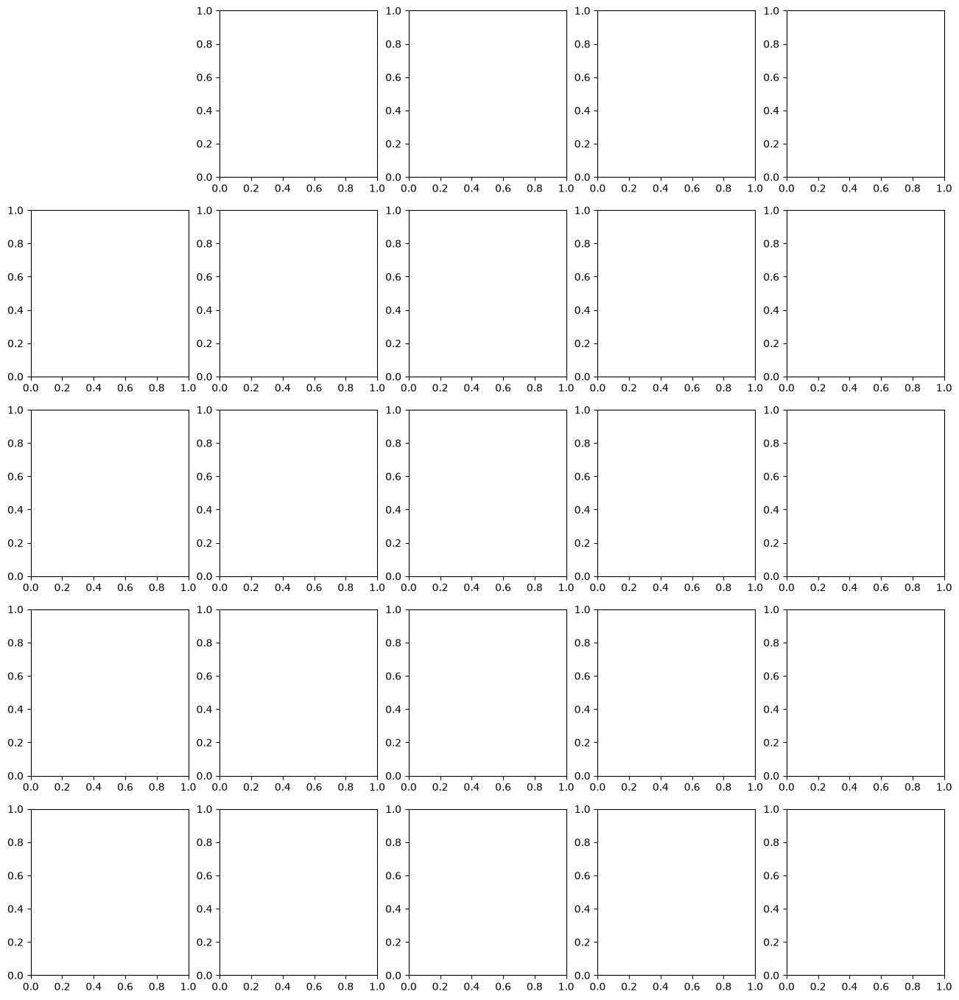

In [134]:
# Cell 128: Visual retrieval diagnostics for RQ1
# RUN AFTER CLIP EMBEDDINGS, TEXT EMBEDDINGS, AND TARGET TABLES ARE AVAILABLE

VISUAL_DIAGNOSTIC_DIR = PAPER_EXPERIMENT_DIR / "visual_retrieval_diagnostics"
VISUAL_DIAGNOSTIC_FIGURE_DIR = PAPER_FIGURES_DIR / "visual_retrieval_diagnostics"

VISUAL_DIAGNOSTIC_DIR.mkdir(parents=True, exist_ok=True)
VISUAL_DIAGNOSTIC_FIGURE_DIR.mkdir(parents=True, exist_ok=True)


def get_target_items_table_for_diagnostics():
    """
    Return the target item table aligned with saved embeddings.
    """
    if "target_items_for_clip" in globals():
        return target_items_for_clip.reset_index(drop=True)
    
    if "target_items_table" in globals():
        return target_items_table.reset_index(drop=True)
    
    raise NameError("Could not find target_items_for_clip or target_items_table.")


diagnostic_target_items_df = get_target_items_table_for_diagnostics()

print("Diagnostic target items shape:", diagnostic_target_items_df.shape)


def build_category_indexes_from_embeddings(
    item_table,
    embeddings,
    category_column="broad_category",
    valid_categories=None,
):
    """
    Build FAISS indexes for each target category using a given embedding matrix.
    """
    if valid_categories is None:
        valid_categories = PAPER_EXPERIMENT_CONFIG["target_categories"]
    
    indexes = {}
    row_lookup = {}
    
    embeddings = np.asarray(embeddings).astype("float32")
    
    for category in valid_categories:
        category_mask = item_table[category_column].astype(str).eq(category)
        category_rows = np.where(category_mask.values)[0]
        
        if len(category_rows) == 0:
            continue
        
        category_embeddings = embeddings[category_rows].astype("float32")
        
        index = faiss.IndexFlatIP(category_embeddings.shape[1])
        index.add(category_embeddings)
        
        indexes[category] = index
        row_lookup[category] = category_rows
    
    return indexes, row_lookup


# Build diagnostic indexes.
diagnostic_minilm_text_indexes, diagnostic_minilm_text_row_lookup = build_category_indexes_from_embeddings(
    item_table=diagnostic_target_items_df,
    embeddings=target_text_embeddings,
)

diagnostic_clip_image_indexes, diagnostic_clip_image_row_lookup = build_category_indexes_from_embeddings(
    item_table=diagnostic_target_items_df,
    embeddings=target_clip_image_embeddings,
)

diagnostic_clip_text_indexes, diagnostic_clip_text_row_lookup = build_category_indexes_from_embeddings(
    item_table=diagnostic_target_items_df,
    embeddings=target_clip_text_embeddings,
)

diagnostic_clip_fused_indexes, diagnostic_clip_fused_row_lookup = build_category_indexes_from_embeddings(
    item_table=diagnostic_target_items_df,
    embeddings=target_clip_fused_embeddings,
)

print("Diagnostic indexes ready.")


def search_diagnostic_index(
    query_embedding,
    target_category,
    indexes,
    row_lookup,
    item_table,
    top_k=5,
):
    """
    Search one diagnostic FAISS index.
    """
    query_embedding = np.asarray(query_embedding).astype("float32")
    
    if query_embedding.ndim == 1:
        query_embedding = query_embedding.reshape(1, -1)
    
    if target_category not in indexes:
        return pd.DataFrame()
    
    search_k = min(top_k, indexes[target_category].ntotal)
    
    scores, local_indices = indexes[target_category].search(
        query_embedding,
        search_k,
    )
    
    global_rows = row_lookup[target_category][local_indices[0]]
    
    results_df = item_table.iloc[global_rows].copy()
    results_df["retrieval_score"] = scores[0]
    results_df["retrieval_rank"] = np.arange(1, len(results_df) + 1)
    
    return results_df.reset_index(drop=True)


def run_visual_retrieval_diagnostic_case(
    query_item_id,
    user_text,
    target_category,
    top_k=5,
):
    """
    Run text-only, image-only, CLIP-text-only, and fused CLIP retrieval for one case.
    """
    query_item_row = get_query_item_by_id(query_item_id)
    
    # MiniLM text-only query
    minilm_query_text = build_query_text(
        query_item_row=query_item_row,
        user_text=user_text,
        target_category=target_category,
    )
    
    minilm_query_embedding = text_embedding_model.encode(
        [minilm_query_text],
        normalize_embeddings=True,
        convert_to_numpy=True,
    ).astype("float32")
    
    # CLIP image-only query
    clip_image_query_embedding = encode_clip_image_query_from_row(query_item_row)
    
    # CLIP text-only query
    clip_query_text = build_clip_query_text(
        query_item_row=query_item_row,
        user_text=user_text,
        target_category=target_category,
    )
    
    clip_text_query_embedding = encode_clip_text_query(clip_query_text)
    
    # CLIP fused query
    clip_fused_query_embedding = build_clip_multimodal_query_embedding(
        query_item_row=query_item_row,
        user_text=user_text,
        target_category=target_category,
        alpha_image_query=0.6,
        alpha_text_query=0.4,
    )
    
    retrieval_outputs = {
        "minilm_text_only": search_diagnostic_index(
            query_embedding=minilm_query_embedding,
            target_category=target_category,
            indexes=diagnostic_minilm_text_indexes,
            row_lookup=diagnostic_minilm_text_row_lookup,
            item_table=diagnostic_target_items_df,
            top_k=top_k,
        ),
        "clip_image_only": search_diagnostic_index(
            query_embedding=clip_image_query_embedding,
            target_category=target_category,
            indexes=diagnostic_clip_image_indexes,
            row_lookup=diagnostic_clip_image_row_lookup,
            item_table=diagnostic_target_items_df,
            top_k=top_k,
        ),
        "clip_text_only": search_diagnostic_index(
            query_embedding=clip_text_query_embedding,
            target_category=target_category,
            indexes=diagnostic_clip_text_indexes,
            row_lookup=diagnostic_clip_text_row_lookup,
            item_table=diagnostic_target_items_df,
            top_k=top_k,
        ),
        "clip_fused_multimodal": search_diagnostic_index(
            query_embedding=clip_fused_query_embedding,
            target_category=target_category,
            indexes=diagnostic_clip_fused_indexes,
            row_lookup=diagnostic_clip_fused_row_lookup,
            item_table=diagnostic_target_items_df,
            top_k=top_k,
        ),
    }
    
    return {
        "query_item": query_item_row,
        "query_item_id": query_item_id,
        "user_text": user_text,
        "target_category": target_category,
        "minilm_query_text": minilm_query_text,
        "clip_query_text": clip_query_text,
        "retrieval_outputs": retrieval_outputs,
    }


def plot_visual_retrieval_diagnostic_case(
    diagnostic_result,
    output_name,
    top_k=5,
):
    """
    Plot one query item plus retrieval grids for each retrieval mode.
    """
    query_item = diagnostic_result["query_item"]
    retrieval_outputs = diagnostic_result["retrieval_outputs"]
    
    mode_order = [
        "minilm_text_only",
        "clip_image_only",
        "clip_text_only",
        "clip_fused_multimodal",
    ]
    
    num_rows = len(mode_order) + 1
    num_cols = top_k
    
    fig, axes = plt.subplots(
        num_rows,
        num_cols,
        figsize=(num_cols * 3.2, num_rows * 3.4),
    )
    
    if num_rows == 1:
        axes = np.array([axes])
    
    # First row: query item repeated once and blanks.
    for col_idx in range(num_cols):
        ax = axes[0, col_idx]
        ax.axis("off")
        
        if col_idx == 0:
            ax.imshow(query_item["image"])
            ax.set_title(
                "Query item\n"
                f"{query_item['category']}\n"
                f"{str(query_item['text'])[:45]}",
                fontsize=9,
            )
    
    # Retrieval rows.
    for row_idx, mode_name in enumerate(mode_order, start=1):
        results_df = retrieval_outputs[mode_name]
        
        for col_idx in range(num_cols):
            ax = axes[row_idx, col_idx]
            ax.axis("off")
            
            if col_idx < len(results_df):
                item_row = results_df.iloc[col_idx]
                
                ax.imshow(item_row["image"])
                ax.set_title(
                    f"{mode_name}\n"
                    f"rank {int(item_row['retrieval_rank'])} | score {item_row['retrieval_score']:.3f}\n"
                    f"{str(item_row['category'])[:28]}\n"
                    f"{str(item_row['text'])[:45]}",
                    fontsize=8,
                )
    
    fig.suptitle(
        f"Visual retrieval diagnostic | target: {diagnostic_result['target_category']} | request: {diagnostic_result['user_text']}",
        fontsize=13,
    )
    
    plt.tight_layout()
    
    figure_path = VISUAL_DIAGNOSTIC_FIGURE_DIR / f"{output_name}.png"
    plt.savefig(figure_path, dpi=300, bbox_inches="tight")
    plt.show()
    
    return figure_path


def save_visual_retrieval_diagnostic_tables(
    diagnostic_result,
    output_name,
):
    """
    Save retrieval result tables for one diagnostic case.
    """
    rows = []
    
    for mode_name, results_df in diagnostic_result["retrieval_outputs"].items():
        for _, item_row in results_df.iterrows():
            rows.append({
                "diagnostic_case": output_name,
                "retrieval_mode": mode_name,
                "query_item_id": diagnostic_result["query_item_id"],
                "query_text": diagnostic_result["query_item"]["text"],
                "user_text": diagnostic_result["user_text"],
                "target_category": diagnostic_result["target_category"],
                "retrieval_rank": item_row["retrieval_rank"],
                "retrieval_score": item_row["retrieval_score"],
                "retrieved_item_id": item_row["item_ID"],
                "retrieved_category": item_row["category"],
                "retrieved_text": item_row["text"],
                "retrieved_broad_category": item_row["broad_category"],
            })
    
    diagnostic_table_df = pd.DataFrame(rows)
    
    table_path = VISUAL_DIAGNOSTIC_DIR / f"{output_name}.csv"
    diagnostic_table_df.to_csv(table_path, index=False)
    
    return diagnostic_table_df, table_path


# Use a small set of representative cases from the final paper dataset.
visual_diagnostic_cases = [
    {
        "output_name": "dress_to_shoes_visual_diagnostic",
        "query_item_id": "100002074_1",
        "user_text": "recommend smart casual shoes",
        "target_category": "shoes",
    }
]

# Add two more cases from the final type-filtered dataset if available.
if "paper_explanation_dataset_v3_type_filtered_df" in globals():
    sampled_extra_cases = (
        paper_explanation_dataset_v3_type_filtered_df
        .drop_duplicates(["query_item_id", "target_category"])
        .sample(
            n=min(2, paper_explanation_dataset_v3_type_filtered_df["query_item_id"].nunique()),
            random_state=42,
        )
    )
    
    for idx, row in sampled_extra_cases.iterrows():
        visual_diagnostic_cases.append({
            "output_name": f"paper_case_{row['paper_case_id']}_visual_diagnostic",
            "query_item_id": row["query_item_id"],
            "user_text": row["user_request"],
            "target_category": row["target_category"],
        })


visual_diagnostic_tables = []
visual_diagnostic_figure_paths = []

for case_config in visual_diagnostic_cases:
    print("\nRunning visual diagnostic:", case_config["output_name"])
    
    diagnostic_result = run_visual_retrieval_diagnostic_case(
        query_item_id=case_config["query_item_id"],
        user_text=case_config["user_text"],
        target_category=case_config["target_category"],
        top_k=5,
    )
    
    figure_path = plot_visual_retrieval_diagnostic_case(
        diagnostic_result=diagnostic_result,
        output_name=case_config["output_name"],
        top_k=5,
    )
    
    diagnostic_table_df, table_path = save_visual_retrieval_diagnostic_tables(
        diagnostic_result=diagnostic_result,
        output_name=case_config["output_name"],
    )
    
    visual_diagnostic_tables.append(diagnostic_table_df)
    visual_diagnostic_figure_paths.append(str(figure_path.relative_to(PROJECT_ROOT)))
    
    display(
        diagnostic_table_df[
            [
                "retrieval_mode",
                "retrieval_rank",
                "retrieval_score",
                "retrieved_category",
                "retrieved_text",
            ]
        ]
    )


visual_retrieval_diagnostics_all_df = pd.concat(
    visual_diagnostic_tables,
    ignore_index=True,
)

visual_retrieval_diagnostics_all_path = VISUAL_DIAGNOSTIC_DIR / "visual_retrieval_diagnostics_all_cases.csv"

visual_retrieval_diagnostics_all_df.to_csv(
    visual_retrieval_diagnostics_all_path,
    index=False,
)

visual_diagnostics_notes = f"""
# Visual Retrieval Diagnostics for RQ1

These diagnostics compare four retrieval modes:

1. MiniLM text-only retrieval
2. CLIP image-only retrieval
3. CLIP text-only retrieval
4. CLIP fused multimodal retrieval

The purpose is qualitative support for RQ1. The main RQ1 evidence still comes from recommendation metrics, but these grids help inspect whether the visual component retrieves visually coherent items beyond text-only matching.

Generated figure files:

{chr(10).join("- " + path for path in visual_diagnostic_figure_paths)}
"""

visual_diagnostics_notes_path = VISUAL_DIAGNOSTIC_DIR / "visual_retrieval_diagnostics_notes.md"

with open(visual_diagnostics_notes_path, "w", encoding="utf-8") as f:
    f.write(visual_diagnostics_notes)

print("\nSaved visual retrieval diagnostics:")
print(visual_retrieval_diagnostics_all_path.relative_to(PROJECT_ROOT))
print(visual_diagnostics_notes_path.relative_to(PROJECT_ROOT))

for path in visual_diagnostic_figure_paths:
    print(path)


Running visual diagnostic: dress_to_shoes_visual_diagnostic


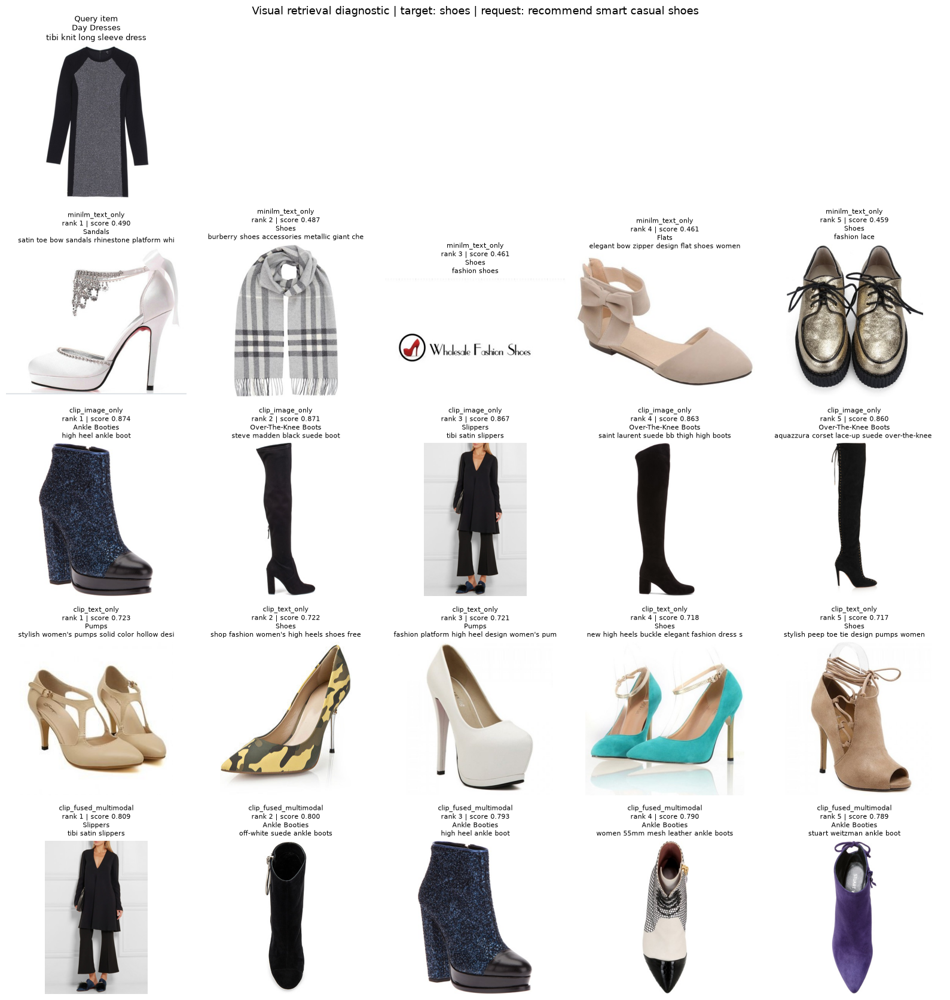

,retrieval_mode,retrieval_rank,retrieval_score,retrieved_category,retrieved_text
0,minilm_text_only,1,0.490115,Sandals,satin toe bow sandals rhinestone platform white wedding evening shoes high heel wedding evening evening shoes high h...
1,minilm_text_only,2,0.486860,Shoes,burberry shoes accessories metallic giant check cashmere scarf
2,minilm_text_only,3,0.461421,Shoes,fashion shoes
3,minilm_text_only,4,0.460544,Flats,elegant bow zipper design flat shoes women
4,minilm_text_only,5,0.459101,Shoes,fashion lace
5,clip_image_only,1,0.874131,Ankle Booties,high heel ankle boot
6,clip_image_only,2,0.871462,Over-The-Knee Boots,steve madden black suede boot
7,clip_image_only,3,0.867490,Slippers,tibi satin slippers
8,clip_image_only,4,0.862848,Over-The-Knee Boots,saint laurent suede bb thigh high boots
9,clip_image_only,5,0.860359,Over-The-Knee Boots,aquazzura corset lace-up suede over-the-knee boots



Saved visual retrieval diagnostics:
outputs\results\paper_experiments\visual_retrieval_diagnostics\visual_retrieval_diagnostics_all_cases.csv
outputs\results\paper_experiments\visual_retrieval_diagnostics\visual_retrieval_diagnostics_notes.md
outputs\figures\paper_experiments\visual_retrieval_diagnostics\dress_to_shoes_visual_diagnostic.png


In [ ]:
# Cell 128B: Fix visual diagnostic image rendering
# RUN IF CELL 128 FAILS WITH imshow IMAGE OBJECT ERROR

from PIL import Image
from io import BytesIO


def to_matplotlib_image(image_value):
    """
    Convert different image representations into a Matplotlib-displayable RGB image.
    """
    if isinstance(image_value, Image.Image):
        return image_value.convert("RGB")
    
    if isinstance(image_value, np.ndarray):
        # Sometimes arrays are object dtype or wrapped strangely.
        if image_value.dtype == object:
            if image_value.size == 1:
                return to_matplotlib_image(image_value.item())
            return np.array(Image.fromarray(np.array(image_value.tolist())).convert("RGB"))
        return image_value
    
    if isinstance(image_value, dict):
        if "bytes" in image_value and image_value["bytes"] is not None:
            return Image.open(BytesIO(image_value["bytes"])).convert("RGB")
        
        if "path" in image_value and image_value["path"] is not None:
            return Image.open(image_value["path"]).convert("RGB")
    
    if isinstance(image_value, str):
        return Image.open(image_value).convert("RGB")
    
    raise TypeError(f"Unsupported image type for display: {type(image_value)}")


def plot_visual_retrieval_diagnostic_case(
    diagnostic_result,
    output_name,
    top_k=5,
):
    """
    Plot one query item plus retrieval grids for each retrieval mode.
    Robust version that converts image objects before imshow().
    """
    query_item = diagnostic_result["query_item"]
    retrieval_outputs = diagnostic_result["retrieval_outputs"]
    
    mode_order = [
        "minilm_text_only",
        "clip_image_only",
        "clip_text_only",
        "clip_fused_multimodal",
    ]
    
    num_rows = len(mode_order) + 1
    num_cols = top_k
    
    fig, axes = plt.subplots(
        num_rows,
        num_cols,
        figsize=(num_cols * 3.2, num_rows * 3.4),
    )
    
    if num_rows == 1:
        axes = np.array([axes])
    
    # Query row
    for col_idx in range(num_cols):
        ax = axes[0, col_idx]
        ax.axis("off")
        
        if col_idx == 0:
            query_image = to_matplotlib_image(query_item["image"])
            ax.imshow(query_image)
            ax.set_title(
                "Query item\n"
                f"{query_item['category']}\n"
                f"{str(query_item['text'])[:45]}",
                fontsize=9,
            )
    
    # Retrieval rows
    for row_idx, mode_name in enumerate(mode_order, start=1):
        results_df = retrieval_outputs[mode_name]
        
        for col_idx in range(num_cols):
            ax = axes[row_idx, col_idx]
            ax.axis("off")
            
            if col_idx < len(results_df):
                item_row = results_df.iloc[col_idx]
                item_image = to_matplotlib_image(item_row["image"])
                
                ax.imshow(item_image)
                ax.set_title(
                    f"{mode_name}\n"
                    f"rank {int(item_row['retrieval_rank'])} | score {item_row['retrieval_score']:.3f}\n"
                    f"{str(item_row['category'])[:28]}\n"
                    f"{str(item_row['text'])[:45]}",
                    fontsize=8,
                )
    
    fig.suptitle(
        f"Visual retrieval diagnostic | target: {diagnostic_result['target_category']} | request: {diagnostic_result['user_text']}",
        fontsize=13,
    )
    
    plt.tight_layout()
    
    figure_path = VISUAL_DIAGNOSTIC_FIGURE_DIR / f"{output_name}.png"
    plt.savefig(figure_path, dpi=300, bbox_inches="tight")
    plt.show()
    
    return figure_path


# Rerun diagnostics using the fixed plotting function.
visual_diagnostic_tables = []
visual_diagnostic_figure_paths = []

for case_config in visual_diagnostic_cases:
    print("\nRunning visual diagnostic:", case_config["output_name"])
    
    diagnostic_result = run_visual_retrieval_diagnostic_case(
        query_item_id=case_config["query_item_id"],
        user_text=case_config["user_text"],
        target_category=case_config["target_category"],
        top_k=5,
    )
    
    figure_path = plot_visual_retrieval_diagnostic_case(
        diagnostic_result=diagnostic_result,
        output_name=case_config["output_name"],
        top_k=5,
    )
    
    diagnostic_table_df, table_path = save_visual_retrieval_diagnostic_tables(
        diagnostic_result=diagnostic_result,
        output_name=case_config["output_name"],
    )
    
    visual_diagnostic_tables.append(diagnostic_table_df)
    visual_diagnostic_figure_paths.append(str(figure_path.relative_to(PROJECT_ROOT)))
    
    display(
        diagnostic_table_df[
            [
                "retrieval_mode",
                "retrieval_rank",
                "retrieval_score",
                "retrieved_category",
                "retrieved_text",
            ]
        ]
    )


visual_retrieval_diagnostics_all_df = pd.concat(
    visual_diagnostic_tables,
    ignore_index=True,
)

visual_retrieval_diagnostics_all_path = VISUAL_DIAGNOSTIC_DIR / "visual_retrieval_diagnostics_all_cases.csv"

visual_retrieval_diagnostics_all_df.to_csv(
    visual_retrieval_diagnostics_all_path,
    index=False,
)

visual_diagnostics_notes = f"""
# Visual Retrieval Diagnostics for RQ1

These diagnostics compare four retrieval modes:

1. MiniLM text-only retrieval
2. CLIP image-only retrieval
3. CLIP text-only retrieval
4. CLIP fused multimodal retrieval

The purpose is qualitative support for RQ1. The main RQ1 evidence still comes from recommendation metrics, but these grids help inspect whether the visual component retrieves visually coherent items beyond text-only matching.

Generated figure files:

{chr(10).join("- " + path for path in visual_diagnostic_figure_paths)}
"""

visual_diagnostics_notes_path = VISUAL_DIAGNOSTIC_DIR / "visual_retrieval_diagnostics_notes.md"

with open(visual_diagnostics_notes_path, "w", encoding="utf-8") as f:
    f.write(visual_diagnostics_notes)

print("\nSaved visual retrieval diagnostics:")
print(visual_retrieval_diagnostics_all_path.relative_to(PROJECT_ROOT))
print(visual_diagnostics_notes_path.relative_to(PROJECT_ROOT))

for path in visual_diagnostic_figure_paths:
    print(path)

In [135]:
# Cell 129: Multiple-comparison correction for final statistical claims
# RUN AFTER CELL 125 STATISTICAL TESTS ARE AVAILABLE

def add_multiple_comparison_corrections(
    df,
    p_value_column="p_value",
    group_columns=None,
):
    """
    Add Holm-Bonferroni and Benjamini-Hochberg FDR corrected p-values.
    
    If group_columns is provided, corrections are applied within each group.
    Otherwise, corrections are applied across the whole dataframe.
    """
    corrected_parts = []
    
    if group_columns is None:
        grouped = [(None, df.copy())]
    else:
        grouped = list(df.groupby(group_columns, dropna=False))
    
    for _, group_df in grouped:
        group_df = group_df.copy()
        p_values = group_df[p_value_column].astype(float).values
        m = len(p_values)
        
        if m == 0:
            corrected_parts.append(group_df)
            continue
        
        # ------------------------------------------------------------
        # Holm-Bonferroni correction
        # ------------------------------------------------------------
        order = np.argsort(p_values)
        sorted_p = p_values[order]
        
        holm_sorted = np.empty(m)
        running_max = 0.0
        
        for rank_idx, p in enumerate(sorted_p):
            adjusted = (m - rank_idx) * p
            running_max = max(running_max, adjusted)
            holm_sorted[rank_idx] = min(running_max, 1.0)
        
        holm_adjusted = np.empty(m)
        holm_adjusted[order] = holm_sorted
        
        # ------------------------------------------------------------
        # Benjamini-Hochberg FDR correction
        # ------------------------------------------------------------
        bh_sorted = np.empty(m)
        running_min = 1.0
        
        for reverse_idx in range(m - 1, -1, -1):
            rank = reverse_idx + 1
            adjusted = sorted_p[reverse_idx] * m / rank
            running_min = min(running_min, adjusted)
            bh_sorted[reverse_idx] = min(running_min, 1.0)
        
        bh_adjusted = np.empty(m)
        bh_adjusted[order] = bh_sorted
        
        group_df["p_holm"] = holm_adjusted
        group_df["p_bh_fdr"] = bh_adjusted
        group_df["significant_holm_0_05"] = group_df["p_holm"] < 0.05
        group_df["significant_bh_fdr_0_05"] = group_df["p_bh_fdr"] < 0.05
        
        corrected_parts.append(group_df)
    
    return pd.concat(corrected_parts, ignore_index=True)


# Apply correction to all final type-filtered v3 statistical tests.
paper_explanation_statistical_tests_v3_type_filtered_corrected_df = add_multiple_comparison_corrections(
    df=paper_explanation_statistical_tests_v3_type_filtered_df,
    p_value_column="p_value",
    group_columns=["metric_family"],
)

print("Corrected full statistical tests shape:")
print(paper_explanation_statistical_tests_v3_type_filtered_corrected_df.shape)

display(
    paper_explanation_statistical_tests_v3_type_filtered_corrected_df[
        [
            "metric_family",
            "metric",
            "comparison",
            "mean_difference",
            "ci_lower",
            "ci_upper",
            "p_value",
            "p_holm",
            "p_bh_fdr",
            "significant_holm_0_05",
            "significant_bh_fdr_0_05",
            "paired_cohen_d",
        ]
    ].sort_values(["metric_family", "metric", "comparison"])
)


# Add correction to the selected paper claims table.
paper_statistical_claims_summary_v3_type_filtered_corrected_df = paper_statistical_claims_summary_v3_type_filtered_df.merge(
    paper_explanation_statistical_tests_v3_type_filtered_corrected_df[
        [
            "metric_family",
            "metric",
            "comparison",
            "p_holm",
            "p_bh_fdr",
            "significant_holm_0_05",
            "significant_bh_fdr_0_05",
        ]
    ],
    on=["metric_family", "metric", "comparison"],
    how="left",
)

paper_statistical_claims_summary_v3_type_filtered_corrected_df["claim_conclusion_holm"] = np.where(
    (
        paper_statistical_claims_summary_v3_type_filtered_corrected_df["direction_supported"]
        & paper_statistical_claims_summary_v3_type_filtered_corrected_df["ci_direction_supported"]
        & paper_statistical_claims_summary_v3_type_filtered_corrected_df["significant_holm_0_05"]
    ),
    "supported_after_holm_correction",
    "not_supported_after_holm_correction",
)

paper_statistical_claims_summary_v3_type_filtered_corrected_df["claim_conclusion_bh_fdr"] = np.where(
    (
        paper_statistical_claims_summary_v3_type_filtered_corrected_df["direction_supported"]
        & paper_statistical_claims_summary_v3_type_filtered_corrected_df["ci_direction_supported"]
        & paper_statistical_claims_summary_v3_type_filtered_corrected_df["significant_bh_fdr_0_05"]
    ),
    "supported_after_bh_fdr_correction",
    "not_supported_after_bh_fdr_correction",
)

print("\nCorrected paper-ready statistical claims:")
display(
    paper_statistical_claims_summary_v3_type_filtered_corrected_df[
        [
            "claim",
            "metric",
            "comparison",
            "mean_difference",
            "ci_lower",
            "ci_upper",
            "p_value",
            "p_holm",
            "p_bh_fdr",
            "paired_cohen_d",
            "claim_conclusion",
            "claim_conclusion_holm",
            "claim_conclusion_bh_fdr",
        ]
    ]
)


# Save corrected outputs.
corrected_tests_path = PAPER_KB_EXPERIMENT_DIR / "paper_explanation_statistical_tests_v3_type_filtered_corrected.csv"
corrected_claims_path = PAPER_KB_EXPERIMENT_DIR / "paper_statistical_claims_summary_v3_type_filtered_corrected.csv"

paper_explanation_statistical_tests_v3_type_filtered_corrected_df.to_csv(
    corrected_tests_path,
    index=False,
)

paper_statistical_claims_summary_v3_type_filtered_corrected_df.to_csv(
    corrected_claims_path,
    index=False,
)

print("\nSaved corrected statistical outputs:")
print(corrected_tests_path.relative_to(PROJECT_ROOT))
print(corrected_claims_path.relative_to(PROJECT_ROOT))

Corrected full statistical tests shape:
(48, 19)


,metric_family,metric,comparison,mean_difference,ci_lower,ci_upper,p_value,p_holm,p_bh_fdr,significant_holm_0_05,significant_bh_fdr_0_05,paired_cohen_d
12,automatic_v3_type_filtered,evidence_overlap,hybrid_rag - item_rag,0.372484,0.352085,0.392038,3.896120e-18,6.983010e-17,2.337672e-17,True,True,3.716928
16,automatic_v3_type_filtered,evidence_overlap,hybrid_rag - no_rag,0.529935,0.508381,0.550840,3.879450e-18,6.983010e-17,2.337672e-17,True,True,5.036902
14,automatic_v3_type_filtered,evidence_overlap,hybrid_rag - rule_rag,0.117308,0.091546,0.141550,4.045117e-12,5.258652e-11,1.213535e-11,True,True,0.907520
17,automatic_v3_type_filtered,evidence_overlap,item_rag - no_rag,0.157451,0.140773,0.173592,5.671697e-18,8.507546e-17,2.552264e-17,True,True,1.912449
13,automatic_v3_type_filtered,evidence_overlap,rule_rag - item_rag,0.255175,0.224761,0.284021,4.881617e-17,6.834264e-16,1.757382e-16,True,True,1.690621
15,automatic_v3_type_filtered,evidence_overlap,rule_rag - no_rag,0.412627,0.387939,0.436229,3.887338e-18,6.983010e-17,2.337672e-17,True,True,3.292897
6,automatic_v3_type_filtered,occasion_drift_count_evidence_aware,hybrid_rag - item_rag,-0.060000,-0.110000,-0.020000,1.430588e-02,1.144470e-01,2.145882e-02,False,True,-0.251379
10,automatic_v3_type_filtered,occasion_drift_count_evidence_aware,hybrid_rag - no_rag,-0.060000,-0.110000,-0.020000,1.430588e-02,1.144470e-01,2.145882e-02,False,True,-0.251379
8,automatic_v3_type_filtered,occasion_drift_count_evidence_aware,hybrid_rag - rule_rag,-0.010000,-0.030000,0.000000,3.173105e-01,1.000000e+00,3.807726e-01,False,False,-0.100000
11,automatic_v3_type_filtered,occasion_drift_count_evidence_aware,item_rag - no_rag,0.000000,-0.070000,0.070000,1.000000e+00,1.000000e+00,1.000000e+00,False,False,0.000000



Corrected paper-ready statistical claims:


,claim,metric,comparison,mean_difference,ci_lower,ci_upper,p_value,p_holm,p_bh_fdr,paired_cohen_d,claim_conclusion,claim_conclusion_holm,claim_conclusion_bh_fdr
0,Type-filtered v3 Hybrid-RAG improves evidence overlap over Item-RAG.,evidence_overlap,hybrid_rag - item_rag,0.372484,0.352085,0.392038,3.896120e-18,6.983010e-17,2.337672e-17,3.716928,supported,supported_after_holm_correction,supported_after_bh_fdr_correction
1,Type-filtered v3 Rule-RAG improves evidence overlap over Item-RAG.,evidence_overlap,rule_rag - item_rag,0.255175,0.224761,0.284021,4.881617e-17,6.834264e-16,1.757382e-16,1.690621,supported,supported_after_holm_correction,supported_after_bh_fdr_correction
2,Type-filtered v3 Rule-RAG reduces evidence-aware unsupported claims compared with No-RAG.,unsupported_claim_count_evidence_aware,rule_rag - no_rag,-0.300000,-0.410000,-0.200000,1.264130e-06,1.516956e-05,3.250619e-06,-0.554294,supported,supported_after_holm_correction,supported_after_bh_fdr_correction
3,Type-filtered v3 Hybrid-RAG reduces evidence-aware unsupported claims compared with No-RAG.,unsupported_claim_count_evidence_aware,hybrid_rag - no_rag,-0.290000,-0.400000,-0.180000,4.152128e-06,4.567341e-05,9.342289e-06,-0.521706,supported,supported_after_holm_correction,supported_after_bh_fdr_correction
4,Type-filtered v3 Hybrid-RAG improves grounding safety over Item-RAG.,grounding_safety,hybrid_rag - item_rag,2.150000,1.810000,2.480000,2.111086e-14,5.911042e-13,2.111086e-13,1.246032,supported,supported_after_holm_correction,supported_after_bh_fdr_correction
5,Type-filtered v3 Rule-RAG improves grounding safety over Item-RAG.,grounding_safety,rule_rag - item_rag,1.990000,1.690000,2.290000,1.173634e-14,3.520902e-13,2.111086e-13,1.302789,supported,supported_after_holm_correction,supported_after_bh_fdr_correction
6,Type-filtered v3 Hybrid-RAG improves faithfulness over Item-RAG.,faithfulness_to_available_information,hybrid_rag - item_rag,1.720000,1.470000,1.970000,1.870476e-14,5.424380e-13,2.111086e-13,1.352287,supported,supported_after_holm_correction,supported_after_bh_fdr_correction
7,Type-filtered v3 Rule-RAG improves faithfulness over Item-RAG.,faithfulness_to_available_information,rule_rag - item_rag,1.570000,1.319750,1.820250,8.818149e-14,2.380900e-12,6.613611e-13,1.217927,supported,supported_after_holm_correction,supported_after_bh_fdr_correction



Saved corrected statistical outputs:
outputs\results\paper_experiments\kb_v3_experiment\paper_explanation_statistical_tests_v3_type_filtered_corrected.csv
outputs\results\paper_experiments\kb_v3_experiment\paper_statistical_claims_summary_v3_type_filtered_corrected.csv


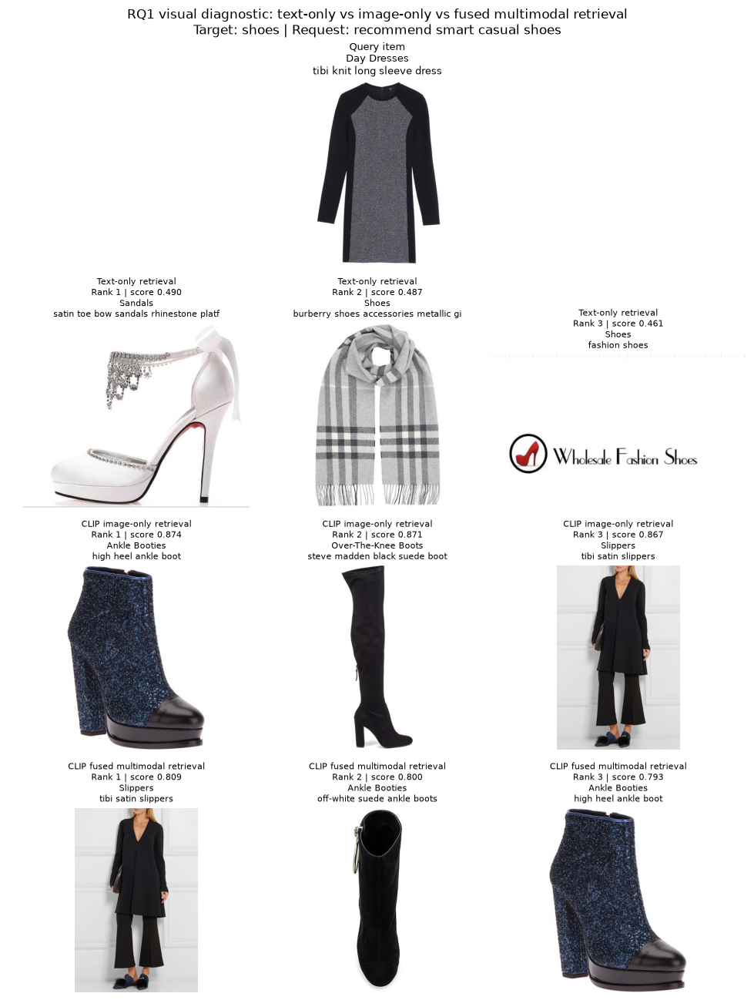

,retrieval_mode,retrieval_rank,retrieval_score,retrieved_category,retrieved_text
0,minilm_text_only,1,0.490115,Sandals,satin toe bow sandals rhinestone platform white wedding evening shoes high heel wedding evening evening shoes high h...
1,minilm_text_only,2,0.486860,Shoes,burberry shoes accessories metallic giant check cashmere scarf
2,minilm_text_only,3,0.461421,Shoes,fashion shoes
3,clip_image_only,1,0.874131,Ankle Booties,high heel ankle boot
4,clip_image_only,2,0.871462,Over-The-Knee Boots,steve madden black suede boot
5,clip_image_only,3,0.867490,Slippers,tibi satin slippers
6,clip_fused_multimodal,1,0.809318,Slippers,tibi satin slippers
7,clip_fused_multimodal,2,0.799879,Ankle Booties,off-white suede ankle boots
8,clip_fused_multimodal,3,0.793405,Ankle Booties,high heel ankle boot



Saved clean RQ1 visual diagnostic outputs:
outputs\figures\paper_experiments\rq1_clean_visual_diagnostics\rq1_clean_dress_to_shoes_top3.png
outputs\results\paper_experiments\rq1_clean_visual_diagnostics\rq1_clean_dress_to_shoes_top3.csv
outputs\results\paper_experiments\rq1_clean_visual_diagnostics\rq1_clean_visual_diagnostic_notes.md


In [136]:
# Cell 130: Clean top-3 visual diagnostic figure for RQ1
# RUN AFTER CELL 128 / 128B VISUAL DIAGNOSTIC FUNCTIONS ARE AVAILABLE

CLEAN_RQ1_FIGURE_DIR = PAPER_FIGURES_DIR / "rq1_clean_visual_diagnostics"
CLEAN_RQ1_TABLE_DIR = PAPER_EXPERIMENT_DIR / "rq1_clean_visual_diagnostics"

CLEAN_RQ1_FIGURE_DIR.mkdir(parents=True, exist_ok=True)
CLEAN_RQ1_TABLE_DIR.mkdir(parents=True, exist_ok=True)


# Safety fallback if the image converter was not already defined.
if "to_matplotlib_image" not in globals():
    from PIL import Image
    from io import BytesIO
    
    def to_matplotlib_image(image_value):
        if isinstance(image_value, Image.Image):
            return image_value.convert("RGB")
        
        if isinstance(image_value, np.ndarray):
            if image_value.dtype == object:
                if image_value.size == 1:
                    return to_matplotlib_image(image_value.item())
                return np.array(Image.fromarray(np.array(image_value.tolist())).convert("RGB"))
            return image_value
        
        if isinstance(image_value, dict):
            if "bytes" in image_value and image_value["bytes"] is not None:
                return Image.open(BytesIO(image_value["bytes"])).convert("RGB")
            if "path" in image_value and image_value["path"] is not None:
                return Image.open(image_value["path"]).convert("RGB")
        
        if isinstance(image_value, str):
            return Image.open(image_value).convert("RGB")
        
        raise TypeError(f"Unsupported image type for display: {type(image_value)}")


def plot_clean_rq1_visual_diagnostic(
    diagnostic_result,
    output_name,
    top_k=3,
):
    """
    Cleaner paper-style visual diagnostic:
    query item + top-3 MiniLM text-only + top-3 CLIP image-only + top-3 CLIP fused.
    """
    query_item = diagnostic_result["query_item"]
    retrieval_outputs = diagnostic_result["retrieval_outputs"]
    
    mode_order = [
        ("minilm_text_only", "Text-only retrieval"),
        ("clip_image_only", "CLIP image-only retrieval"),
        ("clip_fused_multimodal", "CLIP fused multimodal retrieval"),
    ]
    
    num_rows = len(mode_order) + 1
    num_cols = top_k
    
    fig, axes = plt.subplots(
        num_rows,
        num_cols,
        figsize=(num_cols * 3.3, num_rows * 3.3),
    )
    
    # Query row.
    for col_idx in range(num_cols):
        ax = axes[0, col_idx]
        ax.axis("off")
        
        if col_idx == 1:
            ax.imshow(to_matplotlib_image(query_item["image"]))
            ax.set_title(
                "Query item\n"
                f"{query_item['category']}\n"
                f"{str(query_item['text'])[:40]}",
                fontsize=9,
            )
    
    # Retrieval rows.
    for row_idx, (mode_name, readable_name) in enumerate(mode_order, start=1):
        results_df = retrieval_outputs[mode_name].head(top_k).reset_index(drop=True)
        
        for col_idx in range(top_k):
            ax = axes[row_idx, col_idx]
            ax.axis("off")
            
            if col_idx < len(results_df):
                item_row = results_df.iloc[col_idx]
                ax.imshow(to_matplotlib_image(item_row["image"]))
                
                ax.set_title(
                    f"{readable_name}\n"
                    f"Rank {int(item_row['retrieval_rank'])} | score {item_row['retrieval_score']:.3f}\n"
                    f"{str(item_row['category'])[:24]}\n"
                    f"{str(item_row['text'])[:38]}",
                    fontsize=8,
                )
    
    fig.suptitle(
        f"RQ1 visual diagnostic: text-only vs image-only vs fused multimodal retrieval\n"
        f"Target: {diagnostic_result['target_category']} | Request: {diagnostic_result['user_text']}",
        fontsize=12,
    )
    
    plt.tight_layout()
    
    output_path = CLEAN_RQ1_FIGURE_DIR / f"{output_name}.png"
    plt.savefig(output_path, dpi=300, bbox_inches="tight")
    plt.show()
    
    return output_path


def build_clean_rq1_diagnostic_table(
    diagnostic_result,
    output_name,
    top_k=3,
):
    """
    Save the top-3 diagnostic retrieval table used in the clean figure.
    """
    selected_modes = [
        "minilm_text_only",
        "clip_image_only",
        "clip_fused_multimodal",
    ]
    
    rows = []
    
    for mode_name in selected_modes:
        results_df = diagnostic_result["retrieval_outputs"][mode_name].head(top_k)
        
        for _, item_row in results_df.iterrows():
            rows.append({
                "figure_name": output_name,
                "retrieval_mode": mode_name,
                "query_item_id": diagnostic_result["query_item_id"],
                "query_category": diagnostic_result["query_item"]["category"],
                "query_text": diagnostic_result["query_item"]["text"],
                "user_text": diagnostic_result["user_text"],
                "target_category": diagnostic_result["target_category"],
                "retrieval_rank": item_row["retrieval_rank"],
                "retrieval_score": item_row["retrieval_score"],
                "retrieved_item_id": item_row["item_ID"],
                "retrieved_category": item_row["category"],
                "retrieved_text": item_row["text"],
            })
    
    clean_table_df = pd.DataFrame(rows)
    table_path = CLEAN_RQ1_TABLE_DIR / f"{output_name}.csv"
    clean_table_df.to_csv(table_path, index=False)
    
    return clean_table_df, table_path


# Main clean figure case.
clean_rq1_case = {
    "output_name": "rq1_clean_dress_to_shoes_top3",
    "query_item_id": "100002074_1",
    "user_text": "recommend smart casual shoes",
    "target_category": "shoes",
}

clean_rq1_diagnostic_result = run_visual_retrieval_diagnostic_case(
    query_item_id=clean_rq1_case["query_item_id"],
    user_text=clean_rq1_case["user_text"],
    target_category=clean_rq1_case["target_category"],
    top_k=5,
)

clean_rq1_figure_path = plot_clean_rq1_visual_diagnostic(
    diagnostic_result=clean_rq1_diagnostic_result,
    output_name=clean_rq1_case["output_name"],
    top_k=3,
)

clean_rq1_table_df, clean_rq1_table_path = build_clean_rq1_diagnostic_table(
    diagnostic_result=clean_rq1_diagnostic_result,
    output_name=clean_rq1_case["output_name"],
    top_k=3,
)

display(
    clean_rq1_table_df[
        [
            "retrieval_mode",
            "retrieval_rank",
            "retrieval_score",
            "retrieved_category",
            "retrieved_text",
        ]
    ]
)


clean_rq1_notes = f"""
# Clean RQ1 Visual Diagnostic Figure

This figure supports RQ1 by qualitatively comparing:

1. Text-only retrieval
2. CLIP image-only retrieval
3. CLIP fused multimodal retrieval

The main RQ1 evidence remains the quantitative recommendation metrics. This figure is supporting qualitative evidence showing how the visual component changes retrieval behaviour.

Figure:

- {clean_rq1_figure_path.relative_to(PROJECT_ROOT)}

Table:

- {clean_rq1_table_path.relative_to(PROJECT_ROOT)}
"""

clean_rq1_notes_path = CLEAN_RQ1_TABLE_DIR / "rq1_clean_visual_diagnostic_notes.md"

with open(clean_rq1_notes_path, "w", encoding="utf-8") as f:
    f.write(clean_rq1_notes)

print("\nSaved clean RQ1 visual diagnostic outputs:")
print(clean_rq1_figure_path.relative_to(PROJECT_ROOT))
print(clean_rq1_table_path.relative_to(PROJECT_ROOT))
print(clean_rq1_notes_path.relative_to(PROJECT_ROOT))